In [1]:
import warnings
warnings.filterwarnings('ignore')
#import PyTre
import pandas as pd
import numpy as np

import pickle
import scipy.spatial
#import matplotlib.cm as cm
import scipy.stats
import tensorflow as tf
import keras
import statsmodels.api as sm
import math
from collections import OrderedDict
from collections import Counter

from keras.layers.core import Dense, Activation, Dropout, Flatten
from keras.layers.embeddings import Embedding
from keras.layers.recurrent import LSTM
from keras.layers import BatchNormalization, Input, concatenate
import tempfile
import keras.models
from keras.models import Model, Sequential, load_model
from keras import regularizers
from keras.callbacks import ModelCheckpoint
import keras.backend as K

from sklearn.linear_model  import LogisticRegressionCV, LogisticRegression
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, MDS
from sklearn.model_selection import train_test_split
import os
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

import seaborn as sns
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras import regularizers
from sklearn.metrics import confusion_matrix, recall_score, accuracy_score, precision_score
from sklearn.cluster import KMeans
from sklearn import decomposition
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import Normalizer
from numpy import nan

import PyTre_multioutput
from adjustText import adjust_text  
from numpy import dot
from numpy.linalg import norm

import networkx as nx

%matplotlib inline
import matplotlib.pyplot as plt

#matplotlib style options
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (15, 8)
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (15, 8)

from sklearn.metrics import f1_score

from sklearn.metrics import classification_report

import matplotlib.cm as cm

def func_cos_sim(a, b):
    cos_sim = dot(a, b)/(norm(a)*norm(b))
    return cos_sim
def discretize_variables(data, columns):
    features_categorical=pd.DataFrame() # new dataframe to save the discretized data
    #columns=df_data.columns # df_data: dataframe to discretize, columns: variables to discretize
    for var in columns:
        print(var)
        n=5  
        print(np.var(data[var]))
        found_n=0
        
        while found_n==0:
            try:
                pd.qcut(data[var], q=n, precision=0)
              
            except Exception as e:
                n-=1
            
                print(n)
            else:
                found_n=1
                features_categorical[var]=pd.qcut(data[var], q=n)
        print(features_categorical[var])
        print()
    return features_categorical
def calculate_distances(embeddings, points):
    norm_embs=preprocessing.normalize(embeddings,norm='l2', axis=1)
    norm_embs=preprocessing.scale(norm_embs,with_mean=True,with_std=False)
    norm_embs=preprocessing.normalize(norm_embs,norm='l2',axis=1)
                
    euclidean_distance_dict = {i:[] for i in points}
    manhattan_distance_dict = {i:[] for i in points}
    cosine_sim_dic = {i:[] for i in points}
    for i,point in enumerate(points):
        euclidean_distance_list = []
        manhattan_distance_list = []
        cos_sim_list = []
        for j in range(len(embeddings)):
            if i != j:
                dist = np.linalg.norm(embeddings[i]-embeddings[j])
                manhattan = scipy.spatial.distance.cityblock(embeddings[i], embeddings[j])
                current_cos_sim = func_cos_sim(norm_embs[i],norm_embs[j])
                
                euclidean_distance_list.append((dist, points[j]))
                euclidean_distance_list=sorted(euclidean_distance_list, key=lambda x:x[0], reverse=False)
                
                manhattan_distance_list.append((manhattan, points[j]))
                manhattan_distance_list=sorted(manhattan_distance_list, key=lambda x:x[0], reverse=False)
                
                cos_sim_list.append((current_cos_sim, points[j]))
                cos_sim_list=sorted(cos_sim_list, key=lambda x:x[0], reverse=True)
                
        euclidean_distance_dict[point]=euclidean_distance_list
        manhattan_distance_dict[point]=manhattan_distance_list
        cosine_sim_dic[point]=cos_sim_list
    return euclidean_distance_dict, manhattan_distance_dict, cosine_sim_dic
def changes(cosine_sim_dic, cosine_sim_dic_past, value):
    count = 0
    cities =[]
    for city_1 in cosine_sim_dic:
        top_similar = []
        top_similar_past = []
        for city_2 in cosine_sim_dic[city_1][:value]:
            top_similar.append(city_2[1])
        for city_2_past in cosine_sim_dic_past[city_1][:value]:
            top_similar_past.append(city_2_past[1])
        different = list(set(top_similar_past)-set(top_similar))
        if len(different) > 0:
            #print(city_1)
            #print(len(different), 'changes in top', value, 'similar cities')
            #print()
            count += len(different)
        else:
            cities.append(city_1)
    print('Total change:', round(count/(len(cosine_sim_dic)*value)*100, 2), '%')
    print('No changes in:',cities)

Using TensorFlow backend.


In [2]:
data=pd.read_csv('data_for_pca.csv')
coords=pd.read_csv('data_1.csv')

In [3]:
coords_to_plot=pd.DataFrame(columns=['area', 'lat', 'lon'])
for i,area in enumerate(data.areas):
    if area in np.array(coords.names):
        lat = coords.loc[coords.names==area].lat.values
        lon = coords.loc[coords.names==area].lng.values
        coords_to_plot.loc[i, 'area']=area
        coords_to_plot.loc[i, 'lat']=lat[0]
        coords_to_plot.loc[i, 'lon']=lon[0]
    else:
        print(area)

Dybbølsbro_KøbenhavnH_Vesterport
Nørrebro_Bispebjerg


In [4]:
coords_to_plot.loc[89, 'area'] = 'København H'
coords_to_plot.loc[89, 'lat'] = coords.loc[coords.names=='København H'].lat.values[0]
coords_to_plot.loc[89, 'lon'] = coords.loc[coords.names=='København H'].lng.values[0]

coords_to_plot.loc[90, 'area'] = 'Nørrebro_Bispebjerg'
coords_to_plot.loc[90, 'lat'] = coords.loc[coords.names.isin(['Nørrebro','Bispebjerg'])].lat.mean()
coords_to_plot.loc[90, 'lon'] = coords.loc[coords.names.isin(['Nørrebro','Bispebjerg'])].lng.mean()

In [5]:
coords_to_plot=coords_to_plot.reset_index(drop=True)
coords_to_plot

,area,lat,lon
0,Albertslund,55.6582,12.3534
1,Amager Strand,55.6563,12.6319
2,Amagerbro,55.6634,12.6029
3,Avedøre,55.6255,12.4549
4,Bagsværd,55.7614,12.4537
...,...,...,...
84,Øresund,55.6614,12.6287
85,Ørholm,55.7997,12.5097
86,Østerport,55.6922,12.5873
87,København H,55.6725,12.5638


In [6]:
import folium

In [7]:
from folium import DivIcon

In [8]:
map_sg = folium.Map(location=[55.677325, 12.571579], zoom_start=10, tiles='cartodbpositron', )

# add markers to map
for lat, lng, area in zip(coords_to_plot.lat, coords_to_plot.lon, coords_to_plot.area):
    #label = '{}'.format(neighborhood)
    #label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=1,
        #popup=label,
        color='darkred',
        fill=False,
        fill_color='darkgray',
        fill_opacity=1,
        parse_html=False).add_to(map_sg)
    #folium.Marker(
    #[lat, lng],
    #icon=DivIcon(
    #    icon_size=(1,1),
    #    icon_anchor=(0.2,0),
    #    html='<div style="font-size:7pt">%s</div>' % area,
    #    )
    #).add_to(map_sg)

map_sg

In [9]:
data

,burglaries,crimes,victims,group_trips,morning_trips,afternoon_trips,evening_trips,night_trips,traveler_0-15,traveler_16-30,...,night,offices,school,shops,supermarket,transport_stations,other_transport,hotel,sports,areas
0,0.007346,0.015812,0.006253,0.010719,0.012171,0.009411,0.007135,0.015562,0.013704,0.007578,...,0.003953,0.006764,0.000000,0.000837,0.005446,0.006494,0.000000,0.000000,0.007954,Albertslund
1,0.005734,0.015460,0.020086,0.004474,0.003966,0.004388,0.005997,0.004016,0.007212,0.003152,...,0.007905,0.003382,0.024096,0.001256,0.008169,0.006494,0.000000,0.007286,0.008484,Amager Strand
2,0.005734,0.015460,0.020086,0.020287,0.017420,0.025753,0.028436,0.021084,0.015146,0.034313,...,0.019763,0.011274,0.012048,0.056928,0.047651,0.029221,0.000000,0.007286,0.027574,Amagerbro
3,0.018455,0.010014,0.003873,0.008372,0.006222,0.007898,0.008169,0.006024,0.011540,0.004971,...,0.000000,0.000000,0.006024,0.000837,0.001361,0.003247,0.000000,0.000000,0.009545,Avedøre
4,0.013259,0.007906,0.003265,0.009789,0.014232,0.009502,0.006618,0.020080,0.008114,0.006002,...,0.003953,0.019166,0.024096,0.001256,0.006807,0.006494,0.000000,0.000000,0.007954,Bagsværd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84,0.018455,0.010014,0.003873,0.005891,0.003811,0.005417,0.005997,0.003012,0.007212,0.002667,...,0.000000,0.000000,0.012048,0.000000,0.000681,0.006494,0.000000,0.000000,0.005303,Åmarken
85,0.005734,0.015460,0.020086,0.010409,0.010032,0.006990,0.004136,0.010040,0.005590,0.009942,...,0.000000,0.004510,0.000000,0.035580,0.006807,0.009740,0.000000,0.014572,0.006363,Ørestad
86,0.005734,0.015460,0.020086,0.003942,0.003033,0.003208,0.003412,0.004518,0.003426,0.002122,...,0.003953,0.004510,0.000000,0.000419,0.001361,0.000000,0.000000,0.000000,0.003712,Øresund
87,0.017560,0.006852,0.005644,0.001727,0.001555,0.001453,0.001758,0.001506,0.001983,0.000303,...,0.000000,0.000000,0.000000,0.001256,0.000000,0.003247,0.000000,0.000000,0.005833,Ørholm


In [10]:
data_discretized = data.copy()  #Europe dataset with categorical values

for i,column in enumerate(data_discretized.columns[:-1]):    
    data_discretized[column] = pd.cut(data_discretized[column], bins=5, labels=[column+'_min', column+'_low', column+'_med', column+'_high', column+'_max'])


In [11]:
data_discretized

,burglaries,crimes,victims,group_trips,morning_trips,afternoon_trips,evening_trips,night_trips,traveler_0-15,traveler_16-30,...,night,offices,school,shops,supermarket,transport_stations,other_transport,hotel,sports,areas
0,burglaries_min,crimes_high,victims_low,group_trips_min,morning_trips_min,afternoon_trips_min,evening_trips_min,night_trips_min,traveler_0-15_low,traveler_16-30_min,...,night_min,offices_min,school_min,shops_min,supermarket_min,transport_stations_min,other_transport_min,hotel_min,sports_low,Albertslund
1,burglaries_min,crimes_high,victims_max,group_trips_min,morning_trips_min,afternoon_trips_min,evening_trips_min,night_trips_min,traveler_0-15_min,traveler_16-30_min,...,night_min,offices_min,school_low,shops_min,supermarket_min,transport_stations_min,other_transport_min,hotel_min,sports_low,Amager Strand
2,burglaries_min,crimes_high,victims_max,group_trips_low,morning_trips_low,afternoon_trips_low,evening_trips_med,night_trips_low,traveler_0-15_low,traveler_16-30_low,...,night_min,offices_min,school_min,shops_med,supermarket_med,transport_stations_low,other_transport_min,hotel_min,sports_max,Amagerbro
3,burglaries_med,crimes_low,victims_min,group_trips_min,morning_trips_min,afternoon_trips_min,evening_trips_min,night_trips_min,traveler_0-15_low,traveler_16-30_min,...,night_min,offices_min,school_min,shops_min,supermarket_min,transport_stations_min,other_transport_min,hotel_min,sports_low,Avedøre
4,burglaries_low,crimes_min,victims_min,group_trips_min,morning_trips_min,afternoon_trips_min,evening_trips_min,night_trips_low,traveler_0-15_min,traveler_16-30_min,...,night_min,offices_min,school_low,shops_min,supermarket_min,transport_stations_min,other_transport_min,hotel_min,sports_low,Bagsværd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84,burglaries_med,crimes_low,victims_min,group_trips_min,morning_trips_min,afternoon_trips_min,evening_trips_min,night_trips_min,traveler_0-15_min,traveler_16-30_min,...,night_min,offices_min,school_min,shops_min,supermarket_min,transport_stations_min,other_transport_min,hotel_min,sports_min,Åmarken
85,burglaries_min,crimes_high,victims_max,group_trips_min,morning_trips_min,afternoon_trips_min,evening_trips_min,night_trips_min,traveler_0-15_min,traveler_16-30_min,...,night_min,offices_min,school_min,shops_low,supermarket_min,transport_stations_min,other_transport_min,hotel_min,sports_min,Ørestad
86,burglaries_min,crimes_high,victims_max,group_trips_min,morning_trips_min,afternoon_trips_min,evening_trips_min,night_trips_min,traveler_0-15_min,traveler_16-30_min,...,night_min,offices_min,school_min,shops_min,supermarket_min,transport_stations_min,other_transport_min,hotel_min,sports_min,Øresund
87,burglaries_med,crimes_min,victims_low,group_trips_min,morning_trips_min,afternoon_trips_min,evening_trips_min,night_trips_min,traveler_0-15_min,traveler_16-30_min,...,night_min,offices_min,school_min,shops_min,supermarket_min,transport_stations_min,other_transport_min,hotel_min,sports_min,Ørholm


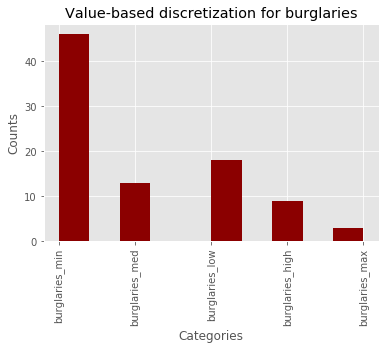

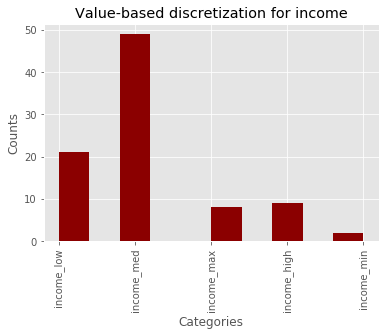

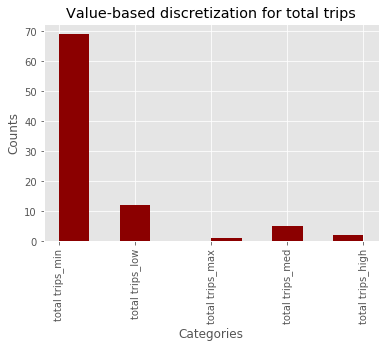

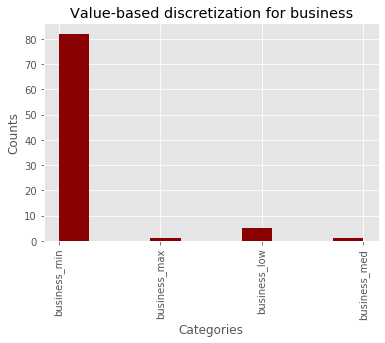

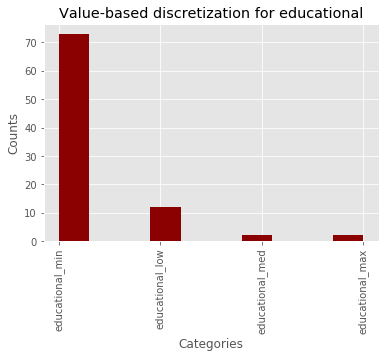

...

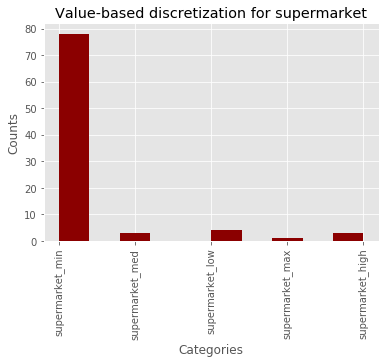

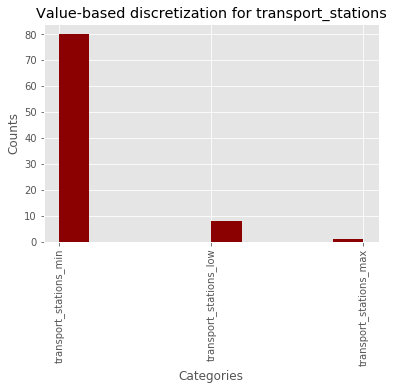

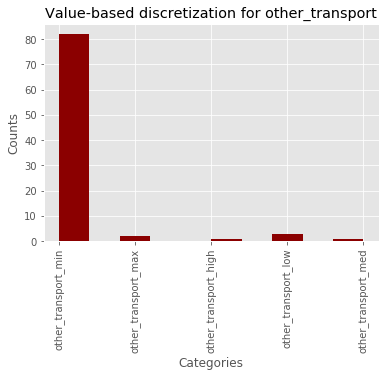

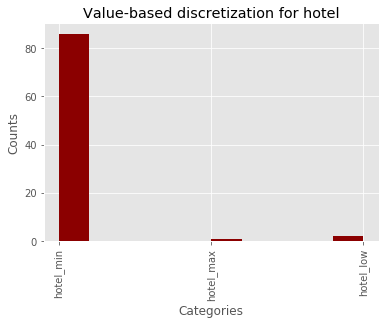

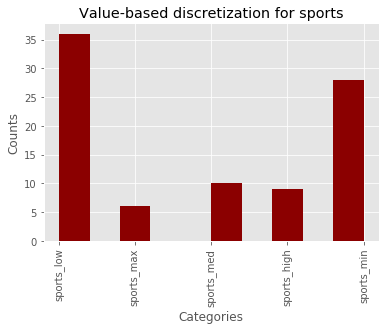

In [219]:
 # Initialize the figure
#fig, ((0,1,2,3,4)) = plt.subplots(19, 4, figsize=(15, 40))

for i,feature in enumerate(col_use):
    # Boxplot
    plt.hist(data_discretized[feature], color='darkred')
    plt.xticks(rotation='vertical')
    plt.title('Value-based discretization for {}'.format(feature))
    plt.xlabel('Categories')
    plt.ylabel('Counts')
    
    # Display
    plt.show()

In [12]:
col_use = ['burglaries', 'income','total trips','business','educational', 'errand', 'leisure', 'home', #TU
         'Cooperative','Owner', 'Rent', 'Family House', 'Flat', 'Linked House','Student House', #TU 
           'Couple','Couple_with_children', 'Single', 'Single_with_children', #TU
           'landuse_construction', 'landuse_forest', 'landuse_grass', 'landuse_railway','landuse_residential',
       'transport', 'highway','man_made', 'tunnel','service',
        'place_square', 
       'building_industrial', 'building_garages', 'building_comercial', 
        'building_roof','amenity_leisure', 'amenity_child',
           'natural', 'tourism', 'attraction', 'parking', 'church',
       'art', 'university', 'restaurant', 'offices', 'school', 'shops', 'supermarket',
       'transport_stations', 'other_transport', 'hotel', 'sports']

In [13]:
MODEL=PyTre_multioutput.EmbeddingsModel() 
                                       
m, embs= MODEL.fit(data_discretized[['areas']], # ----> X
                   data_discretized[[]], # ----> Ys continuous (we can add more columns...)
                   data_discretized[col_use], # -----> Ys categorical (we have none so far)
                   data_discretized[[]], # ----> no exogenous variables used here (but can be added)
                   xlabels=['areas'], CRC=False,
                   EPOCHS=4000, VALIDATION_SPLIT=0.0, EMB_SIZE= [20], # you can change the embedding size 
                   verbose=1)  

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
embeddings_areas (Embedding)    (None, 1, 20)        1780        input_1[0][0]                    
__________________________________________________________________________________________________
flatten_1 (Flatten)             (None, 20)           0           embeddings_areas[0][0]           
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, 20)           0           flatten_1[0][0]                  
____________________________________________________________________________________________

output_layer_cat33 (Dense)      (None, 5)            105         concatenate_1[0][0]              
__________________________________________________________________________________________________
output_layer_cat34 (Dense)      (None, 5)            105         concatenate_1[0][0]              
__________________________________________________________________________________________________
output_layer_cat35 (Dense)      (None, 5)            105         concatenate_1[0][0]              
__________________________________________________________________________________________________
output_layer_cat36 (Dense)      (None, 5)            105         concatenate_1[0][0]              
__________________________________________________________________________________________________
output_layer_cat37 (Dense)      (None, 5)            105         concatenate_1[0][0]              
__________________________________________________________________________________________________
output_lay

Epoch 4/4000
89/89 [==============================] - 0s 145us/step - loss: 83.0199 - output_layer_cat0_loss: 1.6017 - output_layer_cat1_loss: 1.6126 - output_layer_cat2_loss: 1.6068 - output_layer_cat3_loss: 1.3855 - output_layer_cat4_loss: 1.3723 - output_layer_cat5_loss: 1.6020 - output_layer_cat6_loss: 1.3875 - output_layer_cat7_loss: 1.6047 - output_layer_cat8_loss: 1.5969 - output_layer_cat9_loss: 1.6043 - output_layer_cat10_loss: 1.6058 - output_layer_cat11_loss: 1.6089 - output_layer_cat12_loss: 1.6105 - output_layer_cat13_loss: 1.3764 - output_layer_cat14_loss: 1.6048 - output_layer_cat15_loss: 1.6101 - output_layer_cat16_loss: 1.6009 - output_layer_cat17_loss: 1.3784 - output_layer_cat18_loss: 1.6123 - output_layer_cat19_loss: 1.6071 - output_layer_cat20_loss: 1.6058 - output_layer_cat21_loss: 1.6107 - output_layer_cat22_loss: 1.3794 - output_layer_cat23_loss: 1.6101 - output_layer_cat24_loss: 1.6113 - output_layer_cat25_loss: 1.6063 - output_layer_cat26_loss: 1.6055 - output

Epoch 9/4000
89/89 [==============================] - 0s 157us/step - loss: 82.5184 - output_layer_cat0_loss: 1.6024 - output_layer_cat1_loss: 1.6076 - output_layer_cat2_loss: 1.5926 - output_layer_cat3_loss: 1.3744 - output_layer_cat4_loss: 1.3666 - output_layer_cat5_loss: 1.5923 - output_layer_cat6_loss: 1.3791 - output_layer_cat7_loss: 1.5904 - output_layer_cat8_loss: 1.5929 - output_layer_cat9_loss: 1.5966 - output_layer_cat10_loss: 1.5964 - output_layer_cat11_loss: 1.6016 - output_layer_cat12_loss: 1.5978 - output_layer_cat13_loss: 1.3692 - output_layer_cat14_loss: 1.5943 - output_layer_cat15_loss: 1.5980 - output_layer_cat16_loss: 1.5989 - output_layer_cat17_loss: 1.3754 - output_layer_cat18_loss: 1.6031 - output_layer_cat19_loss: 1.5989 - output_layer_cat20_loss: 1.5969 - output_layer_cat21_loss: 1.6040 - output_layer_cat22_loss: 1.3722 - output_layer_cat23_loss: 1.6034 - output_layer_cat24_loss: 1.5970 - output_layer_cat25_loss: 1.5987 - output_layer_cat26_loss: 1.5970 - output

Epoch 14/4000
89/89 [==============================] - 0s 157us/step - loss: 82.0225 - output_layer_cat0_loss: 1.5988 - output_layer_cat1_loss: 1.6047 - output_layer_cat2_loss: 1.5857 - output_layer_cat3_loss: 1.3673 - output_layer_cat4_loss: 1.3569 - output_layer_cat5_loss: 1.5842 - output_layer_cat6_loss: 1.3730 - output_layer_cat7_loss: 1.5837 - output_layer_cat8_loss: 1.5837 - output_layer_cat9_loss: 1.5932 - output_layer_cat10_loss: 1.5883 - output_layer_cat11_loss: 1.5964 - output_layer_cat12_loss: 1.5943 - output_layer_cat13_loss: 1.3586 - output_layer_cat14_loss: 1.5801 - output_layer_cat15_loss: 1.5932 - output_layer_cat16_loss: 1.5895 - output_layer_cat17_loss: 1.3659 - output_layer_cat18_loss: 1.6027 - output_layer_cat19_loss: 1.5957 - output_layer_cat20_loss: 1.5891 - output_layer_cat21_loss: 1.5986 - output_layer_cat22_loss: 1.3633 - output_layer_cat23_loss: 1.5922 - output_layer_cat24_loss: 1.5900 - output_layer_cat25_loss: 1.5962 - output_layer_cat26_loss: 1.5909 - outpu

Epoch 19/4000
89/89 [==============================] - 0s 156us/step - loss: 81.4971 - output_layer_cat0_loss: 1.5906 - output_layer_cat1_loss: 1.5999 - output_layer_cat2_loss: 1.5742 - output_layer_cat3_loss: 1.3620 - output_layer_cat4_loss: 1.3500 - output_layer_cat5_loss: 1.5719 - output_layer_cat6_loss: 1.3660 - output_layer_cat7_loss: 1.5759 - output_layer_cat8_loss: 1.5729 - output_layer_cat9_loss: 1.5846 - output_layer_cat10_loss: 1.5759 - output_layer_cat11_loss: 1.5872 - output_layer_cat12_loss: 1.5913 - output_layer_cat13_loss: 1.3480 - output_layer_cat14_loss: 1.5664 - output_layer_cat15_loss: 1.5859 - output_layer_cat16_loss: 1.5827 - output_layer_cat17_loss: 1.3592 - output_layer_cat18_loss: 1.5998 - output_layer_cat19_loss: 1.5886 - output_layer_cat20_loss: 1.5791 - output_layer_cat21_loss: 1.5940 - output_layer_cat22_loss: 1.3606 - output_layer_cat23_loss: 1.5875 - output_layer_cat24_loss: 1.5789 - output_layer_cat25_loss: 1.5874 - output_layer_cat26_loss: 1.5873 - outpu

Epoch 24/4000
89/89 [==============================] - 0s 157us/step - loss: 80.9674 - output_layer_cat0_loss: 1.5909 - output_layer_cat1_loss: 1.5916 - output_layer_cat2_loss: 1.5641 - output_layer_cat3_loss: 1.3504 - output_layer_cat4_loss: 1.3389 - output_layer_cat5_loss: 1.5649 - output_layer_cat6_loss: 1.3596 - output_layer_cat7_loss: 1.5634 - output_layer_cat8_loss: 1.5694 - output_layer_cat9_loss: 1.5784 - output_layer_cat10_loss: 1.5665 - output_layer_cat11_loss: 1.5825 - output_layer_cat12_loss: 1.5816 - output_layer_cat13_loss: 1.3398 - output_layer_cat14_loss: 1.5496 - output_layer_cat15_loss: 1.5710 - output_layer_cat16_loss: 1.5796 - output_layer_cat17_loss: 1.3528 - output_layer_cat18_loss: 1.5940 - output_layer_cat19_loss: 1.5805 - output_layer_cat20_loss: 1.5734 - output_layer_cat21_loss: 1.5861 - output_layer_cat22_loss: 1.3483 - output_layer_cat23_loss: 1.5781 - output_layer_cat24_loss: 1.5659 - output_layer_cat25_loss: 1.5798 - output_layer_cat26_loss: 1.5791 - outpu

Epoch 29/4000
89/89 [==============================] - 0s 156us/step - loss: 80.4382 - output_layer_cat0_loss: 1.5832 - output_layer_cat1_loss: 1.5893 - output_layer_cat2_loss: 1.5553 - output_layer_cat3_loss: 1.3429 - output_layer_cat4_loss: 1.3275 - output_layer_cat5_loss: 1.5543 - output_layer_cat6_loss: 1.3494 - output_layer_cat7_loss: 1.5497 - output_layer_cat8_loss: 1.5543 - output_layer_cat9_loss: 1.5721 - output_layer_cat10_loss: 1.5543 - output_layer_cat11_loss: 1.5788 - output_layer_cat12_loss: 1.5752 - output_layer_cat13_loss: 1.3289 - output_layer_cat14_loss: 1.5342 - output_layer_cat15_loss: 1.5668 - output_layer_cat16_loss: 1.5723 - output_layer_cat17_loss: 1.3464 - output_layer_cat18_loss: 1.5929 - output_layer_cat19_loss: 1.5745 - output_layer_cat20_loss: 1.5670 - output_layer_cat21_loss: 1.5822 - output_layer_cat22_loss: 1.3408 - output_layer_cat23_loss: 1.5692 - output_layer_cat24_loss: 1.5557 - output_layer_cat25_loss: 1.5735 - output_layer_cat26_loss: 1.5720 - outpu

Epoch 34/4000
89/89 [==============================] - 0s 157us/step - loss: 79.9057 - output_layer_cat0_loss: 1.5814 - output_layer_cat1_loss: 1.5842 - output_layer_cat2_loss: 1.5432 - output_layer_cat3_loss: 1.3287 - output_layer_cat4_loss: 1.3193 - output_layer_cat5_loss: 1.5405 - output_layer_cat6_loss: 1.3413 - output_layer_cat7_loss: 1.5420 - output_layer_cat8_loss: 1.5462 - output_layer_cat9_loss: 1.5713 - output_layer_cat10_loss: 1.5489 - output_layer_cat11_loss: 1.5727 - output_layer_cat12_loss: 1.5659 - output_layer_cat13_loss: 1.3184 - output_layer_cat14_loss: 1.5201 - output_layer_cat15_loss: 1.5569 - output_layer_cat16_loss: 1.5674 - output_layer_cat17_loss: 1.3370 - output_layer_cat18_loss: 1.5868 - output_layer_cat19_loss: 1.5678 - output_layer_cat20_loss: 1.5547 - output_layer_cat21_loss: 1.5786 - output_layer_cat22_loss: 1.3317 - output_layer_cat23_loss: 1.5647 - output_layer_cat24_loss: 1.5437 - output_layer_cat25_loss: 1.5668 - output_layer_cat26_loss: 1.5651 - outpu

Epoch 39/4000
89/89 [==============================] - 0s 151us/step - loss: 79.3199 - output_layer_cat0_loss: 1.5741 - output_layer_cat1_loss: 1.5798 - output_layer_cat2_loss: 1.5291 - output_layer_cat3_loss: 1.3186 - output_layer_cat4_loss: 1.2993 - output_layer_cat5_loss: 1.5292 - output_layer_cat6_loss: 1.3336 - output_layer_cat7_loss: 1.5254 - output_layer_cat8_loss: 1.5340 - output_layer_cat9_loss: 1.5628 - output_layer_cat10_loss: 1.5364 - output_layer_cat11_loss: 1.5689 - output_layer_cat12_loss: 1.5605 - output_layer_cat13_loss: 1.3051 - output_layer_cat14_loss: 1.5055 - output_layer_cat15_loss: 1.5450 - output_layer_cat16_loss: 1.5588 - output_layer_cat17_loss: 1.3330 - output_layer_cat18_loss: 1.5816 - output_layer_cat19_loss: 1.5606 - output_layer_cat20_loss: 1.5445 - output_layer_cat21_loss: 1.5668 - output_layer_cat22_loss: 1.3261 - output_layer_cat23_loss: 1.5584 - output_layer_cat24_loss: 1.5308 - output_layer_cat25_loss: 1.5579 - output_layer_cat26_loss: 1.5537 - outpu

Epoch 44/4000
89/89 [==============================] - 0s 190us/step - loss: 78.6971 - output_layer_cat0_loss: 1.5743 - output_layer_cat1_loss: 1.5756 - output_layer_cat2_loss: 1.5151 - output_layer_cat3_loss: 1.3025 - output_layer_cat4_loss: 1.2842 - output_layer_cat5_loss: 1.5210 - output_layer_cat6_loss: 1.3217 - output_layer_cat7_loss: 1.5191 - output_layer_cat8_loss: 1.5191 - output_layer_cat9_loss: 1.5521 - output_layer_cat10_loss: 1.5254 - output_layer_cat11_loss: 1.5553 - output_layer_cat12_loss: 1.5460 - output_layer_cat13_loss: 1.2918 - output_layer_cat14_loss: 1.4816 - output_layer_cat15_loss: 1.5363 - output_layer_cat16_loss: 1.5484 - output_layer_cat17_loss: 1.3230 - output_layer_cat18_loss: 1.5797 - output_layer_cat19_loss: 1.5534 - output_layer_cat20_loss: 1.5383 - output_layer_cat21_loss: 1.5630 - output_layer_cat22_loss: 1.3155 - output_layer_cat23_loss: 1.5438 - output_layer_cat24_loss: 1.5179 - output_layer_cat25_loss: 1.5494 - output_layer_cat26_loss: 1.5423 - outpu

Epoch 49/4000
89/89 [==============================] - 0s 168us/step - loss: 78.0936 - output_layer_cat0_loss: 1.5666 - output_layer_cat1_loss: 1.5664 - output_layer_cat2_loss: 1.5073 - output_layer_cat3_loss: 1.2899 - output_layer_cat4_loss: 1.2719 - output_layer_cat5_loss: 1.5059 - output_layer_cat6_loss: 1.3127 - output_layer_cat7_loss: 1.5057 - output_layer_cat8_loss: 1.5012 - output_layer_cat9_loss: 1.5476 - output_layer_cat10_loss: 1.5103 - output_layer_cat11_loss: 1.5581 - output_layer_cat12_loss: 1.5376 - output_layer_cat13_loss: 1.2776 - output_layer_cat14_loss: 1.4678 - output_layer_cat15_loss: 1.5274 - output_layer_cat16_loss: 1.5418 - output_layer_cat17_loss: 1.3170 - output_layer_cat18_loss: 1.5700 - output_layer_cat19_loss: 1.5461 - output_layer_cat20_loss: 1.5293 - output_layer_cat21_loss: 1.5535 - output_layer_cat22_loss: 1.3047 - output_layer_cat23_loss: 1.5347 - output_layer_cat24_loss: 1.5053 - output_layer_cat25_loss: 1.5447 - output_layer_cat26_loss: 1.5340 - outpu

Epoch 54/4000
89/89 [==============================] - 0s 157us/step - loss: 77.4434 - output_layer_cat0_loss: 1.5677 - output_layer_cat1_loss: 1.5628 - output_layer_cat2_loss: 1.4880 - output_layer_cat3_loss: 1.2712 - output_layer_cat4_loss: 1.2576 - output_layer_cat5_loss: 1.4876 - output_layer_cat6_loss: 1.3030 - output_layer_cat7_loss: 1.4864 - output_layer_cat8_loss: 1.4909 - output_layer_cat9_loss: 1.5411 - output_layer_cat10_loss: 1.4969 - output_layer_cat11_loss: 1.5521 - output_layer_cat12_loss: 1.5317 - output_layer_cat13_loss: 1.2716 - output_layer_cat14_loss: 1.4464 - output_layer_cat15_loss: 1.5130 - output_layer_cat16_loss: 1.5339 - output_layer_cat17_loss: 1.3072 - output_layer_cat18_loss: 1.5676 - output_layer_cat19_loss: 1.5332 - output_layer_cat20_loss: 1.5092 - output_layer_cat21_loss: 1.5460 - output_layer_cat22_loss: 1.2927 - output_layer_cat23_loss: 1.5259 - output_layer_cat24_loss: 1.4939 - output_layer_cat25_loss: 1.5387 - output_layer_cat26_loss: 1.5291 - outpu

Epoch 59/4000
89/89 [==============================] - 0s 146us/step - loss: 76.6913 - output_layer_cat0_loss: 1.5605 - output_layer_cat1_loss: 1.5542 - output_layer_cat2_loss: 1.4696 - output_layer_cat3_loss: 1.2590 - output_layer_cat4_loss: 1.2373 - output_layer_cat5_loss: 1.4771 - output_layer_cat6_loss: 1.2855 - output_layer_cat7_loss: 1.4705 - output_layer_cat8_loss: 1.4735 - output_layer_cat9_loss: 1.5276 - output_layer_cat10_loss: 1.4723 - output_layer_cat11_loss: 1.5484 - output_layer_cat12_loss: 1.5180 - output_layer_cat13_loss: 1.2552 - output_layer_cat14_loss: 1.4151 - output_layer_cat15_loss: 1.4975 - output_layer_cat16_loss: 1.5264 - output_layer_cat17_loss: 1.2969 - output_layer_cat18_loss: 1.5583 - output_layer_cat19_loss: 1.5251 - output_layer_cat20_loss: 1.4998 - output_layer_cat21_loss: 1.5387 - output_layer_cat22_loss: 1.2733 - output_layer_cat23_loss: 1.5200 - output_layer_cat24_loss: 1.4754 - output_layer_cat25_loss: 1.5307 - output_layer_cat26_loss: 1.5145 - outpu

Epoch 64/4000
89/89 [==============================] - 0s 169us/step - loss: 75.8867 - output_layer_cat0_loss: 1.5583 - output_layer_cat1_loss: 1.5515 - output_layer_cat2_loss: 1.4485 - output_layer_cat3_loss: 1.2347 - output_layer_cat4_loss: 1.2121 - output_layer_cat5_loss: 1.4541 - output_layer_cat6_loss: 1.2664 - output_layer_cat7_loss: 1.4577 - output_layer_cat8_loss: 1.4500 - output_layer_cat9_loss: 1.5220 - output_layer_cat10_loss: 1.4519 - output_layer_cat11_loss: 1.5452 - output_layer_cat12_loss: 1.5046 - output_layer_cat13_loss: 1.2359 - output_layer_cat14_loss: 1.3901 - output_layer_cat15_loss: 1.4843 - output_layer_cat16_loss: 1.5193 - output_layer_cat17_loss: 1.2823 - output_layer_cat18_loss: 1.5542 - output_layer_cat19_loss: 1.5134 - output_layer_cat20_loss: 1.4854 - output_layer_cat21_loss: 1.5299 - output_layer_cat22_loss: 1.2579 - output_layer_cat23_loss: 1.5176 - output_layer_cat24_loss: 1.4625 - output_layer_cat25_loss: 1.5226 - output_layer_cat26_loss: 1.5012 - outpu

Epoch 69/4000
89/89 [==============================] - 0s 156us/step - loss: 74.9543 - output_layer_cat0_loss: 1.5547 - output_layer_cat1_loss: 1.5426 - output_layer_cat2_loss: 1.4330 - output_layer_cat3_loss: 1.2126 - output_layer_cat4_loss: 1.1911 - output_layer_cat5_loss: 1.4319 - output_layer_cat6_loss: 1.2519 - output_layer_cat7_loss: 1.4407 - output_layer_cat8_loss: 1.4157 - output_layer_cat9_loss: 1.5142 - output_layer_cat10_loss: 1.4350 - output_layer_cat11_loss: 1.5335 - output_layer_cat12_loss: 1.4899 - output_layer_cat13_loss: 1.2225 - output_layer_cat14_loss: 1.3601 - output_layer_cat15_loss: 1.4755 - output_layer_cat16_loss: 1.5042 - output_layer_cat17_loss: 1.2660 - output_layer_cat18_loss: 1.5401 - output_layer_cat19_loss: 1.5010 - output_layer_cat20_loss: 1.4647 - output_layer_cat21_loss: 1.5190 - output_layer_cat22_loss: 1.2388 - output_layer_cat23_loss: 1.4975 - output_layer_cat24_loss: 1.4382 - output_layer_cat25_loss: 1.5092 - output_layer_cat26_loss: 1.4830 - outpu

Epoch 74/4000
89/89 [==============================] - 0s 179us/step - loss: 73.9477 - output_layer_cat0_loss: 1.5480 - output_layer_cat1_loss: 1.5349 - output_layer_cat2_loss: 1.4088 - output_layer_cat3_loss: 1.1800 - output_layer_cat4_loss: 1.1625 - output_layer_cat5_loss: 1.4050 - output_layer_cat6_loss: 1.2318 - output_layer_cat7_loss: 1.4153 - output_layer_cat8_loss: 1.3899 - output_layer_cat9_loss: 1.5042 - output_layer_cat10_loss: 1.4124 - output_layer_cat11_loss: 1.5282 - output_layer_cat12_loss: 1.4721 - output_layer_cat13_loss: 1.2028 - output_layer_cat14_loss: 1.3256 - output_layer_cat15_loss: 1.4528 - output_layer_cat16_loss: 1.4868 - output_layer_cat17_loss: 1.2516 - output_layer_cat18_loss: 1.5347 - output_layer_cat19_loss: 1.4867 - output_layer_cat20_loss: 1.4450 - output_layer_cat21_loss: 1.5039 - output_layer_cat22_loss: 1.2207 - output_layer_cat23_loss: 1.4856 - output_layer_cat24_loss: 1.4212 - output_layer_cat25_loss: 1.5043 - output_layer_cat26_loss: 1.4705 - outpu

Epoch 79/4000
89/89 [==============================] - 0s 160us/step - loss: 73.0383 - output_layer_cat0_loss: 1.5389 - output_layer_cat1_loss: 1.5213 - output_layer_cat2_loss: 1.3820 - output_layer_cat3_loss: 1.1589 - output_layer_cat4_loss: 1.1466 - output_layer_cat5_loss: 1.3893 - output_layer_cat6_loss: 1.2050 - output_layer_cat7_loss: 1.3971 - output_layer_cat8_loss: 1.3618 - output_layer_cat9_loss: 1.4889 - output_layer_cat10_loss: 1.3799 - output_layer_cat11_loss: 1.5221 - output_layer_cat12_loss: 1.4442 - output_layer_cat13_loss: 1.1847 - output_layer_cat14_loss: 1.2913 - output_layer_cat15_loss: 1.4358 - output_layer_cat16_loss: 1.4744 - output_layer_cat17_loss: 1.2351 - output_layer_cat18_loss: 1.5268 - output_layer_cat19_loss: 1.4683 - output_layer_cat20_loss: 1.4331 - output_layer_cat21_loss: 1.4938 - output_layer_cat22_loss: 1.2095 - output_layer_cat23_loss: 1.4787 - output_layer_cat24_loss: 1.4047 - output_layer_cat25_loss: 1.5022 - output_layer_cat26_loss: 1.4558 - outpu

Epoch 84/4000
89/89 [==============================] - 0s 169us/step - loss: 71.8661 - output_layer_cat0_loss: 1.5279 - output_layer_cat1_loss: 1.5086 - output_layer_cat2_loss: 1.3492 - output_layer_cat3_loss: 1.1350 - output_layer_cat4_loss: 1.1136 - output_layer_cat5_loss: 1.3639 - output_layer_cat6_loss: 1.1817 - output_layer_cat7_loss: 1.3712 - output_layer_cat8_loss: 1.3388 - output_layer_cat9_loss: 1.4734 - output_layer_cat10_loss: 1.3460 - output_layer_cat11_loss: 1.5215 - output_layer_cat12_loss: 1.4288 - output_layer_cat13_loss: 1.1645 - output_layer_cat14_loss: 1.2571 - output_layer_cat15_loss: 1.4028 - output_layer_cat16_loss: 1.4597 - output_layer_cat17_loss: 1.2087 - output_layer_cat18_loss: 1.5204 - output_layer_cat19_loss: 1.4504 - output_layer_cat20_loss: 1.4032 - output_layer_cat21_loss: 1.4746 - output_layer_cat22_loss: 1.1822 - output_layer_cat23_loss: 1.4683 - output_layer_cat24_loss: 1.3825 - output_layer_cat25_loss: 1.4829 - output_layer_cat26_loss: 1.4413 - outpu

Epoch 89/4000
89/89 [==============================] - 0s 134us/step - loss: 70.8106 - output_layer_cat0_loss: 1.5326 - output_layer_cat1_loss: 1.5034 - output_layer_cat2_loss: 1.3294 - output_layer_cat3_loss: 1.0971 - output_layer_cat4_loss: 1.0803 - output_layer_cat5_loss: 1.3346 - output_layer_cat6_loss: 1.1520 - output_layer_cat7_loss: 1.3463 - output_layer_cat8_loss: 1.3003 - output_layer_cat9_loss: 1.4725 - output_layer_cat10_loss: 1.3229 - output_layer_cat11_loss: 1.5246 - output_layer_cat12_loss: 1.4067 - output_layer_cat13_loss: 1.1462 - output_layer_cat14_loss: 1.2202 - output_layer_cat15_loss: 1.3894 - output_layer_cat16_loss: 1.4402 - output_layer_cat17_loss: 1.1938 - output_layer_cat18_loss: 1.5075 - output_layer_cat19_loss: 1.4428 - output_layer_cat20_loss: 1.3876 - output_layer_cat21_loss: 1.4653 - output_layer_cat22_loss: 1.1643 - output_layer_cat23_loss: 1.4564 - output_layer_cat24_loss: 1.3633 - output_layer_cat25_loss: 1.4698 - output_layer_cat26_loss: 1.4177 - outpu

Epoch 94/4000
89/89 [==============================] - 0s 151us/step - loss: 69.4604 - output_layer_cat0_loss: 1.5268 - output_layer_cat1_loss: 1.4911 - output_layer_cat2_loss: 1.2905 - output_layer_cat3_loss: 1.0593 - output_layer_cat4_loss: 1.0592 - output_layer_cat5_loss: 1.3017 - output_layer_cat6_loss: 1.1248 - output_layer_cat7_loss: 1.3223 - output_layer_cat8_loss: 1.2658 - output_layer_cat9_loss: 1.4607 - output_layer_cat10_loss: 1.2904 - output_layer_cat11_loss: 1.5085 - output_layer_cat12_loss: 1.3790 - output_layer_cat13_loss: 1.1240 - output_layer_cat14_loss: 1.1724 - output_layer_cat15_loss: 1.3528 - output_layer_cat16_loss: 1.4341 - output_layer_cat17_loss: 1.1703 - output_layer_cat18_loss: 1.4880 - output_layer_cat19_loss: 1.4122 - output_layer_cat20_loss: 1.3548 - output_layer_cat21_loss: 1.4401 - output_layer_cat22_loss: 1.1365 - output_layer_cat23_loss: 1.4354 - output_layer_cat24_loss: 1.3404 - output_layer_cat25_loss: 1.4604 - output_layer_cat26_loss: 1.3952 - outpu

Epoch 99/4000
89/89 [==============================] - 0s 168us/step - loss: 68.3571 - output_layer_cat0_loss: 1.5124 - output_layer_cat1_loss: 1.4788 - output_layer_cat2_loss: 1.2693 - output_layer_cat3_loss: 1.0352 - output_layer_cat4_loss: 1.0273 - output_layer_cat5_loss: 1.2851 - output_layer_cat6_loss: 1.0958 - output_layer_cat7_loss: 1.3036 - output_layer_cat8_loss: 1.2238 - output_layer_cat9_loss: 1.4475 - output_layer_cat10_loss: 1.2678 - output_layer_cat11_loss: 1.5011 - output_layer_cat12_loss: 1.3542 - output_layer_cat13_loss: 1.1011 - output_layer_cat14_loss: 1.1386 - output_layer_cat15_loss: 1.3427 - output_layer_cat16_loss: 1.4095 - output_layer_cat17_loss: 1.1466 - output_layer_cat18_loss: 1.4643 - output_layer_cat19_loss: 1.3966 - output_layer_cat20_loss: 1.3430 - output_layer_cat21_loss: 1.4276 - output_layer_cat22_loss: 1.1168 - output_layer_cat23_loss: 1.4266 - output_layer_cat24_loss: 1.3143 - output_layer_cat25_loss: 1.4569 - output_layer_cat26_loss: 1.3692 - outpu

Epoch 104/4000
89/89 [==============================] - 0s 190us/step - loss: 66.9846 - output_layer_cat0_loss: 1.5108 - output_layer_cat1_loss: 1.4599 - output_layer_cat2_loss: 1.2286 - output_layer_cat3_loss: 0.9965 - output_layer_cat4_loss: 1.0034 - output_layer_cat5_loss: 1.2503 - output_layer_cat6_loss: 1.0638 - output_layer_cat7_loss: 1.2657 - output_layer_cat8_loss: 1.1969 - output_layer_cat9_loss: 1.4276 - output_layer_cat10_loss: 1.2139 - output_layer_cat11_loss: 1.5047 - output_layer_cat12_loss: 1.3238 - output_layer_cat13_loss: 1.0762 - output_layer_cat14_loss: 1.1007 - output_layer_cat15_loss: 1.3021 - output_layer_cat16_loss: 1.4000 - output_layer_cat17_loss: 1.1228 - output_layer_cat18_loss: 1.4537 - output_layer_cat19_loss: 1.3705 - output_layer_cat20_loss: 1.3089 - output_layer_cat21_loss: 1.4076 - output_layer_cat22_loss: 1.0864 - output_layer_cat23_loss: 1.4072 - output_layer_cat24_loss: 1.2923 - output_layer_cat25_loss: 1.4399 - output_layer_cat26_loss: 1.3558 - outp

Epoch 109/4000
89/89 [==============================] - 0s 175us/step - loss: 65.3439 - output_layer_cat0_loss: 1.4912 - output_layer_cat1_loss: 1.4440 - output_layer_cat2_loss: 1.1864 - output_layer_cat3_loss: 0.9443 - output_layer_cat4_loss: 0.9590 - output_layer_cat5_loss: 1.2182 - output_layer_cat6_loss: 1.0228 - output_layer_cat7_loss: 1.2434 - output_layer_cat8_loss: 1.1556 - output_layer_cat9_loss: 1.4209 - output_layer_cat10_loss: 1.1903 - output_layer_cat11_loss: 1.4956 - output_layer_cat12_loss: 1.2916 - output_layer_cat13_loss: 1.0478 - output_layer_cat14_loss: 1.0389 - output_layer_cat15_loss: 1.2754 - output_layer_cat16_loss: 1.3795 - output_layer_cat17_loss: 1.0910 - output_layer_cat18_loss: 1.4331 - output_layer_cat19_loss: 1.3352 - output_layer_cat20_loss: 1.2754 - output_layer_cat21_loss: 1.3716 - output_layer_cat22_loss: 1.0495 - output_layer_cat23_loss: 1.3927 - output_layer_cat24_loss: 1.2544 - output_layer_cat25_loss: 1.4173 - output_layer_cat26_loss: 1.3196 - outp

Epoch 114/4000
89/89 [==============================] - 0s 157us/step - loss: 64.1680 - output_layer_cat0_loss: 1.4904 - output_layer_cat1_loss: 1.4395 - output_layer_cat2_loss: 1.1575 - output_layer_cat3_loss: 0.9068 - output_layer_cat4_loss: 0.9377 - output_layer_cat5_loss: 1.1996 - output_layer_cat6_loss: 0.9963 - output_layer_cat7_loss: 1.2225 - output_layer_cat8_loss: 1.1262 - output_layer_cat9_loss: 1.4259 - output_layer_cat10_loss: 1.1473 - output_layer_cat11_loss: 1.4845 - output_layer_cat12_loss: 1.2630 - output_layer_cat13_loss: 1.0463 - output_layer_cat14_loss: 1.0059 - output_layer_cat15_loss: 1.2517 - output_layer_cat16_loss: 1.3635 - output_layer_cat17_loss: 1.0636 - output_layer_cat18_loss: 1.4141 - output_layer_cat19_loss: 1.3155 - output_layer_cat20_loss: 1.2399 - output_layer_cat21_loss: 1.3570 - output_layer_cat22_loss: 1.0400 - output_layer_cat23_loss: 1.3743 - output_layer_cat24_loss: 1.2229 - output_layer_cat25_loss: 1.4041 - output_layer_cat26_loss: 1.3007 - outp

Epoch 119/4000
89/89 [==============================] - 0s 168us/step - loss: 62.1779 - output_layer_cat0_loss: 1.4714 - output_layer_cat1_loss: 1.4104 - output_layer_cat2_loss: 1.1244 - output_layer_cat3_loss: 0.8601 - output_layer_cat4_loss: 0.8859 - output_layer_cat5_loss: 1.1561 - output_layer_cat6_loss: 0.9490 - output_layer_cat7_loss: 1.1853 - output_layer_cat8_loss: 1.0578 - output_layer_cat9_loss: 1.4036 - output_layer_cat10_loss: 1.1006 - output_layer_cat11_loss: 1.4752 - output_layer_cat12_loss: 1.2264 - output_layer_cat13_loss: 1.0029 - output_layer_cat14_loss: 0.9432 - output_layer_cat15_loss: 1.2156 - output_layer_cat16_loss: 1.3426 - output_layer_cat17_loss: 1.0264 - output_layer_cat18_loss: 1.3732 - output_layer_cat19_loss: 1.2941 - output_layer_cat20_loss: 1.2176 - output_layer_cat21_loss: 1.3380 - output_layer_cat22_loss: 0.9975 - output_layer_cat23_loss: 1.3458 - output_layer_cat24_loss: 1.1831 - output_layer_cat25_loss: 1.3919 - output_layer_cat26_loss: 1.2573 - outp

Epoch 124/4000
89/89 [==============================] - 0s 167us/step - loss: 61.0254 - output_layer_cat0_loss: 1.4702 - output_layer_cat1_loss: 1.3899 - output_layer_cat2_loss: 1.0874 - output_layer_cat3_loss: 0.8328 - output_layer_cat4_loss: 0.8730 - output_layer_cat5_loss: 1.1272 - output_layer_cat6_loss: 0.9088 - output_layer_cat7_loss: 1.1535 - output_layer_cat8_loss: 1.0286 - output_layer_cat9_loss: 1.3850 - output_layer_cat10_loss: 1.0622 - output_layer_cat11_loss: 1.4766 - output_layer_cat12_loss: 1.1810 - output_layer_cat13_loss: 0.9898 - output_layer_cat14_loss: 0.9011 - output_layer_cat15_loss: 1.1745 - output_layer_cat16_loss: 1.3263 - output_layer_cat17_loss: 1.0017 - output_layer_cat18_loss: 1.3615 - output_layer_cat19_loss: 1.2604 - output_layer_cat20_loss: 1.1927 - output_layer_cat21_loss: 1.3155 - output_layer_cat22_loss: 0.9763 - output_layer_cat23_loss: 1.3467 - output_layer_cat24_loss: 1.1576 - output_layer_cat25_loss: 1.3833 - output_layer_cat26_loss: 1.2313 - outp

Epoch 129/4000
89/89 [==============================] - 0s 157us/step - loss: 59.8889 - output_layer_cat0_loss: 1.4523 - output_layer_cat1_loss: 1.3904 - output_layer_cat2_loss: 1.0583 - output_layer_cat3_loss: 0.7912 - output_layer_cat4_loss: 0.8460 - output_layer_cat5_loss: 1.1075 - output_layer_cat6_loss: 0.8847 - output_layer_cat7_loss: 1.1220 - output_layer_cat8_loss: 0.9958 - output_layer_cat9_loss: 1.3850 - output_layer_cat10_loss: 1.0377 - output_layer_cat11_loss: 1.4868 - output_layer_cat12_loss: 1.1499 - output_layer_cat13_loss: 0.9738 - output_layer_cat14_loss: 0.8805 - output_layer_cat15_loss: 1.1549 - output_layer_cat16_loss: 1.3081 - output_layer_cat17_loss: 0.9613 - output_layer_cat18_loss: 1.3438 - output_layer_cat19_loss: 1.2391 - output_layer_cat20_loss: 1.1594 - output_layer_cat21_loss: 1.2978 - output_layer_cat22_loss: 0.9485 - output_layer_cat23_loss: 1.3338 - output_layer_cat24_loss: 1.1564 - output_layer_cat25_loss: 1.3763 - output_layer_cat26_loss: 1.2059 - outp

Epoch 134/4000
89/89 [==============================] - 0s 150us/step - loss: 58.0892 - output_layer_cat0_loss: 1.4412 - output_layer_cat1_loss: 1.3720 - output_layer_cat2_loss: 1.0161 - output_layer_cat3_loss: 0.7415 - output_layer_cat4_loss: 0.8067 - output_layer_cat5_loss: 1.0652 - output_layer_cat6_loss: 0.8307 - output_layer_cat7_loss: 1.0947 - output_layer_cat8_loss: 0.9402 - output_layer_cat9_loss: 1.3678 - output_layer_cat10_loss: 0.9926 - output_layer_cat11_loss: 1.4686 - output_layer_cat12_loss: 1.1183 - output_layer_cat13_loss: 0.9580 - output_layer_cat14_loss: 0.8258 - output_layer_cat15_loss: 1.1270 - output_layer_cat16_loss: 1.2863 - output_layer_cat17_loss: 0.9308 - output_layer_cat18_loss: 1.2930 - output_layer_cat19_loss: 1.2195 - output_layer_cat20_loss: 1.1289 - output_layer_cat21_loss: 1.2639 - output_layer_cat22_loss: 0.9173 - output_layer_cat23_loss: 1.3048 - output_layer_cat24_loss: 1.1173 - output_layer_cat25_loss: 1.3425 - output_layer_cat26_loss: 1.1632 - outp

Epoch 139/4000
89/89 [==============================] - 0s 157us/step - loss: 57.3595 - output_layer_cat0_loss: 1.4462 - output_layer_cat1_loss: 1.3582 - output_layer_cat2_loss: 0.9960 - output_layer_cat3_loss: 0.7191 - output_layer_cat4_loss: 0.7862 - output_layer_cat5_loss: 1.0663 - output_layer_cat6_loss: 0.8189 - output_layer_cat7_loss: 1.0793 - output_layer_cat8_loss: 0.9360 - output_layer_cat9_loss: 1.3594 - output_layer_cat10_loss: 0.9717 - output_layer_cat11_loss: 1.4731 - output_layer_cat12_loss: 1.0850 - output_layer_cat13_loss: 0.9568 - output_layer_cat14_loss: 0.8027 - output_layer_cat15_loss: 1.0868 - output_layer_cat16_loss: 1.2996 - output_layer_cat17_loss: 0.9040 - output_layer_cat18_loss: 1.2901 - output_layer_cat19_loss: 1.1935 - output_layer_cat20_loss: 1.0960 - output_layer_cat21_loss: 1.2534 - output_layer_cat22_loss: 0.8796 - output_layer_cat23_loss: 1.3200 - output_layer_cat24_loss: 1.0875 - output_layer_cat25_loss: 1.3379 - output_layer_cat26_loss: 1.1478 - outp

Epoch 144/4000
89/89 [==============================] - 0s 169us/step - loss: 55.9768 - output_layer_cat0_loss: 1.4282 - output_layer_cat1_loss: 1.3449 - output_layer_cat2_loss: 0.9600 - output_layer_cat3_loss: 0.6714 - output_layer_cat4_loss: 0.7576 - output_layer_cat5_loss: 1.0170 - output_layer_cat6_loss: 0.7669 - output_layer_cat7_loss: 1.0673 - output_layer_cat8_loss: 0.8874 - output_layer_cat9_loss: 1.3564 - output_layer_cat10_loss: 0.9269 - output_layer_cat11_loss: 1.4497 - output_layer_cat12_loss: 1.0508 - output_layer_cat13_loss: 0.9109 - output_layer_cat14_loss: 0.7602 - output_layer_cat15_loss: 1.0873 - output_layer_cat16_loss: 1.2756 - output_layer_cat17_loss: 0.8845 - output_layer_cat18_loss: 1.2435 - output_layer_cat19_loss: 1.1752 - output_layer_cat20_loss: 1.0728 - output_layer_cat21_loss: 1.2348 - output_layer_cat22_loss: 0.8676 - output_layer_cat23_loss: 1.3133 - output_layer_cat24_loss: 1.0783 - output_layer_cat25_loss: 1.3253 - output_layer_cat26_loss: 1.1172 - outp

Epoch 149/4000
89/89 [==============================] - 0s 157us/step - loss: 54.7512 - output_layer_cat0_loss: 1.4193 - output_layer_cat1_loss: 1.3333 - output_layer_cat2_loss: 0.9312 - output_layer_cat3_loss: 0.6433 - output_layer_cat4_loss: 0.7479 - output_layer_cat5_loss: 1.0213 - output_layer_cat6_loss: 0.7429 - output_layer_cat7_loss: 1.0409 - output_layer_cat8_loss: 0.8555 - output_layer_cat9_loss: 1.3424 - output_layer_cat10_loss: 0.9048 - output_layer_cat11_loss: 1.4538 - output_layer_cat12_loss: 1.0111 - output_layer_cat13_loss: 0.9045 - output_layer_cat14_loss: 0.7195 - output_layer_cat15_loss: 1.0569 - output_layer_cat16_loss: 1.2682 - output_layer_cat17_loss: 0.8372 - output_layer_cat18_loss: 1.2390 - output_layer_cat19_loss: 1.1521 - output_layer_cat20_loss: 1.0543 - output_layer_cat21_loss: 1.2224 - output_layer_cat22_loss: 0.8406 - output_layer_cat23_loss: 1.3009 - output_layer_cat24_loss: 1.0429 - output_layer_cat25_loss: 1.3325 - output_layer_cat26_loss: 1.0688 - outp

Epoch 154/4000
89/89 [==============================] - 0s 162us/step - loss: 53.1938 - output_layer_cat0_loss: 1.4060 - output_layer_cat1_loss: 1.3115 - output_layer_cat2_loss: 0.8831 - output_layer_cat3_loss: 0.5934 - output_layer_cat4_loss: 0.7119 - output_layer_cat5_loss: 0.9589 - output_layer_cat6_loss: 0.6897 - output_layer_cat7_loss: 0.9981 - output_layer_cat8_loss: 0.8067 - output_layer_cat9_loss: 1.3438 - output_layer_cat10_loss: 0.8492 - output_layer_cat11_loss: 1.4513 - output_layer_cat12_loss: 0.9603 - output_layer_cat13_loss: 0.9062 - output_layer_cat14_loss: 0.6798 - output_layer_cat15_loss: 1.0108 - output_layer_cat16_loss: 1.2476 - output_layer_cat17_loss: 0.8148 - output_layer_cat18_loss: 1.2028 - output_layer_cat19_loss: 1.1176 - output_layer_cat20_loss: 1.0179 - output_layer_cat21_loss: 1.1864 - output_layer_cat22_loss: 0.8047 - output_layer_cat23_loss: 1.2904 - output_layer_cat24_loss: 1.0248 - output_layer_cat25_loss: 1.3141 - output_layer_cat26_loss: 1.0549 - outp

Epoch 159/4000
89/89 [==============================] - 0s 168us/step - loss: 52.6696 - output_layer_cat0_loss: 1.4023 - output_layer_cat1_loss: 1.3120 - output_layer_cat2_loss: 0.8722 - output_layer_cat3_loss: 0.5744 - output_layer_cat4_loss: 0.7048 - output_layer_cat5_loss: 0.9517 - output_layer_cat6_loss: 0.6683 - output_layer_cat7_loss: 0.9898 - output_layer_cat8_loss: 0.7847 - output_layer_cat9_loss: 1.3380 - output_layer_cat10_loss: 0.8458 - output_layer_cat11_loss: 1.4525 - output_layer_cat12_loss: 0.9514 - output_layer_cat13_loss: 0.8849 - output_layer_cat14_loss: 0.6776 - output_layer_cat15_loss: 0.9984 - output_layer_cat16_loss: 1.2369 - output_layer_cat17_loss: 0.7922 - output_layer_cat18_loss: 1.1812 - output_layer_cat19_loss: 1.1131 - output_layer_cat20_loss: 1.0110 - output_layer_cat21_loss: 1.1685 - output_layer_cat22_loss: 0.8232 - output_layer_cat23_loss: 1.2889 - output_layer_cat24_loss: 1.0234 - output_layer_cat25_loss: 1.3190 - output_layer_cat26_loss: 1.0337 - outp

Epoch 164/4000
89/89 [==============================] - 0s 147us/step - loss: 51.4029 - output_layer_cat0_loss: 1.3946 - output_layer_cat1_loss: 1.3130 - output_layer_cat2_loss: 0.8379 - output_layer_cat3_loss: 0.5286 - output_layer_cat4_loss: 0.6752 - output_layer_cat5_loss: 0.9292 - output_layer_cat6_loss: 0.6402 - output_layer_cat7_loss: 0.9559 - output_layer_cat8_loss: 0.7578 - output_layer_cat9_loss: 1.3381 - output_layer_cat10_loss: 0.8220 - output_layer_cat11_loss: 1.4428 - output_layer_cat12_loss: 0.8946 - output_layer_cat13_loss: 0.8730 - output_layer_cat14_loss: 0.6307 - output_layer_cat15_loss: 0.9605 - output_layer_cat16_loss: 1.2374 - output_layer_cat17_loss: 0.7496 - output_layer_cat18_loss: 1.1725 - output_layer_cat19_loss: 1.0758 - output_layer_cat20_loss: 0.9691 - output_layer_cat21_loss: 1.1518 - output_layer_cat22_loss: 0.7812 - output_layer_cat23_loss: 1.2821 - output_layer_cat24_loss: 0.9936 - output_layer_cat25_loss: 1.3122 - output_layer_cat26_loss: 1.0025 - outp

Epoch 169/4000
89/89 [==============================] - 0s 146us/step - loss: 50.2090 - output_layer_cat0_loss: 1.3651 - output_layer_cat1_loss: 1.2891 - output_layer_cat2_loss: 0.8309 - output_layer_cat3_loss: 0.4998 - output_layer_cat4_loss: 0.6613 - output_layer_cat5_loss: 0.9242 - output_layer_cat6_loss: 0.6111 - output_layer_cat7_loss: 0.9496 - output_layer_cat8_loss: 0.7369 - output_layer_cat9_loss: 1.3241 - output_layer_cat10_loss: 0.7782 - output_layer_cat11_loss: 1.4413 - output_layer_cat12_loss: 0.8776 - output_layer_cat13_loss: 0.8526 - output_layer_cat14_loss: 0.5849 - output_layer_cat15_loss: 0.9414 - output_layer_cat16_loss: 1.2207 - output_layer_cat17_loss: 0.7271 - output_layer_cat18_loss: 1.1294 - output_layer_cat19_loss: 1.0506 - output_layer_cat20_loss: 0.9379 - output_layer_cat21_loss: 1.1596 - output_layer_cat22_loss: 0.7587 - output_layer_cat23_loss: 1.2688 - output_layer_cat24_loss: 0.9674 - output_layer_cat25_loss: 1.3037 - output_layer_cat26_loss: 0.9831 - outp

Epoch 174/4000
89/89 [==============================] - 0s 170us/step - loss: 49.8986 - output_layer_cat0_loss: 1.3804 - output_layer_cat1_loss: 1.3068 - output_layer_cat2_loss: 0.7939 - output_layer_cat3_loss: 0.4880 - output_layer_cat4_loss: 0.6462 - output_layer_cat5_loss: 0.9036 - output_layer_cat6_loss: 0.5893 - output_layer_cat7_loss: 0.9348 - output_layer_cat8_loss: 0.7157 - output_layer_cat9_loss: 1.3211 - output_layer_cat10_loss: 0.7545 - output_layer_cat11_loss: 1.4432 - output_layer_cat12_loss: 0.8481 - output_layer_cat13_loss: 0.8517 - output_layer_cat14_loss: 0.5939 - output_layer_cat15_loss: 0.9271 - output_layer_cat16_loss: 1.2041 - output_layer_cat17_loss: 0.7077 - output_layer_cat18_loss: 1.1203 - output_layer_cat19_loss: 1.0485 - output_layer_cat20_loss: 0.9588 - output_layer_cat21_loss: 1.1502 - output_layer_cat22_loss: 0.7393 - output_layer_cat23_loss: 1.2583 - output_layer_cat24_loss: 0.9530 - output_layer_cat25_loss: 1.3050 - output_layer_cat26_loss: 0.9538 - outp

Epoch 179/4000
89/89 [==============================] - 0s 146us/step - loss: 48.5114 - output_layer_cat0_loss: 1.3714 - output_layer_cat1_loss: 1.2653 - output_layer_cat2_loss: 0.7809 - output_layer_cat3_loss: 0.4464 - output_layer_cat4_loss: 0.6119 - output_layer_cat5_loss: 0.8838 - output_layer_cat6_loss: 0.5557 - output_layer_cat7_loss: 0.9194 - output_layer_cat8_loss: 0.6688 - output_layer_cat9_loss: 1.3235 - output_layer_cat10_loss: 0.7392 - output_layer_cat11_loss: 1.4395 - output_layer_cat12_loss: 0.8294 - output_layer_cat13_loss: 0.8410 - output_layer_cat14_loss: 0.5545 - output_layer_cat15_loss: 0.8987 - output_layer_cat16_loss: 1.1940 - output_layer_cat17_loss: 0.6774 - output_layer_cat18_loss: 1.1023 - output_layer_cat19_loss: 1.0102 - output_layer_cat20_loss: 0.9356 - output_layer_cat21_loss: 1.1224 - output_layer_cat22_loss: 0.7228 - output_layer_cat23_loss: 1.2704 - output_layer_cat24_loss: 0.9353 - output_layer_cat25_loss: 1.2718 - output_layer_cat26_loss: 0.9311 - outp

Epoch 184/4000
89/89 [==============================] - 0s 145us/step - loss: 47.6849 - output_layer_cat0_loss: 1.3475 - output_layer_cat1_loss: 1.2722 - output_layer_cat2_loss: 0.7428 - output_layer_cat3_loss: 0.4180 - output_layer_cat4_loss: 0.6091 - output_layer_cat5_loss: 0.8663 - output_layer_cat6_loss: 0.5287 - output_layer_cat7_loss: 0.8979 - output_layer_cat8_loss: 0.6652 - output_layer_cat9_loss: 1.3042 - output_layer_cat10_loss: 0.7104 - output_layer_cat11_loss: 1.4246 - output_layer_cat12_loss: 0.7867 - output_layer_cat13_loss: 0.8299 - output_layer_cat14_loss: 0.5262 - output_layer_cat15_loss: 0.8855 - output_layer_cat16_loss: 1.1937 - output_layer_cat17_loss: 0.6503 - output_layer_cat18_loss: 1.0810 - output_layer_cat19_loss: 0.9927 - output_layer_cat20_loss: 0.9099 - output_layer_cat21_loss: 1.1071 - output_layer_cat22_loss: 0.7210 - output_layer_cat23_loss: 1.2601 - output_layer_cat24_loss: 0.9130 - output_layer_cat25_loss: 1.2894 - output_layer_cat26_loss: 0.9051 - outp

Epoch 189/4000
89/89 [==============================] - 0s 146us/step - loss: 47.7871 - output_layer_cat0_loss: 1.3547 - output_layer_cat1_loss: 1.2658 - output_layer_cat2_loss: 0.7423 - output_layer_cat3_loss: 0.4219 - output_layer_cat4_loss: 0.6051 - output_layer_cat5_loss: 0.8646 - output_layer_cat6_loss: 0.5200 - output_layer_cat7_loss: 0.8939 - output_layer_cat8_loss: 0.6575 - output_layer_cat9_loss: 1.3346 - output_layer_cat10_loss: 0.7234 - output_layer_cat11_loss: 1.4236 - output_layer_cat12_loss: 0.7860 - output_layer_cat13_loss: 0.8271 - output_layer_cat14_loss: 0.5286 - output_layer_cat15_loss: 0.8658 - output_layer_cat16_loss: 1.1839 - output_layer_cat17_loss: 0.6345 - output_layer_cat18_loss: 1.0615 - output_layer_cat19_loss: 0.9971 - output_layer_cat20_loss: 0.9106 - output_layer_cat21_loss: 1.1182 - output_layer_cat22_loss: 0.7199 - output_layer_cat23_loss: 1.2712 - output_layer_cat24_loss: 0.9134 - output_layer_cat25_loss: 1.2796 - output_layer_cat26_loss: 0.9044 - outp

Epoch 194/4000
89/89 [==============================] - 0s 134us/step - loss: 47.0782 - output_layer_cat0_loss: 1.3473 - output_layer_cat1_loss: 1.2560 - output_layer_cat2_loss: 0.7244 - output_layer_cat3_loss: 0.3963 - output_layer_cat4_loss: 0.5867 - output_layer_cat5_loss: 0.8522 - output_layer_cat6_loss: 0.5036 - output_layer_cat7_loss: 0.8656 - output_layer_cat8_loss: 0.6419 - output_layer_cat9_loss: 1.3203 - output_layer_cat10_loss: 0.6887 - output_layer_cat11_loss: 1.4336 - output_layer_cat12_loss: 0.7499 - output_layer_cat13_loss: 0.8448 - output_layer_cat14_loss: 0.5303 - output_layer_cat15_loss: 0.8522 - output_layer_cat16_loss: 1.1924 - output_layer_cat17_loss: 0.6174 - output_layer_cat18_loss: 1.0549 - output_layer_cat19_loss: 0.9870 - output_layer_cat20_loss: 0.8966 - output_layer_cat21_loss: 1.0814 - output_layer_cat22_loss: 0.7149 - output_layer_cat23_loss: 1.2490 - output_layer_cat24_loss: 0.9196 - output_layer_cat25_loss: 1.2584 - output_layer_cat26_loss: 0.8940 - outp

Epoch 199/4000
89/89 [==============================] - 0s 168us/step - loss: 46.0018 - output_layer_cat0_loss: 1.3431 - output_layer_cat1_loss: 1.2598 - output_layer_cat2_loss: 0.6910 - output_layer_cat3_loss: 0.3700 - output_layer_cat4_loss: 0.5633 - output_layer_cat5_loss: 0.8148 - output_layer_cat6_loss: 0.4692 - output_layer_cat7_loss: 0.8504 - output_layer_cat8_loss: 0.6053 - output_layer_cat9_loss: 1.3096 - output_layer_cat10_loss: 0.6692 - output_layer_cat11_loss: 1.4165 - output_layer_cat12_loss: 0.7145 - output_layer_cat13_loss: 0.8085 - output_layer_cat14_loss: 0.4893 - output_layer_cat15_loss: 0.8345 - output_layer_cat16_loss: 1.1649 - output_layer_cat17_loss: 0.5987 - output_layer_cat18_loss: 1.0446 - output_layer_cat19_loss: 0.9544 - output_layer_cat20_loss: 0.8965 - output_layer_cat21_loss: 1.0888 - output_layer_cat22_loss: 0.6911 - output_layer_cat23_loss: 1.2438 - output_layer_cat24_loss: 0.8944 - output_layer_cat25_loss: 1.2586 - output_layer_cat26_loss: 0.8579 - outp

Epoch 204/4000
89/89 [==============================] - 0s 168us/step - loss: 46.0805 - output_layer_cat0_loss: 1.3290 - output_layer_cat1_loss: 1.2687 - output_layer_cat2_loss: 0.6993 - output_layer_cat3_loss: 0.3711 - output_layer_cat4_loss: 0.5714 - output_layer_cat5_loss: 0.8522 - output_layer_cat6_loss: 0.4837 - output_layer_cat7_loss: 0.8555 - output_layer_cat8_loss: 0.6153 - output_layer_cat9_loss: 1.3204 - output_layer_cat10_loss: 0.6637 - output_layer_cat11_loss: 1.4318 - output_layer_cat12_loss: 0.7140 - output_layer_cat13_loss: 0.8129 - output_layer_cat14_loss: 0.4863 - output_layer_cat15_loss: 0.8364 - output_layer_cat16_loss: 1.1611 - output_layer_cat17_loss: 0.5857 - output_layer_cat18_loss: 1.0502 - output_layer_cat19_loss: 0.9676 - output_layer_cat20_loss: 0.8877 - output_layer_cat21_loss: 1.0741 - output_layer_cat22_loss: 0.6944 - output_layer_cat23_loss: 1.2503 - output_layer_cat24_loss: 0.8882 - output_layer_cat25_loss: 1.2571 - output_layer_cat26_loss: 0.8736 - outp

Epoch 209/4000
89/89 [==============================] - 0s 154us/step - loss: 45.4640 - output_layer_cat0_loss: 1.3458 - output_layer_cat1_loss: 1.2552 - output_layer_cat2_loss: 0.6744 - output_layer_cat3_loss: 0.3493 - output_layer_cat4_loss: 0.5764 - output_layer_cat5_loss: 0.8182 - output_layer_cat6_loss: 0.4513 - output_layer_cat7_loss: 0.8301 - output_layer_cat8_loss: 0.5875 - output_layer_cat9_loss: 1.3083 - output_layer_cat10_loss: 0.6565 - output_layer_cat11_loss: 1.4243 - output_layer_cat12_loss: 0.6655 - output_layer_cat13_loss: 0.8229 - output_layer_cat14_loss: 0.4755 - output_layer_cat15_loss: 0.7952 - output_layer_cat16_loss: 1.1755 - output_layer_cat17_loss: 0.5546 - output_layer_cat18_loss: 1.0181 - output_layer_cat19_loss: 0.9395 - output_layer_cat20_loss: 0.8865 - output_layer_cat21_loss: 1.0641 - output_layer_cat22_loss: 0.6984 - output_layer_cat23_loss: 1.2236 - output_layer_cat24_loss: 0.9068 - output_layer_cat25_loss: 1.2506 - output_layer_cat26_loss: 0.8592 - outp

Epoch 214/4000
89/89 [==============================] - 0s 168us/step - loss: 44.8250 - output_layer_cat0_loss: 1.3226 - output_layer_cat1_loss: 1.2293 - output_layer_cat2_loss: 0.6511 - output_layer_cat3_loss: 0.3267 - output_layer_cat4_loss: 0.5605 - output_layer_cat5_loss: 0.7915 - output_layer_cat6_loss: 0.4296 - output_layer_cat7_loss: 0.8268 - output_layer_cat8_loss: 0.5863 - output_layer_cat9_loss: 1.3008 - output_layer_cat10_loss: 0.6302 - output_layer_cat11_loss: 1.4019 - output_layer_cat12_loss: 0.6590 - output_layer_cat13_loss: 0.8005 - output_layer_cat14_loss: 0.4787 - output_layer_cat15_loss: 0.8120 - output_layer_cat16_loss: 1.1684 - output_layer_cat17_loss: 0.5394 - output_layer_cat18_loss: 1.0180 - output_layer_cat19_loss: 0.9131 - output_layer_cat20_loss: 0.8827 - output_layer_cat21_loss: 1.0746 - output_layer_cat22_loss: 0.6795 - output_layer_cat23_loss: 1.2293 - output_layer_cat24_loss: 0.8948 - output_layer_cat25_loss: 1.2530 - output_layer_cat26_loss: 0.8273 - outp

Epoch 219/4000
89/89 [==============================] - 0s 169us/step - loss: 44.7548 - output_layer_cat0_loss: 1.3154 - output_layer_cat1_loss: 1.2548 - output_layer_cat2_loss: 0.6507 - output_layer_cat3_loss: 0.3230 - output_layer_cat4_loss: 0.5472 - output_layer_cat5_loss: 0.7823 - output_layer_cat6_loss: 0.4189 - output_layer_cat7_loss: 0.8110 - output_layer_cat8_loss: 0.5701 - output_layer_cat9_loss: 1.2908 - output_layer_cat10_loss: 0.6441 - output_layer_cat11_loss: 1.4084 - output_layer_cat12_loss: 0.6633 - output_layer_cat13_loss: 0.8052 - output_layer_cat14_loss: 0.4649 - output_layer_cat15_loss: 0.7975 - output_layer_cat16_loss: 1.1542 - output_layer_cat17_loss: 0.5470 - output_layer_cat18_loss: 0.9973 - output_layer_cat19_loss: 0.9450 - output_layer_cat20_loss: 0.8833 - output_layer_cat21_loss: 1.0730 - output_layer_cat22_loss: 0.6706 - output_layer_cat23_loss: 1.2433 - output_layer_cat24_loss: 0.8945 - output_layer_cat25_loss: 1.2653 - output_layer_cat26_loss: 0.8153 - outp

Epoch 224/4000
89/89 [==============================] - 0s 157us/step - loss: 44.0615 - output_layer_cat0_loss: 1.3192 - output_layer_cat1_loss: 1.2408 - output_layer_cat2_loss: 0.6321 - output_layer_cat3_loss: 0.2967 - output_layer_cat4_loss: 0.5359 - output_layer_cat5_loss: 0.8047 - output_layer_cat6_loss: 0.4044 - output_layer_cat7_loss: 0.8066 - output_layer_cat8_loss: 0.5627 - output_layer_cat9_loss: 1.3190 - output_layer_cat10_loss: 0.6292 - output_layer_cat11_loss: 1.3997 - output_layer_cat12_loss: 0.6277 - output_layer_cat13_loss: 0.8126 - output_layer_cat14_loss: 0.4399 - output_layer_cat15_loss: 0.7894 - output_layer_cat16_loss: 1.1633 - output_layer_cat17_loss: 0.5102 - output_layer_cat18_loss: 1.0019 - output_layer_cat19_loss: 0.9010 - output_layer_cat20_loss: 0.8654 - output_layer_cat21_loss: 1.0521 - output_layer_cat22_loss: 0.6743 - output_layer_cat23_loss: 1.2204 - output_layer_cat24_loss: 0.8635 - output_layer_cat25_loss: 1.2323 - output_layer_cat26_loss: 0.7978 - outp

Epoch 229/4000
89/89 [==============================] - 0s 123us/step - loss: 44.4571 - output_layer_cat0_loss: 1.3066 - output_layer_cat1_loss: 1.2581 - output_layer_cat2_loss: 0.6475 - output_layer_cat3_loss: 0.3067 - output_layer_cat4_loss: 0.5360 - output_layer_cat5_loss: 0.8080 - output_layer_cat6_loss: 0.4101 - output_layer_cat7_loss: 0.8037 - output_layer_cat8_loss: 0.5518 - output_layer_cat9_loss: 1.3072 - output_layer_cat10_loss: 0.6217 - output_layer_cat11_loss: 1.4131 - output_layer_cat12_loss: 0.6388 - output_layer_cat13_loss: 0.7977 - output_layer_cat14_loss: 0.4432 - output_layer_cat15_loss: 0.7905 - output_layer_cat16_loss: 1.1427 - output_layer_cat17_loss: 0.5287 - output_layer_cat18_loss: 0.9722 - output_layer_cat19_loss: 0.9220 - output_layer_cat20_loss: 0.8628 - output_layer_cat21_loss: 1.0760 - output_layer_cat22_loss: 0.6901 - output_layer_cat23_loss: 1.2448 - output_layer_cat24_loss: 0.8994 - output_layer_cat25_loss: 1.2354 - output_layer_cat26_loss: 0.8310 - outp

Epoch 234/4000
89/89 [==============================] - 0s 179us/step - loss: 43.8771 - output_layer_cat0_loss: 1.3162 - output_layer_cat1_loss: 1.2429 - output_layer_cat2_loss: 0.6248 - output_layer_cat3_loss: 0.2890 - output_layer_cat4_loss: 0.5309 - output_layer_cat5_loss: 0.7999 - output_layer_cat6_loss: 0.3948 - output_layer_cat7_loss: 0.8026 - output_layer_cat8_loss: 0.5512 - output_layer_cat9_loss: 1.3163 - output_layer_cat10_loss: 0.6111 - output_layer_cat11_loss: 1.4113 - output_layer_cat12_loss: 0.6217 - output_layer_cat13_loss: 0.8029 - output_layer_cat14_loss: 0.4425 - output_layer_cat15_loss: 0.7583 - output_layer_cat16_loss: 1.1425 - output_layer_cat17_loss: 0.5138 - output_layer_cat18_loss: 0.9832 - output_layer_cat19_loss: 0.9021 - output_layer_cat20_loss: 0.8581 - output_layer_cat21_loss: 1.0477 - output_layer_cat22_loss: 0.6564 - output_layer_cat23_loss: 1.2364 - output_layer_cat24_loss: 0.8714 - output_layer_cat25_loss: 1.2201 - output_layer_cat26_loss: 0.8200 - outp

Epoch 239/4000
89/89 [==============================] - 0s 147us/step - loss: 43.6001 - output_layer_cat0_loss: 1.3097 - output_layer_cat1_loss: 1.2378 - output_layer_cat2_loss: 0.6345 - output_layer_cat3_loss: 0.2815 - output_layer_cat4_loss: 0.5322 - output_layer_cat5_loss: 0.7946 - output_layer_cat6_loss: 0.3945 - output_layer_cat7_loss: 0.7917 - output_layer_cat8_loss: 0.5439 - output_layer_cat9_loss: 1.2979 - output_layer_cat10_loss: 0.5999 - output_layer_cat11_loss: 1.4036 - output_layer_cat12_loss: 0.6097 - output_layer_cat13_loss: 0.7993 - output_layer_cat14_loss: 0.4245 - output_layer_cat15_loss: 0.7526 - output_layer_cat16_loss: 1.1450 - output_layer_cat17_loss: 0.5005 - output_layer_cat18_loss: 0.9624 - output_layer_cat19_loss: 0.9104 - output_layer_cat20_loss: 0.8546 - output_layer_cat21_loss: 1.0507 - output_layer_cat22_loss: 0.6574 - output_layer_cat23_loss: 1.2100 - output_layer_cat24_loss: 0.8772 - output_layer_cat25_loss: 1.2624 - output_layer_cat26_loss: 0.8251 - outp

Epoch 244/4000
89/89 [==============================] - 0s 146us/step - loss: 43.4541 - output_layer_cat0_loss: 1.3021 - output_layer_cat1_loss: 1.2349 - output_layer_cat2_loss: 0.6293 - output_layer_cat3_loss: 0.2867 - output_layer_cat4_loss: 0.5380 - output_layer_cat5_loss: 0.7844 - output_layer_cat6_loss: 0.3967 - output_layer_cat7_loss: 0.7876 - output_layer_cat8_loss: 0.5305 - output_layer_cat9_loss: 1.3111 - output_layer_cat10_loss: 0.5935 - output_layer_cat11_loss: 1.3974 - output_layer_cat12_loss: 0.5994 - output_layer_cat13_loss: 0.8116 - output_layer_cat14_loss: 0.4381 - output_layer_cat15_loss: 0.7445 - output_layer_cat16_loss: 1.1370 - output_layer_cat17_loss: 0.5031 - output_layer_cat18_loss: 0.9617 - output_layer_cat19_loss: 0.8820 - output_layer_cat20_loss: 0.8450 - output_layer_cat21_loss: 1.0357 - output_layer_cat22_loss: 0.6546 - output_layer_cat23_loss: 1.2277 - output_layer_cat24_loss: 0.8623 - output_layer_cat25_loss: 1.2443 - output_layer_cat26_loss: 0.8073 - outp

Epoch 249/4000
89/89 [==============================] - 0s 145us/step - loss: 43.0064 - output_layer_cat0_loss: 1.2978 - output_layer_cat1_loss: 1.2377 - output_layer_cat2_loss: 0.6001 - output_layer_cat3_loss: 0.2738 - output_layer_cat4_loss: 0.5081 - output_layer_cat5_loss: 0.7708 - output_layer_cat6_loss: 0.3825 - output_layer_cat7_loss: 0.7768 - output_layer_cat8_loss: 0.5259 - output_layer_cat9_loss: 1.3005 - output_layer_cat10_loss: 0.5821 - output_layer_cat11_loss: 1.3905 - output_layer_cat12_loss: 0.6022 - output_layer_cat13_loss: 0.7984 - output_layer_cat14_loss: 0.4266 - output_layer_cat15_loss: 0.7472 - output_layer_cat16_loss: 1.1279 - output_layer_cat17_loss: 0.4937 - output_layer_cat18_loss: 0.9641 - output_layer_cat19_loss: 0.8901 - output_layer_cat20_loss: 0.8474 - output_layer_cat21_loss: 1.0393 - output_layer_cat22_loss: 0.6865 - output_layer_cat23_loss: 1.2189 - output_layer_cat24_loss: 0.8631 - output_layer_cat25_loss: 1.2158 - output_layer_cat26_loss: 0.7710 - outp

Epoch 254/4000
89/89 [==============================] - 0s 145us/step - loss: 42.9473 - output_layer_cat0_loss: 1.3244 - output_layer_cat1_loss: 1.2521 - output_layer_cat2_loss: 0.5958 - output_layer_cat3_loss: 0.2671 - output_layer_cat4_loss: 0.5042 - output_layer_cat5_loss: 0.7685 - output_layer_cat6_loss: 0.3587 - output_layer_cat7_loss: 0.7740 - output_layer_cat8_loss: 0.5053 - output_layer_cat9_loss: 1.3056 - output_layer_cat10_loss: 0.5880 - output_layer_cat11_loss: 1.4263 - output_layer_cat12_loss: 0.5726 - output_layer_cat13_loss: 0.8099 - output_layer_cat14_loss: 0.4330 - output_layer_cat15_loss: 0.7315 - output_layer_cat16_loss: 1.1324 - output_layer_cat17_loss: 0.4674 - output_layer_cat18_loss: 0.9435 - output_layer_cat19_loss: 0.8778 - output_layer_cat20_loss: 0.8830 - output_layer_cat21_loss: 1.0407 - output_layer_cat22_loss: 0.6650 - output_layer_cat23_loss: 1.2080 - output_layer_cat24_loss: 0.8726 - output_layer_cat25_loss: 1.2380 - output_layer_cat26_loss: 0.7810 - outp

Epoch 259/4000
89/89 [==============================] - 0s 146us/step - loss: 42.8326 - output_layer_cat0_loss: 1.2817 - output_layer_cat1_loss: 1.2277 - output_layer_cat2_loss: 0.5935 - output_layer_cat3_loss: 0.2664 - output_layer_cat4_loss: 0.4997 - output_layer_cat5_loss: 0.7674 - output_layer_cat6_loss: 0.3730 - output_layer_cat7_loss: 0.7574 - output_layer_cat8_loss: 0.5185 - output_layer_cat9_loss: 1.2878 - output_layer_cat10_loss: 0.5689 - output_layer_cat11_loss: 1.3894 - output_layer_cat12_loss: 0.5718 - output_layer_cat13_loss: 0.7754 - output_layer_cat14_loss: 0.4383 - output_layer_cat15_loss: 0.7149 - output_layer_cat16_loss: 1.1171 - output_layer_cat17_loss: 0.4800 - output_layer_cat18_loss: 0.9471 - output_layer_cat19_loss: 0.8709 - output_layer_cat20_loss: 0.8540 - output_layer_cat21_loss: 1.0438 - output_layer_cat22_loss: 0.6609 - output_layer_cat23_loss: 1.2135 - output_layer_cat24_loss: 0.8707 - output_layer_cat25_loss: 1.2147 - output_layer_cat26_loss: 0.7801 - outp

Epoch 264/4000
89/89 [==============================] - 0s 157us/step - loss: 42.2718 - output_layer_cat0_loss: 1.3010 - output_layer_cat1_loss: 1.2253 - output_layer_cat2_loss: 0.5930 - output_layer_cat3_loss: 0.2607 - output_layer_cat4_loss: 0.5166 - output_layer_cat5_loss: 0.7776 - output_layer_cat6_loss: 0.3656 - output_layer_cat7_loss: 0.7470 - output_layer_cat8_loss: 0.5058 - output_layer_cat9_loss: 1.3012 - output_layer_cat10_loss: 0.5644 - output_layer_cat11_loss: 1.3861 - output_layer_cat12_loss: 0.5659 - output_layer_cat13_loss: 0.7846 - output_layer_cat14_loss: 0.4042 - output_layer_cat15_loss: 0.7317 - output_layer_cat16_loss: 1.1199 - output_layer_cat17_loss: 0.4767 - output_layer_cat18_loss: 0.9375 - output_layer_cat19_loss: 0.8644 - output_layer_cat20_loss: 0.8432 - output_layer_cat21_loss: 1.0357 - output_layer_cat22_loss: 0.6391 - output_layer_cat23_loss: 1.1971 - output_layer_cat24_loss: 0.8633 - output_layer_cat25_loss: 1.2210 - output_layer_cat26_loss: 0.7738 - outp

Epoch 269/4000
89/89 [==============================] - 0s 146us/step - loss: 42.0937 - output_layer_cat0_loss: 1.3055 - output_layer_cat1_loss: 1.2221 - output_layer_cat2_loss: 0.5813 - output_layer_cat3_loss: 0.2473 - output_layer_cat4_loss: 0.4870 - output_layer_cat5_loss: 0.7471 - output_layer_cat6_loss: 0.3473 - output_layer_cat7_loss: 0.7486 - output_layer_cat8_loss: 0.4891 - output_layer_cat9_loss: 1.2977 - output_layer_cat10_loss: 0.5501 - output_layer_cat11_loss: 1.3967 - output_layer_cat12_loss: 0.5446 - output_layer_cat13_loss: 0.7708 - output_layer_cat14_loss: 0.4134 - output_layer_cat15_loss: 0.7122 - output_layer_cat16_loss: 1.1180 - output_layer_cat17_loss: 0.4529 - output_layer_cat18_loss: 0.9376 - output_layer_cat19_loss: 0.8436 - output_layer_cat20_loss: 0.8448 - output_layer_cat21_loss: 1.0404 - output_layer_cat22_loss: 0.6453 - output_layer_cat23_loss: 1.2169 - output_layer_cat24_loss: 0.8484 - output_layer_cat25_loss: 1.2049 - output_layer_cat26_loss: 0.7901 - outp

Epoch 274/4000
89/89 [==============================] - 0s 156us/step - loss: 42.1821 - output_layer_cat0_loss: 1.2963 - output_layer_cat1_loss: 1.2177 - output_layer_cat2_loss: 0.5733 - output_layer_cat3_loss: 0.2569 - output_layer_cat4_loss: 0.5040 - output_layer_cat5_loss: 0.7603 - output_layer_cat6_loss: 0.3637 - output_layer_cat7_loss: 0.7495 - output_layer_cat8_loss: 0.4996 - output_layer_cat9_loss: 1.2992 - output_layer_cat10_loss: 0.5575 - output_layer_cat11_loss: 1.4097 - output_layer_cat12_loss: 0.5541 - output_layer_cat13_loss: 0.7822 - output_layer_cat14_loss: 0.4038 - output_layer_cat15_loss: 0.7177 - output_layer_cat16_loss: 1.1307 - output_layer_cat17_loss: 0.4548 - output_layer_cat18_loss: 0.9281 - output_layer_cat19_loss: 0.8684 - output_layer_cat20_loss: 0.8266 - output_layer_cat21_loss: 1.0233 - output_layer_cat22_loss: 0.6626 - output_layer_cat23_loss: 1.1985 - output_layer_cat24_loss: 0.8540 - output_layer_cat25_loss: 1.2217 - output_layer_cat26_loss: 0.7791 - outp

Epoch 279/4000
89/89 [==============================] - 0s 146us/step - loss: 41.9673 - output_layer_cat0_loss: 1.2986 - output_layer_cat1_loss: 1.2370 - output_layer_cat2_loss: 0.5569 - output_layer_cat3_loss: 0.2411 - output_layer_cat4_loss: 0.4970 - output_layer_cat5_loss: 0.7277 - output_layer_cat6_loss: 0.3493 - output_layer_cat7_loss: 0.7320 - output_layer_cat8_loss: 0.4989 - output_layer_cat9_loss: 1.2807 - output_layer_cat10_loss: 0.5610 - output_layer_cat11_loss: 1.3884 - output_layer_cat12_loss: 0.5236 - output_layer_cat13_loss: 0.7768 - output_layer_cat14_loss: 0.4156 - output_layer_cat15_loss: 0.6957 - output_layer_cat16_loss: 1.1132 - output_layer_cat17_loss: 0.4457 - output_layer_cat18_loss: 0.9254 - output_layer_cat19_loss: 0.8424 - output_layer_cat20_loss: 0.8525 - output_layer_cat21_loss: 1.0353 - output_layer_cat22_loss: 0.6609 - output_layer_cat23_loss: 1.2001 - output_layer_cat24_loss: 0.8567 - output_layer_cat25_loss: 1.2071 - output_layer_cat26_loss: 0.7776 - outp

Epoch 284/4000
89/89 [==============================] - 0s 145us/step - loss: 41.6917 - output_layer_cat0_loss: 1.3107 - output_layer_cat1_loss: 1.2295 - output_layer_cat2_loss: 0.5539 - output_layer_cat3_loss: 0.2321 - output_layer_cat4_loss: 0.4986 - output_layer_cat5_loss: 0.7545 - output_layer_cat6_loss: 0.3461 - output_layer_cat7_loss: 0.7276 - output_layer_cat8_loss: 0.4923 - output_layer_cat9_loss: 1.2967 - output_layer_cat10_loss: 0.5410 - output_layer_cat11_loss: 1.3980 - output_layer_cat12_loss: 0.5374 - output_layer_cat13_loss: 0.7945 - output_layer_cat14_loss: 0.4233 - output_layer_cat15_loss: 0.6833 - output_layer_cat16_loss: 1.1063 - output_layer_cat17_loss: 0.4336 - output_layer_cat18_loss: 0.9200 - output_layer_cat19_loss: 0.8429 - output_layer_cat20_loss: 0.8624 - output_layer_cat21_loss: 1.0305 - output_layer_cat22_loss: 0.6250 - output_layer_cat23_loss: 1.2124 - output_layer_cat24_loss: 0.8235 - output_layer_cat25_loss: 1.1832 - output_layer_cat26_loss: 0.7656 - outp

Epoch 289/4000
89/89 [==============================] - 0s 146us/step - loss: 41.6231 - output_layer_cat0_loss: 1.2625 - output_layer_cat1_loss: 1.2166 - output_layer_cat2_loss: 0.5639 - output_layer_cat3_loss: 0.2418 - output_layer_cat4_loss: 0.4790 - output_layer_cat5_loss: 0.7398 - output_layer_cat6_loss: 0.3483 - output_layer_cat7_loss: 0.7434 - output_layer_cat8_loss: 0.4882 - output_layer_cat9_loss: 1.2946 - output_layer_cat10_loss: 0.5551 - output_layer_cat11_loss: 1.3807 - output_layer_cat12_loss: 0.5325 - output_layer_cat13_loss: 0.7535 - output_layer_cat14_loss: 0.4243 - output_layer_cat15_loss: 0.6984 - output_layer_cat16_loss: 1.1221 - output_layer_cat17_loss: 0.4505 - output_layer_cat18_loss: 0.9037 - output_layer_cat19_loss: 0.8397 - output_layer_cat20_loss: 0.8315 - output_layer_cat21_loss: 1.0250 - output_layer_cat22_loss: 0.6410 - output_layer_cat23_loss: 1.2014 - output_layer_cat24_loss: 0.8297 - output_layer_cat25_loss: 1.1885 - output_layer_cat26_loss: 0.7505 - outp

Epoch 294/4000
89/89 [==============================] - 0s 146us/step - loss: 41.4454 - output_layer_cat0_loss: 1.2876 - output_layer_cat1_loss: 1.2084 - output_layer_cat2_loss: 0.5496 - output_layer_cat3_loss: 0.2337 - output_layer_cat4_loss: 0.4846 - output_layer_cat5_loss: 0.7343 - output_layer_cat6_loss: 0.3436 - output_layer_cat7_loss: 0.7246 - output_layer_cat8_loss: 0.4905 - output_layer_cat9_loss: 1.2891 - output_layer_cat10_loss: 0.5358 - output_layer_cat11_loss: 1.3806 - output_layer_cat12_loss: 0.5189 - output_layer_cat13_loss: 0.7772 - output_layer_cat14_loss: 0.4064 - output_layer_cat15_loss: 0.6828 - output_layer_cat16_loss: 1.0997 - output_layer_cat17_loss: 0.4370 - output_layer_cat18_loss: 0.9158 - output_layer_cat19_loss: 0.8334 - output_layer_cat20_loss: 0.8513 - output_layer_cat21_loss: 1.0321 - output_layer_cat22_loss: 0.6414 - output_layer_cat23_loss: 1.2005 - output_layer_cat24_loss: 0.8377 - output_layer_cat25_loss: 1.1732 - output_layer_cat26_loss: 0.7699 - outp

Epoch 299/4000
89/89 [==============================] - 0s 157us/step - loss: 41.2426 - output_layer_cat0_loss: 1.2838 - output_layer_cat1_loss: 1.2028 - output_layer_cat2_loss: 0.5534 - output_layer_cat3_loss: 0.2208 - output_layer_cat4_loss: 0.4930 - output_layer_cat5_loss: 0.7436 - output_layer_cat6_loss: 0.3359 - output_layer_cat7_loss: 0.7509 - output_layer_cat8_loss: 0.4887 - output_layer_cat9_loss: 1.2758 - output_layer_cat10_loss: 0.5432 - output_layer_cat11_loss: 1.3606 - output_layer_cat12_loss: 0.5182 - output_layer_cat13_loss: 0.7601 - output_layer_cat14_loss: 0.3962 - output_layer_cat15_loss: 0.6976 - output_layer_cat16_loss: 1.1135 - output_layer_cat17_loss: 0.4382 - output_layer_cat18_loss: 0.9058 - output_layer_cat19_loss: 0.8547 - output_layer_cat20_loss: 0.8204 - output_layer_cat21_loss: 1.0054 - output_layer_cat22_loss: 0.6204 - output_layer_cat23_loss: 1.2006 - output_layer_cat24_loss: 0.8503 - output_layer_cat25_loss: 1.1810 - output_layer_cat26_loss: 0.7682 - outp

Epoch 304/4000
89/89 [==============================] - 0s 157us/step - loss: 41.1072 - output_layer_cat0_loss: 1.2635 - output_layer_cat1_loss: 1.2265 - output_layer_cat2_loss: 0.5432 - output_layer_cat3_loss: 0.2337 - output_layer_cat4_loss: 0.4894 - output_layer_cat5_loss: 0.7371 - output_layer_cat6_loss: 0.3340 - output_layer_cat7_loss: 0.7158 - output_layer_cat8_loss: 0.4658 - output_layer_cat9_loss: 1.2796 - output_layer_cat10_loss: 0.5217 - output_layer_cat11_loss: 1.3606 - output_layer_cat12_loss: 0.5034 - output_layer_cat13_loss: 0.7542 - output_layer_cat14_loss: 0.3960 - output_layer_cat15_loss: 0.6804 - output_layer_cat16_loss: 1.1022 - output_layer_cat17_loss: 0.4089 - output_layer_cat18_loss: 0.9028 - output_layer_cat19_loss: 0.8178 - output_layer_cat20_loss: 0.8420 - output_layer_cat21_loss: 1.0219 - output_layer_cat22_loss: 0.6335 - output_layer_cat23_loss: 1.1754 - output_layer_cat24_loss: 0.8355 - output_layer_cat25_loss: 1.1944 - output_layer_cat26_loss: 0.7617 - outp

Epoch 309/4000
89/89 [==============================] - 0s 156us/step - loss: 41.3377 - output_layer_cat0_loss: 1.2890 - output_layer_cat1_loss: 1.2278 - output_layer_cat2_loss: 0.5358 - output_layer_cat3_loss: 0.2245 - output_layer_cat4_loss: 0.5012 - output_layer_cat5_loss: 0.7346 - output_layer_cat6_loss: 0.3303 - output_layer_cat7_loss: 0.7036 - output_layer_cat8_loss: 0.4742 - output_layer_cat9_loss: 1.3027 - output_layer_cat10_loss: 0.5397 - output_layer_cat11_loss: 1.3819 - output_layer_cat12_loss: 0.4999 - output_layer_cat13_loss: 0.7793 - output_layer_cat14_loss: 0.4261 - output_layer_cat15_loss: 0.6568 - output_layer_cat16_loss: 1.0989 - output_layer_cat17_loss: 0.4159 - output_layer_cat18_loss: 0.8982 - output_layer_cat19_loss: 0.8484 - output_layer_cat20_loss: 0.8529 - output_layer_cat21_loss: 1.0172 - output_layer_cat22_loss: 0.6540 - output_layer_cat23_loss: 1.1886 - output_layer_cat24_loss: 0.8401 - output_layer_cat25_loss: 1.2012 - output_layer_cat26_loss: 0.7654 - outp

Epoch 314/4000
89/89 [==============================] - 0s 156us/step - loss: 40.7507 - output_layer_cat0_loss: 1.2744 - output_layer_cat1_loss: 1.2222 - output_layer_cat2_loss: 0.5217 - output_layer_cat3_loss: 0.2114 - output_layer_cat4_loss: 0.4758 - output_layer_cat5_loss: 0.7158 - output_layer_cat6_loss: 0.3194 - output_layer_cat7_loss: 0.7195 - output_layer_cat8_loss: 0.4605 - output_layer_cat9_loss: 1.2770 - output_layer_cat10_loss: 0.5235 - output_layer_cat11_loss: 1.3590 - output_layer_cat12_loss: 0.4955 - output_layer_cat13_loss: 0.7789 - output_layer_cat14_loss: 0.3836 - output_layer_cat15_loss: 0.6697 - output_layer_cat16_loss: 1.1022 - output_layer_cat17_loss: 0.4114 - output_layer_cat18_loss: 0.8925 - output_layer_cat19_loss: 0.8419 - output_layer_cat20_loss: 0.8217 - output_layer_cat21_loss: 1.0173 - output_layer_cat22_loss: 0.6164 - output_layer_cat23_loss: 1.1951 - output_layer_cat24_loss: 0.8376 - output_layer_cat25_loss: 1.1772 - output_layer_cat26_loss: 0.7760 - outp

Epoch 319/4000
89/89 [==============================] - 0s 134us/step - loss: 40.7113 - output_layer_cat0_loss: 1.2555 - output_layer_cat1_loss: 1.2228 - output_layer_cat2_loss: 0.5264 - output_layer_cat3_loss: 0.2149 - output_layer_cat4_loss: 0.4727 - output_layer_cat5_loss: 0.7276 - output_layer_cat6_loss: 0.3258 - output_layer_cat7_loss: 0.7096 - output_layer_cat8_loss: 0.4709 - output_layer_cat9_loss: 1.2900 - output_layer_cat10_loss: 0.5253 - output_layer_cat11_loss: 1.3331 - output_layer_cat12_loss: 0.4795 - output_layer_cat13_loss: 0.7607 - output_layer_cat14_loss: 0.3883 - output_layer_cat15_loss: 0.6571 - output_layer_cat16_loss: 1.0826 - output_layer_cat17_loss: 0.4072 - output_layer_cat18_loss: 0.8889 - output_layer_cat19_loss: 0.8186 - output_layer_cat20_loss: 0.8303 - output_layer_cat21_loss: 0.9971 - output_layer_cat22_loss: 0.6455 - output_layer_cat23_loss: 1.1756 - output_layer_cat24_loss: 0.8594 - output_layer_cat25_loss: 1.1868 - output_layer_cat26_loss: 0.7541 - outp

Epoch 324/4000
89/89 [==============================] - 0s 150us/step - loss: 40.5944 - output_layer_cat0_loss: 1.2431 - output_layer_cat1_loss: 1.2293 - output_layer_cat2_loss: 0.5241 - output_layer_cat3_loss: 0.2100 - output_layer_cat4_loss: 0.4750 - output_layer_cat5_loss: 0.7102 - output_layer_cat6_loss: 0.3091 - output_layer_cat7_loss: 0.6991 - output_layer_cat8_loss: 0.4558 - output_layer_cat9_loss: 1.2784 - output_layer_cat10_loss: 0.5079 - output_layer_cat11_loss: 1.3564 - output_layer_cat12_loss: 0.4861 - output_layer_cat13_loss: 0.7619 - output_layer_cat14_loss: 0.3994 - output_layer_cat15_loss: 0.6659 - output_layer_cat16_loss: 1.0828 - output_layer_cat17_loss: 0.4129 - output_layer_cat18_loss: 0.8712 - output_layer_cat19_loss: 0.8276 - output_layer_cat20_loss: 0.8458 - output_layer_cat21_loss: 1.0327 - output_layer_cat22_loss: 0.6367 - output_layer_cat23_loss: 1.1624 - output_layer_cat24_loss: 0.8245 - output_layer_cat25_loss: 1.1853 - output_layer_cat26_loss: 0.7617 - outp

Epoch 329/4000
89/89 [==============================] - 0s 145us/step - loss: 40.6337 - output_layer_cat0_loss: 1.2720 - output_layer_cat1_loss: 1.2141 - output_layer_cat2_loss: 0.5152 - output_layer_cat3_loss: 0.2212 - output_layer_cat4_loss: 0.4992 - output_layer_cat5_loss: 0.7170 - output_layer_cat6_loss: 0.3302 - output_layer_cat7_loss: 0.7068 - output_layer_cat8_loss: 0.4666 - output_layer_cat9_loss: 1.2687 - output_layer_cat10_loss: 0.5247 - output_layer_cat11_loss: 1.3625 - output_layer_cat12_loss: 0.4941 - output_layer_cat13_loss: 0.7730 - output_layer_cat14_loss: 0.3773 - output_layer_cat15_loss: 0.6580 - output_layer_cat16_loss: 1.0896 - output_layer_cat17_loss: 0.4204 - output_layer_cat18_loss: 0.8976 - output_layer_cat19_loss: 0.8126 - output_layer_cat20_loss: 0.8353 - output_layer_cat21_loss: 1.0158 - output_layer_cat22_loss: 0.6089 - output_layer_cat23_loss: 1.1840 - output_layer_cat24_loss: 0.8069 - output_layer_cat25_loss: 1.1714 - output_layer_cat26_loss: 0.7580 - outp

Epoch 334/4000
89/89 [==============================] - 0s 156us/step - loss: 40.4839 - output_layer_cat0_loss: 1.2441 - output_layer_cat1_loss: 1.2004 - output_layer_cat2_loss: 0.5191 - output_layer_cat3_loss: 0.2141 - output_layer_cat4_loss: 0.4900 - output_layer_cat5_loss: 0.7161 - output_layer_cat6_loss: 0.3284 - output_layer_cat7_loss: 0.6996 - output_layer_cat8_loss: 0.4696 - output_layer_cat9_loss: 1.2810 - output_layer_cat10_loss: 0.5118 - output_layer_cat11_loss: 1.3231 - output_layer_cat12_loss: 0.4744 - output_layer_cat13_loss: 0.7688 - output_layer_cat14_loss: 0.3827 - output_layer_cat15_loss: 0.6664 - output_layer_cat16_loss: 1.0769 - output_layer_cat17_loss: 0.4080 - output_layer_cat18_loss: 0.8928 - output_layer_cat19_loss: 0.8082 - output_layer_cat20_loss: 0.8219 - output_layer_cat21_loss: 1.0187 - output_layer_cat22_loss: 0.6276 - output_layer_cat23_loss: 1.1667 - output_layer_cat24_loss: 0.8225 - output_layer_cat25_loss: 1.1778 - output_layer_cat26_loss: 0.7499 - outp

Epoch 339/4000
89/89 [==============================] - 0s 143us/step - loss: 40.3891 - output_layer_cat0_loss: 1.2589 - output_layer_cat1_loss: 1.1973 - output_layer_cat2_loss: 0.5150 - output_layer_cat3_loss: 0.2112 - output_layer_cat4_loss: 0.4769 - output_layer_cat5_loss: 0.7135 - output_layer_cat6_loss: 0.3157 - output_layer_cat7_loss: 0.7072 - output_layer_cat8_loss: 0.4633 - output_layer_cat9_loss: 1.2664 - output_layer_cat10_loss: 0.5206 - output_layer_cat11_loss: 1.3357 - output_layer_cat12_loss: 0.4783 - output_layer_cat13_loss: 0.7615 - output_layer_cat14_loss: 0.3973 - output_layer_cat15_loss: 0.6613 - output_layer_cat16_loss: 1.0628 - output_layer_cat17_loss: 0.4069 - output_layer_cat18_loss: 0.8839 - output_layer_cat19_loss: 0.7974 - output_layer_cat20_loss: 0.8298 - output_layer_cat21_loss: 1.0080 - output_layer_cat22_loss: 0.6363 - output_layer_cat23_loss: 1.1729 - output_layer_cat24_loss: 0.8404 - output_layer_cat25_loss: 1.1799 - output_layer_cat26_loss: 0.7545 - outp

Epoch 344/4000
89/89 [==============================] - 0s 123us/step - loss: 40.1254 - output_layer_cat0_loss: 1.2319 - output_layer_cat1_loss: 1.1980 - output_layer_cat2_loss: 0.5049 - output_layer_cat3_loss: 0.2132 - output_layer_cat4_loss: 0.4818 - output_layer_cat5_loss: 0.7094 - output_layer_cat6_loss: 0.3165 - output_layer_cat7_loss: 0.6891 - output_layer_cat8_loss: 0.4453 - output_layer_cat9_loss: 1.2709 - output_layer_cat10_loss: 0.4995 - output_layer_cat11_loss: 1.3344 - output_layer_cat12_loss: 0.4680 - output_layer_cat13_loss: 0.7569 - output_layer_cat14_loss: 0.4025 - output_layer_cat15_loss: 0.6351 - output_layer_cat16_loss: 1.0806 - output_layer_cat17_loss: 0.4012 - output_layer_cat18_loss: 0.8750 - output_layer_cat19_loss: 0.7901 - output_layer_cat20_loss: 0.8398 - output_layer_cat21_loss: 0.9919 - output_layer_cat22_loss: 0.6060 - output_layer_cat23_loss: 1.1649 - output_layer_cat24_loss: 0.8157 - output_layer_cat25_loss: 1.1454 - output_layer_cat26_loss: 0.7648 - outp

Epoch 349/4000
89/89 [==============================] - 0s 156us/step - loss: 40.1385 - output_layer_cat0_loss: 1.2561 - output_layer_cat1_loss: 1.2016 - output_layer_cat2_loss: 0.4848 - output_layer_cat3_loss: 0.2133 - output_layer_cat4_loss: 0.4652 - output_layer_cat5_loss: 0.6953 - output_layer_cat6_loss: 0.3145 - output_layer_cat7_loss: 0.6824 - output_layer_cat8_loss: 0.4361 - output_layer_cat9_loss: 1.2767 - output_layer_cat10_loss: 0.5043 - output_layer_cat11_loss: 1.3382 - output_layer_cat12_loss: 0.4476 - output_layer_cat13_loss: 0.7665 - output_layer_cat14_loss: 0.3919 - output_layer_cat15_loss: 0.6480 - output_layer_cat16_loss: 1.0763 - output_layer_cat17_loss: 0.4032 - output_layer_cat18_loss: 0.8470 - output_layer_cat19_loss: 0.8044 - output_layer_cat20_loss: 0.8325 - output_layer_cat21_loss: 0.9990 - output_layer_cat22_loss: 0.6311 - output_layer_cat23_loss: 1.1649 - output_layer_cat24_loss: 0.8169 - output_layer_cat25_loss: 1.1466 - output_layer_cat26_loss: 0.7588 - outp

Epoch 354/4000
89/89 [==============================] - 0s 157us/step - loss: 39.8949 - output_layer_cat0_loss: 1.2168 - output_layer_cat1_loss: 1.2099 - output_layer_cat2_loss: 0.4844 - output_layer_cat3_loss: 0.2013 - output_layer_cat4_loss: 0.4737 - output_layer_cat5_loss: 0.6951 - output_layer_cat6_loss: 0.3021 - output_layer_cat7_loss: 0.6720 - output_layer_cat8_loss: 0.4417 - output_layer_cat9_loss: 1.2454 - output_layer_cat10_loss: 0.4899 - output_layer_cat11_loss: 1.3244 - output_layer_cat12_loss: 0.4435 - output_layer_cat13_loss: 0.7468 - output_layer_cat14_loss: 0.3942 - output_layer_cat15_loss: 0.6358 - output_layer_cat16_loss: 1.0732 - output_layer_cat17_loss: 0.3698 - output_layer_cat18_loss: 0.8476 - output_layer_cat19_loss: 0.8076 - output_layer_cat20_loss: 0.8308 - output_layer_cat21_loss: 1.0111 - output_layer_cat22_loss: 0.6230 - output_layer_cat23_loss: 1.1671 - output_layer_cat24_loss: 0.8297 - output_layer_cat25_loss: 1.1683 - output_layer_cat26_loss: 0.7696 - outp

Epoch 359/4000
89/89 [==============================] - 0s 157us/step - loss: 40.0483 - output_layer_cat0_loss: 1.2299 - output_layer_cat1_loss: 1.1986 - output_layer_cat2_loss: 0.4891 - output_layer_cat3_loss: 0.2051 - output_layer_cat4_loss: 0.4599 - output_layer_cat5_loss: 0.7014 - output_layer_cat6_loss: 0.3040 - output_layer_cat7_loss: 0.6622 - output_layer_cat8_loss: 0.4512 - output_layer_cat9_loss: 1.2738 - output_layer_cat10_loss: 0.5066 - output_layer_cat11_loss: 1.3154 - output_layer_cat12_loss: 0.4653 - output_layer_cat13_loss: 0.7391 - output_layer_cat14_loss: 0.3971 - output_layer_cat15_loss: 0.6416 - output_layer_cat16_loss: 1.0761 - output_layer_cat17_loss: 0.4073 - output_layer_cat18_loss: 0.8607 - output_layer_cat19_loss: 0.8158 - output_layer_cat20_loss: 0.8238 - output_layer_cat21_loss: 1.0162 - output_layer_cat22_loss: 0.6236 - output_layer_cat23_loss: 1.1803 - output_layer_cat24_loss: 0.8283 - output_layer_cat25_loss: 1.1448 - output_layer_cat26_loss: 0.7566 - outp

Epoch 364/4000
89/89 [==============================] - 0s 157us/step - loss: 40.0129 - output_layer_cat0_loss: 1.2357 - output_layer_cat1_loss: 1.1873 - output_layer_cat2_loss: 0.4973 - output_layer_cat3_loss: 0.1945 - output_layer_cat4_loss: 0.4690 - output_layer_cat5_loss: 0.7223 - output_layer_cat6_loss: 0.3095 - output_layer_cat7_loss: 0.6961 - output_layer_cat8_loss: 0.4692 - output_layer_cat9_loss: 1.2633 - output_layer_cat10_loss: 0.5132 - output_layer_cat11_loss: 1.3058 - output_layer_cat12_loss: 0.4618 - output_layer_cat13_loss: 0.7624 - output_layer_cat14_loss: 0.3979 - output_layer_cat15_loss: 0.6650 - output_layer_cat16_loss: 1.0890 - output_layer_cat17_loss: 0.4081 - output_layer_cat18_loss: 0.8802 - output_layer_cat19_loss: 0.8020 - output_layer_cat20_loss: 0.8055 - output_layer_cat21_loss: 1.0112 - output_layer_cat22_loss: 0.6313 - output_layer_cat23_loss: 1.1444 - output_layer_cat24_loss: 0.8111 - output_layer_cat25_loss: 1.1530 - output_layer_cat26_loss: 0.7599 - outp

Epoch 369/4000
89/89 [==============================] - 0s 145us/step - loss: 39.8059 - output_layer_cat0_loss: 1.2277 - output_layer_cat1_loss: 1.2068 - output_layer_cat2_loss: 0.4780 - output_layer_cat3_loss: 0.1948 - output_layer_cat4_loss: 0.4723 - output_layer_cat5_loss: 0.7173 - output_layer_cat6_loss: 0.3067 - output_layer_cat7_loss: 0.6609 - output_layer_cat8_loss: 0.4276 - output_layer_cat9_loss: 1.2771 - output_layer_cat10_loss: 0.4901 - output_layer_cat11_loss: 1.3303 - output_layer_cat12_loss: 0.4292 - output_layer_cat13_loss: 0.7686 - output_layer_cat14_loss: 0.3831 - output_layer_cat15_loss: 0.6272 - output_layer_cat16_loss: 1.0772 - output_layer_cat17_loss: 0.3792 - output_layer_cat18_loss: 0.8723 - output_layer_cat19_loss: 0.7812 - output_layer_cat20_loss: 0.8236 - output_layer_cat21_loss: 0.9895 - output_layer_cat22_loss: 0.6088 - output_layer_cat23_loss: 1.1576 - output_layer_cat24_loss: 0.8249 - output_layer_cat25_loss: 1.1529 - output_layer_cat26_loss: 0.7428 - outp

Epoch 374/4000
89/89 [==============================] - 0s 146us/step - loss: 39.7282 - output_layer_cat0_loss: 1.2387 - output_layer_cat1_loss: 1.1720 - output_layer_cat2_loss: 0.4708 - output_layer_cat3_loss: 0.1925 - output_layer_cat4_loss: 0.4520 - output_layer_cat5_loss: 0.7215 - output_layer_cat6_loss: 0.2940 - output_layer_cat7_loss: 0.6583 - output_layer_cat8_loss: 0.4245 - output_layer_cat9_loss: 1.2521 - output_layer_cat10_loss: 0.4932 - output_layer_cat11_loss: 1.3487 - output_layer_cat12_loss: 0.4357 - output_layer_cat13_loss: 0.7468 - output_layer_cat14_loss: 0.3974 - output_layer_cat15_loss: 0.6302 - output_layer_cat16_loss: 1.0688 - output_layer_cat17_loss: 0.3826 - output_layer_cat18_loss: 0.8445 - output_layer_cat19_loss: 0.8001 - output_layer_cat20_loss: 0.8324 - output_layer_cat21_loss: 1.0065 - output_layer_cat22_loss: 0.6230 - output_layer_cat23_loss: 1.1470 - output_layer_cat24_loss: 0.7949 - output_layer_cat25_loss: 1.1444 - output_layer_cat26_loss: 0.7486 - outp

Epoch 379/4000
89/89 [==============================] - 0s 146us/step - loss: 39.4306 - output_layer_cat0_loss: 1.1983 - output_layer_cat1_loss: 1.2017 - output_layer_cat2_loss: 0.4756 - output_layer_cat3_loss: 0.1870 - output_layer_cat4_loss: 0.4551 - output_layer_cat5_loss: 0.7037 - output_layer_cat6_loss: 0.2986 - output_layer_cat7_loss: 0.6761 - output_layer_cat8_loss: 0.4355 - output_layer_cat9_loss: 1.2517 - output_layer_cat10_loss: 0.4887 - output_layer_cat11_loss: 1.2879 - output_layer_cat12_loss: 0.4565 - output_layer_cat13_loss: 0.7297 - output_layer_cat14_loss: 0.3943 - output_layer_cat15_loss: 0.6465 - output_layer_cat16_loss: 1.0670 - output_layer_cat17_loss: 0.3860 - output_layer_cat18_loss: 0.8573 - output_layer_cat19_loss: 0.7687 - output_layer_cat20_loss: 0.8109 - output_layer_cat21_loss: 1.0111 - output_layer_cat22_loss: 0.5953 - output_layer_cat23_loss: 1.1595 - output_layer_cat24_loss: 0.7900 - output_layer_cat25_loss: 1.1585 - output_layer_cat26_loss: 0.7328 - outp

Epoch 384/4000
89/89 [==============================] - 0s 156us/step - loss: 39.2241 - output_layer_cat0_loss: 1.2283 - output_layer_cat1_loss: 1.1889 - output_layer_cat2_loss: 0.4683 - output_layer_cat3_loss: 0.1896 - output_layer_cat4_loss: 0.4555 - output_layer_cat5_loss: 0.7046 - output_layer_cat6_loss: 0.2933 - output_layer_cat7_loss: 0.6599 - output_layer_cat8_loss: 0.4184 - output_layer_cat9_loss: 1.2550 - output_layer_cat10_loss: 0.4604 - output_layer_cat11_loss: 1.2900 - output_layer_cat12_loss: 0.4251 - output_layer_cat13_loss: 0.7274 - output_layer_cat14_loss: 0.3791 - output_layer_cat15_loss: 0.6207 - output_layer_cat16_loss: 1.0684 - output_layer_cat17_loss: 0.3605 - output_layer_cat18_loss: 0.8242 - output_layer_cat19_loss: 0.7957 - output_layer_cat20_loss: 0.8168 - output_layer_cat21_loss: 0.9849 - output_layer_cat22_loss: 0.5901 - output_layer_cat23_loss: 1.1675 - output_layer_cat24_loss: 0.7787 - output_layer_cat25_loss: 1.1410 - output_layer_cat26_loss: 0.7370 - outp

Epoch 389/4000
89/89 [==============================] - 0s 135us/step - loss: 39.2839 - output_layer_cat0_loss: 1.2096 - output_layer_cat1_loss: 1.1920 - output_layer_cat2_loss: 0.4515 - output_layer_cat3_loss: 0.1871 - output_layer_cat4_loss: 0.4528 - output_layer_cat5_loss: 0.6839 - output_layer_cat6_loss: 0.2935 - output_layer_cat7_loss: 0.6462 - output_layer_cat8_loss: 0.4186 - output_layer_cat9_loss: 1.2440 - output_layer_cat10_loss: 0.4803 - output_layer_cat11_loss: 1.3030 - output_layer_cat12_loss: 0.4079 - output_layer_cat13_loss: 0.7252 - output_layer_cat14_loss: 0.3813 - output_layer_cat15_loss: 0.6000 - output_layer_cat16_loss: 1.0542 - output_layer_cat17_loss: 0.3634 - output_layer_cat18_loss: 0.8442 - output_layer_cat19_loss: 0.8016 - output_layer_cat20_loss: 0.8190 - output_layer_cat21_loss: 0.9937 - output_layer_cat22_loss: 0.6153 - output_layer_cat23_loss: 1.1371 - output_layer_cat24_loss: 0.8062 - output_layer_cat25_loss: 1.1399 - output_layer_cat26_loss: 0.7526 - outp

Epoch 394/4000
89/89 [==============================] - 0s 146us/step - loss: 39.1555 - output_layer_cat0_loss: 1.2218 - output_layer_cat1_loss: 1.1906 - output_layer_cat2_loss: 0.4664 - output_layer_cat3_loss: 0.1929 - output_layer_cat4_loss: 0.4593 - output_layer_cat5_loss: 0.6897 - output_layer_cat6_loss: 0.3007 - output_layer_cat7_loss: 0.6415 - output_layer_cat8_loss: 0.4193 - output_layer_cat9_loss: 1.2557 - output_layer_cat10_loss: 0.4587 - output_layer_cat11_loss: 1.3049 - output_layer_cat12_loss: 0.4325 - output_layer_cat13_loss: 0.7247 - output_layer_cat14_loss: 0.3858 - output_layer_cat15_loss: 0.6232 - output_layer_cat16_loss: 1.0648 - output_layer_cat17_loss: 0.3584 - output_layer_cat18_loss: 0.7932 - output_layer_cat19_loss: 0.7990 - output_layer_cat20_loss: 0.8238 - output_layer_cat21_loss: 0.9951 - output_layer_cat22_loss: 0.6114 - output_layer_cat23_loss: 1.1528 - output_layer_cat24_loss: 0.7850 - output_layer_cat25_loss: 1.1399 - output_layer_cat26_loss: 0.7453 - outp

Epoch 399/4000
89/89 [==============================] - 0s 147us/step - loss: 39.0433 - output_layer_cat0_loss: 1.2070 - output_layer_cat1_loss: 1.1689 - output_layer_cat2_loss: 0.4626 - output_layer_cat3_loss: 0.1846 - output_layer_cat4_loss: 0.4500 - output_layer_cat5_loss: 0.6739 - output_layer_cat6_loss: 0.2870 - output_layer_cat7_loss: 0.6425 - output_layer_cat8_loss: 0.4054 - output_layer_cat9_loss: 1.2520 - output_layer_cat10_loss: 0.4604 - output_layer_cat11_loss: 1.2853 - output_layer_cat12_loss: 0.4256 - output_layer_cat13_loss: 0.7298 - output_layer_cat14_loss: 0.3824 - output_layer_cat15_loss: 0.6052 - output_layer_cat16_loss: 1.0612 - output_layer_cat17_loss: 0.3622 - output_layer_cat18_loss: 0.8351 - output_layer_cat19_loss: 0.7791 - output_layer_cat20_loss: 0.8254 - output_layer_cat21_loss: 0.9822 - output_layer_cat22_loss: 0.6160 - output_layer_cat23_loss: 1.1504 - output_layer_cat24_loss: 0.8203 - output_layer_cat25_loss: 1.1423 - output_layer_cat26_loss: 0.7422 - outp

Epoch 404/4000
89/89 [==============================] - 0s 135us/step - loss: 38.9433 - output_layer_cat0_loss: 1.2093 - output_layer_cat1_loss: 1.1827 - output_layer_cat2_loss: 0.4470 - output_layer_cat3_loss: 0.1927 - output_layer_cat4_loss: 0.4536 - output_layer_cat5_loss: 0.6821 - output_layer_cat6_loss: 0.2793 - output_layer_cat7_loss: 0.6536 - output_layer_cat8_loss: 0.4213 - output_layer_cat9_loss: 1.2504 - output_layer_cat10_loss: 0.4750 - output_layer_cat11_loss: 1.3031 - output_layer_cat12_loss: 0.4296 - output_layer_cat13_loss: 0.7240 - output_layer_cat14_loss: 0.3670 - output_layer_cat15_loss: 0.6021 - output_layer_cat16_loss: 1.0658 - output_layer_cat17_loss: 0.3659 - output_layer_cat18_loss: 0.8282 - output_layer_cat19_loss: 0.7908 - output_layer_cat20_loss: 0.7878 - output_layer_cat21_loss: 0.9801 - output_layer_cat22_loss: 0.6063 - output_layer_cat23_loss: 1.1258 - output_layer_cat24_loss: 0.7909 - output_layer_cat25_loss: 1.1284 - output_layer_cat26_loss: 0.7447 - outp

Epoch 409/4000
89/89 [==============================] - 0s 146us/step - loss: 38.5317 - output_layer_cat0_loss: 1.1734 - output_layer_cat1_loss: 1.1546 - output_layer_cat2_loss: 0.4347 - output_layer_cat3_loss: 0.1815 - output_layer_cat4_loss: 0.4463 - output_layer_cat5_loss: 0.6688 - output_layer_cat6_loss: 0.2822 - output_layer_cat7_loss: 0.6333 - output_layer_cat8_loss: 0.4109 - output_layer_cat9_loss: 1.2549 - output_layer_cat10_loss: 0.4611 - output_layer_cat11_loss: 1.2762 - output_layer_cat12_loss: 0.4042 - output_layer_cat13_loss: 0.7266 - output_layer_cat14_loss: 0.3633 - output_layer_cat15_loss: 0.5838 - output_layer_cat16_loss: 1.0535 - output_layer_cat17_loss: 0.3483 - output_layer_cat18_loss: 0.8442 - output_layer_cat19_loss: 0.7621 - output_layer_cat20_loss: 0.7994 - output_layer_cat21_loss: 0.9927 - output_layer_cat22_loss: 0.5954 - output_layer_cat23_loss: 1.1377 - output_layer_cat24_loss: 0.7917 - output_layer_cat25_loss: 1.1034 - output_layer_cat26_loss: 0.7438 - outp

Epoch 414/4000
89/89 [==============================] - 0s 134us/step - loss: 38.7414 - output_layer_cat0_loss: 1.1998 - output_layer_cat1_loss: 1.1754 - output_layer_cat2_loss: 0.4311 - output_layer_cat3_loss: 0.1705 - output_layer_cat4_loss: 0.4382 - output_layer_cat5_loss: 0.6609 - output_layer_cat6_loss: 0.2836 - output_layer_cat7_loss: 0.6540 - output_layer_cat8_loss: 0.4043 - output_layer_cat9_loss: 1.2579 - output_layer_cat10_loss: 0.4742 - output_layer_cat11_loss: 1.2834 - output_layer_cat12_loss: 0.4086 - output_layer_cat13_loss: 0.7358 - output_layer_cat14_loss: 0.3989 - output_layer_cat15_loss: 0.6098 - output_layer_cat16_loss: 1.0471 - output_layer_cat17_loss: 0.3475 - output_layer_cat18_loss: 0.7950 - output_layer_cat19_loss: 0.7756 - output_layer_cat20_loss: 0.8087 - output_layer_cat21_loss: 0.9902 - output_layer_cat22_loss: 0.5977 - output_layer_cat23_loss: 1.1513 - output_layer_cat24_loss: 0.7970 - output_layer_cat25_loss: 1.1122 - output_layer_cat26_loss: 0.7345 - outp

Epoch 419/4000
89/89 [==============================] - 0s 145us/step - loss: 38.9735 - output_layer_cat0_loss: 1.1826 - output_layer_cat1_loss: 1.1541 - output_layer_cat2_loss: 0.4579 - output_layer_cat3_loss: 0.1936 - output_layer_cat4_loss: 0.4570 - output_layer_cat5_loss: 0.6958 - output_layer_cat6_loss: 0.2968 - output_layer_cat7_loss: 0.6515 - output_layer_cat8_loss: 0.4227 - output_layer_cat9_loss: 1.2335 - output_layer_cat10_loss: 0.4645 - output_layer_cat11_loss: 1.2719 - output_layer_cat12_loss: 0.4174 - output_layer_cat13_loss: 0.7097 - output_layer_cat14_loss: 0.3833 - output_layer_cat15_loss: 0.5994 - output_layer_cat16_loss: 1.0441 - output_layer_cat17_loss: 0.3626 - output_layer_cat18_loss: 0.8186 - output_layer_cat19_loss: 0.7763 - output_layer_cat20_loss: 0.7892 - output_layer_cat21_loss: 0.9947 - output_layer_cat22_loss: 0.5925 - output_layer_cat23_loss: 1.1543 - output_layer_cat24_loss: 0.7857 - output_layer_cat25_loss: 1.1091 - output_layer_cat26_loss: 0.7444 - outp

Epoch 424/4000
89/89 [==============================] - 0s 156us/step - loss: 38.6543 - output_layer_cat0_loss: 1.2004 - output_layer_cat1_loss: 1.1498 - output_layer_cat2_loss: 0.4414 - output_layer_cat3_loss: 0.2017 - output_layer_cat4_loss: 0.4545 - output_layer_cat5_loss: 0.6893 - output_layer_cat6_loss: 0.2926 - output_layer_cat7_loss: 0.6271 - output_layer_cat8_loss: 0.4183 - output_layer_cat9_loss: 1.2251 - output_layer_cat10_loss: 0.4679 - output_layer_cat11_loss: 1.2766 - output_layer_cat12_loss: 0.3950 - output_layer_cat13_loss: 0.7211 - output_layer_cat14_loss: 0.3633 - output_layer_cat15_loss: 0.5910 - output_layer_cat16_loss: 1.0340 - output_layer_cat17_loss: 0.3508 - output_layer_cat18_loss: 0.8376 - output_layer_cat19_loss: 0.7699 - output_layer_cat20_loss: 0.8114 - output_layer_cat21_loss: 0.9825 - output_layer_cat22_loss: 0.5922 - output_layer_cat23_loss: 1.1190 - output_layer_cat24_loss: 0.7650 - output_layer_cat25_loss: 1.1260 - output_layer_cat26_loss: 0.7356 - outp

Epoch 429/4000
89/89 [==============================] - 0s 156us/step - loss: 38.4173 - output_layer_cat0_loss: 1.1665 - output_layer_cat1_loss: 1.1512 - output_layer_cat2_loss: 0.4355 - output_layer_cat3_loss: 0.1822 - output_layer_cat4_loss: 0.4300 - output_layer_cat5_loss: 0.6888 - output_layer_cat6_loss: 0.2876 - output_layer_cat7_loss: 0.6210 - output_layer_cat8_loss: 0.4278 - output_layer_cat9_loss: 1.2309 - output_layer_cat10_loss: 0.4704 - output_layer_cat11_loss: 1.2514 - output_layer_cat12_loss: 0.3974 - output_layer_cat13_loss: 0.7033 - output_layer_cat14_loss: 0.3613 - output_layer_cat15_loss: 0.5907 - output_layer_cat16_loss: 1.0480 - output_layer_cat17_loss: 0.3700 - output_layer_cat18_loss: 0.8083 - output_layer_cat19_loss: 0.7634 - output_layer_cat20_loss: 0.7889 - output_layer_cat21_loss: 0.9918 - output_layer_cat22_loss: 0.6020 - output_layer_cat23_loss: 1.1459 - output_layer_cat24_loss: 0.8045 - output_layer_cat25_loss: 1.1047 - output_layer_cat26_loss: 0.7344 - outp

Epoch 434/4000
89/89 [==============================] - 0s 145us/step - loss: 38.3451 - output_layer_cat0_loss: 1.1763 - output_layer_cat1_loss: 1.1658 - output_layer_cat2_loss: 0.4327 - output_layer_cat3_loss: 0.1908 - output_layer_cat4_loss: 0.4427 - output_layer_cat5_loss: 0.6848 - output_layer_cat6_loss: 0.2794 - output_layer_cat7_loss: 0.6121 - output_layer_cat8_loss: 0.3946 - output_layer_cat9_loss: 1.2259 - output_layer_cat10_loss: 0.4567 - output_layer_cat11_loss: 1.2439 - output_layer_cat12_loss: 0.3846 - output_layer_cat13_loss: 0.7203 - output_layer_cat14_loss: 0.3945 - output_layer_cat15_loss: 0.5596 - output_layer_cat16_loss: 1.0371 - output_layer_cat17_loss: 0.3512 - output_layer_cat18_loss: 0.7986 - output_layer_cat19_loss: 0.7822 - output_layer_cat20_loss: 0.7935 - output_layer_cat21_loss: 0.9699 - output_layer_cat22_loss: 0.5847 - output_layer_cat23_loss: 1.1407 - output_layer_cat24_loss: 0.7702 - output_layer_cat25_loss: 1.0975 - output_layer_cat26_loss: 0.7478 - outp

Epoch 439/4000
89/89 [==============================] - 0s 149us/step - loss: 37.9017 - output_layer_cat0_loss: 1.1481 - output_layer_cat1_loss: 1.1542 - output_layer_cat2_loss: 0.4226 - output_layer_cat3_loss: 0.1695 - output_layer_cat4_loss: 0.4401 - output_layer_cat5_loss: 0.6697 - output_layer_cat6_loss: 0.2797 - output_layer_cat7_loss: 0.5877 - output_layer_cat8_loss: 0.3996 - output_layer_cat9_loss: 1.2155 - output_layer_cat10_loss: 0.4321 - output_layer_cat11_loss: 1.2543 - output_layer_cat12_loss: 0.3801 - output_layer_cat13_loss: 0.6919 - output_layer_cat14_loss: 0.3989 - output_layer_cat15_loss: 0.5580 - output_layer_cat16_loss: 1.0288 - output_layer_cat17_loss: 0.3375 - output_layer_cat18_loss: 0.7913 - output_layer_cat19_loss: 0.7758 - output_layer_cat20_loss: 0.8214 - output_layer_cat21_loss: 0.9788 - output_layer_cat22_loss: 0.6026 - output_layer_cat23_loss: 1.1491 - output_layer_cat24_loss: 0.7865 - output_layer_cat25_loss: 1.0693 - output_layer_cat26_loss: 0.7341 - outp

Epoch 444/4000
89/89 [==============================] - 0s 157us/step - loss: 38.0571 - output_layer_cat0_loss: 1.1651 - output_layer_cat1_loss: 1.1642 - output_layer_cat2_loss: 0.4184 - output_layer_cat3_loss: 0.1928 - output_layer_cat4_loss: 0.4363 - output_layer_cat5_loss: 0.6746 - output_layer_cat6_loss: 0.2997 - output_layer_cat7_loss: 0.6066 - output_layer_cat8_loss: 0.3960 - output_layer_cat9_loss: 1.2135 - output_layer_cat10_loss: 0.4357 - output_layer_cat11_loss: 1.2613 - output_layer_cat12_loss: 0.3830 - output_layer_cat13_loss: 0.7032 - output_layer_cat14_loss: 0.3826 - output_layer_cat15_loss: 0.5417 - output_layer_cat16_loss: 1.0234 - output_layer_cat17_loss: 0.3474 - output_layer_cat18_loss: 0.7981 - output_layer_cat19_loss: 0.7643 - output_layer_cat20_loss: 0.8011 - output_layer_cat21_loss: 0.9728 - output_layer_cat22_loss: 0.5715 - output_layer_cat23_loss: 1.1352 - output_layer_cat24_loss: 0.7577 - output_layer_cat25_loss: 1.1132 - output_layer_cat26_loss: 0.7218 - outp

Epoch 449/4000
89/89 [==============================] - 0s 155us/step - loss: 37.9535 - output_layer_cat0_loss: 1.1663 - output_layer_cat1_loss: 1.1461 - output_layer_cat2_loss: 0.4157 - output_layer_cat3_loss: 0.1865 - output_layer_cat4_loss: 0.4321 - output_layer_cat5_loss: 0.6664 - output_layer_cat6_loss: 0.2780 - output_layer_cat7_loss: 0.5871 - output_layer_cat8_loss: 0.3954 - output_layer_cat9_loss: 1.2194 - output_layer_cat10_loss: 0.4299 - output_layer_cat11_loss: 1.2546 - output_layer_cat12_loss: 0.3625 - output_layer_cat13_loss: 0.7198 - output_layer_cat14_loss: 0.3691 - output_layer_cat15_loss: 0.5524 - output_layer_cat16_loss: 1.0294 - output_layer_cat17_loss: 0.3281 - output_layer_cat18_loss: 0.8016 - output_layer_cat19_loss: 0.7581 - output_layer_cat20_loss: 0.7883 - output_layer_cat21_loss: 0.9752 - output_layer_cat22_loss: 0.5761 - output_layer_cat23_loss: 1.1191 - output_layer_cat24_loss: 0.7750 - output_layer_cat25_loss: 1.0853 - output_layer_cat26_loss: 0.7063 - outp

Epoch 454/4000
89/89 [==============================] - 0s 157us/step - loss: 38.3097 - output_layer_cat0_loss: 1.1908 - output_layer_cat1_loss: 1.1620 - output_layer_cat2_loss: 0.4037 - output_layer_cat3_loss: 0.1851 - output_layer_cat4_loss: 0.4597 - output_layer_cat5_loss: 0.6535 - output_layer_cat6_loss: 0.2827 - output_layer_cat7_loss: 0.5851 - output_layer_cat8_loss: 0.4103 - output_layer_cat9_loss: 1.2139 - output_layer_cat10_loss: 0.4569 - output_layer_cat11_loss: 1.2464 - output_layer_cat12_loss: 0.3887 - output_layer_cat13_loss: 0.7416 - output_layer_cat14_loss: 0.4057 - output_layer_cat15_loss: 0.5569 - output_layer_cat16_loss: 1.0161 - output_layer_cat17_loss: 0.3361 - output_layer_cat18_loss: 0.7904 - output_layer_cat19_loss: 0.7669 - output_layer_cat20_loss: 0.8038 - output_layer_cat21_loss: 0.9728 - output_layer_cat22_loss: 0.6057 - output_layer_cat23_loss: 1.1273 - output_layer_cat24_loss: 0.8068 - output_layer_cat25_loss: 1.0976 - output_layer_cat26_loss: 0.7206 - outp

Epoch 459/4000
89/89 [==============================] - 0s 146us/step - loss: 37.9618 - output_layer_cat0_loss: 1.1404 - output_layer_cat1_loss: 1.1686 - output_layer_cat2_loss: 0.4165 - output_layer_cat3_loss: 0.1706 - output_layer_cat4_loss: 0.4467 - output_layer_cat5_loss: 0.6677 - output_layer_cat6_loss: 0.2760 - output_layer_cat7_loss: 0.5987 - output_layer_cat8_loss: 0.3851 - output_layer_cat9_loss: 1.2046 - output_layer_cat10_loss: 0.4239 - output_layer_cat11_loss: 1.2521 - output_layer_cat12_loss: 0.3789 - output_layer_cat13_loss: 0.6886 - output_layer_cat14_loss: 0.3745 - output_layer_cat15_loss: 0.5564 - output_layer_cat16_loss: 1.0298 - output_layer_cat17_loss: 0.3410 - output_layer_cat18_loss: 0.7932 - output_layer_cat19_loss: 0.7676 - output_layer_cat20_loss: 0.7792 - output_layer_cat21_loss: 0.9890 - output_layer_cat22_loss: 0.5955 - output_layer_cat23_loss: 1.1170 - output_layer_cat24_loss: 0.7552 - output_layer_cat25_loss: 1.0976 - output_layer_cat26_loss: 0.7661 - outp

Epoch 464/4000
89/89 [==============================] - 0s 146us/step - loss: 37.8018 - output_layer_cat0_loss: 1.1524 - output_layer_cat1_loss: 1.1509 - output_layer_cat2_loss: 0.3979 - output_layer_cat3_loss: 0.1872 - output_layer_cat4_loss: 0.4379 - output_layer_cat5_loss: 0.6552 - output_layer_cat6_loss: 0.2743 - output_layer_cat7_loss: 0.5648 - output_layer_cat8_loss: 0.3948 - output_layer_cat9_loss: 1.2226 - output_layer_cat10_loss: 0.4158 - output_layer_cat11_loss: 1.2322 - output_layer_cat12_loss: 0.3628 - output_layer_cat13_loss: 0.6948 - output_layer_cat14_loss: 0.3880 - output_layer_cat15_loss: 0.5402 - output_layer_cat16_loss: 0.9961 - output_layer_cat17_loss: 0.3255 - output_layer_cat18_loss: 0.7722 - output_layer_cat19_loss: 0.7588 - output_layer_cat20_loss: 0.8041 - output_layer_cat21_loss: 0.9693 - output_layer_cat22_loss: 0.5855 - output_layer_cat23_loss: 1.1027 - output_layer_cat24_loss: 0.7599 - output_layer_cat25_loss: 1.0793 - output_layer_cat26_loss: 0.7430 - outp

Epoch 469/4000
89/89 [==============================] - 0s 146us/step - loss: 37.6153 - output_layer_cat0_loss: 1.1447 - output_layer_cat1_loss: 1.1524 - output_layer_cat2_loss: 0.4048 - output_layer_cat3_loss: 0.1687 - output_layer_cat4_loss: 0.4461 - output_layer_cat5_loss: 0.6499 - output_layer_cat6_loss: 0.2658 - output_layer_cat7_loss: 0.5947 - output_layer_cat8_loss: 0.4100 - output_layer_cat9_loss: 1.2009 - output_layer_cat10_loss: 0.4512 - output_layer_cat11_loss: 1.2252 - output_layer_cat12_loss: 0.3832 - output_layer_cat13_loss: 0.6819 - output_layer_cat14_loss: 0.3606 - output_layer_cat15_loss: 0.5860 - output_layer_cat16_loss: 1.0403 - output_layer_cat17_loss: 0.3571 - output_layer_cat18_loss: 0.7928 - output_layer_cat19_loss: 0.7583 - output_layer_cat20_loss: 0.7982 - output_layer_cat21_loss: 0.9709 - output_layer_cat22_loss: 0.5875 - output_layer_cat23_loss: 1.1047 - output_layer_cat24_loss: 0.7501 - output_layer_cat25_loss: 1.0804 - output_layer_cat26_loss: 0.7020 - outp

Epoch 474/4000
89/89 [==============================] - 0s 168us/step - loss: 37.8632 - output_layer_cat0_loss: 1.1041 - output_layer_cat1_loss: 1.1576 - output_layer_cat2_loss: 0.4141 - output_layer_cat3_loss: 0.1713 - output_layer_cat4_loss: 0.4492 - output_layer_cat5_loss: 0.6605 - output_layer_cat6_loss: 0.2650 - output_layer_cat7_loss: 0.5966 - output_layer_cat8_loss: 0.3921 - output_layer_cat9_loss: 1.2215 - output_layer_cat10_loss: 0.4412 - output_layer_cat11_loss: 1.2179 - output_layer_cat12_loss: 0.3744 - output_layer_cat13_loss: 0.7112 - output_layer_cat14_loss: 0.3758 - output_layer_cat15_loss: 0.5733 - output_layer_cat16_loss: 1.0031 - output_layer_cat17_loss: 0.3343 - output_layer_cat18_loss: 0.8036 - output_layer_cat19_loss: 0.7821 - output_layer_cat20_loss: 0.7854 - output_layer_cat21_loss: 0.9646 - output_layer_cat22_loss: 0.5947 - output_layer_cat23_loss: 1.1199 - output_layer_cat24_loss: 0.7630 - output_layer_cat25_loss: 1.0807 - output_layer_cat26_loss: 0.7332 - outp

Epoch 479/4000
89/89 [==============================] - 0s 146us/step - loss: 37.6716 - output_layer_cat0_loss: 1.1477 - output_layer_cat1_loss: 1.1097 - output_layer_cat2_loss: 0.4077 - output_layer_cat3_loss: 0.1753 - output_layer_cat4_loss: 0.4415 - output_layer_cat5_loss: 0.6663 - output_layer_cat6_loss: 0.2875 - output_layer_cat7_loss: 0.5889 - output_layer_cat8_loss: 0.3952 - output_layer_cat9_loss: 1.1990 - output_layer_cat10_loss: 0.4460 - output_layer_cat11_loss: 1.2384 - output_layer_cat12_loss: 0.3720 - output_layer_cat13_loss: 0.6995 - output_layer_cat14_loss: 0.3614 - output_layer_cat15_loss: 0.5728 - output_layer_cat16_loss: 1.0318 - output_layer_cat17_loss: 0.3376 - output_layer_cat18_loss: 0.7816 - output_layer_cat19_loss: 0.7492 - output_layer_cat20_loss: 0.7858 - output_layer_cat21_loss: 0.9821 - output_layer_cat22_loss: 0.5718 - output_layer_cat23_loss: 1.0962 - output_layer_cat24_loss: 0.7950 - output_layer_cat25_loss: 1.1070 - output_layer_cat26_loss: 0.7124 - outp

Epoch 484/4000
89/89 [==============================] - 0s 134us/step - loss: 36.9265 - output_layer_cat0_loss: 1.1283 - output_layer_cat1_loss: 1.1244 - output_layer_cat2_loss: 0.3824 - output_layer_cat3_loss: 0.1532 - output_layer_cat4_loss: 0.4393 - output_layer_cat5_loss: 0.6401 - output_layer_cat6_loss: 0.2498 - output_layer_cat7_loss: 0.5495 - output_layer_cat8_loss: 0.3795 - output_layer_cat9_loss: 1.2044 - output_layer_cat10_loss: 0.4114 - output_layer_cat11_loss: 1.2039 - output_layer_cat12_loss: 0.3468 - output_layer_cat13_loss: 0.6840 - output_layer_cat14_loss: 0.3703 - output_layer_cat15_loss: 0.5107 - output_layer_cat16_loss: 0.9843 - output_layer_cat17_loss: 0.3181 - output_layer_cat18_loss: 0.7641 - output_layer_cat19_loss: 0.7563 - output_layer_cat20_loss: 0.7641 - output_layer_cat21_loss: 0.9550 - output_layer_cat22_loss: 0.5772 - output_layer_cat23_loss: 1.0869 - output_layer_cat24_loss: 0.7521 - output_layer_cat25_loss: 1.0527 - output_layer_cat26_loss: 0.7095 - outp

Epoch 489/4000
89/89 [==============================] - 0s 134us/step - loss: 37.3448 - output_layer_cat0_loss: 1.1609 - output_layer_cat1_loss: 1.1497 - output_layer_cat2_loss: 0.3940 - output_layer_cat3_loss: 0.1828 - output_layer_cat4_loss: 0.4460 - output_layer_cat5_loss: 0.6880 - output_layer_cat6_loss: 0.2839 - output_layer_cat7_loss: 0.5671 - output_layer_cat8_loss: 0.3702 - output_layer_cat9_loss: 1.1977 - output_layer_cat10_loss: 0.4078 - output_layer_cat11_loss: 1.1915 - output_layer_cat12_loss: 0.3478 - output_layer_cat13_loss: 0.6866 - output_layer_cat14_loss: 0.3603 - output_layer_cat15_loss: 0.5473 - output_layer_cat16_loss: 0.9930 - output_layer_cat17_loss: 0.3296 - output_layer_cat18_loss: 0.7503 - output_layer_cat19_loss: 0.7508 - output_layer_cat20_loss: 0.7799 - output_layer_cat21_loss: 0.9692 - output_layer_cat22_loss: 0.5692 - output_layer_cat23_loss: 1.1062 - output_layer_cat24_loss: 0.7519 - output_layer_cat25_loss: 1.0967 - output_layer_cat26_loss: 0.7255 - outp

Epoch 494/4000
89/89 [==============================] - 0s 168us/step - loss: 37.0721 - output_layer_cat0_loss: 1.1292 - output_layer_cat1_loss: 1.1332 - output_layer_cat2_loss: 0.3847 - output_layer_cat3_loss: 0.1649 - output_layer_cat4_loss: 0.4297 - output_layer_cat5_loss: 0.6429 - output_layer_cat6_loss: 0.2701 - output_layer_cat7_loss: 0.5626 - output_layer_cat8_loss: 0.3724 - output_layer_cat9_loss: 1.1973 - output_layer_cat10_loss: 0.4226 - output_layer_cat11_loss: 1.2182 - output_layer_cat12_loss: 0.3395 - output_layer_cat13_loss: 0.6761 - output_layer_cat14_loss: 0.3560 - output_layer_cat15_loss: 0.5150 - output_layer_cat16_loss: 1.0013 - output_layer_cat17_loss: 0.3181 - output_layer_cat18_loss: 0.7447 - output_layer_cat19_loss: 0.7458 - output_layer_cat20_loss: 0.7708 - output_layer_cat21_loss: 0.9538 - output_layer_cat22_loss: 0.5594 - output_layer_cat23_loss: 1.1094 - output_layer_cat24_loss: 0.7714 - output_layer_cat25_loss: 1.0480 - output_layer_cat26_loss: 0.7117 - outp

Epoch 499/4000
89/89 [==============================] - 0s 146us/step - loss: 36.7802 - output_layer_cat0_loss: 1.1110 - output_layer_cat1_loss: 1.0939 - output_layer_cat2_loss: 0.3742 - output_layer_cat3_loss: 0.1624 - output_layer_cat4_loss: 0.4426 - output_layer_cat5_loss: 0.6442 - output_layer_cat6_loss: 0.2640 - output_layer_cat7_loss: 0.5498 - output_layer_cat8_loss: 0.3741 - output_layer_cat9_loss: 1.1822 - output_layer_cat10_loss: 0.3908 - output_layer_cat11_loss: 1.1895 - output_layer_cat12_loss: 0.3421 - output_layer_cat13_loss: 0.6674 - output_layer_cat14_loss: 0.3589 - output_layer_cat15_loss: 0.5169 - output_layer_cat16_loss: 0.9963 - output_layer_cat17_loss: 0.3140 - output_layer_cat18_loss: 0.7477 - output_layer_cat19_loss: 0.7147 - output_layer_cat20_loss: 0.7855 - output_layer_cat21_loss: 0.9873 - output_layer_cat22_loss: 0.5563 - output_layer_cat23_loss: 1.1073 - output_layer_cat24_loss: 0.7380 - output_layer_cat25_loss: 1.0591 - output_layer_cat26_loss: 0.6926 - outp

Epoch 504/4000
89/89 [==============================] - 0s 151us/step - loss: 37.0792 - output_layer_cat0_loss: 1.1271 - output_layer_cat1_loss: 1.0940 - output_layer_cat2_loss: 0.3803 - output_layer_cat3_loss: 0.1623 - output_layer_cat4_loss: 0.4312 - output_layer_cat5_loss: 0.6779 - output_layer_cat6_loss: 0.2688 - output_layer_cat7_loss: 0.5519 - output_layer_cat8_loss: 0.3681 - output_layer_cat9_loss: 1.2026 - output_layer_cat10_loss: 0.4252 - output_layer_cat11_loss: 1.2326 - output_layer_cat12_loss: 0.3429 - output_layer_cat13_loss: 0.6928 - output_layer_cat14_loss: 0.3629 - output_layer_cat15_loss: 0.5407 - output_layer_cat16_loss: 1.0077 - output_layer_cat17_loss: 0.3211 - output_layer_cat18_loss: 0.7623 - output_layer_cat19_loss: 0.7232 - output_layer_cat20_loss: 0.7759 - output_layer_cat21_loss: 0.9592 - output_layer_cat22_loss: 0.5709 - output_layer_cat23_loss: 1.1008 - output_layer_cat24_loss: 0.7485 - output_layer_cat25_loss: 1.0499 - output_layer_cat26_loss: 0.7022 - outp

Epoch 509/4000
89/89 [==============================] - 0s 156us/step - loss: 37.2122 - output_layer_cat0_loss: 1.1009 - output_layer_cat1_loss: 1.1315 - output_layer_cat2_loss: 0.3789 - output_layer_cat3_loss: 0.1610 - output_layer_cat4_loss: 0.4269 - output_layer_cat5_loss: 0.6476 - output_layer_cat6_loss: 0.2560 - output_layer_cat7_loss: 0.5672 - output_layer_cat8_loss: 0.3503 - output_layer_cat9_loss: 1.2018 - output_layer_cat10_loss: 0.4164 - output_layer_cat11_loss: 1.2082 - output_layer_cat12_loss: 0.3452 - output_layer_cat13_loss: 0.6837 - output_layer_cat14_loss: 0.3787 - output_layer_cat15_loss: 0.5149 - output_layer_cat16_loss: 0.9869 - output_layer_cat17_loss: 0.3180 - output_layer_cat18_loss: 0.7871 - output_layer_cat19_loss: 0.7528 - output_layer_cat20_loss: 0.7712 - output_layer_cat21_loss: 0.9576 - output_layer_cat22_loss: 0.5698 - output_layer_cat23_loss: 1.1006 - output_layer_cat24_loss: 0.7637 - output_layer_cat25_loss: 1.0447 - output_layer_cat26_loss: 0.7294 - outp

Epoch 514/4000
89/89 [==============================] - 0s 145us/step - loss: 36.5449 - output_layer_cat0_loss: 1.1332 - output_layer_cat1_loss: 1.1281 - output_layer_cat2_loss: 0.3534 - output_layer_cat3_loss: 0.1523 - output_layer_cat4_loss: 0.4207 - output_layer_cat5_loss: 0.6379 - output_layer_cat6_loss: 0.2468 - output_layer_cat7_loss: 0.5361 - output_layer_cat8_loss: 0.3679 - output_layer_cat9_loss: 1.1579 - output_layer_cat10_loss: 0.3951 - output_layer_cat11_loss: 1.2053 - output_layer_cat12_loss: 0.3225 - output_layer_cat13_loss: 0.6431 - output_layer_cat14_loss: 0.3471 - output_layer_cat15_loss: 0.4912 - output_layer_cat16_loss: 0.9697 - output_layer_cat17_loss: 0.3073 - output_layer_cat18_loss: 0.7451 - output_layer_cat19_loss: 0.7294 - output_layer_cat20_loss: 0.7830 - output_layer_cat21_loss: 0.9506 - output_layer_cat22_loss: 0.5771 - output_layer_cat23_loss: 1.0890 - output_layer_cat24_loss: 0.7377 - output_layer_cat25_loss: 1.0302 - output_layer_cat26_loss: 0.7335 - outp

Epoch 519/4000
89/89 [==============================] - 0s 146us/step - loss: 36.4758 - output_layer_cat0_loss: 1.0941 - output_layer_cat1_loss: 1.1104 - output_layer_cat2_loss: 0.3648 - output_layer_cat3_loss: 0.1570 - output_layer_cat4_loss: 0.4314 - output_layer_cat5_loss: 0.6381 - output_layer_cat6_loss: 0.2455 - output_layer_cat7_loss: 0.5481 - output_layer_cat8_loss: 0.3555 - output_layer_cat9_loss: 1.1727 - output_layer_cat10_loss: 0.4107 - output_layer_cat11_loss: 1.1669 - output_layer_cat12_loss: 0.3150 - output_layer_cat13_loss: 0.6423 - output_layer_cat14_loss: 0.3678 - output_layer_cat15_loss: 0.5108 - output_layer_cat16_loss: 0.9684 - output_layer_cat17_loss: 0.3055 - output_layer_cat18_loss: 0.7528 - output_layer_cat19_loss: 0.7205 - output_layer_cat20_loss: 0.7709 - output_layer_cat21_loss: 0.9739 - output_layer_cat22_loss: 0.5619 - output_layer_cat23_loss: 1.0569 - output_layer_cat24_loss: 0.7514 - output_layer_cat25_loss: 1.0155 - output_layer_cat26_loss: 0.7151 - outp

Epoch 524/4000
89/89 [==============================] - 0s 148us/step - loss: 36.1325 - output_layer_cat0_loss: 1.0787 - output_layer_cat1_loss: 1.0902 - output_layer_cat2_loss: 0.3505 - output_layer_cat3_loss: 0.1431 - output_layer_cat4_loss: 0.4310 - output_layer_cat5_loss: 0.6305 - output_layer_cat6_loss: 0.2518 - output_layer_cat7_loss: 0.5334 - output_layer_cat8_loss: 0.3549 - output_layer_cat9_loss: 1.1236 - output_layer_cat10_loss: 0.4031 - output_layer_cat11_loss: 1.1360 - output_layer_cat12_loss: 0.3289 - output_layer_cat13_loss: 0.6795 - output_layer_cat14_loss: 0.3415 - output_layer_cat15_loss: 0.5142 - output_layer_cat16_loss: 0.9506 - output_layer_cat17_loss: 0.3150 - output_layer_cat18_loss: 0.7389 - output_layer_cat19_loss: 0.6942 - output_layer_cat20_loss: 0.7798 - output_layer_cat21_loss: 0.9576 - output_layer_cat22_loss: 0.5406 - output_layer_cat23_loss: 1.1002 - output_layer_cat24_loss: 0.7193 - output_layer_cat25_loss: 1.0344 - output_layer_cat26_loss: 0.7118 - outp

Epoch 529/4000
89/89 [==============================] - 0s 151us/step - loss: 36.2817 - output_layer_cat0_loss: 1.1077 - output_layer_cat1_loss: 1.1160 - output_layer_cat2_loss: 0.3477 - output_layer_cat3_loss: 0.1502 - output_layer_cat4_loss: 0.4267 - output_layer_cat5_loss: 0.6427 - output_layer_cat6_loss: 0.2409 - output_layer_cat7_loss: 0.5374 - output_layer_cat8_loss: 0.3487 - output_layer_cat9_loss: 1.1703 - output_layer_cat10_loss: 0.3821 - output_layer_cat11_loss: 1.1543 - output_layer_cat12_loss: 0.3227 - output_layer_cat13_loss: 0.6529 - output_layer_cat14_loss: 0.3669 - output_layer_cat15_loss: 0.4931 - output_layer_cat16_loss: 0.9574 - output_layer_cat17_loss: 0.2982 - output_layer_cat18_loss: 0.7179 - output_layer_cat19_loss: 0.7059 - output_layer_cat20_loss: 0.7597 - output_layer_cat21_loss: 0.9517 - output_layer_cat22_loss: 0.5608 - output_layer_cat23_loss: 1.0781 - output_layer_cat24_loss: 0.7212 - output_layer_cat25_loss: 1.0277 - output_layer_cat26_loss: 0.7201 - outp

Epoch 534/4000
89/89 [==============================] - 0s 146us/step - loss: 36.7550 - output_layer_cat0_loss: 1.1166 - output_layer_cat1_loss: 1.0865 - output_layer_cat2_loss: 0.3806 - output_layer_cat3_loss: 0.1707 - output_layer_cat4_loss: 0.4322 - output_layer_cat5_loss: 0.6585 - output_layer_cat6_loss: 0.2688 - output_layer_cat7_loss: 0.5211 - output_layer_cat8_loss: 0.3608 - output_layer_cat9_loss: 1.2045 - output_layer_cat10_loss: 0.3998 - output_layer_cat11_loss: 1.1744 - output_layer_cat12_loss: 0.3317 - output_layer_cat13_loss: 0.6782 - output_layer_cat14_loss: 0.3511 - output_layer_cat15_loss: 0.4760 - output_layer_cat16_loss: 0.9739 - output_layer_cat17_loss: 0.3084 - output_layer_cat18_loss: 0.7353 - output_layer_cat19_loss: 0.7427 - output_layer_cat20_loss: 0.7739 - output_layer_cat21_loss: 0.9325 - output_layer_cat22_loss: 0.5702 - output_layer_cat23_loss: 1.0853 - output_layer_cat24_loss: 0.7686 - output_layer_cat25_loss: 1.0371 - output_layer_cat26_loss: 0.7256 - outp

Epoch 539/4000
89/89 [==============================] - 0s 134us/step - loss: 35.9594 - output_layer_cat0_loss: 1.0792 - output_layer_cat1_loss: 1.0815 - output_layer_cat2_loss: 0.3441 - output_layer_cat3_loss: 0.1462 - output_layer_cat4_loss: 0.4105 - output_layer_cat5_loss: 0.6278 - output_layer_cat6_loss: 0.2389 - output_layer_cat7_loss: 0.5216 - output_layer_cat8_loss: 0.3440 - output_layer_cat9_loss: 1.1684 - output_layer_cat10_loss: 0.3821 - output_layer_cat11_loss: 1.1771 - output_layer_cat12_loss: 0.3067 - output_layer_cat13_loss: 0.6479 - output_layer_cat14_loss: 0.3343 - output_layer_cat15_loss: 0.5016 - output_layer_cat16_loss: 0.9483 - output_layer_cat17_loss: 0.2998 - output_layer_cat18_loss: 0.7232 - output_layer_cat19_loss: 0.6877 - output_layer_cat20_loss: 0.7740 - output_layer_cat21_loss: 0.9415 - output_layer_cat22_loss: 0.5691 - output_layer_cat23_loss: 1.0618 - output_layer_cat24_loss: 0.7552 - output_layer_cat25_loss: 1.0046 - output_layer_cat26_loss: 0.6837 - outp

Epoch 544/4000
89/89 [==============================] - 0s 153us/step - loss: 36.3649 - output_layer_cat0_loss: 1.0821 - output_layer_cat1_loss: 1.0895 - output_layer_cat2_loss: 0.3603 - output_layer_cat3_loss: 0.1496 - output_layer_cat4_loss: 0.4244 - output_layer_cat5_loss: 0.6293 - output_layer_cat6_loss: 0.2501 - output_layer_cat7_loss: 0.5152 - output_layer_cat8_loss: 0.3601 - output_layer_cat9_loss: 1.1610 - output_layer_cat10_loss: 0.4060 - output_layer_cat11_loss: 1.1884 - output_layer_cat12_loss: 0.3278 - output_layer_cat13_loss: 0.6551 - output_layer_cat14_loss: 0.3513 - output_layer_cat15_loss: 0.5122 - output_layer_cat16_loss: 0.9828 - output_layer_cat17_loss: 0.2978 - output_layer_cat18_loss: 0.7575 - output_layer_cat19_loss: 0.7244 - output_layer_cat20_loss: 0.7688 - output_layer_cat21_loss: 0.9590 - output_layer_cat22_loss: 0.5681 - output_layer_cat23_loss: 1.0830 - output_layer_cat24_loss: 0.7248 - output_layer_cat25_loss: 1.0315 - output_layer_cat26_loss: 0.7064 - outp

Epoch 549/4000
89/89 [==============================] - 0s 156us/step - loss: 36.1894 - output_layer_cat0_loss: 1.0924 - output_layer_cat1_loss: 1.0894 - output_layer_cat2_loss: 0.3325 - output_layer_cat3_loss: 0.1634 - output_layer_cat4_loss: 0.4066 - output_layer_cat5_loss: 0.6240 - output_layer_cat6_loss: 0.2420 - output_layer_cat7_loss: 0.4944 - output_layer_cat8_loss: 0.3481 - output_layer_cat9_loss: 1.1654 - output_layer_cat10_loss: 0.3893 - output_layer_cat11_loss: 1.1591 - output_layer_cat12_loss: 0.2945 - output_layer_cat13_loss: 0.6567 - output_layer_cat14_loss: 0.3506 - output_layer_cat15_loss: 0.4901 - output_layer_cat16_loss: 0.9214 - output_layer_cat17_loss: 0.2928 - output_layer_cat18_loss: 0.7295 - output_layer_cat19_loss: 0.7210 - output_layer_cat20_loss: 0.7941 - output_layer_cat21_loss: 0.9597 - output_layer_cat22_loss: 0.5481 - output_layer_cat23_loss: 1.0712 - output_layer_cat24_loss: 0.7226 - output_layer_cat25_loss: 1.0215 - output_layer_cat26_loss: 0.7002 - outp

Epoch 554/4000
89/89 [==============================] - 0s 146us/step - loss: 36.2359 - output_layer_cat0_loss: 1.0920 - output_layer_cat1_loss: 1.1150 - output_layer_cat2_loss: 0.3596 - output_layer_cat3_loss: 0.1763 - output_layer_cat4_loss: 0.4316 - output_layer_cat5_loss: 0.6120 - output_layer_cat6_loss: 0.2443 - output_layer_cat7_loss: 0.4894 - output_layer_cat8_loss: 0.3583 - output_layer_cat9_loss: 1.1482 - output_layer_cat10_loss: 0.3761 - output_layer_cat11_loss: 1.1641 - output_layer_cat12_loss: 0.3041 - output_layer_cat13_loss: 0.6636 - output_layer_cat14_loss: 0.3574 - output_layer_cat15_loss: 0.4758 - output_layer_cat16_loss: 0.9626 - output_layer_cat17_loss: 0.3034 - output_layer_cat18_loss: 0.7227 - output_layer_cat19_loss: 0.7296 - output_layer_cat20_loss: 0.7575 - output_layer_cat21_loss: 0.9253 - output_layer_cat22_loss: 0.5489 - output_layer_cat23_loss: 1.0733 - output_layer_cat24_loss: 0.7350 - output_layer_cat25_loss: 1.0296 - output_layer_cat26_loss: 0.7025 - outp

Epoch 559/4000
89/89 [==============================] - 0s 140us/step - loss: 35.8488 - output_layer_cat0_loss: 1.0568 - output_layer_cat1_loss: 1.0626 - output_layer_cat2_loss: 0.3325 - output_layer_cat3_loss: 0.1535 - output_layer_cat4_loss: 0.4228 - output_layer_cat5_loss: 0.6246 - output_layer_cat6_loss: 0.2450 - output_layer_cat7_loss: 0.5038 - output_layer_cat8_loss: 0.3499 - output_layer_cat9_loss: 1.1264 - output_layer_cat10_loss: 0.3941 - output_layer_cat11_loss: 1.1427 - output_layer_cat12_loss: 0.3156 - output_layer_cat13_loss: 0.6734 - output_layer_cat14_loss: 0.3514 - output_layer_cat15_loss: 0.4873 - output_layer_cat16_loss: 0.9171 - output_layer_cat17_loss: 0.3140 - output_layer_cat18_loss: 0.7407 - output_layer_cat19_loss: 0.7116 - output_layer_cat20_loss: 0.7650 - output_layer_cat21_loss: 0.9551 - output_layer_cat22_loss: 0.5601 - output_layer_cat23_loss: 1.0306 - output_layer_cat24_loss: 0.7092 - output_layer_cat25_loss: 0.9920 - output_layer_cat26_loss: 0.6955 - outp

Epoch 564/4000
89/89 [==============================] - 0s 146us/step - loss: 35.6772 - output_layer_cat0_loss: 1.0320 - output_layer_cat1_loss: 1.0879 - output_layer_cat2_loss: 0.3278 - output_layer_cat3_loss: 0.1431 - output_layer_cat4_loss: 0.4077 - output_layer_cat5_loss: 0.6069 - output_layer_cat6_loss: 0.2348 - output_layer_cat7_loss: 0.4839 - output_layer_cat8_loss: 0.3293 - output_layer_cat9_loss: 1.1238 - output_layer_cat10_loss: 0.3579 - output_layer_cat11_loss: 1.1695 - output_layer_cat12_loss: 0.2901 - output_layer_cat13_loss: 0.6705 - output_layer_cat14_loss: 0.3431 - output_layer_cat15_loss: 0.4614 - output_layer_cat16_loss: 0.9505 - output_layer_cat17_loss: 0.2892 - output_layer_cat18_loss: 0.7097 - output_layer_cat19_loss: 0.7067 - output_layer_cat20_loss: 0.7554 - output_layer_cat21_loss: 0.9343 - output_layer_cat22_loss: 0.5780 - output_layer_cat23_loss: 1.0529 - output_layer_cat24_loss: 0.7344 - output_layer_cat25_loss: 0.9919 - output_layer_cat26_loss: 0.6937 - outp

Epoch 569/4000
89/89 [==============================] - 0s 135us/step - loss: 36.0070 - output_layer_cat0_loss: 1.0650 - output_layer_cat1_loss: 1.0823 - output_layer_cat2_loss: 0.3430 - output_layer_cat3_loss: 0.1648 - output_layer_cat4_loss: 0.3996 - output_layer_cat5_loss: 0.6464 - output_layer_cat6_loss: 0.2683 - output_layer_cat7_loss: 0.5103 - output_layer_cat8_loss: 0.3458 - output_layer_cat9_loss: 1.1308 - output_layer_cat10_loss: 0.3941 - output_layer_cat11_loss: 1.1233 - output_layer_cat12_loss: 0.3200 - output_layer_cat13_loss: 0.6585 - output_layer_cat14_loss: 0.3550 - output_layer_cat15_loss: 0.4625 - output_layer_cat16_loss: 0.9447 - output_layer_cat17_loss: 0.2949 - output_layer_cat18_loss: 0.7089 - output_layer_cat19_loss: 0.6834 - output_layer_cat20_loss: 0.7449 - output_layer_cat21_loss: 0.9275 - output_layer_cat22_loss: 0.5555 - output_layer_cat23_loss: 1.0831 - output_layer_cat24_loss: 0.7265 - output_layer_cat25_loss: 1.0113 - output_layer_cat26_loss: 0.7092 - outp

Epoch 574/4000
89/89 [==============================] - 0s 146us/step - loss: 35.7708 - output_layer_cat0_loss: 1.0925 - output_layer_cat1_loss: 1.0794 - output_layer_cat2_loss: 0.3481 - output_layer_cat3_loss: 0.1564 - output_layer_cat4_loss: 0.4165 - output_layer_cat5_loss: 0.6291 - output_layer_cat6_loss: 0.2520 - output_layer_cat7_loss: 0.5116 - output_layer_cat8_loss: 0.3292 - output_layer_cat9_loss: 1.1431 - output_layer_cat10_loss: 0.3629 - output_layer_cat11_loss: 1.1444 - output_layer_cat12_loss: 0.3004 - output_layer_cat13_loss: 0.6601 - output_layer_cat14_loss: 0.3446 - output_layer_cat15_loss: 0.4870 - output_layer_cat16_loss: 0.9124 - output_layer_cat17_loss: 0.3021 - output_layer_cat18_loss: 0.6836 - output_layer_cat19_loss: 0.7208 - output_layer_cat20_loss: 0.7491 - output_layer_cat21_loss: 0.9355 - output_layer_cat22_loss: 0.5612 - output_layer_cat23_loss: 1.0781 - output_layer_cat24_loss: 0.6942 - output_layer_cat25_loss: 1.0141 - output_layer_cat26_loss: 0.6833 - outp

Epoch 579/4000
89/89 [==============================] - 0s 146us/step - loss: 35.7997 - output_layer_cat0_loss: 1.0661 - output_layer_cat1_loss: 1.0735 - output_layer_cat2_loss: 0.3294 - output_layer_cat3_loss: 0.1544 - output_layer_cat4_loss: 0.4251 - output_layer_cat5_loss: 0.6321 - output_layer_cat6_loss: 0.2522 - output_layer_cat7_loss: 0.4906 - output_layer_cat8_loss: 0.3526 - output_layer_cat9_loss: 1.0952 - output_layer_cat10_loss: 0.4044 - output_layer_cat11_loss: 1.1750 - output_layer_cat12_loss: 0.3043 - output_layer_cat13_loss: 0.6701 - output_layer_cat14_loss: 0.3440 - output_layer_cat15_loss: 0.4925 - output_layer_cat16_loss: 0.9226 - output_layer_cat17_loss: 0.3075 - output_layer_cat18_loss: 0.6912 - output_layer_cat19_loss: 0.7110 - output_layer_cat20_loss: 0.7540 - output_layer_cat21_loss: 0.9275 - output_layer_cat22_loss: 0.5225 - output_layer_cat23_loss: 1.0448 - output_layer_cat24_loss: 0.6986 - output_layer_cat25_loss: 1.0150 - output_layer_cat26_loss: 0.6832 - outp

Epoch 584/4000
89/89 [==============================] - 0s 146us/step - loss: 35.6942 - output_layer_cat0_loss: 1.0894 - output_layer_cat1_loss: 1.0630 - output_layer_cat2_loss: 0.3473 - output_layer_cat3_loss: 0.1399 - output_layer_cat4_loss: 0.4318 - output_layer_cat5_loss: 0.5990 - output_layer_cat6_loss: 0.2501 - output_layer_cat7_loss: 0.4876 - output_layer_cat8_loss: 0.3614 - output_layer_cat9_loss: 1.1032 - output_layer_cat10_loss: 0.3788 - output_layer_cat11_loss: 1.1591 - output_layer_cat12_loss: 0.2989 - output_layer_cat13_loss: 0.6412 - output_layer_cat14_loss: 0.3642 - output_layer_cat15_loss: 0.4654 - output_layer_cat16_loss: 0.9281 - output_layer_cat17_loss: 0.2850 - output_layer_cat18_loss: 0.6904 - output_layer_cat19_loss: 0.6913 - output_layer_cat20_loss: 0.7769 - output_layer_cat21_loss: 0.9453 - output_layer_cat22_loss: 0.5428 - output_layer_cat23_loss: 1.0381 - output_layer_cat24_loss: 0.7086 - output_layer_cat25_loss: 1.0111 - output_layer_cat26_loss: 0.7103 - outp

Epoch 589/4000
89/89 [==============================] - 0s 143us/step - loss: 35.3991 - output_layer_cat0_loss: 1.0562 - output_layer_cat1_loss: 1.0377 - output_layer_cat2_loss: 0.3207 - output_layer_cat3_loss: 0.1434 - output_layer_cat4_loss: 0.4109 - output_layer_cat5_loss: 0.5861 - output_layer_cat6_loss: 0.2359 - output_layer_cat7_loss: 0.4835 - output_layer_cat8_loss: 0.3484 - output_layer_cat9_loss: 1.1182 - output_layer_cat10_loss: 0.3521 - output_layer_cat11_loss: 1.1320 - output_layer_cat12_loss: 0.2859 - output_layer_cat13_loss: 0.6537 - output_layer_cat14_loss: 0.3607 - output_layer_cat15_loss: 0.4583 - output_layer_cat16_loss: 0.9077 - output_layer_cat17_loss: 0.2816 - output_layer_cat18_loss: 0.7054 - output_layer_cat19_loss: 0.7011 - output_layer_cat20_loss: 0.7725 - output_layer_cat21_loss: 0.9153 - output_layer_cat22_loss: 0.5522 - output_layer_cat23_loss: 1.0382 - output_layer_cat24_loss: 0.7329 - output_layer_cat25_loss: 0.9970 - output_layer_cat26_loss: 0.6708 - outp

Epoch 594/4000
89/89 [==============================] - 0s 146us/step - loss: 35.5642 - output_layer_cat0_loss: 0.9944 - output_layer_cat1_loss: 1.0408 - output_layer_cat2_loss: 0.3379 - output_layer_cat3_loss: 0.1564 - output_layer_cat4_loss: 0.3918 - output_layer_cat5_loss: 0.5813 - output_layer_cat6_loss: 0.2507 - output_layer_cat7_loss: 0.4667 - output_layer_cat8_loss: 0.3425 - output_layer_cat9_loss: 1.1125 - output_layer_cat10_loss: 0.3468 - output_layer_cat11_loss: 1.1185 - output_layer_cat12_loss: 0.3088 - output_layer_cat13_loss: 0.6238 - output_layer_cat14_loss: 0.3719 - output_layer_cat15_loss: 0.4554 - output_layer_cat16_loss: 0.9170 - output_layer_cat17_loss: 0.2786 - output_layer_cat18_loss: 0.6803 - output_layer_cat19_loss: 0.6928 - output_layer_cat20_loss: 0.7842 - output_layer_cat21_loss: 0.9289 - output_layer_cat22_loss: 0.5634 - output_layer_cat23_loss: 1.0359 - output_layer_cat24_loss: 0.6811 - output_layer_cat25_loss: 0.9752 - output_layer_cat26_loss: 0.6933 - outp

Epoch 599/4000
89/89 [==============================] - 0s 146us/step - loss: 35.3366 - output_layer_cat0_loss: 1.0053 - output_layer_cat1_loss: 1.0629 - output_layer_cat2_loss: 0.3321 - output_layer_cat3_loss: 0.1620 - output_layer_cat4_loss: 0.4066 - output_layer_cat5_loss: 0.6368 - output_layer_cat6_loss: 0.2649 - output_layer_cat7_loss: 0.4685 - output_layer_cat8_loss: 0.3318 - output_layer_cat9_loss: 1.1013 - output_layer_cat10_loss: 0.3692 - output_layer_cat11_loss: 1.0939 - output_layer_cat12_loss: 0.3006 - output_layer_cat13_loss: 0.6267 - output_layer_cat14_loss: 0.3433 - output_layer_cat15_loss: 0.4599 - output_layer_cat16_loss: 0.8773 - output_layer_cat17_loss: 0.2833 - output_layer_cat18_loss: 0.6660 - output_layer_cat19_loss: 0.6678 - output_layer_cat20_loss: 0.7458 - output_layer_cat21_loss: 0.9426 - output_layer_cat22_loss: 0.5462 - output_layer_cat23_loss: 1.0334 - output_layer_cat24_loss: 0.7165 - output_layer_cat25_loss: 0.9860 - output_layer_cat26_loss: 0.6747 - outp

Epoch 604/4000
89/89 [==============================] - 0s 146us/step - loss: 35.2568 - output_layer_cat0_loss: 1.0336 - output_layer_cat1_loss: 1.0379 - output_layer_cat2_loss: 0.3348 - output_layer_cat3_loss: 0.1461 - output_layer_cat4_loss: 0.4058 - output_layer_cat5_loss: 0.6147 - output_layer_cat6_loss: 0.2419 - output_layer_cat7_loss: 0.4459 - output_layer_cat8_loss: 0.3516 - output_layer_cat9_loss: 1.0972 - output_layer_cat10_loss: 0.3754 - output_layer_cat11_loss: 1.1154 - output_layer_cat12_loss: 0.2947 - output_layer_cat13_loss: 0.6408 - output_layer_cat14_loss: 0.3470 - output_layer_cat15_loss: 0.4286 - output_layer_cat16_loss: 0.8988 - output_layer_cat17_loss: 0.2959 - output_layer_cat18_loss: 0.6750 - output_layer_cat19_loss: 0.6856 - output_layer_cat20_loss: 0.7394 - output_layer_cat21_loss: 0.9332 - output_layer_cat22_loss: 0.5382 - output_layer_cat23_loss: 1.0153 - output_layer_cat24_loss: 0.7260 - output_layer_cat25_loss: 0.9771 - output_layer_cat26_loss: 0.6908 - outp

Epoch 609/4000
89/89 [==============================] - 0s 157us/step - loss: 35.2026 - output_layer_cat0_loss: 1.0627 - output_layer_cat1_loss: 1.0617 - output_layer_cat2_loss: 0.3207 - output_layer_cat3_loss: 0.1422 - output_layer_cat4_loss: 0.4031 - output_layer_cat5_loss: 0.6176 - output_layer_cat6_loss: 0.2391 - output_layer_cat7_loss: 0.4604 - output_layer_cat8_loss: 0.3305 - output_layer_cat9_loss: 1.1116 - output_layer_cat10_loss: 0.3657 - output_layer_cat11_loss: 1.1253 - output_layer_cat12_loss: 0.2803 - output_layer_cat13_loss: 0.6300 - output_layer_cat14_loss: 0.3584 - output_layer_cat15_loss: 0.4577 - output_layer_cat16_loss: 0.8854 - output_layer_cat17_loss: 0.2866 - output_layer_cat18_loss: 0.6942 - output_layer_cat19_loss: 0.6819 - output_layer_cat20_loss: 0.7535 - output_layer_cat21_loss: 0.9081 - output_layer_cat22_loss: 0.5490 - output_layer_cat23_loss: 1.0209 - output_layer_cat24_loss: 0.7122 - output_layer_cat25_loss: 0.9806 - output_layer_cat26_loss: 0.6978 - outp

Epoch 614/4000
89/89 [==============================] - 0s 156us/step - loss: 35.1176 - output_layer_cat0_loss: 1.0286 - output_layer_cat1_loss: 1.0243 - output_layer_cat2_loss: 0.3237 - output_layer_cat3_loss: 0.1375 - output_layer_cat4_loss: 0.3957 - output_layer_cat5_loss: 0.6150 - output_layer_cat6_loss: 0.2244 - output_layer_cat7_loss: 0.4422 - output_layer_cat8_loss: 0.3324 - output_layer_cat9_loss: 1.0836 - output_layer_cat10_loss: 0.3708 - output_layer_cat11_loss: 1.0870 - output_layer_cat12_loss: 0.2783 - output_layer_cat13_loss: 0.6149 - output_layer_cat14_loss: 0.3520 - output_layer_cat15_loss: 0.4428 - output_layer_cat16_loss: 0.8793 - output_layer_cat17_loss: 0.2825 - output_layer_cat18_loss: 0.6862 - output_layer_cat19_loss: 0.6778 - output_layer_cat20_loss: 0.7426 - output_layer_cat21_loss: 0.9416 - output_layer_cat22_loss: 0.5626 - output_layer_cat23_loss: 1.0036 - output_layer_cat24_loss: 0.7362 - output_layer_cat25_loss: 0.9928 - output_layer_cat26_loss: 0.6931 - outp

Epoch 619/4000
89/89 [==============================] - 0s 146us/step - loss: 34.7754 - output_layer_cat0_loss: 1.0180 - output_layer_cat1_loss: 1.0577 - output_layer_cat2_loss: 0.3010 - output_layer_cat3_loss: 0.1434 - output_layer_cat4_loss: 0.4042 - output_layer_cat5_loss: 0.5856 - output_layer_cat6_loss: 0.2284 - output_layer_cat7_loss: 0.4765 - output_layer_cat8_loss: 0.3239 - output_layer_cat9_loss: 1.1012 - output_layer_cat10_loss: 0.3623 - output_layer_cat11_loss: 1.1192 - output_layer_cat12_loss: 0.2551 - output_layer_cat13_loss: 0.6372 - output_layer_cat14_loss: 0.3546 - output_layer_cat15_loss: 0.4395 - output_layer_cat16_loss: 0.8639 - output_layer_cat17_loss: 0.2772 - output_layer_cat18_loss: 0.6711 - output_layer_cat19_loss: 0.6739 - output_layer_cat20_loss: 0.7240 - output_layer_cat21_loss: 0.9237 - output_layer_cat22_loss: 0.5338 - output_layer_cat23_loss: 1.0320 - output_layer_cat24_loss: 0.7051 - output_layer_cat25_loss: 0.9712 - output_layer_cat26_loss: 0.6893 - outp

Epoch 624/4000
89/89 [==============================] - 0s 147us/step - loss: 35.1772 - output_layer_cat0_loss: 1.0327 - output_layer_cat1_loss: 1.0646 - output_layer_cat2_loss: 0.3129 - output_layer_cat3_loss: 0.1448 - output_layer_cat4_loss: 0.4021 - output_layer_cat5_loss: 0.6412 - output_layer_cat6_loss: 0.2290 - output_layer_cat7_loss: 0.4347 - output_layer_cat8_loss: 0.3109 - output_layer_cat9_loss: 1.1072 - output_layer_cat10_loss: 0.3600 - output_layer_cat11_loss: 1.0762 - output_layer_cat12_loss: 0.2563 - output_layer_cat13_loss: 0.6312 - output_layer_cat14_loss: 0.3557 - output_layer_cat15_loss: 0.4448 - output_layer_cat16_loss: 0.8519 - output_layer_cat17_loss: 0.2695 - output_layer_cat18_loss: 0.6750 - output_layer_cat19_loss: 0.6740 - output_layer_cat20_loss: 0.7366 - output_layer_cat21_loss: 0.9422 - output_layer_cat22_loss: 0.5417 - output_layer_cat23_loss: 1.0065 - output_layer_cat24_loss: 0.6992 - output_layer_cat25_loss: 0.9768 - output_layer_cat26_loss: 0.7107 - outp

Epoch 629/4000
89/89 [==============================] - 0s 168us/step - loss: 34.8067 - output_layer_cat0_loss: 1.0190 - output_layer_cat1_loss: 1.0490 - output_layer_cat2_loss: 0.3107 - output_layer_cat3_loss: 0.1326 - output_layer_cat4_loss: 0.3621 - output_layer_cat5_loss: 0.5913 - output_layer_cat6_loss: 0.2111 - output_layer_cat7_loss: 0.4132 - output_layer_cat8_loss: 0.3360 - output_layer_cat9_loss: 1.0532 - output_layer_cat10_loss: 0.3691 - output_layer_cat11_loss: 1.1365 - output_layer_cat12_loss: 0.2809 - output_layer_cat13_loss: 0.6259 - output_layer_cat14_loss: 0.3253 - output_layer_cat15_loss: 0.4369 - output_layer_cat16_loss: 0.8607 - output_layer_cat17_loss: 0.2778 - output_layer_cat18_loss: 0.6619 - output_layer_cat19_loss: 0.6738 - output_layer_cat20_loss: 0.7450 - output_layer_cat21_loss: 0.9343 - output_layer_cat22_loss: 0.5270 - output_layer_cat23_loss: 1.0035 - output_layer_cat24_loss: 0.7461 - output_layer_cat25_loss: 0.9928 - output_layer_cat26_loss: 0.6756 - outp

Epoch 634/4000
89/89 [==============================] - 0s 157us/step - loss: 34.5500 - output_layer_cat0_loss: 1.0016 - output_layer_cat1_loss: 1.0170 - output_layer_cat2_loss: 0.3122 - output_layer_cat3_loss: 0.1450 - output_layer_cat4_loss: 0.3933 - output_layer_cat5_loss: 0.5974 - output_layer_cat6_loss: 0.2267 - output_layer_cat7_loss: 0.4456 - output_layer_cat8_loss: 0.3308 - output_layer_cat9_loss: 1.0660 - output_layer_cat10_loss: 0.3579 - output_layer_cat11_loss: 1.0627 - output_layer_cat12_loss: 0.2626 - output_layer_cat13_loss: 0.6032 - output_layer_cat14_loss: 0.3128 - output_layer_cat15_loss: 0.4344 - output_layer_cat16_loss: 0.8750 - output_layer_cat17_loss: 0.2815 - output_layer_cat18_loss: 0.6266 - output_layer_cat19_loss: 0.6737 - output_layer_cat20_loss: 0.7353 - output_layer_cat21_loss: 0.8972 - output_layer_cat22_loss: 0.5312 - output_layer_cat23_loss: 1.0057 - output_layer_cat24_loss: 0.6844 - output_layer_cat25_loss: 0.9651 - output_layer_cat26_loss: 0.6603 - outp

Epoch 639/4000
89/89 [==============================] - 0s 152us/step - loss: 34.5133 - output_layer_cat0_loss: 1.0304 - output_layer_cat1_loss: 1.0354 - output_layer_cat2_loss: 0.2993 - output_layer_cat3_loss: 0.1416 - output_layer_cat4_loss: 0.3704 - output_layer_cat5_loss: 0.5821 - output_layer_cat6_loss: 0.2293 - output_layer_cat7_loss: 0.4526 - output_layer_cat8_loss: 0.3138 - output_layer_cat9_loss: 1.0626 - output_layer_cat10_loss: 0.3531 - output_layer_cat11_loss: 1.0635 - output_layer_cat12_loss: 0.2647 - output_layer_cat13_loss: 0.6341 - output_layer_cat14_loss: 0.3429 - output_layer_cat15_loss: 0.4424 - output_layer_cat16_loss: 0.8505 - output_layer_cat17_loss: 0.2604 - output_layer_cat18_loss: 0.6653 - output_layer_cat19_loss: 0.6584 - output_layer_cat20_loss: 0.7300 - output_layer_cat21_loss: 0.9232 - output_layer_cat22_loss: 0.5136 - output_layer_cat23_loss: 0.9921 - output_layer_cat24_loss: 0.6824 - output_layer_cat25_loss: 0.9596 - output_layer_cat26_loss: 0.6789 - outp

Epoch 644/4000
89/89 [==============================] - 0s 157us/step - loss: 34.3902 - output_layer_cat0_loss: 1.0215 - output_layer_cat1_loss: 1.0123 - output_layer_cat2_loss: 0.3048 - output_layer_cat3_loss: 0.1270 - output_layer_cat4_loss: 0.3972 - output_layer_cat5_loss: 0.5902 - output_layer_cat6_loss: 0.2116 - output_layer_cat7_loss: 0.4163 - output_layer_cat8_loss: 0.3197 - output_layer_cat9_loss: 1.0956 - output_layer_cat10_loss: 0.3400 - output_layer_cat11_loss: 1.0887 - output_layer_cat12_loss: 0.2679 - output_layer_cat13_loss: 0.6443 - output_layer_cat14_loss: 0.3521 - output_layer_cat15_loss: 0.4272 - output_layer_cat16_loss: 0.8505 - output_layer_cat17_loss: 0.2720 - output_layer_cat18_loss: 0.6329 - output_layer_cat19_loss: 0.6685 - output_layer_cat20_loss: 0.7159 - output_layer_cat21_loss: 0.9153 - output_layer_cat22_loss: 0.5200 - output_layer_cat23_loss: 0.9943 - output_layer_cat24_loss: 0.6853 - output_layer_cat25_loss: 0.9178 - output_layer_cat26_loss: 0.6801 - outp

Epoch 649/4000
89/89 [==============================] - 0s 156us/step - loss: 34.3441 - output_layer_cat0_loss: 1.0075 - output_layer_cat1_loss: 1.0106 - output_layer_cat2_loss: 0.3032 - output_layer_cat3_loss: 0.1449 - output_layer_cat4_loss: 0.3712 - output_layer_cat5_loss: 0.6026 - output_layer_cat6_loss: 0.2329 - output_layer_cat7_loss: 0.4133 - output_layer_cat8_loss: 0.3163 - output_layer_cat9_loss: 1.0580 - output_layer_cat10_loss: 0.3232 - output_layer_cat11_loss: 1.0357 - output_layer_cat12_loss: 0.2546 - output_layer_cat13_loss: 0.6083 - output_layer_cat14_loss: 0.3269 - output_layer_cat15_loss: 0.4063 - output_layer_cat16_loss: 0.8360 - output_layer_cat17_loss: 0.2654 - output_layer_cat18_loss: 0.6329 - output_layer_cat19_loss: 0.6566 - output_layer_cat20_loss: 0.7107 - output_layer_cat21_loss: 0.8973 - output_layer_cat22_loss: 0.5156 - output_layer_cat23_loss: 0.9931 - output_layer_cat24_loss: 0.6790 - output_layer_cat25_loss: 0.9562 - output_layer_cat26_loss: 0.6795 - outp

Epoch 654/4000
89/89 [==============================] - 0s 157us/step - loss: 34.2909 - output_layer_cat0_loss: 1.0157 - output_layer_cat1_loss: 1.0215 - output_layer_cat2_loss: 0.2940 - output_layer_cat3_loss: 0.1328 - output_layer_cat4_loss: 0.3912 - output_layer_cat5_loss: 0.6032 - output_layer_cat6_loss: 0.2323 - output_layer_cat7_loss: 0.4384 - output_layer_cat8_loss: 0.3401 - output_layer_cat9_loss: 1.0616 - output_layer_cat10_loss: 0.3542 - output_layer_cat11_loss: 1.0739 - output_layer_cat12_loss: 0.2770 - output_layer_cat13_loss: 0.6421 - output_layer_cat14_loss: 0.3379 - output_layer_cat15_loss: 0.4199 - output_layer_cat16_loss: 0.8279 - output_layer_cat17_loss: 0.2837 - output_layer_cat18_loss: 0.6631 - output_layer_cat19_loss: 0.6789 - output_layer_cat20_loss: 0.7226 - output_layer_cat21_loss: 0.8930 - output_layer_cat22_loss: 0.5005 - output_layer_cat23_loss: 1.0051 - output_layer_cat24_loss: 0.6878 - output_layer_cat25_loss: 0.9369 - output_layer_cat26_loss: 0.6498 - outp

Epoch 659/4000
89/89 [==============================] - 0s 145us/step - loss: 34.1288 - output_layer_cat0_loss: 0.9756 - output_layer_cat1_loss: 1.0311 - output_layer_cat2_loss: 0.2904 - output_layer_cat3_loss: 0.1292 - output_layer_cat4_loss: 0.3830 - output_layer_cat5_loss: 0.5796 - output_layer_cat6_loss: 0.2227 - output_layer_cat7_loss: 0.4089 - output_layer_cat8_loss: 0.3142 - output_layer_cat9_loss: 1.0568 - output_layer_cat10_loss: 0.3404 - output_layer_cat11_loss: 1.0618 - output_layer_cat12_loss: 0.2543 - output_layer_cat13_loss: 0.6219 - output_layer_cat14_loss: 0.3386 - output_layer_cat15_loss: 0.4231 - output_layer_cat16_loss: 0.8365 - output_layer_cat17_loss: 0.2632 - output_layer_cat18_loss: 0.6669 - output_layer_cat19_loss: 0.6439 - output_layer_cat20_loss: 0.7389 - output_layer_cat21_loss: 0.9043 - output_layer_cat22_loss: 0.5171 - output_layer_cat23_loss: 0.9796 - output_layer_cat24_loss: 0.6355 - output_layer_cat25_loss: 0.9212 - output_layer_cat26_loss: 0.6430 - outp

Epoch 664/4000
89/89 [==============================] - 0s 168us/step - loss: 34.3359 - output_layer_cat0_loss: 1.0176 - output_layer_cat1_loss: 1.0245 - output_layer_cat2_loss: 0.2914 - output_layer_cat3_loss: 0.1418 - output_layer_cat4_loss: 0.3831 - output_layer_cat5_loss: 0.5871 - output_layer_cat6_loss: 0.2284 - output_layer_cat7_loss: 0.3695 - output_layer_cat8_loss: 0.3269 - output_layer_cat9_loss: 1.0706 - output_layer_cat10_loss: 0.3310 - output_layer_cat11_loss: 1.0527 - output_layer_cat12_loss: 0.2395 - output_layer_cat13_loss: 0.5911 - output_layer_cat14_loss: 0.3223 - output_layer_cat15_loss: 0.3838 - output_layer_cat16_loss: 0.8308 - output_layer_cat17_loss: 0.2556 - output_layer_cat18_loss: 0.6279 - output_layer_cat19_loss: 0.6627 - output_layer_cat20_loss: 0.7388 - output_layer_cat21_loss: 0.9029 - output_layer_cat22_loss: 0.5201 - output_layer_cat23_loss: 1.0089 - output_layer_cat24_loss: 0.6868 - output_layer_cat25_loss: 0.9765 - output_layer_cat26_loss: 0.6776 - outp

Epoch 669/4000
89/89 [==============================] - 0s 156us/step - loss: 34.8065 - output_layer_cat0_loss: 0.9564 - output_layer_cat1_loss: 1.0001 - output_layer_cat2_loss: 0.3052 - output_layer_cat3_loss: 0.1506 - output_layer_cat4_loss: 0.3974 - output_layer_cat5_loss: 0.5846 - output_layer_cat6_loss: 0.2304 - output_layer_cat7_loss: 0.4052 - output_layer_cat8_loss: 0.3176 - output_layer_cat9_loss: 1.0846 - output_layer_cat10_loss: 0.3557 - output_layer_cat11_loss: 1.0988 - output_layer_cat12_loss: 0.2895 - output_layer_cat13_loss: 0.6283 - output_layer_cat14_loss: 0.3357 - output_layer_cat15_loss: 0.4271 - output_layer_cat16_loss: 0.8557 - output_layer_cat17_loss: 0.2707 - output_layer_cat18_loss: 0.6606 - output_layer_cat19_loss: 0.6720 - output_layer_cat20_loss: 0.7023 - output_layer_cat21_loss: 0.8752 - output_layer_cat22_loss: 0.5462 - output_layer_cat23_loss: 0.9697 - output_layer_cat24_loss: 0.6821 - output_layer_cat25_loss: 0.9639 - output_layer_cat26_loss: 0.6714 - outp

Epoch 674/4000
89/89 [==============================] - 0s 157us/step - loss: 34.6533 - output_layer_cat0_loss: 1.0180 - output_layer_cat1_loss: 0.9959 - output_layer_cat2_loss: 0.3076 - output_layer_cat3_loss: 0.1534 - output_layer_cat4_loss: 0.3975 - output_layer_cat5_loss: 0.5565 - output_layer_cat6_loss: 0.2267 - output_layer_cat7_loss: 0.3884 - output_layer_cat8_loss: 0.2993 - output_layer_cat9_loss: 1.0605 - output_layer_cat10_loss: 0.3401 - output_layer_cat11_loss: 1.0390 - output_layer_cat12_loss: 0.2637 - output_layer_cat13_loss: 0.6407 - output_layer_cat14_loss: 0.3188 - output_layer_cat15_loss: 0.3812 - output_layer_cat16_loss: 0.8371 - output_layer_cat17_loss: 0.2466 - output_layer_cat18_loss: 0.6287 - output_layer_cat19_loss: 0.6697 - output_layer_cat20_loss: 0.7200 - output_layer_cat21_loss: 0.9129 - output_layer_cat22_loss: 0.5314 - output_layer_cat23_loss: 1.0215 - output_layer_cat24_loss: 0.7027 - output_layer_cat25_loss: 0.9443 - output_layer_cat26_loss: 0.6849 - outp

Epoch 679/4000
89/89 [==============================] - 0s 146us/step - loss: 34.2627 - output_layer_cat0_loss: 0.9646 - output_layer_cat1_loss: 1.0247 - output_layer_cat2_loss: 0.2991 - output_layer_cat3_loss: 0.1301 - output_layer_cat4_loss: 0.3962 - output_layer_cat5_loss: 0.5911 - output_layer_cat6_loss: 0.2141 - output_layer_cat7_loss: 0.4331 - output_layer_cat8_loss: 0.3291 - output_layer_cat9_loss: 1.0523 - output_layer_cat10_loss: 0.3137 - output_layer_cat11_loss: 1.0627 - output_layer_cat12_loss: 0.2785 - output_layer_cat13_loss: 0.6180 - output_layer_cat14_loss: 0.3265 - output_layer_cat15_loss: 0.4186 - output_layer_cat16_loss: 0.8372 - output_layer_cat17_loss: 0.2812 - output_layer_cat18_loss: 0.6146 - output_layer_cat19_loss: 0.6511 - output_layer_cat20_loss: 0.7370 - output_layer_cat21_loss: 0.9086 - output_layer_cat22_loss: 0.5163 - output_layer_cat23_loss: 0.9951 - output_layer_cat24_loss: 0.6456 - output_layer_cat25_loss: 0.9270 - output_layer_cat26_loss: 0.6596 - outp

Epoch 684/4000
89/89 [==============================] - 0s 141us/step - loss: 34.2533 - output_layer_cat0_loss: 0.9999 - output_layer_cat1_loss: 1.0444 - output_layer_cat2_loss: 0.2803 - output_layer_cat3_loss: 0.1379 - output_layer_cat4_loss: 0.3794 - output_layer_cat5_loss: 0.5464 - output_layer_cat6_loss: 0.1965 - output_layer_cat7_loss: 0.4159 - output_layer_cat8_loss: 0.3222 - output_layer_cat9_loss: 1.0145 - output_layer_cat10_loss: 0.3498 - output_layer_cat11_loss: 1.0476 - output_layer_cat12_loss: 0.2649 - output_layer_cat13_loss: 0.6073 - output_layer_cat14_loss: 0.3426 - output_layer_cat15_loss: 0.4294 - output_layer_cat16_loss: 0.8329 - output_layer_cat17_loss: 0.2728 - output_layer_cat18_loss: 0.6089 - output_layer_cat19_loss: 0.6571 - output_layer_cat20_loss: 0.7096 - output_layer_cat21_loss: 0.9105 - output_layer_cat22_loss: 0.5435 - output_layer_cat23_loss: 0.9908 - output_layer_cat24_loss: 0.6688 - output_layer_cat25_loss: 0.9202 - output_layer_cat26_loss: 0.6721 - outp

Epoch 689/4000
89/89 [==============================] - 0s 145us/step - loss: 34.3546 - output_layer_cat0_loss: 0.9961 - output_layer_cat1_loss: 0.9729 - output_layer_cat2_loss: 0.3015 - output_layer_cat3_loss: 0.1442 - output_layer_cat4_loss: 0.3839 - output_layer_cat5_loss: 0.5526 - output_layer_cat6_loss: 0.2210 - output_layer_cat7_loss: 0.3896 - output_layer_cat8_loss: 0.3306 - output_layer_cat9_loss: 1.0278 - output_layer_cat10_loss: 0.3384 - output_layer_cat11_loss: 1.0781 - output_layer_cat12_loss: 0.2676 - output_layer_cat13_loss: 0.6132 - output_layer_cat14_loss: 0.3270 - output_layer_cat15_loss: 0.4164 - output_layer_cat16_loss: 0.8041 - output_layer_cat17_loss: 0.2768 - output_layer_cat18_loss: 0.6212 - output_layer_cat19_loss: 0.6745 - output_layer_cat20_loss: 0.7368 - output_layer_cat21_loss: 0.9100 - output_layer_cat22_loss: 0.5614 - output_layer_cat23_loss: 0.9355 - output_layer_cat24_loss: 0.7054 - output_layer_cat25_loss: 0.9445 - output_layer_cat26_loss: 0.6610 - outp

Epoch 694/4000
89/89 [==============================] - 0s 141us/step - loss: 34.0609 - output_layer_cat0_loss: 0.9605 - output_layer_cat1_loss: 0.9920 - output_layer_cat2_loss: 0.3071 - output_layer_cat3_loss: 0.1556 - output_layer_cat4_loss: 0.4049 - output_layer_cat5_loss: 0.6080 - output_layer_cat6_loss: 0.2512 - output_layer_cat7_loss: 0.4051 - output_layer_cat8_loss: 0.3079 - output_layer_cat9_loss: 1.0244 - output_layer_cat10_loss: 0.3379 - output_layer_cat11_loss: 1.0587 - output_layer_cat12_loss: 0.2463 - output_layer_cat13_loss: 0.6218 - output_layer_cat14_loss: 0.3254 - output_layer_cat15_loss: 0.4229 - output_layer_cat16_loss: 0.8064 - output_layer_cat17_loss: 0.2561 - output_layer_cat18_loss: 0.5882 - output_layer_cat19_loss: 0.6231 - output_layer_cat20_loss: 0.7088 - output_layer_cat21_loss: 0.8853 - output_layer_cat22_loss: 0.5196 - output_layer_cat23_loss: 0.9559 - output_layer_cat24_loss: 0.6579 - output_layer_cat25_loss: 0.9623 - output_layer_cat26_loss: 0.6566 - outp

Epoch 699/4000
89/89 [==============================] - 0s 146us/step - loss: 34.0135 - output_layer_cat0_loss: 0.9847 - output_layer_cat1_loss: 0.9933 - output_layer_cat2_loss: 0.2782 - output_layer_cat3_loss: 0.1318 - output_layer_cat4_loss: 0.3741 - output_layer_cat5_loss: 0.5596 - output_layer_cat6_loss: 0.2108 - output_layer_cat7_loss: 0.3837 - output_layer_cat8_loss: 0.2889 - output_layer_cat9_loss: 1.0575 - output_layer_cat10_loss: 0.3305 - output_layer_cat11_loss: 1.0468 - output_layer_cat12_loss: 0.2394 - output_layer_cat13_loss: 0.5965 - output_layer_cat14_loss: 0.3287 - output_layer_cat15_loss: 0.4048 - output_layer_cat16_loss: 0.8292 - output_layer_cat17_loss: 0.2452 - output_layer_cat18_loss: 0.6490 - output_layer_cat19_loss: 0.6427 - output_layer_cat20_loss: 0.7207 - output_layer_cat21_loss: 0.9122 - output_layer_cat22_loss: 0.5068 - output_layer_cat23_loss: 0.9618 - output_layer_cat24_loss: 0.6488 - output_layer_cat25_loss: 0.9231 - output_layer_cat26_loss: 0.6628 - outp

Epoch 704/4000
89/89 [==============================] - 0s 156us/step - loss: 34.2736 - output_layer_cat0_loss: 0.9971 - output_layer_cat1_loss: 0.9760 - output_layer_cat2_loss: 0.2984 - output_layer_cat3_loss: 0.1318 - output_layer_cat4_loss: 0.3788 - output_layer_cat5_loss: 0.6006 - output_layer_cat6_loss: 0.2104 - output_layer_cat7_loss: 0.3929 - output_layer_cat8_loss: 0.3353 - output_layer_cat9_loss: 1.0529 - output_layer_cat10_loss: 0.3463 - output_layer_cat11_loss: 1.0973 - output_layer_cat12_loss: 0.2622 - output_layer_cat13_loss: 0.6026 - output_layer_cat14_loss: 0.3312 - output_layer_cat15_loss: 0.4009 - output_layer_cat16_loss: 0.8407 - output_layer_cat17_loss: 0.2785 - output_layer_cat18_loss: 0.6344 - output_layer_cat19_loss: 0.6472 - output_layer_cat20_loss: 0.7182 - output_layer_cat21_loss: 0.9043 - output_layer_cat22_loss: 0.5213 - output_layer_cat23_loss: 0.9583 - output_layer_cat24_loss: 0.6708 - output_layer_cat25_loss: 0.9276 - output_layer_cat26_loss: 0.6697 - outp

Epoch 709/4000
89/89 [==============================] - 0s 135us/step - loss: 34.4398 - output_layer_cat0_loss: 0.9866 - output_layer_cat1_loss: 0.9699 - output_layer_cat2_loss: 0.2791 - output_layer_cat3_loss: 0.1440 - output_layer_cat4_loss: 0.3877 - output_layer_cat5_loss: 0.6117 - output_layer_cat6_loss: 0.2464 - output_layer_cat7_loss: 0.4227 - output_layer_cat8_loss: 0.3160 - output_layer_cat9_loss: 1.0281 - output_layer_cat10_loss: 0.3574 - output_layer_cat11_loss: 1.0872 - output_layer_cat12_loss: 0.2774 - output_layer_cat13_loss: 0.5875 - output_layer_cat14_loss: 0.3216 - output_layer_cat15_loss: 0.4316 - output_layer_cat16_loss: 0.8245 - output_layer_cat17_loss: 0.2990 - output_layer_cat18_loss: 0.6464 - output_layer_cat19_loss: 0.6111 - output_layer_cat20_loss: 0.7197 - output_layer_cat21_loss: 0.8913 - output_layer_cat22_loss: 0.5059 - output_layer_cat23_loss: 0.9834 - output_layer_cat24_loss: 0.6541 - output_layer_cat25_loss: 0.9428 - output_layer_cat26_loss: 0.6429 - outp

Epoch 714/4000
89/89 [==============================] - 0s 145us/step - loss: 33.4450 - output_layer_cat0_loss: 0.9388 - output_layer_cat1_loss: 1.0003 - output_layer_cat2_loss: 0.2810 - output_layer_cat3_loss: 0.1271 - output_layer_cat4_loss: 0.3753 - output_layer_cat5_loss: 0.5729 - output_layer_cat6_loss: 0.2099 - output_layer_cat7_loss: 0.3717 - output_layer_cat8_loss: 0.2905 - output_layer_cat9_loss: 1.0011 - output_layer_cat10_loss: 0.3191 - output_layer_cat11_loss: 1.0568 - output_layer_cat12_loss: 0.2402 - output_layer_cat13_loss: 0.5948 - output_layer_cat14_loss: 0.3143 - output_layer_cat15_loss: 0.3848 - output_layer_cat16_loss: 0.7898 - output_layer_cat17_loss: 0.2383 - output_layer_cat18_loss: 0.5836 - output_layer_cat19_loss: 0.6172 - output_layer_cat20_loss: 0.7018 - output_layer_cat21_loss: 0.8830 - output_layer_cat22_loss: 0.4936 - output_layer_cat23_loss: 0.9516 - output_layer_cat24_loss: 0.6178 - output_layer_cat25_loss: 0.9063 - output_layer_cat26_loss: 0.6459 - outp

Epoch 719/4000
89/89 [==============================] - 0s 157us/step - loss: 33.6767 - output_layer_cat0_loss: 0.9786 - output_layer_cat1_loss: 1.0131 - output_layer_cat2_loss: 0.2760 - output_layer_cat3_loss: 0.1312 - output_layer_cat4_loss: 0.3678 - output_layer_cat5_loss: 0.5604 - output_layer_cat6_loss: 0.1916 - output_layer_cat7_loss: 0.3630 - output_layer_cat8_loss: 0.2916 - output_layer_cat9_loss: 0.9930 - output_layer_cat10_loss: 0.3295 - output_layer_cat11_loss: 0.9923 - output_layer_cat12_loss: 0.2165 - output_layer_cat13_loss: 0.6475 - output_layer_cat14_loss: 0.3030 - output_layer_cat15_loss: 0.3586 - output_layer_cat16_loss: 0.8164 - output_layer_cat17_loss: 0.2439 - output_layer_cat18_loss: 0.5949 - output_layer_cat19_loss: 0.6351 - output_layer_cat20_loss: 0.7264 - output_layer_cat21_loss: 0.8690 - output_layer_cat22_loss: 0.4950 - output_layer_cat23_loss: 0.9768 - output_layer_cat24_loss: 0.6513 - output_layer_cat25_loss: 0.9421 - output_layer_cat26_loss: 0.6640 - outp

Epoch 724/4000
89/89 [==============================] - 0s 168us/step - loss: 33.3554 - output_layer_cat0_loss: 0.9420 - output_layer_cat1_loss: 0.9503 - output_layer_cat2_loss: 0.2831 - output_layer_cat3_loss: 0.1201 - output_layer_cat4_loss: 0.3713 - output_layer_cat5_loss: 0.5658 - output_layer_cat6_loss: 0.2179 - output_layer_cat7_loss: 0.3614 - output_layer_cat8_loss: 0.3030 - output_layer_cat9_loss: 1.0208 - output_layer_cat10_loss: 0.3258 - output_layer_cat11_loss: 1.0296 - output_layer_cat12_loss: 0.2407 - output_layer_cat13_loss: 0.5702 - output_layer_cat14_loss: 0.3275 - output_layer_cat15_loss: 0.3507 - output_layer_cat16_loss: 0.7694 - output_layer_cat17_loss: 0.2613 - output_layer_cat18_loss: 0.6059 - output_layer_cat19_loss: 0.6464 - output_layer_cat20_loss: 0.7194 - output_layer_cat21_loss: 0.8738 - output_layer_cat22_loss: 0.5318 - output_layer_cat23_loss: 0.9448 - output_layer_cat24_loss: 0.6497 - output_layer_cat25_loss: 0.8654 - output_layer_cat26_loss: 0.6397 - outp

Epoch 729/4000
89/89 [==============================] - 0s 146us/step - loss: 33.1020 - output_layer_cat0_loss: 0.9226 - output_layer_cat1_loss: 0.9825 - output_layer_cat2_loss: 0.2593 - output_layer_cat3_loss: 0.1356 - output_layer_cat4_loss: 0.3813 - output_layer_cat5_loss: 0.5403 - output_layer_cat6_loss: 0.1981 - output_layer_cat7_loss: 0.3570 - output_layer_cat8_loss: 0.2872 - output_layer_cat9_loss: 0.9867 - output_layer_cat10_loss: 0.2910 - output_layer_cat11_loss: 0.9939 - output_layer_cat12_loss: 0.2169 - output_layer_cat13_loss: 0.5865 - output_layer_cat14_loss: 0.3114 - output_layer_cat15_loss: 0.3511 - output_layer_cat16_loss: 0.7707 - output_layer_cat17_loss: 0.2369 - output_layer_cat18_loss: 0.5988 - output_layer_cat19_loss: 0.5924 - output_layer_cat20_loss: 0.7245 - output_layer_cat21_loss: 0.9163 - output_layer_cat22_loss: 0.5129 - output_layer_cat23_loss: 0.9164 - output_layer_cat24_loss: 0.6329 - output_layer_cat25_loss: 0.9045 - output_layer_cat26_loss: 0.6472 - outp

Epoch 734/4000
89/89 [==============================] - 0s 156us/step - loss: 33.9031 - output_layer_cat0_loss: 1.0032 - output_layer_cat1_loss: 0.9950 - output_layer_cat2_loss: 0.2775 - output_layer_cat3_loss: 0.1298 - output_layer_cat4_loss: 0.3749 - output_layer_cat5_loss: 0.5714 - output_layer_cat6_loss: 0.2016 - output_layer_cat7_loss: 0.3944 - output_layer_cat8_loss: 0.3066 - output_layer_cat9_loss: 1.0094 - output_layer_cat10_loss: 0.3311 - output_layer_cat11_loss: 1.0864 - output_layer_cat12_loss: 0.2592 - output_layer_cat13_loss: 0.5862 - output_layer_cat14_loss: 0.3393 - output_layer_cat15_loss: 0.4033 - output_layer_cat16_loss: 0.8186 - output_layer_cat17_loss: 0.2766 - output_layer_cat18_loss: 0.5978 - output_layer_cat19_loss: 0.6421 - output_layer_cat20_loss: 0.7048 - output_layer_cat21_loss: 0.8589 - output_layer_cat22_loss: 0.4920 - output_layer_cat23_loss: 0.9435 - output_layer_cat24_loss: 0.6121 - output_layer_cat25_loss: 0.9008 - output_layer_cat26_loss: 0.6603 - outp

Epoch 739/4000
89/89 [==============================] - 0s 134us/step - loss: 33.3039 - output_layer_cat0_loss: 0.9225 - output_layer_cat1_loss: 0.9548 - output_layer_cat2_loss: 0.2767 - output_layer_cat3_loss: 0.1242 - output_layer_cat4_loss: 0.3537 - output_layer_cat5_loss: 0.5742 - output_layer_cat6_loss: 0.2123 - output_layer_cat7_loss: 0.3633 - output_layer_cat8_loss: 0.2803 - output_layer_cat9_loss: 0.9657 - output_layer_cat10_loss: 0.3266 - output_layer_cat11_loss: 0.9875 - output_layer_cat12_loss: 0.2382 - output_layer_cat13_loss: 0.5617 - output_layer_cat14_loss: 0.3199 - output_layer_cat15_loss: 0.3962 - output_layer_cat16_loss: 0.7898 - output_layer_cat17_loss: 0.2527 - output_layer_cat18_loss: 0.6053 - output_layer_cat19_loss: 0.5951 - output_layer_cat20_loss: 0.6952 - output_layer_cat21_loss: 0.8605 - output_layer_cat22_loss: 0.4956 - output_layer_cat23_loss: 0.9435 - output_layer_cat24_loss: 0.6559 - output_layer_cat25_loss: 0.8993 - output_layer_cat26_loss: 0.6386 - outp

Epoch 744/4000
89/89 [==============================] - 0s 134us/step - loss: 33.4605 - output_layer_cat0_loss: 0.9529 - output_layer_cat1_loss: 0.9873 - output_layer_cat2_loss: 0.2704 - output_layer_cat3_loss: 0.1263 - output_layer_cat4_loss: 0.3821 - output_layer_cat5_loss: 0.5485 - output_layer_cat6_loss: 0.2138 - output_layer_cat7_loss: 0.3661 - output_layer_cat8_loss: 0.3046 - output_layer_cat9_loss: 0.9489 - output_layer_cat10_loss: 0.3556 - output_layer_cat11_loss: 1.0329 - output_layer_cat12_loss: 0.2442 - output_layer_cat13_loss: 0.5995 - output_layer_cat14_loss: 0.3018 - output_layer_cat15_loss: 0.3638 - output_layer_cat16_loss: 0.7749 - output_layer_cat17_loss: 0.2657 - output_layer_cat18_loss: 0.6359 - output_layer_cat19_loss: 0.6179 - output_layer_cat20_loss: 0.7224 - output_layer_cat21_loss: 0.8784 - output_layer_cat22_loss: 0.4856 - output_layer_cat23_loss: 0.8981 - output_layer_cat24_loss: 0.6424 - output_layer_cat25_loss: 0.9320 - output_layer_cat26_loss: 0.6374 - outp

Epoch 749/4000
89/89 [==============================] - 0s 145us/step - loss: 33.5060 - output_layer_cat0_loss: 0.9371 - output_layer_cat1_loss: 0.9704 - output_layer_cat2_loss: 0.2482 - output_layer_cat3_loss: 0.1203 - output_layer_cat4_loss: 0.3644 - output_layer_cat5_loss: 0.5736 - output_layer_cat6_loss: 0.1894 - output_layer_cat7_loss: 0.3825 - output_layer_cat8_loss: 0.3150 - output_layer_cat9_loss: 0.9864 - output_layer_cat10_loss: 0.3235 - output_layer_cat11_loss: 1.0022 - output_layer_cat12_loss: 0.2383 - output_layer_cat13_loss: 0.6033 - output_layer_cat14_loss: 0.3198 - output_layer_cat15_loss: 0.3938 - output_layer_cat16_loss: 0.8499 - output_layer_cat17_loss: 0.2737 - output_layer_cat18_loss: 0.6162 - output_layer_cat19_loss: 0.6256 - output_layer_cat20_loss: 0.7300 - output_layer_cat21_loss: 0.8636 - output_layer_cat22_loss: 0.5033 - output_layer_cat23_loss: 0.9359 - output_layer_cat24_loss: 0.6757 - output_layer_cat25_loss: 0.8534 - output_layer_cat26_loss: 0.6349 - outp

Epoch 754/4000
89/89 [==============================] - 0s 151us/step - loss: 33.2634 - output_layer_cat0_loss: 0.9531 - output_layer_cat1_loss: 0.9527 - output_layer_cat2_loss: 0.2803 - output_layer_cat3_loss: 0.1223 - output_layer_cat4_loss: 0.3497 - output_layer_cat5_loss: 0.5780 - output_layer_cat6_loss: 0.1999 - output_layer_cat7_loss: 0.3691 - output_layer_cat8_loss: 0.2875 - output_layer_cat9_loss: 0.9653 - output_layer_cat10_loss: 0.3064 - output_layer_cat11_loss: 1.0101 - output_layer_cat12_loss: 0.2296 - output_layer_cat13_loss: 0.6223 - output_layer_cat14_loss: 0.3050 - output_layer_cat15_loss: 0.3777 - output_layer_cat16_loss: 0.7727 - output_layer_cat17_loss: 0.2495 - output_layer_cat18_loss: 0.5874 - output_layer_cat19_loss: 0.6433 - output_layer_cat20_loss: 0.7021 - output_layer_cat21_loss: 0.8860 - output_layer_cat22_loss: 0.4878 - output_layer_cat23_loss: 0.9292 - output_layer_cat24_loss: 0.6292 - output_layer_cat25_loss: 0.8930 - output_layer_cat26_loss: 0.6469 - outp

Epoch 759/4000
89/89 [==============================] - 0s 135us/step - loss: 33.0600 - output_layer_cat0_loss: 0.9327 - output_layer_cat1_loss: 0.9748 - output_layer_cat2_loss: 0.2659 - output_layer_cat3_loss: 0.1253 - output_layer_cat4_loss: 0.3614 - output_layer_cat5_loss: 0.5513 - output_layer_cat6_loss: 0.2058 - output_layer_cat7_loss: 0.3272 - output_layer_cat8_loss: 0.2761 - output_layer_cat9_loss: 0.9652 - output_layer_cat10_loss: 0.3178 - output_layer_cat11_loss: 1.0327 - output_layer_cat12_loss: 0.2311 - output_layer_cat13_loss: 0.5728 - output_layer_cat14_loss: 0.3365 - output_layer_cat15_loss: 0.3577 - output_layer_cat16_loss: 0.7590 - output_layer_cat17_loss: 0.2505 - output_layer_cat18_loss: 0.6038 - output_layer_cat19_loss: 0.5928 - output_layer_cat20_loss: 0.6995 - output_layer_cat21_loss: 0.8648 - output_layer_cat22_loss: 0.4903 - output_layer_cat23_loss: 0.8989 - output_layer_cat24_loss: 0.6445 - output_layer_cat25_loss: 0.8798 - output_layer_cat26_loss: 0.6491 - outp

Epoch 764/4000
89/89 [==============================] - 0s 147us/step - loss: 32.9588 - output_layer_cat0_loss: 0.9393 - output_layer_cat1_loss: 0.9425 - output_layer_cat2_loss: 0.2644 - output_layer_cat3_loss: 0.1317 - output_layer_cat4_loss: 0.3666 - output_layer_cat5_loss: 0.5230 - output_layer_cat6_loss: 0.2271 - output_layer_cat7_loss: 0.3148 - output_layer_cat8_loss: 0.2725 - output_layer_cat9_loss: 0.9830 - output_layer_cat10_loss: 0.3005 - output_layer_cat11_loss: 1.0287 - output_layer_cat12_loss: 0.2121 - output_layer_cat13_loss: 0.5932 - output_layer_cat14_loss: 0.3138 - output_layer_cat15_loss: 0.3449 - output_layer_cat16_loss: 0.7561 - output_layer_cat17_loss: 0.2187 - output_layer_cat18_loss: 0.5316 - output_layer_cat19_loss: 0.6080 - output_layer_cat20_loss: 0.6868 - output_layer_cat21_loss: 0.8900 - output_layer_cat22_loss: 0.4781 - output_layer_cat23_loss: 0.9255 - output_layer_cat24_loss: 0.6232 - output_layer_cat25_loss: 0.9071 - output_layer_cat26_loss: 0.6358 - outp

Epoch 769/4000
89/89 [==============================] - 0s 134us/step - loss: 32.7906 - output_layer_cat0_loss: 0.8913 - output_layer_cat1_loss: 0.9473 - output_layer_cat2_loss: 0.2368 - output_layer_cat3_loss: 0.1187 - output_layer_cat4_loss: 0.3431 - output_layer_cat5_loss: 0.5356 - output_layer_cat6_loss: 0.1927 - output_layer_cat7_loss: 0.3371 - output_layer_cat8_loss: 0.2684 - output_layer_cat9_loss: 0.9585 - output_layer_cat10_loss: 0.3054 - output_layer_cat11_loss: 1.0294 - output_layer_cat12_loss: 0.2234 - output_layer_cat13_loss: 0.6057 - output_layer_cat14_loss: 0.3163 - output_layer_cat15_loss: 0.3277 - output_layer_cat16_loss: 0.7530 - output_layer_cat17_loss: 0.2315 - output_layer_cat18_loss: 0.5649 - output_layer_cat19_loss: 0.6143 - output_layer_cat20_loss: 0.7078 - output_layer_cat21_loss: 0.8515 - output_layer_cat22_loss: 0.4989 - output_layer_cat23_loss: 0.9268 - output_layer_cat24_loss: 0.6488 - output_layer_cat25_loss: 0.8347 - output_layer_cat26_loss: 0.6352 - outp

Epoch 774/4000
89/89 [==============================] - 0s 157us/step - loss: 33.0002 - output_layer_cat0_loss: 0.9022 - output_layer_cat1_loss: 0.9760 - output_layer_cat2_loss: 0.2621 - output_layer_cat3_loss: 0.1287 - output_layer_cat4_loss: 0.3602 - output_layer_cat5_loss: 0.5581 - output_layer_cat6_loss: 0.1923 - output_layer_cat7_loss: 0.3591 - output_layer_cat8_loss: 0.2905 - output_layer_cat9_loss: 0.9356 - output_layer_cat10_loss: 0.3143 - output_layer_cat11_loss: 1.0250 - output_layer_cat12_loss: 0.2257 - output_layer_cat13_loss: 0.5582 - output_layer_cat14_loss: 0.3108 - output_layer_cat15_loss: 0.3708 - output_layer_cat16_loss: 0.7523 - output_layer_cat17_loss: 0.2445 - output_layer_cat18_loss: 0.5808 - output_layer_cat19_loss: 0.6285 - output_layer_cat20_loss: 0.7141 - output_layer_cat21_loss: 0.8899 - output_layer_cat22_loss: 0.4987 - output_layer_cat23_loss: 0.8936 - output_layer_cat24_loss: 0.6420 - output_layer_cat25_loss: 0.8772 - output_layer_cat26_loss: 0.6404 - outp

Epoch 779/4000
89/89 [==============================] - 0s 155us/step - loss: 32.6023 - output_layer_cat0_loss: 0.9229 - output_layer_cat1_loss: 0.8909 - output_layer_cat2_loss: 0.2489 - output_layer_cat3_loss: 0.1166 - output_layer_cat4_loss: 0.3531 - output_layer_cat5_loss: 0.5463 - output_layer_cat6_loss: 0.1957 - output_layer_cat7_loss: 0.3309 - output_layer_cat8_loss: 0.2744 - output_layer_cat9_loss: 0.9801 - output_layer_cat10_loss: 0.3000 - output_layer_cat11_loss: 1.0251 - output_layer_cat12_loss: 0.2101 - output_layer_cat13_loss: 0.5684 - output_layer_cat14_loss: 0.3037 - output_layer_cat15_loss: 0.3343 - output_layer_cat16_loss: 0.7233 - output_layer_cat17_loss: 0.2283 - output_layer_cat18_loss: 0.5708 - output_layer_cat19_loss: 0.6015 - output_layer_cat20_loss: 0.7188 - output_layer_cat21_loss: 0.8622 - output_layer_cat22_loss: 0.5054 - output_layer_cat23_loss: 0.8731 - output_layer_cat24_loss: 0.6312 - output_layer_cat25_loss: 0.8917 - output_layer_cat26_loss: 0.6248 - outp

Epoch 784/4000
89/89 [==============================] - 0s 157us/step - loss: 32.7149 - output_layer_cat0_loss: 0.9340 - output_layer_cat1_loss: 0.9286 - output_layer_cat2_loss: 0.2670 - output_layer_cat3_loss: 0.1242 - output_layer_cat4_loss: 0.3608 - output_layer_cat5_loss: 0.5171 - output_layer_cat6_loss: 0.1931 - output_layer_cat7_loss: 0.3698 - output_layer_cat8_loss: 0.2815 - output_layer_cat9_loss: 0.9234 - output_layer_cat10_loss: 0.3134 - output_layer_cat11_loss: 1.0042 - output_layer_cat12_loss: 0.2153 - output_layer_cat13_loss: 0.5871 - output_layer_cat14_loss: 0.3040 - output_layer_cat15_loss: 0.3717 - output_layer_cat16_loss: 0.7347 - output_layer_cat17_loss: 0.2322 - output_layer_cat18_loss: 0.5288 - output_layer_cat19_loss: 0.6015 - output_layer_cat20_loss: 0.7094 - output_layer_cat21_loss: 0.8712 - output_layer_cat22_loss: 0.4792 - output_layer_cat23_loss: 0.9067 - output_layer_cat24_loss: 0.5909 - output_layer_cat25_loss: 0.8793 - output_layer_cat26_loss: 0.6271 - outp

Epoch 789/4000
89/89 [==============================] - 0s 157us/step - loss: 32.8188 - output_layer_cat0_loss: 0.9390 - output_layer_cat1_loss: 0.9301 - output_layer_cat2_loss: 0.2448 - output_layer_cat3_loss: 0.1220 - output_layer_cat4_loss: 0.3610 - output_layer_cat5_loss: 0.5249 - output_layer_cat6_loss: 0.1913 - output_layer_cat7_loss: 0.3353 - output_layer_cat8_loss: 0.2770 - output_layer_cat9_loss: 0.9532 - output_layer_cat10_loss: 0.3172 - output_layer_cat11_loss: 0.9775 - output_layer_cat12_loss: 0.2174 - output_layer_cat13_loss: 0.5789 - output_layer_cat14_loss: 0.3037 - output_layer_cat15_loss: 0.3577 - output_layer_cat16_loss: 0.7522 - output_layer_cat17_loss: 0.2495 - output_layer_cat18_loss: 0.5565 - output_layer_cat19_loss: 0.6077 - output_layer_cat20_loss: 0.7129 - output_layer_cat21_loss: 0.8781 - output_layer_cat22_loss: 0.4781 - output_layer_cat23_loss: 0.9176 - output_layer_cat24_loss: 0.6197 - output_layer_cat25_loss: 0.8716 - output_layer_cat26_loss: 0.6113 - outp

Epoch 794/4000
89/89 [==============================] - 0s 157us/step - loss: 32.4503 - output_layer_cat0_loss: 0.8989 - output_layer_cat1_loss: 0.9266 - output_layer_cat2_loss: 0.2569 - output_layer_cat3_loss: 0.1166 - output_layer_cat4_loss: 0.3557 - output_layer_cat5_loss: 0.5407 - output_layer_cat6_loss: 0.1988 - output_layer_cat7_loss: 0.3162 - output_layer_cat8_loss: 0.2792 - output_layer_cat9_loss: 0.9399 - output_layer_cat10_loss: 0.3006 - output_layer_cat11_loss: 0.9538 - output_layer_cat12_loss: 0.2275 - output_layer_cat13_loss: 0.5689 - output_layer_cat14_loss: 0.3121 - output_layer_cat15_loss: 0.3532 - output_layer_cat16_loss: 0.7233 - output_layer_cat17_loss: 0.2381 - output_layer_cat18_loss: 0.5503 - output_layer_cat19_loss: 0.5809 - output_layer_cat20_loss: 0.6891 - output_layer_cat21_loss: 0.8596 - output_layer_cat22_loss: 0.5018 - output_layer_cat23_loss: 0.9221 - output_layer_cat24_loss: 0.6306 - output_layer_cat25_loss: 0.8639 - output_layer_cat26_loss: 0.6197 - outp

Epoch 799/4000
89/89 [==============================] - 0s 145us/step - loss: 32.3304 - output_layer_cat0_loss: 0.8608 - output_layer_cat1_loss: 0.9281 - output_layer_cat2_loss: 0.2413 - output_layer_cat3_loss: 0.1200 - output_layer_cat4_loss: 0.3531 - output_layer_cat5_loss: 0.5436 - output_layer_cat6_loss: 0.2026 - output_layer_cat7_loss: 0.3254 - output_layer_cat8_loss: 0.2812 - output_layer_cat9_loss: 0.9318 - output_layer_cat10_loss: 0.2989 - output_layer_cat11_loss: 0.9859 - output_layer_cat12_loss: 0.2073 - output_layer_cat13_loss: 0.5687 - output_layer_cat14_loss: 0.3048 - output_layer_cat15_loss: 0.3532 - output_layer_cat16_loss: 0.6901 - output_layer_cat17_loss: 0.2574 - output_layer_cat18_loss: 0.5526 - output_layer_cat19_loss: 0.5803 - output_layer_cat20_loss: 0.6804 - output_layer_cat21_loss: 0.8499 - output_layer_cat22_loss: 0.4837 - output_layer_cat23_loss: 0.8946 - output_layer_cat24_loss: 0.6601 - output_layer_cat25_loss: 0.8143 - output_layer_cat26_loss: 0.6094 - outp

Epoch 804/4000
89/89 [==============================] - 0s 157us/step - loss: 32.2935 - output_layer_cat0_loss: 0.8644 - output_layer_cat1_loss: 0.9340 - output_layer_cat2_loss: 0.2495 - output_layer_cat3_loss: 0.1156 - output_layer_cat4_loss: 0.3491 - output_layer_cat5_loss: 0.5153 - output_layer_cat6_loss: 0.1865 - output_layer_cat7_loss: 0.3087 - output_layer_cat8_loss: 0.2768 - output_layer_cat9_loss: 0.9005 - output_layer_cat10_loss: 0.3066 - output_layer_cat11_loss: 0.9378 - output_layer_cat12_loss: 0.2096 - output_layer_cat13_loss: 0.5590 - output_layer_cat14_loss: 0.3032 - output_layer_cat15_loss: 0.3384 - output_layer_cat16_loss: 0.7149 - output_layer_cat17_loss: 0.2389 - output_layer_cat18_loss: 0.5277 - output_layer_cat19_loss: 0.6190 - output_layer_cat20_loss: 0.6952 - output_layer_cat21_loss: 0.8363 - output_layer_cat22_loss: 0.4618 - output_layer_cat23_loss: 0.8703 - output_layer_cat24_loss: 0.6145 - output_layer_cat25_loss: 0.8863 - output_layer_cat26_loss: 0.6277 - outp

Epoch 809/4000
89/89 [==============================] - 0s 146us/step - loss: 32.5584 - output_layer_cat0_loss: 0.8720 - output_layer_cat1_loss: 0.9874 - output_layer_cat2_loss: 0.2354 - output_layer_cat3_loss: 0.1276 - output_layer_cat4_loss: 0.3466 - output_layer_cat5_loss: 0.5357 - output_layer_cat6_loss: 0.1920 - output_layer_cat7_loss: 0.3453 - output_layer_cat8_loss: 0.2925 - output_layer_cat9_loss: 0.8786 - output_layer_cat10_loss: 0.3147 - output_layer_cat11_loss: 0.9894 - output_layer_cat12_loss: 0.2259 - output_layer_cat13_loss: 0.5715 - output_layer_cat14_loss: 0.3121 - output_layer_cat15_loss: 0.3509 - output_layer_cat16_loss: 0.7260 - output_layer_cat17_loss: 0.2555 - output_layer_cat18_loss: 0.5493 - output_layer_cat19_loss: 0.5671 - output_layer_cat20_loss: 0.7099 - output_layer_cat21_loss: 0.8444 - output_layer_cat22_loss: 0.5041 - output_layer_cat23_loss: 0.8940 - output_layer_cat24_loss: 0.6248 - output_layer_cat25_loss: 0.8155 - output_layer_cat26_loss: 0.5981 - outp

Epoch 814/4000
89/89 [==============================] - 0s 152us/step - loss: 32.3190 - output_layer_cat0_loss: 0.8762 - output_layer_cat1_loss: 0.9274 - output_layer_cat2_loss: 0.2493 - output_layer_cat3_loss: 0.1174 - output_layer_cat4_loss: 0.3302 - output_layer_cat5_loss: 0.5303 - output_layer_cat6_loss: 0.1740 - output_layer_cat7_loss: 0.3237 - output_layer_cat8_loss: 0.2676 - output_layer_cat9_loss: 0.9140 - output_layer_cat10_loss: 0.2766 - output_layer_cat11_loss: 0.9603 - output_layer_cat12_loss: 0.2138 - output_layer_cat13_loss: 0.5533 - output_layer_cat14_loss: 0.3162 - output_layer_cat15_loss: 0.3623 - output_layer_cat16_loss: 0.6960 - output_layer_cat17_loss: 0.2462 - output_layer_cat18_loss: 0.4954 - output_layer_cat19_loss: 0.5900 - output_layer_cat20_loss: 0.7038 - output_layer_cat21_loss: 0.8557 - output_layer_cat22_loss: 0.4924 - output_layer_cat23_loss: 0.8672 - output_layer_cat24_loss: 0.5657 - output_layer_cat25_loss: 0.8486 - output_layer_cat26_loss: 0.5925 - outp

Epoch 819/4000
89/89 [==============================] - 0s 150us/step - loss: 32.0643 - output_layer_cat0_loss: 0.8958 - output_layer_cat1_loss: 0.8896 - output_layer_cat2_loss: 0.2515 - output_layer_cat3_loss: 0.1067 - output_layer_cat4_loss: 0.3378 - output_layer_cat5_loss: 0.5184 - output_layer_cat6_loss: 0.1777 - output_layer_cat7_loss: 0.3070 - output_layer_cat8_loss: 0.2740 - output_layer_cat9_loss: 0.8876 - output_layer_cat10_loss: 0.2951 - output_layer_cat11_loss: 0.9611 - output_layer_cat12_loss: 0.2103 - output_layer_cat13_loss: 0.5640 - output_layer_cat14_loss: 0.3198 - output_layer_cat15_loss: 0.3184 - output_layer_cat16_loss: 0.7081 - output_layer_cat17_loss: 0.2166 - output_layer_cat18_loss: 0.5553 - output_layer_cat19_loss: 0.5850 - output_layer_cat20_loss: 0.6632 - output_layer_cat21_loss: 0.8671 - output_layer_cat22_loss: 0.4934 - output_layer_cat23_loss: 0.8563 - output_layer_cat24_loss: 0.6029 - output_layer_cat25_loss: 0.8030 - output_layer_cat26_loss: 0.6234 - outp

Epoch 824/4000
89/89 [==============================] - 0s 146us/step - loss: 32.3403 - output_layer_cat0_loss: 0.8692 - output_layer_cat1_loss: 0.8986 - output_layer_cat2_loss: 0.2546 - output_layer_cat3_loss: 0.1011 - output_layer_cat4_loss: 0.3394 - output_layer_cat5_loss: 0.5109 - output_layer_cat6_loss: 0.1898 - output_layer_cat7_loss: 0.3297 - output_layer_cat8_loss: 0.2636 - output_layer_cat9_loss: 0.8984 - output_layer_cat10_loss: 0.2899 - output_layer_cat11_loss: 0.9883 - output_layer_cat12_loss: 0.2221 - output_layer_cat13_loss: 0.5889 - output_layer_cat14_loss: 0.3322 - output_layer_cat15_loss: 0.3629 - output_layer_cat16_loss: 0.6603 - output_layer_cat17_loss: 0.2273 - output_layer_cat18_loss: 0.5069 - output_layer_cat19_loss: 0.6117 - output_layer_cat20_loss: 0.7147 - output_layer_cat21_loss: 0.8596 - output_layer_cat22_loss: 0.4783 - output_layer_cat23_loss: 0.8566 - output_layer_cat24_loss: 0.6081 - output_layer_cat25_loss: 0.8300 - output_layer_cat26_loss: 0.6110 - outp

Epoch 829/4000
89/89 [==============================] - 0s 134us/step - loss: 32.0797 - output_layer_cat0_loss: 0.8369 - output_layer_cat1_loss: 0.9349 - output_layer_cat2_loss: 0.2467 - output_layer_cat3_loss: 0.1266 - output_layer_cat4_loss: 0.3476 - output_layer_cat5_loss: 0.5357 - output_layer_cat6_loss: 0.1994 - output_layer_cat7_loss: 0.3173 - output_layer_cat8_loss: 0.2678 - output_layer_cat9_loss: 0.8998 - output_layer_cat10_loss: 0.2999 - output_layer_cat11_loss: 1.0163 - output_layer_cat12_loss: 0.2096 - output_layer_cat13_loss: 0.5594 - output_layer_cat14_loss: 0.2690 - output_layer_cat15_loss: 0.3604 - output_layer_cat16_loss: 0.6887 - output_layer_cat17_loss: 0.2291 - output_layer_cat18_loss: 0.5136 - output_layer_cat19_loss: 0.5700 - output_layer_cat20_loss: 0.6569 - output_layer_cat21_loss: 0.8206 - output_layer_cat22_loss: 0.4885 - output_layer_cat23_loss: 0.8432 - output_layer_cat24_loss: 0.6281 - output_layer_cat25_loss: 0.8234 - output_layer_cat26_loss: 0.6042 - outp

Epoch 834/4000
89/89 [==============================] - 0s 157us/step - loss: 32.7063 - output_layer_cat0_loss: 0.9001 - output_layer_cat1_loss: 0.9259 - output_layer_cat2_loss: 0.2531 - output_layer_cat3_loss: 0.1229 - output_layer_cat4_loss: 0.3576 - output_layer_cat5_loss: 0.5247 - output_layer_cat6_loss: 0.1968 - output_layer_cat7_loss: 0.3246 - output_layer_cat8_loss: 0.2620 - output_layer_cat9_loss: 0.9136 - output_layer_cat10_loss: 0.2972 - output_layer_cat11_loss: 0.9556 - output_layer_cat12_loss: 0.2318 - output_layer_cat13_loss: 0.5672 - output_layer_cat14_loss: 0.3033 - output_layer_cat15_loss: 0.3637 - output_layer_cat16_loss: 0.7078 - output_layer_cat17_loss: 0.2419 - output_layer_cat18_loss: 0.5365 - output_layer_cat19_loss: 0.6111 - output_layer_cat20_loss: 0.7022 - output_layer_cat21_loss: 0.8718 - output_layer_cat22_loss: 0.4690 - output_layer_cat23_loss: 0.8746 - output_layer_cat24_loss: 0.6236 - output_layer_cat25_loss: 0.8690 - output_layer_cat26_loss: 0.6160 - outp

Epoch 839/4000
89/89 [==============================] - 0s 168us/step - loss: 31.6226 - output_layer_cat0_loss: 0.9291 - output_layer_cat1_loss: 0.8995 - output_layer_cat2_loss: 0.2300 - output_layer_cat3_loss: 0.1189 - output_layer_cat4_loss: 0.3413 - output_layer_cat5_loss: 0.5176 - output_layer_cat6_loss: 0.1906 - output_layer_cat7_loss: 0.3080 - output_layer_cat8_loss: 0.2665 - output_layer_cat9_loss: 0.8692 - output_layer_cat10_loss: 0.3034 - output_layer_cat11_loss: 0.9335 - output_layer_cat12_loss: 0.1979 - output_layer_cat13_loss: 0.5894 - output_layer_cat14_loss: 0.2933 - output_layer_cat15_loss: 0.3227 - output_layer_cat16_loss: 0.6801 - output_layer_cat17_loss: 0.2340 - output_layer_cat18_loss: 0.4983 - output_layer_cat19_loss: 0.5612 - output_layer_cat20_loss: 0.6627 - output_layer_cat21_loss: 0.8554 - output_layer_cat22_loss: 0.4446 - output_layer_cat23_loss: 0.8377 - output_layer_cat24_loss: 0.5861 - output_layer_cat25_loss: 0.7912 - output_layer_cat26_loss: 0.5927 - outp

Epoch 844/4000
89/89 [==============================] - 0s 146us/step - loss: 31.9145 - output_layer_cat0_loss: 0.9154 - output_layer_cat1_loss: 0.9008 - output_layer_cat2_loss: 0.2485 - output_layer_cat3_loss: 0.1075 - output_layer_cat4_loss: 0.3409 - output_layer_cat5_loss: 0.5254 - output_layer_cat6_loss: 0.1858 - output_layer_cat7_loss: 0.3089 - output_layer_cat8_loss: 0.2632 - output_layer_cat9_loss: 0.8847 - output_layer_cat10_loss: 0.3087 - output_layer_cat11_loss: 0.9596 - output_layer_cat12_loss: 0.2084 - output_layer_cat13_loss: 0.6060 - output_layer_cat14_loss: 0.2924 - output_layer_cat15_loss: 0.3399 - output_layer_cat16_loss: 0.7299 - output_layer_cat17_loss: 0.2434 - output_layer_cat18_loss: 0.5043 - output_layer_cat19_loss: 0.5787 - output_layer_cat20_loss: 0.6848 - output_layer_cat21_loss: 0.8233 - output_layer_cat22_loss: 0.4655 - output_layer_cat23_loss: 0.8521 - output_layer_cat24_loss: 0.5902 - output_layer_cat25_loss: 0.8681 - output_layer_cat26_loss: 0.5978 - outp

Epoch 849/4000
89/89 [==============================] - 0s 168us/step - loss: 31.9719 - output_layer_cat0_loss: 0.8728 - output_layer_cat1_loss: 0.8628 - output_layer_cat2_loss: 0.2437 - output_layer_cat3_loss: 0.1170 - output_layer_cat4_loss: 0.3237 - output_layer_cat5_loss: 0.5489 - output_layer_cat6_loss: 0.1954 - output_layer_cat7_loss: 0.3125 - output_layer_cat8_loss: 0.2645 - output_layer_cat9_loss: 0.8879 - output_layer_cat10_loss: 0.2982 - output_layer_cat11_loss: 0.9438 - output_layer_cat12_loss: 0.2216 - output_layer_cat13_loss: 0.5601 - output_layer_cat14_loss: 0.2702 - output_layer_cat15_loss: 0.3437 - output_layer_cat16_loss: 0.6857 - output_layer_cat17_loss: 0.2377 - output_layer_cat18_loss: 0.5238 - output_layer_cat19_loss: 0.5933 - output_layer_cat20_loss: 0.6653 - output_layer_cat21_loss: 0.8090 - output_layer_cat22_loss: 0.4773 - output_layer_cat23_loss: 0.8378 - output_layer_cat24_loss: 0.6149 - output_layer_cat25_loss: 0.8482 - output_layer_cat26_loss: 0.6062 - outp

Epoch 854/4000
89/89 [==============================] - 0s 146us/step - loss: 32.1972 - output_layer_cat0_loss: 0.8205 - output_layer_cat1_loss: 0.8767 - output_layer_cat2_loss: 0.2423 - output_layer_cat3_loss: 0.1065 - output_layer_cat4_loss: 0.3312 - output_layer_cat5_loss: 0.5184 - output_layer_cat6_loss: 0.1941 - output_layer_cat7_loss: 0.3201 - output_layer_cat8_loss: 0.2705 - output_layer_cat9_loss: 0.8978 - output_layer_cat10_loss: 0.2930 - output_layer_cat11_loss: 0.9353 - output_layer_cat12_loss: 0.2052 - output_layer_cat13_loss: 0.5773 - output_layer_cat14_loss: 0.3216 - output_layer_cat15_loss: 0.3536 - output_layer_cat16_loss: 0.6909 - output_layer_cat17_loss: 0.2197 - output_layer_cat18_loss: 0.5264 - output_layer_cat19_loss: 0.5744 - output_layer_cat20_loss: 0.6934 - output_layer_cat21_loss: 0.8524 - output_layer_cat22_loss: 0.4711 - output_layer_cat23_loss: 0.8714 - output_layer_cat24_loss: 0.6327 - output_layer_cat25_loss: 0.8342 - output_layer_cat26_loss: 0.6117 - outp

Epoch 859/4000
89/89 [==============================] - 0s 152us/step - loss: 31.8339 - output_layer_cat0_loss: 0.8510 - output_layer_cat1_loss: 0.8886 - output_layer_cat2_loss: 0.2437 - output_layer_cat3_loss: 0.1201 - output_layer_cat4_loss: 0.3360 - output_layer_cat5_loss: 0.5439 - output_layer_cat6_loss: 0.1958 - output_layer_cat7_loss: 0.2911 - output_layer_cat8_loss: 0.2684 - output_layer_cat9_loss: 0.8706 - output_layer_cat10_loss: 0.2840 - output_layer_cat11_loss: 0.9470 - output_layer_cat12_loss: 0.2019 - output_layer_cat13_loss: 0.5898 - output_layer_cat14_loss: 0.3226 - output_layer_cat15_loss: 0.3187 - output_layer_cat16_loss: 0.6900 - output_layer_cat17_loss: 0.2202 - output_layer_cat18_loss: 0.5045 - output_layer_cat19_loss: 0.5907 - output_layer_cat20_loss: 0.6511 - output_layer_cat21_loss: 0.8118 - output_layer_cat22_loss: 0.4606 - output_layer_cat23_loss: 0.8673 - output_layer_cat24_loss: 0.5807 - output_layer_cat25_loss: 0.8520 - output_layer_cat26_loss: 0.6180 - outp

Epoch 864/4000
89/89 [==============================] - 0s 146us/step - loss: 31.8985 - output_layer_cat0_loss: 0.8542 - output_layer_cat1_loss: 0.9074 - output_layer_cat2_loss: 0.2474 - output_layer_cat3_loss: 0.1039 - output_layer_cat4_loss: 0.3443 - output_layer_cat5_loss: 0.4930 - output_layer_cat6_loss: 0.1862 - output_layer_cat7_loss: 0.3030 - output_layer_cat8_loss: 0.2446 - output_layer_cat9_loss: 0.8897 - output_layer_cat10_loss: 0.2976 - output_layer_cat11_loss: 0.9723 - output_layer_cat12_loss: 0.1956 - output_layer_cat13_loss: 0.5859 - output_layer_cat14_loss: 0.3036 - output_layer_cat15_loss: 0.3308 - output_layer_cat16_loss: 0.6636 - output_layer_cat17_loss: 0.2001 - output_layer_cat18_loss: 0.5239 - output_layer_cat19_loss: 0.5608 - output_layer_cat20_loss: 0.6719 - output_layer_cat21_loss: 0.8330 - output_layer_cat22_loss: 0.5034 - output_layer_cat23_loss: 0.8170 - output_layer_cat24_loss: 0.5938 - output_layer_cat25_loss: 0.8356 - output_layer_cat26_loss: 0.5865 - outp

Epoch 869/4000
89/89 [==============================] - 0s 157us/step - loss: 31.5816 - output_layer_cat0_loss: 0.8597 - output_layer_cat1_loss: 0.8853 - output_layer_cat2_loss: 0.2211 - output_layer_cat3_loss: 0.1048 - output_layer_cat4_loss: 0.3177 - output_layer_cat5_loss: 0.5184 - output_layer_cat6_loss: 0.1847 - output_layer_cat7_loss: 0.3278 - output_layer_cat8_loss: 0.2528 - output_layer_cat9_loss: 0.8772 - output_layer_cat10_loss: 0.2978 - output_layer_cat11_loss: 0.9398 - output_layer_cat12_loss: 0.1920 - output_layer_cat13_loss: 0.5414 - output_layer_cat14_loss: 0.2970 - output_layer_cat15_loss: 0.3397 - output_layer_cat16_loss: 0.6642 - output_layer_cat17_loss: 0.2336 - output_layer_cat18_loss: 0.4888 - output_layer_cat19_loss: 0.5440 - output_layer_cat20_loss: 0.6915 - output_layer_cat21_loss: 0.8350 - output_layer_cat22_loss: 0.4360 - output_layer_cat23_loss: 0.8446 - output_layer_cat24_loss: 0.5913 - output_layer_cat25_loss: 0.8190 - output_layer_cat26_loss: 0.5846 - outp

Epoch 874/4000
89/89 [==============================] - 0s 146us/step - loss: 31.6984 - output_layer_cat0_loss: 0.8616 - output_layer_cat1_loss: 0.8798 - output_layer_cat2_loss: 0.2485 - output_layer_cat3_loss: 0.1197 - output_layer_cat4_loss: 0.3510 - output_layer_cat5_loss: 0.5324 - output_layer_cat6_loss: 0.1910 - output_layer_cat7_loss: 0.3219 - output_layer_cat8_loss: 0.2728 - output_layer_cat9_loss: 0.8590 - output_layer_cat10_loss: 0.3121 - output_layer_cat11_loss: 0.9314 - output_layer_cat12_loss: 0.2198 - output_layer_cat13_loss: 0.5583 - output_layer_cat14_loss: 0.2964 - output_layer_cat15_loss: 0.3516 - output_layer_cat16_loss: 0.6402 - output_layer_cat17_loss: 0.2312 - output_layer_cat18_loss: 0.4715 - output_layer_cat19_loss: 0.5878 - output_layer_cat20_loss: 0.6712 - output_layer_cat21_loss: 0.7927 - output_layer_cat22_loss: 0.4574 - output_layer_cat23_loss: 0.8262 - output_layer_cat24_loss: 0.5608 - output_layer_cat25_loss: 0.8252 - output_layer_cat26_loss: 0.5715 - outp

Epoch 879/4000
89/89 [==============================] - 0s 146us/step - loss: 31.9756 - output_layer_cat0_loss: 0.8686 - output_layer_cat1_loss: 0.8630 - output_layer_cat2_loss: 0.2505 - output_layer_cat3_loss: 0.1110 - output_layer_cat4_loss: 0.3232 - output_layer_cat5_loss: 0.5167 - output_layer_cat6_loss: 0.1882 - output_layer_cat7_loss: 0.3153 - output_layer_cat8_loss: 0.2636 - output_layer_cat9_loss: 0.8601 - output_layer_cat10_loss: 0.2790 - output_layer_cat11_loss: 0.9659 - output_layer_cat12_loss: 0.1971 - output_layer_cat13_loss: 0.5451 - output_layer_cat14_loss: 0.3204 - output_layer_cat15_loss: 0.3522 - output_layer_cat16_loss: 0.6962 - output_layer_cat17_loss: 0.2361 - output_layer_cat18_loss: 0.4780 - output_layer_cat19_loss: 0.5726 - output_layer_cat20_loss: 0.6656 - output_layer_cat21_loss: 0.8339 - output_layer_cat22_loss: 0.4743 - output_layer_cat23_loss: 0.8495 - output_layer_cat24_loss: 0.6127 - output_layer_cat25_loss: 0.8050 - output_layer_cat26_loss: 0.5834 - outp

Epoch 884/4000
89/89 [==============================] - 0s 146us/step - loss: 31.6651 - output_layer_cat0_loss: 0.8608 - output_layer_cat1_loss: 0.8868 - output_layer_cat2_loss: 0.2446 - output_layer_cat3_loss: 0.1222 - output_layer_cat4_loss: 0.3458 - output_layer_cat5_loss: 0.5106 - output_layer_cat6_loss: 0.1796 - output_layer_cat7_loss: 0.2994 - output_layer_cat8_loss: 0.2505 - output_layer_cat9_loss: 0.8676 - output_layer_cat10_loss: 0.2934 - output_layer_cat11_loss: 0.9765 - output_layer_cat12_loss: 0.1940 - output_layer_cat13_loss: 0.5412 - output_layer_cat14_loss: 0.2833 - output_layer_cat15_loss: 0.3028 - output_layer_cat16_loss: 0.6672 - output_layer_cat17_loss: 0.2224 - output_layer_cat18_loss: 0.4912 - output_layer_cat19_loss: 0.5595 - output_layer_cat20_loss: 0.6718 - output_layer_cat21_loss: 0.8216 - output_layer_cat22_loss: 0.4669 - output_layer_cat23_loss: 0.8360 - output_layer_cat24_loss: 0.6202 - output_layer_cat25_loss: 0.8060 - output_layer_cat26_loss: 0.5537 - outp

Epoch 889/4000
89/89 [==============================] - 0s 157us/step - loss: 31.5455 - output_layer_cat0_loss: 0.8685 - output_layer_cat1_loss: 0.8642 - output_layer_cat2_loss: 0.2291 - output_layer_cat3_loss: 0.1241 - output_layer_cat4_loss: 0.2950 - output_layer_cat5_loss: 0.5051 - output_layer_cat6_loss: 0.1757 - output_layer_cat7_loss: 0.2914 - output_layer_cat8_loss: 0.2570 - output_layer_cat9_loss: 0.8761 - output_layer_cat10_loss: 0.2890 - output_layer_cat11_loss: 0.9248 - output_layer_cat12_loss: 0.1942 - output_layer_cat13_loss: 0.5766 - output_layer_cat14_loss: 0.3110 - output_layer_cat15_loss: 0.3203 - output_layer_cat16_loss: 0.6894 - output_layer_cat17_loss: 0.2231 - output_layer_cat18_loss: 0.4852 - output_layer_cat19_loss: 0.5610 - output_layer_cat20_loss: 0.6681 - output_layer_cat21_loss: 0.8288 - output_layer_cat22_loss: 0.4324 - output_layer_cat23_loss: 0.8206 - output_layer_cat24_loss: 0.5632 - output_layer_cat25_loss: 0.7797 - output_layer_cat26_loss: 0.6024 - outp

Epoch 894/4000
89/89 [==============================] - 0s 168us/step - loss: 31.4279 - output_layer_cat0_loss: 0.8480 - output_layer_cat1_loss: 0.8662 - output_layer_cat2_loss: 0.2272 - output_layer_cat3_loss: 0.1091 - output_layer_cat4_loss: 0.3007 - output_layer_cat5_loss: 0.5057 - output_layer_cat6_loss: 0.1735 - output_layer_cat7_loss: 0.2555 - output_layer_cat8_loss: 0.2509 - output_layer_cat9_loss: 0.8005 - output_layer_cat10_loss: 0.2931 - output_layer_cat11_loss: 0.8900 - output_layer_cat12_loss: 0.1972 - output_layer_cat13_loss: 0.5740 - output_layer_cat14_loss: 0.3023 - output_layer_cat15_loss: 0.2980 - output_layer_cat16_loss: 0.6654 - output_layer_cat17_loss: 0.2340 - output_layer_cat18_loss: 0.5065 - output_layer_cat19_loss: 0.5752 - output_layer_cat20_loss: 0.6747 - output_layer_cat21_loss: 0.8109 - output_layer_cat22_loss: 0.4660 - output_layer_cat23_loss: 0.8378 - output_layer_cat24_loss: 0.5966 - output_layer_cat25_loss: 0.7656 - output_layer_cat26_loss: 0.6080 - outp

Epoch 899/4000
89/89 [==============================] - 0s 168us/step - loss: 31.4227 - output_layer_cat0_loss: 0.7888 - output_layer_cat1_loss: 0.8670 - output_layer_cat2_loss: 0.2245 - output_layer_cat3_loss: 0.1013 - output_layer_cat4_loss: 0.2989 - output_layer_cat5_loss: 0.5232 - output_layer_cat6_loss: 0.1703 - output_layer_cat7_loss: 0.2914 - output_layer_cat8_loss: 0.2567 - output_layer_cat9_loss: 0.8662 - output_layer_cat10_loss: 0.2889 - output_layer_cat11_loss: 0.9503 - output_layer_cat12_loss: 0.1902 - output_layer_cat13_loss: 0.5383 - output_layer_cat14_loss: 0.2789 - output_layer_cat15_loss: 0.3050 - output_layer_cat16_loss: 0.6941 - output_layer_cat17_loss: 0.2269 - output_layer_cat18_loss: 0.4744 - output_layer_cat19_loss: 0.5640 - output_layer_cat20_loss: 0.6105 - output_layer_cat21_loss: 0.7918 - output_layer_cat22_loss: 0.4572 - output_layer_cat23_loss: 0.8229 - output_layer_cat24_loss: 0.5512 - output_layer_cat25_loss: 0.7932 - output_layer_cat26_loss: 0.5873 - outp

Epoch 904/4000
89/89 [==============================] - 0s 134us/step - loss: 30.8584 - output_layer_cat0_loss: 0.8246 - output_layer_cat1_loss: 0.8258 - output_layer_cat2_loss: 0.2195 - output_layer_cat3_loss: 0.0912 - output_layer_cat4_loss: 0.2827 - output_layer_cat5_loss: 0.4886 - output_layer_cat6_loss: 0.1594 - output_layer_cat7_loss: 0.2703 - output_layer_cat8_loss: 0.2554 - output_layer_cat9_loss: 0.8092 - output_layer_cat10_loss: 0.2693 - output_layer_cat11_loss: 0.9240 - output_layer_cat12_loss: 0.1965 - output_layer_cat13_loss: 0.5671 - output_layer_cat14_loss: 0.2895 - output_layer_cat15_loss: 0.3203 - output_layer_cat16_loss: 0.6642 - output_layer_cat17_loss: 0.2122 - output_layer_cat18_loss: 0.4900 - output_layer_cat19_loss: 0.5180 - output_layer_cat20_loss: 0.6554 - output_layer_cat21_loss: 0.8275 - output_layer_cat22_loss: 0.4472 - output_layer_cat23_loss: 0.7839 - output_layer_cat24_loss: 0.5749 - output_layer_cat25_loss: 0.7684 - output_layer_cat26_loss: 0.5479 - outp

Epoch 909/4000
89/89 [==============================] - 0s 157us/step - loss: 30.6801 - output_layer_cat0_loss: 0.7998 - output_layer_cat1_loss: 0.8611 - output_layer_cat2_loss: 0.2184 - output_layer_cat3_loss: 0.1124 - output_layer_cat4_loss: 0.2958 - output_layer_cat5_loss: 0.4924 - output_layer_cat6_loss: 0.1733 - output_layer_cat7_loss: 0.3059 - output_layer_cat8_loss: 0.2455 - output_layer_cat9_loss: 0.7981 - output_layer_cat10_loss: 0.2736 - output_layer_cat11_loss: 0.8925 - output_layer_cat12_loss: 0.1860 - output_layer_cat13_loss: 0.5652 - output_layer_cat14_loss: 0.2826 - output_layer_cat15_loss: 0.3159 - output_layer_cat16_loss: 0.6280 - output_layer_cat17_loss: 0.2130 - output_layer_cat18_loss: 0.4489 - output_layer_cat19_loss: 0.5402 - output_layer_cat20_loss: 0.6165 - output_layer_cat21_loss: 0.7852 - output_layer_cat22_loss: 0.4312 - output_layer_cat23_loss: 0.8412 - output_layer_cat24_loss: 0.5553 - output_layer_cat25_loss: 0.8029 - output_layer_cat26_loss: 0.5780 - outp

Epoch 914/4000
89/89 [==============================] - 0s 157us/step - loss: 31.2810 - output_layer_cat0_loss: 0.8376 - output_layer_cat1_loss: 0.8824 - output_layer_cat2_loss: 0.2315 - output_layer_cat3_loss: 0.1123 - output_layer_cat4_loss: 0.3166 - output_layer_cat5_loss: 0.4847 - output_layer_cat6_loss: 0.1835 - output_layer_cat7_loss: 0.2734 - output_layer_cat8_loss: 0.2415 - output_layer_cat9_loss: 0.8321 - output_layer_cat10_loss: 0.2721 - output_layer_cat11_loss: 0.9143 - output_layer_cat12_loss: 0.1901 - output_layer_cat13_loss: 0.5958 - output_layer_cat14_loss: 0.2761 - output_layer_cat15_loss: 0.3373 - output_layer_cat16_loss: 0.6218 - output_layer_cat17_loss: 0.2181 - output_layer_cat18_loss: 0.5065 - output_layer_cat19_loss: 0.5584 - output_layer_cat20_loss: 0.6536 - output_layer_cat21_loss: 0.8233 - output_layer_cat22_loss: 0.4643 - output_layer_cat23_loss: 0.8058 - output_layer_cat24_loss: 0.5785 - output_layer_cat25_loss: 0.7613 - output_layer_cat26_loss: 0.5752 - outp

Epoch 919/4000
89/89 [==============================] - 0s 157us/step - loss: 31.8343 - output_layer_cat0_loss: 0.8817 - output_layer_cat1_loss: 0.9050 - output_layer_cat2_loss: 0.2417 - output_layer_cat3_loss: 0.1177 - output_layer_cat4_loss: 0.3018 - output_layer_cat5_loss: 0.5109 - output_layer_cat6_loss: 0.1814 - output_layer_cat7_loss: 0.2829 - output_layer_cat8_loss: 0.2422 - output_layer_cat9_loss: 0.8510 - output_layer_cat10_loss: 0.2645 - output_layer_cat11_loss: 0.9486 - output_layer_cat12_loss: 0.1848 - output_layer_cat13_loss: 0.6092 - output_layer_cat14_loss: 0.2682 - output_layer_cat15_loss: 0.2959 - output_layer_cat16_loss: 0.7059 - output_layer_cat17_loss: 0.2370 - output_layer_cat18_loss: 0.5052 - output_layer_cat19_loss: 0.5663 - output_layer_cat20_loss: 0.6603 - output_layer_cat21_loss: 0.8031 - output_layer_cat22_loss: 0.4620 - output_layer_cat23_loss: 0.8512 - output_layer_cat24_loss: 0.5954 - output_layer_cat25_loss: 0.7883 - output_layer_cat26_loss: 0.6143 - outp

Epoch 924/4000
89/89 [==============================] - 0s 135us/step - loss: 31.5915 - output_layer_cat0_loss: 0.8703 - output_layer_cat1_loss: 0.8559 - output_layer_cat2_loss: 0.2393 - output_layer_cat3_loss: 0.1240 - output_layer_cat4_loss: 0.3057 - output_layer_cat5_loss: 0.5186 - output_layer_cat6_loss: 0.1755 - output_layer_cat7_loss: 0.2772 - output_layer_cat8_loss: 0.2457 - output_layer_cat9_loss: 0.8412 - output_layer_cat10_loss: 0.3029 - output_layer_cat11_loss: 0.9262 - output_layer_cat12_loss: 0.1905 - output_layer_cat13_loss: 0.5483 - output_layer_cat14_loss: 0.2843 - output_layer_cat15_loss: 0.3454 - output_layer_cat16_loss: 0.6484 - output_layer_cat17_loss: 0.2346 - output_layer_cat18_loss: 0.5106 - output_layer_cat19_loss: 0.5694 - output_layer_cat20_loss: 0.6563 - output_layer_cat21_loss: 0.7889 - output_layer_cat22_loss: 0.4550 - output_layer_cat23_loss: 0.7686 - output_layer_cat24_loss: 0.5733 - output_layer_cat25_loss: 0.7675 - output_layer_cat26_loss: 0.5938 - outp

Epoch 929/4000
89/89 [==============================] - 0s 168us/step - loss: 31.0191 - output_layer_cat0_loss: 0.8439 - output_layer_cat1_loss: 0.8312 - output_layer_cat2_loss: 0.2164 - output_layer_cat3_loss: 0.1202 - output_layer_cat4_loss: 0.2917 - output_layer_cat5_loss: 0.4804 - output_layer_cat6_loss: 0.1769 - output_layer_cat7_loss: 0.2846 - output_layer_cat8_loss: 0.2387 - output_layer_cat9_loss: 0.8658 - output_layer_cat10_loss: 0.2685 - output_layer_cat11_loss: 0.8862 - output_layer_cat12_loss: 0.1854 - output_layer_cat13_loss: 0.5533 - output_layer_cat14_loss: 0.2826 - output_layer_cat15_loss: 0.3124 - output_layer_cat16_loss: 0.6656 - output_layer_cat17_loss: 0.2057 - output_layer_cat18_loss: 0.4681 - output_layer_cat19_loss: 0.5629 - output_layer_cat20_loss: 0.6554 - output_layer_cat21_loss: 0.7880 - output_layer_cat22_loss: 0.4645 - output_layer_cat23_loss: 0.7946 - output_layer_cat24_loss: 0.5578 - output_layer_cat25_loss: 0.7340 - output_layer_cat26_loss: 0.5601 - outp

Epoch 934/4000
89/89 [==============================] - 0s 168us/step - loss: 31.3162 - output_layer_cat0_loss: 0.8267 - output_layer_cat1_loss: 0.8648 - output_layer_cat2_loss: 0.2360 - output_layer_cat3_loss: 0.0970 - output_layer_cat4_loss: 0.2868 - output_layer_cat5_loss: 0.4990 - output_layer_cat6_loss: 0.1749 - output_layer_cat7_loss: 0.2990 - output_layer_cat8_loss: 0.2619 - output_layer_cat9_loss: 0.8533 - output_layer_cat10_loss: 0.2746 - output_layer_cat11_loss: 0.9272 - output_layer_cat12_loss: 0.2040 - output_layer_cat13_loss: 0.5533 - output_layer_cat14_loss: 0.2891 - output_layer_cat15_loss: 0.3433 - output_layer_cat16_loss: 0.6470 - output_layer_cat17_loss: 0.2518 - output_layer_cat18_loss: 0.4989 - output_layer_cat19_loss: 0.5494 - output_layer_cat20_loss: 0.6504 - output_layer_cat21_loss: 0.7862 - output_layer_cat22_loss: 0.4702 - output_layer_cat23_loss: 0.7692 - output_layer_cat24_loss: 0.6334 - output_layer_cat25_loss: 0.7754 - output_layer_cat26_loss: 0.5564 - outp

Epoch 939/4000
89/89 [==============================] - 0s 145us/step - loss: 30.5864 - output_layer_cat0_loss: 0.7450 - output_layer_cat1_loss: 0.8512 - output_layer_cat2_loss: 0.2278 - output_layer_cat3_loss: 0.1049 - output_layer_cat4_loss: 0.2697 - output_layer_cat5_loss: 0.4823 - output_layer_cat6_loss: 0.1668 - output_layer_cat7_loss: 0.2540 - output_layer_cat8_loss: 0.2498 - output_layer_cat9_loss: 0.8073 - output_layer_cat10_loss: 0.2778 - output_layer_cat11_loss: 0.8903 - output_layer_cat12_loss: 0.1851 - output_layer_cat13_loss: 0.5084 - output_layer_cat14_loss: 0.2740 - output_layer_cat15_loss: 0.2851 - output_layer_cat16_loss: 0.5959 - output_layer_cat17_loss: 0.2152 - output_layer_cat18_loss: 0.5056 - output_layer_cat19_loss: 0.5577 - output_layer_cat20_loss: 0.6385 - output_layer_cat21_loss: 0.7928 - output_layer_cat22_loss: 0.4242 - output_layer_cat23_loss: 0.7887 - output_layer_cat24_loss: 0.5433 - output_layer_cat25_loss: 0.7430 - output_layer_cat26_loss: 0.5953 - outp

Epoch 944/4000
89/89 [==============================] - 0s 145us/step - loss: 30.7295 - output_layer_cat0_loss: 0.8303 - output_layer_cat1_loss: 0.8170 - output_layer_cat2_loss: 0.2016 - output_layer_cat3_loss: 0.1053 - output_layer_cat4_loss: 0.2718 - output_layer_cat5_loss: 0.4840 - output_layer_cat6_loss: 0.1476 - output_layer_cat7_loss: 0.2851 - output_layer_cat8_loss: 0.2283 - output_layer_cat9_loss: 0.7971 - output_layer_cat10_loss: 0.2813 - output_layer_cat11_loss: 0.9156 - output_layer_cat12_loss: 0.1835 - output_layer_cat13_loss: 0.5461 - output_layer_cat14_loss: 0.2690 - output_layer_cat15_loss: 0.3071 - output_layer_cat16_loss: 0.6678 - output_layer_cat17_loss: 0.2162 - output_layer_cat18_loss: 0.4172 - output_layer_cat19_loss: 0.5590 - output_layer_cat20_loss: 0.6587 - output_layer_cat21_loss: 0.7661 - output_layer_cat22_loss: 0.4417 - output_layer_cat23_loss: 0.7866 - output_layer_cat24_loss: 0.5727 - output_layer_cat25_loss: 0.7431 - output_layer_cat26_loss: 0.5680 - outp

Epoch 949/4000
89/89 [==============================] - 0s 157us/step - loss: 31.0416 - output_layer_cat0_loss: 0.8595 - output_layer_cat1_loss: 0.8275 - output_layer_cat2_loss: 0.2170 - output_layer_cat3_loss: 0.1063 - output_layer_cat4_loss: 0.2887 - output_layer_cat5_loss: 0.4813 - output_layer_cat6_loss: 0.1466 - output_layer_cat7_loss: 0.2712 - output_layer_cat8_loss: 0.2527 - output_layer_cat9_loss: 0.8130 - output_layer_cat10_loss: 0.2683 - output_layer_cat11_loss: 0.8918 - output_layer_cat12_loss: 0.1897 - output_layer_cat13_loss: 0.5608 - output_layer_cat14_loss: 0.2964 - output_layer_cat15_loss: 0.3200 - output_layer_cat16_loss: 0.6297 - output_layer_cat17_loss: 0.2152 - output_layer_cat18_loss: 0.4853 - output_layer_cat19_loss: 0.5498 - output_layer_cat20_loss: 0.6547 - output_layer_cat21_loss: 0.8349 - output_layer_cat22_loss: 0.4296 - output_layer_cat23_loss: 0.8038 - output_layer_cat24_loss: 0.5523 - output_layer_cat25_loss: 0.7731 - output_layer_cat26_loss: 0.5677 - outp

Epoch 954/4000
89/89 [==============================] - 0s 134us/step - loss: 31.2408 - output_layer_cat0_loss: 0.8423 - output_layer_cat1_loss: 0.8624 - output_layer_cat2_loss: 0.2073 - output_layer_cat3_loss: 0.1146 - output_layer_cat4_loss: 0.2769 - output_layer_cat5_loss: 0.4811 - output_layer_cat6_loss: 0.1659 - output_layer_cat7_loss: 0.2768 - output_layer_cat8_loss: 0.2347 - output_layer_cat9_loss: 0.8194 - output_layer_cat10_loss: 0.2695 - output_layer_cat11_loss: 0.9078 - output_layer_cat12_loss: 0.2149 - output_layer_cat13_loss: 0.5628 - output_layer_cat14_loss: 0.2868 - output_layer_cat15_loss: 0.3421 - output_layer_cat16_loss: 0.6352 - output_layer_cat17_loss: 0.2255 - output_layer_cat18_loss: 0.4851 - output_layer_cat19_loss: 0.5474 - output_layer_cat20_loss: 0.6298 - output_layer_cat21_loss: 0.7671 - output_layer_cat22_loss: 0.4233 - output_layer_cat23_loss: 0.7870 - output_layer_cat24_loss: 0.6081 - output_layer_cat25_loss: 0.7705 - output_layer_cat26_loss: 0.5613 - outp

Epoch 959/4000
89/89 [==============================] - 0s 146us/step - loss: 31.3815 - output_layer_cat0_loss: 0.8444 - output_layer_cat1_loss: 0.8319 - output_layer_cat2_loss: 0.2175 - output_layer_cat3_loss: 0.1257 - output_layer_cat4_loss: 0.2909 - output_layer_cat5_loss: 0.5365 - output_layer_cat6_loss: 0.1753 - output_layer_cat7_loss: 0.3017 - output_layer_cat8_loss: 0.2708 - output_layer_cat9_loss: 0.8320 - output_layer_cat10_loss: 0.3398 - output_layer_cat11_loss: 0.9385 - output_layer_cat12_loss: 0.2173 - output_layer_cat13_loss: 0.5587 - output_layer_cat14_loss: 0.2711 - output_layer_cat15_loss: 0.3418 - output_layer_cat16_loss: 0.6502 - output_layer_cat17_loss: 0.2400 - output_layer_cat18_loss: 0.4937 - output_layer_cat19_loss: 0.5427 - output_layer_cat20_loss: 0.6475 - output_layer_cat21_loss: 0.7460 - output_layer_cat22_loss: 0.4382 - output_layer_cat23_loss: 0.7648 - output_layer_cat24_loss: 0.5590 - output_layer_cat25_loss: 0.7322 - output_layer_cat26_loss: 0.5516 - outp

Epoch 964/4000
89/89 [==============================] - 0s 143us/step - loss: 31.0500 - output_layer_cat0_loss: 0.8368 - output_layer_cat1_loss: 0.8122 - output_layer_cat2_loss: 0.2226 - output_layer_cat3_loss: 0.1302 - output_layer_cat4_loss: 0.3051 - output_layer_cat5_loss: 0.5064 - output_layer_cat6_loss: 0.1713 - output_layer_cat7_loss: 0.2668 - output_layer_cat8_loss: 0.2645 - output_layer_cat9_loss: 0.7878 - output_layer_cat10_loss: 0.2698 - output_layer_cat11_loss: 0.9165 - output_layer_cat12_loss: 0.1956 - output_layer_cat13_loss: 0.5577 - output_layer_cat14_loss: 0.2787 - output_layer_cat15_loss: 0.3116 - output_layer_cat16_loss: 0.6047 - output_layer_cat17_loss: 0.2065 - output_layer_cat18_loss: 0.4692 - output_layer_cat19_loss: 0.5177 - output_layer_cat20_loss: 0.6555 - output_layer_cat21_loss: 0.8474 - output_layer_cat22_loss: 0.4533 - output_layer_cat23_loss: 0.7703 - output_layer_cat24_loss: 0.5620 - output_layer_cat25_loss: 0.7369 - output_layer_cat26_loss: 0.5572 - outp

Epoch 969/4000
89/89 [==============================] - 0s 146us/step - loss: 30.7311 - output_layer_cat0_loss: 0.8004 - output_layer_cat1_loss: 0.8067 - output_layer_cat2_loss: 0.2268 - output_layer_cat3_loss: 0.1257 - output_layer_cat4_loss: 0.2879 - output_layer_cat5_loss: 0.5028 - output_layer_cat6_loss: 0.1884 - output_layer_cat7_loss: 0.2804 - output_layer_cat8_loss: 0.2537 - output_layer_cat9_loss: 0.7644 - output_layer_cat10_loss: 0.2875 - output_layer_cat11_loss: 0.8597 - output_layer_cat12_loss: 0.1833 - output_layer_cat13_loss: 0.5397 - output_layer_cat14_loss: 0.2684 - output_layer_cat15_loss: 0.3342 - output_layer_cat16_loss: 0.6184 - output_layer_cat17_loss: 0.2187 - output_layer_cat18_loss: 0.4901 - output_layer_cat19_loss: 0.5147 - output_layer_cat20_loss: 0.6281 - output_layer_cat21_loss: 0.7910 - output_layer_cat22_loss: 0.4222 - output_layer_cat23_loss: 0.7778 - output_layer_cat24_loss: 0.5084 - output_layer_cat25_loss: 0.7032 - output_layer_cat26_loss: 0.5598 - outp

Epoch 974/4000
89/89 [==============================] - 0s 168us/step - loss: 31.0518 - output_layer_cat0_loss: 0.8385 - output_layer_cat1_loss: 0.8456 - output_layer_cat2_loss: 0.2198 - output_layer_cat3_loss: 0.1207 - output_layer_cat4_loss: 0.3128 - output_layer_cat5_loss: 0.4836 - output_layer_cat6_loss: 0.1698 - output_layer_cat7_loss: 0.2933 - output_layer_cat8_loss: 0.2535 - output_layer_cat9_loss: 0.8081 - output_layer_cat10_loss: 0.2635 - output_layer_cat11_loss: 0.8927 - output_layer_cat12_loss: 0.1944 - output_layer_cat13_loss: 0.5645 - output_layer_cat14_loss: 0.2733 - output_layer_cat15_loss: 0.2934 - output_layer_cat16_loss: 0.6652 - output_layer_cat17_loss: 0.2360 - output_layer_cat18_loss: 0.4616 - output_layer_cat19_loss: 0.5359 - output_layer_cat20_loss: 0.6423 - output_layer_cat21_loss: 0.7621 - output_layer_cat22_loss: 0.4340 - output_layer_cat23_loss: 0.8126 - output_layer_cat24_loss: 0.5972 - output_layer_cat25_loss: 0.7409 - output_layer_cat26_loss: 0.5461 - outp

Epoch 979/4000
89/89 [==============================] - 0s 157us/step - loss: 30.8369 - output_layer_cat0_loss: 0.8333 - output_layer_cat1_loss: 0.8293 - output_layer_cat2_loss: 0.1966 - output_layer_cat3_loss: 0.0991 - output_layer_cat4_loss: 0.2932 - output_layer_cat5_loss: 0.4785 - output_layer_cat6_loss: 0.1579 - output_layer_cat7_loss: 0.2974 - output_layer_cat8_loss: 0.2375 - output_layer_cat9_loss: 0.8156 - output_layer_cat10_loss: 0.2734 - output_layer_cat11_loss: 0.9183 - output_layer_cat12_loss: 0.1816 - output_layer_cat13_loss: 0.5249 - output_layer_cat14_loss: 0.2891 - output_layer_cat15_loss: 0.3119 - output_layer_cat16_loss: 0.6075 - output_layer_cat17_loss: 0.1939 - output_layer_cat18_loss: 0.4777 - output_layer_cat19_loss: 0.5608 - output_layer_cat20_loss: 0.6601 - output_layer_cat21_loss: 0.7911 - output_layer_cat22_loss: 0.4188 - output_layer_cat23_loss: 0.7900 - output_layer_cat24_loss: 0.5552 - output_layer_cat25_loss: 0.7293 - output_layer_cat26_loss: 0.5632 - outp

Epoch 984/4000
89/89 [==============================] - 0s 146us/step - loss: 31.0017 - output_layer_cat0_loss: 0.8536 - output_layer_cat1_loss: 0.8373 - output_layer_cat2_loss: 0.2390 - output_layer_cat3_loss: 0.1279 - output_layer_cat4_loss: 0.2738 - output_layer_cat5_loss: 0.5082 - output_layer_cat6_loss: 0.1834 - output_layer_cat7_loss: 0.2990 - output_layer_cat8_loss: 0.2536 - output_layer_cat9_loss: 0.8153 - output_layer_cat10_loss: 0.2493 - output_layer_cat11_loss: 0.9150 - output_layer_cat12_loss: 0.1871 - output_layer_cat13_loss: 0.5674 - output_layer_cat14_loss: 0.2692 - output_layer_cat15_loss: 0.3224 - output_layer_cat16_loss: 0.6393 - output_layer_cat17_loss: 0.2037 - output_layer_cat18_loss: 0.4870 - output_layer_cat19_loss: 0.5382 - output_layer_cat20_loss: 0.6196 - output_layer_cat21_loss: 0.7383 - output_layer_cat22_loss: 0.4106 - output_layer_cat23_loss: 0.8114 - output_layer_cat24_loss: 0.5562 - output_layer_cat25_loss: 0.7730 - output_layer_cat26_loss: 0.5748 - outp

Epoch 989/4000
89/89 [==============================] - 0s 160us/step - loss: 30.2867 - output_layer_cat0_loss: 0.8240 - output_layer_cat1_loss: 0.8144 - output_layer_cat2_loss: 0.2073 - output_layer_cat3_loss: 0.1107 - output_layer_cat4_loss: 0.2958 - output_layer_cat5_loss: 0.4613 - output_layer_cat6_loss: 0.1591 - output_layer_cat7_loss: 0.2910 - output_layer_cat8_loss: 0.2483 - output_layer_cat9_loss: 0.7416 - output_layer_cat10_loss: 0.2638 - output_layer_cat11_loss: 0.8736 - output_layer_cat12_loss: 0.1766 - output_layer_cat13_loss: 0.5368 - output_layer_cat14_loss: 0.2749 - output_layer_cat15_loss: 0.3266 - output_layer_cat16_loss: 0.5970 - output_layer_cat17_loss: 0.2127 - output_layer_cat18_loss: 0.4441 - output_layer_cat19_loss: 0.5333 - output_layer_cat20_loss: 0.6332 - output_layer_cat21_loss: 0.7796 - output_layer_cat22_loss: 0.4118 - output_layer_cat23_loss: 0.7245 - output_layer_cat24_loss: 0.5102 - output_layer_cat25_loss: 0.7246 - output_layer_cat26_loss: 0.5506 - outp

Epoch 994/4000
89/89 [==============================] - 0s 134us/step - loss: 30.9277 - output_layer_cat0_loss: 0.7576 - output_layer_cat1_loss: 0.8070 - output_layer_cat2_loss: 0.2199 - output_layer_cat3_loss: 0.1076 - output_layer_cat4_loss: 0.3044 - output_layer_cat5_loss: 0.5120 - output_layer_cat6_loss: 0.1756 - output_layer_cat7_loss: 0.2787 - output_layer_cat8_loss: 0.2603 - output_layer_cat9_loss: 0.8333 - output_layer_cat10_loss: 0.2904 - output_layer_cat11_loss: 0.8730 - output_layer_cat12_loss: 0.2160 - output_layer_cat13_loss: 0.5227 - output_layer_cat14_loss: 0.2691 - output_layer_cat15_loss: 0.3314 - output_layer_cat16_loss: 0.6419 - output_layer_cat17_loss: 0.2359 - output_layer_cat18_loss: 0.4346 - output_layer_cat19_loss: 0.5547 - output_layer_cat20_loss: 0.6382 - output_layer_cat21_loss: 0.8126 - output_layer_cat22_loss: 0.4122 - output_layer_cat23_loss: 0.7256 - output_layer_cat24_loss: 0.5323 - output_layer_cat25_loss: 0.7226 - output_layer_cat26_loss: 0.5185 - outp

Epoch 999/4000
89/89 [==============================] - 0s 167us/step - loss: 30.6696 - output_layer_cat0_loss: 0.8524 - output_layer_cat1_loss: 0.7950 - output_layer_cat2_loss: 0.2072 - output_layer_cat3_loss: 0.1038 - output_layer_cat4_loss: 0.2931 - output_layer_cat5_loss: 0.4635 - output_layer_cat6_loss: 0.1560 - output_layer_cat7_loss: 0.2798 - output_layer_cat8_loss: 0.2412 - output_layer_cat9_loss: 0.8056 - output_layer_cat10_loss: 0.2685 - output_layer_cat11_loss: 0.9007 - output_layer_cat12_loss: 0.2029 - output_layer_cat13_loss: 0.5622 - output_layer_cat14_loss: 0.2754 - output_layer_cat15_loss: 0.2968 - output_layer_cat16_loss: 0.6411 - output_layer_cat17_loss: 0.2086 - output_layer_cat18_loss: 0.4312 - output_layer_cat19_loss: 0.5373 - output_layer_cat20_loss: 0.6067 - output_layer_cat21_loss: 0.7351 - output_layer_cat22_loss: 0.4412 - output_layer_cat23_loss: 0.7596 - output_layer_cat24_loss: 0.5186 - output_layer_cat25_loss: 0.7733 - output_layer_cat26_loss: 0.5372 - outp

Epoch 1004/4000
89/89 [==============================] - 0s 146us/step - loss: 30.9006 - output_layer_cat0_loss: 0.7894 - output_layer_cat1_loss: 0.8112 - output_layer_cat2_loss: 0.2138 - output_layer_cat3_loss: 0.1240 - output_layer_cat4_loss: 0.2872 - output_layer_cat5_loss: 0.4998 - output_layer_cat6_loss: 0.1823 - output_layer_cat7_loss: 0.3010 - output_layer_cat8_loss: 0.2382 - output_layer_cat9_loss: 0.7698 - output_layer_cat10_loss: 0.2615 - output_layer_cat11_loss: 0.8569 - output_layer_cat12_loss: 0.1743 - output_layer_cat13_loss: 0.5329 - output_layer_cat14_loss: 0.2573 - output_layer_cat15_loss: 0.3447 - output_layer_cat16_loss: 0.5843 - output_layer_cat17_loss: 0.2080 - output_layer_cat18_loss: 0.4729 - output_layer_cat19_loss: 0.5394 - output_layer_cat20_loss: 0.6522 - output_layer_cat21_loss: 0.7852 - output_layer_cat22_loss: 0.4360 - output_layer_cat23_loss: 0.8025 - output_layer_cat24_loss: 0.5466 - output_layer_cat25_loss: 0.7455 - output_layer_cat26_loss: 0.5430 - out

Epoch 1009/4000
89/89 [==============================] - 0s 156us/step - loss: 30.1109 - output_layer_cat0_loss: 0.8072 - output_layer_cat1_loss: 0.7850 - output_layer_cat2_loss: 0.1929 - output_layer_cat3_loss: 0.0975 - output_layer_cat4_loss: 0.2617 - output_layer_cat5_loss: 0.4623 - output_layer_cat6_loss: 0.1449 - output_layer_cat7_loss: 0.2820 - output_layer_cat8_loss: 0.2200 - output_layer_cat9_loss: 0.7545 - output_layer_cat10_loss: 0.2553 - output_layer_cat11_loss: 0.8664 - output_layer_cat12_loss: 0.1884 - output_layer_cat13_loss: 0.5101 - output_layer_cat14_loss: 0.2498 - output_layer_cat15_loss: 0.2989 - output_layer_cat16_loss: 0.6095 - output_layer_cat17_loss: 0.2168 - output_layer_cat18_loss: 0.4451 - output_layer_cat19_loss: 0.4772 - output_layer_cat20_loss: 0.6047 - output_layer_cat21_loss: 0.7586 - output_layer_cat22_loss: 0.4162 - output_layer_cat23_loss: 0.7280 - output_layer_cat24_loss: 0.5342 - output_layer_cat25_loss: 0.7166 - output_layer_cat26_loss: 0.5646 - out

Epoch 1014/4000
89/89 [==============================] - 0s 146us/step - loss: 30.0897 - output_layer_cat0_loss: 0.7743 - output_layer_cat1_loss: 0.7830 - output_layer_cat2_loss: 0.2191 - output_layer_cat3_loss: 0.1010 - output_layer_cat4_loss: 0.2745 - output_layer_cat5_loss: 0.4694 - output_layer_cat6_loss: 0.1583 - output_layer_cat7_loss: 0.2552 - output_layer_cat8_loss: 0.2378 - output_layer_cat9_loss: 0.7581 - output_layer_cat10_loss: 0.2555 - output_layer_cat11_loss: 0.8549 - output_layer_cat12_loss: 0.1909 - output_layer_cat13_loss: 0.5280 - output_layer_cat14_loss: 0.2604 - output_layer_cat15_loss: 0.3006 - output_layer_cat16_loss: 0.5897 - output_layer_cat17_loss: 0.2394 - output_layer_cat18_loss: 0.4665 - output_layer_cat19_loss: 0.5379 - output_layer_cat20_loss: 0.6028 - output_layer_cat21_loss: 0.7731 - output_layer_cat22_loss: 0.3986 - output_layer_cat23_loss: 0.7518 - output_layer_cat24_loss: 0.5060 - output_layer_cat25_loss: 0.7346 - output_layer_cat26_loss: 0.5393 - out

Epoch 1019/4000
89/89 [==============================] - 0s 147us/step - loss: 30.5148 - output_layer_cat0_loss: 0.7538 - output_layer_cat1_loss: 0.7758 - output_layer_cat2_loss: 0.2276 - output_layer_cat3_loss: 0.0988 - output_layer_cat4_loss: 0.3049 - output_layer_cat5_loss: 0.4701 - output_layer_cat6_loss: 0.1686 - output_layer_cat7_loss: 0.2644 - output_layer_cat8_loss: 0.2252 - output_layer_cat9_loss: 0.8148 - output_layer_cat10_loss: 0.2912 - output_layer_cat11_loss: 0.8649 - output_layer_cat12_loss: 0.1970 - output_layer_cat13_loss: 0.5334 - output_layer_cat14_loss: 0.2774 - output_layer_cat15_loss: 0.2957 - output_layer_cat16_loss: 0.5880 - output_layer_cat17_loss: 0.2066 - output_layer_cat18_loss: 0.4416 - output_layer_cat19_loss: 0.5234 - output_layer_cat20_loss: 0.6098 - output_layer_cat21_loss: 0.7782 - output_layer_cat22_loss: 0.4031 - output_layer_cat23_loss: 0.7346 - output_layer_cat24_loss: 0.5077 - output_layer_cat25_loss: 0.7109 - output_layer_cat26_loss: 0.5764 - out

Epoch 1024/4000
89/89 [==============================] - 0s 135us/step - loss: 30.0643 - output_layer_cat0_loss: 0.7687 - output_layer_cat1_loss: 0.7757 - output_layer_cat2_loss: 0.2177 - output_layer_cat3_loss: 0.0928 - output_layer_cat4_loss: 0.3026 - output_layer_cat5_loss: 0.4555 - output_layer_cat6_loss: 0.1578 - output_layer_cat7_loss: 0.2545 - output_layer_cat8_loss: 0.2516 - output_layer_cat9_loss: 0.7212 - output_layer_cat10_loss: 0.2961 - output_layer_cat11_loss: 0.8569 - output_layer_cat12_loss: 0.1836 - output_layer_cat13_loss: 0.5122 - output_layer_cat14_loss: 0.2628 - output_layer_cat15_loss: 0.3107 - output_layer_cat16_loss: 0.5898 - output_layer_cat17_loss: 0.2386 - output_layer_cat18_loss: 0.4488 - output_layer_cat19_loss: 0.5316 - output_layer_cat20_loss: 0.6402 - output_layer_cat21_loss: 0.7719 - output_layer_cat22_loss: 0.4181 - output_layer_cat23_loss: 0.7213 - output_layer_cat24_loss: 0.4949 - output_layer_cat25_loss: 0.7254 - output_layer_cat26_loss: 0.5264 - out

Epoch 1029/4000
89/89 [==============================] - 0s 146us/step - loss: 30.5806 - output_layer_cat0_loss: 0.7853 - output_layer_cat1_loss: 0.7917 - output_layer_cat2_loss: 0.2240 - output_layer_cat3_loss: 0.0958 - output_layer_cat4_loss: 0.2734 - output_layer_cat5_loss: 0.4626 - output_layer_cat6_loss: 0.1632 - output_layer_cat7_loss: 0.2422 - output_layer_cat8_loss: 0.2100 - output_layer_cat9_loss: 0.7688 - output_layer_cat10_loss: 0.2709 - output_layer_cat11_loss: 0.8568 - output_layer_cat12_loss: 0.1695 - output_layer_cat13_loss: 0.5292 - output_layer_cat14_loss: 0.2628 - output_layer_cat15_loss: 0.2813 - output_layer_cat16_loss: 0.5629 - output_layer_cat17_loss: 0.1834 - output_layer_cat18_loss: 0.4268 - output_layer_cat19_loss: 0.5279 - output_layer_cat20_loss: 0.6102 - output_layer_cat21_loss: 0.7775 - output_layer_cat22_loss: 0.4002 - output_layer_cat23_loss: 0.7563 - output_layer_cat24_loss: 0.5429 - output_layer_cat25_loss: 0.7587 - output_layer_cat26_loss: 0.5636 - out

Epoch 1034/4000
89/89 [==============================] - 0s 157us/step - loss: 29.9420 - output_layer_cat0_loss: 0.7346 - output_layer_cat1_loss: 0.7901 - output_layer_cat2_loss: 0.2065 - output_layer_cat3_loss: 0.1219 - output_layer_cat4_loss: 0.2941 - output_layer_cat5_loss: 0.4861 - output_layer_cat6_loss: 0.1731 - output_layer_cat7_loss: 0.2897 - output_layer_cat8_loss: 0.2234 - output_layer_cat9_loss: 0.7517 - output_layer_cat10_loss: 0.2714 - output_layer_cat11_loss: 0.8433 - output_layer_cat12_loss: 0.1770 - output_layer_cat13_loss: 0.4969 - output_layer_cat14_loss: 0.2444 - output_layer_cat15_loss: 0.3078 - output_layer_cat16_loss: 0.5867 - output_layer_cat17_loss: 0.2087 - output_layer_cat18_loss: 0.4432 - output_layer_cat19_loss: 0.5075 - output_layer_cat20_loss: 0.6117 - output_layer_cat21_loss: 0.7449 - output_layer_cat22_loss: 0.4070 - output_layer_cat23_loss: 0.7245 - output_layer_cat24_loss: 0.5097 - output_layer_cat25_loss: 0.7050 - output_layer_cat26_loss: 0.5271 - out

Epoch 1039/4000
89/89 [==============================] - 0s 150us/step - loss: 30.3121 - output_layer_cat0_loss: 0.7850 - output_layer_cat1_loss: 0.7952 - output_layer_cat2_loss: 0.2222 - output_layer_cat3_loss: 0.1006 - output_layer_cat4_loss: 0.2887 - output_layer_cat5_loss: 0.5006 - output_layer_cat6_loss: 0.1522 - output_layer_cat7_loss: 0.2526 - output_layer_cat8_loss: 0.2674 - output_layer_cat9_loss: 0.7699 - output_layer_cat10_loss: 0.2930 - output_layer_cat11_loss: 0.8616 - output_layer_cat12_loss: 0.1803 - output_layer_cat13_loss: 0.5667 - output_layer_cat14_loss: 0.2598 - output_layer_cat15_loss: 0.2845 - output_layer_cat16_loss: 0.5500 - output_layer_cat17_loss: 0.2499 - output_layer_cat18_loss: 0.4683 - output_layer_cat19_loss: 0.5410 - output_layer_cat20_loss: 0.6170 - output_layer_cat21_loss: 0.7237 - output_layer_cat22_loss: 0.3810 - output_layer_cat23_loss: 0.6863 - output_layer_cat24_loss: 0.5002 - output_layer_cat25_loss: 0.7218 - output_layer_cat26_loss: 0.5102 - out

Epoch 1044/4000
89/89 [==============================] - 0s 146us/step - loss: 30.0399 - output_layer_cat0_loss: 0.7748 - output_layer_cat1_loss: 0.7686 - output_layer_cat2_loss: 0.2022 - output_layer_cat3_loss: 0.1019 - output_layer_cat4_loss: 0.2713 - output_layer_cat5_loss: 0.4338 - output_layer_cat6_loss: 0.1458 - output_layer_cat7_loss: 0.2801 - output_layer_cat8_loss: 0.2088 - output_layer_cat9_loss: 0.7347 - output_layer_cat10_loss: 0.2628 - output_layer_cat11_loss: 0.8498 - output_layer_cat12_loss: 0.1694 - output_layer_cat13_loss: 0.5516 - output_layer_cat14_loss: 0.2654 - output_layer_cat15_loss: 0.2834 - output_layer_cat16_loss: 0.5588 - output_layer_cat17_loss: 0.1860 - output_layer_cat18_loss: 0.3874 - output_layer_cat19_loss: 0.5254 - output_layer_cat20_loss: 0.6193 - output_layer_cat21_loss: 0.7441 - output_layer_cat22_loss: 0.4503 - output_layer_cat23_loss: 0.7465 - output_layer_cat24_loss: 0.5036 - output_layer_cat25_loss: 0.6901 - output_layer_cat26_loss: 0.5346 - out

Epoch 1049/4000
89/89 [==============================] - 0s 135us/step - loss: 30.3626 - output_layer_cat0_loss: 0.7741 - output_layer_cat1_loss: 0.8006 - output_layer_cat2_loss: 0.2292 - output_layer_cat3_loss: 0.1129 - output_layer_cat4_loss: 0.3089 - output_layer_cat5_loss: 0.4768 - output_layer_cat6_loss: 0.1691 - output_layer_cat7_loss: 0.2730 - output_layer_cat8_loss: 0.2490 - output_layer_cat9_loss: 0.7461 - output_layer_cat10_loss: 0.2646 - output_layer_cat11_loss: 0.8636 - output_layer_cat12_loss: 0.1876 - output_layer_cat13_loss: 0.5625 - output_layer_cat14_loss: 0.2509 - output_layer_cat15_loss: 0.3069 - output_layer_cat16_loss: 0.6162 - output_layer_cat17_loss: 0.2284 - output_layer_cat18_loss: 0.4761 - output_layer_cat19_loss: 0.5052 - output_layer_cat20_loss: 0.6470 - output_layer_cat21_loss: 0.7674 - output_layer_cat22_loss: 0.4010 - output_layer_cat23_loss: 0.6887 - output_layer_cat24_loss: 0.5103 - output_layer_cat25_loss: 0.6685 - output_layer_cat26_loss: 0.5644 - out

Epoch 1054/4000
89/89 [==============================] - 0s 156us/step - loss: 29.9550 - output_layer_cat0_loss: 0.7400 - output_layer_cat1_loss: 0.7468 - output_layer_cat2_loss: 0.2099 - output_layer_cat3_loss: 0.1087 - output_layer_cat4_loss: 0.2733 - output_layer_cat5_loss: 0.4289 - output_layer_cat6_loss: 0.1483 - output_layer_cat7_loss: 0.2736 - output_layer_cat8_loss: 0.2317 - output_layer_cat9_loss: 0.8096 - output_layer_cat10_loss: 0.2478 - output_layer_cat11_loss: 0.8534 - output_layer_cat12_loss: 0.1812 - output_layer_cat13_loss: 0.5205 - output_layer_cat14_loss: 0.2695 - output_layer_cat15_loss: 0.2951 - output_layer_cat16_loss: 0.5737 - output_layer_cat17_loss: 0.2053 - output_layer_cat18_loss: 0.4344 - output_layer_cat19_loss: 0.5338 - output_layer_cat20_loss: 0.5972 - output_layer_cat21_loss: 0.7488 - output_layer_cat22_loss: 0.4087 - output_layer_cat23_loss: 0.7230 - output_layer_cat24_loss: 0.5310 - output_layer_cat25_loss: 0.6970 - output_layer_cat26_loss: 0.5225 - out

Epoch 1059/4000
89/89 [==============================] - 0s 146us/step - loss: 30.0176 - output_layer_cat0_loss: 0.7792 - output_layer_cat1_loss: 0.7490 - output_layer_cat2_loss: 0.2197 - output_layer_cat3_loss: 0.1043 - output_layer_cat4_loss: 0.2812 - output_layer_cat5_loss: 0.4953 - output_layer_cat6_loss: 0.1523 - output_layer_cat7_loss: 0.2343 - output_layer_cat8_loss: 0.2328 - output_layer_cat9_loss: 0.7811 - output_layer_cat10_loss: 0.2546 - output_layer_cat11_loss: 0.8672 - output_layer_cat12_loss: 0.1758 - output_layer_cat13_loss: 0.5778 - output_layer_cat14_loss: 0.2517 - output_layer_cat15_loss: 0.2937 - output_layer_cat16_loss: 0.5678 - output_layer_cat17_loss: 0.2128 - output_layer_cat18_loss: 0.4189 - output_layer_cat19_loss: 0.4878 - output_layer_cat20_loss: 0.5960 - output_layer_cat21_loss: 0.7381 - output_layer_cat22_loss: 0.3609 - output_layer_cat23_loss: 0.7604 - output_layer_cat24_loss: 0.5170 - output_layer_cat25_loss: 0.7160 - output_layer_cat26_loss: 0.5436 - out

Epoch 1064/4000
89/89 [==============================] - 0s 157us/step - loss: 29.5804 - output_layer_cat0_loss: 0.7594 - output_layer_cat1_loss: 0.7804 - output_layer_cat2_loss: 0.2077 - output_layer_cat3_loss: 0.0955 - output_layer_cat4_loss: 0.2712 - output_layer_cat5_loss: 0.4301 - output_layer_cat6_loss: 0.1464 - output_layer_cat7_loss: 0.2590 - output_layer_cat8_loss: 0.2200 - output_layer_cat9_loss: 0.7500 - output_layer_cat10_loss: 0.2470 - output_layer_cat11_loss: 0.8468 - output_layer_cat12_loss: 0.1523 - output_layer_cat13_loss: 0.5300 - output_layer_cat14_loss: 0.2494 - output_layer_cat15_loss: 0.2768 - output_layer_cat16_loss: 0.5711 - output_layer_cat17_loss: 0.1877 - output_layer_cat18_loss: 0.4093 - output_layer_cat19_loss: 0.5160 - output_layer_cat20_loss: 0.5808 - output_layer_cat21_loss: 0.7250 - output_layer_cat22_loss: 0.4175 - output_layer_cat23_loss: 0.6806 - output_layer_cat24_loss: 0.5490 - output_layer_cat25_loss: 0.7185 - output_layer_cat26_loss: 0.5192 - out

Epoch 1069/4000
89/89 [==============================] - 0s 157us/step - loss: 30.1988 - output_layer_cat0_loss: 0.7289 - output_layer_cat1_loss: 0.7778 - output_layer_cat2_loss: 0.2175 - output_layer_cat3_loss: 0.1224 - output_layer_cat4_loss: 0.2802 - output_layer_cat5_loss: 0.4799 - output_layer_cat6_loss: 0.1629 - output_layer_cat7_loss: 0.2854 - output_layer_cat8_loss: 0.2133 - output_layer_cat9_loss: 0.7691 - output_layer_cat10_loss: 0.2768 - output_layer_cat11_loss: 0.8234 - output_layer_cat12_loss: 0.1767 - output_layer_cat13_loss: 0.5613 - output_layer_cat14_loss: 0.2430 - output_layer_cat15_loss: 0.2941 - output_layer_cat16_loss: 0.5406 - output_layer_cat17_loss: 0.1925 - output_layer_cat18_loss: 0.4598 - output_layer_cat19_loss: 0.5289 - output_layer_cat20_loss: 0.6007 - output_layer_cat21_loss: 0.6905 - output_layer_cat22_loss: 0.3880 - output_layer_cat23_loss: 0.7431 - output_layer_cat24_loss: 0.5628 - output_layer_cat25_loss: 0.7136 - output_layer_cat26_loss: 0.5479 - out

Epoch 1074/4000
89/89 [==============================] - 0s 146us/step - loss: 29.7766 - output_layer_cat0_loss: 0.7315 - output_layer_cat1_loss: 0.7396 - output_layer_cat2_loss: 0.2396 - output_layer_cat3_loss: 0.1169 - output_layer_cat4_loss: 0.2960 - output_layer_cat5_loss: 0.5082 - output_layer_cat6_loss: 0.1664 - output_layer_cat7_loss: 0.2494 - output_layer_cat8_loss: 0.2424 - output_layer_cat9_loss: 0.7121 - output_layer_cat10_loss: 0.2648 - output_layer_cat11_loss: 0.8352 - output_layer_cat12_loss: 0.1885 - output_layer_cat13_loss: 0.5173 - output_layer_cat14_loss: 0.2420 - output_layer_cat15_loss: 0.2992 - output_layer_cat16_loss: 0.5486 - output_layer_cat17_loss: 0.1817 - output_layer_cat18_loss: 0.4125 - output_layer_cat19_loss: 0.4987 - output_layer_cat20_loss: 0.5875 - output_layer_cat21_loss: 0.7198 - output_layer_cat22_loss: 0.4384 - output_layer_cat23_loss: 0.7209 - output_layer_cat24_loss: 0.5526 - output_layer_cat25_loss: 0.6861 - output_layer_cat26_loss: 0.4964 - out

Epoch 1079/4000
89/89 [==============================] - 0s 157us/step - loss: 29.9006 - output_layer_cat0_loss: 0.7469 - output_layer_cat1_loss: 0.7366 - output_layer_cat2_loss: 0.2087 - output_layer_cat3_loss: 0.1095 - output_layer_cat4_loss: 0.2490 - output_layer_cat5_loss: 0.4564 - output_layer_cat6_loss: 0.1513 - output_layer_cat7_loss: 0.2734 - output_layer_cat8_loss: 0.2207 - output_layer_cat9_loss: 0.7462 - output_layer_cat10_loss: 0.2477 - output_layer_cat11_loss: 0.8874 - output_layer_cat12_loss: 0.1749 - output_layer_cat13_loss: 0.5493 - output_layer_cat14_loss: 0.2659 - output_layer_cat15_loss: 0.2989 - output_layer_cat16_loss: 0.5781 - output_layer_cat17_loss: 0.1985 - output_layer_cat18_loss: 0.4313 - output_layer_cat19_loss: 0.5098 - output_layer_cat20_loss: 0.6121 - output_layer_cat21_loss: 0.7426 - output_layer_cat22_loss: 0.3949 - output_layer_cat23_loss: 0.7234 - output_layer_cat24_loss: 0.5266 - output_layer_cat25_loss: 0.7211 - output_layer_cat26_loss: 0.5148 - out

Epoch 1084/4000
89/89 [==============================] - 0s 134us/step - loss: 29.2195 - output_layer_cat0_loss: 0.7412 - output_layer_cat1_loss: 0.7685 - output_layer_cat2_loss: 0.1842 - output_layer_cat3_loss: 0.0924 - output_layer_cat4_loss: 0.2600 - output_layer_cat5_loss: 0.4281 - output_layer_cat6_loss: 0.1578 - output_layer_cat7_loss: 0.2402 - output_layer_cat8_loss: 0.2227 - output_layer_cat9_loss: 0.7262 - output_layer_cat10_loss: 0.2780 - output_layer_cat11_loss: 0.8350 - output_layer_cat12_loss: 0.1793 - output_layer_cat13_loss: 0.5122 - output_layer_cat14_loss: 0.2585 - output_layer_cat15_loss: 0.2890 - output_layer_cat16_loss: 0.5327 - output_layer_cat17_loss: 0.1869 - output_layer_cat18_loss: 0.4271 - output_layer_cat19_loss: 0.4916 - output_layer_cat20_loss: 0.5592 - output_layer_cat21_loss: 0.7054 - output_layer_cat22_loss: 0.3903 - output_layer_cat23_loss: 0.7170 - output_layer_cat24_loss: 0.5142 - output_layer_cat25_loss: 0.6416 - output_layer_cat26_loss: 0.5112 - out

Epoch 1089/4000
89/89 [==============================] - 0s 146us/step - loss: 29.7802 - output_layer_cat0_loss: 0.7545 - output_layer_cat1_loss: 0.7449 - output_layer_cat2_loss: 0.1930 - output_layer_cat3_loss: 0.1133 - output_layer_cat4_loss: 0.2672 - output_layer_cat5_loss: 0.4372 - output_layer_cat6_loss: 0.1677 - output_layer_cat7_loss: 0.2671 - output_layer_cat8_loss: 0.2235 - output_layer_cat9_loss: 0.6882 - output_layer_cat10_loss: 0.2545 - output_layer_cat11_loss: 0.8344 - output_layer_cat12_loss: 0.1822 - output_layer_cat13_loss: 0.5465 - output_layer_cat14_loss: 0.2475 - output_layer_cat15_loss: 0.3035 - output_layer_cat16_loss: 0.5736 - output_layer_cat17_loss: 0.2145 - output_layer_cat18_loss: 0.4237 - output_layer_cat19_loss: 0.4778 - output_layer_cat20_loss: 0.5888 - output_layer_cat21_loss: 0.7118 - output_layer_cat22_loss: 0.4230 - output_layer_cat23_loss: 0.7262 - output_layer_cat24_loss: 0.5276 - output_layer_cat25_loss: 0.6867 - output_layer_cat26_loss: 0.4953 - out

Epoch 1094/4000
89/89 [==============================] - 0s 157us/step - loss: 29.5931 - output_layer_cat0_loss: 0.7340 - output_layer_cat1_loss: 0.7571 - output_layer_cat2_loss: 0.2000 - output_layer_cat3_loss: 0.0977 - output_layer_cat4_loss: 0.2608 - output_layer_cat5_loss: 0.4780 - output_layer_cat6_loss: 0.1628 - output_layer_cat7_loss: 0.2698 - output_layer_cat8_loss: 0.2395 - output_layer_cat9_loss: 0.7435 - output_layer_cat10_loss: 0.2429 - output_layer_cat11_loss: 0.8344 - output_layer_cat12_loss: 0.1785 - output_layer_cat13_loss: 0.5482 - output_layer_cat14_loss: 0.2637 - output_layer_cat15_loss: 0.2788 - output_layer_cat16_loss: 0.5716 - output_layer_cat17_loss: 0.2041 - output_layer_cat18_loss: 0.4589 - output_layer_cat19_loss: 0.4847 - output_layer_cat20_loss: 0.6002 - output_layer_cat21_loss: 0.7404 - output_layer_cat22_loss: 0.4065 - output_layer_cat23_loss: 0.6648 - output_layer_cat24_loss: 0.5097 - output_layer_cat25_loss: 0.6444 - output_layer_cat26_loss: 0.5405 - out

Epoch 1099/4000
89/89 [==============================] - 0s 156us/step - loss: 29.6275 - output_layer_cat0_loss: 0.7323 - output_layer_cat1_loss: 0.7918 - output_layer_cat2_loss: 0.1870 - output_layer_cat3_loss: 0.0995 - output_layer_cat4_loss: 0.2632 - output_layer_cat5_loss: 0.4504 - output_layer_cat6_loss: 0.1510 - output_layer_cat7_loss: 0.2925 - output_layer_cat8_loss: 0.2148 - output_layer_cat9_loss: 0.6554 - output_layer_cat10_loss: 0.2294 - output_layer_cat11_loss: 0.7994 - output_layer_cat12_loss: 0.1695 - output_layer_cat13_loss: 0.5506 - output_layer_cat14_loss: 0.2947 - output_layer_cat15_loss: 0.2789 - output_layer_cat16_loss: 0.5925 - output_layer_cat17_loss: 0.2018 - output_layer_cat18_loss: 0.4264 - output_layer_cat19_loss: 0.4737 - output_layer_cat20_loss: 0.6066 - output_layer_cat21_loss: 0.7393 - output_layer_cat22_loss: 0.3704 - output_layer_cat23_loss: 0.7260 - output_layer_cat24_loss: 0.5099 - output_layer_cat25_loss: 0.6959 - output_layer_cat26_loss: 0.5130 - out

Epoch 1104/4000
89/89 [==============================] - 0s 157us/step - loss: 29.7081 - output_layer_cat0_loss: 0.7360 - output_layer_cat1_loss: 0.7869 - output_layer_cat2_loss: 0.1734 - output_layer_cat3_loss: 0.1011 - output_layer_cat4_loss: 0.2715 - output_layer_cat5_loss: 0.4788 - output_layer_cat6_loss: 0.1433 - output_layer_cat7_loss: 0.2425 - output_layer_cat8_loss: 0.2136 - output_layer_cat9_loss: 0.7454 - output_layer_cat10_loss: 0.2281 - output_layer_cat11_loss: 0.8592 - output_layer_cat12_loss: 0.1550 - output_layer_cat13_loss: 0.5089 - output_layer_cat14_loss: 0.2730 - output_layer_cat15_loss: 0.2848 - output_layer_cat16_loss: 0.5683 - output_layer_cat17_loss: 0.1841 - output_layer_cat18_loss: 0.3960 - output_layer_cat19_loss: 0.4635 - output_layer_cat20_loss: 0.5893 - output_layer_cat21_loss: 0.7331 - output_layer_cat22_loss: 0.3660 - output_layer_cat23_loss: 0.7656 - output_layer_cat24_loss: 0.4843 - output_layer_cat25_loss: 0.7046 - output_layer_cat26_loss: 0.5133 - out

Epoch 1109/4000
89/89 [==============================] - 0s 168us/step - loss: 30.0591 - output_layer_cat0_loss: 0.7291 - output_layer_cat1_loss: 0.7665 - output_layer_cat2_loss: 0.2121 - output_layer_cat3_loss: 0.1095 - output_layer_cat4_loss: 0.2729 - output_layer_cat5_loss: 0.4410 - output_layer_cat6_loss: 0.1536 - output_layer_cat7_loss: 0.2954 - output_layer_cat8_loss: 0.2480 - output_layer_cat9_loss: 0.6785 - output_layer_cat10_loss: 0.2722 - output_layer_cat11_loss: 0.8394 - output_layer_cat12_loss: 0.1748 - output_layer_cat13_loss: 0.5286 - output_layer_cat14_loss: 0.2446 - output_layer_cat15_loss: 0.3131 - output_layer_cat16_loss: 0.6129 - output_layer_cat17_loss: 0.2044 - output_layer_cat18_loss: 0.4559 - output_layer_cat19_loss: 0.4753 - output_layer_cat20_loss: 0.5823 - output_layer_cat21_loss: 0.7238 - output_layer_cat22_loss: 0.4047 - output_layer_cat23_loss: 0.6873 - output_layer_cat24_loss: 0.5298 - output_layer_cat25_loss: 0.6258 - output_layer_cat26_loss: 0.5277 - out

Epoch 1114/4000
89/89 [==============================] - 0s 146us/step - loss: 29.4770 - output_layer_cat0_loss: 0.7555 - output_layer_cat1_loss: 0.7519 - output_layer_cat2_loss: 0.1857 - output_layer_cat3_loss: 0.1036 - output_layer_cat4_loss: 0.2481 - output_layer_cat5_loss: 0.4548 - output_layer_cat6_loss: 0.1398 - output_layer_cat7_loss: 0.3054 - output_layer_cat8_loss: 0.2144 - output_layer_cat9_loss: 0.6818 - output_layer_cat10_loss: 0.2432 - output_layer_cat11_loss: 0.8641 - output_layer_cat12_loss: 0.1584 - output_layer_cat13_loss: 0.5309 - output_layer_cat14_loss: 0.2651 - output_layer_cat15_loss: 0.3080 - output_layer_cat16_loss: 0.5372 - output_layer_cat17_loss: 0.1946 - output_layer_cat18_loss: 0.4155 - output_layer_cat19_loss: 0.5158 - output_layer_cat20_loss: 0.6030 - output_layer_cat21_loss: 0.6890 - output_layer_cat22_loss: 0.3939 - output_layer_cat23_loss: 0.6585 - output_layer_cat24_loss: 0.5196 - output_layer_cat25_loss: 0.6753 - output_layer_cat26_loss: 0.4952 - out

Epoch 1119/4000
89/89 [==============================] - 0s 146us/step - loss: 29.5730 - output_layer_cat0_loss: 0.7010 - output_layer_cat1_loss: 0.7310 - output_layer_cat2_loss: 0.1954 - output_layer_cat3_loss: 0.1061 - output_layer_cat4_loss: 0.2652 - output_layer_cat5_loss: 0.4811 - output_layer_cat6_loss: 0.1484 - output_layer_cat7_loss: 0.2707 - output_layer_cat8_loss: 0.2137 - output_layer_cat9_loss: 0.6960 - output_layer_cat10_loss: 0.2669 - output_layer_cat11_loss: 0.8132 - output_layer_cat12_loss: 0.1642 - output_layer_cat13_loss: 0.5171 - output_layer_cat14_loss: 0.2524 - output_layer_cat15_loss: 0.2885 - output_layer_cat16_loss: 0.5437 - output_layer_cat17_loss: 0.2265 - output_layer_cat18_loss: 0.4411 - output_layer_cat19_loss: 0.4656 - output_layer_cat20_loss: 0.5896 - output_layer_cat21_loss: 0.7302 - output_layer_cat22_loss: 0.3960 - output_layer_cat23_loss: 0.6512 - output_layer_cat24_loss: 0.5171 - output_layer_cat25_loss: 0.6881 - output_layer_cat26_loss: 0.5176 - out

Epoch 1124/4000
89/89 [==============================] - 0s 146us/step - loss: 30.0597 - output_layer_cat0_loss: 0.7465 - output_layer_cat1_loss: 0.7433 - output_layer_cat2_loss: 0.1867 - output_layer_cat3_loss: 0.1119 - output_layer_cat4_loss: 0.2768 - output_layer_cat5_loss: 0.4521 - output_layer_cat6_loss: 0.1726 - output_layer_cat7_loss: 0.2701 - output_layer_cat8_loss: 0.2253 - output_layer_cat9_loss: 0.7029 - output_layer_cat10_loss: 0.2727 - output_layer_cat11_loss: 0.8073 - output_layer_cat12_loss: 0.1757 - output_layer_cat13_loss: 0.5329 - output_layer_cat14_loss: 0.2495 - output_layer_cat15_loss: 0.3053 - output_layer_cat16_loss: 0.6035 - output_layer_cat17_loss: 0.1983 - output_layer_cat18_loss: 0.4063 - output_layer_cat19_loss: 0.5011 - output_layer_cat20_loss: 0.5840 - output_layer_cat21_loss: 0.7012 - output_layer_cat22_loss: 0.4021 - output_layer_cat23_loss: 0.7100 - output_layer_cat24_loss: 0.5291 - output_layer_cat25_loss: 0.6957 - output_layer_cat26_loss: 0.5395 - out

Epoch 1129/4000
89/89 [==============================] - 0s 157us/step - loss: 29.2459 - output_layer_cat0_loss: 0.7019 - output_layer_cat1_loss: 0.7709 - output_layer_cat2_loss: 0.1873 - output_layer_cat3_loss: 0.1062 - output_layer_cat4_loss: 0.3121 - output_layer_cat5_loss: 0.4468 - output_layer_cat6_loss: 0.1439 - output_layer_cat7_loss: 0.2603 - output_layer_cat8_loss: 0.2289 - output_layer_cat9_loss: 0.6990 - output_layer_cat10_loss: 0.2612 - output_layer_cat11_loss: 0.7836 - output_layer_cat12_loss: 0.1682 - output_layer_cat13_loss: 0.5240 - output_layer_cat14_loss: 0.2379 - output_layer_cat15_loss: 0.2934 - output_layer_cat16_loss: 0.5206 - output_layer_cat17_loss: 0.2219 - output_layer_cat18_loss: 0.4156 - output_layer_cat19_loss: 0.5015 - output_layer_cat20_loss: 0.5665 - output_layer_cat21_loss: 0.6874 - output_layer_cat22_loss: 0.3760 - output_layer_cat23_loss: 0.6918 - output_layer_cat24_loss: 0.4814 - output_layer_cat25_loss: 0.6456 - output_layer_cat26_loss: 0.5017 - out

Epoch 1134/4000
89/89 [==============================] - 0s 146us/step - loss: 29.6048 - output_layer_cat0_loss: 0.6963 - output_layer_cat1_loss: 0.7353 - output_layer_cat2_loss: 0.2241 - output_layer_cat3_loss: 0.1187 - output_layer_cat4_loss: 0.2656 - output_layer_cat5_loss: 0.4569 - output_layer_cat6_loss: 0.1457 - output_layer_cat7_loss: 0.2437 - output_layer_cat8_loss: 0.2405 - output_layer_cat9_loss: 0.6810 - output_layer_cat10_loss: 0.2566 - output_layer_cat11_loss: 0.8017 - output_layer_cat12_loss: 0.1786 - output_layer_cat13_loss: 0.5150 - output_layer_cat14_loss: 0.2498 - output_layer_cat15_loss: 0.2833 - output_layer_cat16_loss: 0.5176 - output_layer_cat17_loss: 0.2205 - output_layer_cat18_loss: 0.4299 - output_layer_cat19_loss: 0.4819 - output_layer_cat20_loss: 0.5649 - output_layer_cat21_loss: 0.6844 - output_layer_cat22_loss: 0.4172 - output_layer_cat23_loss: 0.6678 - output_layer_cat24_loss: 0.5282 - output_layer_cat25_loss: 0.6454 - output_layer_cat26_loss: 0.5080 - out

Epoch 1139/4000
89/89 [==============================] - 0s 168us/step - loss: 30.0762 - output_layer_cat0_loss: 0.7016 - output_layer_cat1_loss: 0.7323 - output_layer_cat2_loss: 0.2256 - output_layer_cat3_loss: 0.1237 - output_layer_cat4_loss: 0.2748 - output_layer_cat5_loss: 0.4943 - output_layer_cat6_loss: 0.1558 - output_layer_cat7_loss: 0.2773 - output_layer_cat8_loss: 0.2432 - output_layer_cat9_loss: 0.7146 - output_layer_cat10_loss: 0.2844 - output_layer_cat11_loss: 0.7867 - output_layer_cat12_loss: 0.1886 - output_layer_cat13_loss: 0.5476 - output_layer_cat14_loss: 0.2632 - output_layer_cat15_loss: 0.3082 - output_layer_cat16_loss: 0.5272 - output_layer_cat17_loss: 0.2195 - output_layer_cat18_loss: 0.4504 - output_layer_cat19_loss: 0.5518 - output_layer_cat20_loss: 0.5887 - output_layer_cat21_loss: 0.6653 - output_layer_cat22_loss: 0.3944 - output_layer_cat23_loss: 0.6996 - output_layer_cat24_loss: 0.4824 - output_layer_cat25_loss: 0.6719 - output_layer_cat26_loss: 0.4893 - out

Epoch 1144/4000
89/89 [==============================] - 0s 145us/step - loss: 29.9932 - output_layer_cat0_loss: 0.7611 - output_layer_cat1_loss: 0.7387 - output_layer_cat2_loss: 0.1997 - output_layer_cat3_loss: 0.1237 - output_layer_cat4_loss: 0.2870 - output_layer_cat5_loss: 0.4643 - output_layer_cat6_loss: 0.1564 - output_layer_cat7_loss: 0.2685 - output_layer_cat8_loss: 0.2355 - output_layer_cat9_loss: 0.7230 - output_layer_cat10_loss: 0.2649 - output_layer_cat11_loss: 0.7689 - output_layer_cat12_loss: 0.1918 - output_layer_cat13_loss: 0.5026 - output_layer_cat14_loss: 0.2720 - output_layer_cat15_loss: 0.2990 - output_layer_cat16_loss: 0.5369 - output_layer_cat17_loss: 0.2121 - output_layer_cat18_loss: 0.4122 - output_layer_cat19_loss: 0.4761 - output_layer_cat20_loss: 0.6135 - output_layer_cat21_loss: 0.7001 - output_layer_cat22_loss: 0.3785 - output_layer_cat23_loss: 0.7138 - output_layer_cat24_loss: 0.4749 - output_layer_cat25_loss: 0.6945 - output_layer_cat26_loss: 0.4784 - out

Epoch 1149/4000
89/89 [==============================] - 0s 157us/step - loss: 29.6533 - output_layer_cat0_loss: 0.7125 - output_layer_cat1_loss: 0.7562 - output_layer_cat2_loss: 0.1988 - output_layer_cat3_loss: 0.1037 - output_layer_cat4_loss: 0.2729 - output_layer_cat5_loss: 0.4472 - output_layer_cat6_loss: 0.1606 - output_layer_cat7_loss: 0.2472 - output_layer_cat8_loss: 0.2340 - output_layer_cat9_loss: 0.7097 - output_layer_cat10_loss: 0.2365 - output_layer_cat11_loss: 0.8286 - output_layer_cat12_loss: 0.1670 - output_layer_cat13_loss: 0.5061 - output_layer_cat14_loss: 0.2813 - output_layer_cat15_loss: 0.2746 - output_layer_cat16_loss: 0.5186 - output_layer_cat17_loss: 0.2092 - output_layer_cat18_loss: 0.4586 - output_layer_cat19_loss: 0.4900 - output_layer_cat20_loss: 0.5865 - output_layer_cat21_loss: 0.7077 - output_layer_cat22_loss: 0.3731 - output_layer_cat23_loss: 0.7014 - output_layer_cat24_loss: 0.5392 - output_layer_cat25_loss: 0.6520 - output_layer_cat26_loss: 0.5058 - out

Epoch 1154/4000
89/89 [==============================] - 0s 157us/step - loss: 30.0379 - output_layer_cat0_loss: 0.7328 - output_layer_cat1_loss: 0.7397 - output_layer_cat2_loss: 0.2085 - output_layer_cat3_loss: 0.0994 - output_layer_cat4_loss: 0.2742 - output_layer_cat5_loss: 0.4354 - output_layer_cat6_loss: 0.1557 - output_layer_cat7_loss: 0.2754 - output_layer_cat8_loss: 0.2253 - output_layer_cat9_loss: 0.7173 - output_layer_cat10_loss: 0.2768 - output_layer_cat11_loss: 0.8525 - output_layer_cat12_loss: 0.1912 - output_layer_cat13_loss: 0.5251 - output_layer_cat14_loss: 0.2583 - output_layer_cat15_loss: 0.3053 - output_layer_cat16_loss: 0.5865 - output_layer_cat17_loss: 0.2116 - output_layer_cat18_loss: 0.4835 - output_layer_cat19_loss: 0.5530 - output_layer_cat20_loss: 0.5703 - output_layer_cat21_loss: 0.7142 - output_layer_cat22_loss: 0.3908 - output_layer_cat23_loss: 0.6802 - output_layer_cat24_loss: 0.4790 - output_layer_cat25_loss: 0.6887 - output_layer_cat26_loss: 0.4962 - out

Epoch 1159/4000
89/89 [==============================] - 0s 145us/step - loss: 29.1940 - output_layer_cat0_loss: 0.6976 - output_layer_cat1_loss: 0.7510 - output_layer_cat2_loss: 0.1639 - output_layer_cat3_loss: 0.0977 - output_layer_cat4_loss: 0.2604 - output_layer_cat5_loss: 0.4346 - output_layer_cat6_loss: 0.1420 - output_layer_cat7_loss: 0.2587 - output_layer_cat8_loss: 0.2262 - output_layer_cat9_loss: 0.7159 - output_layer_cat10_loss: 0.2670 - output_layer_cat11_loss: 0.8079 - output_layer_cat12_loss: 0.1736 - output_layer_cat13_loss: 0.5054 - output_layer_cat14_loss: 0.2382 - output_layer_cat15_loss: 0.2875 - output_layer_cat16_loss: 0.5264 - output_layer_cat17_loss: 0.2116 - output_layer_cat18_loss: 0.4198 - output_layer_cat19_loss: 0.5021 - output_layer_cat20_loss: 0.5823 - output_layer_cat21_loss: 0.6752 - output_layer_cat22_loss: 0.3911 - output_layer_cat23_loss: 0.6548 - output_layer_cat24_loss: 0.4800 - output_layer_cat25_loss: 0.6172 - output_layer_cat26_loss: 0.4559 - out

Epoch 1164/4000
89/89 [==============================] - 0s 157us/step - loss: 30.0375 - output_layer_cat0_loss: 0.7509 - output_layer_cat1_loss: 0.7321 - output_layer_cat2_loss: 0.2283 - output_layer_cat3_loss: 0.1306 - output_layer_cat4_loss: 0.2736 - output_layer_cat5_loss: 0.4676 - output_layer_cat6_loss: 0.1705 - output_layer_cat7_loss: 0.2844 - output_layer_cat8_loss: 0.2190 - output_layer_cat9_loss: 0.7241 - output_layer_cat10_loss: 0.2759 - output_layer_cat11_loss: 0.8712 - output_layer_cat12_loss: 0.1799 - output_layer_cat13_loss: 0.5377 - output_layer_cat14_loss: 0.2573 - output_layer_cat15_loss: 0.3274 - output_layer_cat16_loss: 0.5669 - output_layer_cat17_loss: 0.2289 - output_layer_cat18_loss: 0.4350 - output_layer_cat19_loss: 0.5235 - output_layer_cat20_loss: 0.5811 - output_layer_cat21_loss: 0.6772 - output_layer_cat22_loss: 0.3816 - output_layer_cat23_loss: 0.7207 - output_layer_cat24_loss: 0.4855 - output_layer_cat25_loss: 0.6651 - output_layer_cat26_loss: 0.4797 - out

Epoch 1169/4000
89/89 [==============================] - 0s 146us/step - loss: 29.6488 - output_layer_cat0_loss: 0.7121 - output_layer_cat1_loss: 0.7366 - output_layer_cat2_loss: 0.1735 - output_layer_cat3_loss: 0.1074 - output_layer_cat4_loss: 0.2706 - output_layer_cat5_loss: 0.4289 - output_layer_cat6_loss: 0.1528 - output_layer_cat7_loss: 0.2665 - output_layer_cat8_loss: 0.2208 - output_layer_cat9_loss: 0.7121 - output_layer_cat10_loss: 0.2686 - output_layer_cat11_loss: 0.8460 - output_layer_cat12_loss: 0.1722 - output_layer_cat13_loss: 0.4994 - output_layer_cat14_loss: 0.2455 - output_layer_cat15_loss: 0.2915 - output_layer_cat16_loss: 0.5458 - output_layer_cat17_loss: 0.2070 - output_layer_cat18_loss: 0.4196 - output_layer_cat19_loss: 0.4798 - output_layer_cat20_loss: 0.5631 - output_layer_cat21_loss: 0.6864 - output_layer_cat22_loss: 0.3737 - output_layer_cat23_loss: 0.6873 - output_layer_cat24_loss: 0.5369 - output_layer_cat25_loss: 0.6437 - output_layer_cat26_loss: 0.4861 - out

Epoch 1174/4000
89/89 [==============================] - 0s 146us/step - loss: 28.6807 - output_layer_cat0_loss: 0.6630 - output_layer_cat1_loss: 0.7404 - output_layer_cat2_loss: 0.1920 - output_layer_cat3_loss: 0.1195 - output_layer_cat4_loss: 0.2400 - output_layer_cat5_loss: 0.4414 - output_layer_cat6_loss: 0.1493 - output_layer_cat7_loss: 0.2091 - output_layer_cat8_loss: 0.2128 - output_layer_cat9_loss: 0.6511 - output_layer_cat10_loss: 0.2271 - output_layer_cat11_loss: 0.7807 - output_layer_cat12_loss: 0.1521 - output_layer_cat13_loss: 0.5118 - output_layer_cat14_loss: 0.2188 - output_layer_cat15_loss: 0.2533 - output_layer_cat16_loss: 0.4870 - output_layer_cat17_loss: 0.2076 - output_layer_cat18_loss: 0.3984 - output_layer_cat19_loss: 0.4848 - output_layer_cat20_loss: 0.5457 - output_layer_cat21_loss: 0.6516 - output_layer_cat22_loss: 0.3798 - output_layer_cat23_loss: 0.7300 - output_layer_cat24_loss: 0.4754 - output_layer_cat25_loss: 0.6277 - output_layer_cat26_loss: 0.4802 - out

Epoch 1179/4000
89/89 [==============================] - 0s 134us/step - loss: 29.3228 - output_layer_cat0_loss: 0.7152 - output_layer_cat1_loss: 0.7020 - output_layer_cat2_loss: 0.1986 - output_layer_cat3_loss: 0.0954 - output_layer_cat4_loss: 0.2399 - output_layer_cat5_loss: 0.4622 - output_layer_cat6_loss: 0.1410 - output_layer_cat7_loss: 0.2833 - output_layer_cat8_loss: 0.2109 - output_layer_cat9_loss: 0.6780 - output_layer_cat10_loss: 0.2489 - output_layer_cat11_loss: 0.8233 - output_layer_cat12_loss: 0.1786 - output_layer_cat13_loss: 0.5393 - output_layer_cat14_loss: 0.2446 - output_layer_cat15_loss: 0.2892 - output_layer_cat16_loss: 0.5478 - output_layer_cat17_loss: 0.1970 - output_layer_cat18_loss: 0.3451 - output_layer_cat19_loss: 0.4682 - output_layer_cat20_loss: 0.5723 - output_layer_cat21_loss: 0.7057 - output_layer_cat22_loss: 0.3602 - output_layer_cat23_loss: 0.7329 - output_layer_cat24_loss: 0.4758 - output_layer_cat25_loss: 0.6384 - output_layer_cat26_loss: 0.5244 - out

Epoch 1184/4000
89/89 [==============================] - 0s 145us/step - loss: 29.0490 - output_layer_cat0_loss: 0.6539 - output_layer_cat1_loss: 0.7077 - output_layer_cat2_loss: 0.2101 - output_layer_cat3_loss: 0.1127 - output_layer_cat4_loss: 0.2880 - output_layer_cat5_loss: 0.4800 - output_layer_cat6_loss: 0.1853 - output_layer_cat7_loss: 0.2622 - output_layer_cat8_loss: 0.2279 - output_layer_cat9_loss: 0.6507 - output_layer_cat10_loss: 0.2714 - output_layer_cat11_loss: 0.7871 - output_layer_cat12_loss: 0.1676 - output_layer_cat13_loss: 0.4826 - output_layer_cat14_loss: 0.2305 - output_layer_cat15_loss: 0.2903 - output_layer_cat16_loss: 0.5160 - output_layer_cat17_loss: 0.2140 - output_layer_cat18_loss: 0.3715 - output_layer_cat19_loss: 0.4824 - output_layer_cat20_loss: 0.5440 - output_layer_cat21_loss: 0.6562 - output_layer_cat22_loss: 0.3582 - output_layer_cat23_loss: 0.6269 - output_layer_cat24_loss: 0.4875 - output_layer_cat25_loss: 0.6364 - output_layer_cat26_loss: 0.4769 - out

Epoch 1189/4000
89/89 [==============================] - 0s 156us/step - loss: 29.2929 - output_layer_cat0_loss: 0.7151 - output_layer_cat1_loss: 0.7032 - output_layer_cat2_loss: 0.2090 - output_layer_cat3_loss: 0.1021 - output_layer_cat4_loss: 0.2394 - output_layer_cat5_loss: 0.4356 - output_layer_cat6_loss: 0.1490 - output_layer_cat7_loss: 0.2538 - output_layer_cat8_loss: 0.2409 - output_layer_cat9_loss: 0.6651 - output_layer_cat10_loss: 0.2476 - output_layer_cat11_loss: 0.8315 - output_layer_cat12_loss: 0.1699 - output_layer_cat13_loss: 0.4865 - output_layer_cat14_loss: 0.2608 - output_layer_cat15_loss: 0.2935 - output_layer_cat16_loss: 0.5120 - output_layer_cat17_loss: 0.1856 - output_layer_cat18_loss: 0.3922 - output_layer_cat19_loss: 0.4946 - output_layer_cat20_loss: 0.5832 - output_layer_cat21_loss: 0.6614 - output_layer_cat22_loss: 0.3928 - output_layer_cat23_loss: 0.6246 - output_layer_cat24_loss: 0.5233 - output_layer_cat25_loss: 0.6766 - output_layer_cat26_loss: 0.4681 - out

Epoch 1194/4000
89/89 [==============================] - 0s 146us/step - loss: 29.5930 - output_layer_cat0_loss: 0.7839 - output_layer_cat1_loss: 0.7254 - output_layer_cat2_loss: 0.2090 - output_layer_cat3_loss: 0.0877 - output_layer_cat4_loss: 0.2476 - output_layer_cat5_loss: 0.4797 - output_layer_cat6_loss: 0.1631 - output_layer_cat7_loss: 0.2494 - output_layer_cat8_loss: 0.2411 - output_layer_cat9_loss: 0.6675 - output_layer_cat10_loss: 0.2707 - output_layer_cat11_loss: 0.7537 - output_layer_cat12_loss: 0.1741 - output_layer_cat13_loss: 0.5256 - output_layer_cat14_loss: 0.2601 - output_layer_cat15_loss: 0.2662 - output_layer_cat16_loss: 0.5185 - output_layer_cat17_loss: 0.2152 - output_layer_cat18_loss: 0.4103 - output_layer_cat19_loss: 0.4650 - output_layer_cat20_loss: 0.5352 - output_layer_cat21_loss: 0.7251 - output_layer_cat22_loss: 0.4099 - output_layer_cat23_loss: 0.6868 - output_layer_cat24_loss: 0.5166 - output_layer_cat25_loss: 0.6512 - output_layer_cat26_loss: 0.4615 - out

Epoch 1199/4000
89/89 [==============================] - 0s 156us/step - loss: 29.2139 - output_layer_cat0_loss: 0.7048 - output_layer_cat1_loss: 0.7551 - output_layer_cat2_loss: 0.1993 - output_layer_cat3_loss: 0.0916 - output_layer_cat4_loss: 0.2454 - output_layer_cat5_loss: 0.4493 - output_layer_cat6_loss: 0.1424 - output_layer_cat7_loss: 0.2813 - output_layer_cat8_loss: 0.2097 - output_layer_cat9_loss: 0.6745 - output_layer_cat10_loss: 0.2399 - output_layer_cat11_loss: 0.7650 - output_layer_cat12_loss: 0.1802 - output_layer_cat13_loss: 0.5263 - output_layer_cat14_loss: 0.2263 - output_layer_cat15_loss: 0.3102 - output_layer_cat16_loss: 0.5661 - output_layer_cat17_loss: 0.2171 - output_layer_cat18_loss: 0.4083 - output_layer_cat19_loss: 0.4573 - output_layer_cat20_loss: 0.5557 - output_layer_cat21_loss: 0.6899 - output_layer_cat22_loss: 0.3685 - output_layer_cat23_loss: 0.6227 - output_layer_cat24_loss: 0.5059 - output_layer_cat25_loss: 0.6356 - output_layer_cat26_loss: 0.4761 - out

Epoch 1204/4000
89/89 [==============================] - 0s 140us/step - loss: 29.0910 - output_layer_cat0_loss: 0.6651 - output_layer_cat1_loss: 0.6597 - output_layer_cat2_loss: 0.1959 - output_layer_cat3_loss: 0.0979 - output_layer_cat4_loss: 0.2529 - output_layer_cat5_loss: 0.4296 - output_layer_cat6_loss: 0.1572 - output_layer_cat7_loss: 0.2541 - output_layer_cat8_loss: 0.2150 - output_layer_cat9_loss: 0.6547 - output_layer_cat10_loss: 0.2710 - output_layer_cat11_loss: 0.7420 - output_layer_cat12_loss: 0.1738 - output_layer_cat13_loss: 0.5169 - output_layer_cat14_loss: 0.2383 - output_layer_cat15_loss: 0.2731 - output_layer_cat16_loss: 0.5218 - output_layer_cat17_loss: 0.2015 - output_layer_cat18_loss: 0.4275 - output_layer_cat19_loss: 0.4216 - output_layer_cat20_loss: 0.5920 - output_layer_cat21_loss: 0.6135 - output_layer_cat22_loss: 0.3490 - output_layer_cat23_loss: 0.6871 - output_layer_cat24_loss: 0.4768 - output_layer_cat25_loss: 0.6026 - output_layer_cat26_loss: 0.4911 - out

Epoch 1209/4000
89/89 [==============================] - 0s 160us/step - loss: 29.1138 - output_layer_cat0_loss: 0.6953 - output_layer_cat1_loss: 0.7193 - output_layer_cat2_loss: 0.1961 - output_layer_cat3_loss: 0.1169 - output_layer_cat4_loss: 0.2625 - output_layer_cat5_loss: 0.4713 - output_layer_cat6_loss: 0.1480 - output_layer_cat7_loss: 0.2641 - output_layer_cat8_loss: 0.2063 - output_layer_cat9_loss: 0.6840 - output_layer_cat10_loss: 0.2522 - output_layer_cat11_loss: 0.7731 - output_layer_cat12_loss: 0.1693 - output_layer_cat13_loss: 0.5213 - output_layer_cat14_loss: 0.2288 - output_layer_cat15_loss: 0.2869 - output_layer_cat16_loss: 0.5445 - output_layer_cat17_loss: 0.2080 - output_layer_cat18_loss: 0.3969 - output_layer_cat19_loss: 0.4969 - output_layer_cat20_loss: 0.5044 - output_layer_cat21_loss: 0.6618 - output_layer_cat22_loss: 0.3451 - output_layer_cat23_loss: 0.6336 - output_layer_cat24_loss: 0.4698 - output_layer_cat25_loss: 0.6311 - output_layer_cat26_loss: 0.4717 - out

Epoch 1214/4000
89/89 [==============================] - 0s 146us/step - loss: 29.3114 - output_layer_cat0_loss: 0.7083 - output_layer_cat1_loss: 0.7063 - output_layer_cat2_loss: 0.1891 - output_layer_cat3_loss: 0.0907 - output_layer_cat4_loss: 0.2481 - output_layer_cat5_loss: 0.4091 - output_layer_cat6_loss: 0.1226 - output_layer_cat7_loss: 0.2676 - output_layer_cat8_loss: 0.2238 - output_layer_cat9_loss: 0.6882 - output_layer_cat10_loss: 0.2470 - output_layer_cat11_loss: 0.7978 - output_layer_cat12_loss: 0.1564 - output_layer_cat13_loss: 0.5558 - output_layer_cat14_loss: 0.2493 - output_layer_cat15_loss: 0.3113 - output_layer_cat16_loss: 0.5470 - output_layer_cat17_loss: 0.1825 - output_layer_cat18_loss: 0.4299 - output_layer_cat19_loss: 0.4750 - output_layer_cat20_loss: 0.5843 - output_layer_cat21_loss: 0.6234 - output_layer_cat22_loss: 0.3890 - output_layer_cat23_loss: 0.6293 - output_layer_cat24_loss: 0.4728 - output_layer_cat25_loss: 0.6748 - output_layer_cat26_loss: 0.4675 - out

Epoch 1219/4000
89/89 [==============================] - 0s 157us/step - loss: 28.5327 - output_layer_cat0_loss: 0.7136 - output_layer_cat1_loss: 0.7069 - output_layer_cat2_loss: 0.1874 - output_layer_cat3_loss: 0.0991 - output_layer_cat4_loss: 0.2364 - output_layer_cat5_loss: 0.4561 - output_layer_cat6_loss: 0.1513 - output_layer_cat7_loss: 0.2365 - output_layer_cat8_loss: 0.2104 - output_layer_cat9_loss: 0.6163 - output_layer_cat10_loss: 0.2520 - output_layer_cat11_loss: 0.7413 - output_layer_cat12_loss: 0.1584 - output_layer_cat13_loss: 0.5178 - output_layer_cat14_loss: 0.2189 - output_layer_cat15_loss: 0.2683 - output_layer_cat16_loss: 0.5138 - output_layer_cat17_loss: 0.1969 - output_layer_cat18_loss: 0.4249 - output_layer_cat19_loss: 0.4190 - output_layer_cat20_loss: 0.5460 - output_layer_cat21_loss: 0.6185 - output_layer_cat22_loss: 0.3830 - output_layer_cat23_loss: 0.6592 - output_layer_cat24_loss: 0.5106 - output_layer_cat25_loss: 0.5690 - output_layer_cat26_loss: 0.4671 - out

Epoch 1224/4000
89/89 [==============================] - 0s 157us/step - loss: 28.5854 - output_layer_cat0_loss: 0.6288 - output_layer_cat1_loss: 0.6943 - output_layer_cat2_loss: 0.2043 - output_layer_cat3_loss: 0.0931 - output_layer_cat4_loss: 0.2082 - output_layer_cat5_loss: 0.4260 - output_layer_cat6_loss: 0.1256 - output_layer_cat7_loss: 0.2657 - output_layer_cat8_loss: 0.2094 - output_layer_cat9_loss: 0.6937 - output_layer_cat10_loss: 0.2045 - output_layer_cat11_loss: 0.8262 - output_layer_cat12_loss: 0.1471 - output_layer_cat13_loss: 0.5220 - output_layer_cat14_loss: 0.2367 - output_layer_cat15_loss: 0.2285 - output_layer_cat16_loss: 0.5138 - output_layer_cat17_loss: 0.1809 - output_layer_cat18_loss: 0.3536 - output_layer_cat19_loss: 0.4577 - output_layer_cat20_loss: 0.5494 - output_layer_cat21_loss: 0.6355 - output_layer_cat22_loss: 0.3408 - output_layer_cat23_loss: 0.6038 - output_layer_cat24_loss: 0.4775 - output_layer_cat25_loss: 0.6699 - output_layer_cat26_loss: 0.4226 - out

Epoch 1229/4000
89/89 [==============================] - 0s 145us/step - loss: 29.3381 - output_layer_cat0_loss: 0.6982 - output_layer_cat1_loss: 0.6866 - output_layer_cat2_loss: 0.2118 - output_layer_cat3_loss: 0.0990 - output_layer_cat4_loss: 0.2653 - output_layer_cat5_loss: 0.4260 - output_layer_cat6_loss: 0.1501 - output_layer_cat7_loss: 0.2729 - output_layer_cat8_loss: 0.2095 - output_layer_cat9_loss: 0.7111 - output_layer_cat10_loss: 0.2625 - output_layer_cat11_loss: 0.7470 - output_layer_cat12_loss: 0.1672 - output_layer_cat13_loss: 0.5214 - output_layer_cat14_loss: 0.2501 - output_layer_cat15_loss: 0.3066 - output_layer_cat16_loss: 0.5380 - output_layer_cat17_loss: 0.1770 - output_layer_cat18_loss: 0.3684 - output_layer_cat19_loss: 0.4808 - output_layer_cat20_loss: 0.5856 - output_layer_cat21_loss: 0.6482 - output_layer_cat22_loss: 0.3663 - output_layer_cat23_loss: 0.7073 - output_layer_cat24_loss: 0.4461 - output_layer_cat25_loss: 0.5953 - output_layer_cat26_loss: 0.4656 - out

Epoch 1234/4000
89/89 [==============================] - 0s 146us/step - loss: 28.6595 - output_layer_cat0_loss: 0.6353 - output_layer_cat1_loss: 0.6493 - output_layer_cat2_loss: 0.1999 - output_layer_cat3_loss: 0.1072 - output_layer_cat4_loss: 0.2681 - output_layer_cat5_loss: 0.4300 - output_layer_cat6_loss: 0.1454 - output_layer_cat7_loss: 0.2385 - output_layer_cat8_loss: 0.2126 - output_layer_cat9_loss: 0.6060 - output_layer_cat10_loss: 0.2399 - output_layer_cat11_loss: 0.7427 - output_layer_cat12_loss: 0.1537 - output_layer_cat13_loss: 0.4971 - output_layer_cat14_loss: 0.2510 - output_layer_cat15_loss: 0.2787 - output_layer_cat16_loss: 0.5091 - output_layer_cat17_loss: 0.1881 - output_layer_cat18_loss: 0.3759 - output_layer_cat19_loss: 0.4516 - output_layer_cat20_loss: 0.5566 - output_layer_cat21_loss: 0.6509 - output_layer_cat22_loss: 0.3614 - output_layer_cat23_loss: 0.6579 - output_layer_cat24_loss: 0.4623 - output_layer_cat25_loss: 0.6066 - output_layer_cat26_loss: 0.4353 - out

Epoch 1239/4000
89/89 [==============================] - 0s 146us/step - loss: 28.8991 - output_layer_cat0_loss: 0.7311 - output_layer_cat1_loss: 0.6965 - output_layer_cat2_loss: 0.1870 - output_layer_cat3_loss: 0.1024 - output_layer_cat4_loss: 0.2283 - output_layer_cat5_loss: 0.4114 - output_layer_cat6_loss: 0.1661 - output_layer_cat7_loss: 0.2471 - output_layer_cat8_loss: 0.1912 - output_layer_cat9_loss: 0.6576 - output_layer_cat10_loss: 0.2359 - output_layer_cat11_loss: 0.7954 - output_layer_cat12_loss: 0.1624 - output_layer_cat13_loss: 0.5273 - output_layer_cat14_loss: 0.2379 - output_layer_cat15_loss: 0.2634 - output_layer_cat16_loss: 0.5406 - output_layer_cat17_loss: 0.1844 - output_layer_cat18_loss: 0.3992 - output_layer_cat19_loss: 0.4643 - output_layer_cat20_loss: 0.5345 - output_layer_cat21_loss: 0.6740 - output_layer_cat22_loss: 0.3532 - output_layer_cat23_loss: 0.6332 - output_layer_cat24_loss: 0.5033 - output_layer_cat25_loss: 0.6044 - output_layer_cat26_loss: 0.5052 - out

Epoch 1244/4000
89/89 [==============================] - 0s 145us/step - loss: 29.3280 - output_layer_cat0_loss: 0.6832 - output_layer_cat1_loss: 0.6677 - output_layer_cat2_loss: 0.2071 - output_layer_cat3_loss: 0.0916 - output_layer_cat4_loss: 0.2306 - output_layer_cat5_loss: 0.4512 - output_layer_cat6_loss: 0.1453 - output_layer_cat7_loss: 0.2684 - output_layer_cat8_loss: 0.2333 - output_layer_cat9_loss: 0.6270 - output_layer_cat10_loss: 0.2205 - output_layer_cat11_loss: 0.7937 - output_layer_cat12_loss: 0.1928 - output_layer_cat13_loss: 0.4948 - output_layer_cat14_loss: 0.2323 - output_layer_cat15_loss: 0.2989 - output_layer_cat16_loss: 0.4946 - output_layer_cat17_loss: 0.2031 - output_layer_cat18_loss: 0.3950 - output_layer_cat19_loss: 0.4894 - output_layer_cat20_loss: 0.5078 - output_layer_cat21_loss: 0.6789 - output_layer_cat22_loss: 0.3601 - output_layer_cat23_loss: 0.7049 - output_layer_cat24_loss: 0.4645 - output_layer_cat25_loss: 0.6415 - output_layer_cat26_loss: 0.4438 - out

Epoch 1249/4000
89/89 [==============================] - 0s 134us/step - loss: 29.5307 - output_layer_cat0_loss: 0.7142 - output_layer_cat1_loss: 0.7566 - output_layer_cat2_loss: 0.1869 - output_layer_cat3_loss: 0.1006 - output_layer_cat4_loss: 0.2513 - output_layer_cat5_loss: 0.4289 - output_layer_cat6_loss: 0.1340 - output_layer_cat7_loss: 0.2671 - output_layer_cat8_loss: 0.2048 - output_layer_cat9_loss: 0.6990 - output_layer_cat10_loss: 0.2427 - output_layer_cat11_loss: 0.7646 - output_layer_cat12_loss: 0.1830 - output_layer_cat13_loss: 0.5354 - output_layer_cat14_loss: 0.2554 - output_layer_cat15_loss: 0.2917 - output_layer_cat16_loss: 0.5507 - output_layer_cat17_loss: 0.2157 - output_layer_cat18_loss: 0.3922 - output_layer_cat19_loss: 0.4650 - output_layer_cat20_loss: 0.5539 - output_layer_cat21_loss: 0.6682 - output_layer_cat22_loss: 0.3556 - output_layer_cat23_loss: 0.6091 - output_layer_cat24_loss: 0.4614 - output_layer_cat25_loss: 0.6343 - output_layer_cat26_loss: 0.5054 - out

Epoch 1254/4000
89/89 [==============================] - 0s 146us/step - loss: 29.0721 - output_layer_cat0_loss: 0.6717 - output_layer_cat1_loss: 0.7327 - output_layer_cat2_loss: 0.1904 - output_layer_cat3_loss: 0.1021 - output_layer_cat4_loss: 0.2562 - output_layer_cat5_loss: 0.4271 - output_layer_cat6_loss: 0.1387 - output_layer_cat7_loss: 0.2602 - output_layer_cat8_loss: 0.2036 - output_layer_cat9_loss: 0.6118 - output_layer_cat10_loss: 0.2136 - output_layer_cat11_loss: 0.8229 - output_layer_cat12_loss: 0.1759 - output_layer_cat13_loss: 0.5079 - output_layer_cat14_loss: 0.2454 - output_layer_cat15_loss: 0.2639 - output_layer_cat16_loss: 0.4872 - output_layer_cat17_loss: 0.1943 - output_layer_cat18_loss: 0.3795 - output_layer_cat19_loss: 0.4977 - output_layer_cat20_loss: 0.5208 - output_layer_cat21_loss: 0.6750 - output_layer_cat22_loss: 0.3551 - output_layer_cat23_loss: 0.6448 - output_layer_cat24_loss: 0.5107 - output_layer_cat25_loss: 0.6491 - output_layer_cat26_loss: 0.5239 - out

Epoch 1259/4000
89/89 [==============================] - 0s 146us/step - loss: 29.0536 - output_layer_cat0_loss: 0.6999 - output_layer_cat1_loss: 0.7180 - output_layer_cat2_loss: 0.1968 - output_layer_cat3_loss: 0.1187 - output_layer_cat4_loss: 0.2570 - output_layer_cat5_loss: 0.4174 - output_layer_cat6_loss: 0.1674 - output_layer_cat7_loss: 0.2741 - output_layer_cat8_loss: 0.2044 - output_layer_cat9_loss: 0.6297 - output_layer_cat10_loss: 0.2622 - output_layer_cat11_loss: 0.7779 - output_layer_cat12_loss: 0.1819 - output_layer_cat13_loss: 0.5083 - output_layer_cat14_loss: 0.2110 - output_layer_cat15_loss: 0.2640 - output_layer_cat16_loss: 0.5197 - output_layer_cat17_loss: 0.1752 - output_layer_cat18_loss: 0.4098 - output_layer_cat19_loss: 0.4758 - output_layer_cat20_loss: 0.5316 - output_layer_cat21_loss: 0.6509 - output_layer_cat22_loss: 0.3399 - output_layer_cat23_loss: 0.6947 - output_layer_cat24_loss: 0.4770 - output_layer_cat25_loss: 0.6292 - output_layer_cat26_loss: 0.5089 - out

Epoch 1264/4000
89/89 [==============================] - 0s 146us/step - loss: 28.6746 - output_layer_cat0_loss: 0.6840 - output_layer_cat1_loss: 0.6421 - output_layer_cat2_loss: 0.2138 - output_layer_cat3_loss: 0.1058 - output_layer_cat4_loss: 0.2599 - output_layer_cat5_loss: 0.4386 - output_layer_cat6_loss: 0.1400 - output_layer_cat7_loss: 0.2460 - output_layer_cat8_loss: 0.2252 - output_layer_cat9_loss: 0.6832 - output_layer_cat10_loss: 0.2417 - output_layer_cat11_loss: 0.6840 - output_layer_cat12_loss: 0.1595 - output_layer_cat13_loss: 0.4776 - output_layer_cat14_loss: 0.2433 - output_layer_cat15_loss: 0.2799 - output_layer_cat16_loss: 0.5236 - output_layer_cat17_loss: 0.2039 - output_layer_cat18_loss: 0.3989 - output_layer_cat19_loss: 0.4675 - output_layer_cat20_loss: 0.5212 - output_layer_cat21_loss: 0.6389 - output_layer_cat22_loss: 0.3562 - output_layer_cat23_loss: 0.6245 - output_layer_cat24_loss: 0.4673 - output_layer_cat25_loss: 0.6015 - output_layer_cat26_loss: 0.4542 - out

Epoch 1269/4000
89/89 [==============================] - 0s 146us/step - loss: 28.2377 - output_layer_cat0_loss: 0.6593 - output_layer_cat1_loss: 0.6358 - output_layer_cat2_loss: 0.1963 - output_layer_cat3_loss: 0.0943 - output_layer_cat4_loss: 0.2289 - output_layer_cat5_loss: 0.4250 - output_layer_cat6_loss: 0.1502 - output_layer_cat7_loss: 0.2160 - output_layer_cat8_loss: 0.1777 - output_layer_cat9_loss: 0.6803 - output_layer_cat10_loss: 0.2167 - output_layer_cat11_loss: 0.7758 - output_layer_cat12_loss: 0.1386 - output_layer_cat13_loss: 0.5045 - output_layer_cat14_loss: 0.2116 - output_layer_cat15_loss: 0.2677 - output_layer_cat16_loss: 0.5172 - output_layer_cat17_loss: 0.1790 - output_layer_cat18_loss: 0.3568 - output_layer_cat19_loss: 0.4534 - output_layer_cat20_loss: 0.5829 - output_layer_cat21_loss: 0.6359 - output_layer_cat22_loss: 0.3383 - output_layer_cat23_loss: 0.5941 - output_layer_cat24_loss: 0.4194 - output_layer_cat25_loss: 0.6108 - output_layer_cat26_loss: 0.4677 - out

Epoch 1274/4000
89/89 [==============================] - 0s 145us/step - loss: 29.0769 - output_layer_cat0_loss: 0.6610 - output_layer_cat1_loss: 0.7035 - output_layer_cat2_loss: 0.2085 - output_layer_cat3_loss: 0.0939 - output_layer_cat4_loss: 0.2818 - output_layer_cat5_loss: 0.4330 - output_layer_cat6_loss: 0.1406 - output_layer_cat7_loss: 0.2703 - output_layer_cat8_loss: 0.2235 - output_layer_cat9_loss: 0.6718 - output_layer_cat10_loss: 0.2684 - output_layer_cat11_loss: 0.7400 - output_layer_cat12_loss: 0.1649 - output_layer_cat13_loss: 0.5049 - output_layer_cat14_loss: 0.2392 - output_layer_cat15_loss: 0.2708 - output_layer_cat16_loss: 0.4957 - output_layer_cat17_loss: 0.2106 - output_layer_cat18_loss: 0.4255 - output_layer_cat19_loss: 0.4479 - output_layer_cat20_loss: 0.5368 - output_layer_cat21_loss: 0.6255 - output_layer_cat22_loss: 0.3639 - output_layer_cat23_loss: 0.6892 - output_layer_cat24_loss: 0.5150 - output_layer_cat25_loss: 0.5951 - output_layer_cat26_loss: 0.4625 - out

Epoch 1279/4000
89/89 [==============================] - 0s 157us/step - loss: 28.0398 - output_layer_cat0_loss: 0.6601 - output_layer_cat1_loss: 0.7034 - output_layer_cat2_loss: 0.1606 - output_layer_cat3_loss: 0.0807 - output_layer_cat4_loss: 0.2135 - output_layer_cat5_loss: 0.3861 - output_layer_cat6_loss: 0.1282 - output_layer_cat7_loss: 0.2236 - output_layer_cat8_loss: 0.2176 - output_layer_cat9_loss: 0.6529 - output_layer_cat10_loss: 0.2208 - output_layer_cat11_loss: 0.7621 - output_layer_cat12_loss: 0.1650 - output_layer_cat13_loss: 0.5321 - output_layer_cat14_loss: 0.2153 - output_layer_cat15_loss: 0.2301 - output_layer_cat16_loss: 0.4256 - output_layer_cat17_loss: 0.2006 - output_layer_cat18_loss: 0.3746 - output_layer_cat19_loss: 0.4533 - output_layer_cat20_loss: 0.5215 - output_layer_cat21_loss: 0.6360 - output_layer_cat22_loss: 0.3266 - output_layer_cat23_loss: 0.6427 - output_layer_cat24_loss: 0.4377 - output_layer_cat25_loss: 0.6125 - output_layer_cat26_loss: 0.4298 - out

Epoch 1284/4000
89/89 [==============================] - 0s 145us/step - loss: 28.6378 - output_layer_cat0_loss: 0.6470 - output_layer_cat1_loss: 0.7253 - output_layer_cat2_loss: 0.1812 - output_layer_cat3_loss: 0.1002 - output_layer_cat4_loss: 0.2237 - output_layer_cat5_loss: 0.4260 - output_layer_cat6_loss: 0.1477 - output_layer_cat7_loss: 0.2245 - output_layer_cat8_loss: 0.2059 - output_layer_cat9_loss: 0.6334 - output_layer_cat10_loss: 0.2481 - output_layer_cat11_loss: 0.7872 - output_layer_cat12_loss: 0.1528 - output_layer_cat13_loss: 0.5234 - output_layer_cat14_loss: 0.2237 - output_layer_cat15_loss: 0.2529 - output_layer_cat16_loss: 0.4969 - output_layer_cat17_loss: 0.1826 - output_layer_cat18_loss: 0.4152 - output_layer_cat19_loss: 0.4618 - output_layer_cat20_loss: 0.5260 - output_layer_cat21_loss: 0.6220 - output_layer_cat22_loss: 0.3321 - output_layer_cat23_loss: 0.6412 - output_layer_cat24_loss: 0.4192 - output_layer_cat25_loss: 0.6062 - output_layer_cat26_loss: 0.4769 - out

Epoch 1289/4000
89/89 [==============================] - 0s 134us/step - loss: 28.4024 - output_layer_cat0_loss: 0.6717 - output_layer_cat1_loss: 0.6727 - output_layer_cat2_loss: 0.1870 - output_layer_cat3_loss: 0.0888 - output_layer_cat4_loss: 0.2144 - output_layer_cat5_loss: 0.4113 - output_layer_cat6_loss: 0.1266 - output_layer_cat7_loss: 0.2214 - output_layer_cat8_loss: 0.2184 - output_layer_cat9_loss: 0.6235 - output_layer_cat10_loss: 0.2199 - output_layer_cat11_loss: 0.7579 - output_layer_cat12_loss: 0.1626 - output_layer_cat13_loss: 0.5506 - output_layer_cat14_loss: 0.2547 - output_layer_cat15_loss: 0.2817 - output_layer_cat16_loss: 0.4617 - output_layer_cat17_loss: 0.2018 - output_layer_cat18_loss: 0.3815 - output_layer_cat19_loss: 0.4343 - output_layer_cat20_loss: 0.5086 - output_layer_cat21_loss: 0.6533 - output_layer_cat22_loss: 0.3440 - output_layer_cat23_loss: 0.6210 - output_layer_cat24_loss: 0.4524 - output_layer_cat25_loss: 0.5674 - output_layer_cat26_loss: 0.4607 - out

Epoch 1294/4000
89/89 [==============================] - 0s 157us/step - loss: 28.8153 - output_layer_cat0_loss: 0.6880 - output_layer_cat1_loss: 0.6857 - output_layer_cat2_loss: 0.1968 - output_layer_cat3_loss: 0.1007 - output_layer_cat4_loss: 0.2260 - output_layer_cat5_loss: 0.4089 - output_layer_cat6_loss: 0.1479 - output_layer_cat7_loss: 0.2847 - output_layer_cat8_loss: 0.1893 - output_layer_cat9_loss: 0.6779 - output_layer_cat10_loss: 0.2679 - output_layer_cat11_loss: 0.7473 - output_layer_cat12_loss: 0.1782 - output_layer_cat13_loss: 0.5269 - output_layer_cat14_loss: 0.2537 - output_layer_cat15_loss: 0.3112 - output_layer_cat16_loss: 0.5088 - output_layer_cat17_loss: 0.1916 - output_layer_cat18_loss: 0.4193 - output_layer_cat19_loss: 0.4365 - output_layer_cat20_loss: 0.5210 - output_layer_cat21_loss: 0.5796 - output_layer_cat22_loss: 0.3284 - output_layer_cat23_loss: 0.6771 - output_layer_cat24_loss: 0.4507 - output_layer_cat25_loss: 0.5936 - output_layer_cat26_loss: 0.4314 - out

Epoch 1299/4000
89/89 [==============================] - 0s 146us/step - loss: 29.0382 - output_layer_cat0_loss: 0.6533 - output_layer_cat1_loss: 0.6350 - output_layer_cat2_loss: 0.2174 - output_layer_cat3_loss: 0.1120 - output_layer_cat4_loss: 0.2833 - output_layer_cat5_loss: 0.4846 - output_layer_cat6_loss: 0.1674 - output_layer_cat7_loss: 0.2372 - output_layer_cat8_loss: 0.2263 - output_layer_cat9_loss: 0.6658 - output_layer_cat10_loss: 0.2540 - output_layer_cat11_loss: 0.7424 - output_layer_cat12_loss: 0.1851 - output_layer_cat13_loss: 0.5164 - output_layer_cat14_loss: 0.2437 - output_layer_cat15_loss: 0.2812 - output_layer_cat16_loss: 0.5208 - output_layer_cat17_loss: 0.1937 - output_layer_cat18_loss: 0.4404 - output_layer_cat19_loss: 0.4400 - output_layer_cat20_loss: 0.5189 - output_layer_cat21_loss: 0.6120 - output_layer_cat22_loss: 0.3469 - output_layer_cat23_loss: 0.6326 - output_layer_cat24_loss: 0.4404 - output_layer_cat25_loss: 0.6249 - output_layer_cat26_loss: 0.4292 - out

Epoch 1304/4000
89/89 [==============================] - 0s 168us/step - loss: 28.4902 - output_layer_cat0_loss: 0.6542 - output_layer_cat1_loss: 0.6725 - output_layer_cat2_loss: 0.1948 - output_layer_cat3_loss: 0.0905 - output_layer_cat4_loss: 0.2185 - output_layer_cat5_loss: 0.3991 - output_layer_cat6_loss: 0.1424 - output_layer_cat7_loss: 0.2443 - output_layer_cat8_loss: 0.2285 - output_layer_cat9_loss: 0.6520 - output_layer_cat10_loss: 0.2420 - output_layer_cat11_loss: 0.7103 - output_layer_cat12_loss: 0.1783 - output_layer_cat13_loss: 0.5150 - output_layer_cat14_loss: 0.2233 - output_layer_cat15_loss: 0.2725 - output_layer_cat16_loss: 0.5100 - output_layer_cat17_loss: 0.2102 - output_layer_cat18_loss: 0.3695 - output_layer_cat19_loss: 0.4520 - output_layer_cat20_loss: 0.5063 - output_layer_cat21_loss: 0.6163 - output_layer_cat22_loss: 0.3428 - output_layer_cat23_loss: 0.6387 - output_layer_cat24_loss: 0.4818 - output_layer_cat25_loss: 0.6159 - output_layer_cat26_loss: 0.4550 - out

Epoch 1309/4000
89/89 [==============================] - 0s 146us/step - loss: 28.0867 - output_layer_cat0_loss: 0.6003 - output_layer_cat1_loss: 0.6365 - output_layer_cat2_loss: 0.1806 - output_layer_cat3_loss: 0.0983 - output_layer_cat4_loss: 0.2283 - output_layer_cat5_loss: 0.4140 - output_layer_cat6_loss: 0.1254 - output_layer_cat7_loss: 0.2362 - output_layer_cat8_loss: 0.2111 - output_layer_cat9_loss: 0.6436 - output_layer_cat10_loss: 0.2293 - output_layer_cat11_loss: 0.7473 - output_layer_cat12_loss: 0.1560 - output_layer_cat13_loss: 0.4874 - output_layer_cat14_loss: 0.2479 - output_layer_cat15_loss: 0.2796 - output_layer_cat16_loss: 0.5070 - output_layer_cat17_loss: 0.1946 - output_layer_cat18_loss: 0.3389 - output_layer_cat19_loss: 0.4435 - output_layer_cat20_loss: 0.4698 - output_layer_cat21_loss: 0.6079 - output_layer_cat22_loss: 0.3633 - output_layer_cat23_loss: 0.5561 - output_layer_cat24_loss: 0.4803 - output_layer_cat25_loss: 0.5842 - output_layer_cat26_loss: 0.4037 - out

Epoch 1314/4000
89/89 [==============================] - 0s 149us/step - loss: 28.5504 - output_layer_cat0_loss: 0.6280 - output_layer_cat1_loss: 0.6706 - output_layer_cat2_loss: 0.2126 - output_layer_cat3_loss: 0.0983 - output_layer_cat4_loss: 0.2526 - output_layer_cat5_loss: 0.3847 - output_layer_cat6_loss: 0.1514 - output_layer_cat7_loss: 0.2499 - output_layer_cat8_loss: 0.2372 - output_layer_cat9_loss: 0.6353 - output_layer_cat10_loss: 0.2279 - output_layer_cat11_loss: 0.7648 - output_layer_cat12_loss: 0.1811 - output_layer_cat13_loss: 0.4882 - output_layer_cat14_loss: 0.2274 - output_layer_cat15_loss: 0.2926 - output_layer_cat16_loss: 0.4328 - output_layer_cat17_loss: 0.1888 - output_layer_cat18_loss: 0.3672 - output_layer_cat19_loss: 0.4520 - output_layer_cat20_loss: 0.5112 - output_layer_cat21_loss: 0.6359 - output_layer_cat22_loss: 0.3430 - output_layer_cat23_loss: 0.6398 - output_layer_cat24_loss: 0.4735 - output_layer_cat25_loss: 0.6197 - output_layer_cat26_loss: 0.4285 - out

Epoch 1319/4000
89/89 [==============================] - 0s 157us/step - loss: 28.7061 - output_layer_cat0_loss: 0.6651 - output_layer_cat1_loss: 0.6319 - output_layer_cat2_loss: 0.1972 - output_layer_cat3_loss: 0.0831 - output_layer_cat4_loss: 0.2259 - output_layer_cat5_loss: 0.4387 - output_layer_cat6_loss: 0.1483 - output_layer_cat7_loss: 0.2369 - output_layer_cat8_loss: 0.1962 - output_layer_cat9_loss: 0.6630 - output_layer_cat10_loss: 0.2621 - output_layer_cat11_loss: 0.7216 - output_layer_cat12_loss: 0.1511 - output_layer_cat13_loss: 0.5070 - output_layer_cat14_loss: 0.2237 - output_layer_cat15_loss: 0.2874 - output_layer_cat16_loss: 0.4948 - output_layer_cat17_loss: 0.1897 - output_layer_cat18_loss: 0.4191 - output_layer_cat19_loss: 0.4370 - output_layer_cat20_loss: 0.5119 - output_layer_cat21_loss: 0.6194 - output_layer_cat22_loss: 0.3579 - output_layer_cat23_loss: 0.5816 - output_layer_cat24_loss: 0.4571 - output_layer_cat25_loss: 0.5779 - output_layer_cat26_loss: 0.4550 - out

Epoch 1324/4000
89/89 [==============================] - 0s 168us/step - loss: 28.0895 - output_layer_cat0_loss: 0.6438 - output_layer_cat1_loss: 0.7066 - output_layer_cat2_loss: 0.1535 - output_layer_cat3_loss: 0.0759 - output_layer_cat4_loss: 0.2208 - output_layer_cat5_loss: 0.4039 - output_layer_cat6_loss: 0.1123 - output_layer_cat7_loss: 0.2328 - output_layer_cat8_loss: 0.1892 - output_layer_cat9_loss: 0.6017 - output_layer_cat10_loss: 0.2214 - output_layer_cat11_loss: 0.7354 - output_layer_cat12_loss: 0.1571 - output_layer_cat13_loss: 0.4812 - output_layer_cat14_loss: 0.2358 - output_layer_cat15_loss: 0.2320 - output_layer_cat16_loss: 0.4997 - output_layer_cat17_loss: 0.1869 - output_layer_cat18_loss: 0.3921 - output_layer_cat19_loss: 0.4164 - output_layer_cat20_loss: 0.5016 - output_layer_cat21_loss: 0.6682 - output_layer_cat22_loss: 0.3239 - output_layer_cat23_loss: 0.6003 - output_layer_cat24_loss: 0.4208 - output_layer_cat25_loss: 0.6002 - output_layer_cat26_loss: 0.4175 - out

Epoch 1329/4000
89/89 [==============================] - 0s 168us/step - loss: 28.4924 - output_layer_cat0_loss: 0.6767 - output_layer_cat1_loss: 0.6610 - output_layer_cat2_loss: 0.1874 - output_layer_cat3_loss: 0.1049 - output_layer_cat4_loss: 0.2482 - output_layer_cat5_loss: 0.4145 - output_layer_cat6_loss: 0.1447 - output_layer_cat7_loss: 0.2519 - output_layer_cat8_loss: 0.2137 - output_layer_cat9_loss: 0.6212 - output_layer_cat10_loss: 0.2481 - output_layer_cat11_loss: 0.7404 - output_layer_cat12_loss: 0.1638 - output_layer_cat13_loss: 0.4759 - output_layer_cat14_loss: 0.2139 - output_layer_cat15_loss: 0.2811 - output_layer_cat16_loss: 0.5526 - output_layer_cat17_loss: 0.1952 - output_layer_cat18_loss: 0.3968 - output_layer_cat19_loss: 0.4355 - output_layer_cat20_loss: 0.4853 - output_layer_cat21_loss: 0.5995 - output_layer_cat22_loss: 0.3190 - output_layer_cat23_loss: 0.6607 - output_layer_cat24_loss: 0.4518 - output_layer_cat25_loss: 0.5517 - output_layer_cat26_loss: 0.4532 - out

Epoch 1334/4000
89/89 [==============================] - 0s 168us/step - loss: 28.5031 - output_layer_cat0_loss: 0.6896 - output_layer_cat1_loss: 0.7165 - output_layer_cat2_loss: 0.1853 - output_layer_cat3_loss: 0.0866 - output_layer_cat4_loss: 0.2253 - output_layer_cat5_loss: 0.4217 - output_layer_cat6_loss: 0.1336 - output_layer_cat7_loss: 0.2742 - output_layer_cat8_loss: 0.1859 - output_layer_cat9_loss: 0.6192 - output_layer_cat10_loss: 0.2142 - output_layer_cat11_loss: 0.7527 - output_layer_cat12_loss: 0.1723 - output_layer_cat13_loss: 0.5137 - output_layer_cat14_loss: 0.2378 - output_layer_cat15_loss: 0.2789 - output_layer_cat16_loss: 0.4815 - output_layer_cat17_loss: 0.1815 - output_layer_cat18_loss: 0.4015 - output_layer_cat19_loss: 0.4518 - output_layer_cat20_loss: 0.4948 - output_layer_cat21_loss: 0.6448 - output_layer_cat22_loss: 0.3507 - output_layer_cat23_loss: 0.6309 - output_layer_cat24_loss: 0.4473 - output_layer_cat25_loss: 0.5533 - output_layer_cat26_loss: 0.4259 - out

Epoch 1339/4000
89/89 [==============================] - 0s 146us/step - loss: 28.8842 - output_layer_cat0_loss: 0.6187 - output_layer_cat1_loss: 0.6986 - output_layer_cat2_loss: 0.2091 - output_layer_cat3_loss: 0.1065 - output_layer_cat4_loss: 0.2359 - output_layer_cat5_loss: 0.4019 - output_layer_cat6_loss: 0.1400 - output_layer_cat7_loss: 0.2359 - output_layer_cat8_loss: 0.2110 - output_layer_cat9_loss: 0.6251 - output_layer_cat10_loss: 0.2591 - output_layer_cat11_loss: 0.7211 - output_layer_cat12_loss: 0.1649 - output_layer_cat13_loss: 0.4871 - output_layer_cat14_loss: 0.2471 - output_layer_cat15_loss: 0.2802 - output_layer_cat16_loss: 0.5253 - output_layer_cat17_loss: 0.2045 - output_layer_cat18_loss: 0.3941 - output_layer_cat19_loss: 0.4741 - output_layer_cat20_loss: 0.5111 - output_layer_cat21_loss: 0.6101 - output_layer_cat22_loss: 0.3610 - output_layer_cat23_loss: 0.6276 - output_layer_cat24_loss: 0.4399 - output_layer_cat25_loss: 0.5936 - output_layer_cat26_loss: 0.4604 - out

Epoch 1344/4000
89/89 [==============================] - 0s 134us/step - loss: 28.4823 - output_layer_cat0_loss: 0.6473 - output_layer_cat1_loss: 0.6381 - output_layer_cat2_loss: 0.2008 - output_layer_cat3_loss: 0.0842 - output_layer_cat4_loss: 0.2277 - output_layer_cat5_loss: 0.4536 - output_layer_cat6_loss: 0.1469 - output_layer_cat7_loss: 0.2732 - output_layer_cat8_loss: 0.1832 - output_layer_cat9_loss: 0.5999 - output_layer_cat10_loss: 0.2318 - output_layer_cat11_loss: 0.7882 - output_layer_cat12_loss: 0.1711 - output_layer_cat13_loss: 0.4757 - output_layer_cat14_loss: 0.2191 - output_layer_cat15_loss: 0.3116 - output_layer_cat16_loss: 0.4629 - output_layer_cat17_loss: 0.2054 - output_layer_cat18_loss: 0.3880 - output_layer_cat19_loss: 0.4493 - output_layer_cat20_loss: 0.4706 - output_layer_cat21_loss: 0.6722 - output_layer_cat22_loss: 0.2917 - output_layer_cat23_loss: 0.5985 - output_layer_cat24_loss: 0.4362 - output_layer_cat25_loss: 0.6130 - output_layer_cat26_loss: 0.4639 - out

Epoch 1349/4000
89/89 [==============================] - 0s 158us/step - loss: 28.4112 - output_layer_cat0_loss: 0.6285 - output_layer_cat1_loss: 0.6099 - output_layer_cat2_loss: 0.1896 - output_layer_cat3_loss: 0.0908 - output_layer_cat4_loss: 0.2298 - output_layer_cat5_loss: 0.4600 - output_layer_cat6_loss: 0.1526 - output_layer_cat7_loss: 0.2478 - output_layer_cat8_loss: 0.1935 - output_layer_cat9_loss: 0.6364 - output_layer_cat10_loss: 0.2274 - output_layer_cat11_loss: 0.7257 - output_layer_cat12_loss: 0.1552 - output_layer_cat13_loss: 0.4737 - output_layer_cat14_loss: 0.2129 - output_layer_cat15_loss: 0.2640 - output_layer_cat16_loss: 0.4702 - output_layer_cat17_loss: 0.1977 - output_layer_cat18_loss: 0.4337 - output_layer_cat19_loss: 0.4834 - output_layer_cat20_loss: 0.4714 - output_layer_cat21_loss: 0.5932 - output_layer_cat22_loss: 0.4004 - output_layer_cat23_loss: 0.6237 - output_layer_cat24_loss: 0.4756 - output_layer_cat25_loss: 0.5639 - output_layer_cat26_loss: 0.4796 - out

Epoch 1354/4000
89/89 [==============================] - 0s 144us/step - loss: 28.0145 - output_layer_cat0_loss: 0.6436 - output_layer_cat1_loss: 0.6254 - output_layer_cat2_loss: 0.1755 - output_layer_cat3_loss: 0.0830 - output_layer_cat4_loss: 0.1953 - output_layer_cat5_loss: 0.4232 - output_layer_cat6_loss: 0.1155 - output_layer_cat7_loss: 0.2479 - output_layer_cat8_loss: 0.1878 - output_layer_cat9_loss: 0.5806 - output_layer_cat10_loss: 0.2230 - output_layer_cat11_loss: 0.7391 - output_layer_cat12_loss: 0.1573 - output_layer_cat13_loss: 0.4710 - output_layer_cat14_loss: 0.2291 - output_layer_cat15_loss: 0.2849 - output_layer_cat16_loss: 0.4817 - output_layer_cat17_loss: 0.1950 - output_layer_cat18_loss: 0.3511 - output_layer_cat19_loss: 0.4680 - output_layer_cat20_loss: 0.4996 - output_layer_cat21_loss: 0.5700 - output_layer_cat22_loss: 0.3185 - output_layer_cat23_loss: 0.6135 - output_layer_cat24_loss: 0.4171 - output_layer_cat25_loss: 0.6108 - output_layer_cat26_loss: 0.4137 - out

Epoch 1359/4000
89/89 [==============================] - 0s 157us/step - loss: 27.1379 - output_layer_cat0_loss: 0.6041 - output_layer_cat1_loss: 0.5989 - output_layer_cat2_loss: 0.1752 - output_layer_cat3_loss: 0.1008 - output_layer_cat4_loss: 0.1965 - output_layer_cat5_loss: 0.3877 - output_layer_cat6_loss: 0.1393 - output_layer_cat7_loss: 0.2092 - output_layer_cat8_loss: 0.1814 - output_layer_cat9_loss: 0.5887 - output_layer_cat10_loss: 0.2172 - output_layer_cat11_loss: 0.7116 - output_layer_cat12_loss: 0.1277 - output_layer_cat13_loss: 0.4579 - output_layer_cat14_loss: 0.2047 - output_layer_cat15_loss: 0.2760 - output_layer_cat16_loss: 0.4568 - output_layer_cat17_loss: 0.1617 - output_layer_cat18_loss: 0.3830 - output_layer_cat19_loss: 0.4463 - output_layer_cat20_loss: 0.5005 - output_layer_cat21_loss: 0.5786 - output_layer_cat22_loss: 0.3115 - output_layer_cat23_loss: 0.5840 - output_layer_cat24_loss: 0.3846 - output_layer_cat25_loss: 0.5516 - output_layer_cat26_loss: 0.4333 - out

Epoch 1364/4000
89/89 [==============================] - 0s 151us/step - loss: 28.3289 - output_layer_cat0_loss: 0.6583 - output_layer_cat1_loss: 0.6050 - output_layer_cat2_loss: 0.1997 - output_layer_cat3_loss: 0.1014 - output_layer_cat4_loss: 0.2305 - output_layer_cat5_loss: 0.4016 - output_layer_cat6_loss: 0.1486 - output_layer_cat7_loss: 0.2528 - output_layer_cat8_loss: 0.2011 - output_layer_cat9_loss: 0.5979 - output_layer_cat10_loss: 0.2314 - output_layer_cat11_loss: 0.7638 - output_layer_cat12_loss: 0.1610 - output_layer_cat13_loss: 0.5444 - output_layer_cat14_loss: 0.2063 - output_layer_cat15_loss: 0.2651 - output_layer_cat16_loss: 0.5205 - output_layer_cat17_loss: 0.1853 - output_layer_cat18_loss: 0.3722 - output_layer_cat19_loss: 0.4426 - output_layer_cat20_loss: 0.5081 - output_layer_cat21_loss: 0.5553 - output_layer_cat22_loss: 0.3359 - output_layer_cat23_loss: 0.6570 - output_layer_cat24_loss: 0.4364 - output_layer_cat25_loss: 0.5834 - output_layer_cat26_loss: 0.4300 - out

Epoch 1369/4000
89/89 [==============================] - 0s 168us/step - loss: 29.0728 - output_layer_cat0_loss: 0.7151 - output_layer_cat1_loss: 0.6372 - output_layer_cat2_loss: 0.2038 - output_layer_cat3_loss: 0.1309 - output_layer_cat4_loss: 0.2293 - output_layer_cat5_loss: 0.4109 - output_layer_cat6_loss: 0.1902 - output_layer_cat7_loss: 0.2298 - output_layer_cat8_loss: 0.1911 - output_layer_cat9_loss: 0.6403 - output_layer_cat10_loss: 0.2476 - output_layer_cat11_loss: 0.7287 - output_layer_cat12_loss: 0.1673 - output_layer_cat13_loss: 0.4865 - output_layer_cat14_loss: 0.2412 - output_layer_cat15_loss: 0.2840 - output_layer_cat16_loss: 0.4816 - output_layer_cat17_loss: 0.1860 - output_layer_cat18_loss: 0.3989 - output_layer_cat19_loss: 0.4962 - output_layer_cat20_loss: 0.5542 - output_layer_cat21_loss: 0.6113 - output_layer_cat22_loss: 0.3563 - output_layer_cat23_loss: 0.6169 - output_layer_cat24_loss: 0.4558 - output_layer_cat25_loss: 0.6124 - output_layer_cat26_loss: 0.4803 - out

Epoch 1374/4000
89/89 [==============================] - 0s 157us/step - loss: 27.7937 - output_layer_cat0_loss: 0.6029 - output_layer_cat1_loss: 0.6858 - output_layer_cat2_loss: 0.1862 - output_layer_cat3_loss: 0.0901 - output_layer_cat4_loss: 0.2303 - output_layer_cat5_loss: 0.4432 - output_layer_cat6_loss: 0.1315 - output_layer_cat7_loss: 0.2289 - output_layer_cat8_loss: 0.1999 - output_layer_cat9_loss: 0.6167 - output_layer_cat10_loss: 0.2681 - output_layer_cat11_loss: 0.6872 - output_layer_cat12_loss: 0.1519 - output_layer_cat13_loss: 0.4991 - output_layer_cat14_loss: 0.2265 - output_layer_cat15_loss: 0.2640 - output_layer_cat16_loss: 0.4749 - output_layer_cat17_loss: 0.1944 - output_layer_cat18_loss: 0.3647 - output_layer_cat19_loss: 0.4580 - output_layer_cat20_loss: 0.5035 - output_layer_cat21_loss: 0.6073 - output_layer_cat22_loss: 0.3007 - output_layer_cat23_loss: 0.5410 - output_layer_cat24_loss: 0.4518 - output_layer_cat25_loss: 0.5497 - output_layer_cat26_loss: 0.4433 - out

Epoch 1379/4000
89/89 [==============================] - 0s 157us/step - loss: 28.1591 - output_layer_cat0_loss: 0.6480 - output_layer_cat1_loss: 0.6511 - output_layer_cat2_loss: 0.1657 - output_layer_cat3_loss: 0.0906 - output_layer_cat4_loss: 0.2216 - output_layer_cat5_loss: 0.3898 - output_layer_cat6_loss: 0.1463 - output_layer_cat7_loss: 0.2314 - output_layer_cat8_loss: 0.1916 - output_layer_cat9_loss: 0.6230 - output_layer_cat10_loss: 0.2404 - output_layer_cat11_loss: 0.7143 - output_layer_cat12_loss: 0.1381 - output_layer_cat13_loss: 0.4765 - output_layer_cat14_loss: 0.2294 - output_layer_cat15_loss: 0.2552 - output_layer_cat16_loss: 0.4799 - output_layer_cat17_loss: 0.1829 - output_layer_cat18_loss: 0.4341 - output_layer_cat19_loss: 0.4497 - output_layer_cat20_loss: 0.5199 - output_layer_cat21_loss: 0.6120 - output_layer_cat22_loss: 0.3244 - output_layer_cat23_loss: 0.5780 - output_layer_cat24_loss: 0.4639 - output_layer_cat25_loss: 0.5388 - output_layer_cat26_loss: 0.4461 - out

Epoch 1384/4000
89/89 [==============================] - 0s 156us/step - loss: 28.1871 - output_layer_cat0_loss: 0.6898 - output_layer_cat1_loss: 0.5920 - output_layer_cat2_loss: 0.1881 - output_layer_cat3_loss: 0.1041 - output_layer_cat4_loss: 0.2095 - output_layer_cat5_loss: 0.3863 - output_layer_cat6_loss: 0.1292 - output_layer_cat7_loss: 0.2362 - output_layer_cat8_loss: 0.1985 - output_layer_cat9_loss: 0.6329 - output_layer_cat10_loss: 0.2285 - output_layer_cat11_loss: 0.7571 - output_layer_cat12_loss: 0.1561 - output_layer_cat13_loss: 0.5126 - output_layer_cat14_loss: 0.2595 - output_layer_cat15_loss: 0.2497 - output_layer_cat16_loss: 0.4839 - output_layer_cat17_loss: 0.1802 - output_layer_cat18_loss: 0.3871 - output_layer_cat19_loss: 0.4144 - output_layer_cat20_loss: 0.5066 - output_layer_cat21_loss: 0.6446 - output_layer_cat22_loss: 0.3404 - output_layer_cat23_loss: 0.5857 - output_layer_cat24_loss: 0.3958 - output_layer_cat25_loss: 0.6057 - output_layer_cat26_loss: 0.4402 - out

Epoch 1389/4000
89/89 [==============================] - 0s 156us/step - loss: 28.1416 - output_layer_cat0_loss: 0.6297 - output_layer_cat1_loss: 0.6341 - output_layer_cat2_loss: 0.2051 - output_layer_cat3_loss: 0.0965 - output_layer_cat4_loss: 0.2083 - output_layer_cat5_loss: 0.4138 - output_layer_cat6_loss: 0.1423 - output_layer_cat7_loss: 0.2485 - output_layer_cat8_loss: 0.2116 - output_layer_cat9_loss: 0.5953 - output_layer_cat10_loss: 0.2495 - output_layer_cat11_loss: 0.7254 - output_layer_cat12_loss: 0.1694 - output_layer_cat13_loss: 0.5208 - output_layer_cat14_loss: 0.2239 - output_layer_cat15_loss: 0.3056 - output_layer_cat16_loss: 0.4657 - output_layer_cat17_loss: 0.1898 - output_layer_cat18_loss: 0.4021 - output_layer_cat19_loss: 0.4763 - output_layer_cat20_loss: 0.4676 - output_layer_cat21_loss: 0.6189 - output_layer_cat22_loss: 0.3190 - output_layer_cat23_loss: 0.5667 - output_layer_cat24_loss: 0.4551 - output_layer_cat25_loss: 0.6044 - output_layer_cat26_loss: 0.4347 - out

Epoch 1394/4000
89/89 [==============================] - 0s 157us/step - loss: 27.3620 - output_layer_cat0_loss: 0.6351 - output_layer_cat1_loss: 0.6207 - output_layer_cat2_loss: 0.1710 - output_layer_cat3_loss: 0.0817 - output_layer_cat4_loss: 0.2045 - output_layer_cat5_loss: 0.4023 - output_layer_cat6_loss: 0.1337 - output_layer_cat7_loss: 0.2047 - output_layer_cat8_loss: 0.1781 - output_layer_cat9_loss: 0.5828 - output_layer_cat10_loss: 0.2099 - output_layer_cat11_loss: 0.6927 - output_layer_cat12_loss: 0.1445 - output_layer_cat13_loss: 0.4718 - output_layer_cat14_loss: 0.2052 - output_layer_cat15_loss: 0.2481 - output_layer_cat16_loss: 0.4770 - output_layer_cat17_loss: 0.1644 - output_layer_cat18_loss: 0.3336 - output_layer_cat19_loss: 0.3995 - output_layer_cat20_loss: 0.4764 - output_layer_cat21_loss: 0.5748 - output_layer_cat22_loss: 0.2883 - output_layer_cat23_loss: 0.5450 - output_layer_cat24_loss: 0.3869 - output_layer_cat25_loss: 0.5518 - output_layer_cat26_loss: 0.4646 - out

Epoch 1399/4000
89/89 [==============================] - 0s 157us/step - loss: 28.0170 - output_layer_cat0_loss: 0.6538 - output_layer_cat1_loss: 0.5933 - output_layer_cat2_loss: 0.1934 - output_layer_cat3_loss: 0.1134 - output_layer_cat4_loss: 0.2168 - output_layer_cat5_loss: 0.3852 - output_layer_cat6_loss: 0.1785 - output_layer_cat7_loss: 0.2395 - output_layer_cat8_loss: 0.2341 - output_layer_cat9_loss: 0.6538 - output_layer_cat10_loss: 0.2096 - output_layer_cat11_loss: 0.7163 - output_layer_cat12_loss: 0.1618 - output_layer_cat13_loss: 0.5351 - output_layer_cat14_loss: 0.2151 - output_layer_cat15_loss: 0.2976 - output_layer_cat16_loss: 0.5064 - output_layer_cat17_loss: 0.1665 - output_layer_cat18_loss: 0.3694 - output_layer_cat19_loss: 0.4336 - output_layer_cat20_loss: 0.4634 - output_layer_cat21_loss: 0.5767 - output_layer_cat22_loss: 0.3080 - output_layer_cat23_loss: 0.5892 - output_layer_cat24_loss: 0.3953 - output_layer_cat25_loss: 0.5730 - output_layer_cat26_loss: 0.3943 - out

Epoch 1404/4000
89/89 [==============================] - 0s 157us/step - loss: 27.8420 - output_layer_cat0_loss: 0.6058 - output_layer_cat1_loss: 0.6054 - output_layer_cat2_loss: 0.1859 - output_layer_cat3_loss: 0.0947 - output_layer_cat4_loss: 0.2248 - output_layer_cat5_loss: 0.3879 - output_layer_cat6_loss: 0.1278 - output_layer_cat7_loss: 0.2364 - output_layer_cat8_loss: 0.1898 - output_layer_cat9_loss: 0.6100 - output_layer_cat10_loss: 0.2064 - output_layer_cat11_loss: 0.7306 - output_layer_cat12_loss: 0.1466 - output_layer_cat13_loss: 0.5103 - output_layer_cat14_loss: 0.2372 - output_layer_cat15_loss: 0.2648 - output_layer_cat16_loss: 0.5183 - output_layer_cat17_loss: 0.1895 - output_layer_cat18_loss: 0.3702 - output_layer_cat19_loss: 0.4179 - output_layer_cat20_loss: 0.4855 - output_layer_cat21_loss: 0.5576 - output_layer_cat22_loss: 0.2964 - output_layer_cat23_loss: 0.5295 - output_layer_cat24_loss: 0.3818 - output_layer_cat25_loss: 0.5797 - output_layer_cat26_loss: 0.4275 - out

Epoch 1409/4000
89/89 [==============================] - 0s 157us/step - loss: 27.3940 - output_layer_cat0_loss: 0.5613 - output_layer_cat1_loss: 0.5776 - output_layer_cat2_loss: 0.1640 - output_layer_cat3_loss: 0.0832 - output_layer_cat4_loss: 0.1887 - output_layer_cat5_loss: 0.4068 - output_layer_cat6_loss: 0.1395 - output_layer_cat7_loss: 0.2238 - output_layer_cat8_loss: 0.1881 - output_layer_cat9_loss: 0.6112 - output_layer_cat10_loss: 0.2146 - output_layer_cat11_loss: 0.6837 - output_layer_cat12_loss: 0.1711 - output_layer_cat13_loss: 0.5016 - output_layer_cat14_loss: 0.1951 - output_layer_cat15_loss: 0.2702 - output_layer_cat16_loss: 0.4920 - output_layer_cat17_loss: 0.2071 - output_layer_cat18_loss: 0.3762 - output_layer_cat19_loss: 0.4333 - output_layer_cat20_loss: 0.4920 - output_layer_cat21_loss: 0.5835 - output_layer_cat22_loss: 0.3200 - output_layer_cat23_loss: 0.5547 - output_layer_cat24_loss: 0.3837 - output_layer_cat25_loss: 0.5706 - output_layer_cat26_loss: 0.3959 - out

Epoch 1414/4000
89/89 [==============================] - 0s 146us/step - loss: 27.5531 - output_layer_cat0_loss: 0.6035 - output_layer_cat1_loss: 0.5935 - output_layer_cat2_loss: 0.1915 - output_layer_cat3_loss: 0.0846 - output_layer_cat4_loss: 0.2298 - output_layer_cat5_loss: 0.3738 - output_layer_cat6_loss: 0.1234 - output_layer_cat7_loss: 0.2321 - output_layer_cat8_loss: 0.2050 - output_layer_cat9_loss: 0.5882 - output_layer_cat10_loss: 0.2424 - output_layer_cat11_loss: 0.6973 - output_layer_cat12_loss: 0.1476 - output_layer_cat13_loss: 0.4725 - output_layer_cat14_loss: 0.2267 - output_layer_cat15_loss: 0.2714 - output_layer_cat16_loss: 0.5184 - output_layer_cat17_loss: 0.1740 - output_layer_cat18_loss: 0.3424 - output_layer_cat19_loss: 0.4333 - output_layer_cat20_loss: 0.4643 - output_layer_cat21_loss: 0.5420 - output_layer_cat22_loss: 0.3087 - output_layer_cat23_loss: 0.5850 - output_layer_cat24_loss: 0.4297 - output_layer_cat25_loss: 0.5795 - output_layer_cat26_loss: 0.4215 - out

Epoch 1419/4000
89/89 [==============================] - 0s 224us/step - loss: 28.5114 - output_layer_cat0_loss: 0.6500 - output_layer_cat1_loss: 0.6083 - output_layer_cat2_loss: 0.1941 - output_layer_cat3_loss: 0.1005 - output_layer_cat4_loss: 0.2424 - output_layer_cat5_loss: 0.4132 - output_layer_cat6_loss: 0.1335 - output_layer_cat7_loss: 0.2672 - output_layer_cat8_loss: 0.2330 - output_layer_cat9_loss: 0.6105 - output_layer_cat10_loss: 0.2549 - output_layer_cat11_loss: 0.7186 - output_layer_cat12_loss: 0.1722 - output_layer_cat13_loss: 0.5615 - output_layer_cat14_loss: 0.2407 - output_layer_cat15_loss: 0.3056 - output_layer_cat16_loss: 0.4453 - output_layer_cat17_loss: 0.2005 - output_layer_cat18_loss: 0.4248 - output_layer_cat19_loss: 0.4879 - output_layer_cat20_loss: 0.5287 - output_layer_cat21_loss: 0.6138 - output_layer_cat22_loss: 0.3457 - output_layer_cat23_loss: 0.5814 - output_layer_cat24_loss: 0.4368 - output_layer_cat25_loss: 0.5444 - output_layer_cat26_loss: 0.4105 - out

Epoch 1424/4000
89/89 [==============================] - 0s 146us/step - loss: 28.9052 - output_layer_cat0_loss: 0.6297 - output_layer_cat1_loss: 0.6008 - output_layer_cat2_loss: 0.2118 - output_layer_cat3_loss: 0.1099 - output_layer_cat4_loss: 0.2533 - output_layer_cat5_loss: 0.4643 - output_layer_cat6_loss: 0.1628 - output_layer_cat7_loss: 0.2569 - output_layer_cat8_loss: 0.2424 - output_layer_cat9_loss: 0.5928 - output_layer_cat10_loss: 0.2759 - output_layer_cat11_loss: 0.7019 - output_layer_cat12_loss: 0.1962 - output_layer_cat13_loss: 0.4707 - output_layer_cat14_loss: 0.2215 - output_layer_cat15_loss: 0.2806 - output_layer_cat16_loss: 0.4911 - output_layer_cat17_loss: 0.2311 - output_layer_cat18_loss: 0.3993 - output_layer_cat19_loss: 0.4471 - output_layer_cat20_loss: 0.4721 - output_layer_cat21_loss: 0.6165 - output_layer_cat22_loss: 0.3455 - output_layer_cat23_loss: 0.6162 - output_layer_cat24_loss: 0.4485 - output_layer_cat25_loss: 0.5725 - output_layer_cat26_loss: 0.4071 - out

Epoch 1429/4000
89/89 [==============================] - 0s 146us/step - loss: 27.7284 - output_layer_cat0_loss: 0.6242 - output_layer_cat1_loss: 0.6171 - output_layer_cat2_loss: 0.1625 - output_layer_cat3_loss: 0.0843 - output_layer_cat4_loss: 0.2093 - output_layer_cat5_loss: 0.4159 - output_layer_cat6_loss: 0.1361 - output_layer_cat7_loss: 0.2188 - output_layer_cat8_loss: 0.1937 - output_layer_cat9_loss: 0.5284 - output_layer_cat10_loss: 0.2396 - output_layer_cat11_loss: 0.6638 - output_layer_cat12_loss: 0.1571 - output_layer_cat13_loss: 0.4571 - output_layer_cat14_loss: 0.2057 - output_layer_cat15_loss: 0.2439 - output_layer_cat16_loss: 0.4691 - output_layer_cat17_loss: 0.1848 - output_layer_cat18_loss: 0.3726 - output_layer_cat19_loss: 0.4511 - output_layer_cat20_loss: 0.4900 - output_layer_cat21_loss: 0.5757 - output_layer_cat22_loss: 0.3196 - output_layer_cat23_loss: 0.6508 - output_layer_cat24_loss: 0.4001 - output_layer_cat25_loss: 0.5760 - output_layer_cat26_loss: 0.4303 - out

Epoch 1434/4000
89/89 [==============================] - 0s 157us/step - loss: 27.7165 - output_layer_cat0_loss: 0.5602 - output_layer_cat1_loss: 0.6199 - output_layer_cat2_loss: 0.1787 - output_layer_cat3_loss: 0.0841 - output_layer_cat4_loss: 0.2311 - output_layer_cat5_loss: 0.4222 - output_layer_cat6_loss: 0.1338 - output_layer_cat7_loss: 0.2387 - output_layer_cat8_loss: 0.1993 - output_layer_cat9_loss: 0.5795 - output_layer_cat10_loss: 0.2186 - output_layer_cat11_loss: 0.6925 - output_layer_cat12_loss: 0.1733 - output_layer_cat13_loss: 0.5050 - output_layer_cat14_loss: 0.2245 - output_layer_cat15_loss: 0.2701 - output_layer_cat16_loss: 0.4386 - output_layer_cat17_loss: 0.2073 - output_layer_cat18_loss: 0.3820 - output_layer_cat19_loss: 0.4328 - output_layer_cat20_loss: 0.4981 - output_layer_cat21_loss: 0.5409 - output_layer_cat22_loss: 0.2771 - output_layer_cat23_loss: 0.5908 - output_layer_cat24_loss: 0.3993 - output_layer_cat25_loss: 0.5682 - output_layer_cat26_loss: 0.3997 - out

Epoch 1439/4000
89/89 [==============================] - 0s 157us/step - loss: 28.1737 - output_layer_cat0_loss: 0.6363 - output_layer_cat1_loss: 0.6383 - output_layer_cat2_loss: 0.1956 - output_layer_cat3_loss: 0.1038 - output_layer_cat4_loss: 0.2266 - output_layer_cat5_loss: 0.4454 - output_layer_cat6_loss: 0.1470 - output_layer_cat7_loss: 0.2557 - output_layer_cat8_loss: 0.1894 - output_layer_cat9_loss: 0.5722 - output_layer_cat10_loss: 0.2507 - output_layer_cat11_loss: 0.6872 - output_layer_cat12_loss: 0.1560 - output_layer_cat13_loss: 0.5257 - output_layer_cat14_loss: 0.2419 - output_layer_cat15_loss: 0.2702 - output_layer_cat16_loss: 0.4577 - output_layer_cat17_loss: 0.1797 - output_layer_cat18_loss: 0.3695 - output_layer_cat19_loss: 0.4256 - output_layer_cat20_loss: 0.5112 - output_layer_cat21_loss: 0.5688 - output_layer_cat22_loss: 0.3232 - output_layer_cat23_loss: 0.6212 - output_layer_cat24_loss: 0.4184 - output_layer_cat25_loss: 0.5265 - output_layer_cat26_loss: 0.4137 - out

Epoch 1444/4000
89/89 [==============================] - 0s 134us/step - loss: 28.3815 - output_layer_cat0_loss: 0.6489 - output_layer_cat1_loss: 0.6249 - output_layer_cat2_loss: 0.1969 - output_layer_cat3_loss: 0.1161 - output_layer_cat4_loss: 0.2503 - output_layer_cat5_loss: 0.3787 - output_layer_cat6_loss: 0.1428 - output_layer_cat7_loss: 0.2754 - output_layer_cat8_loss: 0.2308 - output_layer_cat9_loss: 0.6168 - output_layer_cat10_loss: 0.2548 - output_layer_cat11_loss: 0.7481 - output_layer_cat12_loss: 0.1756 - output_layer_cat13_loss: 0.4848 - output_layer_cat14_loss: 0.1862 - output_layer_cat15_loss: 0.2854 - output_layer_cat16_loss: 0.5099 - output_layer_cat17_loss: 0.2117 - output_layer_cat18_loss: 0.3430 - output_layer_cat19_loss: 0.4050 - output_layer_cat20_loss: 0.4879 - output_layer_cat21_loss: 0.5944 - output_layer_cat22_loss: 0.3916 - output_layer_cat23_loss: 0.6336 - output_layer_cat24_loss: 0.3969 - output_layer_cat25_loss: 0.5632 - output_layer_cat26_loss: 0.4068 - out

Epoch 1449/4000
89/89 [==============================] - 0s 146us/step - loss: 27.3802 - output_layer_cat0_loss: 0.5414 - output_layer_cat1_loss: 0.5762 - output_layer_cat2_loss: 0.1943 - output_layer_cat3_loss: 0.0870 - output_layer_cat4_loss: 0.2288 - output_layer_cat5_loss: 0.3925 - output_layer_cat6_loss: 0.1591 - output_layer_cat7_loss: 0.2175 - output_layer_cat8_loss: 0.1837 - output_layer_cat9_loss: 0.5180 - output_layer_cat10_loss: 0.2444 - output_layer_cat11_loss: 0.6858 - output_layer_cat12_loss: 0.1482 - output_layer_cat13_loss: 0.5056 - output_layer_cat14_loss: 0.1860 - output_layer_cat15_loss: 0.2504 - output_layer_cat16_loss: 0.4767 - output_layer_cat17_loss: 0.1530 - output_layer_cat18_loss: 0.3715 - output_layer_cat19_loss: 0.4099 - output_layer_cat20_loss: 0.4473 - output_layer_cat21_loss: 0.5558 - output_layer_cat22_loss: 0.3216 - output_layer_cat23_loss: 0.5877 - output_layer_cat24_loss: 0.4122 - output_layer_cat25_loss: 0.5801 - output_layer_cat26_loss: 0.4113 - out

Epoch 1454/4000
89/89 [==============================] - 0s 156us/step - loss: 27.9442 - output_layer_cat0_loss: 0.5926 - output_layer_cat1_loss: 0.5356 - output_layer_cat2_loss: 0.1941 - output_layer_cat3_loss: 0.0969 - output_layer_cat4_loss: 0.2070 - output_layer_cat5_loss: 0.3940 - output_layer_cat6_loss: 0.1208 - output_layer_cat7_loss: 0.2342 - output_layer_cat8_loss: 0.1756 - output_layer_cat9_loss: 0.5803 - output_layer_cat10_loss: 0.2159 - output_layer_cat11_loss: 0.6774 - output_layer_cat12_loss: 0.1722 - output_layer_cat13_loss: 0.5212 - output_layer_cat14_loss: 0.2181 - output_layer_cat15_loss: 0.2351 - output_layer_cat16_loss: 0.5028 - output_layer_cat17_loss: 0.1704 - output_layer_cat18_loss: 0.4087 - output_layer_cat19_loss: 0.3968 - output_layer_cat20_loss: 0.4633 - output_layer_cat21_loss: 0.5934 - output_layer_cat22_loss: 0.3045 - output_layer_cat23_loss: 0.6202 - output_layer_cat24_loss: 0.3921 - output_layer_cat25_loss: 0.5921 - output_layer_cat26_loss: 0.3838 - out

Epoch 1459/4000
89/89 [==============================] - 0s 157us/step - loss: 27.0928 - output_layer_cat0_loss: 0.5786 - output_layer_cat1_loss: 0.6085 - output_layer_cat2_loss: 0.1749 - output_layer_cat3_loss: 0.0886 - output_layer_cat4_loss: 0.2057 - output_layer_cat5_loss: 0.3774 - output_layer_cat6_loss: 0.1201 - output_layer_cat7_loss: 0.2266 - output_layer_cat8_loss: 0.1996 - output_layer_cat9_loss: 0.5221 - output_layer_cat10_loss: 0.2136 - output_layer_cat11_loss: 0.7045 - output_layer_cat12_loss: 0.1386 - output_layer_cat13_loss: 0.4669 - output_layer_cat14_loss: 0.2091 - output_layer_cat15_loss: 0.2180 - output_layer_cat16_loss: 0.4605 - output_layer_cat17_loss: 0.2020 - output_layer_cat18_loss: 0.3232 - output_layer_cat19_loss: 0.4239 - output_layer_cat20_loss: 0.4871 - output_layer_cat21_loss: 0.5763 - output_layer_cat22_loss: 0.3046 - output_layer_cat23_loss: 0.5940 - output_layer_cat24_loss: 0.3775 - output_layer_cat25_loss: 0.5275 - output_layer_cat26_loss: 0.4113 - out

Epoch 1464/4000
89/89 [==============================] - 0s 202us/step - loss: 27.8455 - output_layer_cat0_loss: 0.5889 - output_layer_cat1_loss: 0.5882 - output_layer_cat2_loss: 0.1815 - output_layer_cat3_loss: 0.1014 - output_layer_cat4_loss: 0.2365 - output_layer_cat5_loss: 0.3621 - output_layer_cat6_loss: 0.1261 - output_layer_cat7_loss: 0.2230 - output_layer_cat8_loss: 0.1879 - output_layer_cat9_loss: 0.6112 - output_layer_cat10_loss: 0.2361 - output_layer_cat11_loss: 0.6592 - output_layer_cat12_loss: 0.1539 - output_layer_cat13_loss: 0.5218 - output_layer_cat14_loss: 0.2312 - output_layer_cat15_loss: 0.2399 - output_layer_cat16_loss: 0.4807 - output_layer_cat17_loss: 0.1958 - output_layer_cat18_loss: 0.3565 - output_layer_cat19_loss: 0.4081 - output_layer_cat20_loss: 0.4758 - output_layer_cat21_loss: 0.6278 - output_layer_cat22_loss: 0.3456 - output_layer_cat23_loss: 0.6124 - output_layer_cat24_loss: 0.3909 - output_layer_cat25_loss: 0.5682 - output_layer_cat26_loss: 0.3944 - out

Epoch 1469/4000
89/89 [==============================] - 0s 146us/step - loss: 27.1245 - output_layer_cat0_loss: 0.6152 - output_layer_cat1_loss: 0.6063 - output_layer_cat2_loss: 0.1656 - output_layer_cat3_loss: 0.0813 - output_layer_cat4_loss: 0.1985 - output_layer_cat5_loss: 0.3719 - output_layer_cat6_loss: 0.1201 - output_layer_cat7_loss: 0.2220 - output_layer_cat8_loss: 0.1834 - output_layer_cat9_loss: 0.5885 - output_layer_cat10_loss: 0.2248 - output_layer_cat11_loss: 0.6577 - output_layer_cat12_loss: 0.1493 - output_layer_cat13_loss: 0.4678 - output_layer_cat14_loss: 0.1969 - output_layer_cat15_loss: 0.2604 - output_layer_cat16_loss: 0.4787 - output_layer_cat17_loss: 0.1866 - output_layer_cat18_loss: 0.3350 - output_layer_cat19_loss: 0.4381 - output_layer_cat20_loss: 0.4607 - output_layer_cat21_loss: 0.5410 - output_layer_cat22_loss: 0.3175 - output_layer_cat23_loss: 0.6017 - output_layer_cat24_loss: 0.4020 - output_layer_cat25_loss: 0.5285 - output_layer_cat26_loss: 0.3619 - out

Epoch 1474/4000
89/89 [==============================] - 0s 168us/step - loss: 27.4955 - output_layer_cat0_loss: 0.5783 - output_layer_cat1_loss: 0.5953 - output_layer_cat2_loss: 0.1705 - output_layer_cat3_loss: 0.0894 - output_layer_cat4_loss: 0.2128 - output_layer_cat5_loss: 0.3946 - output_layer_cat6_loss: 0.1302 - output_layer_cat7_loss: 0.2561 - output_layer_cat8_loss: 0.1848 - output_layer_cat9_loss: 0.5867 - output_layer_cat10_loss: 0.2164 - output_layer_cat11_loss: 0.6700 - output_layer_cat12_loss: 0.1483 - output_layer_cat13_loss: 0.5219 - output_layer_cat14_loss: 0.1914 - output_layer_cat15_loss: 0.2488 - output_layer_cat16_loss: 0.4820 - output_layer_cat17_loss: 0.1959 - output_layer_cat18_loss: 0.4366 - output_layer_cat19_loss: 0.4154 - output_layer_cat20_loss: 0.4814 - output_layer_cat21_loss: 0.5500 - output_layer_cat22_loss: 0.3233 - output_layer_cat23_loss: 0.5529 - output_layer_cat24_loss: 0.4272 - output_layer_cat25_loss: 0.5129 - output_layer_cat26_loss: 0.4067 - out

Epoch 1479/4000
89/89 [==============================] - 0s 168us/step - loss: 28.4253 - output_layer_cat0_loss: 0.6179 - output_layer_cat1_loss: 0.6292 - output_layer_cat2_loss: 0.2009 - output_layer_cat3_loss: 0.1101 - output_layer_cat4_loss: 0.2291 - output_layer_cat5_loss: 0.4389 - output_layer_cat6_loss: 0.1436 - output_layer_cat7_loss: 0.2492 - output_layer_cat8_loss: 0.2072 - output_layer_cat9_loss: 0.6498 - output_layer_cat10_loss: 0.2285 - output_layer_cat11_loss: 0.7034 - output_layer_cat12_loss: 0.1594 - output_layer_cat13_loss: 0.4884 - output_layer_cat14_loss: 0.2096 - output_layer_cat15_loss: 0.2663 - output_layer_cat16_loss: 0.5097 - output_layer_cat17_loss: 0.1968 - output_layer_cat18_loss: 0.3385 - output_layer_cat19_loss: 0.4517 - output_layer_cat20_loss: 0.4949 - output_layer_cat21_loss: 0.6100 - output_layer_cat22_loss: 0.3145 - output_layer_cat23_loss: 0.5617 - output_layer_cat24_loss: 0.4116 - output_layer_cat25_loss: 0.5246 - output_layer_cat26_loss: 0.4155 - out

Epoch 1484/4000
89/89 [==============================] - 0s 146us/step - loss: 27.1946 - output_layer_cat0_loss: 0.6268 - output_layer_cat1_loss: 0.5611 - output_layer_cat2_loss: 0.1776 - output_layer_cat3_loss: 0.0893 - output_layer_cat4_loss: 0.2033 - output_layer_cat5_loss: 0.3758 - output_layer_cat6_loss: 0.1297 - output_layer_cat7_loss: 0.2046 - output_layer_cat8_loss: 0.1933 - output_layer_cat9_loss: 0.5499 - output_layer_cat10_loss: 0.2270 - output_layer_cat11_loss: 0.6892 - output_layer_cat12_loss: 0.1483 - output_layer_cat13_loss: 0.4087 - output_layer_cat14_loss: 0.2147 - output_layer_cat15_loss: 0.2467 - output_layer_cat16_loss: 0.4318 - output_layer_cat17_loss: 0.1725 - output_layer_cat18_loss: 0.3588 - output_layer_cat19_loss: 0.4254 - output_layer_cat20_loss: 0.4878 - output_layer_cat21_loss: 0.5524 - output_layer_cat22_loss: 0.2953 - output_layer_cat23_loss: 0.5839 - output_layer_cat24_loss: 0.4090 - output_layer_cat25_loss: 0.5152 - output_layer_cat26_loss: 0.4136 - out

Epoch 1489/4000
89/89 [==============================] - 0s 145us/step - loss: 27.2607 - output_layer_cat0_loss: 0.5967 - output_layer_cat1_loss: 0.6113 - output_layer_cat2_loss: 0.1491 - output_layer_cat3_loss: 0.0933 - output_layer_cat4_loss: 0.2312 - output_layer_cat5_loss: 0.3593 - output_layer_cat6_loss: 0.1326 - output_layer_cat7_loss: 0.2332 - output_layer_cat8_loss: 0.1817 - output_layer_cat9_loss: 0.5742 - output_layer_cat10_loss: 0.2199 - output_layer_cat11_loss: 0.7122 - output_layer_cat12_loss: 0.1591 - output_layer_cat13_loss: 0.4974 - output_layer_cat14_loss: 0.1951 - output_layer_cat15_loss: 0.2785 - output_layer_cat16_loss: 0.4717 - output_layer_cat17_loss: 0.1889 - output_layer_cat18_loss: 0.3919 - output_layer_cat19_loss: 0.3950 - output_layer_cat20_loss: 0.4893 - output_layer_cat21_loss: 0.5948 - output_layer_cat22_loss: 0.3154 - output_layer_cat23_loss: 0.5505 - output_layer_cat24_loss: 0.3926 - output_layer_cat25_loss: 0.4886 - output_layer_cat26_loss: 0.3819 - out

Epoch 1494/4000
89/89 [==============================] - 0s 146us/step - loss: 27.5964 - output_layer_cat0_loss: 0.6308 - output_layer_cat1_loss: 0.5780 - output_layer_cat2_loss: 0.1669 - output_layer_cat3_loss: 0.0901 - output_layer_cat4_loss: 0.1955 - output_layer_cat5_loss: 0.3882 - output_layer_cat6_loss: 0.1362 - output_layer_cat7_loss: 0.2334 - output_layer_cat8_loss: 0.1719 - output_layer_cat9_loss: 0.5932 - output_layer_cat10_loss: 0.2089 - output_layer_cat11_loss: 0.6529 - output_layer_cat12_loss: 0.1326 - output_layer_cat13_loss: 0.4934 - output_layer_cat14_loss: 0.2050 - output_layer_cat15_loss: 0.2579 - output_layer_cat16_loss: 0.4564 - output_layer_cat17_loss: 0.1688 - output_layer_cat18_loss: 0.3562 - output_layer_cat19_loss: 0.4345 - output_layer_cat20_loss: 0.4548 - output_layer_cat21_loss: 0.5435 - output_layer_cat22_loss: 0.2874 - output_layer_cat23_loss: 0.6039 - output_layer_cat24_loss: 0.4104 - output_layer_cat25_loss: 0.5433 - output_layer_cat26_loss: 0.4303 - out

Epoch 1499/4000
89/89 [==============================] - 0s 134us/step - loss: 27.2350 - output_layer_cat0_loss: 0.6249 - output_layer_cat1_loss: 0.6087 - output_layer_cat2_loss: 0.2092 - output_layer_cat3_loss: 0.0829 - output_layer_cat4_loss: 0.1900 - output_layer_cat5_loss: 0.3820 - output_layer_cat6_loss: 0.1385 - output_layer_cat7_loss: 0.2264 - output_layer_cat8_loss: 0.2088 - output_layer_cat9_loss: 0.5607 - output_layer_cat10_loss: 0.2116 - output_layer_cat11_loss: 0.7253 - output_layer_cat12_loss: 0.1666 - output_layer_cat13_loss: 0.4851 - output_layer_cat14_loss: 0.1833 - output_layer_cat15_loss: 0.2981 - output_layer_cat16_loss: 0.4390 - output_layer_cat17_loss: 0.1705 - output_layer_cat18_loss: 0.3644 - output_layer_cat19_loss: 0.4190 - output_layer_cat20_loss: 0.4505 - output_layer_cat21_loss: 0.5676 - output_layer_cat22_loss: 0.2744 - output_layer_cat23_loss: 0.5749 - output_layer_cat24_loss: 0.3662 - output_layer_cat25_loss: 0.5603 - output_layer_cat26_loss: 0.4104 - out

Epoch 1504/4000
89/89 [==============================] - 0s 145us/step - loss: 27.0799 - output_layer_cat0_loss: 0.5149 - output_layer_cat1_loss: 0.5592 - output_layer_cat2_loss: 0.1555 - output_layer_cat3_loss: 0.0834 - output_layer_cat4_loss: 0.2260 - output_layer_cat5_loss: 0.3685 - output_layer_cat6_loss: 0.1159 - output_layer_cat7_loss: 0.2008 - output_layer_cat8_loss: 0.1811 - output_layer_cat9_loss: 0.5263 - output_layer_cat10_loss: 0.2304 - output_layer_cat11_loss: 0.6313 - output_layer_cat12_loss: 0.1454 - output_layer_cat13_loss: 0.4748 - output_layer_cat14_loss: 0.1970 - output_layer_cat15_loss: 0.2385 - output_layer_cat16_loss: 0.4418 - output_layer_cat17_loss: 0.1780 - output_layer_cat18_loss: 0.4029 - output_layer_cat19_loss: 0.4157 - output_layer_cat20_loss: 0.4591 - output_layer_cat21_loss: 0.5274 - output_layer_cat22_loss: 0.3363 - output_layer_cat23_loss: 0.5629 - output_layer_cat24_loss: 0.4316 - output_layer_cat25_loss: 0.5417 - output_layer_cat26_loss: 0.3875 - out

Epoch 1509/4000
89/89 [==============================] - 0s 157us/step - loss: 27.5704 - output_layer_cat0_loss: 0.5243 - output_layer_cat1_loss: 0.5873 - output_layer_cat2_loss: 0.1847 - output_layer_cat3_loss: 0.0818 - output_layer_cat4_loss: 0.2015 - output_layer_cat5_loss: 0.4200 - output_layer_cat6_loss: 0.1417 - output_layer_cat7_loss: 0.2568 - output_layer_cat8_loss: 0.1874 - output_layer_cat9_loss: 0.6589 - output_layer_cat10_loss: 0.2339 - output_layer_cat11_loss: 0.6096 - output_layer_cat12_loss: 0.1533 - output_layer_cat13_loss: 0.4766 - output_layer_cat14_loss: 0.2193 - output_layer_cat15_loss: 0.2774 - output_layer_cat16_loss: 0.4781 - output_layer_cat17_loss: 0.1814 - output_layer_cat18_loss: 0.3973 - output_layer_cat19_loss: 0.3950 - output_layer_cat20_loss: 0.4596 - output_layer_cat21_loss: 0.5141 - output_layer_cat22_loss: 0.2956 - output_layer_cat23_loss: 0.6165 - output_layer_cat24_loss: 0.4052 - output_layer_cat25_loss: 0.5016 - output_layer_cat26_loss: 0.4339 - out

Epoch 1514/4000
89/89 [==============================] - 0s 169us/step - loss: 27.3869 - output_layer_cat0_loss: 0.5850 - output_layer_cat1_loss: 0.5528 - output_layer_cat2_loss: 0.1619 - output_layer_cat3_loss: 0.0967 - output_layer_cat4_loss: 0.2057 - output_layer_cat5_loss: 0.3843 - output_layer_cat6_loss: 0.1211 - output_layer_cat7_loss: 0.2444 - output_layer_cat8_loss: 0.1932 - output_layer_cat9_loss: 0.5584 - output_layer_cat10_loss: 0.2252 - output_layer_cat11_loss: 0.6444 - output_layer_cat12_loss: 0.1510 - output_layer_cat13_loss: 0.5056 - output_layer_cat14_loss: 0.1946 - output_layer_cat15_loss: 0.2699 - output_layer_cat16_loss: 0.5063 - output_layer_cat17_loss: 0.1815 - output_layer_cat18_loss: 0.3858 - output_layer_cat19_loss: 0.4063 - output_layer_cat20_loss: 0.4874 - output_layer_cat21_loss: 0.5003 - output_layer_cat22_loss: 0.3075 - output_layer_cat23_loss: 0.5401 - output_layer_cat24_loss: 0.3822 - output_layer_cat25_loss: 0.5307 - output_layer_cat26_loss: 0.3791 - out

Epoch 1519/4000
89/89 [==============================] - 0s 134us/step - loss: 28.4382 - output_layer_cat0_loss: 0.6376 - output_layer_cat1_loss: 0.5916 - output_layer_cat2_loss: 0.2088 - output_layer_cat3_loss: 0.1282 - output_layer_cat4_loss: 0.2386 - output_layer_cat5_loss: 0.4218 - output_layer_cat6_loss: 0.1608 - output_layer_cat7_loss: 0.2653 - output_layer_cat8_loss: 0.2022 - output_layer_cat9_loss: 0.5545 - output_layer_cat10_loss: 0.2607 - output_layer_cat11_loss: 0.7101 - output_layer_cat12_loss: 0.1627 - output_layer_cat13_loss: 0.4489 - output_layer_cat14_loss: 0.2329 - output_layer_cat15_loss: 0.2918 - output_layer_cat16_loss: 0.4903 - output_layer_cat17_loss: 0.1923 - output_layer_cat18_loss: 0.3777 - output_layer_cat19_loss: 0.4105 - output_layer_cat20_loss: 0.5144 - output_layer_cat21_loss: 0.5519 - output_layer_cat22_loss: 0.2850 - output_layer_cat23_loss: 0.5969 - output_layer_cat24_loss: 0.4193 - output_layer_cat25_loss: 0.5305 - output_layer_cat26_loss: 0.4297 - out

Epoch 1524/4000
89/89 [==============================] - 0s 156us/step - loss: 27.4744 - output_layer_cat0_loss: 0.5669 - output_layer_cat1_loss: 0.6367 - output_layer_cat2_loss: 0.1885 - output_layer_cat3_loss: 0.0926 - output_layer_cat4_loss: 0.2102 - output_layer_cat5_loss: 0.3831 - output_layer_cat6_loss: 0.1415 - output_layer_cat7_loss: 0.2684 - output_layer_cat8_loss: 0.1931 - output_layer_cat9_loss: 0.5184 - output_layer_cat10_loss: 0.2225 - output_layer_cat11_loss: 0.6765 - output_layer_cat12_loss: 0.1592 - output_layer_cat13_loss: 0.4648 - output_layer_cat14_loss: 0.2303 - output_layer_cat15_loss: 0.2895 - output_layer_cat16_loss: 0.4522 - output_layer_cat17_loss: 0.1677 - output_layer_cat18_loss: 0.3755 - output_layer_cat19_loss: 0.4451 - output_layer_cat20_loss: 0.4127 - output_layer_cat21_loss: 0.5684 - output_layer_cat22_loss: 0.3123 - output_layer_cat23_loss: 0.5706 - output_layer_cat24_loss: 0.3631 - output_layer_cat25_loss: 0.5387 - output_layer_cat26_loss: 0.3494 - out

Epoch 1529/4000
89/89 [==============================] - 0s 141us/step - loss: 27.2696 - output_layer_cat0_loss: 0.5660 - output_layer_cat1_loss: 0.6333 - output_layer_cat2_loss: 0.1719 - output_layer_cat3_loss: 0.0920 - output_layer_cat4_loss: 0.2059 - output_layer_cat5_loss: 0.3765 - output_layer_cat6_loss: 0.1346 - output_layer_cat7_loss: 0.2541 - output_layer_cat8_loss: 0.1820 - output_layer_cat9_loss: 0.5429 - output_layer_cat10_loss: 0.2605 - output_layer_cat11_loss: 0.6936 - output_layer_cat12_loss: 0.1532 - output_layer_cat13_loss: 0.4479 - output_layer_cat14_loss: 0.2099 - output_layer_cat15_loss: 0.2680 - output_layer_cat16_loss: 0.4794 - output_layer_cat17_loss: 0.1713 - output_layer_cat18_loss: 0.3647 - output_layer_cat19_loss: 0.4171 - output_layer_cat20_loss: 0.4853 - output_layer_cat21_loss: 0.5183 - output_layer_cat22_loss: 0.2917 - output_layer_cat23_loss: 0.5325 - output_layer_cat24_loss: 0.4197 - output_layer_cat25_loss: 0.5007 - output_layer_cat26_loss: 0.4405 - out

Epoch 1534/4000
89/89 [==============================] - 0s 156us/step - loss: 27.6173 - output_layer_cat0_loss: 0.6074 - output_layer_cat1_loss: 0.5708 - output_layer_cat2_loss: 0.1890 - output_layer_cat3_loss: 0.1027 - output_layer_cat4_loss: 0.1999 - output_layer_cat5_loss: 0.4063 - output_layer_cat6_loss: 0.1356 - output_layer_cat7_loss: 0.2379 - output_layer_cat8_loss: 0.1967 - output_layer_cat9_loss: 0.6302 - output_layer_cat10_loss: 0.2066 - output_layer_cat11_loss: 0.7314 - output_layer_cat12_loss: 0.1655 - output_layer_cat13_loss: 0.4565 - output_layer_cat14_loss: 0.1851 - output_layer_cat15_loss: 0.2547 - output_layer_cat16_loss: 0.4646 - output_layer_cat17_loss: 0.2115 - output_layer_cat18_loss: 0.3610 - output_layer_cat19_loss: 0.4159 - output_layer_cat20_loss: 0.4466 - output_layer_cat21_loss: 0.5673 - output_layer_cat22_loss: 0.3297 - output_layer_cat23_loss: 0.5333 - output_layer_cat24_loss: 0.4360 - output_layer_cat25_loss: 0.5812 - output_layer_cat26_loss: 0.3901 - out

Epoch 1539/4000
89/89 [==============================] - 0s 157us/step - loss: 27.5312 - output_layer_cat0_loss: 0.5579 - output_layer_cat1_loss: 0.5944 - output_layer_cat2_loss: 0.1730 - output_layer_cat3_loss: 0.0939 - output_layer_cat4_loss: 0.2188 - output_layer_cat5_loss: 0.3928 - output_layer_cat6_loss: 0.1407 - output_layer_cat7_loss: 0.2802 - output_layer_cat8_loss: 0.1491 - output_layer_cat9_loss: 0.5238 - output_layer_cat10_loss: 0.2389 - output_layer_cat11_loss: 0.6426 - output_layer_cat12_loss: 0.1714 - output_layer_cat13_loss: 0.4432 - output_layer_cat14_loss: 0.2064 - output_layer_cat15_loss: 0.2648 - output_layer_cat16_loss: 0.4871 - output_layer_cat17_loss: 0.1934 - output_layer_cat18_loss: 0.3603 - output_layer_cat19_loss: 0.3996 - output_layer_cat20_loss: 0.4535 - output_layer_cat21_loss: 0.6223 - output_layer_cat22_loss: 0.2890 - output_layer_cat23_loss: 0.5840 - output_layer_cat24_loss: 0.3761 - output_layer_cat25_loss: 0.5292 - output_layer_cat26_loss: 0.4137 - out

Epoch 1544/4000
89/89 [==============================] - 0s 157us/step - loss: 27.1955 - output_layer_cat0_loss: 0.5542 - output_layer_cat1_loss: 0.5727 - output_layer_cat2_loss: 0.1894 - output_layer_cat3_loss: 0.0860 - output_layer_cat4_loss: 0.1702 - output_layer_cat5_loss: 0.4064 - output_layer_cat6_loss: 0.1236 - output_layer_cat7_loss: 0.2526 - output_layer_cat8_loss: 0.1845 - output_layer_cat9_loss: 0.5403 - output_layer_cat10_loss: 0.2195 - output_layer_cat11_loss: 0.6800 - output_layer_cat12_loss: 0.1486 - output_layer_cat13_loss: 0.4508 - output_layer_cat14_loss: 0.2103 - output_layer_cat15_loss: 0.2770 - output_layer_cat16_loss: 0.4919 - output_layer_cat17_loss: 0.1718 - output_layer_cat18_loss: 0.3644 - output_layer_cat19_loss: 0.4224 - output_layer_cat20_loss: 0.4499 - output_layer_cat21_loss: 0.5873 - output_layer_cat22_loss: 0.3170 - output_layer_cat23_loss: 0.5506 - output_layer_cat24_loss: 0.3473 - output_layer_cat25_loss: 0.5321 - output_layer_cat26_loss: 0.3740 - out

Epoch 1549/4000
89/89 [==============================] - 0s 158us/step - loss: 26.9439 - output_layer_cat0_loss: 0.6152 - output_layer_cat1_loss: 0.5843 - output_layer_cat2_loss: 0.1754 - output_layer_cat3_loss: 0.0927 - output_layer_cat4_loss: 0.2047 - output_layer_cat5_loss: 0.3490 - output_layer_cat6_loss: 0.1126 - output_layer_cat7_loss: 0.2049 - output_layer_cat8_loss: 0.1738 - output_layer_cat9_loss: 0.5606 - output_layer_cat10_loss: 0.2295 - output_layer_cat11_loss: 0.6652 - output_layer_cat12_loss: 0.1507 - output_layer_cat13_loss: 0.4770 - output_layer_cat14_loss: 0.2240 - output_layer_cat15_loss: 0.2404 - output_layer_cat16_loss: 0.4098 - output_layer_cat17_loss: 0.1614 - output_layer_cat18_loss: 0.3883 - output_layer_cat19_loss: 0.3680 - output_layer_cat20_loss: 0.4609 - output_layer_cat21_loss: 0.5509 - output_layer_cat22_loss: 0.2969 - output_layer_cat23_loss: 0.5551 - output_layer_cat24_loss: 0.3928 - output_layer_cat25_loss: 0.5051 - output_layer_cat26_loss: 0.3474 - out

Epoch 1554/4000
89/89 [==============================] - 0s 154us/step - loss: 26.9804 - output_layer_cat0_loss: 0.5670 - output_layer_cat1_loss: 0.5524 - output_layer_cat2_loss: 0.1666 - output_layer_cat3_loss: 0.0892 - output_layer_cat4_loss: 0.1973 - output_layer_cat5_loss: 0.3580 - output_layer_cat6_loss: 0.1235 - output_layer_cat7_loss: 0.2211 - output_layer_cat8_loss: 0.2062 - output_layer_cat9_loss: 0.5922 - output_layer_cat10_loss: 0.2242 - output_layer_cat11_loss: 0.6752 - output_layer_cat12_loss: 0.1571 - output_layer_cat13_loss: 0.4496 - output_layer_cat14_loss: 0.2058 - output_layer_cat15_loss: 0.2588 - output_layer_cat16_loss: 0.4710 - output_layer_cat17_loss: 0.1984 - output_layer_cat18_loss: 0.3452 - output_layer_cat19_loss: 0.4089 - output_layer_cat20_loss: 0.4822 - output_layer_cat21_loss: 0.5098 - output_layer_cat22_loss: 0.2826 - output_layer_cat23_loss: 0.5863 - output_layer_cat24_loss: 0.4224 - output_layer_cat25_loss: 0.4737 - output_layer_cat26_loss: 0.3444 - out

Epoch 1559/4000
89/89 [==============================] - 0s 146us/step - loss: 27.4268 - output_layer_cat0_loss: 0.6058 - output_layer_cat1_loss: 0.5728 - output_layer_cat2_loss: 0.1894 - output_layer_cat3_loss: 0.0847 - output_layer_cat4_loss: 0.2380 - output_layer_cat5_loss: 0.3737 - output_layer_cat6_loss: 0.1425 - output_layer_cat7_loss: 0.2212 - output_layer_cat8_loss: 0.1931 - output_layer_cat9_loss: 0.5257 - output_layer_cat10_loss: 0.2202 - output_layer_cat11_loss: 0.6761 - output_layer_cat12_loss: 0.1333 - output_layer_cat13_loss: 0.4740 - output_layer_cat14_loss: 0.2186 - output_layer_cat15_loss: 0.2203 - output_layer_cat16_loss: 0.4524 - output_layer_cat17_loss: 0.1627 - output_layer_cat18_loss: 0.3756 - output_layer_cat19_loss: 0.4517 - output_layer_cat20_loss: 0.4855 - output_layer_cat21_loss: 0.4985 - output_layer_cat22_loss: 0.2926 - output_layer_cat23_loss: 0.5635 - output_layer_cat24_loss: 0.4094 - output_layer_cat25_loss: 0.5221 - output_layer_cat26_loss: 0.3825 - out

Epoch 1564/4000
89/89 [==============================] - 0s 156us/step - loss: 26.8437 - output_layer_cat0_loss: 0.5836 - output_layer_cat1_loss: 0.5758 - output_layer_cat2_loss: 0.1889 - output_layer_cat3_loss: 0.0701 - output_layer_cat4_loss: 0.1852 - output_layer_cat5_loss: 0.3983 - output_layer_cat6_loss: 0.1160 - output_layer_cat7_loss: 0.2244 - output_layer_cat8_loss: 0.1590 - output_layer_cat9_loss: 0.5263 - output_layer_cat10_loss: 0.1895 - output_layer_cat11_loss: 0.6756 - output_layer_cat12_loss: 0.1276 - output_layer_cat13_loss: 0.4410 - output_layer_cat14_loss: 0.2034 - output_layer_cat15_loss: 0.2227 - output_layer_cat16_loss: 0.4404 - output_layer_cat17_loss: 0.1382 - output_layer_cat18_loss: 0.3256 - output_layer_cat19_loss: 0.3976 - output_layer_cat20_loss: 0.4218 - output_layer_cat21_loss: 0.5056 - output_layer_cat22_loss: 0.3044 - output_layer_cat23_loss: 0.5497 - output_layer_cat24_loss: 0.3330 - output_layer_cat25_loss: 0.5300 - output_layer_cat26_loss: 0.3534 - out

Epoch 1569/4000
89/89 [==============================] - 0s 134us/step - loss: 26.9090 - output_layer_cat0_loss: 0.5334 - output_layer_cat1_loss: 0.5111 - output_layer_cat2_loss: 0.1878 - output_layer_cat3_loss: 0.0834 - output_layer_cat4_loss: 0.2025 - output_layer_cat5_loss: 0.3617 - output_layer_cat6_loss: 0.1073 - output_layer_cat7_loss: 0.2100 - output_layer_cat8_loss: 0.1978 - output_layer_cat9_loss: 0.5092 - output_layer_cat10_loss: 0.2090 - output_layer_cat11_loss: 0.6115 - output_layer_cat12_loss: 0.1476 - output_layer_cat13_loss: 0.4216 - output_layer_cat14_loss: 0.2213 - output_layer_cat15_loss: 0.2648 - output_layer_cat16_loss: 0.4413 - output_layer_cat17_loss: 0.1853 - output_layer_cat18_loss: 0.3199 - output_layer_cat19_loss: 0.4320 - output_layer_cat20_loss: 0.4628 - output_layer_cat21_loss: 0.5551 - output_layer_cat22_loss: 0.3018 - output_layer_cat23_loss: 0.5683 - output_layer_cat24_loss: 0.3991 - output_layer_cat25_loss: 0.5209 - output_layer_cat26_loss: 0.3672 - out

Epoch 1574/4000
89/89 [==============================] - 0s 145us/step - loss: 27.2431 - output_layer_cat0_loss: 0.5856 - output_layer_cat1_loss: 0.5878 - output_layer_cat2_loss: 0.1631 - output_layer_cat3_loss: 0.0997 - output_layer_cat4_loss: 0.2143 - output_layer_cat5_loss: 0.3927 - output_layer_cat6_loss: 0.1491 - output_layer_cat7_loss: 0.2502 - output_layer_cat8_loss: 0.2011 - output_layer_cat9_loss: 0.5775 - output_layer_cat10_loss: 0.2237 - output_layer_cat11_loss: 0.6361 - output_layer_cat12_loss: 0.1297 - output_layer_cat13_loss: 0.4642 - output_layer_cat14_loss: 0.2220 - output_layer_cat15_loss: 0.2510 - output_layer_cat16_loss: 0.4131 - output_layer_cat17_loss: 0.1984 - output_layer_cat18_loss: 0.3586 - output_layer_cat19_loss: 0.3618 - output_layer_cat20_loss: 0.4982 - output_layer_cat21_loss: 0.5313 - output_layer_cat22_loss: 0.3168 - output_layer_cat23_loss: 0.5454 - output_layer_cat24_loss: 0.3713 - output_layer_cat25_loss: 0.5468 - output_layer_cat26_loss: 0.3779 - out

Epoch 1579/4000
89/89 [==============================] - 0s 146us/step - loss: 27.5439 - output_layer_cat0_loss: 0.5757 - output_layer_cat1_loss: 0.5866 - output_layer_cat2_loss: 0.2196 - output_layer_cat3_loss: 0.1175 - output_layer_cat4_loss: 0.1943 - output_layer_cat5_loss: 0.4302 - output_layer_cat6_loss: 0.1633 - output_layer_cat7_loss: 0.2471 - output_layer_cat8_loss: 0.1993 - output_layer_cat9_loss: 0.5702 - output_layer_cat10_loss: 0.2007 - output_layer_cat11_loss: 0.6713 - output_layer_cat12_loss: 0.1611 - output_layer_cat13_loss: 0.4292 - output_layer_cat14_loss: 0.1875 - output_layer_cat15_loss: 0.2686 - output_layer_cat16_loss: 0.4616 - output_layer_cat17_loss: 0.1886 - output_layer_cat18_loss: 0.4170 - output_layer_cat19_loss: 0.4457 - output_layer_cat20_loss: 0.4524 - output_layer_cat21_loss: 0.5440 - output_layer_cat22_loss: 0.2912 - output_layer_cat23_loss: 0.5713 - output_layer_cat24_loss: 0.3567 - output_layer_cat25_loss: 0.5558 - output_layer_cat26_loss: 0.3933 - out

Epoch 1584/4000
89/89 [==============================] - 0s 146us/step - loss: 27.4960 - output_layer_cat0_loss: 0.5812 - output_layer_cat1_loss: 0.6174 - output_layer_cat2_loss: 0.1713 - output_layer_cat3_loss: 0.0931 - output_layer_cat4_loss: 0.2044 - output_layer_cat5_loss: 0.3484 - output_layer_cat6_loss: 0.1228 - output_layer_cat7_loss: 0.2365 - output_layer_cat8_loss: 0.1795 - output_layer_cat9_loss: 0.5931 - output_layer_cat10_loss: 0.2168 - output_layer_cat11_loss: 0.6774 - output_layer_cat12_loss: 0.1416 - output_layer_cat13_loss: 0.4336 - output_layer_cat14_loss: 0.2173 - output_layer_cat15_loss: 0.2544 - output_layer_cat16_loss: 0.4822 - output_layer_cat17_loss: 0.1599 - output_layer_cat18_loss: 0.3953 - output_layer_cat19_loss: 0.4290 - output_layer_cat20_loss: 0.4570 - output_layer_cat21_loss: 0.5361 - output_layer_cat22_loss: 0.3099 - output_layer_cat23_loss: 0.5600 - output_layer_cat24_loss: 0.3391 - output_layer_cat25_loss: 0.5224 - output_layer_cat26_loss: 0.4016 - out

Epoch 1589/4000
89/89 [==============================] - 0s 146us/step - loss: 27.1061 - output_layer_cat0_loss: 0.5126 - output_layer_cat1_loss: 0.5352 - output_layer_cat2_loss: 0.1887 - output_layer_cat3_loss: 0.0865 - output_layer_cat4_loss: 0.2151 - output_layer_cat5_loss: 0.3818 - output_layer_cat6_loss: 0.1299 - output_layer_cat7_loss: 0.2223 - output_layer_cat8_loss: 0.1882 - output_layer_cat9_loss: 0.4861 - output_layer_cat10_loss: 0.1996 - output_layer_cat11_loss: 0.6323 - output_layer_cat12_loss: 0.1502 - output_layer_cat13_loss: 0.4146 - output_layer_cat14_loss: 0.2200 - output_layer_cat15_loss: 0.2520 - output_layer_cat16_loss: 0.4984 - output_layer_cat17_loss: 0.1815 - output_layer_cat18_loss: 0.3695 - output_layer_cat19_loss: 0.3925 - output_layer_cat20_loss: 0.4577 - output_layer_cat21_loss: 0.5389 - output_layer_cat22_loss: 0.2998 - output_layer_cat23_loss: 0.5445 - output_layer_cat24_loss: 0.4067 - output_layer_cat25_loss: 0.5035 - output_layer_cat26_loss: 0.3722 - out

Epoch 1594/4000
89/89 [==============================] - 0s 157us/step - loss: 28.0835 - output_layer_cat0_loss: 0.6074 - output_layer_cat1_loss: 0.6063 - output_layer_cat2_loss: 0.1719 - output_layer_cat3_loss: 0.0972 - output_layer_cat4_loss: 0.2565 - output_layer_cat5_loss: 0.3925 - output_layer_cat6_loss: 0.1584 - output_layer_cat7_loss: 0.2374 - output_layer_cat8_loss: 0.2149 - output_layer_cat9_loss: 0.5791 - output_layer_cat10_loss: 0.2213 - output_layer_cat11_loss: 0.6772 - output_layer_cat12_loss: 0.1748 - output_layer_cat13_loss: 0.4859 - output_layer_cat14_loss: 0.2381 - output_layer_cat15_loss: 0.2509 - output_layer_cat16_loss: 0.4503 - output_layer_cat17_loss: 0.1736 - output_layer_cat18_loss: 0.3578 - output_layer_cat19_loss: 0.4163 - output_layer_cat20_loss: 0.4400 - output_layer_cat21_loss: 0.5518 - output_layer_cat22_loss: 0.2966 - output_layer_cat23_loss: 0.5243 - output_layer_cat24_loss: 0.3723 - output_layer_cat25_loss: 0.5309 - output_layer_cat26_loss: 0.4240 - out

Epoch 1599/4000
89/89 [==============================] - 0s 146us/step - loss: 27.5826 - output_layer_cat0_loss: 0.5412 - output_layer_cat1_loss: 0.5918 - output_layer_cat2_loss: 0.1866 - output_layer_cat3_loss: 0.0997 - output_layer_cat4_loss: 0.1965 - output_layer_cat5_loss: 0.3836 - output_layer_cat6_loss: 0.1166 - output_layer_cat7_loss: 0.2423 - output_layer_cat8_loss: 0.1923 - output_layer_cat9_loss: 0.5189 - output_layer_cat10_loss: 0.2217 - output_layer_cat11_loss: 0.6751 - output_layer_cat12_loss: 0.1431 - output_layer_cat13_loss: 0.4863 - output_layer_cat14_loss: 0.2251 - output_layer_cat15_loss: 0.2721 - output_layer_cat16_loss: 0.4648 - output_layer_cat17_loss: 0.1806 - output_layer_cat18_loss: 0.3242 - output_layer_cat19_loss: 0.4101 - output_layer_cat20_loss: 0.4467 - output_layer_cat21_loss: 0.5164 - output_layer_cat22_loss: 0.3474 - output_layer_cat23_loss: 0.5867 - output_layer_cat24_loss: 0.3828 - output_layer_cat25_loss: 0.5909 - output_layer_cat26_loss: 0.3645 - out

Epoch 1604/4000
89/89 [==============================] - 0s 162us/step - loss: 27.2278 - output_layer_cat0_loss: 0.5709 - output_layer_cat1_loss: 0.5950 - output_layer_cat2_loss: 0.1755 - output_layer_cat3_loss: 0.0922 - output_layer_cat4_loss: 0.1956 - output_layer_cat5_loss: 0.3668 - output_layer_cat6_loss: 0.1244 - output_layer_cat7_loss: 0.2297 - output_layer_cat8_loss: 0.2068 - output_layer_cat9_loss: 0.5786 - output_layer_cat10_loss: 0.2199 - output_layer_cat11_loss: 0.6626 - output_layer_cat12_loss: 0.1647 - output_layer_cat13_loss: 0.4534 - output_layer_cat14_loss: 0.2087 - output_layer_cat15_loss: 0.2744 - output_layer_cat16_loss: 0.4747 - output_layer_cat17_loss: 0.2078 - output_layer_cat18_loss: 0.3673 - output_layer_cat19_loss: 0.4190 - output_layer_cat20_loss: 0.4689 - output_layer_cat21_loss: 0.5167 - output_layer_cat22_loss: 0.2634 - output_layer_cat23_loss: 0.5550 - output_layer_cat24_loss: 0.3599 - output_layer_cat25_loss: 0.5277 - output_layer_cat26_loss: 0.4513 - out

Epoch 1609/4000
89/89 [==============================] - 0s 146us/step - loss: 26.3931 - output_layer_cat0_loss: 0.5418 - output_layer_cat1_loss: 0.5500 - output_layer_cat2_loss: 0.1513 - output_layer_cat3_loss: 0.0710 - output_layer_cat4_loss: 0.2133 - output_layer_cat5_loss: 0.3354 - output_layer_cat6_loss: 0.1104 - output_layer_cat7_loss: 0.1913 - output_layer_cat8_loss: 0.1676 - output_layer_cat9_loss: 0.5263 - output_layer_cat10_loss: 0.2162 - output_layer_cat11_loss: 0.6173 - output_layer_cat12_loss: 0.1368 - output_layer_cat13_loss: 0.3951 - output_layer_cat14_loss: 0.2409 - output_layer_cat15_loss: 0.2377 - output_layer_cat16_loss: 0.3680 - output_layer_cat17_loss: 0.1408 - output_layer_cat18_loss: 0.3195 - output_layer_cat19_loss: 0.4130 - output_layer_cat20_loss: 0.4956 - output_layer_cat21_loss: 0.5407 - output_layer_cat22_loss: 0.2731 - output_layer_cat23_loss: 0.5072 - output_layer_cat24_loss: 0.3651 - output_layer_cat25_loss: 0.4722 - output_layer_cat26_loss: 0.3829 - out

Epoch 1614/4000
89/89 [==============================] - 0s 146us/step - loss: 27.5916 - output_layer_cat0_loss: 0.5735 - output_layer_cat1_loss: 0.5760 - output_layer_cat2_loss: 0.1817 - output_layer_cat3_loss: 0.0953 - output_layer_cat4_loss: 0.2293 - output_layer_cat5_loss: 0.4113 - output_layer_cat6_loss: 0.1132 - output_layer_cat7_loss: 0.2597 - output_layer_cat8_loss: 0.2221 - output_layer_cat9_loss: 0.5696 - output_layer_cat10_loss: 0.2470 - output_layer_cat11_loss: 0.6407 - output_layer_cat12_loss: 0.1744 - output_layer_cat13_loss: 0.4427 - output_layer_cat14_loss: 0.2317 - output_layer_cat15_loss: 0.2962 - output_layer_cat16_loss: 0.5167 - output_layer_cat17_loss: 0.2095 - output_layer_cat18_loss: 0.3754 - output_layer_cat19_loss: 0.3992 - output_layer_cat20_loss: 0.4280 - output_layer_cat21_loss: 0.4867 - output_layer_cat22_loss: 0.2861 - output_layer_cat23_loss: 0.5515 - output_layer_cat24_loss: 0.4009 - output_layer_cat25_loss: 0.5193 - output_layer_cat26_loss: 0.4279 - out

Epoch 1619/4000
89/89 [==============================] - 0s 157us/step - loss: 27.1493 - output_layer_cat0_loss: 0.5491 - output_layer_cat1_loss: 0.5690 - output_layer_cat2_loss: 0.1552 - output_layer_cat3_loss: 0.0928 - output_layer_cat4_loss: 0.1668 - output_layer_cat5_loss: 0.3784 - output_layer_cat6_loss: 0.1301 - output_layer_cat7_loss: 0.1995 - output_layer_cat8_loss: 0.1655 - output_layer_cat9_loss: 0.5006 - output_layer_cat10_loss: 0.2286 - output_layer_cat11_loss: 0.6652 - output_layer_cat12_loss: 0.1228 - output_layer_cat13_loss: 0.4324 - output_layer_cat14_loss: 0.2200 - output_layer_cat15_loss: 0.2347 - output_layer_cat16_loss: 0.4586 - output_layer_cat17_loss: 0.1544 - output_layer_cat18_loss: 0.3658 - output_layer_cat19_loss: 0.4441 - output_layer_cat20_loss: 0.4403 - output_layer_cat21_loss: 0.5191 - output_layer_cat22_loss: 0.3520 - output_layer_cat23_loss: 0.5638 - output_layer_cat24_loss: 0.3781 - output_layer_cat25_loss: 0.5173 - output_layer_cat26_loss: 0.3947 - out

Epoch 1624/4000
89/89 [==============================] - 0s 146us/step - loss: 26.5286 - output_layer_cat0_loss: 0.5436 - output_layer_cat1_loss: 0.5824 - output_layer_cat2_loss: 0.1825 - output_layer_cat3_loss: 0.0793 - output_layer_cat4_loss: 0.1904 - output_layer_cat5_loss: 0.3818 - output_layer_cat6_loss: 0.1316 - output_layer_cat7_loss: 0.2073 - output_layer_cat8_loss: 0.1796 - output_layer_cat9_loss: 0.5581 - output_layer_cat10_loss: 0.2106 - output_layer_cat11_loss: 0.6232 - output_layer_cat12_loss: 0.1394 - output_layer_cat13_loss: 0.4843 - output_layer_cat14_loss: 0.2334 - output_layer_cat15_loss: 0.2609 - output_layer_cat16_loss: 0.3772 - output_layer_cat17_loss: 0.1637 - output_layer_cat18_loss: 0.3632 - output_layer_cat19_loss: 0.3606 - output_layer_cat20_loss: 0.4156 - output_layer_cat21_loss: 0.4974 - output_layer_cat22_loss: 0.2901 - output_layer_cat23_loss: 0.5181 - output_layer_cat24_loss: 0.3569 - output_layer_cat25_loss: 0.4645 - output_layer_cat26_loss: 0.3624 - out

Epoch 1629/4000
89/89 [==============================] - 0s 146us/step - loss: 26.2061 - output_layer_cat0_loss: 0.5801 - output_layer_cat1_loss: 0.5796 - output_layer_cat2_loss: 0.1620 - output_layer_cat3_loss: 0.0792 - output_layer_cat4_loss: 0.1912 - output_layer_cat5_loss: 0.3694 - output_layer_cat6_loss: 0.1349 - output_layer_cat7_loss: 0.2136 - output_layer_cat8_loss: 0.1635 - output_layer_cat9_loss: 0.5437 - output_layer_cat10_loss: 0.1965 - output_layer_cat11_loss: 0.6268 - output_layer_cat12_loss: 0.1223 - output_layer_cat13_loss: 0.4437 - output_layer_cat14_loss: 0.1727 - output_layer_cat15_loss: 0.2394 - output_layer_cat16_loss: 0.4863 - output_layer_cat17_loss: 0.1458 - output_layer_cat18_loss: 0.3313 - output_layer_cat19_loss: 0.3819 - output_layer_cat20_loss: 0.4344 - output_layer_cat21_loss: 0.4658 - output_layer_cat22_loss: 0.2554 - output_layer_cat23_loss: 0.5515 - output_layer_cat24_loss: 0.3783 - output_layer_cat25_loss: 0.4889 - output_layer_cat26_loss: 0.3550 - out

Epoch 1634/4000
89/89 [==============================] - 0s 157us/step - loss: 27.7335 - output_layer_cat0_loss: 0.5963 - output_layer_cat1_loss: 0.6014 - output_layer_cat2_loss: 0.1886 - output_layer_cat3_loss: 0.1205 - output_layer_cat4_loss: 0.2461 - output_layer_cat5_loss: 0.3474 - output_layer_cat6_loss: 0.1529 - output_layer_cat7_loss: 0.2215 - output_layer_cat8_loss: 0.1978 - output_layer_cat9_loss: 0.5630 - output_layer_cat10_loss: 0.2246 - output_layer_cat11_loss: 0.6365 - output_layer_cat12_loss: 0.1550 - output_layer_cat13_loss: 0.4746 - output_layer_cat14_loss: 0.1889 - output_layer_cat15_loss: 0.2258 - output_layer_cat16_loss: 0.5062 - output_layer_cat17_loss: 0.1742 - output_layer_cat18_loss: 0.3614 - output_layer_cat19_loss: 0.4278 - output_layer_cat20_loss: 0.4502 - output_layer_cat21_loss: 0.5164 - output_layer_cat22_loss: 0.3106 - output_layer_cat23_loss: 0.5897 - output_layer_cat24_loss: 0.4100 - output_layer_cat25_loss: 0.5554 - output_layer_cat26_loss: 0.4068 - out

Epoch 1639/4000
89/89 [==============================] - 0s 157us/step - loss: 27.5179 - output_layer_cat0_loss: 0.5507 - output_layer_cat1_loss: 0.6091 - output_layer_cat2_loss: 0.1775 - output_layer_cat3_loss: 0.0877 - output_layer_cat4_loss: 0.2311 - output_layer_cat5_loss: 0.3653 - output_layer_cat6_loss: 0.1298 - output_layer_cat7_loss: 0.2207 - output_layer_cat8_loss: 0.1632 - output_layer_cat9_loss: 0.5975 - output_layer_cat10_loss: 0.2194 - output_layer_cat11_loss: 0.5977 - output_layer_cat12_loss: 0.1487 - output_layer_cat13_loss: 0.4504 - output_layer_cat14_loss: 0.2337 - output_layer_cat15_loss: 0.2595 - output_layer_cat16_loss: 0.4962 - output_layer_cat17_loss: 0.1364 - output_layer_cat18_loss: 0.3690 - output_layer_cat19_loss: 0.4107 - output_layer_cat20_loss: 0.4560 - output_layer_cat21_loss: 0.5206 - output_layer_cat22_loss: 0.3274 - output_layer_cat23_loss: 0.5242 - output_layer_cat24_loss: 0.4192 - output_layer_cat25_loss: 0.5371 - output_layer_cat26_loss: 0.4284 - out

Epoch 1644/4000
89/89 [==============================] - 0s 146us/step - loss: 27.3781 - output_layer_cat0_loss: 0.5712 - output_layer_cat1_loss: 0.5614 - output_layer_cat2_loss: 0.1914 - output_layer_cat3_loss: 0.0880 - output_layer_cat4_loss: 0.2273 - output_layer_cat5_loss: 0.4154 - output_layer_cat6_loss: 0.1312 - output_layer_cat7_loss: 0.2604 - output_layer_cat8_loss: 0.1844 - output_layer_cat9_loss: 0.5636 - output_layer_cat10_loss: 0.2285 - output_layer_cat11_loss: 0.6830 - output_layer_cat12_loss: 0.1653 - output_layer_cat13_loss: 0.4454 - output_layer_cat14_loss: 0.1882 - output_layer_cat15_loss: 0.2720 - output_layer_cat16_loss: 0.4844 - output_layer_cat17_loss: 0.1857 - output_layer_cat18_loss: 0.3935 - output_layer_cat19_loss: 0.3925 - output_layer_cat20_loss: 0.4074 - output_layer_cat21_loss: 0.5538 - output_layer_cat22_loss: 0.2581 - output_layer_cat23_loss: 0.5744 - output_layer_cat24_loss: 0.3664 - output_layer_cat25_loss: 0.4635 - output_layer_cat26_loss: 0.3843 - out

Epoch 1649/4000
89/89 [==============================] - 0s 135us/step - loss: 26.5189 - output_layer_cat0_loss: 0.5572 - output_layer_cat1_loss: 0.5268 - output_layer_cat2_loss: 0.1964 - output_layer_cat3_loss: 0.0944 - output_layer_cat4_loss: 0.1959 - output_layer_cat5_loss: 0.3712 - output_layer_cat6_loss: 0.1219 - output_layer_cat7_loss: 0.2160 - output_layer_cat8_loss: 0.1876 - output_layer_cat9_loss: 0.4480 - output_layer_cat10_loss: 0.2339 - output_layer_cat11_loss: 0.6246 - output_layer_cat12_loss: 0.1515 - output_layer_cat13_loss: 0.4451 - output_layer_cat14_loss: 0.1870 - output_layer_cat15_loss: 0.2571 - output_layer_cat16_loss: 0.4535 - output_layer_cat17_loss: 0.1767 - output_layer_cat18_loss: 0.3648 - output_layer_cat19_loss: 0.3969 - output_layer_cat20_loss: 0.4079 - output_layer_cat21_loss: 0.4705 - output_layer_cat22_loss: 0.2579 - output_layer_cat23_loss: 0.4948 - output_layer_cat24_loss: 0.3358 - output_layer_cat25_loss: 0.5289 - output_layer_cat26_loss: 0.3536 - out

Epoch 1654/4000
89/89 [==============================] - 0s 158us/step - loss: 27.4012 - output_layer_cat0_loss: 0.6302 - output_layer_cat1_loss: 0.5303 - output_layer_cat2_loss: 0.1845 - output_layer_cat3_loss: 0.0848 - output_layer_cat4_loss: 0.1937 - output_layer_cat5_loss: 0.3472 - output_layer_cat6_loss: 0.1527 - output_layer_cat7_loss: 0.2088 - output_layer_cat8_loss: 0.2005 - output_layer_cat9_loss: 0.6144 - output_layer_cat10_loss: 0.2521 - output_layer_cat11_loss: 0.6379 - output_layer_cat12_loss: 0.1616 - output_layer_cat13_loss: 0.4466 - output_layer_cat14_loss: 0.2126 - output_layer_cat15_loss: 0.2516 - output_layer_cat16_loss: 0.4483 - output_layer_cat17_loss: 0.1711 - output_layer_cat18_loss: 0.3378 - output_layer_cat19_loss: 0.4355 - output_layer_cat20_loss: 0.4606 - output_layer_cat21_loss: 0.5033 - output_layer_cat22_loss: 0.3064 - output_layer_cat23_loss: 0.6068 - output_layer_cat24_loss: 0.3641 - output_layer_cat25_loss: 0.4643 - output_layer_cat26_loss: 0.3603 - out

Epoch 1659/4000
89/89 [==============================] - 0s 146us/step - loss: 27.3375 - output_layer_cat0_loss: 0.6598 - output_layer_cat1_loss: 0.6121 - output_layer_cat2_loss: 0.1739 - output_layer_cat3_loss: 0.0818 - output_layer_cat4_loss: 0.2270 - output_layer_cat5_loss: 0.3739 - output_layer_cat6_loss: 0.1309 - output_layer_cat7_loss: 0.2237 - output_layer_cat8_loss: 0.1969 - output_layer_cat9_loss: 0.5236 - output_layer_cat10_loss: 0.2265 - output_layer_cat11_loss: 0.6342 - output_layer_cat12_loss: 0.1734 - output_layer_cat13_loss: 0.4750 - output_layer_cat14_loss: 0.2165 - output_layer_cat15_loss: 0.2455 - output_layer_cat16_loss: 0.4809 - output_layer_cat17_loss: 0.1944 - output_layer_cat18_loss: 0.3385 - output_layer_cat19_loss: 0.4362 - output_layer_cat20_loss: 0.4510 - output_layer_cat21_loss: 0.5377 - output_layer_cat22_loss: 0.2878 - output_layer_cat23_loss: 0.5729 - output_layer_cat24_loss: 0.3675 - output_layer_cat25_loss: 0.5090 - output_layer_cat26_loss: 0.3461 - out

Epoch 1664/4000
89/89 [==============================] - 0s 156us/step - loss: 26.9597 - output_layer_cat0_loss: 0.5409 - output_layer_cat1_loss: 0.5553 - output_layer_cat2_loss: 0.1601 - output_layer_cat3_loss: 0.0922 - output_layer_cat4_loss: 0.2071 - output_layer_cat5_loss: 0.3758 - output_layer_cat6_loss: 0.1133 - output_layer_cat7_loss: 0.2204 - output_layer_cat8_loss: 0.1773 - output_layer_cat9_loss: 0.5074 - output_layer_cat10_loss: 0.2499 - output_layer_cat11_loss: 0.5937 - output_layer_cat12_loss: 0.1636 - output_layer_cat13_loss: 0.4447 - output_layer_cat14_loss: 0.2046 - output_layer_cat15_loss: 0.2515 - output_layer_cat16_loss: 0.4138 - output_layer_cat17_loss: 0.1794 - output_layer_cat18_loss: 0.3651 - output_layer_cat19_loss: 0.4187 - output_layer_cat20_loss: 0.3929 - output_layer_cat21_loss: 0.4783 - output_layer_cat22_loss: 0.2982 - output_layer_cat23_loss: 0.5560 - output_layer_cat24_loss: 0.4321 - output_layer_cat25_loss: 0.5408 - output_layer_cat26_loss: 0.3550 - out

Epoch 1669/4000
89/89 [==============================] - 0s 134us/step - loss: 27.5220 - output_layer_cat0_loss: 0.5462 - output_layer_cat1_loss: 0.5765 - output_layer_cat2_loss: 0.1675 - output_layer_cat3_loss: 0.0996 - output_layer_cat4_loss: 0.2068 - output_layer_cat5_loss: 0.3962 - output_layer_cat6_loss: 0.1245 - output_layer_cat7_loss: 0.2329 - output_layer_cat8_loss: 0.1979 - output_layer_cat9_loss: 0.5652 - output_layer_cat10_loss: 0.2274 - output_layer_cat11_loss: 0.5950 - output_layer_cat12_loss: 0.1743 - output_layer_cat13_loss: 0.4485 - output_layer_cat14_loss: 0.2125 - output_layer_cat15_loss: 0.2579 - output_layer_cat16_loss: 0.4638 - output_layer_cat17_loss: 0.1915 - output_layer_cat18_loss: 0.3499 - output_layer_cat19_loss: 0.4318 - output_layer_cat20_loss: 0.4690 - output_layer_cat21_loss: 0.5215 - output_layer_cat22_loss: 0.2966 - output_layer_cat23_loss: 0.5134 - output_layer_cat24_loss: 0.3981 - output_layer_cat25_loss: 0.5050 - output_layer_cat26_loss: 0.4338 - out

Epoch 1674/4000
89/89 [==============================] - 0s 146us/step - loss: 27.4904 - output_layer_cat0_loss: 0.5620 - output_layer_cat1_loss: 0.5273 - output_layer_cat2_loss: 0.1878 - output_layer_cat3_loss: 0.0889 - output_layer_cat4_loss: 0.2247 - output_layer_cat5_loss: 0.3594 - output_layer_cat6_loss: 0.1400 - output_layer_cat7_loss: 0.2412 - output_layer_cat8_loss: 0.1897 - output_layer_cat9_loss: 0.5645 - output_layer_cat10_loss: 0.2109 - output_layer_cat11_loss: 0.6820 - output_layer_cat12_loss: 0.1365 - output_layer_cat13_loss: 0.4616 - output_layer_cat14_loss: 0.1957 - output_layer_cat15_loss: 0.2484 - output_layer_cat16_loss: 0.4823 - output_layer_cat17_loss: 0.1590 - output_layer_cat18_loss: 0.3922 - output_layer_cat19_loss: 0.3999 - output_layer_cat20_loss: 0.4386 - output_layer_cat21_loss: 0.4658 - output_layer_cat22_loss: 0.2863 - output_layer_cat23_loss: 0.5644 - output_layer_cat24_loss: 0.3781 - output_layer_cat25_loss: 0.5530 - output_layer_cat26_loss: 0.4283 - out

Epoch 1679/4000
89/89 [==============================] - 0s 157us/step - loss: 26.8164 - output_layer_cat0_loss: 0.5311 - output_layer_cat1_loss: 0.6033 - output_layer_cat2_loss: 0.1686 - output_layer_cat3_loss: 0.0969 - output_layer_cat4_loss: 0.1893 - output_layer_cat5_loss: 0.3426 - output_layer_cat6_loss: 0.1264 - output_layer_cat7_loss: 0.2333 - output_layer_cat8_loss: 0.1588 - output_layer_cat9_loss: 0.5813 - output_layer_cat10_loss: 0.2142 - output_layer_cat11_loss: 0.5654 - output_layer_cat12_loss: 0.1385 - output_layer_cat13_loss: 0.4547 - output_layer_cat14_loss: 0.2173 - output_layer_cat15_loss: 0.2516 - output_layer_cat16_loss: 0.4561 - output_layer_cat17_loss: 0.1570 - output_layer_cat18_loss: 0.3856 - output_layer_cat19_loss: 0.4060 - output_layer_cat20_loss: 0.4805 - output_layer_cat21_loss: 0.5146 - output_layer_cat22_loss: 0.3076 - output_layer_cat23_loss: 0.5672 - output_layer_cat24_loss: 0.3350 - output_layer_cat25_loss: 0.4637 - output_layer_cat26_loss: 0.3435 - out

Epoch 1684/4000
89/89 [==============================] - 0s 146us/step - loss: 26.6293 - output_layer_cat0_loss: 0.5806 - output_layer_cat1_loss: 0.5723 - output_layer_cat2_loss: 0.1605 - output_layer_cat3_loss: 0.0710 - output_layer_cat4_loss: 0.1753 - output_layer_cat5_loss: 0.3388 - output_layer_cat6_loss: 0.0969 - output_layer_cat7_loss: 0.1894 - output_layer_cat8_loss: 0.1711 - output_layer_cat9_loss: 0.5289 - output_layer_cat10_loss: 0.2078 - output_layer_cat11_loss: 0.6287 - output_layer_cat12_loss: 0.1449 - output_layer_cat13_loss: 0.4478 - output_layer_cat14_loss: 0.2073 - output_layer_cat15_loss: 0.2445 - output_layer_cat16_loss: 0.4616 - output_layer_cat17_loss: 0.1817 - output_layer_cat18_loss: 0.3409 - output_layer_cat19_loss: 0.3693 - output_layer_cat20_loss: 0.4637 - output_layer_cat21_loss: 0.4890 - output_layer_cat22_loss: 0.3049 - output_layer_cat23_loss: 0.5697 - output_layer_cat24_loss: 0.3547 - output_layer_cat25_loss: 0.5136 - output_layer_cat26_loss: 0.3377 - out

Epoch 1689/4000
89/89 [==============================] - 0s 146us/step - loss: 27.1557 - output_layer_cat0_loss: 0.5557 - output_layer_cat1_loss: 0.6055 - output_layer_cat2_loss: 0.1619 - output_layer_cat3_loss: 0.0921 - output_layer_cat4_loss: 0.1956 - output_layer_cat5_loss: 0.3689 - output_layer_cat6_loss: 0.1227 - output_layer_cat7_loss: 0.2404 - output_layer_cat8_loss: 0.1648 - output_layer_cat9_loss: 0.5105 - output_layer_cat10_loss: 0.2247 - output_layer_cat11_loss: 0.6582 - output_layer_cat12_loss: 0.1324 - output_layer_cat13_loss: 0.4303 - output_layer_cat14_loss: 0.2080 - output_layer_cat15_loss: 0.2434 - output_layer_cat16_loss: 0.4823 - output_layer_cat17_loss: 0.1531 - output_layer_cat18_loss: 0.3056 - output_layer_cat19_loss: 0.4295 - output_layer_cat20_loss: 0.4266 - output_layer_cat21_loss: 0.5346 - output_layer_cat22_loss: 0.2832 - output_layer_cat23_loss: 0.4848 - output_layer_cat24_loss: 0.4305 - output_layer_cat25_loss: 0.4993 - output_layer_cat26_loss: 0.3906 - out

Epoch 1694/4000
89/89 [==============================] - 0s 169us/step - loss: 26.4319 - output_layer_cat0_loss: 0.5394 - output_layer_cat1_loss: 0.5488 - output_layer_cat2_loss: 0.1608 - output_layer_cat3_loss: 0.0836 - output_layer_cat4_loss: 0.1906 - output_layer_cat5_loss: 0.3294 - output_layer_cat6_loss: 0.1239 - output_layer_cat7_loss: 0.2279 - output_layer_cat8_loss: 0.1660 - output_layer_cat9_loss: 0.5214 - output_layer_cat10_loss: 0.1996 - output_layer_cat11_loss: 0.6168 - output_layer_cat12_loss: 0.1390 - output_layer_cat13_loss: 0.4209 - output_layer_cat14_loss: 0.1602 - output_layer_cat15_loss: 0.2330 - output_layer_cat16_loss: 0.4944 - output_layer_cat17_loss: 0.1590 - output_layer_cat18_loss: 0.3181 - output_layer_cat19_loss: 0.3963 - output_layer_cat20_loss: 0.4214 - output_layer_cat21_loss: 0.4881 - output_layer_cat22_loss: 0.2947 - output_layer_cat23_loss: 0.5057 - output_layer_cat24_loss: 0.3709 - output_layer_cat25_loss: 0.4883 - output_layer_cat26_loss: 0.3434 - out

Epoch 1699/4000
89/89 [==============================] - 0s 146us/step - loss: 27.0282 - output_layer_cat0_loss: 0.5959 - output_layer_cat1_loss: 0.5824 - output_layer_cat2_loss: 0.1708 - output_layer_cat3_loss: 0.0732 - output_layer_cat4_loss: 0.1862 - output_layer_cat5_loss: 0.3651 - output_layer_cat6_loss: 0.1154 - output_layer_cat7_loss: 0.2397 - output_layer_cat8_loss: 0.1568 - output_layer_cat9_loss: 0.5485 - output_layer_cat10_loss: 0.2035 - output_layer_cat11_loss: 0.6990 - output_layer_cat12_loss: 0.1601 - output_layer_cat13_loss: 0.4369 - output_layer_cat14_loss: 0.2074 - output_layer_cat15_loss: 0.2742 - output_layer_cat16_loss: 0.5089 - output_layer_cat17_loss: 0.1715 - output_layer_cat18_loss: 0.3370 - output_layer_cat19_loss: 0.3907 - output_layer_cat20_loss: 0.4258 - output_layer_cat21_loss: 0.5118 - output_layer_cat22_loss: 0.3142 - output_layer_cat23_loss: 0.4849 - output_layer_cat24_loss: 0.3820 - output_layer_cat25_loss: 0.5217 - output_layer_cat26_loss: 0.3564 - out

Epoch 1704/4000
89/89 [==============================] - 0s 146us/step - loss: 27.0079 - output_layer_cat0_loss: 0.5319 - output_layer_cat1_loss: 0.5794 - output_layer_cat2_loss: 0.1385 - output_layer_cat3_loss: 0.0849 - output_layer_cat4_loss: 0.1913 - output_layer_cat5_loss: 0.3376 - output_layer_cat6_loss: 0.1100 - output_layer_cat7_loss: 0.2462 - output_layer_cat8_loss: 0.1931 - output_layer_cat9_loss: 0.5452 - output_layer_cat10_loss: 0.1839 - output_layer_cat11_loss: 0.6928 - output_layer_cat12_loss: 0.1507 - output_layer_cat13_loss: 0.4587 - output_layer_cat14_loss: 0.2002 - output_layer_cat15_loss: 0.2761 - output_layer_cat16_loss: 0.4400 - output_layer_cat17_loss: 0.1902 - output_layer_cat18_loss: 0.3699 - output_layer_cat19_loss: 0.4313 - output_layer_cat20_loss: 0.3949 - output_layer_cat21_loss: 0.5364 - output_layer_cat22_loss: 0.3036 - output_layer_cat23_loss: 0.5424 - output_layer_cat24_loss: 0.3690 - output_layer_cat25_loss: 0.5810 - output_layer_cat26_loss: 0.3765 - out

Epoch 1709/4000
89/89 [==============================] - 0s 157us/step - loss: 27.1717 - output_layer_cat0_loss: 0.5240 - output_layer_cat1_loss: 0.5919 - output_layer_cat2_loss: 0.1929 - output_layer_cat3_loss: 0.0814 - output_layer_cat4_loss: 0.1831 - output_layer_cat5_loss: 0.3803 - output_layer_cat6_loss: 0.1288 - output_layer_cat7_loss: 0.2337 - output_layer_cat8_loss: 0.2008 - output_layer_cat9_loss: 0.5087 - output_layer_cat10_loss: 0.2320 - output_layer_cat11_loss: 0.6972 - output_layer_cat12_loss: 0.1532 - output_layer_cat13_loss: 0.4464 - output_layer_cat14_loss: 0.1915 - output_layer_cat15_loss: 0.2622 - output_layer_cat16_loss: 0.4260 - output_layer_cat17_loss: 0.1873 - output_layer_cat18_loss: 0.3722 - output_layer_cat19_loss: 0.4115 - output_layer_cat20_loss: 0.4755 - output_layer_cat21_loss: 0.5580 - output_layer_cat22_loss: 0.3163 - output_layer_cat23_loss: 0.5473 - output_layer_cat24_loss: 0.4088 - output_layer_cat25_loss: 0.4978 - output_layer_cat26_loss: 0.3933 - out

Epoch 1714/4000
89/89 [==============================] - 0s 150us/step - loss: 27.2176 - output_layer_cat0_loss: 0.6111 - output_layer_cat1_loss: 0.5348 - output_layer_cat2_loss: 0.1695 - output_layer_cat3_loss: 0.0872 - output_layer_cat4_loss: 0.1985 - output_layer_cat5_loss: 0.3587 - output_layer_cat6_loss: 0.1223 - output_layer_cat7_loss: 0.2577 - output_layer_cat8_loss: 0.1959 - output_layer_cat9_loss: 0.5412 - output_layer_cat10_loss: 0.2208 - output_layer_cat11_loss: 0.6480 - output_layer_cat12_loss: 0.1572 - output_layer_cat13_loss: 0.4289 - output_layer_cat14_loss: 0.2011 - output_layer_cat15_loss: 0.2515 - output_layer_cat16_loss: 0.4728 - output_layer_cat17_loss: 0.1789 - output_layer_cat18_loss: 0.4156 - output_layer_cat19_loss: 0.3943 - output_layer_cat20_loss: 0.4304 - output_layer_cat21_loss: 0.4928 - output_layer_cat22_loss: 0.3077 - output_layer_cat23_loss: 0.5705 - output_layer_cat24_loss: 0.3798 - output_layer_cat25_loss: 0.5409 - output_layer_cat26_loss: 0.3465 - out

Epoch 1719/4000
89/89 [==============================] - 0s 157us/step - loss: 27.6868 - output_layer_cat0_loss: 0.6338 - output_layer_cat1_loss: 0.5346 - output_layer_cat2_loss: 0.1917 - output_layer_cat3_loss: 0.1105 - output_layer_cat4_loss: 0.1847 - output_layer_cat5_loss: 0.3953 - output_layer_cat6_loss: 0.1411 - output_layer_cat7_loss: 0.2134 - output_layer_cat8_loss: 0.1780 - output_layer_cat9_loss: 0.5451 - output_layer_cat10_loss: 0.2023 - output_layer_cat11_loss: 0.6853 - output_layer_cat12_loss: 0.1248 - output_layer_cat13_loss: 0.4242 - output_layer_cat14_loss: 0.2059 - output_layer_cat15_loss: 0.2827 - output_layer_cat16_loss: 0.4914 - output_layer_cat17_loss: 0.1819 - output_layer_cat18_loss: 0.3603 - output_layer_cat19_loss: 0.3698 - output_layer_cat20_loss: 0.4635 - output_layer_cat21_loss: 0.5398 - output_layer_cat22_loss: 0.3181 - output_layer_cat23_loss: 0.5550 - output_layer_cat24_loss: 0.4080 - output_layer_cat25_loss: 0.5594 - output_layer_cat26_loss: 0.3420 - out

Epoch 1724/4000
89/89 [==============================] - 0s 145us/step - loss: 27.2530 - output_layer_cat0_loss: 0.5851 - output_layer_cat1_loss: 0.6212 - output_layer_cat2_loss: 0.1779 - output_layer_cat3_loss: 0.0963 - output_layer_cat4_loss: 0.2027 - output_layer_cat5_loss: 0.3887 - output_layer_cat6_loss: 0.1199 - output_layer_cat7_loss: 0.2445 - output_layer_cat8_loss: 0.2157 - output_layer_cat9_loss: 0.5373 - output_layer_cat10_loss: 0.2149 - output_layer_cat11_loss: 0.6557 - output_layer_cat12_loss: 0.1573 - output_layer_cat13_loss: 0.4590 - output_layer_cat14_loss: 0.2000 - output_layer_cat15_loss: 0.2712 - output_layer_cat16_loss: 0.4846 - output_layer_cat17_loss: 0.1902 - output_layer_cat18_loss: 0.3879 - output_layer_cat19_loss: 0.3694 - output_layer_cat20_loss: 0.4400 - output_layer_cat21_loss: 0.5247 - output_layer_cat22_loss: 0.2746 - output_layer_cat23_loss: 0.4836 - output_layer_cat24_loss: 0.4019 - output_layer_cat25_loss: 0.5331 - output_layer_cat26_loss: 0.3518 - out

Epoch 1729/4000
89/89 [==============================] - 0s 146us/step - loss: 26.8218 - output_layer_cat0_loss: 0.5303 - output_layer_cat1_loss: 0.6038 - output_layer_cat2_loss: 0.1594 - output_layer_cat3_loss: 0.0734 - output_layer_cat4_loss: 0.1794 - output_layer_cat5_loss: 0.3745 - output_layer_cat6_loss: 0.1351 - output_layer_cat7_loss: 0.2342 - output_layer_cat8_loss: 0.1948 - output_layer_cat9_loss: 0.4872 - output_layer_cat10_loss: 0.2073 - output_layer_cat11_loss: 0.5962 - output_layer_cat12_loss: 0.1546 - output_layer_cat13_loss: 0.4389 - output_layer_cat14_loss: 0.2238 - output_layer_cat15_loss: 0.2357 - output_layer_cat16_loss: 0.4801 - output_layer_cat17_loss: 0.1752 - output_layer_cat18_loss: 0.3186 - output_layer_cat19_loss: 0.3849 - output_layer_cat20_loss: 0.4333 - output_layer_cat21_loss: 0.5221 - output_layer_cat22_loss: 0.3264 - output_layer_cat23_loss: 0.5795 - output_layer_cat24_loss: 0.3685 - output_layer_cat25_loss: 0.4981 - output_layer_cat26_loss: 0.3445 - out

Epoch 1734/4000
89/89 [==============================] - 0s 90us/step - loss: 26.7334 - output_layer_cat0_loss: 0.5762 - output_layer_cat1_loss: 0.5872 - output_layer_cat2_loss: 0.1645 - output_layer_cat3_loss: 0.0792 - output_layer_cat4_loss: 0.1513 - output_layer_cat5_loss: 0.3518 - output_layer_cat6_loss: 0.1035 - output_layer_cat7_loss: 0.2244 - output_layer_cat8_loss: 0.1624 - output_layer_cat9_loss: 0.5677 - output_layer_cat10_loss: 0.1894 - output_layer_cat11_loss: 0.6707 - output_layer_cat12_loss: 0.1503 - output_layer_cat13_loss: 0.4204 - output_layer_cat14_loss: 0.1781 - output_layer_cat15_loss: 0.2456 - output_layer_cat16_loss: 0.4657 - output_layer_cat17_loss: 0.1532 - output_layer_cat18_loss: 0.3199 - output_layer_cat19_loss: 0.3651 - output_layer_cat20_loss: 0.4388 - output_layer_cat21_loss: 0.4845 - output_layer_cat22_loss: 0.2740 - output_layer_cat23_loss: 0.5649 - output_layer_cat24_loss: 0.3188 - output_layer_cat25_loss: 0.5081 - output_layer_cat26_loss: 0.3927 - outp

Epoch 1739/4000
89/89 [==============================] - 0s 146us/step - loss: 26.9007 - output_layer_cat0_loss: 0.5418 - output_layer_cat1_loss: 0.5359 - output_layer_cat2_loss: 0.1658 - output_layer_cat3_loss: 0.1025 - output_layer_cat4_loss: 0.2201 - output_layer_cat5_loss: 0.3758 - output_layer_cat6_loss: 0.1293 - output_layer_cat7_loss: 0.2435 - output_layer_cat8_loss: 0.1799 - output_layer_cat9_loss: 0.5098 - output_layer_cat10_loss: 0.2437 - output_layer_cat11_loss: 0.5867 - output_layer_cat12_loss: 0.1465 - output_layer_cat13_loss: 0.4463 - output_layer_cat14_loss: 0.1581 - output_layer_cat15_loss: 0.2592 - output_layer_cat16_loss: 0.4304 - output_layer_cat17_loss: 0.1645 - output_layer_cat18_loss: 0.3359 - output_layer_cat19_loss: 0.4244 - output_layer_cat20_loss: 0.4370 - output_layer_cat21_loss: 0.5024 - output_layer_cat22_loss: 0.2894 - output_layer_cat23_loss: 0.5531 - output_layer_cat24_loss: 0.4000 - output_layer_cat25_loss: 0.4637 - output_layer_cat26_loss: 0.3577 - out

Epoch 1744/4000
89/89 [==============================] - 0s 146us/step - loss: 26.9053 - output_layer_cat0_loss: 0.5155 - output_layer_cat1_loss: 0.6088 - output_layer_cat2_loss: 0.1525 - output_layer_cat3_loss: 0.0771 - output_layer_cat4_loss: 0.1830 - output_layer_cat5_loss: 0.4045 - output_layer_cat6_loss: 0.1398 - output_layer_cat7_loss: 0.2469 - output_layer_cat8_loss: 0.1713 - output_layer_cat9_loss: 0.4784 - output_layer_cat10_loss: 0.2327 - output_layer_cat11_loss: 0.6498 - output_layer_cat12_loss: 0.1665 - output_layer_cat13_loss: 0.4636 - output_layer_cat14_loss: 0.1721 - output_layer_cat15_loss: 0.2560 - output_layer_cat16_loss: 0.4578 - output_layer_cat17_loss: 0.1844 - output_layer_cat18_loss: 0.3532 - output_layer_cat19_loss: 0.3748 - output_layer_cat20_loss: 0.4107 - output_layer_cat21_loss: 0.5232 - output_layer_cat22_loss: 0.2782 - output_layer_cat23_loss: 0.5222 - output_layer_cat24_loss: 0.3824 - output_layer_cat25_loss: 0.5004 - output_layer_cat26_loss: 0.3516 - out

Epoch 1749/4000
89/89 [==============================] - 0s 146us/step - loss: 26.9488 - output_layer_cat0_loss: 0.5497 - output_layer_cat1_loss: 0.5894 - output_layer_cat2_loss: 0.1576 - output_layer_cat3_loss: 0.1065 - output_layer_cat4_loss: 0.2047 - output_layer_cat5_loss: 0.3368 - output_layer_cat6_loss: 0.1375 - output_layer_cat7_loss: 0.2451 - output_layer_cat8_loss: 0.1834 - output_layer_cat9_loss: 0.5292 - output_layer_cat10_loss: 0.2206 - output_layer_cat11_loss: 0.6355 - output_layer_cat12_loss: 0.1621 - output_layer_cat13_loss: 0.3961 - output_layer_cat14_loss: 0.1903 - output_layer_cat15_loss: 0.2707 - output_layer_cat16_loss: 0.4244 - output_layer_cat17_loss: 0.1788 - output_layer_cat18_loss: 0.3395 - output_layer_cat19_loss: 0.3703 - output_layer_cat20_loss: 0.4264 - output_layer_cat21_loss: 0.4711 - output_layer_cat22_loss: 0.3171 - output_layer_cat23_loss: 0.5552 - output_layer_cat24_loss: 0.3817 - output_layer_cat25_loss: 0.4995 - output_layer_cat26_loss: 0.3854 - out

Epoch 1754/4000
89/89 [==============================] - 0s 146us/step - loss: 27.1935 - output_layer_cat0_loss: 0.5705 - output_layer_cat1_loss: 0.5490 - output_layer_cat2_loss: 0.2151 - output_layer_cat3_loss: 0.1013 - output_layer_cat4_loss: 0.2150 - output_layer_cat5_loss: 0.3866 - output_layer_cat6_loss: 0.1480 - output_layer_cat7_loss: 0.2387 - output_layer_cat8_loss: 0.2133 - output_layer_cat9_loss: 0.5919 - output_layer_cat10_loss: 0.2215 - output_layer_cat11_loss: 0.6330 - output_layer_cat12_loss: 0.1544 - output_layer_cat13_loss: 0.4366 - output_layer_cat14_loss: 0.1854 - output_layer_cat15_loss: 0.2773 - output_layer_cat16_loss: 0.4255 - output_layer_cat17_loss: 0.1751 - output_layer_cat18_loss: 0.3658 - output_layer_cat19_loss: 0.3925 - output_layer_cat20_loss: 0.4755 - output_layer_cat21_loss: 0.4843 - output_layer_cat22_loss: 0.2876 - output_layer_cat23_loss: 0.5658 - output_layer_cat24_loss: 0.3560 - output_layer_cat25_loss: 0.4905 - output_layer_cat26_loss: 0.3344 - out

Epoch 1759/4000
89/89 [==============================] - 0s 168us/step - loss: 27.4913 - output_layer_cat0_loss: 0.5958 - output_layer_cat1_loss: 0.5261 - output_layer_cat2_loss: 0.1771 - output_layer_cat3_loss: 0.0913 - output_layer_cat4_loss: 0.1831 - output_layer_cat5_loss: 0.3619 - output_layer_cat6_loss: 0.1384 - output_layer_cat7_loss: 0.2402 - output_layer_cat8_loss: 0.1821 - output_layer_cat9_loss: 0.5284 - output_layer_cat10_loss: 0.2445 - output_layer_cat11_loss: 0.6397 - output_layer_cat12_loss: 0.1573 - output_layer_cat13_loss: 0.4243 - output_layer_cat14_loss: 0.2120 - output_layer_cat15_loss: 0.2573 - output_layer_cat16_loss: 0.4924 - output_layer_cat17_loss: 0.2024 - output_layer_cat18_loss: 0.3863 - output_layer_cat19_loss: 0.4344 - output_layer_cat20_loss: 0.4500 - output_layer_cat21_loss: 0.4687 - output_layer_cat22_loss: 0.2810 - output_layer_cat23_loss: 0.5369 - output_layer_cat24_loss: 0.3453 - output_layer_cat25_loss: 0.5078 - output_layer_cat26_loss: 0.3375 - out

Epoch 1764/4000
89/89 [==============================] - 0s 146us/step - loss: 26.8067 - output_layer_cat0_loss: 0.5250 - output_layer_cat1_loss: 0.5908 - output_layer_cat2_loss: 0.1741 - output_layer_cat3_loss: 0.0690 - output_layer_cat4_loss: 0.2291 - output_layer_cat5_loss: 0.3470 - output_layer_cat6_loss: 0.1204 - output_layer_cat7_loss: 0.2410 - output_layer_cat8_loss: 0.1940 - output_layer_cat9_loss: 0.5185 - output_layer_cat10_loss: 0.2472 - output_layer_cat11_loss: 0.6248 - output_layer_cat12_loss: 0.1522 - output_layer_cat13_loss: 0.3970 - output_layer_cat14_loss: 0.1901 - output_layer_cat15_loss: 0.2601 - output_layer_cat16_loss: 0.4522 - output_layer_cat17_loss: 0.1868 - output_layer_cat18_loss: 0.3609 - output_layer_cat19_loss: 0.4057 - output_layer_cat20_loss: 0.3822 - output_layer_cat21_loss: 0.5014 - output_layer_cat22_loss: 0.2547 - output_layer_cat23_loss: 0.5879 - output_layer_cat24_loss: 0.3723 - output_layer_cat25_loss: 0.4507 - output_layer_cat26_loss: 0.3441 - out

Epoch 1769/4000
89/89 [==============================] - 0s 165us/step - loss: 26.9792 - output_layer_cat0_loss: 0.5629 - output_layer_cat1_loss: 0.6042 - output_layer_cat2_loss: 0.1696 - output_layer_cat3_loss: 0.0885 - output_layer_cat4_loss: 0.1693 - output_layer_cat5_loss: 0.3671 - output_layer_cat6_loss: 0.1207 - output_layer_cat7_loss: 0.2117 - output_layer_cat8_loss: 0.1700 - output_layer_cat9_loss: 0.5384 - output_layer_cat10_loss: 0.2089 - output_layer_cat11_loss: 0.6358 - output_layer_cat12_loss: 0.1358 - output_layer_cat13_loss: 0.4523 - output_layer_cat14_loss: 0.1840 - output_layer_cat15_loss: 0.2376 - output_layer_cat16_loss: 0.4442 - output_layer_cat17_loss: 0.1842 - output_layer_cat18_loss: 0.3547 - output_layer_cat19_loss: 0.4092 - output_layer_cat20_loss: 0.4227 - output_layer_cat21_loss: 0.5046 - output_layer_cat22_loss: 0.2668 - output_layer_cat23_loss: 0.4992 - output_layer_cat24_loss: 0.4175 - output_layer_cat25_loss: 0.5124 - output_layer_cat26_loss: 0.3558 - out

Epoch 1774/4000
89/89 [==============================] - 0s 146us/step - loss: 26.6122 - output_layer_cat0_loss: 0.5488 - output_layer_cat1_loss: 0.5579 - output_layer_cat2_loss: 0.1404 - output_layer_cat3_loss: 0.0871 - output_layer_cat4_loss: 0.1756 - output_layer_cat5_loss: 0.3650 - output_layer_cat6_loss: 0.1026 - output_layer_cat7_loss: 0.2330 - output_layer_cat8_loss: 0.1828 - output_layer_cat9_loss: 0.5103 - output_layer_cat10_loss: 0.1836 - output_layer_cat11_loss: 0.5882 - output_layer_cat12_loss: 0.1386 - output_layer_cat13_loss: 0.4211 - output_layer_cat14_loss: 0.2010 - output_layer_cat15_loss: 0.2302 - output_layer_cat16_loss: 0.4579 - output_layer_cat17_loss: 0.1855 - output_layer_cat18_loss: 0.3332 - output_layer_cat19_loss: 0.4291 - output_layer_cat20_loss: 0.4018 - output_layer_cat21_loss: 0.4611 - output_layer_cat22_loss: 0.2627 - output_layer_cat23_loss: 0.5524 - output_layer_cat24_loss: 0.3549 - output_layer_cat25_loss: 0.4501 - output_layer_cat26_loss: 0.3564 - out

Epoch 1779/4000
89/89 [==============================] - 0s 134us/step - loss: 26.9190 - output_layer_cat0_loss: 0.5746 - output_layer_cat1_loss: 0.5301 - output_layer_cat2_loss: 0.1543 - output_layer_cat3_loss: 0.0987 - output_layer_cat4_loss: 0.2018 - output_layer_cat5_loss: 0.3967 - output_layer_cat6_loss: 0.1398 - output_layer_cat7_loss: 0.2296 - output_layer_cat8_loss: 0.1862 - output_layer_cat9_loss: 0.5558 - output_layer_cat10_loss: 0.2031 - output_layer_cat11_loss: 0.5659 - output_layer_cat12_loss: 0.1545 - output_layer_cat13_loss: 0.4500 - output_layer_cat14_loss: 0.2184 - output_layer_cat15_loss: 0.2484 - output_layer_cat16_loss: 0.4176 - output_layer_cat17_loss: 0.1517 - output_layer_cat18_loss: 0.3692 - output_layer_cat19_loss: 0.3718 - output_layer_cat20_loss: 0.4140 - output_layer_cat21_loss: 0.4952 - output_layer_cat22_loss: 0.3141 - output_layer_cat23_loss: 0.5290 - output_layer_cat24_loss: 0.3654 - output_layer_cat25_loss: 0.4615 - output_layer_cat26_loss: 0.3138 - out

Epoch 1784/4000
89/89 [==============================] - 0s 157us/step - loss: 26.9861 - output_layer_cat0_loss: 0.5347 - output_layer_cat1_loss: 0.5497 - output_layer_cat2_loss: 0.1650 - output_layer_cat3_loss: 0.0727 - output_layer_cat4_loss: 0.1747 - output_layer_cat5_loss: 0.3725 - output_layer_cat6_loss: 0.1119 - output_layer_cat7_loss: 0.2161 - output_layer_cat8_loss: 0.2112 - output_layer_cat9_loss: 0.4993 - output_layer_cat10_loss: 0.2028 - output_layer_cat11_loss: 0.6242 - output_layer_cat12_loss: 0.1699 - output_layer_cat13_loss: 0.4734 - output_layer_cat14_loss: 0.2164 - output_layer_cat15_loss: 0.2664 - output_layer_cat16_loss: 0.4628 - output_layer_cat17_loss: 0.1799 - output_layer_cat18_loss: 0.3644 - output_layer_cat19_loss: 0.3904 - output_layer_cat20_loss: 0.4375 - output_layer_cat21_loss: 0.5065 - output_layer_cat22_loss: 0.2935 - output_layer_cat23_loss: 0.5241 - output_layer_cat24_loss: 0.3424 - output_layer_cat25_loss: 0.4592 - output_layer_cat26_loss: 0.3421 - out

Epoch 1789/4000
89/89 [==============================] - 0s 157us/step - loss: 26.7938 - output_layer_cat0_loss: 0.5666 - output_layer_cat1_loss: 0.4924 - output_layer_cat2_loss: 0.1913 - output_layer_cat3_loss: 0.0939 - output_layer_cat4_loss: 0.1665 - output_layer_cat5_loss: 0.4381 - output_layer_cat6_loss: 0.1396 - output_layer_cat7_loss: 0.2494 - output_layer_cat8_loss: 0.1838 - output_layer_cat9_loss: 0.5233 - output_layer_cat10_loss: 0.2011 - output_layer_cat11_loss: 0.6241 - output_layer_cat12_loss: 0.1609 - output_layer_cat13_loss: 0.4162 - output_layer_cat14_loss: 0.1697 - output_layer_cat15_loss: 0.2717 - output_layer_cat16_loss: 0.4673 - output_layer_cat17_loss: 0.1803 - output_layer_cat18_loss: 0.3332 - output_layer_cat19_loss: 0.4062 - output_layer_cat20_loss: 0.3834 - output_layer_cat21_loss: 0.4883 - output_layer_cat22_loss: 0.2843 - output_layer_cat23_loss: 0.5324 - output_layer_cat24_loss: 0.3579 - output_layer_cat25_loss: 0.5210 - output_layer_cat26_loss: 0.3705 - out

Epoch 1794/4000
89/89 [==============================] - 0s 157us/step - loss: 26.4794 - output_layer_cat0_loss: 0.5648 - output_layer_cat1_loss: 0.5497 - output_layer_cat2_loss: 0.1654 - output_layer_cat3_loss: 0.0893 - output_layer_cat4_loss: 0.1788 - output_layer_cat5_loss: 0.3715 - output_layer_cat6_loss: 0.1356 - output_layer_cat7_loss: 0.2108 - output_layer_cat8_loss: 0.1594 - output_layer_cat9_loss: 0.4899 - output_layer_cat10_loss: 0.2040 - output_layer_cat11_loss: 0.5925 - output_layer_cat12_loss: 0.1515 - output_layer_cat13_loss: 0.3671 - output_layer_cat14_loss: 0.1960 - output_layer_cat15_loss: 0.2492 - output_layer_cat16_loss: 0.4293 - output_layer_cat17_loss: 0.1880 - output_layer_cat18_loss: 0.3414 - output_layer_cat19_loss: 0.4456 - output_layer_cat20_loss: 0.3904 - output_layer_cat21_loss: 0.5110 - output_layer_cat22_loss: 0.2755 - output_layer_cat23_loss: 0.5309 - output_layer_cat24_loss: 0.3323 - output_layer_cat25_loss: 0.4991 - output_layer_cat26_loss: 0.3442 - out

Epoch 1799/4000
89/89 [==============================] - 0s 157us/step - loss: 26.2383 - output_layer_cat0_loss: 0.5187 - output_layer_cat1_loss: 0.5047 - output_layer_cat2_loss: 0.1436 - output_layer_cat3_loss: 0.0916 - output_layer_cat4_loss: 0.1684 - output_layer_cat5_loss: 0.2999 - output_layer_cat6_loss: 0.1095 - output_layer_cat7_loss: 0.1996 - output_layer_cat8_loss: 0.1630 - output_layer_cat9_loss: 0.5001 - output_layer_cat10_loss: 0.1851 - output_layer_cat11_loss: 0.5934 - output_layer_cat12_loss: 0.1253 - output_layer_cat13_loss: 0.4585 - output_layer_cat14_loss: 0.1876 - output_layer_cat15_loss: 0.2038 - output_layer_cat16_loss: 0.4523 - output_layer_cat17_loss: 0.1516 - output_layer_cat18_loss: 0.3160 - output_layer_cat19_loss: 0.4069 - output_layer_cat20_loss: 0.3676 - output_layer_cat21_loss: 0.4748 - output_layer_cat22_loss: 0.2879 - output_layer_cat23_loss: 0.5466 - output_layer_cat24_loss: 0.4036 - output_layer_cat25_loss: 0.4852 - output_layer_cat26_loss: 0.3149 - out

Epoch 1804/4000
89/89 [==============================] - 0s 148us/step - loss: 26.7765 - output_layer_cat0_loss: 0.5299 - output_layer_cat1_loss: 0.5692 - output_layer_cat2_loss: 0.1618 - output_layer_cat3_loss: 0.0813 - output_layer_cat4_loss: 0.1925 - output_layer_cat5_loss: 0.3485 - output_layer_cat6_loss: 0.0979 - output_layer_cat7_loss: 0.2257 - output_layer_cat8_loss: 0.1542 - output_layer_cat9_loss: 0.5589 - output_layer_cat10_loss: 0.2298 - output_layer_cat11_loss: 0.6207 - output_layer_cat12_loss: 0.1531 - output_layer_cat13_loss: 0.4382 - output_layer_cat14_loss: 0.1790 - output_layer_cat15_loss: 0.2789 - output_layer_cat16_loss: 0.4244 - output_layer_cat17_loss: 0.1714 - output_layer_cat18_loss: 0.3627 - output_layer_cat19_loss: 0.3897 - output_layer_cat20_loss: 0.4166 - output_layer_cat21_loss: 0.4953 - output_layer_cat22_loss: 0.2940 - output_layer_cat23_loss: 0.4859 - output_layer_cat24_loss: 0.3114 - output_layer_cat25_loss: 0.5271 - output_layer_cat26_loss: 0.3095 - out

Epoch 1809/4000
89/89 [==============================] - 0s 146us/step - loss: 26.1288 - output_layer_cat0_loss: 0.5360 - output_layer_cat1_loss: 0.5546 - output_layer_cat2_loss: 0.1721 - output_layer_cat3_loss: 0.0740 - output_layer_cat4_loss: 0.1695 - output_layer_cat5_loss: 0.3845 - output_layer_cat6_loss: 0.1112 - output_layer_cat7_loss: 0.2200 - output_layer_cat8_loss: 0.1644 - output_layer_cat9_loss: 0.4513 - output_layer_cat10_loss: 0.2014 - output_layer_cat11_loss: 0.5749 - output_layer_cat12_loss: 0.1405 - output_layer_cat13_loss: 0.3837 - output_layer_cat14_loss: 0.2033 - output_layer_cat15_loss: 0.2580 - output_layer_cat16_loss: 0.4729 - output_layer_cat17_loss: 0.1617 - output_layer_cat18_loss: 0.3215 - output_layer_cat19_loss: 0.3783 - output_layer_cat20_loss: 0.3893 - output_layer_cat21_loss: 0.4955 - output_layer_cat22_loss: 0.2381 - output_layer_cat23_loss: 0.5288 - output_layer_cat24_loss: 0.3448 - output_layer_cat25_loss: 0.4671 - output_layer_cat26_loss: 0.3053 - out

Epoch 1814/4000
89/89 [==============================] - 0s 145us/step - loss: 26.5019 - output_layer_cat0_loss: 0.4799 - output_layer_cat1_loss: 0.5342 - output_layer_cat2_loss: 0.1785 - output_layer_cat3_loss: 0.1115 - output_layer_cat4_loss: 0.1738 - output_layer_cat5_loss: 0.3351 - output_layer_cat6_loss: 0.1487 - output_layer_cat7_loss: 0.2175 - output_layer_cat8_loss: 0.1799 - output_layer_cat9_loss: 0.4890 - output_layer_cat10_loss: 0.2175 - output_layer_cat11_loss: 0.5945 - output_layer_cat12_loss: 0.1474 - output_layer_cat13_loss: 0.4301 - output_layer_cat14_loss: 0.1708 - output_layer_cat15_loss: 0.2455 - output_layer_cat16_loss: 0.4267 - output_layer_cat17_loss: 0.1853 - output_layer_cat18_loss: 0.3746 - output_layer_cat19_loss: 0.3963 - output_layer_cat20_loss: 0.4179 - output_layer_cat21_loss: 0.4206 - output_layer_cat22_loss: 0.2804 - output_layer_cat23_loss: 0.5080 - output_layer_cat24_loss: 0.3796 - output_layer_cat25_loss: 0.5050 - output_layer_cat26_loss: 0.3182 - out

Epoch 1819/4000
89/89 [==============================] - 0s 157us/step - loss: 26.9151 - output_layer_cat0_loss: 0.4860 - output_layer_cat1_loss: 0.5615 - output_layer_cat2_loss: 0.1765 - output_layer_cat3_loss: 0.0900 - output_layer_cat4_loss: 0.2008 - output_layer_cat5_loss: 0.3928 - output_layer_cat6_loss: 0.1093 - output_layer_cat7_loss: 0.2070 - output_layer_cat8_loss: 0.2051 - output_layer_cat9_loss: 0.5129 - output_layer_cat10_loss: 0.2288 - output_layer_cat11_loss: 0.5983 - output_layer_cat12_loss: 0.1585 - output_layer_cat13_loss: 0.4351 - output_layer_cat14_loss: 0.1992 - output_layer_cat15_loss: 0.2483 - output_layer_cat16_loss: 0.4540 - output_layer_cat17_loss: 0.1815 - output_layer_cat18_loss: 0.3172 - output_layer_cat19_loss: 0.3952 - output_layer_cat20_loss: 0.4078 - output_layer_cat21_loss: 0.4774 - output_layer_cat22_loss: 0.2981 - output_layer_cat23_loss: 0.5372 - output_layer_cat24_loss: 0.3680 - output_layer_cat25_loss: 0.4756 - output_layer_cat26_loss: 0.3193 - out

Epoch 1824/4000
89/89 [==============================] - 0s 134us/step - loss: 26.7427 - output_layer_cat0_loss: 0.5390 - output_layer_cat1_loss: 0.5512 - output_layer_cat2_loss: 0.1622 - output_layer_cat3_loss: 0.1128 - output_layer_cat4_loss: 0.1938 - output_layer_cat5_loss: 0.3748 - output_layer_cat6_loss: 0.1260 - output_layer_cat7_loss: 0.1949 - output_layer_cat8_loss: 0.1748 - output_layer_cat9_loss: 0.5020 - output_layer_cat10_loss: 0.2335 - output_layer_cat11_loss: 0.6336 - output_layer_cat12_loss: 0.1505 - output_layer_cat13_loss: 0.4486 - output_layer_cat14_loss: 0.1911 - output_layer_cat15_loss: 0.2658 - output_layer_cat16_loss: 0.4375 - output_layer_cat17_loss: 0.1906 - output_layer_cat18_loss: 0.3393 - output_layer_cat19_loss: 0.3710 - output_layer_cat20_loss: 0.4281 - output_layer_cat21_loss: 0.5009 - output_layer_cat22_loss: 0.2811 - output_layer_cat23_loss: 0.5691 - output_layer_cat24_loss: 0.3106 - output_layer_cat25_loss: 0.5095 - output_layer_cat26_loss: 0.3140 - out

Epoch 1829/4000
89/89 [==============================] - 0s 146us/step - loss: 27.3622 - output_layer_cat0_loss: 0.5578 - output_layer_cat1_loss: 0.5627 - output_layer_cat2_loss: 0.1916 - output_layer_cat3_loss: 0.0876 - output_layer_cat4_loss: 0.2027 - output_layer_cat5_loss: 0.3445 - output_layer_cat6_loss: 0.1346 - output_layer_cat7_loss: 0.2628 - output_layer_cat8_loss: 0.2008 - output_layer_cat9_loss: 0.5012 - output_layer_cat10_loss: 0.2104 - output_layer_cat11_loss: 0.5909 - output_layer_cat12_loss: 0.1566 - output_layer_cat13_loss: 0.4557 - output_layer_cat14_loss: 0.2276 - output_layer_cat15_loss: 0.2864 - output_layer_cat16_loss: 0.4967 - output_layer_cat17_loss: 0.1947 - output_layer_cat18_loss: 0.3761 - output_layer_cat19_loss: 0.3881 - output_layer_cat20_loss: 0.4112 - output_layer_cat21_loss: 0.5128 - output_layer_cat22_loss: 0.3068 - output_layer_cat23_loss: 0.5375 - output_layer_cat24_loss: 0.3163 - output_layer_cat25_loss: 0.5432 - output_layer_cat26_loss: 0.3460 - out

Epoch 1834/4000
89/89 [==============================] - 0s 167us/step - loss: 27.0574 - output_layer_cat0_loss: 0.5672 - output_layer_cat1_loss: 0.5423 - output_layer_cat2_loss: 0.1645 - output_layer_cat3_loss: 0.0907 - output_layer_cat4_loss: 0.1932 - output_layer_cat5_loss: 0.3730 - output_layer_cat6_loss: 0.1261 - output_layer_cat7_loss: 0.2413 - output_layer_cat8_loss: 0.1630 - output_layer_cat9_loss: 0.5207 - output_layer_cat10_loss: 0.2375 - output_layer_cat11_loss: 0.5824 - output_layer_cat12_loss: 0.1434 - output_layer_cat13_loss: 0.3874 - output_layer_cat14_loss: 0.1894 - output_layer_cat15_loss: 0.2423 - output_layer_cat16_loss: 0.4340 - output_layer_cat17_loss: 0.1604 - output_layer_cat18_loss: 0.3466 - output_layer_cat19_loss: 0.3386 - output_layer_cat20_loss: 0.4623 - output_layer_cat21_loss: 0.5210 - output_layer_cat22_loss: 0.2877 - output_layer_cat23_loss: 0.5192 - output_layer_cat24_loss: 0.3724 - output_layer_cat25_loss: 0.4867 - output_layer_cat26_loss: 0.3663 - out

Epoch 1839/4000
89/89 [==============================] - 0s 135us/step - loss: 26.9457 - output_layer_cat0_loss: 0.5095 - output_layer_cat1_loss: 0.5371 - output_layer_cat2_loss: 0.1742 - output_layer_cat3_loss: 0.0865 - output_layer_cat4_loss: 0.1934 - output_layer_cat5_loss: 0.3923 - output_layer_cat6_loss: 0.1272 - output_layer_cat7_loss: 0.2224 - output_layer_cat8_loss: 0.2097 - output_layer_cat9_loss: 0.4844 - output_layer_cat10_loss: 0.1968 - output_layer_cat11_loss: 0.6513 - output_layer_cat12_loss: 0.1572 - output_layer_cat13_loss: 0.4005 - output_layer_cat14_loss: 0.2142 - output_layer_cat15_loss: 0.2825 - output_layer_cat16_loss: 0.3976 - output_layer_cat17_loss: 0.1926 - output_layer_cat18_loss: 0.3367 - output_layer_cat19_loss: 0.4054 - output_layer_cat20_loss: 0.4090 - output_layer_cat21_loss: 0.4696 - output_layer_cat22_loss: 0.3112 - output_layer_cat23_loss: 0.5509 - output_layer_cat24_loss: 0.3632 - output_layer_cat25_loss: 0.5198 - output_layer_cat26_loss: 0.3406 - out

Epoch 1844/4000
89/89 [==============================] - 0s 146us/step - loss: 26.9984 - output_layer_cat0_loss: 0.5813 - output_layer_cat1_loss: 0.5147 - output_layer_cat2_loss: 0.1790 - output_layer_cat3_loss: 0.1118 - output_layer_cat4_loss: 0.1895 - output_layer_cat5_loss: 0.3926 - output_layer_cat6_loss: 0.1407 - output_layer_cat7_loss: 0.2210 - output_layer_cat8_loss: 0.1880 - output_layer_cat9_loss: 0.4867 - output_layer_cat10_loss: 0.2144 - output_layer_cat11_loss: 0.6228 - output_layer_cat12_loss: 0.1583 - output_layer_cat13_loss: 0.4604 - output_layer_cat14_loss: 0.1818 - output_layer_cat15_loss: 0.2412 - output_layer_cat16_loss: 0.4583 - output_layer_cat17_loss: 0.1754 - output_layer_cat18_loss: 0.3538 - output_layer_cat19_loss: 0.3675 - output_layer_cat20_loss: 0.3969 - output_layer_cat21_loss: 0.4840 - output_layer_cat22_loss: 0.2815 - output_layer_cat23_loss: 0.5473 - output_layer_cat24_loss: 0.3220 - output_layer_cat25_loss: 0.4874 - output_layer_cat26_loss: 0.3431 - out

Epoch 1849/4000
89/89 [==============================] - 0s 135us/step - loss: 26.6406 - output_layer_cat0_loss: 0.5191 - output_layer_cat1_loss: 0.5264 - output_layer_cat2_loss: 0.1787 - output_layer_cat3_loss: 0.0874 - output_layer_cat4_loss: 0.2123 - output_layer_cat5_loss: 0.3486 - output_layer_cat6_loss: 0.1163 - output_layer_cat7_loss: 0.2574 - output_layer_cat8_loss: 0.1810 - output_layer_cat9_loss: 0.5466 - output_layer_cat10_loss: 0.2380 - output_layer_cat11_loss: 0.5897 - output_layer_cat12_loss: 0.1487 - output_layer_cat13_loss: 0.4460 - output_layer_cat14_loss: 0.1865 - output_layer_cat15_loss: 0.2713 - output_layer_cat16_loss: 0.4701 - output_layer_cat17_loss: 0.1676 - output_layer_cat18_loss: 0.3915 - output_layer_cat19_loss: 0.3672 - output_layer_cat20_loss: 0.4255 - output_layer_cat21_loss: 0.5288 - output_layer_cat22_loss: 0.2573 - output_layer_cat23_loss: 0.5058 - output_layer_cat24_loss: 0.3280 - output_layer_cat25_loss: 0.5096 - output_layer_cat26_loss: 0.3276 - out

Epoch 1854/4000
89/89 [==============================] - 0s 146us/step - loss: 26.3792 - output_layer_cat0_loss: 0.5586 - output_layer_cat1_loss: 0.5358 - output_layer_cat2_loss: 0.1640 - output_layer_cat3_loss: 0.0766 - output_layer_cat4_loss: 0.2029 - output_layer_cat5_loss: 0.3755 - output_layer_cat6_loss: 0.1195 - output_layer_cat7_loss: 0.1859 - output_layer_cat8_loss: 0.1479 - output_layer_cat9_loss: 0.5070 - output_layer_cat10_loss: 0.2148 - output_layer_cat11_loss: 0.5975 - output_layer_cat12_loss: 0.1136 - output_layer_cat13_loss: 0.4024 - output_layer_cat14_loss: 0.1950 - output_layer_cat15_loss: 0.2144 - output_layer_cat16_loss: 0.4271 - output_layer_cat17_loss: 0.1364 - output_layer_cat18_loss: 0.3367 - output_layer_cat19_loss: 0.4047 - output_layer_cat20_loss: 0.4036 - output_layer_cat21_loss: 0.4546 - output_layer_cat22_loss: 0.2664 - output_layer_cat23_loss: 0.4763 - output_layer_cat24_loss: 0.3764 - output_layer_cat25_loss: 0.4788 - output_layer_cat26_loss: 0.3550 - out

Epoch 1859/4000
89/89 [==============================] - 0s 156us/step - loss: 27.6555 - output_layer_cat0_loss: 0.5945 - output_layer_cat1_loss: 0.5977 - output_layer_cat2_loss: 0.2002 - output_layer_cat3_loss: 0.1235 - output_layer_cat4_loss: 0.2499 - output_layer_cat5_loss: 0.3964 - output_layer_cat6_loss: 0.1531 - output_layer_cat7_loss: 0.2349 - output_layer_cat8_loss: 0.1823 - output_layer_cat9_loss: 0.4752 - output_layer_cat10_loss: 0.2503 - output_layer_cat11_loss: 0.6198 - output_layer_cat12_loss: 0.1509 - output_layer_cat13_loss: 0.4254 - output_layer_cat14_loss: 0.2269 - output_layer_cat15_loss: 0.2463 - output_layer_cat16_loss: 0.4855 - output_layer_cat17_loss: 0.1665 - output_layer_cat18_loss: 0.3575 - output_layer_cat19_loss: 0.4163 - output_layer_cat20_loss: 0.4343 - output_layer_cat21_loss: 0.4998 - output_layer_cat22_loss: 0.2880 - output_layer_cat23_loss: 0.5044 - output_layer_cat24_loss: 0.3258 - output_layer_cat25_loss: 0.5029 - output_layer_cat26_loss: 0.3413 - out

Epoch 1864/4000
89/89 [==============================] - 0s 157us/step - loss: 26.5612 - output_layer_cat0_loss: 0.5350 - output_layer_cat1_loss: 0.4965 - output_layer_cat2_loss: 0.1604 - output_layer_cat3_loss: 0.1132 - output_layer_cat4_loss: 0.1830 - output_layer_cat5_loss: 0.3473 - output_layer_cat6_loss: 0.1138 - output_layer_cat7_loss: 0.1807 - output_layer_cat8_loss: 0.1623 - output_layer_cat9_loss: 0.5085 - output_layer_cat10_loss: 0.2291 - output_layer_cat11_loss: 0.5810 - output_layer_cat12_loss: 0.1505 - output_layer_cat13_loss: 0.3861 - output_layer_cat14_loss: 0.1799 - output_layer_cat15_loss: 0.2163 - output_layer_cat16_loss: 0.4332 - output_layer_cat17_loss: 0.1626 - output_layer_cat18_loss: 0.3400 - output_layer_cat19_loss: 0.4128 - output_layer_cat20_loss: 0.3950 - output_layer_cat21_loss: 0.4917 - output_layer_cat22_loss: 0.2779 - output_layer_cat23_loss: 0.5875 - output_layer_cat24_loss: 0.4167 - output_layer_cat25_loss: 0.4919 - output_layer_cat26_loss: 0.3431 - out

Epoch 1869/4000
89/89 [==============================] - 0s 168us/step - loss: 27.6572 - output_layer_cat0_loss: 0.5309 - output_layer_cat1_loss: 0.5413 - output_layer_cat2_loss: 0.2183 - output_layer_cat3_loss: 0.1297 - output_layer_cat4_loss: 0.1881 - output_layer_cat5_loss: 0.3740 - output_layer_cat6_loss: 0.1431 - output_layer_cat7_loss: 0.2481 - output_layer_cat8_loss: 0.1989 - output_layer_cat9_loss: 0.5303 - output_layer_cat10_loss: 0.2332 - output_layer_cat11_loss: 0.5904 - output_layer_cat12_loss: 0.1594 - output_layer_cat13_loss: 0.4645 - output_layer_cat14_loss: 0.1898 - output_layer_cat15_loss: 0.2655 - output_layer_cat16_loss: 0.4815 - output_layer_cat17_loss: 0.2062 - output_layer_cat18_loss: 0.3821 - output_layer_cat19_loss: 0.3814 - output_layer_cat20_loss: 0.4218 - output_layer_cat21_loss: 0.5218 - output_layer_cat22_loss: 0.2795 - output_layer_cat23_loss: 0.5678 - output_layer_cat24_loss: 0.3691 - output_layer_cat25_loss: 0.5086 - output_layer_cat26_loss: 0.3566 - out

Epoch 1874/4000
89/89 [==============================] - 0s 157us/step - loss: 27.3306 - output_layer_cat0_loss: 0.6008 - output_layer_cat1_loss: 0.5295 - output_layer_cat2_loss: 0.1968 - output_layer_cat3_loss: 0.0954 - output_layer_cat4_loss: 0.1854 - output_layer_cat5_loss: 0.3875 - output_layer_cat6_loss: 0.1225 - output_layer_cat7_loss: 0.2507 - output_layer_cat8_loss: 0.1592 - output_layer_cat9_loss: 0.4807 - output_layer_cat10_loss: 0.2147 - output_layer_cat11_loss: 0.6129 - output_layer_cat12_loss: 0.1418 - output_layer_cat13_loss: 0.3936 - output_layer_cat14_loss: 0.2344 - output_layer_cat15_loss: 0.2336 - output_layer_cat16_loss: 0.4794 - output_layer_cat17_loss: 0.1711 - output_layer_cat18_loss: 0.3844 - output_layer_cat19_loss: 0.4057 - output_layer_cat20_loss: 0.3942 - output_layer_cat21_loss: 0.4816 - output_layer_cat22_loss: 0.2909 - output_layer_cat23_loss: 0.5102 - output_layer_cat24_loss: 0.3757 - output_layer_cat25_loss: 0.5448 - output_layer_cat26_loss: 0.3479 - out

Epoch 1879/4000
89/89 [==============================] - 0s 157us/step - loss: 27.2774 - output_layer_cat0_loss: 0.5820 - output_layer_cat1_loss: 0.4896 - output_layer_cat2_loss: 0.1723 - output_layer_cat3_loss: 0.1224 - output_layer_cat4_loss: 0.2287 - output_layer_cat5_loss: 0.3743 - output_layer_cat6_loss: 0.1500 - output_layer_cat7_loss: 0.2529 - output_layer_cat8_loss: 0.1874 - output_layer_cat9_loss: 0.5047 - output_layer_cat10_loss: 0.2259 - output_layer_cat11_loss: 0.5890 - output_layer_cat12_loss: 0.1565 - output_layer_cat13_loss: 0.3636 - output_layer_cat14_loss: 0.2010 - output_layer_cat15_loss: 0.2769 - output_layer_cat16_loss: 0.4488 - output_layer_cat17_loss: 0.1806 - output_layer_cat18_loss: 0.3880 - output_layer_cat19_loss: 0.3260 - output_layer_cat20_loss: 0.4344 - output_layer_cat21_loss: 0.5338 - output_layer_cat22_loss: 0.2923 - output_layer_cat23_loss: 0.5497 - output_layer_cat24_loss: 0.3559 - output_layer_cat25_loss: 0.4812 - output_layer_cat26_loss: 0.3225 - out

Epoch 1884/4000
89/89 [==============================] - 0s 145us/step - loss: 26.5154 - output_layer_cat0_loss: 0.5344 - output_layer_cat1_loss: 0.5229 - output_layer_cat2_loss: 0.1707 - output_layer_cat3_loss: 0.0781 - output_layer_cat4_loss: 0.1815 - output_layer_cat5_loss: 0.3514 - output_layer_cat6_loss: 0.1130 - output_layer_cat7_loss: 0.2118 - output_layer_cat8_loss: 0.1781 - output_layer_cat9_loss: 0.4722 - output_layer_cat10_loss: 0.2157 - output_layer_cat11_loss: 0.6005 - output_layer_cat12_loss: 0.1462 - output_layer_cat13_loss: 0.4303 - output_layer_cat14_loss: 0.2054 - output_layer_cat15_loss: 0.2582 - output_layer_cat16_loss: 0.4261 - output_layer_cat17_loss: 0.1678 - output_layer_cat18_loss: 0.3682 - output_layer_cat19_loss: 0.4321 - output_layer_cat20_loss: 0.4077 - output_layer_cat21_loss: 0.5054 - output_layer_cat22_loss: 0.2730 - output_layer_cat23_loss: 0.5040 - output_layer_cat24_loss: 0.3744 - output_layer_cat25_loss: 0.4500 - output_layer_cat26_loss: 0.3136 - out

Epoch 1889/4000
89/89 [==============================] - 0s 146us/step - loss: 26.2985 - output_layer_cat0_loss: 0.5258 - output_layer_cat1_loss: 0.5438 - output_layer_cat2_loss: 0.1528 - output_layer_cat3_loss: 0.0737 - output_layer_cat4_loss: 0.2026 - output_layer_cat5_loss: 0.3635 - output_layer_cat6_loss: 0.1193 - output_layer_cat7_loss: 0.2601 - output_layer_cat8_loss: 0.1711 - output_layer_cat9_loss: 0.5000 - output_layer_cat10_loss: 0.2143 - output_layer_cat11_loss: 0.6045 - output_layer_cat12_loss: 0.1634 - output_layer_cat13_loss: 0.3690 - output_layer_cat14_loss: 0.1913 - output_layer_cat15_loss: 0.2456 - output_layer_cat16_loss: 0.4816 - output_layer_cat17_loss: 0.1795 - output_layer_cat18_loss: 0.3763 - output_layer_cat19_loss: 0.3829 - output_layer_cat20_loss: 0.4080 - output_layer_cat21_loss: 0.4810 - output_layer_cat22_loss: 0.2549 - output_layer_cat23_loss: 0.4617 - output_layer_cat24_loss: 0.3509 - output_layer_cat25_loss: 0.4143 - output_layer_cat26_loss: 0.3221 - out

Epoch 1894/4000
89/89 [==============================] - 0s 146us/step - loss: 26.6004 - output_layer_cat0_loss: 0.5411 - output_layer_cat1_loss: 0.5531 - output_layer_cat2_loss: 0.1551 - output_layer_cat3_loss: 0.0864 - output_layer_cat4_loss: 0.1695 - output_layer_cat5_loss: 0.3505 - output_layer_cat6_loss: 0.1034 - output_layer_cat7_loss: 0.2166 - output_layer_cat8_loss: 0.1926 - output_layer_cat9_loss: 0.5027 - output_layer_cat10_loss: 0.2272 - output_layer_cat11_loss: 0.5717 - output_layer_cat12_loss: 0.1573 - output_layer_cat13_loss: 0.3883 - output_layer_cat14_loss: 0.2301 - output_layer_cat15_loss: 0.2658 - output_layer_cat16_loss: 0.3968 - output_layer_cat17_loss: 0.2144 - output_layer_cat18_loss: 0.3517 - output_layer_cat19_loss: 0.4325 - output_layer_cat20_loss: 0.4044 - output_layer_cat21_loss: 0.4701 - output_layer_cat22_loss: 0.3105 - output_layer_cat23_loss: 0.5334 - output_layer_cat24_loss: 0.3535 - output_layer_cat25_loss: 0.4640 - output_layer_cat26_loss: 0.3303 - out

Epoch 1899/4000
89/89 [==============================] - 0s 157us/step - loss: 26.3942 - output_layer_cat0_loss: 0.4745 - output_layer_cat1_loss: 0.4891 - output_layer_cat2_loss: 0.1567 - output_layer_cat3_loss: 0.0752 - output_layer_cat4_loss: 0.2191 - output_layer_cat5_loss: 0.3512 - output_layer_cat6_loss: 0.1218 - output_layer_cat7_loss: 0.2370 - output_layer_cat8_loss: 0.1525 - output_layer_cat9_loss: 0.5225 - output_layer_cat10_loss: 0.2037 - output_layer_cat11_loss: 0.5914 - output_layer_cat12_loss: 0.1565 - output_layer_cat13_loss: 0.4185 - output_layer_cat14_loss: 0.1796 - output_layer_cat15_loss: 0.2471 - output_layer_cat16_loss: 0.4841 - output_layer_cat17_loss: 0.1659 - output_layer_cat18_loss: 0.3586 - output_layer_cat19_loss: 0.3932 - output_layer_cat20_loss: 0.3628 - output_layer_cat21_loss: 0.5126 - output_layer_cat22_loss: 0.2647 - output_layer_cat23_loss: 0.4914 - output_layer_cat24_loss: 0.3505 - output_layer_cat25_loss: 0.4649 - output_layer_cat26_loss: 0.3740 - out

Epoch 1904/4000
89/89 [==============================] - 0s 157us/step - loss: 27.0300 - output_layer_cat0_loss: 0.6003 - output_layer_cat1_loss: 0.6239 - output_layer_cat2_loss: 0.1616 - output_layer_cat3_loss: 0.0731 - output_layer_cat4_loss: 0.1762 - output_layer_cat5_loss: 0.3570 - output_layer_cat6_loss: 0.1169 - output_layer_cat7_loss: 0.2562 - output_layer_cat8_loss: 0.1882 - output_layer_cat9_loss: 0.5829 - output_layer_cat10_loss: 0.2230 - output_layer_cat11_loss: 0.6026 - output_layer_cat12_loss: 0.1473 - output_layer_cat13_loss: 0.4447 - output_layer_cat14_loss: 0.1947 - output_layer_cat15_loss: 0.2672 - output_layer_cat16_loss: 0.4504 - output_layer_cat17_loss: 0.1715 - output_layer_cat18_loss: 0.4055 - output_layer_cat19_loss: 0.4468 - output_layer_cat20_loss: 0.4135 - output_layer_cat21_loss: 0.4624 - output_layer_cat22_loss: 0.2426 - output_layer_cat23_loss: 0.5430 - output_layer_cat24_loss: 0.3363 - output_layer_cat25_loss: 0.4596 - output_layer_cat26_loss: 0.3332 - out

Epoch 1909/4000
89/89 [==============================] - 0s 157us/step - loss: 27.4690 - output_layer_cat0_loss: 0.5800 - output_layer_cat1_loss: 0.6094 - output_layer_cat2_loss: 0.1915 - output_layer_cat3_loss: 0.0841 - output_layer_cat4_loss: 0.1910 - output_layer_cat5_loss: 0.3803 - output_layer_cat6_loss: 0.1228 - output_layer_cat7_loss: 0.2325 - output_layer_cat8_loss: 0.2073 - output_layer_cat9_loss: 0.5762 - output_layer_cat10_loss: 0.2491 - output_layer_cat11_loss: 0.6413 - output_layer_cat12_loss: 0.1591 - output_layer_cat13_loss: 0.4340 - output_layer_cat14_loss: 0.1915 - output_layer_cat15_loss: 0.2873 - output_layer_cat16_loss: 0.4782 - output_layer_cat17_loss: 0.2101 - output_layer_cat18_loss: 0.3941 - output_layer_cat19_loss: 0.3945 - output_layer_cat20_loss: 0.4396 - output_layer_cat21_loss: 0.4666 - output_layer_cat22_loss: 0.2881 - output_layer_cat23_loss: 0.5255 - output_layer_cat24_loss: 0.3832 - output_layer_cat25_loss: 0.4934 - output_layer_cat26_loss: 0.3323 - out

Epoch 1914/4000
89/89 [==============================] - 0s 157us/step - loss: 26.1871 - output_layer_cat0_loss: 0.5116 - output_layer_cat1_loss: 0.5106 - output_layer_cat2_loss: 0.1649 - output_layer_cat3_loss: 0.0718 - output_layer_cat4_loss: 0.1694 - output_layer_cat5_loss: 0.3835 - output_layer_cat6_loss: 0.1166 - output_layer_cat7_loss: 0.2144 - output_layer_cat8_loss: 0.1700 - output_layer_cat9_loss: 0.5011 - output_layer_cat10_loss: 0.1898 - output_layer_cat11_loss: 0.5546 - output_layer_cat12_loss: 0.1537 - output_layer_cat13_loss: 0.3653 - output_layer_cat14_loss: 0.1909 - output_layer_cat15_loss: 0.2178 - output_layer_cat16_loss: 0.4246 - output_layer_cat17_loss: 0.1738 - output_layer_cat18_loss: 0.3328 - output_layer_cat19_loss: 0.4083 - output_layer_cat20_loss: 0.4016 - output_layer_cat21_loss: 0.4768 - output_layer_cat22_loss: 0.2633 - output_layer_cat23_loss: 0.4756 - output_layer_cat24_loss: 0.3445 - output_layer_cat25_loss: 0.5176 - output_layer_cat26_loss: 0.3368 - out

Epoch 1919/4000
89/89 [==============================] - 0s 155us/step - loss: 26.4164 - output_layer_cat0_loss: 0.5445 - output_layer_cat1_loss: 0.5621 - output_layer_cat2_loss: 0.1499 - output_layer_cat3_loss: 0.0707 - output_layer_cat4_loss: 0.1575 - output_layer_cat5_loss: 0.3259 - output_layer_cat6_loss: 0.0999 - output_layer_cat7_loss: 0.2407 - output_layer_cat8_loss: 0.1564 - output_layer_cat9_loss: 0.4953 - output_layer_cat10_loss: 0.1863 - output_layer_cat11_loss: 0.5949 - output_layer_cat12_loss: 0.1351 - output_layer_cat13_loss: 0.4685 - output_layer_cat14_loss: 0.2246 - output_layer_cat15_loss: 0.2337 - output_layer_cat16_loss: 0.4404 - output_layer_cat17_loss: 0.1592 - output_layer_cat18_loss: 0.3277 - output_layer_cat19_loss: 0.4085 - output_layer_cat20_loss: 0.4357 - output_layer_cat21_loss: 0.5358 - output_layer_cat22_loss: 0.2475 - output_layer_cat23_loss: 0.5142 - output_layer_cat24_loss: 0.3185 - output_layer_cat25_loss: 0.5201 - output_layer_cat26_loss: 0.3018 - out

Epoch 1924/4000
89/89 [==============================] - 0s 146us/step - loss: 26.7566 - output_layer_cat0_loss: 0.4902 - output_layer_cat1_loss: 0.5133 - output_layer_cat2_loss: 0.1703 - output_layer_cat3_loss: 0.0867 - output_layer_cat4_loss: 0.1853 - output_layer_cat5_loss: 0.3343 - output_layer_cat6_loss: 0.1193 - output_layer_cat7_loss: 0.1959 - output_layer_cat8_loss: 0.1526 - output_layer_cat9_loss: 0.4954 - output_layer_cat10_loss: 0.1953 - output_layer_cat11_loss: 0.6051 - output_layer_cat12_loss: 0.1500 - output_layer_cat13_loss: 0.4518 - output_layer_cat14_loss: 0.1968 - output_layer_cat15_loss: 0.2401 - output_layer_cat16_loss: 0.4102 - output_layer_cat17_loss: 0.1268 - output_layer_cat18_loss: 0.3823 - output_layer_cat19_loss: 0.3782 - output_layer_cat20_loss: 0.4338 - output_layer_cat21_loss: 0.4366 - output_layer_cat22_loss: 0.3124 - output_layer_cat23_loss: 0.5462 - output_layer_cat24_loss: 0.3793 - output_layer_cat25_loss: 0.5110 - output_layer_cat26_loss: 0.3680 - out

Epoch 1929/4000
89/89 [==============================] - 0s 146us/step - loss: 26.6422 - output_layer_cat0_loss: 0.5450 - output_layer_cat1_loss: 0.5348 - output_layer_cat2_loss: 0.1753 - output_layer_cat3_loss: 0.0945 - output_layer_cat4_loss: 0.2063 - output_layer_cat5_loss: 0.3288 - output_layer_cat6_loss: 0.1251 - output_layer_cat7_loss: 0.2712 - output_layer_cat8_loss: 0.2017 - output_layer_cat9_loss: 0.4787 - output_layer_cat10_loss: 0.2031 - output_layer_cat11_loss: 0.6229 - output_layer_cat12_loss: 0.1677 - output_layer_cat13_loss: 0.4394 - output_layer_cat14_loss: 0.1980 - output_layer_cat15_loss: 0.2409 - output_layer_cat16_loss: 0.4299 - output_layer_cat17_loss: 0.1684 - output_layer_cat18_loss: 0.4018 - output_layer_cat19_loss: 0.3827 - output_layer_cat20_loss: 0.3937 - output_layer_cat21_loss: 0.4625 - output_layer_cat22_loss: 0.2918 - output_layer_cat23_loss: 0.5542 - output_layer_cat24_loss: 0.3887 - output_layer_cat25_loss: 0.4222 - output_layer_cat26_loss: 0.3209 - out

Epoch 1934/4000
89/89 [==============================] - 0s 155us/step - loss: 27.0918 - output_layer_cat0_loss: 0.5437 - output_layer_cat1_loss: 0.5164 - output_layer_cat2_loss: 0.1919 - output_layer_cat3_loss: 0.0908 - output_layer_cat4_loss: 0.1848 - output_layer_cat5_loss: 0.3699 - output_layer_cat6_loss: 0.1302 - output_layer_cat7_loss: 0.2421 - output_layer_cat8_loss: 0.1741 - output_layer_cat9_loss: 0.5035 - output_layer_cat10_loss: 0.2039 - output_layer_cat11_loss: 0.6370 - output_layer_cat12_loss: 0.1416 - output_layer_cat13_loss: 0.4251 - output_layer_cat14_loss: 0.2008 - output_layer_cat15_loss: 0.2652 - output_layer_cat16_loss: 0.4235 - output_layer_cat17_loss: 0.1616 - output_layer_cat18_loss: 0.3430 - output_layer_cat19_loss: 0.4043 - output_layer_cat20_loss: 0.4053 - output_layer_cat21_loss: 0.4690 - output_layer_cat22_loss: 0.2506 - output_layer_cat23_loss: 0.5636 - output_layer_cat24_loss: 0.3391 - output_layer_cat25_loss: 0.5238 - output_layer_cat26_loss: 0.3931 - out

Epoch 1939/4000
89/89 [==============================] - 0s 152us/step - loss: 26.5780 - output_layer_cat0_loss: 0.4893 - output_layer_cat1_loss: 0.5463 - output_layer_cat2_loss: 0.1843 - output_layer_cat3_loss: 0.1017 - output_layer_cat4_loss: 0.1853 - output_layer_cat5_loss: 0.3542 - output_layer_cat6_loss: 0.1325 - output_layer_cat7_loss: 0.2436 - output_layer_cat8_loss: 0.1674 - output_layer_cat9_loss: 0.5591 - output_layer_cat10_loss: 0.2246 - output_layer_cat11_loss: 0.5586 - output_layer_cat12_loss: 0.1382 - output_layer_cat13_loss: 0.4426 - output_layer_cat14_loss: 0.1797 - output_layer_cat15_loss: 0.2408 - output_layer_cat16_loss: 0.3948 - output_layer_cat17_loss: 0.1627 - output_layer_cat18_loss: 0.3482 - output_layer_cat19_loss: 0.3643 - output_layer_cat20_loss: 0.4229 - output_layer_cat21_loss: 0.4936 - output_layer_cat22_loss: 0.2952 - output_layer_cat23_loss: 0.4422 - output_layer_cat24_loss: 0.3517 - output_layer_cat25_loss: 0.4724 - output_layer_cat26_loss: 0.3402 - out

Epoch 1944/4000
89/89 [==============================] - 0s 146us/step - loss: 26.0422 - output_layer_cat0_loss: 0.5364 - output_layer_cat1_loss: 0.5423 - output_layer_cat2_loss: 0.1572 - output_layer_cat3_loss: 0.0823 - output_layer_cat4_loss: 0.1844 - output_layer_cat5_loss: 0.3204 - output_layer_cat6_loss: 0.1043 - output_layer_cat7_loss: 0.1970 - output_layer_cat8_loss: 0.1691 - output_layer_cat9_loss: 0.5286 - output_layer_cat10_loss: 0.1982 - output_layer_cat11_loss: 0.5632 - output_layer_cat12_loss: 0.1361 - output_layer_cat13_loss: 0.4764 - output_layer_cat14_loss: 0.1813 - output_layer_cat15_loss: 0.2275 - output_layer_cat16_loss: 0.4521 - output_layer_cat17_loss: 0.1575 - output_layer_cat18_loss: 0.3206 - output_layer_cat19_loss: 0.3404 - output_layer_cat20_loss: 0.4282 - output_layer_cat21_loss: 0.4744 - output_layer_cat22_loss: 0.2964 - output_layer_cat23_loss: 0.5033 - output_layer_cat24_loss: 0.3606 - output_layer_cat25_loss: 0.4541 - output_layer_cat26_loss: 0.3314 - out

Epoch 1949/4000
89/89 [==============================] - 0s 146us/step - loss: 25.9548 - output_layer_cat0_loss: 0.5028 - output_layer_cat1_loss: 0.4623 - output_layer_cat2_loss: 0.1500 - output_layer_cat3_loss: 0.0787 - output_layer_cat4_loss: 0.1738 - output_layer_cat5_loss: 0.3365 - output_layer_cat6_loss: 0.1103 - output_layer_cat7_loss: 0.2242 - output_layer_cat8_loss: 0.1491 - output_layer_cat9_loss: 0.5141 - output_layer_cat10_loss: 0.2041 - output_layer_cat11_loss: 0.5412 - output_layer_cat12_loss: 0.1526 - output_layer_cat13_loss: 0.4565 - output_layer_cat14_loss: 0.1791 - output_layer_cat15_loss: 0.2415 - output_layer_cat16_loss: 0.4192 - output_layer_cat17_loss: 0.1460 - output_layer_cat18_loss: 0.3330 - output_layer_cat19_loss: 0.3435 - output_layer_cat20_loss: 0.3982 - output_layer_cat21_loss: 0.4611 - output_layer_cat22_loss: 0.2645 - output_layer_cat23_loss: 0.5021 - output_layer_cat24_loss: 0.3263 - output_layer_cat25_loss: 0.4635 - output_layer_cat26_loss: 0.3147 - out

Epoch 1954/4000
89/89 [==============================] - 0s 145us/step - loss: 26.6211 - output_layer_cat0_loss: 0.5496 - output_layer_cat1_loss: 0.5155 - output_layer_cat2_loss: 0.1697 - output_layer_cat3_loss: 0.1088 - output_layer_cat4_loss: 0.2124 - output_layer_cat5_loss: 0.3279 - output_layer_cat6_loss: 0.1220 - output_layer_cat7_loss: 0.2459 - output_layer_cat8_loss: 0.2101 - output_layer_cat9_loss: 0.5326 - output_layer_cat10_loss: 0.2256 - output_layer_cat11_loss: 0.5712 - output_layer_cat12_loss: 0.1653 - output_layer_cat13_loss: 0.4000 - output_layer_cat14_loss: 0.2038 - output_layer_cat15_loss: 0.2508 - output_layer_cat16_loss: 0.4104 - output_layer_cat17_loss: 0.1934 - output_layer_cat18_loss: 0.3154 - output_layer_cat19_loss: 0.3843 - output_layer_cat20_loss: 0.4032 - output_layer_cat21_loss: 0.4882 - output_layer_cat22_loss: 0.2439 - output_layer_cat23_loss: 0.5212 - output_layer_cat24_loss: 0.3941 - output_layer_cat25_loss: 0.4602 - output_layer_cat26_loss: 0.3014 - out

Epoch 1959/4000
89/89 [==============================] - 0s 156us/step - loss: 26.2888 - output_layer_cat0_loss: 0.5089 - output_layer_cat1_loss: 0.5057 - output_layer_cat2_loss: 0.1653 - output_layer_cat3_loss: 0.0922 - output_layer_cat4_loss: 0.1883 - output_layer_cat5_loss: 0.3565 - output_layer_cat6_loss: 0.1194 - output_layer_cat7_loss: 0.2262 - output_layer_cat8_loss: 0.1909 - output_layer_cat9_loss: 0.4844 - output_layer_cat10_loss: 0.2059 - output_layer_cat11_loss: 0.5579 - output_layer_cat12_loss: 0.1740 - output_layer_cat13_loss: 0.3837 - output_layer_cat14_loss: 0.1745 - output_layer_cat15_loss: 0.2513 - output_layer_cat16_loss: 0.4268 - output_layer_cat17_loss: 0.1912 - output_layer_cat18_loss: 0.3644 - output_layer_cat19_loss: 0.3858 - output_layer_cat20_loss: 0.3867 - output_layer_cat21_loss: 0.5029 - output_layer_cat22_loss: 0.2646 - output_layer_cat23_loss: 0.5065 - output_layer_cat24_loss: 0.3613 - output_layer_cat25_loss: 0.4352 - output_layer_cat26_loss: 0.3122 - out

Epoch 1964/4000
89/89 [==============================] - 0s 157us/step - loss: 26.5011 - output_layer_cat0_loss: 0.5495 - output_layer_cat1_loss: 0.5035 - output_layer_cat2_loss: 0.1577 - output_layer_cat3_loss: 0.0760 - output_layer_cat4_loss: 0.2074 - output_layer_cat5_loss: 0.3565 - output_layer_cat6_loss: 0.0989 - output_layer_cat7_loss: 0.2254 - output_layer_cat8_loss: 0.1694 - output_layer_cat9_loss: 0.5093 - output_layer_cat10_loss: 0.2107 - output_layer_cat11_loss: 0.5874 - output_layer_cat12_loss: 0.1475 - output_layer_cat13_loss: 0.3991 - output_layer_cat14_loss: 0.1928 - output_layer_cat15_loss: 0.2407 - output_layer_cat16_loss: 0.4002 - output_layer_cat17_loss: 0.1713 - output_layer_cat18_loss: 0.3286 - output_layer_cat19_loss: 0.3816 - output_layer_cat20_loss: 0.4258 - output_layer_cat21_loss: 0.4521 - output_layer_cat22_loss: 0.2823 - output_layer_cat23_loss: 0.5325 - output_layer_cat24_loss: 0.2968 - output_layer_cat25_loss: 0.4850 - output_layer_cat26_loss: 0.3282 - out

Epoch 1969/4000
89/89 [==============================] - 0s 146us/step - loss: 25.3688 - output_layer_cat0_loss: 0.4860 - output_layer_cat1_loss: 0.5019 - output_layer_cat2_loss: 0.1573 - output_layer_cat3_loss: 0.0894 - output_layer_cat4_loss: 0.1629 - output_layer_cat5_loss: 0.3522 - output_layer_cat6_loss: 0.1173 - output_layer_cat7_loss: 0.2162 - output_layer_cat8_loss: 0.1481 - output_layer_cat9_loss: 0.4677 - output_layer_cat10_loss: 0.1920 - output_layer_cat11_loss: 0.5363 - output_layer_cat12_loss: 0.1152 - output_layer_cat13_loss: 0.3878 - output_layer_cat14_loss: 0.1458 - output_layer_cat15_loss: 0.2063 - output_layer_cat16_loss: 0.4082 - output_layer_cat17_loss: 0.1324 - output_layer_cat18_loss: 0.2970 - output_layer_cat19_loss: 0.3839 - output_layer_cat20_loss: 0.3775 - output_layer_cat21_loss: 0.4615 - output_layer_cat22_loss: 0.2697 - output_layer_cat23_loss: 0.4604 - output_layer_cat24_loss: 0.2964 - output_layer_cat25_loss: 0.4459 - output_layer_cat26_loss: 0.2974 - out

Epoch 1974/4000
89/89 [==============================] - 0s 141us/step - loss: 25.3744 - output_layer_cat0_loss: 0.4866 - output_layer_cat1_loss: 0.4615 - output_layer_cat2_loss: 0.1485 - output_layer_cat3_loss: 0.0828 - output_layer_cat4_loss: 0.1722 - output_layer_cat5_loss: 0.3396 - output_layer_cat6_loss: 0.1441 - output_layer_cat7_loss: 0.2177 - output_layer_cat8_loss: 0.1568 - output_layer_cat9_loss: 0.4291 - output_layer_cat10_loss: 0.1855 - output_layer_cat11_loss: 0.5291 - output_layer_cat12_loss: 0.1215 - output_layer_cat13_loss: 0.3660 - output_layer_cat14_loss: 0.1773 - output_layer_cat15_loss: 0.2166 - output_layer_cat16_loss: 0.4564 - output_layer_cat17_loss: 0.1322 - output_layer_cat18_loss: 0.3142 - output_layer_cat19_loss: 0.3712 - output_layer_cat20_loss: 0.3397 - output_layer_cat21_loss: 0.4490 - output_layer_cat22_loss: 0.2786 - output_layer_cat23_loss: 0.4874 - output_layer_cat24_loss: 0.3258 - output_layer_cat25_loss: 0.4249 - output_layer_cat26_loss: 0.3369 - out

Epoch 1979/4000
89/89 [==============================] - 0s 145us/step - loss: 27.3932 - output_layer_cat0_loss: 0.5302 - output_layer_cat1_loss: 0.5756 - output_layer_cat2_loss: 0.1999 - output_layer_cat3_loss: 0.1158 - output_layer_cat4_loss: 0.2048 - output_layer_cat5_loss: 0.4028 - output_layer_cat6_loss: 0.1394 - output_layer_cat7_loss: 0.2418 - output_layer_cat8_loss: 0.2006 - output_layer_cat9_loss: 0.5345 - output_layer_cat10_loss: 0.1948 - output_layer_cat11_loss: 0.6184 - output_layer_cat12_loss: 0.1851 - output_layer_cat13_loss: 0.3914 - output_layer_cat14_loss: 0.2090 - output_layer_cat15_loss: 0.3105 - output_layer_cat16_loss: 0.4540 - output_layer_cat17_loss: 0.2259 - output_layer_cat18_loss: 0.3172 - output_layer_cat19_loss: 0.4026 - output_layer_cat20_loss: 0.4150 - output_layer_cat21_loss: 0.4281 - output_layer_cat22_loss: 0.2686 - output_layer_cat23_loss: 0.5323 - output_layer_cat24_loss: 0.3723 - output_layer_cat25_loss: 0.5371 - output_layer_cat26_loss: 0.2866 - out

Epoch 1984/4000
89/89 [==============================] - 0s 146us/step - loss: 26.2006 - output_layer_cat0_loss: 0.5488 - output_layer_cat1_loss: 0.5341 - output_layer_cat2_loss: 0.1602 - output_layer_cat3_loss: 0.0902 - output_layer_cat4_loss: 0.1762 - output_layer_cat5_loss: 0.3673 - output_layer_cat6_loss: 0.1207 - output_layer_cat7_loss: 0.2181 - output_layer_cat8_loss: 0.1707 - output_layer_cat9_loss: 0.5456 - output_layer_cat10_loss: 0.1783 - output_layer_cat11_loss: 0.5709 - output_layer_cat12_loss: 0.1479 - output_layer_cat13_loss: 0.3977 - output_layer_cat14_loss: 0.1753 - output_layer_cat15_loss: 0.1912 - output_layer_cat16_loss: 0.4098 - output_layer_cat17_loss: 0.1366 - output_layer_cat18_loss: 0.3304 - output_layer_cat19_loss: 0.3751 - output_layer_cat20_loss: 0.3748 - output_layer_cat21_loss: 0.4533 - output_layer_cat22_loss: 0.2660 - output_layer_cat23_loss: 0.5286 - output_layer_cat24_loss: 0.3632 - output_layer_cat25_loss: 0.5078 - output_layer_cat26_loss: 0.3165 - out

Epoch 1989/4000
89/89 [==============================] - 0s 146us/step - loss: 26.5219 - output_layer_cat0_loss: 0.5268 - output_layer_cat1_loss: 0.5266 - output_layer_cat2_loss: 0.1734 - output_layer_cat3_loss: 0.1040 - output_layer_cat4_loss: 0.2085 - output_layer_cat5_loss: 0.3703 - output_layer_cat6_loss: 0.1314 - output_layer_cat7_loss: 0.2280 - output_layer_cat8_loss: 0.1488 - output_layer_cat9_loss: 0.4871 - output_layer_cat10_loss: 0.1942 - output_layer_cat11_loss: 0.5581 - output_layer_cat12_loss: 0.1435 - output_layer_cat13_loss: 0.3985 - output_layer_cat14_loss: 0.1761 - output_layer_cat15_loss: 0.2321 - output_layer_cat16_loss: 0.4456 - output_layer_cat17_loss: 0.1373 - output_layer_cat18_loss: 0.3400 - output_layer_cat19_loss: 0.3781 - output_layer_cat20_loss: 0.4017 - output_layer_cat21_loss: 0.4413 - output_layer_cat22_loss: 0.2607 - output_layer_cat23_loss: 0.5095 - output_layer_cat24_loss: 0.3147 - output_layer_cat25_loss: 0.4359 - output_layer_cat26_loss: 0.3394 - out

Epoch 1994/4000
89/89 [==============================] - 0s 146us/step - loss: 26.7706 - output_layer_cat0_loss: 0.5676 - output_layer_cat1_loss: 0.4825 - output_layer_cat2_loss: 0.1626 - output_layer_cat3_loss: 0.0826 - output_layer_cat4_loss: 0.1998 - output_layer_cat5_loss: 0.2976 - output_layer_cat6_loss: 0.1185 - output_layer_cat7_loss: 0.2195 - output_layer_cat8_loss: 0.1621 - output_layer_cat9_loss: 0.5567 - output_layer_cat10_loss: 0.2386 - output_layer_cat11_loss: 0.5856 - output_layer_cat12_loss: 0.1479 - output_layer_cat13_loss: 0.4085 - output_layer_cat14_loss: 0.1765 - output_layer_cat15_loss: 0.2237 - output_layer_cat16_loss: 0.4999 - output_layer_cat17_loss: 0.1616 - output_layer_cat18_loss: 0.3771 - output_layer_cat19_loss: 0.3393 - output_layer_cat20_loss: 0.4097 - output_layer_cat21_loss: 0.4982 - output_layer_cat22_loss: 0.2549 - output_layer_cat23_loss: 0.5479 - output_layer_cat24_loss: 0.3342 - output_layer_cat25_loss: 0.4558 - output_layer_cat26_loss: 0.3282 - out

Epoch 1999/4000
89/89 [==============================] - 0s 146us/step - loss: 26.1106 - output_layer_cat0_loss: 0.4959 - output_layer_cat1_loss: 0.5063 - output_layer_cat2_loss: 0.1559 - output_layer_cat3_loss: 0.0743 - output_layer_cat4_loss: 0.2025 - output_layer_cat5_loss: 0.3237 - output_layer_cat6_loss: 0.1140 - output_layer_cat7_loss: 0.2157 - output_layer_cat8_loss: 0.1621 - output_layer_cat9_loss: 0.5089 - output_layer_cat10_loss: 0.1965 - output_layer_cat11_loss: 0.5626 - output_layer_cat12_loss: 0.1368 - output_layer_cat13_loss: 0.3913 - output_layer_cat14_loss: 0.2270 - output_layer_cat15_loss: 0.2475 - output_layer_cat16_loss: 0.4033 - output_layer_cat17_loss: 0.1497 - output_layer_cat18_loss: 0.3298 - output_layer_cat19_loss: 0.3526 - output_layer_cat20_loss: 0.4366 - output_layer_cat21_loss: 0.4562 - output_layer_cat22_loss: 0.2700 - output_layer_cat23_loss: 0.4811 - output_layer_cat24_loss: 0.3202 - output_layer_cat25_loss: 0.4644 - output_layer_cat26_loss: 0.3383 - out

Epoch 2004/4000
89/89 [==============================] - 0s 168us/step - loss: 26.3032 - output_layer_cat0_loss: 0.5915 - output_layer_cat1_loss: 0.5053 - output_layer_cat2_loss: 0.1503 - output_layer_cat3_loss: 0.0886 - output_layer_cat4_loss: 0.2160 - output_layer_cat5_loss: 0.3213 - output_layer_cat6_loss: 0.1337 - output_layer_cat7_loss: 0.1921 - output_layer_cat8_loss: 0.1621 - output_layer_cat9_loss: 0.4565 - output_layer_cat10_loss: 0.2090 - output_layer_cat11_loss: 0.5624 - output_layer_cat12_loss: 0.1265 - output_layer_cat13_loss: 0.4481 - output_layer_cat14_loss: 0.1750 - output_layer_cat15_loss: 0.2257 - output_layer_cat16_loss: 0.4423 - output_layer_cat17_loss: 0.1590 - output_layer_cat18_loss: 0.3480 - output_layer_cat19_loss: 0.3411 - output_layer_cat20_loss: 0.4394 - output_layer_cat21_loss: 0.4586 - output_layer_cat22_loss: 0.2359 - output_layer_cat23_loss: 0.5296 - output_layer_cat24_loss: 0.3478 - output_layer_cat25_loss: 0.4794 - output_layer_cat26_loss: 0.3267 - out

Epoch 2009/4000
89/89 [==============================] - 0s 157us/step - loss: 26.2436 - output_layer_cat0_loss: 0.5509 - output_layer_cat1_loss: 0.4731 - output_layer_cat2_loss: 0.1819 - output_layer_cat3_loss: 0.0763 - output_layer_cat4_loss: 0.1569 - output_layer_cat5_loss: 0.3229 - output_layer_cat6_loss: 0.1009 - output_layer_cat7_loss: 0.2044 - output_layer_cat8_loss: 0.1561 - output_layer_cat9_loss: 0.5562 - output_layer_cat10_loss: 0.2016 - output_layer_cat11_loss: 0.6142 - output_layer_cat12_loss: 0.1194 - output_layer_cat13_loss: 0.4171 - output_layer_cat14_loss: 0.1836 - output_layer_cat15_loss: 0.2555 - output_layer_cat16_loss: 0.4350 - output_layer_cat17_loss: 0.1236 - output_layer_cat18_loss: 0.3177 - output_layer_cat19_loss: 0.3512 - output_layer_cat20_loss: 0.3870 - output_layer_cat21_loss: 0.4464 - output_layer_cat22_loss: 0.2828 - output_layer_cat23_loss: 0.5164 - output_layer_cat24_loss: 0.3854 - output_layer_cat25_loss: 0.5108 - output_layer_cat26_loss: 0.2929 - out

Epoch 2014/4000
89/89 [==============================] - 0s 157us/step - loss: 26.1075 - output_layer_cat0_loss: 0.4842 - output_layer_cat1_loss: 0.4867 - output_layer_cat2_loss: 0.1736 - output_layer_cat3_loss: 0.0903 - output_layer_cat4_loss: 0.2002 - output_layer_cat5_loss: 0.3658 - output_layer_cat6_loss: 0.1364 - output_layer_cat7_loss: 0.2150 - output_layer_cat8_loss: 0.1673 - output_layer_cat9_loss: 0.4745 - output_layer_cat10_loss: 0.2008 - output_layer_cat11_loss: 0.5648 - output_layer_cat12_loss: 0.1315 - output_layer_cat13_loss: 0.3980 - output_layer_cat14_loss: 0.1831 - output_layer_cat15_loss: 0.2441 - output_layer_cat16_loss: 0.3832 - output_layer_cat17_loss: 0.1441 - output_layer_cat18_loss: 0.3305 - output_layer_cat19_loss: 0.3457 - output_layer_cat20_loss: 0.3832 - output_layer_cat21_loss: 0.4361 - output_layer_cat22_loss: 0.2624 - output_layer_cat23_loss: 0.4342 - output_layer_cat24_loss: 0.3011 - output_layer_cat25_loss: 0.4783 - output_layer_cat26_loss: 0.3124 - out

Epoch 2019/4000
89/89 [==============================] - 0s 146us/step - loss: 26.0515 - output_layer_cat0_loss: 0.4894 - output_layer_cat1_loss: 0.5169 - output_layer_cat2_loss: 0.1660 - output_layer_cat3_loss: 0.0819 - output_layer_cat4_loss: 0.1965 - output_layer_cat5_loss: 0.3534 - output_layer_cat6_loss: 0.1173 - output_layer_cat7_loss: 0.1953 - output_layer_cat8_loss: 0.1868 - output_layer_cat9_loss: 0.5848 - output_layer_cat10_loss: 0.2172 - output_layer_cat11_loss: 0.6062 - output_layer_cat12_loss: 0.1294 - output_layer_cat13_loss: 0.4006 - output_layer_cat14_loss: 0.1961 - output_layer_cat15_loss: 0.2310 - output_layer_cat16_loss: 0.4370 - output_layer_cat17_loss: 0.1631 - output_layer_cat18_loss: 0.3177 - output_layer_cat19_loss: 0.3615 - output_layer_cat20_loss: 0.3671 - output_layer_cat21_loss: 0.4249 - output_layer_cat22_loss: 0.2468 - output_layer_cat23_loss: 0.4883 - output_layer_cat24_loss: 0.3151 - output_layer_cat25_loss: 0.4919 - output_layer_cat26_loss: 0.3179 - out

Epoch 2024/4000
89/89 [==============================] - 0s 146us/step - loss: 26.7810 - output_layer_cat0_loss: 0.5709 - output_layer_cat1_loss: 0.5071 - output_layer_cat2_loss: 0.1601 - output_layer_cat3_loss: 0.1073 - output_layer_cat4_loss: 0.2381 - output_layer_cat5_loss: 0.3484 - output_layer_cat6_loss: 0.1361 - output_layer_cat7_loss: 0.2387 - output_layer_cat8_loss: 0.1651 - output_layer_cat9_loss: 0.5547 - output_layer_cat10_loss: 0.2196 - output_layer_cat11_loss: 0.5666 - output_layer_cat12_loss: 0.1308 - output_layer_cat13_loss: 0.3651 - output_layer_cat14_loss: 0.2319 - output_layer_cat15_loss: 0.2198 - output_layer_cat16_loss: 0.4213 - output_layer_cat17_loss: 0.1606 - output_layer_cat18_loss: 0.3570 - output_layer_cat19_loss: 0.3549 - output_layer_cat20_loss: 0.4569 - output_layer_cat21_loss: 0.4789 - output_layer_cat22_loss: 0.2733 - output_layer_cat23_loss: 0.4946 - output_layer_cat24_loss: 0.3764 - output_layer_cat25_loss: 0.4858 - output_layer_cat26_loss: 0.3179 - out

Epoch 2029/4000
89/89 [==============================] - 0s 168us/step - loss: 26.6479 - output_layer_cat0_loss: 0.5427 - output_layer_cat1_loss: 0.5578 - output_layer_cat2_loss: 0.1682 - output_layer_cat3_loss: 0.0951 - output_layer_cat4_loss: 0.2188 - output_layer_cat5_loss: 0.3282 - output_layer_cat6_loss: 0.1321 - output_layer_cat7_loss: 0.2204 - output_layer_cat8_loss: 0.2134 - output_layer_cat9_loss: 0.5233 - output_layer_cat10_loss: 0.2517 - output_layer_cat11_loss: 0.5441 - output_layer_cat12_loss: 0.1466 - output_layer_cat13_loss: 0.4049 - output_layer_cat14_loss: 0.2012 - output_layer_cat15_loss: 0.2794 - output_layer_cat16_loss: 0.4111 - output_layer_cat17_loss: 0.1770 - output_layer_cat18_loss: 0.3200 - output_layer_cat19_loss: 0.4307 - output_layer_cat20_loss: 0.3837 - output_layer_cat21_loss: 0.4399 - output_layer_cat22_loss: 0.2488 - output_layer_cat23_loss: 0.5292 - output_layer_cat24_loss: 0.3236 - output_layer_cat25_loss: 0.4691 - output_layer_cat26_loss: 0.3552 - out

Epoch 2034/4000
89/89 [==============================] - 0s 157us/step - loss: 26.5916 - output_layer_cat0_loss: 0.5051 - output_layer_cat1_loss: 0.4903 - output_layer_cat2_loss: 0.1870 - output_layer_cat3_loss: 0.1002 - output_layer_cat4_loss: 0.1909 - output_layer_cat5_loss: 0.3923 - output_layer_cat6_loss: 0.1125 - output_layer_cat7_loss: 0.2714 - output_layer_cat8_loss: 0.1768 - output_layer_cat9_loss: 0.5522 - output_layer_cat10_loss: 0.2260 - output_layer_cat11_loss: 0.5552 - output_layer_cat12_loss: 0.1681 - output_layer_cat13_loss: 0.3567 - output_layer_cat14_loss: 0.2160 - output_layer_cat15_loss: 0.2872 - output_layer_cat16_loss: 0.4612 - output_layer_cat17_loss: 0.1800 - output_layer_cat18_loss: 0.3393 - output_layer_cat19_loss: 0.3762 - output_layer_cat20_loss: 0.3852 - output_layer_cat21_loss: 0.4806 - output_layer_cat22_loss: 0.2669 - output_layer_cat23_loss: 0.5395 - output_layer_cat24_loss: 0.3465 - output_layer_cat25_loss: 0.4457 - output_layer_cat26_loss: 0.3595 - out

Epoch 2039/4000
89/89 [==============================] - 0s 156us/step - loss: 26.6669 - output_layer_cat0_loss: 0.5022 - output_layer_cat1_loss: 0.5379 - output_layer_cat2_loss: 0.1905 - output_layer_cat3_loss: 0.0877 - output_layer_cat4_loss: 0.2333 - output_layer_cat5_loss: 0.3410 - output_layer_cat6_loss: 0.1152 - output_layer_cat7_loss: 0.2530 - output_layer_cat8_loss: 0.1969 - output_layer_cat9_loss: 0.5362 - output_layer_cat10_loss: 0.2042 - output_layer_cat11_loss: 0.5418 - output_layer_cat12_loss: 0.1485 - output_layer_cat13_loss: 0.4385 - output_layer_cat14_loss: 0.2000 - output_layer_cat15_loss: 0.2392 - output_layer_cat16_loss: 0.3924 - output_layer_cat17_loss: 0.1548 - output_layer_cat18_loss: 0.3613 - output_layer_cat19_loss: 0.3649 - output_layer_cat20_loss: 0.4169 - output_layer_cat21_loss: 0.4945 - output_layer_cat22_loss: 0.2554 - output_layer_cat23_loss: 0.5100 - output_layer_cat24_loss: 0.3515 - output_layer_cat25_loss: 0.4562 - output_layer_cat26_loss: 0.3357 - out

Epoch 2044/4000
89/89 [==============================] - 0s 135us/step - loss: 26.5481 - output_layer_cat0_loss: 0.5820 - output_layer_cat1_loss: 0.5747 - output_layer_cat2_loss: 0.1605 - output_layer_cat3_loss: 0.0805 - output_layer_cat4_loss: 0.1683 - output_layer_cat5_loss: 0.3516 - output_layer_cat6_loss: 0.1069 - output_layer_cat7_loss: 0.2264 - output_layer_cat8_loss: 0.1571 - output_layer_cat9_loss: 0.5531 - output_layer_cat10_loss: 0.2059 - output_layer_cat11_loss: 0.5594 - output_layer_cat12_loss: 0.1419 - output_layer_cat13_loss: 0.4269 - output_layer_cat14_loss: 0.1966 - output_layer_cat15_loss: 0.2235 - output_layer_cat16_loss: 0.4168 - output_layer_cat17_loss: 0.1410 - output_layer_cat18_loss: 0.3119 - output_layer_cat19_loss: 0.3579 - output_layer_cat20_loss: 0.4016 - output_layer_cat21_loss: 0.4566 - output_layer_cat22_loss: 0.3024 - output_layer_cat23_loss: 0.4940 - output_layer_cat24_loss: 0.4194 - output_layer_cat25_loss: 0.4734 - output_layer_cat26_loss: 0.3464 - out

Epoch 2049/4000
89/89 [==============================] - 0s 145us/step - loss: 25.8801 - output_layer_cat0_loss: 0.5157 - output_layer_cat1_loss: 0.4925 - output_layer_cat2_loss: 0.1911 - output_layer_cat3_loss: 0.0899 - output_layer_cat4_loss: 0.1834 - output_layer_cat5_loss: 0.3421 - output_layer_cat6_loss: 0.1303 - output_layer_cat7_loss: 0.1939 - output_layer_cat8_loss: 0.1598 - output_layer_cat9_loss: 0.4734 - output_layer_cat10_loss: 0.1808 - output_layer_cat11_loss: 0.5495 - output_layer_cat12_loss: 0.1348 - output_layer_cat13_loss: 0.3983 - output_layer_cat14_loss: 0.1787 - output_layer_cat15_loss: 0.2059 - output_layer_cat16_loss: 0.4280 - output_layer_cat17_loss: 0.1401 - output_layer_cat18_loss: 0.3308 - output_layer_cat19_loss: 0.3659 - output_layer_cat20_loss: 0.3830 - output_layer_cat21_loss: 0.4635 - output_layer_cat22_loss: 0.2681 - output_layer_cat23_loss: 0.4839 - output_layer_cat24_loss: 0.3134 - output_layer_cat25_loss: 0.4780 - output_layer_cat26_loss: 0.3293 - out

Epoch 2054/4000
89/89 [==============================] - 0s 146us/step - loss: 27.5559 - output_layer_cat0_loss: 0.5496 - output_layer_cat1_loss: 0.5027 - output_layer_cat2_loss: 0.1895 - output_layer_cat3_loss: 0.1126 - output_layer_cat4_loss: 0.2039 - output_layer_cat5_loss: 0.3696 - output_layer_cat6_loss: 0.1664 - output_layer_cat7_loss: 0.2554 - output_layer_cat8_loss: 0.1771 - output_layer_cat9_loss: 0.5290 - output_layer_cat10_loss: 0.2309 - output_layer_cat11_loss: 0.6225 - output_layer_cat12_loss: 0.1657 - output_layer_cat13_loss: 0.3805 - output_layer_cat14_loss: 0.2388 - output_layer_cat15_loss: 0.2693 - output_layer_cat16_loss: 0.4940 - output_layer_cat17_loss: 0.1737 - output_layer_cat18_loss: 0.3523 - output_layer_cat19_loss: 0.4068 - output_layer_cat20_loss: 0.3882 - output_layer_cat21_loss: 0.4271 - output_layer_cat22_loss: 0.2622 - output_layer_cat23_loss: 0.5392 - output_layer_cat24_loss: 0.3473 - output_layer_cat25_loss: 0.5415 - output_layer_cat26_loss: 0.3607 - out

Epoch 2059/4000
89/89 [==============================] - 0s 145us/step - loss: 26.0221 - output_layer_cat0_loss: 0.5343 - output_layer_cat1_loss: 0.4984 - output_layer_cat2_loss: 0.1722 - output_layer_cat3_loss: 0.0939 - output_layer_cat4_loss: 0.1746 - output_layer_cat5_loss: 0.3223 - output_layer_cat6_loss: 0.1304 - output_layer_cat7_loss: 0.2057 - output_layer_cat8_loss: 0.1675 - output_layer_cat9_loss: 0.4952 - output_layer_cat10_loss: 0.2124 - output_layer_cat11_loss: 0.5569 - output_layer_cat12_loss: 0.1588 - output_layer_cat13_loss: 0.4226 - output_layer_cat14_loss: 0.1712 - output_layer_cat15_loss: 0.2382 - output_layer_cat16_loss: 0.3950 - output_layer_cat17_loss: 0.1632 - output_layer_cat18_loss: 0.3424 - output_layer_cat19_loss: 0.3860 - output_layer_cat20_loss: 0.3530 - output_layer_cat21_loss: 0.3932 - output_layer_cat22_loss: 0.2533 - output_layer_cat23_loss: 0.5137 - output_layer_cat24_loss: 0.3537 - output_layer_cat25_loss: 0.4587 - output_layer_cat26_loss: 0.3161 - out

Epoch 2064/4000
89/89 [==============================] - 0s 145us/step - loss: 27.0186 - output_layer_cat0_loss: 0.5405 - output_layer_cat1_loss: 0.5051 - output_layer_cat2_loss: 0.1912 - output_layer_cat3_loss: 0.1031 - output_layer_cat4_loss: 0.2513 - output_layer_cat5_loss: 0.4196 - output_layer_cat6_loss: 0.1388 - output_layer_cat7_loss: 0.2277 - output_layer_cat8_loss: 0.2307 - output_layer_cat9_loss: 0.4860 - output_layer_cat10_loss: 0.2381 - output_layer_cat11_loss: 0.6107 - output_layer_cat12_loss: 0.1802 - output_layer_cat13_loss: 0.3956 - output_layer_cat14_loss: 0.1980 - output_layer_cat15_loss: 0.2385 - output_layer_cat16_loss: 0.4404 - output_layer_cat17_loss: 0.1983 - output_layer_cat18_loss: 0.3722 - output_layer_cat19_loss: 0.3691 - output_layer_cat20_loss: 0.3911 - output_layer_cat21_loss: 0.4252 - output_layer_cat22_loss: 0.2757 - output_layer_cat23_loss: 0.5134 - output_layer_cat24_loss: 0.3976 - output_layer_cat25_loss: 0.4881 - output_layer_cat26_loss: 0.3316 - out

Epoch 2069/4000
89/89 [==============================] - 0s 134us/step - loss: 25.9223 - output_layer_cat0_loss: 0.4784 - output_layer_cat1_loss: 0.4759 - output_layer_cat2_loss: 0.1529 - output_layer_cat3_loss: 0.0682 - output_layer_cat4_loss: 0.1878 - output_layer_cat5_loss: 0.2951 - output_layer_cat6_loss: 0.1092 - output_layer_cat7_loss: 0.2274 - output_layer_cat8_loss: 0.1771 - output_layer_cat9_loss: 0.4578 - output_layer_cat10_loss: 0.1976 - output_layer_cat11_loss: 0.6193 - output_layer_cat12_loss: 0.1320 - output_layer_cat13_loss: 0.4158 - output_layer_cat14_loss: 0.1904 - output_layer_cat15_loss: 0.2202 - output_layer_cat16_loss: 0.4099 - output_layer_cat17_loss: 0.1330 - output_layer_cat18_loss: 0.3067 - output_layer_cat19_loss: 0.3604 - output_layer_cat20_loss: 0.4178 - output_layer_cat21_loss: 0.4970 - output_layer_cat22_loss: 0.3183 - output_layer_cat23_loss: 0.4602 - output_layer_cat24_loss: 0.3566 - output_layer_cat25_loss: 0.4590 - output_layer_cat26_loss: 0.3092 - out

Epoch 2074/4000
89/89 [==============================] - 0s 146us/step - loss: 25.9936 - output_layer_cat0_loss: 0.4918 - output_layer_cat1_loss: 0.4969 - output_layer_cat2_loss: 0.1800 - output_layer_cat3_loss: 0.0814 - output_layer_cat4_loss: 0.1614 - output_layer_cat5_loss: 0.3352 - output_layer_cat6_loss: 0.1378 - output_layer_cat7_loss: 0.2142 - output_layer_cat8_loss: 0.1702 - output_layer_cat9_loss: 0.4690 - output_layer_cat10_loss: 0.2044 - output_layer_cat11_loss: 0.5863 - output_layer_cat12_loss: 0.1499 - output_layer_cat13_loss: 0.4066 - output_layer_cat14_loss: 0.1647 - output_layer_cat15_loss: 0.2547 - output_layer_cat16_loss: 0.4288 - output_layer_cat17_loss: 0.1349 - output_layer_cat18_loss: 0.3782 - output_layer_cat19_loss: 0.3950 - output_layer_cat20_loss: 0.3768 - output_layer_cat21_loss: 0.4509 - output_layer_cat22_loss: 0.2687 - output_layer_cat23_loss: 0.5251 - output_layer_cat24_loss: 0.3064 - output_layer_cat25_loss: 0.4834 - output_layer_cat26_loss: 0.3131 - out

Epoch 2079/4000
89/89 [==============================] - 0s 157us/step - loss: 26.1617 - output_layer_cat0_loss: 0.5099 - output_layer_cat1_loss: 0.5310 - output_layer_cat2_loss: 0.1259 - output_layer_cat3_loss: 0.0826 - output_layer_cat4_loss: 0.1974 - output_layer_cat5_loss: 0.2989 - output_layer_cat6_loss: 0.1098 - output_layer_cat7_loss: 0.2454 - output_layer_cat8_loss: 0.1711 - output_layer_cat9_loss: 0.4814 - output_layer_cat10_loss: 0.2197 - output_layer_cat11_loss: 0.5961 - output_layer_cat12_loss: 0.1583 - output_layer_cat13_loss: 0.3967 - output_layer_cat14_loss: 0.1869 - output_layer_cat15_loss: 0.2256 - output_layer_cat16_loss: 0.4357 - output_layer_cat17_loss: 0.1609 - output_layer_cat18_loss: 0.3554 - output_layer_cat19_loss: 0.3761 - output_layer_cat20_loss: 0.3755 - output_layer_cat21_loss: 0.4811 - output_layer_cat22_loss: 0.3105 - output_layer_cat23_loss: 0.5083 - output_layer_cat24_loss: 0.3322 - output_layer_cat25_loss: 0.4237 - output_layer_cat26_loss: 0.3362 - out

Epoch 2084/4000
89/89 [==============================] - 0s 146us/step - loss: 26.3202 - output_layer_cat0_loss: 0.5153 - output_layer_cat1_loss: 0.4698 - output_layer_cat2_loss: 0.1631 - output_layer_cat3_loss: 0.0770 - output_layer_cat4_loss: 0.1969 - output_layer_cat5_loss: 0.3539 - output_layer_cat6_loss: 0.1187 - output_layer_cat7_loss: 0.2268 - output_layer_cat8_loss: 0.1880 - output_layer_cat9_loss: 0.5636 - output_layer_cat10_loss: 0.1853 - output_layer_cat11_loss: 0.5993 - output_layer_cat12_loss: 0.1581 - output_layer_cat13_loss: 0.4513 - output_layer_cat14_loss: 0.1886 - output_layer_cat15_loss: 0.2897 - output_layer_cat16_loss: 0.4195 - output_layer_cat17_loss: 0.1696 - output_layer_cat18_loss: 0.3208 - output_layer_cat19_loss: 0.3895 - output_layer_cat20_loss: 0.4244 - output_layer_cat21_loss: 0.4532 - output_layer_cat22_loss: 0.2555 - output_layer_cat23_loss: 0.5638 - output_layer_cat24_loss: 0.3539 - output_layer_cat25_loss: 0.4526 - output_layer_cat26_loss: 0.2979 - out

Epoch 2089/4000
89/89 [==============================] - 0s 146us/step - loss: 26.3727 - output_layer_cat0_loss: 0.5709 - output_layer_cat1_loss: 0.5007 - output_layer_cat2_loss: 0.1622 - output_layer_cat3_loss: 0.0832 - output_layer_cat4_loss: 0.1718 - output_layer_cat5_loss: 0.3602 - output_layer_cat6_loss: 0.1166 - output_layer_cat7_loss: 0.2497 - output_layer_cat8_loss: 0.1500 - output_layer_cat9_loss: 0.5118 - output_layer_cat10_loss: 0.2194 - output_layer_cat11_loss: 0.5252 - output_layer_cat12_loss: 0.1358 - output_layer_cat13_loss: 0.4383 - output_layer_cat14_loss: 0.1815 - output_layer_cat15_loss: 0.2535 - output_layer_cat16_loss: 0.4244 - output_layer_cat17_loss: 0.1353 - output_layer_cat18_loss: 0.3453 - output_layer_cat19_loss: 0.3749 - output_layer_cat20_loss: 0.4114 - output_layer_cat21_loss: 0.4492 - output_layer_cat22_loss: 0.2720 - output_layer_cat23_loss: 0.4487 - output_layer_cat24_loss: 0.3352 - output_layer_cat25_loss: 0.5318 - output_layer_cat26_loss: 0.2964 - out

Epoch 2094/4000
89/89 [==============================] - 0s 146us/step - loss: 25.8221 - output_layer_cat0_loss: 0.5198 - output_layer_cat1_loss: 0.4582 - output_layer_cat2_loss: 0.1637 - output_layer_cat3_loss: 0.0948 - output_layer_cat4_loss: 0.1719 - output_layer_cat5_loss: 0.3097 - output_layer_cat6_loss: 0.1173 - output_layer_cat7_loss: 0.2011 - output_layer_cat8_loss: 0.1738 - output_layer_cat9_loss: 0.4882 - output_layer_cat10_loss: 0.1959 - output_layer_cat11_loss: 0.5860 - output_layer_cat12_loss: 0.1391 - output_layer_cat13_loss: 0.3883 - output_layer_cat14_loss: 0.1634 - output_layer_cat15_loss: 0.2313 - output_layer_cat16_loss: 0.4156 - output_layer_cat17_loss: 0.1663 - output_layer_cat18_loss: 0.3519 - output_layer_cat19_loss: 0.3527 - output_layer_cat20_loss: 0.3830 - output_layer_cat21_loss: 0.4159 - output_layer_cat22_loss: 0.2677 - output_layer_cat23_loss: 0.5055 - output_layer_cat24_loss: 0.3119 - output_layer_cat25_loss: 0.4358 - output_layer_cat26_loss: 0.2886 - out

Epoch 2099/4000
89/89 [==============================] - 0s 157us/step - loss: 27.5273 - output_layer_cat0_loss: 0.5473 - output_layer_cat1_loss: 0.5387 - output_layer_cat2_loss: 0.2225 - output_layer_cat3_loss: 0.1128 - output_layer_cat4_loss: 0.2314 - output_layer_cat5_loss: 0.3484 - output_layer_cat6_loss: 0.1432 - output_layer_cat7_loss: 0.2630 - output_layer_cat8_loss: 0.2171 - output_layer_cat9_loss: 0.5328 - output_layer_cat10_loss: 0.2453 - output_layer_cat11_loss: 0.5999 - output_layer_cat12_loss: 0.1883 - output_layer_cat13_loss: 0.3481 - output_layer_cat14_loss: 0.1816 - output_layer_cat15_loss: 0.2660 - output_layer_cat16_loss: 0.4667 - output_layer_cat17_loss: 0.1955 - output_layer_cat18_loss: 0.3434 - output_layer_cat19_loss: 0.4199 - output_layer_cat20_loss: 0.4045 - output_layer_cat21_loss: 0.4901 - output_layer_cat22_loss: 0.2713 - output_layer_cat23_loss: 0.5029 - output_layer_cat24_loss: 0.3343 - output_layer_cat25_loss: 0.4569 - output_layer_cat26_loss: 0.3160 - out

Epoch 2104/4000
89/89 [==============================] - 0s 157us/step - loss: 25.6316 - output_layer_cat0_loss: 0.4853 - output_layer_cat1_loss: 0.5382 - output_layer_cat2_loss: 0.1500 - output_layer_cat3_loss: 0.0934 - output_layer_cat4_loss: 0.1748 - output_layer_cat5_loss: 0.3127 - output_layer_cat6_loss: 0.1181 - output_layer_cat7_loss: 0.1610 - output_layer_cat8_loss: 0.1503 - output_layer_cat9_loss: 0.4590 - output_layer_cat10_loss: 0.1997 - output_layer_cat11_loss: 0.5807 - output_layer_cat12_loss: 0.1237 - output_layer_cat13_loss: 0.3975 - output_layer_cat14_loss: 0.1778 - output_layer_cat15_loss: 0.2136 - output_layer_cat16_loss: 0.3882 - output_layer_cat17_loss: 0.1406 - output_layer_cat18_loss: 0.3510 - output_layer_cat19_loss: 0.3803 - output_layer_cat20_loss: 0.3643 - output_layer_cat21_loss: 0.4383 - output_layer_cat22_loss: 0.2751 - output_layer_cat23_loss: 0.5129 - output_layer_cat24_loss: 0.3191 - output_layer_cat25_loss: 0.4253 - output_layer_cat26_loss: 0.3139 - out

Epoch 2109/4000
89/89 [==============================] - 0s 146us/step - loss: 26.0123 - output_layer_cat0_loss: 0.5091 - output_layer_cat1_loss: 0.6188 - output_layer_cat2_loss: 0.1485 - output_layer_cat3_loss: 0.0821 - output_layer_cat4_loss: 0.1943 - output_layer_cat5_loss: 0.3100 - output_layer_cat6_loss: 0.1098 - output_layer_cat7_loss: 0.2061 - output_layer_cat8_loss: 0.1640 - output_layer_cat9_loss: 0.4722 - output_layer_cat10_loss: 0.2297 - output_layer_cat11_loss: 0.5535 - output_layer_cat12_loss: 0.1418 - output_layer_cat13_loss: 0.3748 - output_layer_cat14_loss: 0.1710 - output_layer_cat15_loss: 0.2166 - output_layer_cat16_loss: 0.4228 - output_layer_cat17_loss: 0.1366 - output_layer_cat18_loss: 0.3274 - output_layer_cat19_loss: 0.3583 - output_layer_cat20_loss: 0.3619 - output_layer_cat21_loss: 0.4535 - output_layer_cat22_loss: 0.2466 - output_layer_cat23_loss: 0.4818 - output_layer_cat24_loss: 0.3400 - output_layer_cat25_loss: 0.4917 - output_layer_cat26_loss: 0.3426 - out

Epoch 2114/4000
89/89 [==============================] - 0s 146us/step - loss: 26.3143 - output_layer_cat0_loss: 0.4781 - output_layer_cat1_loss: 0.5369 - output_layer_cat2_loss: 0.1409 - output_layer_cat3_loss: 0.0951 - output_layer_cat4_loss: 0.1897 - output_layer_cat5_loss: 0.3324 - output_layer_cat6_loss: 0.1179 - output_layer_cat7_loss: 0.2198 - output_layer_cat8_loss: 0.1668 - output_layer_cat9_loss: 0.5388 - output_layer_cat10_loss: 0.1802 - output_layer_cat11_loss: 0.6120 - output_layer_cat12_loss: 0.1487 - output_layer_cat13_loss: 0.4175 - output_layer_cat14_loss: 0.1849 - output_layer_cat15_loss: 0.2365 - output_layer_cat16_loss: 0.4441 - output_layer_cat17_loss: 0.1818 - output_layer_cat18_loss: 0.3279 - output_layer_cat19_loss: 0.3698 - output_layer_cat20_loss: 0.4373 - output_layer_cat21_loss: 0.4783 - output_layer_cat22_loss: 0.2721 - output_layer_cat23_loss: 0.4584 - output_layer_cat24_loss: 0.2961 - output_layer_cat25_loss: 0.4366 - output_layer_cat26_loss: 0.2967 - out

Epoch 2119/4000
89/89 [==============================] - 0s 157us/step - loss: 26.5865 - output_layer_cat0_loss: 0.5758 - output_layer_cat1_loss: 0.4645 - output_layer_cat2_loss: 0.1773 - output_layer_cat3_loss: 0.0748 - output_layer_cat4_loss: 0.2355 - output_layer_cat5_loss: 0.3663 - output_layer_cat6_loss: 0.1257 - output_layer_cat7_loss: 0.2379 - output_layer_cat8_loss: 0.1882 - output_layer_cat9_loss: 0.4901 - output_layer_cat10_loss: 0.2180 - output_layer_cat11_loss: 0.5835 - output_layer_cat12_loss: 0.1552 - output_layer_cat13_loss: 0.3655 - output_layer_cat14_loss: 0.2057 - output_layer_cat15_loss: 0.2638 - output_layer_cat16_loss: 0.4161 - output_layer_cat17_loss: 0.1530 - output_layer_cat18_loss: 0.3399 - output_layer_cat19_loss: 0.4124 - output_layer_cat20_loss: 0.3835 - output_layer_cat21_loss: 0.4830 - output_layer_cat22_loss: 0.2720 - output_layer_cat23_loss: 0.5149 - output_layer_cat24_loss: 0.3808 - output_layer_cat25_loss: 0.4164 - output_layer_cat26_loss: 0.3146 - out

Epoch 2124/4000
89/89 [==============================] - 0s 146us/step - loss: 25.9969 - output_layer_cat0_loss: 0.5497 - output_layer_cat1_loss: 0.5617 - output_layer_cat2_loss: 0.1857 - output_layer_cat3_loss: 0.0739 - output_layer_cat4_loss: 0.1600 - output_layer_cat5_loss: 0.3708 - output_layer_cat6_loss: 0.1336 - output_layer_cat7_loss: 0.2017 - output_layer_cat8_loss: 0.1536 - output_layer_cat9_loss: 0.4996 - output_layer_cat10_loss: 0.1890 - output_layer_cat11_loss: 0.6100 - output_layer_cat12_loss: 0.1577 - output_layer_cat13_loss: 0.3811 - output_layer_cat14_loss: 0.1973 - output_layer_cat15_loss: 0.2221 - output_layer_cat16_loss: 0.4248 - output_layer_cat17_loss: 0.1290 - output_layer_cat18_loss: 0.3295 - output_layer_cat19_loss: 0.3734 - output_layer_cat20_loss: 0.3915 - output_layer_cat21_loss: 0.4186 - output_layer_cat22_loss: 0.2452 - output_layer_cat23_loss: 0.4905 - output_layer_cat24_loss: 0.3559 - output_layer_cat25_loss: 0.4481 - output_layer_cat26_loss: 0.2965 - out

Epoch 2129/4000
89/89 [==============================] - 0s 145us/step - loss: 25.7057 - output_layer_cat0_loss: 0.4904 - output_layer_cat1_loss: 0.4796 - output_layer_cat2_loss: 0.1715 - output_layer_cat3_loss: 0.0946 - output_layer_cat4_loss: 0.1786 - output_layer_cat5_loss: 0.3097 - output_layer_cat6_loss: 0.1453 - output_layer_cat7_loss: 0.2132 - output_layer_cat8_loss: 0.2231 - output_layer_cat9_loss: 0.4455 - output_layer_cat10_loss: 0.1966 - output_layer_cat11_loss: 0.5455 - output_layer_cat12_loss: 0.1503 - output_layer_cat13_loss: 0.3798 - output_layer_cat14_loss: 0.1801 - output_layer_cat15_loss: 0.2311 - output_layer_cat16_loss: 0.4119 - output_layer_cat17_loss: 0.1999 - output_layer_cat18_loss: 0.3410 - output_layer_cat19_loss: 0.3368 - output_layer_cat20_loss: 0.3380 - output_layer_cat21_loss: 0.4583 - output_layer_cat22_loss: 0.2450 - output_layer_cat23_loss: 0.4509 - output_layer_cat24_loss: 0.3101 - output_layer_cat25_loss: 0.4781 - output_layer_cat26_loss: 0.2992 - out

Epoch 2134/4000
89/89 [==============================] - 0s 157us/step - loss: 26.5049 - output_layer_cat0_loss: 0.5337 - output_layer_cat1_loss: 0.5602 - output_layer_cat2_loss: 0.1985 - output_layer_cat3_loss: 0.1029 - output_layer_cat4_loss: 0.2194 - output_layer_cat5_loss: 0.3645 - output_layer_cat6_loss: 0.1405 - output_layer_cat7_loss: 0.2097 - output_layer_cat8_loss: 0.1834 - output_layer_cat9_loss: 0.5177 - output_layer_cat10_loss: 0.2487 - output_layer_cat11_loss: 0.5902 - output_layer_cat12_loss: 0.1432 - output_layer_cat13_loss: 0.3774 - output_layer_cat14_loss: 0.1827 - output_layer_cat15_loss: 0.2453 - output_layer_cat16_loss: 0.4323 - output_layer_cat17_loss: 0.1705 - output_layer_cat18_loss: 0.3783 - output_layer_cat19_loss: 0.3289 - output_layer_cat20_loss: 0.3462 - output_layer_cat21_loss: 0.4287 - output_layer_cat22_loss: 0.2771 - output_layer_cat23_loss: 0.4905 - output_layer_cat24_loss: 0.3338 - output_layer_cat25_loss: 0.4514 - output_layer_cat26_loss: 0.3035 - out

Epoch 2139/4000
89/89 [==============================] - 0s 157us/step - loss: 25.6787 - output_layer_cat0_loss: 0.5443 - output_layer_cat1_loss: 0.5297 - output_layer_cat2_loss: 0.1504 - output_layer_cat3_loss: 0.0914 - output_layer_cat4_loss: 0.1674 - output_layer_cat5_loss: 0.3075 - output_layer_cat6_loss: 0.1167 - output_layer_cat7_loss: 0.2301 - output_layer_cat8_loss: 0.1583 - output_layer_cat9_loss: 0.5306 - output_layer_cat10_loss: 0.2061 - output_layer_cat11_loss: 0.6185 - output_layer_cat12_loss: 0.1311 - output_layer_cat13_loss: 0.3615 - output_layer_cat14_loss: 0.1438 - output_layer_cat15_loss: 0.2143 - output_layer_cat16_loss: 0.4196 - output_layer_cat17_loss: 0.1366 - output_layer_cat18_loss: 0.2843 - output_layer_cat19_loss: 0.3712 - output_layer_cat20_loss: 0.3649 - output_layer_cat21_loss: 0.3937 - output_layer_cat22_loss: 0.2541 - output_layer_cat23_loss: 0.4870 - output_layer_cat24_loss: 0.2961 - output_layer_cat25_loss: 0.5106 - output_layer_cat26_loss: 0.3087 - out

Epoch 2144/4000
89/89 [==============================] - 0s 157us/step - loss: 26.1808 - output_layer_cat0_loss: 0.5109 - output_layer_cat1_loss: 0.4922 - output_layer_cat2_loss: 0.1734 - output_layer_cat3_loss: 0.0870 - output_layer_cat4_loss: 0.1826 - output_layer_cat5_loss: 0.3378 - output_layer_cat6_loss: 0.1012 - output_layer_cat7_loss: 0.1949 - output_layer_cat8_loss: 0.1460 - output_layer_cat9_loss: 0.5105 - output_layer_cat10_loss: 0.2474 - output_layer_cat11_loss: 0.5799 - output_layer_cat12_loss: 0.1147 - output_layer_cat13_loss: 0.3671 - output_layer_cat14_loss: 0.1803 - output_layer_cat15_loss: 0.1921 - output_layer_cat16_loss: 0.4302 - output_layer_cat17_loss: 0.1410 - output_layer_cat18_loss: 0.3273 - output_layer_cat19_loss: 0.3620 - output_layer_cat20_loss: 0.4140 - output_layer_cat21_loss: 0.4182 - output_layer_cat22_loss: 0.2969 - output_layer_cat23_loss: 0.5165 - output_layer_cat24_loss: 0.3677 - output_layer_cat25_loss: 0.4623 - output_layer_cat26_loss: 0.3173 - out

Epoch 2149/4000
89/89 [==============================] - 0s 134us/step - loss: 26.1843 - output_layer_cat0_loss: 0.5019 - output_layer_cat1_loss: 0.4910 - output_layer_cat2_loss: 0.1900 - output_layer_cat3_loss: 0.0898 - output_layer_cat4_loss: 0.1699 - output_layer_cat5_loss: 0.3144 - output_layer_cat6_loss: 0.1181 - output_layer_cat7_loss: 0.2198 - output_layer_cat8_loss: 0.1645 - output_layer_cat9_loss: 0.5201 - output_layer_cat10_loss: 0.1739 - output_layer_cat11_loss: 0.6089 - output_layer_cat12_loss: 0.1665 - output_layer_cat13_loss: 0.3816 - output_layer_cat14_loss: 0.1951 - output_layer_cat15_loss: 0.2485 - output_layer_cat16_loss: 0.4137 - output_layer_cat17_loss: 0.1646 - output_layer_cat18_loss: 0.3231 - output_layer_cat19_loss: 0.3385 - output_layer_cat20_loss: 0.3501 - output_layer_cat21_loss: 0.4472 - output_layer_cat22_loss: 0.3085 - output_layer_cat23_loss: 0.5800 - output_layer_cat24_loss: 0.3610 - output_layer_cat25_loss: 0.4309 - output_layer_cat26_loss: 0.3445 - out

Epoch 2154/4000
89/89 [==============================] - 0s 157us/step - loss: 26.1171 - output_layer_cat0_loss: 0.5527 - output_layer_cat1_loss: 0.5002 - output_layer_cat2_loss: 0.1609 - output_layer_cat3_loss: 0.0803 - output_layer_cat4_loss: 0.1661 - output_layer_cat5_loss: 0.3587 - output_layer_cat6_loss: 0.1050 - output_layer_cat7_loss: 0.2059 - output_layer_cat8_loss: 0.1692 - output_layer_cat9_loss: 0.4912 - output_layer_cat10_loss: 0.1980 - output_layer_cat11_loss: 0.5996 - output_layer_cat12_loss: 0.1357 - output_layer_cat13_loss: 0.3596 - output_layer_cat14_loss: 0.1636 - output_layer_cat15_loss: 0.2517 - output_layer_cat16_loss: 0.3938 - output_layer_cat17_loss: 0.1647 - output_layer_cat18_loss: 0.3951 - output_layer_cat19_loss: 0.3710 - output_layer_cat20_loss: 0.4052 - output_layer_cat21_loss: 0.4397 - output_layer_cat22_loss: 0.2660 - output_layer_cat23_loss: 0.4700 - output_layer_cat24_loss: 0.3134 - output_layer_cat25_loss: 0.4210 - output_layer_cat26_loss: 0.3491 - out

Epoch 2159/4000
89/89 [==============================] - 0s 134us/step - loss: 25.9801 - output_layer_cat0_loss: 0.5548 - output_layer_cat1_loss: 0.4666 - output_layer_cat2_loss: 0.1755 - output_layer_cat3_loss: 0.0826 - output_layer_cat4_loss: 0.1649 - output_layer_cat5_loss: 0.3411 - output_layer_cat6_loss: 0.1099 - output_layer_cat7_loss: 0.1963 - output_layer_cat8_loss: 0.1673 - output_layer_cat9_loss: 0.5241 - output_layer_cat10_loss: 0.2025 - output_layer_cat11_loss: 0.5800 - output_layer_cat12_loss: 0.1520 - output_layer_cat13_loss: 0.3957 - output_layer_cat14_loss: 0.1748 - output_layer_cat15_loss: 0.2294 - output_layer_cat16_loss: 0.4501 - output_layer_cat17_loss: 0.1758 - output_layer_cat18_loss: 0.3071 - output_layer_cat19_loss: 0.3895 - output_layer_cat20_loss: 0.3534 - output_layer_cat21_loss: 0.4346 - output_layer_cat22_loss: 0.3157 - output_layer_cat23_loss: 0.4949 - output_layer_cat24_loss: 0.3544 - output_layer_cat25_loss: 0.4541 - output_layer_cat26_loss: 0.2807 - out

Epoch 2164/4000
89/89 [==============================] - 0s 157us/step - loss: 26.5271 - output_layer_cat0_loss: 0.5370 - output_layer_cat1_loss: 0.5513 - output_layer_cat2_loss: 0.1717 - output_layer_cat3_loss: 0.0885 - output_layer_cat4_loss: 0.1769 - output_layer_cat5_loss: 0.3197 - output_layer_cat6_loss: 0.1278 - output_layer_cat7_loss: 0.2912 - output_layer_cat8_loss: 0.1957 - output_layer_cat9_loss: 0.5391 - output_layer_cat10_loss: 0.1983 - output_layer_cat11_loss: 0.6193 - output_layer_cat12_loss: 0.1665 - output_layer_cat13_loss: 0.4083 - output_layer_cat14_loss: 0.1768 - output_layer_cat15_loss: 0.2657 - output_layer_cat16_loss: 0.4441 - output_layer_cat17_loss: 0.1627 - output_layer_cat18_loss: 0.3463 - output_layer_cat19_loss: 0.3571 - output_layer_cat20_loss: 0.3667 - output_layer_cat21_loss: 0.4463 - output_layer_cat22_loss: 0.2270 - output_layer_cat23_loss: 0.4809 - output_layer_cat24_loss: 0.3078 - output_layer_cat25_loss: 0.5342 - output_layer_cat26_loss: 0.3126 - out

Epoch 2169/4000
89/89 [==============================] - 0s 157us/step - loss: 25.1433 - output_layer_cat0_loss: 0.4695 - output_layer_cat1_loss: 0.4850 - output_layer_cat2_loss: 0.1442 - output_layer_cat3_loss: 0.0758 - output_layer_cat4_loss: 0.2036 - output_layer_cat5_loss: 0.2998 - output_layer_cat6_loss: 0.1059 - output_layer_cat7_loss: 0.1679 - output_layer_cat8_loss: 0.1664 - output_layer_cat9_loss: 0.5315 - output_layer_cat10_loss: 0.2123 - output_layer_cat11_loss: 0.5763 - output_layer_cat12_loss: 0.1178 - output_layer_cat13_loss: 0.3547 - output_layer_cat14_loss: 0.1787 - output_layer_cat15_loss: 0.1996 - output_layer_cat16_loss: 0.4179 - output_layer_cat17_loss: 0.1295 - output_layer_cat18_loss: 0.3233 - output_layer_cat19_loss: 0.3520 - output_layer_cat20_loss: 0.3692 - output_layer_cat21_loss: 0.4010 - output_layer_cat22_loss: 0.2184 - output_layer_cat23_loss: 0.4453 - output_layer_cat24_loss: 0.3083 - output_layer_cat25_loss: 0.4256 - output_layer_cat26_loss: 0.2750 - out

Epoch 2174/4000
89/89 [==============================] - 0s 157us/step - loss: 25.8256 - output_layer_cat0_loss: 0.4626 - output_layer_cat1_loss: 0.4677 - output_layer_cat2_loss: 0.1605 - output_layer_cat3_loss: 0.0690 - output_layer_cat4_loss: 0.1704 - output_layer_cat5_loss: 0.3515 - output_layer_cat6_loss: 0.1295 - output_layer_cat7_loss: 0.2472 - output_layer_cat8_loss: 0.1983 - output_layer_cat9_loss: 0.5076 - output_layer_cat10_loss: 0.2157 - output_layer_cat11_loss: 0.5770 - output_layer_cat12_loss: 0.1596 - output_layer_cat13_loss: 0.3613 - output_layer_cat14_loss: 0.1709 - output_layer_cat15_loss: 0.2621 - output_layer_cat16_loss: 0.3942 - output_layer_cat17_loss: 0.1624 - output_layer_cat18_loss: 0.3437 - output_layer_cat19_loss: 0.3453 - output_layer_cat20_loss: 0.3672 - output_layer_cat21_loss: 0.4199 - output_layer_cat22_loss: 0.2594 - output_layer_cat23_loss: 0.4641 - output_layer_cat24_loss: 0.3175 - output_layer_cat25_loss: 0.4433 - output_layer_cat26_loss: 0.3251 - out

Epoch 2179/4000
89/89 [==============================] - 0s 146us/step - loss: 28.4069 - output_layer_cat0_loss: 0.5198 - output_layer_cat1_loss: 0.6405 - output_layer_cat2_loss: 0.2198 - output_layer_cat3_loss: 0.1313 - output_layer_cat4_loss: 0.2236 - output_layer_cat5_loss: 0.3755 - output_layer_cat6_loss: 0.1661 - output_layer_cat7_loss: 0.2621 - output_layer_cat8_loss: 0.2227 - output_layer_cat9_loss: 0.5526 - output_layer_cat10_loss: 0.2350 - output_layer_cat11_loss: 0.6305 - output_layer_cat12_loss: 0.2253 - output_layer_cat13_loss: 0.4113 - output_layer_cat14_loss: 0.1996 - output_layer_cat15_loss: 0.3176 - output_layer_cat16_loss: 0.4744 - output_layer_cat17_loss: 0.2149 - output_layer_cat18_loss: 0.3848 - output_layer_cat19_loss: 0.4685 - output_layer_cat20_loss: 0.3831 - output_layer_cat21_loss: 0.5194 - output_layer_cat22_loss: 0.2820 - output_layer_cat23_loss: 0.5135 - output_layer_cat24_loss: 0.3898 - output_layer_cat25_loss: 0.4953 - output_layer_cat26_loss: 0.3480 - out

Epoch 2184/4000
89/89 [==============================] - 0s 157us/step - loss: 25.9929 - output_layer_cat0_loss: 0.5142 - output_layer_cat1_loss: 0.4815 - output_layer_cat2_loss: 0.1859 - output_layer_cat3_loss: 0.0960 - output_layer_cat4_loss: 0.1930 - output_layer_cat5_loss: 0.3185 - output_layer_cat6_loss: 0.1111 - output_layer_cat7_loss: 0.2005 - output_layer_cat8_loss: 0.1968 - output_layer_cat9_loss: 0.5143 - output_layer_cat10_loss: 0.2357 - output_layer_cat11_loss: 0.5244 - output_layer_cat12_loss: 0.1364 - output_layer_cat13_loss: 0.3943 - output_layer_cat14_loss: 0.1890 - output_layer_cat15_loss: 0.2599 - output_layer_cat16_loss: 0.4067 - output_layer_cat17_loss: 0.1663 - output_layer_cat18_loss: 0.3346 - output_layer_cat19_loss: 0.3403 - output_layer_cat20_loss: 0.3834 - output_layer_cat21_loss: 0.4345 - output_layer_cat22_loss: 0.2508 - output_layer_cat23_loss: 0.4815 - output_layer_cat24_loss: 0.3483 - output_layer_cat25_loss: 0.3940 - output_layer_cat26_loss: 0.3354 - out

Epoch 2189/4000
89/89 [==============================] - 0s 157us/step - loss: 26.5639 - output_layer_cat0_loss: 0.5166 - output_layer_cat1_loss: 0.4809 - output_layer_cat2_loss: 0.1783 - output_layer_cat3_loss: 0.1034 - output_layer_cat4_loss: 0.1804 - output_layer_cat5_loss: 0.3829 - output_layer_cat6_loss: 0.1374 - output_layer_cat7_loss: 0.2193 - output_layer_cat8_loss: 0.1679 - output_layer_cat9_loss: 0.5018 - output_layer_cat10_loss: 0.2269 - output_layer_cat11_loss: 0.5891 - output_layer_cat12_loss: 0.1700 - output_layer_cat13_loss: 0.3450 - output_layer_cat14_loss: 0.1665 - output_layer_cat15_loss: 0.2193 - output_layer_cat16_loss: 0.4384 - output_layer_cat17_loss: 0.1774 - output_layer_cat18_loss: 0.3343 - output_layer_cat19_loss: 0.4298 - output_layer_cat20_loss: 0.3822 - output_layer_cat21_loss: 0.4659 - output_layer_cat22_loss: 0.2567 - output_layer_cat23_loss: 0.4463 - output_layer_cat24_loss: 0.3255 - output_layer_cat25_loss: 0.4592 - output_layer_cat26_loss: 0.3681 - out

Epoch 2194/4000
89/89 [==============================] - 0s 146us/step - loss: 25.6943 - output_layer_cat0_loss: 0.5025 - output_layer_cat1_loss: 0.4916 - output_layer_cat2_loss: 0.1727 - output_layer_cat3_loss: 0.0733 - output_layer_cat4_loss: 0.1812 - output_layer_cat5_loss: 0.3358 - output_layer_cat6_loss: 0.1098 - output_layer_cat7_loss: 0.1828 - output_layer_cat8_loss: 0.1710 - output_layer_cat9_loss: 0.4487 - output_layer_cat10_loss: 0.2009 - output_layer_cat11_loss: 0.4912 - output_layer_cat12_loss: 0.1350 - output_layer_cat13_loss: 0.3783 - output_layer_cat14_loss: 0.1973 - output_layer_cat15_loss: 0.2093 - output_layer_cat16_loss: 0.4118 - output_layer_cat17_loss: 0.1500 - output_layer_cat18_loss: 0.3266 - output_layer_cat19_loss: 0.3964 - output_layer_cat20_loss: 0.3561 - output_layer_cat21_loss: 0.4099 - output_layer_cat22_loss: 0.2820 - output_layer_cat23_loss: 0.4685 - output_layer_cat24_loss: 0.2864 - output_layer_cat25_loss: 0.4233 - output_layer_cat26_loss: 0.2913 - out

Epoch 2199/4000
89/89 [==============================] - 0s 136us/step - loss: 27.1568 - output_layer_cat0_loss: 0.5005 - output_layer_cat1_loss: 0.5413 - output_layer_cat2_loss: 0.1726 - output_layer_cat3_loss: 0.0706 - output_layer_cat4_loss: 0.1705 - output_layer_cat5_loss: 0.3679 - output_layer_cat6_loss: 0.0958 - output_layer_cat7_loss: 0.2090 - output_layer_cat8_loss: 0.1878 - output_layer_cat9_loss: 0.5042 - output_layer_cat10_loss: 0.2011 - output_layer_cat11_loss: 0.6530 - output_layer_cat12_loss: 0.1774 - output_layer_cat13_loss: 0.3967 - output_layer_cat14_loss: 0.2134 - output_layer_cat15_loss: 0.2380 - output_layer_cat16_loss: 0.4555 - output_layer_cat17_loss: 0.1952 - output_layer_cat18_loss: 0.3338 - output_layer_cat19_loss: 0.4015 - output_layer_cat20_loss: 0.4119 - output_layer_cat21_loss: 0.4957 - output_layer_cat22_loss: 0.3031 - output_layer_cat23_loss: 0.5139 - output_layer_cat24_loss: 0.3451 - output_layer_cat25_loss: 0.5240 - output_layer_cat26_loss: 0.3620 - out

Epoch 2204/4000
89/89 [==============================] - 0s 146us/step - loss: 26.2002 - output_layer_cat0_loss: 0.5187 - output_layer_cat1_loss: 0.4918 - output_layer_cat2_loss: 0.1720 - output_layer_cat3_loss: 0.0875 - output_layer_cat4_loss: 0.1745 - output_layer_cat5_loss: 0.3468 - output_layer_cat6_loss: 0.1311 - output_layer_cat7_loss: 0.2467 - output_layer_cat8_loss: 0.1981 - output_layer_cat9_loss: 0.4861 - output_layer_cat10_loss: 0.1918 - output_layer_cat11_loss: 0.5743 - output_layer_cat12_loss: 0.1659 - output_layer_cat13_loss: 0.4109 - output_layer_cat14_loss: 0.2063 - output_layer_cat15_loss: 0.2382 - output_layer_cat16_loss: 0.4186 - output_layer_cat17_loss: 0.1768 - output_layer_cat18_loss: 0.3240 - output_layer_cat19_loss: 0.3989 - output_layer_cat20_loss: 0.3772 - output_layer_cat21_loss: 0.4717 - output_layer_cat22_loss: 0.2557 - output_layer_cat23_loss: 0.5211 - output_layer_cat24_loss: 0.3261 - output_layer_cat25_loss: 0.4579 - output_layer_cat26_loss: 0.3147 - out

Epoch 2209/4000
89/89 [==============================] - 0s 134us/step - loss: 25.7910 - output_layer_cat0_loss: 0.4913 - output_layer_cat1_loss: 0.4869 - output_layer_cat2_loss: 0.1548 - output_layer_cat3_loss: 0.0994 - output_layer_cat4_loss: 0.1989 - output_layer_cat5_loss: 0.4032 - output_layer_cat6_loss: 0.1075 - output_layer_cat7_loss: 0.2234 - output_layer_cat8_loss: 0.1566 - output_layer_cat9_loss: 0.4512 - output_layer_cat10_loss: 0.2384 - output_layer_cat11_loss: 0.5356 - output_layer_cat12_loss: 0.1397 - output_layer_cat13_loss: 0.3488 - output_layer_cat14_loss: 0.1800 - output_layer_cat15_loss: 0.2225 - output_layer_cat16_loss: 0.4428 - output_layer_cat17_loss: 0.1612 - output_layer_cat18_loss: 0.3693 - output_layer_cat19_loss: 0.3276 - output_layer_cat20_loss: 0.4049 - output_layer_cat21_loss: 0.4634 - output_layer_cat22_loss: 0.2364 - output_layer_cat23_loss: 0.5116 - output_layer_cat24_loss: 0.3482 - output_layer_cat25_loss: 0.4270 - output_layer_cat26_loss: 0.2900 - out

Epoch 2214/4000
89/89 [==============================] - 0s 145us/step - loss: 26.1686 - output_layer_cat0_loss: 0.4904 - output_layer_cat1_loss: 0.5123 - output_layer_cat2_loss: 0.1837 - output_layer_cat3_loss: 0.0781 - output_layer_cat4_loss: 0.1834 - output_layer_cat5_loss: 0.3078 - output_layer_cat6_loss: 0.1084 - output_layer_cat7_loss: 0.2277 - output_layer_cat8_loss: 0.2026 - output_layer_cat9_loss: 0.5145 - output_layer_cat10_loss: 0.2245 - output_layer_cat11_loss: 0.6068 - output_layer_cat12_loss: 0.1948 - output_layer_cat13_loss: 0.3994 - output_layer_cat14_loss: 0.1858 - output_layer_cat15_loss: 0.2503 - output_layer_cat16_loss: 0.4457 - output_layer_cat17_loss: 0.1830 - output_layer_cat18_loss: 0.3207 - output_layer_cat19_loss: 0.4285 - output_layer_cat20_loss: 0.3770 - output_layer_cat21_loss: 0.4786 - output_layer_cat22_loss: 0.2766 - output_layer_cat23_loss: 0.5091 - output_layer_cat24_loss: 0.2741 - output_layer_cat25_loss: 0.4319 - output_layer_cat26_loss: 0.3110 - out

Epoch 2219/4000
89/89 [==============================] - 0s 152us/step - loss: 25.3433 - output_layer_cat0_loss: 0.4759 - output_layer_cat1_loss: 0.5070 - output_layer_cat2_loss: 0.1721 - output_layer_cat3_loss: 0.0664 - output_layer_cat4_loss: 0.1514 - output_layer_cat5_loss: 0.3490 - output_layer_cat6_loss: 0.0993 - output_layer_cat7_loss: 0.2060 - output_layer_cat8_loss: 0.1922 - output_layer_cat9_loss: 0.4650 - output_layer_cat10_loss: 0.1733 - output_layer_cat11_loss: 0.5376 - output_layer_cat12_loss: 0.1411 - output_layer_cat13_loss: 0.4065 - output_layer_cat14_loss: 0.1765 - output_layer_cat15_loss: 0.2303 - output_layer_cat16_loss: 0.3789 - output_layer_cat17_loss: 0.1535 - output_layer_cat18_loss: 0.3599 - output_layer_cat19_loss: 0.3264 - output_layer_cat20_loss: 0.4024 - output_layer_cat21_loss: 0.4353 - output_layer_cat22_loss: 0.2524 - output_layer_cat23_loss: 0.4629 - output_layer_cat24_loss: 0.3137 - output_layer_cat25_loss: 0.4413 - output_layer_cat26_loss: 0.2866 - out

Epoch 2224/4000
89/89 [==============================] - 0s 146us/step - loss: 25.4443 - output_layer_cat0_loss: 0.5111 - output_layer_cat1_loss: 0.4648 - output_layer_cat2_loss: 0.1731 - output_layer_cat3_loss: 0.0853 - output_layer_cat4_loss: 0.2148 - output_layer_cat5_loss: 0.3388 - output_layer_cat6_loss: 0.1162 - output_layer_cat7_loss: 0.2192 - output_layer_cat8_loss: 0.1722 - output_layer_cat9_loss: 0.4574 - output_layer_cat10_loss: 0.1974 - output_layer_cat11_loss: 0.5063 - output_layer_cat12_loss: 0.1365 - output_layer_cat13_loss: 0.3649 - output_layer_cat14_loss: 0.1543 - output_layer_cat15_loss: 0.2408 - output_layer_cat16_loss: 0.4201 - output_layer_cat17_loss: 0.1611 - output_layer_cat18_loss: 0.2780 - output_layer_cat19_loss: 0.3461 - output_layer_cat20_loss: 0.3963 - output_layer_cat21_loss: 0.4523 - output_layer_cat22_loss: 0.2547 - output_layer_cat23_loss: 0.4520 - output_layer_cat24_loss: 0.3311 - output_layer_cat25_loss: 0.4154 - output_layer_cat26_loss: 0.2972 - out

Epoch 2229/4000
89/89 [==============================] - 0s 146us/step - loss: 25.8514 - output_layer_cat0_loss: 0.5061 - output_layer_cat1_loss: 0.4625 - output_layer_cat2_loss: 0.1873 - output_layer_cat3_loss: 0.1054 - output_layer_cat4_loss: 0.2015 - output_layer_cat5_loss: 0.3740 - output_layer_cat6_loss: 0.1399 - output_layer_cat7_loss: 0.2382 - output_layer_cat8_loss: 0.1753 - output_layer_cat9_loss: 0.4640 - output_layer_cat10_loss: 0.2381 - output_layer_cat11_loss: 0.5068 - output_layer_cat12_loss: 0.1573 - output_layer_cat13_loss: 0.3621 - output_layer_cat14_loss: 0.1765 - output_layer_cat15_loss: 0.2295 - output_layer_cat16_loss: 0.4150 - output_layer_cat17_loss: 0.1739 - output_layer_cat18_loss: 0.3666 - output_layer_cat19_loss: 0.3504 - output_layer_cat20_loss: 0.3603 - output_layer_cat21_loss: 0.4196 - output_layer_cat22_loss: 0.2311 - output_layer_cat23_loss: 0.4532 - output_layer_cat24_loss: 0.2621 - output_layer_cat25_loss: 0.4641 - output_layer_cat26_loss: 0.2854 - out

Epoch 2234/4000
89/89 [==============================] - 0s 146us/step - loss: 25.5580 - output_layer_cat0_loss: 0.4610 - output_layer_cat1_loss: 0.4739 - output_layer_cat2_loss: 0.1826 - output_layer_cat3_loss: 0.0847 - output_layer_cat4_loss: 0.1726 - output_layer_cat5_loss: 0.3338 - output_layer_cat6_loss: 0.1154 - output_layer_cat7_loss: 0.2149 - output_layer_cat8_loss: 0.1662 - output_layer_cat9_loss: 0.5151 - output_layer_cat10_loss: 0.1960 - output_layer_cat11_loss: 0.5208 - output_layer_cat12_loss: 0.1406 - output_layer_cat13_loss: 0.3484 - output_layer_cat14_loss: 0.1890 - output_layer_cat15_loss: 0.2607 - output_layer_cat16_loss: 0.4270 - output_layer_cat17_loss: 0.1588 - output_layer_cat18_loss: 0.3287 - output_layer_cat19_loss: 0.3471 - output_layer_cat20_loss: 0.3384 - output_layer_cat21_loss: 0.4741 - output_layer_cat22_loss: 0.2448 - output_layer_cat23_loss: 0.4963 - output_layer_cat24_loss: 0.3338 - output_layer_cat25_loss: 0.4071 - output_layer_cat26_loss: 0.3025 - out

Epoch 2239/4000
89/89 [==============================] - 0s 146us/step - loss: 26.2301 - output_layer_cat0_loss: 0.5164 - output_layer_cat1_loss: 0.5390 - output_layer_cat2_loss: 0.1451 - output_layer_cat3_loss: 0.0772 - output_layer_cat4_loss: 0.1773 - output_layer_cat5_loss: 0.3295 - output_layer_cat6_loss: 0.0963 - output_layer_cat7_loss: 0.2136 - output_layer_cat8_loss: 0.1488 - output_layer_cat9_loss: 0.5740 - output_layer_cat10_loss: 0.2004 - output_layer_cat11_loss: 0.6129 - output_layer_cat12_loss: 0.1414 - output_layer_cat13_loss: 0.3806 - output_layer_cat14_loss: 0.1709 - output_layer_cat15_loss: 0.2356 - output_layer_cat16_loss: 0.4340 - output_layer_cat17_loss: 0.1641 - output_layer_cat18_loss: 0.3705 - output_layer_cat19_loss: 0.4151 - output_layer_cat20_loss: 0.3782 - output_layer_cat21_loss: 0.4596 - output_layer_cat22_loss: 0.3002 - output_layer_cat23_loss: 0.4567 - output_layer_cat24_loss: 0.3729 - output_layer_cat25_loss: 0.5092 - output_layer_cat26_loss: 0.2942 - out

Epoch 2244/4000
89/89 [==============================] - 0s 140us/step - loss: 25.8505 - output_layer_cat0_loss: 0.5233 - output_layer_cat1_loss: 0.5440 - output_layer_cat2_loss: 0.1442 - output_layer_cat3_loss: 0.0828 - output_layer_cat4_loss: 0.1688 - output_layer_cat5_loss: 0.3149 - output_layer_cat6_loss: 0.0959 - output_layer_cat7_loss: 0.2493 - output_layer_cat8_loss: 0.1662 - output_layer_cat9_loss: 0.4782 - output_layer_cat10_loss: 0.1971 - output_layer_cat11_loss: 0.5709 - output_layer_cat12_loss: 0.1359 - output_layer_cat13_loss: 0.4344 - output_layer_cat14_loss: 0.1666 - output_layer_cat15_loss: 0.2386 - output_layer_cat16_loss: 0.4155 - output_layer_cat17_loss: 0.1672 - output_layer_cat18_loss: 0.3331 - output_layer_cat19_loss: 0.3441 - output_layer_cat20_loss: 0.3800 - output_layer_cat21_loss: 0.4706 - output_layer_cat22_loss: 0.2595 - output_layer_cat23_loss: 0.5313 - output_layer_cat24_loss: 0.3514 - output_layer_cat25_loss: 0.4315 - output_layer_cat26_loss: 0.3349 - out

Epoch 2249/4000
89/89 [==============================] - 0s 146us/step - loss: 24.8171 - output_layer_cat0_loss: 0.4835 - output_layer_cat1_loss: 0.4179 - output_layer_cat2_loss: 0.1385 - output_layer_cat3_loss: 0.0693 - output_layer_cat4_loss: 0.1605 - output_layer_cat5_loss: 0.3079 - output_layer_cat6_loss: 0.0977 - output_layer_cat7_loss: 0.2019 - output_layer_cat8_loss: 0.1479 - output_layer_cat9_loss: 0.4782 - output_layer_cat10_loss: 0.1474 - output_layer_cat11_loss: 0.5371 - output_layer_cat12_loss: 0.1163 - output_layer_cat13_loss: 0.3587 - output_layer_cat14_loss: 0.1773 - output_layer_cat15_loss: 0.1986 - output_layer_cat16_loss: 0.3876 - output_layer_cat17_loss: 0.1180 - output_layer_cat18_loss: 0.2993 - output_layer_cat19_loss: 0.3577 - output_layer_cat20_loss: 0.3677 - output_layer_cat21_loss: 0.3916 - output_layer_cat22_loss: 0.2633 - output_layer_cat23_loss: 0.4411 - output_layer_cat24_loss: 0.3241 - output_layer_cat25_loss: 0.4573 - output_layer_cat26_loss: 0.3004 - out

Epoch 2254/4000
89/89 [==============================] - 0s 146us/step - loss: 25.8117 - output_layer_cat0_loss: 0.4842 - output_layer_cat1_loss: 0.5348 - output_layer_cat2_loss: 0.1700 - output_layer_cat3_loss: 0.0874 - output_layer_cat4_loss: 0.2052 - output_layer_cat5_loss: 0.3740 - output_layer_cat6_loss: 0.1026 - output_layer_cat7_loss: 0.2334 - output_layer_cat8_loss: 0.1785 - output_layer_cat9_loss: 0.4866 - output_layer_cat10_loss: 0.1924 - output_layer_cat11_loss: 0.5520 - output_layer_cat12_loss: 0.1372 - output_layer_cat13_loss: 0.3807 - output_layer_cat14_loss: 0.1862 - output_layer_cat15_loss: 0.2297 - output_layer_cat16_loss: 0.3952 - output_layer_cat17_loss: 0.1513 - output_layer_cat18_loss: 0.2962 - output_layer_cat19_loss: 0.3707 - output_layer_cat20_loss: 0.4079 - output_layer_cat21_loss: 0.4258 - output_layer_cat22_loss: 0.2261 - output_layer_cat23_loss: 0.4567 - output_layer_cat24_loss: 0.3126 - output_layer_cat25_loss: 0.4635 - output_layer_cat26_loss: 0.3156 - out

Epoch 2259/4000
89/89 [==============================] - 0s 157us/step - loss: 25.7201 - output_layer_cat0_loss: 0.5076 - output_layer_cat1_loss: 0.5420 - output_layer_cat2_loss: 0.1392 - output_layer_cat3_loss: 0.0701 - output_layer_cat4_loss: 0.1664 - output_layer_cat5_loss: 0.3591 - output_layer_cat6_loss: 0.0978 - output_layer_cat7_loss: 0.2426 - output_layer_cat8_loss: 0.1479 - output_layer_cat9_loss: 0.4652 - output_layer_cat10_loss: 0.1960 - output_layer_cat11_loss: 0.5991 - output_layer_cat12_loss: 0.1438 - output_layer_cat13_loss: 0.3642 - output_layer_cat14_loss: 0.1561 - output_layer_cat15_loss: 0.2301 - output_layer_cat16_loss: 0.4068 - output_layer_cat17_loss: 0.1556 - output_layer_cat18_loss: 0.3324 - output_layer_cat19_loss: 0.3359 - output_layer_cat20_loss: 0.3635 - output_layer_cat21_loss: 0.4500 - output_layer_cat22_loss: 0.2573 - output_layer_cat23_loss: 0.4525 - output_layer_cat24_loss: 0.3445 - output_layer_cat25_loss: 0.4928 - output_layer_cat26_loss: 0.2966 - out

Epoch 2264/4000
89/89 [==============================] - 0s 157us/step - loss: 25.5873 - output_layer_cat0_loss: 0.5125 - output_layer_cat1_loss: 0.5244 - output_layer_cat2_loss: 0.1359 - output_layer_cat3_loss: 0.0823 - output_layer_cat4_loss: 0.1669 - output_layer_cat5_loss: 0.3312 - output_layer_cat6_loss: 0.0955 - output_layer_cat7_loss: 0.1851 - output_layer_cat8_loss: 0.1644 - output_layer_cat9_loss: 0.4914 - output_layer_cat10_loss: 0.1872 - output_layer_cat11_loss: 0.5520 - output_layer_cat12_loss: 0.1496 - output_layer_cat13_loss: 0.3603 - output_layer_cat14_loss: 0.1730 - output_layer_cat15_loss: 0.2296 - output_layer_cat16_loss: 0.3907 - output_layer_cat17_loss: 0.1689 - output_layer_cat18_loss: 0.3655 - output_layer_cat19_loss: 0.4305 - output_layer_cat20_loss: 0.3760 - output_layer_cat21_loss: 0.4179 - output_layer_cat22_loss: 0.2725 - output_layer_cat23_loss: 0.5024 - output_layer_cat24_loss: 0.3195 - output_layer_cat25_loss: 0.4246 - output_layer_cat26_loss: 0.2776 - out

Epoch 2269/4000
89/89 [==============================] - 0s 135us/step - loss: 25.4530 - output_layer_cat0_loss: 0.5033 - output_layer_cat1_loss: 0.5210 - output_layer_cat2_loss: 0.1716 - output_layer_cat3_loss: 0.0692 - output_layer_cat4_loss: 0.1688 - output_layer_cat5_loss: 0.3132 - output_layer_cat6_loss: 0.0966 - output_layer_cat7_loss: 0.2159 - output_layer_cat8_loss: 0.1423 - output_layer_cat9_loss: 0.5065 - output_layer_cat10_loss: 0.1743 - output_layer_cat11_loss: 0.5878 - output_layer_cat12_loss: 0.1211 - output_layer_cat13_loss: 0.3756 - output_layer_cat14_loss: 0.1520 - output_layer_cat15_loss: 0.2120 - output_layer_cat16_loss: 0.3912 - output_layer_cat17_loss: 0.1351 - output_layer_cat18_loss: 0.3094 - output_layer_cat19_loss: 0.3451 - output_layer_cat20_loss: 0.3772 - output_layer_cat21_loss: 0.4310 - output_layer_cat22_loss: 0.2554 - output_layer_cat23_loss: 0.4765 - output_layer_cat24_loss: 0.3228 - output_layer_cat25_loss: 0.4317 - output_layer_cat26_loss: 0.3210 - out

Epoch 2274/4000
89/89 [==============================] - 0s 134us/step - loss: 25.5330 - output_layer_cat0_loss: 0.4921 - output_layer_cat1_loss: 0.4682 - output_layer_cat2_loss: 0.1705 - output_layer_cat3_loss: 0.0813 - output_layer_cat4_loss: 0.1838 - output_layer_cat5_loss: 0.3125 - output_layer_cat6_loss: 0.1127 - output_layer_cat7_loss: 0.2062 - output_layer_cat8_loss: 0.1494 - output_layer_cat9_loss: 0.5329 - output_layer_cat10_loss: 0.2219 - output_layer_cat11_loss: 0.5804 - output_layer_cat12_loss: 0.1354 - output_layer_cat13_loss: 0.3603 - output_layer_cat14_loss: 0.1550 - output_layer_cat15_loss: 0.2412 - output_layer_cat16_loss: 0.4168 - output_layer_cat17_loss: 0.1528 - output_layer_cat18_loss: 0.2954 - output_layer_cat19_loss: 0.3199 - output_layer_cat20_loss: 0.3417 - output_layer_cat21_loss: 0.3786 - output_layer_cat22_loss: 0.2441 - output_layer_cat23_loss: 0.4181 - output_layer_cat24_loss: 0.2717 - output_layer_cat25_loss: 0.4376 - output_layer_cat26_loss: 0.2843 - out

Epoch 2279/4000
89/89 [==============================] - 0s 157us/step - loss: 26.0697 - output_layer_cat0_loss: 0.5551 - output_layer_cat1_loss: 0.5694 - output_layer_cat2_loss: 0.1397 - output_layer_cat3_loss: 0.0850 - output_layer_cat4_loss: 0.1848 - output_layer_cat5_loss: 0.2915 - output_layer_cat6_loss: 0.1028 - output_layer_cat7_loss: 0.1928 - output_layer_cat8_loss: 0.1685 - output_layer_cat9_loss: 0.5144 - output_layer_cat10_loss: 0.2093 - output_layer_cat11_loss: 0.5664 - output_layer_cat12_loss: 0.1206 - output_layer_cat13_loss: 0.3849 - output_layer_cat14_loss: 0.1789 - output_layer_cat15_loss: 0.1944 - output_layer_cat16_loss: 0.3969 - output_layer_cat17_loss: 0.1502 - output_layer_cat18_loss: 0.2981 - output_layer_cat19_loss: 0.3928 - output_layer_cat20_loss: 0.3617 - output_layer_cat21_loss: 0.4122 - output_layer_cat22_loss: 0.2784 - output_layer_cat23_loss: 0.4642 - output_layer_cat24_loss: 0.3469 - output_layer_cat25_loss: 0.5025 - output_layer_cat26_loss: 0.3423 - out

Epoch 2284/4000
89/89 [==============================] - 0s 146us/step - loss: 26.9286 - output_layer_cat0_loss: 0.4819 - output_layer_cat1_loss: 0.5707 - output_layer_cat2_loss: 0.1849 - output_layer_cat3_loss: 0.0906 - output_layer_cat4_loss: 0.2014 - output_layer_cat5_loss: 0.3999 - output_layer_cat6_loss: 0.1168 - output_layer_cat7_loss: 0.2360 - output_layer_cat8_loss: 0.2000 - output_layer_cat9_loss: 0.5051 - output_layer_cat10_loss: 0.1981 - output_layer_cat11_loss: 0.5568 - output_layer_cat12_loss: 0.1830 - output_layer_cat13_loss: 0.3760 - output_layer_cat14_loss: 0.1980 - output_layer_cat15_loss: 0.2448 - output_layer_cat16_loss: 0.4903 - output_layer_cat17_loss: 0.2081 - output_layer_cat18_loss: 0.3408 - output_layer_cat19_loss: 0.3497 - output_layer_cat20_loss: 0.3938 - output_layer_cat21_loss: 0.4982 - output_layer_cat22_loss: 0.2769 - output_layer_cat23_loss: 0.5227 - output_layer_cat24_loss: 0.3542 - output_layer_cat25_loss: 0.4490 - output_layer_cat26_loss: 0.3462 - out

Epoch 2289/4000
89/89 [==============================] - 0s 146us/step - loss: 25.7719 - output_layer_cat0_loss: 0.4833 - output_layer_cat1_loss: 0.4553 - output_layer_cat2_loss: 0.1714 - output_layer_cat3_loss: 0.0849 - output_layer_cat4_loss: 0.1729 - output_layer_cat5_loss: 0.3304 - output_layer_cat6_loss: 0.1068 - output_layer_cat7_loss: 0.2086 - output_layer_cat8_loss: 0.1676 - output_layer_cat9_loss: 0.4619 - output_layer_cat10_loss: 0.1756 - output_layer_cat11_loss: 0.5226 - output_layer_cat12_loss: 0.1296 - output_layer_cat13_loss: 0.3511 - output_layer_cat14_loss: 0.2166 - output_layer_cat15_loss: 0.2529 - output_layer_cat16_loss: 0.4174 - output_layer_cat17_loss: 0.1485 - output_layer_cat18_loss: 0.3506 - output_layer_cat19_loss: 0.3418 - output_layer_cat20_loss: 0.3925 - output_layer_cat21_loss: 0.4467 - output_layer_cat22_loss: 0.2645 - output_layer_cat23_loss: 0.4610 - output_layer_cat24_loss: 0.3757 - output_layer_cat25_loss: 0.4772 - output_layer_cat26_loss: 0.3122 - out

Epoch 2294/4000
89/89 [==============================] - 0s 146us/step - loss: 25.7503 - output_layer_cat0_loss: 0.4831 - output_layer_cat1_loss: 0.4767 - output_layer_cat2_loss: 0.1783 - output_layer_cat3_loss: 0.0723 - output_layer_cat4_loss: 0.1753 - output_layer_cat5_loss: 0.3313 - output_layer_cat6_loss: 0.0896 - output_layer_cat7_loss: 0.2203 - output_layer_cat8_loss: 0.1840 - output_layer_cat9_loss: 0.4902 - output_layer_cat10_loss: 0.2165 - output_layer_cat11_loss: 0.5639 - output_layer_cat12_loss: 0.1593 - output_layer_cat13_loss: 0.3503 - output_layer_cat14_loss: 0.1822 - output_layer_cat15_loss: 0.2592 - output_layer_cat16_loss: 0.4100 - output_layer_cat17_loss: 0.1787 - output_layer_cat18_loss: 0.2907 - output_layer_cat19_loss: 0.3678 - output_layer_cat20_loss: 0.3358 - output_layer_cat21_loss: 0.4098 - output_layer_cat22_loss: 0.2816 - output_layer_cat23_loss: 0.5505 - output_layer_cat24_loss: 0.3500 - output_layer_cat25_loss: 0.4661 - output_layer_cat26_loss: 0.2855 - out

Epoch 2299/4000
89/89 [==============================] - 0s 146us/step - loss: 25.7490 - output_layer_cat0_loss: 0.4722 - output_layer_cat1_loss: 0.5017 - output_layer_cat2_loss: 0.1704 - output_layer_cat3_loss: 0.0706 - output_layer_cat4_loss: 0.1911 - output_layer_cat5_loss: 0.3401 - output_layer_cat6_loss: 0.0962 - output_layer_cat7_loss: 0.2119 - output_layer_cat8_loss: 0.1865 - output_layer_cat9_loss: 0.5032 - output_layer_cat10_loss: 0.1998 - output_layer_cat11_loss: 0.5362 - output_layer_cat12_loss: 0.1134 - output_layer_cat13_loss: 0.3427 - output_layer_cat14_loss: 0.1886 - output_layer_cat15_loss: 0.2352 - output_layer_cat16_loss: 0.4416 - output_layer_cat17_loss: 0.1598 - output_layer_cat18_loss: 0.3413 - output_layer_cat19_loss: 0.3551 - output_layer_cat20_loss: 0.3455 - output_layer_cat21_loss: 0.4315 - output_layer_cat22_loss: 0.2398 - output_layer_cat23_loss: 0.4757 - output_layer_cat24_loss: 0.3344 - output_layer_cat25_loss: 0.4535 - output_layer_cat26_loss: 0.2771 - out

Epoch 2304/4000
89/89 [==============================] - 0s 145us/step - loss: 25.8362 - output_layer_cat0_loss: 0.5162 - output_layer_cat1_loss: 0.4182 - output_layer_cat2_loss: 0.1791 - output_layer_cat3_loss: 0.1035 - output_layer_cat4_loss: 0.2191 - output_layer_cat5_loss: 0.3839 - output_layer_cat6_loss: 0.1259 - output_layer_cat7_loss: 0.2312 - output_layer_cat8_loss: 0.1714 - output_layer_cat9_loss: 0.4684 - output_layer_cat10_loss: 0.1861 - output_layer_cat11_loss: 0.5153 - output_layer_cat12_loss: 0.1595 - output_layer_cat13_loss: 0.3553 - output_layer_cat14_loss: 0.1740 - output_layer_cat15_loss: 0.2475 - output_layer_cat16_loss: 0.4533 - output_layer_cat17_loss: 0.2012 - output_layer_cat18_loss: 0.3283 - output_layer_cat19_loss: 0.3389 - output_layer_cat20_loss: 0.3269 - output_layer_cat21_loss: 0.4297 - output_layer_cat22_loss: 0.2691 - output_layer_cat23_loss: 0.4901 - output_layer_cat24_loss: 0.3460 - output_layer_cat25_loss: 0.4279 - output_layer_cat26_loss: 0.3123 - out

Epoch 2309/4000
89/89 [==============================] - 0s 146us/step - loss: 25.3757 - output_layer_cat0_loss: 0.5185 - output_layer_cat1_loss: 0.4228 - output_layer_cat2_loss: 0.1654 - output_layer_cat3_loss: 0.0884 - output_layer_cat4_loss: 0.1816 - output_layer_cat5_loss: 0.3255 - output_layer_cat6_loss: 0.1290 - output_layer_cat7_loss: 0.2192 - output_layer_cat8_loss: 0.1684 - output_layer_cat9_loss: 0.4920 - output_layer_cat10_loss: 0.2151 - output_layer_cat11_loss: 0.5545 - output_layer_cat12_loss: 0.1357 - output_layer_cat13_loss: 0.3507 - output_layer_cat14_loss: 0.1601 - output_layer_cat15_loss: 0.2085 - output_layer_cat16_loss: 0.3928 - output_layer_cat17_loss: 0.1349 - output_layer_cat18_loss: 0.3420 - output_layer_cat19_loss: 0.2998 - output_layer_cat20_loss: 0.3182 - output_layer_cat21_loss: 0.3785 - output_layer_cat22_loss: 0.2155 - output_layer_cat23_loss: 0.4599 - output_layer_cat24_loss: 0.3409 - output_layer_cat25_loss: 0.4006 - output_layer_cat26_loss: 0.3530 - out

Epoch 2314/4000
89/89 [==============================] - 0s 145us/step - loss: 26.3364 - output_layer_cat0_loss: 0.4836 - output_layer_cat1_loss: 0.5727 - output_layer_cat2_loss: 0.1626 - output_layer_cat3_loss: 0.1021 - output_layer_cat4_loss: 0.1855 - output_layer_cat5_loss: 0.3422 - output_layer_cat6_loss: 0.1266 - output_layer_cat7_loss: 0.2471 - output_layer_cat8_loss: 0.1873 - output_layer_cat9_loss: 0.4878 - output_layer_cat10_loss: 0.2051 - output_layer_cat11_loss: 0.5661 - output_layer_cat12_loss: 0.1604 - output_layer_cat13_loss: 0.3901 - output_layer_cat14_loss: 0.1740 - output_layer_cat15_loss: 0.2344 - output_layer_cat16_loss: 0.4280 - output_layer_cat17_loss: 0.1792 - output_layer_cat18_loss: 0.3582 - output_layer_cat19_loss: 0.3597 - output_layer_cat20_loss: 0.3449 - output_layer_cat21_loss: 0.4623 - output_layer_cat22_loss: 0.2306 - output_layer_cat23_loss: 0.4934 - output_layer_cat24_loss: 0.2895 - output_layer_cat25_loss: 0.4684 - output_layer_cat26_loss: 0.3221 - out

Epoch 2319/4000
89/89 [==============================] - 0s 146us/step - loss: 25.6184 - output_layer_cat0_loss: 0.4753 - output_layer_cat1_loss: 0.4590 - output_layer_cat2_loss: 0.1484 - output_layer_cat3_loss: 0.1082 - output_layer_cat4_loss: 0.1889 - output_layer_cat5_loss: 0.3082 - output_layer_cat6_loss: 0.1249 - output_layer_cat7_loss: 0.1931 - output_layer_cat8_loss: 0.1473 - output_layer_cat9_loss: 0.4894 - output_layer_cat10_loss: 0.1770 - output_layer_cat11_loss: 0.4962 - output_layer_cat12_loss: 0.1235 - output_layer_cat13_loss: 0.3783 - output_layer_cat14_loss: 0.1844 - output_layer_cat15_loss: 0.2316 - output_layer_cat16_loss: 0.3787 - output_layer_cat17_loss: 0.1370 - output_layer_cat18_loss: 0.2897 - output_layer_cat19_loss: 0.3592 - output_layer_cat20_loss: 0.4034 - output_layer_cat21_loss: 0.4576 - output_layer_cat22_loss: 0.2645 - output_layer_cat23_loss: 0.4968 - output_layer_cat24_loss: 0.3230 - output_layer_cat25_loss: 0.4150 - output_layer_cat26_loss: 0.3238 - out

Epoch 2324/4000
89/89 [==============================] - 0s 146us/step - loss: 25.3807 - output_layer_cat0_loss: 0.5045 - output_layer_cat1_loss: 0.4978 - output_layer_cat2_loss: 0.1486 - output_layer_cat3_loss: 0.0918 - output_layer_cat4_loss: 0.1637 - output_layer_cat5_loss: 0.3237 - output_layer_cat6_loss: 0.1197 - output_layer_cat7_loss: 0.2074 - output_layer_cat8_loss: 0.1637 - output_layer_cat9_loss: 0.5160 - output_layer_cat10_loss: 0.1974 - output_layer_cat11_loss: 0.5620 - output_layer_cat12_loss: 0.1410 - output_layer_cat13_loss: 0.4031 - output_layer_cat14_loss: 0.1732 - output_layer_cat15_loss: 0.2103 - output_layer_cat16_loss: 0.4278 - output_layer_cat17_loss: 0.1438 - output_layer_cat18_loss: 0.2488 - output_layer_cat19_loss: 0.3520 - output_layer_cat20_loss: 0.3870 - output_layer_cat21_loss: 0.3818 - output_layer_cat22_loss: 0.2420 - output_layer_cat23_loss: 0.4341 - output_layer_cat24_loss: 0.3277 - output_layer_cat25_loss: 0.4425 - output_layer_cat26_loss: 0.3188 - out

Epoch 2329/4000
89/89 [==============================] - 0s 146us/step - loss: 26.1596 - output_layer_cat0_loss: 0.5588 - output_layer_cat1_loss: 0.5091 - output_layer_cat2_loss: 0.1730 - output_layer_cat3_loss: 0.0829 - output_layer_cat4_loss: 0.1662 - output_layer_cat5_loss: 0.3335 - output_layer_cat6_loss: 0.1126 - output_layer_cat7_loss: 0.2392 - output_layer_cat8_loss: 0.1564 - output_layer_cat9_loss: 0.4936 - output_layer_cat10_loss: 0.2158 - output_layer_cat11_loss: 0.5863 - output_layer_cat12_loss: 0.1609 - output_layer_cat13_loss: 0.3919 - output_layer_cat14_loss: 0.1948 - output_layer_cat15_loss: 0.2430 - output_layer_cat16_loss: 0.4345 - output_layer_cat17_loss: 0.1804 - output_layer_cat18_loss: 0.4069 - output_layer_cat19_loss: 0.3443 - output_layer_cat20_loss: 0.3716 - output_layer_cat21_loss: 0.4205 - output_layer_cat22_loss: 0.3089 - output_layer_cat23_loss: 0.4282 - output_layer_cat24_loss: 0.3891 - output_layer_cat25_loss: 0.4439 - output_layer_cat26_loss: 0.2580 - out

Epoch 2334/4000
89/89 [==============================] - 0s 157us/step - loss: 25.5035 - output_layer_cat0_loss: 0.5323 - output_layer_cat1_loss: 0.5066 - output_layer_cat2_loss: 0.1572 - output_layer_cat3_loss: 0.0738 - output_layer_cat4_loss: 0.2226 - output_layer_cat5_loss: 0.3438 - output_layer_cat6_loss: 0.1083 - output_layer_cat7_loss: 0.2038 - output_layer_cat8_loss: 0.1617 - output_layer_cat9_loss: 0.4554 - output_layer_cat10_loss: 0.2070 - output_layer_cat11_loss: 0.5411 - output_layer_cat12_loss: 0.1362 - output_layer_cat13_loss: 0.4094 - output_layer_cat14_loss: 0.1727 - output_layer_cat15_loss: 0.2086 - output_layer_cat16_loss: 0.3823 - output_layer_cat17_loss: 0.1570 - output_layer_cat18_loss: 0.3437 - output_layer_cat19_loss: 0.3514 - output_layer_cat20_loss: 0.3659 - output_layer_cat21_loss: 0.4197 - output_layer_cat22_loss: 0.2324 - output_layer_cat23_loss: 0.4073 - output_layer_cat24_loss: 0.2650 - output_layer_cat25_loss: 0.4256 - output_layer_cat26_loss: 0.3091 - out

Epoch 2339/4000
89/89 [==============================] - 0s 146us/step - loss: 26.1870 - output_layer_cat0_loss: 0.5228 - output_layer_cat1_loss: 0.5050 - output_layer_cat2_loss: 0.1580 - output_layer_cat3_loss: 0.0952 - output_layer_cat4_loss: 0.2247 - output_layer_cat5_loss: 0.3284 - output_layer_cat6_loss: 0.1212 - output_layer_cat7_loss: 0.2392 - output_layer_cat8_loss: 0.1673 - output_layer_cat9_loss: 0.4388 - output_layer_cat10_loss: 0.1943 - output_layer_cat11_loss: 0.5592 - output_layer_cat12_loss: 0.1372 - output_layer_cat13_loss: 0.4174 - output_layer_cat14_loss: 0.1874 - output_layer_cat15_loss: 0.2371 - output_layer_cat16_loss: 0.4417 - output_layer_cat17_loss: 0.1564 - output_layer_cat18_loss: 0.3620 - output_layer_cat19_loss: 0.3739 - output_layer_cat20_loss: 0.3686 - output_layer_cat21_loss: 0.4239 - output_layer_cat22_loss: 0.2662 - output_layer_cat23_loss: 0.5033 - output_layer_cat24_loss: 0.3586 - output_layer_cat25_loss: 0.4480 - output_layer_cat26_loss: 0.3582 - out

Epoch 2344/4000
89/89 [==============================] - 0s 145us/step - loss: 26.0838 - output_layer_cat0_loss: 0.4911 - output_layer_cat1_loss: 0.6103 - output_layer_cat2_loss: 0.1478 - output_layer_cat3_loss: 0.0862 - output_layer_cat4_loss: 0.1571 - output_layer_cat5_loss: 0.3388 - output_layer_cat6_loss: 0.1030 - output_layer_cat7_loss: 0.2133 - output_layer_cat8_loss: 0.1619 - output_layer_cat9_loss: 0.5698 - output_layer_cat10_loss: 0.1789 - output_layer_cat11_loss: 0.5443 - output_layer_cat12_loss: 0.1506 - output_layer_cat13_loss: 0.3727 - output_layer_cat14_loss: 0.1821 - output_layer_cat15_loss: 0.2268 - output_layer_cat16_loss: 0.4116 - output_layer_cat17_loss: 0.1600 - output_layer_cat18_loss: 0.3440 - output_layer_cat19_loss: 0.4026 - output_layer_cat20_loss: 0.3894 - output_layer_cat21_loss: 0.4460 - output_layer_cat22_loss: 0.2798 - output_layer_cat23_loss: 0.4884 - output_layer_cat24_loss: 0.2993 - output_layer_cat25_loss: 0.4795 - output_layer_cat26_loss: 0.3194 - out

Epoch 2349/4000
89/89 [==============================] - 0s 168us/step - loss: 26.1281 - output_layer_cat0_loss: 0.5195 - output_layer_cat1_loss: 0.4962 - output_layer_cat2_loss: 0.1734 - output_layer_cat3_loss: 0.0996 - output_layer_cat4_loss: 0.2152 - output_layer_cat5_loss: 0.3436 - output_layer_cat6_loss: 0.1161 - output_layer_cat7_loss: 0.1859 - output_layer_cat8_loss: 0.1867 - output_layer_cat9_loss: 0.4920 - output_layer_cat10_loss: 0.1998 - output_layer_cat11_loss: 0.4934 - output_layer_cat12_loss: 0.1540 - output_layer_cat13_loss: 0.3716 - output_layer_cat14_loss: 0.1867 - output_layer_cat15_loss: 0.2252 - output_layer_cat16_loss: 0.4524 - output_layer_cat17_loss: 0.1955 - output_layer_cat18_loss: 0.3583 - output_layer_cat19_loss: 0.4084 - output_layer_cat20_loss: 0.3364 - output_layer_cat21_loss: 0.3901 - output_layer_cat22_loss: 0.2616 - output_layer_cat23_loss: 0.4870 - output_layer_cat24_loss: 0.3017 - output_layer_cat25_loss: 0.4762 - output_layer_cat26_loss: 0.3110 - out

Epoch 2354/4000
89/89 [==============================] - 0s 156us/step - loss: 26.6289 - output_layer_cat0_loss: 0.5328 - output_layer_cat1_loss: 0.5091 - output_layer_cat2_loss: 0.1812 - output_layer_cat3_loss: 0.0875 - output_layer_cat4_loss: 0.1849 - output_layer_cat5_loss: 0.3708 - output_layer_cat6_loss: 0.1257 - output_layer_cat7_loss: 0.2161 - output_layer_cat8_loss: 0.1708 - output_layer_cat9_loss: 0.4847 - output_layer_cat10_loss: 0.2320 - output_layer_cat11_loss: 0.5353 - output_layer_cat12_loss: 0.1445 - output_layer_cat13_loss: 0.4081 - output_layer_cat14_loss: 0.1819 - output_layer_cat15_loss: 0.2772 - output_layer_cat16_loss: 0.4351 - output_layer_cat17_loss: 0.1958 - output_layer_cat18_loss: 0.3483 - output_layer_cat19_loss: 0.3996 - output_layer_cat20_loss: 0.4111 - output_layer_cat21_loss: 0.4423 - output_layer_cat22_loss: 0.2636 - output_layer_cat23_loss: 0.4669 - output_layer_cat24_loss: 0.3828 - output_layer_cat25_loss: 0.4739 - output_layer_cat26_loss: 0.3105 - out

Epoch 2359/4000
89/89 [==============================] - 0s 147us/step - loss: 25.8231 - output_layer_cat0_loss: 0.5058 - output_layer_cat1_loss: 0.4901 - output_layer_cat2_loss: 0.1518 - output_layer_cat3_loss: 0.0802 - output_layer_cat4_loss: 0.2223 - output_layer_cat5_loss: 0.3420 - output_layer_cat6_loss: 0.1053 - output_layer_cat7_loss: 0.2029 - output_layer_cat8_loss: 0.1701 - output_layer_cat9_loss: 0.4940 - output_layer_cat10_loss: 0.2159 - output_layer_cat11_loss: 0.5275 - output_layer_cat12_loss: 0.1189 - output_layer_cat13_loss: 0.3589 - output_layer_cat14_loss: 0.1959 - output_layer_cat15_loss: 0.2184 - output_layer_cat16_loss: 0.4196 - output_layer_cat17_loss: 0.1570 - output_layer_cat18_loss: 0.2874 - output_layer_cat19_loss: 0.3792 - output_layer_cat20_loss: 0.3665 - output_layer_cat21_loss: 0.3860 - output_layer_cat22_loss: 0.2770 - output_layer_cat23_loss: 0.5038 - output_layer_cat24_loss: 0.3144 - output_layer_cat25_loss: 0.4331 - output_layer_cat26_loss: 0.3264 - out

Epoch 2364/4000
89/89 [==============================] - 0s 146us/step - loss: 25.7682 - output_layer_cat0_loss: 0.4720 - output_layer_cat1_loss: 0.5232 - output_layer_cat2_loss: 0.1574 - output_layer_cat3_loss: 0.0781 - output_layer_cat4_loss: 0.1630 - output_layer_cat5_loss: 0.3430 - output_layer_cat6_loss: 0.1226 - output_layer_cat7_loss: 0.2401 - output_layer_cat8_loss: 0.1538 - output_layer_cat9_loss: 0.4759 - output_layer_cat10_loss: 0.2311 - output_layer_cat11_loss: 0.5315 - output_layer_cat12_loss: 0.1753 - output_layer_cat13_loss: 0.3867 - output_layer_cat14_loss: 0.1600 - output_layer_cat15_loss: 0.2492 - output_layer_cat16_loss: 0.3925 - output_layer_cat17_loss: 0.1707 - output_layer_cat18_loss: 0.3518 - output_layer_cat19_loss: 0.3444 - output_layer_cat20_loss: 0.4053 - output_layer_cat21_loss: 0.4416 - output_layer_cat22_loss: 0.2526 - output_layer_cat23_loss: 0.4709 - output_layer_cat24_loss: 0.2979 - output_layer_cat25_loss: 0.4365 - output_layer_cat26_loss: 0.2962 - out

Epoch 2369/4000
89/89 [==============================] - 0s 205us/step - loss: 25.9703 - output_layer_cat0_loss: 0.5201 - output_layer_cat1_loss: 0.4726 - output_layer_cat2_loss: 0.1779 - output_layer_cat3_loss: 0.0677 - output_layer_cat4_loss: 0.2022 - output_layer_cat5_loss: 0.3638 - output_layer_cat6_loss: 0.1239 - output_layer_cat7_loss: 0.2062 - output_layer_cat8_loss: 0.1900 - output_layer_cat9_loss: 0.5122 - output_layer_cat10_loss: 0.2328 - output_layer_cat11_loss: 0.6048 - output_layer_cat12_loss: 0.1544 - output_layer_cat13_loss: 0.3676 - output_layer_cat14_loss: 0.1803 - output_layer_cat15_loss: 0.2394 - output_layer_cat16_loss: 0.3881 - output_layer_cat17_loss: 0.1680 - output_layer_cat18_loss: 0.3489 - output_layer_cat19_loss: 0.3560 - output_layer_cat20_loss: 0.3647 - output_layer_cat21_loss: 0.4426 - output_layer_cat22_loss: 0.2599 - output_layer_cat23_loss: 0.4929 - output_layer_cat24_loss: 0.3083 - output_layer_cat25_loss: 0.4751 - output_layer_cat26_loss: 0.3103 - out

Epoch 2374/4000
89/89 [==============================] - 0s 156us/step - loss: 24.9819 - output_layer_cat0_loss: 0.4765 - output_layer_cat1_loss: 0.4555 - output_layer_cat2_loss: 0.1824 - output_layer_cat3_loss: 0.0826 - output_layer_cat4_loss: 0.1653 - output_layer_cat5_loss: 0.3241 - output_layer_cat6_loss: 0.1054 - output_layer_cat7_loss: 0.1798 - output_layer_cat8_loss: 0.1678 - output_layer_cat9_loss: 0.4834 - output_layer_cat10_loss: 0.1906 - output_layer_cat11_loss: 0.4753 - output_layer_cat12_loss: 0.1417 - output_layer_cat13_loss: 0.3431 - output_layer_cat14_loss: 0.1680 - output_layer_cat15_loss: 0.2093 - output_layer_cat16_loss: 0.3500 - output_layer_cat17_loss: 0.1548 - output_layer_cat18_loss: 0.3037 - output_layer_cat19_loss: 0.3315 - output_layer_cat20_loss: 0.3396 - output_layer_cat21_loss: 0.4006 - output_layer_cat22_loss: 0.2287 - output_layer_cat23_loss: 0.4550 - output_layer_cat24_loss: 0.3109 - output_layer_cat25_loss: 0.4431 - output_layer_cat26_loss: 0.2907 - out

Epoch 2379/4000
89/89 [==============================] - 0s 146us/step - loss: 25.5520 - output_layer_cat0_loss: 0.4615 - output_layer_cat1_loss: 0.4972 - output_layer_cat2_loss: 0.1464 - output_layer_cat3_loss: 0.0877 - output_layer_cat4_loss: 0.1626 - output_layer_cat5_loss: 0.3313 - output_layer_cat6_loss: 0.0924 - output_layer_cat7_loss: 0.2278 - output_layer_cat8_loss: 0.1687 - output_layer_cat9_loss: 0.4981 - output_layer_cat10_loss: 0.2339 - output_layer_cat11_loss: 0.5577 - output_layer_cat12_loss: 0.1388 - output_layer_cat13_loss: 0.3204 - output_layer_cat14_loss: 0.1802 - output_layer_cat15_loss: 0.2418 - output_layer_cat16_loss: 0.3906 - output_layer_cat17_loss: 0.1416 - output_layer_cat18_loss: 0.3232 - output_layer_cat19_loss: 0.3322 - output_layer_cat20_loss: 0.3614 - output_layer_cat21_loss: 0.3897 - output_layer_cat22_loss: 0.2716 - output_layer_cat23_loss: 0.5545 - output_layer_cat24_loss: 0.3064 - output_layer_cat25_loss: 0.4532 - output_layer_cat26_loss: 0.3024 - out

Epoch 2384/4000
89/89 [==============================] - 0s 155us/step - loss: 26.2331 - output_layer_cat0_loss: 0.4373 - output_layer_cat1_loss: 0.4832 - output_layer_cat2_loss: 0.1831 - output_layer_cat3_loss: 0.0757 - output_layer_cat4_loss: 0.1809 - output_layer_cat5_loss: 0.3413 - output_layer_cat6_loss: 0.0873 - output_layer_cat7_loss: 0.2191 - output_layer_cat8_loss: 0.1835 - output_layer_cat9_loss: 0.5131 - output_layer_cat10_loss: 0.2123 - output_layer_cat11_loss: 0.5071 - output_layer_cat12_loss: 0.1359 - output_layer_cat13_loss: 0.3988 - output_layer_cat14_loss: 0.2121 - output_layer_cat15_loss: 0.2047 - output_layer_cat16_loss: 0.4019 - output_layer_cat17_loss: 0.1708 - output_layer_cat18_loss: 0.3205 - output_layer_cat19_loss: 0.3781 - output_layer_cat20_loss: 0.3985 - output_layer_cat21_loss: 0.4709 - output_layer_cat22_loss: 0.2969 - output_layer_cat23_loss: 0.5111 - output_layer_cat24_loss: 0.3792 - output_layer_cat25_loss: 0.4684 - output_layer_cat26_loss: 0.3211 - out

Epoch 2389/4000
89/89 [==============================] - 0s 145us/step - loss: 26.0661 - output_layer_cat0_loss: 0.5158 - output_layer_cat1_loss: 0.5709 - output_layer_cat2_loss: 0.1845 - output_layer_cat3_loss: 0.0834 - output_layer_cat4_loss: 0.1716 - output_layer_cat5_loss: 0.3238 - output_layer_cat6_loss: 0.1236 - output_layer_cat7_loss: 0.2262 - output_layer_cat8_loss: 0.1799 - output_layer_cat9_loss: 0.4760 - output_layer_cat10_loss: 0.2446 - output_layer_cat11_loss: 0.5437 - output_layer_cat12_loss: 0.1412 - output_layer_cat13_loss: 0.3828 - output_layer_cat14_loss: 0.1840 - output_layer_cat15_loss: 0.2514 - output_layer_cat16_loss: 0.4243 - output_layer_cat17_loss: 0.1810 - output_layer_cat18_loss: 0.3668 - output_layer_cat19_loss: 0.3602 - output_layer_cat20_loss: 0.3685 - output_layer_cat21_loss: 0.4178 - output_layer_cat22_loss: 0.2312 - output_layer_cat23_loss: 0.4666 - output_layer_cat24_loss: 0.3157 - output_layer_cat25_loss: 0.4285 - output_layer_cat26_loss: 0.2953 - out

Epoch 2394/4000
89/89 [==============================] - 0s 134us/step - loss: 26.0956 - output_layer_cat0_loss: 0.4777 - output_layer_cat1_loss: 0.4638 - output_layer_cat2_loss: 0.1716 - output_layer_cat3_loss: 0.0771 - output_layer_cat4_loss: 0.2006 - output_layer_cat5_loss: 0.3454 - output_layer_cat6_loss: 0.1130 - output_layer_cat7_loss: 0.2396 - output_layer_cat8_loss: 0.1780 - output_layer_cat9_loss: 0.4869 - output_layer_cat10_loss: 0.2221 - output_layer_cat11_loss: 0.5109 - output_layer_cat12_loss: 0.1441 - output_layer_cat13_loss: 0.3879 - output_layer_cat14_loss: 0.1950 - output_layer_cat15_loss: 0.2327 - output_layer_cat16_loss: 0.4568 - output_layer_cat17_loss: 0.1552 - output_layer_cat18_loss: 0.2913 - output_layer_cat19_loss: 0.3945 - output_layer_cat20_loss: 0.3685 - output_layer_cat21_loss: 0.4371 - output_layer_cat22_loss: 0.2615 - output_layer_cat23_loss: 0.4803 - output_layer_cat24_loss: 0.3603 - output_layer_cat25_loss: 0.4036 - output_layer_cat26_loss: 0.3610 - out

Epoch 2399/4000
89/89 [==============================] - 0s 157us/step - loss: 25.2597 - output_layer_cat0_loss: 0.5226 - output_layer_cat1_loss: 0.4780 - output_layer_cat2_loss: 0.1488 - output_layer_cat3_loss: 0.0694 - output_layer_cat4_loss: 0.1279 - output_layer_cat5_loss: 0.2974 - output_layer_cat6_loss: 0.1083 - output_layer_cat7_loss: 0.2004 - output_layer_cat8_loss: 0.1789 - output_layer_cat9_loss: 0.4864 - output_layer_cat10_loss: 0.1845 - output_layer_cat11_loss: 0.5768 - output_layer_cat12_loss: 0.1506 - output_layer_cat13_loss: 0.3526 - output_layer_cat14_loss: 0.1946 - output_layer_cat15_loss: 0.2184 - output_layer_cat16_loss: 0.3558 - output_layer_cat17_loss: 0.1269 - output_layer_cat18_loss: 0.3106 - output_layer_cat19_loss: 0.3815 - output_layer_cat20_loss: 0.3658 - output_layer_cat21_loss: 0.3918 - output_layer_cat22_loss: 0.2389 - output_layer_cat23_loss: 0.4617 - output_layer_cat24_loss: 0.2969 - output_layer_cat25_loss: 0.4374 - output_layer_cat26_loss: 0.2915 - out

Epoch 2404/4000
89/89 [==============================] - 0s 169us/step - loss: 24.8998 - output_layer_cat0_loss: 0.4973 - output_layer_cat1_loss: 0.4603 - output_layer_cat2_loss: 0.1435 - output_layer_cat3_loss: 0.0745 - output_layer_cat4_loss: 0.1676 - output_layer_cat5_loss: 0.3180 - output_layer_cat6_loss: 0.0884 - output_layer_cat7_loss: 0.1881 - output_layer_cat8_loss: 0.1668 - output_layer_cat9_loss: 0.4463 - output_layer_cat10_loss: 0.1801 - output_layer_cat11_loss: 0.5173 - output_layer_cat12_loss: 0.1402 - output_layer_cat13_loss: 0.3531 - output_layer_cat14_loss: 0.1556 - output_layer_cat15_loss: 0.2024 - output_layer_cat16_loss: 0.3738 - output_layer_cat17_loss: 0.1776 - output_layer_cat18_loss: 0.2877 - output_layer_cat19_loss: 0.3530 - output_layer_cat20_loss: 0.3540 - output_layer_cat21_loss: 0.4216 - output_layer_cat22_loss: 0.2534 - output_layer_cat23_loss: 0.4391 - output_layer_cat24_loss: 0.3650 - output_layer_cat25_loss: 0.4319 - output_layer_cat26_loss: 0.3086 - out

Epoch 2409/4000
89/89 [==============================] - 0s 135us/step - loss: 25.5266 - output_layer_cat0_loss: 0.5102 - output_layer_cat1_loss: 0.4509 - output_layer_cat2_loss: 0.1680 - output_layer_cat3_loss: 0.0606 - output_layer_cat4_loss: 0.1442 - output_layer_cat5_loss: 0.3497 - output_layer_cat6_loss: 0.1205 - output_layer_cat7_loss: 0.1850 - output_layer_cat8_loss: 0.1649 - output_layer_cat9_loss: 0.4792 - output_layer_cat10_loss: 0.1846 - output_layer_cat11_loss: 0.5639 - output_layer_cat12_loss: 0.1391 - output_layer_cat13_loss: 0.3344 - output_layer_cat14_loss: 0.2015 - output_layer_cat15_loss: 0.2199 - output_layer_cat16_loss: 0.3794 - output_layer_cat17_loss: 0.1377 - output_layer_cat18_loss: 0.3129 - output_layer_cat19_loss: 0.3516 - output_layer_cat20_loss: 0.3775 - output_layer_cat21_loss: 0.4024 - output_layer_cat22_loss: 0.2597 - output_layer_cat23_loss: 0.5060 - output_layer_cat24_loss: 0.3651 - output_layer_cat25_loss: 0.4653 - output_layer_cat26_loss: 0.3121 - out

Epoch 2414/4000
89/89 [==============================] - 0s 146us/step - loss: 25.2975 - output_layer_cat0_loss: 0.4694 - output_layer_cat1_loss: 0.4336 - output_layer_cat2_loss: 0.1430 - output_layer_cat3_loss: 0.0836 - output_layer_cat4_loss: 0.1397 - output_layer_cat5_loss: 0.3227 - output_layer_cat6_loss: 0.1081 - output_layer_cat7_loss: 0.1991 - output_layer_cat8_loss: 0.1551 - output_layer_cat9_loss: 0.4752 - output_layer_cat10_loss: 0.1903 - output_layer_cat11_loss: 0.5754 - output_layer_cat12_loss: 0.1575 - output_layer_cat13_loss: 0.3479 - output_layer_cat14_loss: 0.1692 - output_layer_cat15_loss: 0.2341 - output_layer_cat16_loss: 0.4272 - output_layer_cat17_loss: 0.1695 - output_layer_cat18_loss: 0.3228 - output_layer_cat19_loss: 0.3640 - output_layer_cat20_loss: 0.3695 - output_layer_cat21_loss: 0.4692 - output_layer_cat22_loss: 0.2481 - output_layer_cat23_loss: 0.4774 - output_layer_cat24_loss: 0.3358 - output_layer_cat25_loss: 0.4125 - output_layer_cat26_loss: 0.2889 - out

Epoch 2419/4000
89/89 [==============================] - 0s 146us/step - loss: 25.2515 - output_layer_cat0_loss: 0.5193 - output_layer_cat1_loss: 0.4806 - output_layer_cat2_loss: 0.1746 - output_layer_cat3_loss: 0.0895 - output_layer_cat4_loss: 0.1823 - output_layer_cat5_loss: 0.3025 - output_layer_cat6_loss: 0.1206 - output_layer_cat7_loss: 0.2534 - output_layer_cat8_loss: 0.1616 - output_layer_cat9_loss: 0.4967 - output_layer_cat10_loss: 0.2026 - output_layer_cat11_loss: 0.5207 - output_layer_cat12_loss: 0.1445 - output_layer_cat13_loss: 0.3976 - output_layer_cat14_loss: 0.1599 - output_layer_cat15_loss: 0.2289 - output_layer_cat16_loss: 0.3574 - output_layer_cat17_loss: 0.1066 - output_layer_cat18_loss: 0.3708 - output_layer_cat19_loss: 0.3205 - output_layer_cat20_loss: 0.3693 - output_layer_cat21_loss: 0.4145 - output_layer_cat22_loss: 0.2428 - output_layer_cat23_loss: 0.4347 - output_layer_cat24_loss: 0.3095 - output_layer_cat25_loss: 0.4275 - output_layer_cat26_loss: 0.2595 - out

Epoch 2424/4000
89/89 [==============================] - 0s 146us/step - loss: 25.4788 - output_layer_cat0_loss: 0.4301 - output_layer_cat1_loss: 0.5354 - output_layer_cat2_loss: 0.1480 - output_layer_cat3_loss: 0.0873 - output_layer_cat4_loss: 0.1755 - output_layer_cat5_loss: 0.3252 - output_layer_cat6_loss: 0.1003 - output_layer_cat7_loss: 0.2083 - output_layer_cat8_loss: 0.1797 - output_layer_cat9_loss: 0.4858 - output_layer_cat10_loss: 0.2107 - output_layer_cat11_loss: 0.5023 - output_layer_cat12_loss: 0.1724 - output_layer_cat13_loss: 0.3483 - output_layer_cat14_loss: 0.1670 - output_layer_cat15_loss: 0.2534 - output_layer_cat16_loss: 0.3907 - output_layer_cat17_loss: 0.1816 - output_layer_cat18_loss: 0.3148 - output_layer_cat19_loss: 0.3504 - output_layer_cat20_loss: 0.3216 - output_layer_cat21_loss: 0.4109 - output_layer_cat22_loss: 0.2385 - output_layer_cat23_loss: 0.4417 - output_layer_cat24_loss: 0.3099 - output_layer_cat25_loss: 0.4232 - output_layer_cat26_loss: 0.3060 - out

Epoch 2429/4000
89/89 [==============================] - 0s 157us/step - loss: 25.3810 - output_layer_cat0_loss: 0.4919 - output_layer_cat1_loss: 0.4786 - output_layer_cat2_loss: 0.1678 - output_layer_cat3_loss: 0.0768 - output_layer_cat4_loss: 0.1577 - output_layer_cat5_loss: 0.2921 - output_layer_cat6_loss: 0.1093 - output_layer_cat7_loss: 0.1700 - output_layer_cat8_loss: 0.1785 - output_layer_cat9_loss: 0.5174 - output_layer_cat10_loss: 0.1949 - output_layer_cat11_loss: 0.5835 - output_layer_cat12_loss: 0.1416 - output_layer_cat13_loss: 0.3427 - output_layer_cat14_loss: 0.1736 - output_layer_cat15_loss: 0.2092 - output_layer_cat16_loss: 0.3820 - output_layer_cat17_loss: 0.1452 - output_layer_cat18_loss: 0.3273 - output_layer_cat19_loss: 0.3428 - output_layer_cat20_loss: 0.3659 - output_layer_cat21_loss: 0.3940 - output_layer_cat22_loss: 0.2889 - output_layer_cat23_loss: 0.4761 - output_layer_cat24_loss: 0.3093 - output_layer_cat25_loss: 0.4413 - output_layer_cat26_loss: 0.3039 - out

Epoch 2434/4000
89/89 [==============================] - 0s 146us/step - loss: 25.1237 - output_layer_cat0_loss: 0.4731 - output_layer_cat1_loss: 0.4317 - output_layer_cat2_loss: 0.1613 - output_layer_cat3_loss: 0.0858 - output_layer_cat4_loss: 0.1813 - output_layer_cat5_loss: 0.3141 - output_layer_cat6_loss: 0.1064 - output_layer_cat7_loss: 0.1984 - output_layer_cat8_loss: 0.1573 - output_layer_cat9_loss: 0.4779 - output_layer_cat10_loss: 0.1877 - output_layer_cat11_loss: 0.5708 - output_layer_cat12_loss: 0.1160 - output_layer_cat13_loss: 0.3665 - output_layer_cat14_loss: 0.1868 - output_layer_cat15_loss: 0.2148 - output_layer_cat16_loss: 0.4039 - output_layer_cat17_loss: 0.1385 - output_layer_cat18_loss: 0.3022 - output_layer_cat19_loss: 0.3255 - output_layer_cat20_loss: 0.3227 - output_layer_cat21_loss: 0.4292 - output_layer_cat22_loss: 0.2683 - output_layer_cat23_loss: 0.4493 - output_layer_cat24_loss: 0.2929 - output_layer_cat25_loss: 0.4222 - output_layer_cat26_loss: 0.3182 - out

Epoch 2439/4000
89/89 [==============================] - 0s 134us/step - loss: 26.0913 - output_layer_cat0_loss: 0.5175 - output_layer_cat1_loss: 0.5043 - output_layer_cat2_loss: 0.1542 - output_layer_cat3_loss: 0.0870 - output_layer_cat4_loss: 0.2057 - output_layer_cat5_loss: 0.3279 - output_layer_cat6_loss: 0.1141 - output_layer_cat7_loss: 0.2491 - output_layer_cat8_loss: 0.1887 - output_layer_cat9_loss: 0.5133 - output_layer_cat10_loss: 0.2489 - output_layer_cat11_loss: 0.5821 - output_layer_cat12_loss: 0.1476 - output_layer_cat13_loss: 0.3615 - output_layer_cat14_loss: 0.1650 - output_layer_cat15_loss: 0.2456 - output_layer_cat16_loss: 0.4186 - output_layer_cat17_loss: 0.1911 - output_layer_cat18_loss: 0.3452 - output_layer_cat19_loss: 0.4030 - output_layer_cat20_loss: 0.4158 - output_layer_cat21_loss: 0.4175 - output_layer_cat22_loss: 0.2470 - output_layer_cat23_loss: 0.4730 - output_layer_cat24_loss: 0.3117 - output_layer_cat25_loss: 0.4609 - output_layer_cat26_loss: 0.3085 - out

Epoch 2444/4000
89/89 [==============================] - 0s 157us/step - loss: 25.9547 - output_layer_cat0_loss: 0.5101 - output_layer_cat1_loss: 0.4929 - output_layer_cat2_loss: 0.1706 - output_layer_cat3_loss: 0.0859 - output_layer_cat4_loss: 0.1947 - output_layer_cat5_loss: 0.3422 - output_layer_cat6_loss: 0.0976 - output_layer_cat7_loss: 0.2327 - output_layer_cat8_loss: 0.1465 - output_layer_cat9_loss: 0.5201 - output_layer_cat10_loss: 0.2305 - output_layer_cat11_loss: 0.5745 - output_layer_cat12_loss: 0.1311 - output_layer_cat13_loss: 0.3872 - output_layer_cat14_loss: 0.1767 - output_layer_cat15_loss: 0.2257 - output_layer_cat16_loss: 0.4381 - output_layer_cat17_loss: 0.1636 - output_layer_cat18_loss: 0.3404 - output_layer_cat19_loss: 0.3768 - output_layer_cat20_loss: 0.3638 - output_layer_cat21_loss: 0.4319 - output_layer_cat22_loss: 0.2345 - output_layer_cat23_loss: 0.4320 - output_layer_cat24_loss: 0.3253 - output_layer_cat25_loss: 0.4813 - output_layer_cat26_loss: 0.3114 - out

Epoch 2449/4000
89/89 [==============================] - 0s 157us/step - loss: 25.5057 - output_layer_cat0_loss: 0.5722 - output_layer_cat1_loss: 0.4795 - output_layer_cat2_loss: 0.1653 - output_layer_cat3_loss: 0.0925 - output_layer_cat4_loss: 0.1880 - output_layer_cat5_loss: 0.3529 - output_layer_cat6_loss: 0.1257 - output_layer_cat7_loss: 0.2174 - output_layer_cat8_loss: 0.1445 - output_layer_cat9_loss: 0.4928 - output_layer_cat10_loss: 0.1720 - output_layer_cat11_loss: 0.5738 - output_layer_cat12_loss: 0.1133 - output_layer_cat13_loss: 0.3862 - output_layer_cat14_loss: 0.1571 - output_layer_cat15_loss: 0.1996 - output_layer_cat16_loss: 0.3804 - output_layer_cat17_loss: 0.1365 - output_layer_cat18_loss: 0.2962 - output_layer_cat19_loss: 0.3382 - output_layer_cat20_loss: 0.3388 - output_layer_cat21_loss: 0.3599 - output_layer_cat22_loss: 0.2254 - output_layer_cat23_loss: 0.4877 - output_layer_cat24_loss: 0.3027 - output_layer_cat25_loss: 0.4830 - output_layer_cat26_loss: 0.2576 - out

Epoch 2454/4000
89/89 [==============================] - 0s 157us/step - loss: 25.6552 - output_layer_cat0_loss: 0.4933 - output_layer_cat1_loss: 0.5092 - output_layer_cat2_loss: 0.1518 - output_layer_cat3_loss: 0.0847 - output_layer_cat4_loss: 0.1731 - output_layer_cat5_loss: 0.3138 - output_layer_cat6_loss: 0.1031 - output_layer_cat7_loss: 0.2256 - output_layer_cat8_loss: 0.1645 - output_layer_cat9_loss: 0.4819 - output_layer_cat10_loss: 0.2041 - output_layer_cat11_loss: 0.5115 - output_layer_cat12_loss: 0.1247 - output_layer_cat13_loss: 0.3938 - output_layer_cat14_loss: 0.1626 - output_layer_cat15_loss: 0.2486 - output_layer_cat16_loss: 0.4173 - output_layer_cat17_loss: 0.1502 - output_layer_cat18_loss: 0.3787 - output_layer_cat19_loss: 0.3538 - output_layer_cat20_loss: 0.3745 - output_layer_cat21_loss: 0.4096 - output_layer_cat22_loss: 0.2841 - output_layer_cat23_loss: 0.4735 - output_layer_cat24_loss: 0.2856 - output_layer_cat25_loss: 0.4199 - output_layer_cat26_loss: 0.2945 - out

Epoch 2459/4000
89/89 [==============================] - 0s 146us/step - loss: 25.9793 - output_layer_cat0_loss: 0.5574 - output_layer_cat1_loss: 0.5582 - output_layer_cat2_loss: 0.1538 - output_layer_cat3_loss: 0.0977 - output_layer_cat4_loss: 0.1985 - output_layer_cat5_loss: 0.3346 - output_layer_cat6_loss: 0.1189 - output_layer_cat7_loss: 0.2171 - output_layer_cat8_loss: 0.1591 - output_layer_cat9_loss: 0.5630 - output_layer_cat10_loss: 0.2032 - output_layer_cat11_loss: 0.5922 - output_layer_cat12_loss: 0.1529 - output_layer_cat13_loss: 0.3944 - output_layer_cat14_loss: 0.1861 - output_layer_cat15_loss: 0.2399 - output_layer_cat16_loss: 0.3971 - output_layer_cat17_loss: 0.1483 - output_layer_cat18_loss: 0.3140 - output_layer_cat19_loss: 0.3279 - output_layer_cat20_loss: 0.3720 - output_layer_cat21_loss: 0.4077 - output_layer_cat22_loss: 0.2303 - output_layer_cat23_loss: 0.5493 - output_layer_cat24_loss: 0.3374 - output_layer_cat25_loss: 0.4163 - output_layer_cat26_loss: 0.2563 - out

Epoch 2464/4000
89/89 [==============================] - 0s 157us/step - loss: 25.4949 - output_layer_cat0_loss: 0.4657 - output_layer_cat1_loss: 0.4420 - output_layer_cat2_loss: 0.1592 - output_layer_cat3_loss: 0.0634 - output_layer_cat4_loss: 0.1639 - output_layer_cat5_loss: 0.3125 - output_layer_cat6_loss: 0.1058 - output_layer_cat7_loss: 0.2368 - output_layer_cat8_loss: 0.1848 - output_layer_cat9_loss: 0.4724 - output_layer_cat10_loss: 0.2299 - output_layer_cat11_loss: 0.5246 - output_layer_cat12_loss: 0.1491 - output_layer_cat13_loss: 0.3841 - output_layer_cat14_loss: 0.1666 - output_layer_cat15_loss: 0.2019 - output_layer_cat16_loss: 0.4214 - output_layer_cat17_loss: 0.1445 - output_layer_cat18_loss: 0.3668 - output_layer_cat19_loss: 0.3321 - output_layer_cat20_loss: 0.3285 - output_layer_cat21_loss: 0.4564 - output_layer_cat22_loss: 0.2276 - output_layer_cat23_loss: 0.4961 - output_layer_cat24_loss: 0.2916 - output_layer_cat25_loss: 0.4166 - output_layer_cat26_loss: 0.2771 - out

Epoch 2469/4000
89/89 [==============================] - 0s 157us/step - loss: 25.8876 - output_layer_cat0_loss: 0.4885 - output_layer_cat1_loss: 0.5219 - output_layer_cat2_loss: 0.1856 - output_layer_cat3_loss: 0.0902 - output_layer_cat4_loss: 0.2057 - output_layer_cat5_loss: 0.3460 - output_layer_cat6_loss: 0.1445 - output_layer_cat7_loss: 0.2591 - output_layer_cat8_loss: 0.1674 - output_layer_cat9_loss: 0.4678 - output_layer_cat10_loss: 0.1947 - output_layer_cat11_loss: 0.5475 - output_layer_cat12_loss: 0.1650 - output_layer_cat13_loss: 0.3477 - output_layer_cat14_loss: 0.1776 - output_layer_cat15_loss: 0.2456 - output_layer_cat16_loss: 0.3695 - output_layer_cat17_loss: 0.1699 - output_layer_cat18_loss: 0.3340 - output_layer_cat19_loss: 0.3670 - output_layer_cat20_loss: 0.3537 - output_layer_cat21_loss: 0.3916 - output_layer_cat22_loss: 0.2729 - output_layer_cat23_loss: 0.4964 - output_layer_cat24_loss: 0.3231 - output_layer_cat25_loss: 0.4909 - output_layer_cat26_loss: 0.2887 - out

Epoch 2474/4000
89/89 [==============================] - 0s 156us/step - loss: 25.8706 - output_layer_cat0_loss: 0.4472 - output_layer_cat1_loss: 0.4577 - output_layer_cat2_loss: 0.1852 - output_layer_cat3_loss: 0.0981 - output_layer_cat4_loss: 0.1807 - output_layer_cat5_loss: 0.3195 - output_layer_cat6_loss: 0.1155 - output_layer_cat7_loss: 0.2329 - output_layer_cat8_loss: 0.1728 - output_layer_cat9_loss: 0.5334 - output_layer_cat10_loss: 0.1918 - output_layer_cat11_loss: 0.5652 - output_layer_cat12_loss: 0.1531 - output_layer_cat13_loss: 0.3587 - output_layer_cat14_loss: 0.2047 - output_layer_cat15_loss: 0.2309 - output_layer_cat16_loss: 0.4096 - output_layer_cat17_loss: 0.1604 - output_layer_cat18_loss: 0.3184 - output_layer_cat19_loss: 0.3924 - output_layer_cat20_loss: 0.3666 - output_layer_cat21_loss: 0.3977 - output_layer_cat22_loss: 0.2409 - output_layer_cat23_loss: 0.5405 - output_layer_cat24_loss: 0.2956 - output_layer_cat25_loss: 0.4208 - output_layer_cat26_loss: 0.2766 - out

Epoch 2479/4000
89/89 [==============================] - 0s 134us/step - loss: 25.9577 - output_layer_cat0_loss: 0.4871 - output_layer_cat1_loss: 0.4449 - output_layer_cat2_loss: 0.1868 - output_layer_cat3_loss: 0.1101 - output_layer_cat4_loss: 0.1810 - output_layer_cat5_loss: 0.3635 - output_layer_cat6_loss: 0.1418 - output_layer_cat7_loss: 0.2238 - output_layer_cat8_loss: 0.1603 - output_layer_cat9_loss: 0.4690 - output_layer_cat10_loss: 0.2234 - output_layer_cat11_loss: 0.4987 - output_layer_cat12_loss: 0.1361 - output_layer_cat13_loss: 0.3829 - output_layer_cat14_loss: 0.1991 - output_layer_cat15_loss: 0.2240 - output_layer_cat16_loss: 0.4210 - output_layer_cat17_loss: 0.1684 - output_layer_cat18_loss: 0.3079 - output_layer_cat19_loss: 0.3637 - output_layer_cat20_loss: 0.3866 - output_layer_cat21_loss: 0.3988 - output_layer_cat22_loss: 0.2575 - output_layer_cat23_loss: 0.4822 - output_layer_cat24_loss: 0.3469 - output_layer_cat25_loss: 0.4747 - output_layer_cat26_loss: 0.2671 - out

Epoch 2484/4000
89/89 [==============================] - 0s 146us/step - loss: 25.8286 - output_layer_cat0_loss: 0.5196 - output_layer_cat1_loss: 0.4873 - output_layer_cat2_loss: 0.1851 - output_layer_cat3_loss: 0.0823 - output_layer_cat4_loss: 0.1588 - output_layer_cat5_loss: 0.3621 - output_layer_cat6_loss: 0.1159 - output_layer_cat7_loss: 0.1877 - output_layer_cat8_loss: 0.1582 - output_layer_cat9_loss: 0.5082 - output_layer_cat10_loss: 0.1925 - output_layer_cat11_loss: 0.5220 - output_layer_cat12_loss: 0.1429 - output_layer_cat13_loss: 0.3982 - output_layer_cat14_loss: 0.1762 - output_layer_cat15_loss: 0.2085 - output_layer_cat16_loss: 0.4318 - output_layer_cat17_loss: 0.1512 - output_layer_cat18_loss: 0.3234 - output_layer_cat19_loss: 0.3760 - output_layer_cat20_loss: 0.3889 - output_layer_cat21_loss: 0.4547 - output_layer_cat22_loss: 0.2570 - output_layer_cat23_loss: 0.4903 - output_layer_cat24_loss: 0.2944 - output_layer_cat25_loss: 0.4664 - output_layer_cat26_loss: 0.3060 - out

Epoch 2489/4000
89/89 [==============================] - 0s 146us/step - loss: 25.3288 - output_layer_cat0_loss: 0.4824 - output_layer_cat1_loss: 0.4127 - output_layer_cat2_loss: 0.1604 - output_layer_cat3_loss: 0.0876 - output_layer_cat4_loss: 0.2417 - output_layer_cat5_loss: 0.3313 - output_layer_cat6_loss: 0.1413 - output_layer_cat7_loss: 0.2073 - output_layer_cat8_loss: 0.1529 - output_layer_cat9_loss: 0.4731 - output_layer_cat10_loss: 0.1962 - output_layer_cat11_loss: 0.5027 - output_layer_cat12_loss: 0.1715 - output_layer_cat13_loss: 0.3051 - output_layer_cat14_loss: 0.1603 - output_layer_cat15_loss: 0.2555 - output_layer_cat16_loss: 0.3370 - output_layer_cat17_loss: 0.1689 - output_layer_cat18_loss: 0.3250 - output_layer_cat19_loss: 0.3439 - output_layer_cat20_loss: 0.3390 - output_layer_cat21_loss: 0.4412 - output_layer_cat22_loss: 0.2386 - output_layer_cat23_loss: 0.5239 - output_layer_cat24_loss: 0.3121 - output_layer_cat25_loss: 0.3869 - output_layer_cat26_loss: 0.3015 - out

Epoch 2494/4000
89/89 [==============================] - 0s 157us/step - loss: 26.5135 - output_layer_cat0_loss: 0.5929 - output_layer_cat1_loss: 0.5204 - output_layer_cat2_loss: 0.1539 - output_layer_cat3_loss: 0.0985 - output_layer_cat4_loss: 0.1934 - output_layer_cat5_loss: 0.3154 - output_layer_cat6_loss: 0.1206 - output_layer_cat7_loss: 0.2360 - output_layer_cat8_loss: 0.1746 - output_layer_cat9_loss: 0.5032 - output_layer_cat10_loss: 0.2178 - output_layer_cat11_loss: 0.5542 - output_layer_cat12_loss: 0.1659 - output_layer_cat13_loss: 0.3667 - output_layer_cat14_loss: 0.1488 - output_layer_cat15_loss: 0.2552 - output_layer_cat16_loss: 0.4504 - output_layer_cat17_loss: 0.1853 - output_layer_cat18_loss: 0.3410 - output_layer_cat19_loss: 0.3180 - output_layer_cat20_loss: 0.4030 - output_layer_cat21_loss: 0.4633 - output_layer_cat22_loss: 0.3009 - output_layer_cat23_loss: 0.5501 - output_layer_cat24_loss: 0.3600 - output_layer_cat25_loss: 0.4845 - output_layer_cat26_loss: 0.2724 - out

Epoch 2499/4000
89/89 [==============================] - 0s 146us/step - loss: 25.6884 - output_layer_cat0_loss: 0.4872 - output_layer_cat1_loss: 0.4602 - output_layer_cat2_loss: 0.1495 - output_layer_cat3_loss: 0.1210 - output_layer_cat4_loss: 0.1709 - output_layer_cat5_loss: 0.3037 - output_layer_cat6_loss: 0.1211 - output_layer_cat7_loss: 0.2176 - output_layer_cat8_loss: 0.1829 - output_layer_cat9_loss: 0.5376 - output_layer_cat10_loss: 0.2133 - output_layer_cat11_loss: 0.4946 - output_layer_cat12_loss: 0.1420 - output_layer_cat13_loss: 0.3927 - output_layer_cat14_loss: 0.1775 - output_layer_cat15_loss: 0.2442 - output_layer_cat16_loss: 0.3983 - output_layer_cat17_loss: 0.1754 - output_layer_cat18_loss: 0.3068 - output_layer_cat19_loss: 0.3714 - output_layer_cat20_loss: 0.3510 - output_layer_cat21_loss: 0.4252 - output_layer_cat22_loss: 0.2336 - output_layer_cat23_loss: 0.5036 - output_layer_cat24_loss: 0.2985 - output_layer_cat25_loss: 0.4244 - output_layer_cat26_loss: 0.2997 - out

Epoch 2504/4000
89/89 [==============================] - 0s 145us/step - loss: 25.9704 - output_layer_cat0_loss: 0.4598 - output_layer_cat1_loss: 0.4575 - output_layer_cat2_loss: 0.1728 - output_layer_cat3_loss: 0.1045 - output_layer_cat4_loss: 0.1905 - output_layer_cat5_loss: 0.3461 - output_layer_cat6_loss: 0.1205 - output_layer_cat7_loss: 0.2140 - output_layer_cat8_loss: 0.1705 - output_layer_cat9_loss: 0.4975 - output_layer_cat10_loss: 0.2277 - output_layer_cat11_loss: 0.5380 - output_layer_cat12_loss: 0.1582 - output_layer_cat13_loss: 0.3992 - output_layer_cat14_loss: 0.1657 - output_layer_cat15_loss: 0.2407 - output_layer_cat16_loss: 0.3828 - output_layer_cat17_loss: 0.1760 - output_layer_cat18_loss: 0.3537 - output_layer_cat19_loss: 0.3837 - output_layer_cat20_loss: 0.3868 - output_layer_cat21_loss: 0.4373 - output_layer_cat22_loss: 0.2442 - output_layer_cat23_loss: 0.4532 - output_layer_cat24_loss: 0.3715 - output_layer_cat25_loss: 0.4568 - output_layer_cat26_loss: 0.3164 - out

Epoch 2509/4000
89/89 [==============================] - 0s 146us/step - loss: 25.0093 - output_layer_cat0_loss: 0.4623 - output_layer_cat1_loss: 0.4589 - output_layer_cat2_loss: 0.1737 - output_layer_cat3_loss: 0.0595 - output_layer_cat4_loss: 0.1672 - output_layer_cat5_loss: 0.2991 - output_layer_cat6_loss: 0.0881 - output_layer_cat7_loss: 0.1982 - output_layer_cat8_loss: 0.1463 - output_layer_cat9_loss: 0.4777 - output_layer_cat10_loss: 0.1869 - output_layer_cat11_loss: 0.5723 - output_layer_cat12_loss: 0.1187 - output_layer_cat13_loss: 0.4079 - output_layer_cat14_loss: 0.1543 - output_layer_cat15_loss: 0.2150 - output_layer_cat16_loss: 0.3954 - output_layer_cat17_loss: 0.1376 - output_layer_cat18_loss: 0.3042 - output_layer_cat19_loss: 0.3725 - output_layer_cat20_loss: 0.3145 - output_layer_cat21_loss: 0.3930 - output_layer_cat22_loss: 0.2877 - output_layer_cat23_loss: 0.4631 - output_layer_cat24_loss: 0.3521 - output_layer_cat25_loss: 0.4405 - output_layer_cat26_loss: 0.2745 - out

Epoch 2514/4000
89/89 [==============================] - 0s 146us/step - loss: 25.9312 - output_layer_cat0_loss: 0.4787 - output_layer_cat1_loss: 0.4861 - output_layer_cat2_loss: 0.1511 - output_layer_cat3_loss: 0.0974 - output_layer_cat4_loss: 0.1952 - output_layer_cat5_loss: 0.3268 - output_layer_cat6_loss: 0.1183 - output_layer_cat7_loss: 0.2068 - output_layer_cat8_loss: 0.1578 - output_layer_cat9_loss: 0.5040 - output_layer_cat10_loss: 0.1994 - output_layer_cat11_loss: 0.5578 - output_layer_cat12_loss: 0.1520 - output_layer_cat13_loss: 0.3764 - output_layer_cat14_loss: 0.1688 - output_layer_cat15_loss: 0.2048 - output_layer_cat16_loss: 0.4643 - output_layer_cat17_loss: 0.1801 - output_layer_cat18_loss: 0.3409 - output_layer_cat19_loss: 0.3767 - output_layer_cat20_loss: 0.3517 - output_layer_cat21_loss: 0.4606 - output_layer_cat22_loss: 0.2374 - output_layer_cat23_loss: 0.4539 - output_layer_cat24_loss: 0.3281 - output_layer_cat25_loss: 0.4367 - output_layer_cat26_loss: 0.3277 - out

Epoch 2519/4000
89/89 [==============================] - 0s 168us/step - loss: 25.8549 - output_layer_cat0_loss: 0.4813 - output_layer_cat1_loss: 0.4872 - output_layer_cat2_loss: 0.2134 - output_layer_cat3_loss: 0.0773 - output_layer_cat4_loss: 0.1815 - output_layer_cat5_loss: 0.3276 - output_layer_cat6_loss: 0.1222 - output_layer_cat7_loss: 0.1991 - output_layer_cat8_loss: 0.1600 - output_layer_cat9_loss: 0.4937 - output_layer_cat10_loss: 0.2141 - output_layer_cat11_loss: 0.6451 - output_layer_cat12_loss: 0.1462 - output_layer_cat13_loss: 0.3832 - output_layer_cat14_loss: 0.1825 - output_layer_cat15_loss: 0.2268 - output_layer_cat16_loss: 0.4188 - output_layer_cat17_loss: 0.1429 - output_layer_cat18_loss: 0.3610 - output_layer_cat19_loss: 0.4249 - output_layer_cat20_loss: 0.3276 - output_layer_cat21_loss: 0.3903 - output_layer_cat22_loss: 0.2382 - output_layer_cat23_loss: 0.4812 - output_layer_cat24_loss: 0.2914 - output_layer_cat25_loss: 0.4750 - output_layer_cat26_loss: 0.3314 - out

Epoch 2524/4000
89/89 [==============================] - 0s 153us/step - loss: 25.9145 - output_layer_cat0_loss: 0.4935 - output_layer_cat1_loss: 0.5112 - output_layer_cat2_loss: 0.1380 - output_layer_cat3_loss: 0.0939 - output_layer_cat4_loss: 0.1956 - output_layer_cat5_loss: 0.3207 - output_layer_cat6_loss: 0.1054 - output_layer_cat7_loss: 0.2332 - output_layer_cat8_loss: 0.1495 - output_layer_cat9_loss: 0.5157 - output_layer_cat10_loss: 0.1986 - output_layer_cat11_loss: 0.5774 - output_layer_cat12_loss: 0.1310 - output_layer_cat13_loss: 0.4152 - output_layer_cat14_loss: 0.1622 - output_layer_cat15_loss: 0.2483 - output_layer_cat16_loss: 0.4242 - output_layer_cat17_loss: 0.1341 - output_layer_cat18_loss: 0.3448 - output_layer_cat19_loss: 0.3659 - output_layer_cat20_loss: 0.3309 - output_layer_cat21_loss: 0.4043 - output_layer_cat22_loss: 0.2703 - output_layer_cat23_loss: 0.5070 - output_layer_cat24_loss: 0.3427 - output_layer_cat25_loss: 0.4875 - output_layer_cat26_loss: 0.3182 - out

Epoch 2529/4000
89/89 [==============================] - 0s 202us/step - loss: 26.3075 - output_layer_cat0_loss: 0.5581 - output_layer_cat1_loss: 0.4647 - output_layer_cat2_loss: 0.1879 - output_layer_cat3_loss: 0.0944 - output_layer_cat4_loss: 0.1961 - output_layer_cat5_loss: 0.3637 - output_layer_cat6_loss: 0.1166 - output_layer_cat7_loss: 0.2233 - output_layer_cat8_loss: 0.1913 - output_layer_cat9_loss: 0.4910 - output_layer_cat10_loss: 0.1798 - output_layer_cat11_loss: 0.5831 - output_layer_cat12_loss: 0.1707 - output_layer_cat13_loss: 0.4113 - output_layer_cat14_loss: 0.1900 - output_layer_cat15_loss: 0.2623 - output_layer_cat16_loss: 0.4286 - output_layer_cat17_loss: 0.1559 - output_layer_cat18_loss: 0.3173 - output_layer_cat19_loss: 0.3767 - output_layer_cat20_loss: 0.3534 - output_layer_cat21_loss: 0.4533 - output_layer_cat22_loss: 0.2528 - output_layer_cat23_loss: 0.4681 - output_layer_cat24_loss: 0.2963 - output_layer_cat25_loss: 0.4655 - output_layer_cat26_loss: 0.2824 - out

Epoch 2534/4000
89/89 [==============================] - 0s 157us/step - loss: 25.5030 - output_layer_cat0_loss: 0.4907 - output_layer_cat1_loss: 0.4662 - output_layer_cat2_loss: 0.1559 - output_layer_cat3_loss: 0.0912 - output_layer_cat4_loss: 0.1762 - output_layer_cat5_loss: 0.3541 - output_layer_cat6_loss: 0.1041 - output_layer_cat7_loss: 0.2486 - output_layer_cat8_loss: 0.1707 - output_layer_cat9_loss: 0.5222 - output_layer_cat10_loss: 0.1675 - output_layer_cat11_loss: 0.5565 - output_layer_cat12_loss: 0.1412 - output_layer_cat13_loss: 0.4045 - output_layer_cat14_loss: 0.1747 - output_layer_cat15_loss: 0.2215 - output_layer_cat16_loss: 0.4043 - output_layer_cat17_loss: 0.1650 - output_layer_cat18_loss: 0.2873 - output_layer_cat19_loss: 0.3647 - output_layer_cat20_loss: 0.3657 - output_layer_cat21_loss: 0.4553 - output_layer_cat22_loss: 0.2170 - output_layer_cat23_loss: 0.4213 - output_layer_cat24_loss: 0.2434 - output_layer_cat25_loss: 0.4573 - output_layer_cat26_loss: 0.2619 - out

Epoch 2539/4000
89/89 [==============================] - 0s 157us/step - loss: 25.9154 - output_layer_cat0_loss: 0.5133 - output_layer_cat1_loss: 0.4880 - output_layer_cat2_loss: 0.1977 - output_layer_cat3_loss: 0.1019 - output_layer_cat4_loss: 0.2017 - output_layer_cat5_loss: 0.3153 - output_layer_cat6_loss: 0.1282 - output_layer_cat7_loss: 0.2217 - output_layer_cat8_loss: 0.1671 - output_layer_cat9_loss: 0.5199 - output_layer_cat10_loss: 0.2149 - output_layer_cat11_loss: 0.5318 - output_layer_cat12_loss: 0.1655 - output_layer_cat13_loss: 0.4268 - output_layer_cat14_loss: 0.1512 - output_layer_cat15_loss: 0.2296 - output_layer_cat16_loss: 0.4229 - output_layer_cat17_loss: 0.1473 - output_layer_cat18_loss: 0.3166 - output_layer_cat19_loss: 0.3665 - output_layer_cat20_loss: 0.3603 - output_layer_cat21_loss: 0.4143 - output_layer_cat22_loss: 0.2348 - output_layer_cat23_loss: 0.4840 - output_layer_cat24_loss: 0.3218 - output_layer_cat25_loss: 0.4383 - output_layer_cat26_loss: 0.3009 - out

Epoch 2544/4000
89/89 [==============================] - 0s 146us/step - loss: 26.1290 - output_layer_cat0_loss: 0.4813 - output_layer_cat1_loss: 0.5198 - output_layer_cat2_loss: 0.1941 - output_layer_cat3_loss: 0.1049 - output_layer_cat4_loss: 0.2194 - output_layer_cat5_loss: 0.3190 - output_layer_cat6_loss: 0.1351 - output_layer_cat7_loss: 0.2607 - output_layer_cat8_loss: 0.1901 - output_layer_cat9_loss: 0.4890 - output_layer_cat10_loss: 0.2199 - output_layer_cat11_loss: 0.5277 - output_layer_cat12_loss: 0.1715 - output_layer_cat13_loss: 0.3538 - output_layer_cat14_loss: 0.1737 - output_layer_cat15_loss: 0.2415 - output_layer_cat16_loss: 0.4367 - output_layer_cat17_loss: 0.1779 - output_layer_cat18_loss: 0.3344 - output_layer_cat19_loss: 0.3300 - output_layer_cat20_loss: 0.3570 - output_layer_cat21_loss: 0.4026 - output_layer_cat22_loss: 0.2432 - output_layer_cat23_loss: 0.4640 - output_layer_cat24_loss: 0.3383 - output_layer_cat25_loss: 0.4861 - output_layer_cat26_loss: 0.3311 - out

Epoch 2549/4000
89/89 [==============================] - 0s 146us/step - loss: 25.3651 - output_layer_cat0_loss: 0.5112 - output_layer_cat1_loss: 0.4348 - output_layer_cat2_loss: 0.1645 - output_layer_cat3_loss: 0.0826 - output_layer_cat4_loss: 0.1966 - output_layer_cat5_loss: 0.2929 - output_layer_cat6_loss: 0.1154 - output_layer_cat7_loss: 0.2058 - output_layer_cat8_loss: 0.1399 - output_layer_cat9_loss: 0.4635 - output_layer_cat10_loss: 0.2103 - output_layer_cat11_loss: 0.5298 - output_layer_cat12_loss: 0.1140 - output_layer_cat13_loss: 0.3684 - output_layer_cat14_loss: 0.1536 - output_layer_cat15_loss: 0.2261 - output_layer_cat16_loss: 0.3975 - output_layer_cat17_loss: 0.1314 - output_layer_cat18_loss: 0.3129 - output_layer_cat19_loss: 0.3250 - output_layer_cat20_loss: 0.3370 - output_layer_cat21_loss: 0.4640 - output_layer_cat22_loss: 0.2269 - output_layer_cat23_loss: 0.4892 - output_layer_cat24_loss: 0.3444 - output_layer_cat25_loss: 0.4533 - output_layer_cat26_loss: 0.3093 - out

Epoch 2554/4000
89/89 [==============================] - 0s 224us/step - loss: 25.8651 - output_layer_cat0_loss: 0.5624 - output_layer_cat1_loss: 0.5630 - output_layer_cat2_loss: 0.1449 - output_layer_cat3_loss: 0.0985 - output_layer_cat4_loss: 0.1758 - output_layer_cat5_loss: 0.3114 - output_layer_cat6_loss: 0.1127 - output_layer_cat7_loss: 0.1890 - output_layer_cat8_loss: 0.1493 - output_layer_cat9_loss: 0.5415 - output_layer_cat10_loss: 0.1900 - output_layer_cat11_loss: 0.5537 - output_layer_cat12_loss: 0.1121 - output_layer_cat13_loss: 0.3393 - output_layer_cat14_loss: 0.1599 - output_layer_cat15_loss: 0.1986 - output_layer_cat16_loss: 0.4155 - output_layer_cat17_loss: 0.1248 - output_layer_cat18_loss: 0.3207 - output_layer_cat19_loss: 0.3644 - output_layer_cat20_loss: 0.4105 - output_layer_cat21_loss: 0.3946 - output_layer_cat22_loss: 0.2719 - output_layer_cat23_loss: 0.5169 - output_layer_cat24_loss: 0.3340 - output_layer_cat25_loss: 0.4241 - output_layer_cat26_loss: 0.2838 - out

Epoch 2559/4000
89/89 [==============================] - 0s 158us/step - loss: 24.7371 - output_layer_cat0_loss: 0.4679 - output_layer_cat1_loss: 0.4293 - output_layer_cat2_loss: 0.1569 - output_layer_cat3_loss: 0.1007 - output_layer_cat4_loss: 0.1542 - output_layer_cat5_loss: 0.3425 - output_layer_cat6_loss: 0.1087 - output_layer_cat7_loss: 0.1605 - output_layer_cat8_loss: 0.1410 - output_layer_cat9_loss: 0.4317 - output_layer_cat10_loss: 0.1643 - output_layer_cat11_loss: 0.4882 - output_layer_cat12_loss: 0.1128 - output_layer_cat13_loss: 0.3358 - output_layer_cat14_loss: 0.1740 - output_layer_cat15_loss: 0.2090 - output_layer_cat16_loss: 0.3863 - output_layer_cat17_loss: 0.1469 - output_layer_cat18_loss: 0.2840 - output_layer_cat19_loss: 0.3634 - output_layer_cat20_loss: 0.3279 - output_layer_cat21_loss: 0.4448 - output_layer_cat22_loss: 0.2538 - output_layer_cat23_loss: 0.4508 - output_layer_cat24_loss: 0.2921 - output_layer_cat25_loss: 0.4056 - output_layer_cat26_loss: 0.2828 - out

Epoch 2564/4000
89/89 [==============================] - 0s 146us/step - loss: 25.7192 - output_layer_cat0_loss: 0.5303 - output_layer_cat1_loss: 0.4649 - output_layer_cat2_loss: 0.1689 - output_layer_cat3_loss: 0.0716 - output_layer_cat4_loss: 0.2236 - output_layer_cat5_loss: 0.3384 - output_layer_cat6_loss: 0.1256 - output_layer_cat7_loss: 0.2391 - output_layer_cat8_loss: 0.1502 - output_layer_cat9_loss: 0.4680 - output_layer_cat10_loss: 0.2113 - output_layer_cat11_loss: 0.5158 - output_layer_cat12_loss: 0.1317 - output_layer_cat13_loss: 0.3794 - output_layer_cat14_loss: 0.1765 - output_layer_cat15_loss: 0.2313 - output_layer_cat16_loss: 0.4075 - output_layer_cat17_loss: 0.1340 - output_layer_cat18_loss: 0.3577 - output_layer_cat19_loss: 0.3423 - output_layer_cat20_loss: 0.3671 - output_layer_cat21_loss: 0.4496 - output_layer_cat22_loss: 0.2572 - output_layer_cat23_loss: 0.4330 - output_layer_cat24_loss: 0.3370 - output_layer_cat25_loss: 0.4824 - output_layer_cat26_loss: 0.2919 - out

Epoch 2569/4000
89/89 [==============================] - 0s 146us/step - loss: 25.3062 - output_layer_cat0_loss: 0.4191 - output_layer_cat1_loss: 0.4834 - output_layer_cat2_loss: 0.1555 - output_layer_cat3_loss: 0.0967 - output_layer_cat4_loss: 0.1881 - output_layer_cat5_loss: 0.3200 - output_layer_cat6_loss: 0.1148 - output_layer_cat7_loss: 0.1770 - output_layer_cat8_loss: 0.1735 - output_layer_cat9_loss: 0.5303 - output_layer_cat10_loss: 0.2149 - output_layer_cat11_loss: 0.4600 - output_layer_cat12_loss: 0.1468 - output_layer_cat13_loss: 0.3410 - output_layer_cat14_loss: 0.1769 - output_layer_cat15_loss: 0.2355 - output_layer_cat16_loss: 0.3531 - output_layer_cat17_loss: 0.1400 - output_layer_cat18_loss: 0.3247 - output_layer_cat19_loss: 0.3546 - output_layer_cat20_loss: 0.3518 - output_layer_cat21_loss: 0.3928 - output_layer_cat22_loss: 0.2151 - output_layer_cat23_loss: 0.5284 - output_layer_cat24_loss: 0.3143 - output_layer_cat25_loss: 0.4080 - output_layer_cat26_loss: 0.2881 - out

Epoch 2574/4000
89/89 [==============================] - 0s 146us/step - loss: 25.8248 - output_layer_cat0_loss: 0.4561 - output_layer_cat1_loss: 0.4547 - output_layer_cat2_loss: 0.1809 - output_layer_cat3_loss: 0.0914 - output_layer_cat4_loss: 0.1795 - output_layer_cat5_loss: 0.3262 - output_layer_cat6_loss: 0.1270 - output_layer_cat7_loss: 0.2449 - output_layer_cat8_loss: 0.1786 - output_layer_cat9_loss: 0.5053 - output_layer_cat10_loss: 0.1902 - output_layer_cat11_loss: 0.5191 - output_layer_cat12_loss: 0.1491 - output_layer_cat13_loss: 0.3509 - output_layer_cat14_loss: 0.1710 - output_layer_cat15_loss: 0.2449 - output_layer_cat16_loss: 0.4175 - output_layer_cat17_loss: 0.1478 - output_layer_cat18_loss: 0.2955 - output_layer_cat19_loss: 0.3557 - output_layer_cat20_loss: 0.3436 - output_layer_cat21_loss: 0.3970 - output_layer_cat22_loss: 0.2423 - output_layer_cat23_loss: 0.4838 - output_layer_cat24_loss: 0.3391 - output_layer_cat25_loss: 0.4121 - output_layer_cat26_loss: 0.2963 - out

Epoch 2579/4000
89/89 [==============================] - 0s 168us/step - loss: 26.0409 - output_layer_cat0_loss: 0.4985 - output_layer_cat1_loss: 0.4465 - output_layer_cat2_loss: 0.1939 - output_layer_cat3_loss: 0.0828 - output_layer_cat4_loss: 0.1942 - output_layer_cat5_loss: 0.3143 - output_layer_cat6_loss: 0.1299 - output_layer_cat7_loss: 0.2336 - output_layer_cat8_loss: 0.2075 - output_layer_cat9_loss: 0.5201 - output_layer_cat10_loss: 0.2249 - output_layer_cat11_loss: 0.6117 - output_layer_cat12_loss: 0.1698 - output_layer_cat13_loss: 0.3533 - output_layer_cat14_loss: 0.1753 - output_layer_cat15_loss: 0.2397 - output_layer_cat16_loss: 0.3956 - output_layer_cat17_loss: 0.1686 - output_layer_cat18_loss: 0.3805 - output_layer_cat19_loss: 0.3739 - output_layer_cat20_loss: 0.3066 - output_layer_cat21_loss: 0.4014 - output_layer_cat22_loss: 0.2995 - output_layer_cat23_loss: 0.4710 - output_layer_cat24_loss: 0.2821 - output_layer_cat25_loss: 0.4013 - output_layer_cat26_loss: 0.3168 - out

Epoch 2584/4000
89/89 [==============================] - 0s 146us/step - loss: 24.9307 - output_layer_cat0_loss: 0.4567 - output_layer_cat1_loss: 0.4901 - output_layer_cat2_loss: 0.1629 - output_layer_cat3_loss: 0.0695 - output_layer_cat4_loss: 0.1610 - output_layer_cat5_loss: 0.3278 - output_layer_cat6_loss: 0.1014 - output_layer_cat7_loss: 0.1929 - output_layer_cat8_loss: 0.1618 - output_layer_cat9_loss: 0.4553 - output_layer_cat10_loss: 0.2126 - output_layer_cat11_loss: 0.4952 - output_layer_cat12_loss: 0.1365 - output_layer_cat13_loss: 0.3530 - output_layer_cat14_loss: 0.1498 - output_layer_cat15_loss: 0.2225 - output_layer_cat16_loss: 0.3833 - output_layer_cat17_loss: 0.1488 - output_layer_cat18_loss: 0.3343 - output_layer_cat19_loss: 0.3991 - output_layer_cat20_loss: 0.3350 - output_layer_cat21_loss: 0.4113 - output_layer_cat22_loss: 0.2536 - output_layer_cat23_loss: 0.4456 - output_layer_cat24_loss: 0.3035 - output_layer_cat25_loss: 0.4403 - output_layer_cat26_loss: 0.2604 - out

Epoch 2589/4000
89/89 [==============================] - 0s 157us/step - loss: 25.3915 - output_layer_cat0_loss: 0.4585 - output_layer_cat1_loss: 0.5094 - output_layer_cat2_loss: 0.1533 - output_layer_cat3_loss: 0.0759 - output_layer_cat4_loss: 0.1704 - output_layer_cat5_loss: 0.3461 - output_layer_cat6_loss: 0.1091 - output_layer_cat7_loss: 0.2156 - output_layer_cat8_loss: 0.1568 - output_layer_cat9_loss: 0.4899 - output_layer_cat10_loss: 0.2069 - output_layer_cat11_loss: 0.4952 - output_layer_cat12_loss: 0.1368 - output_layer_cat13_loss: 0.3376 - output_layer_cat14_loss: 0.1863 - output_layer_cat15_loss: 0.2338 - output_layer_cat16_loss: 0.3646 - output_layer_cat17_loss: 0.1472 - output_layer_cat18_loss: 0.3139 - output_layer_cat19_loss: 0.3257 - output_layer_cat20_loss: 0.3445 - output_layer_cat21_loss: 0.4579 - output_layer_cat22_loss: 0.2504 - output_layer_cat23_loss: 0.5021 - output_layer_cat24_loss: 0.3037 - output_layer_cat25_loss: 0.4325 - output_layer_cat26_loss: 0.3207 - out

Epoch 2594/4000
89/89 [==============================] - 0s 157us/step - loss: 25.1768 - output_layer_cat0_loss: 0.5074 - output_layer_cat1_loss: 0.4836 - output_layer_cat2_loss: 0.1490 - output_layer_cat3_loss: 0.0803 - output_layer_cat4_loss: 0.1920 - output_layer_cat5_loss: 0.3147 - output_layer_cat6_loss: 0.1058 - output_layer_cat7_loss: 0.2424 - output_layer_cat8_loss: 0.1484 - output_layer_cat9_loss: 0.4641 - output_layer_cat10_loss: 0.2081 - output_layer_cat11_loss: 0.5019 - output_layer_cat12_loss: 0.1293 - output_layer_cat13_loss: 0.3918 - output_layer_cat14_loss: 0.1823 - output_layer_cat15_loss: 0.2644 - output_layer_cat16_loss: 0.3838 - output_layer_cat17_loss: 0.1160 - output_layer_cat18_loss: 0.3343 - output_layer_cat19_loss: 0.3268 - output_layer_cat20_loss: 0.3459 - output_layer_cat21_loss: 0.4129 - output_layer_cat22_loss: 0.2430 - output_layer_cat23_loss: 0.4299 - output_layer_cat24_loss: 0.2938 - output_layer_cat25_loss: 0.4499 - output_layer_cat26_loss: 0.2778 - out

Epoch 2599/4000
89/89 [==============================] - 0s 157us/step - loss: 25.2290 - output_layer_cat0_loss: 0.4668 - output_layer_cat1_loss: 0.4776 - output_layer_cat2_loss: 0.1649 - output_layer_cat3_loss: 0.0897 - output_layer_cat4_loss: 0.1591 - output_layer_cat5_loss: 0.3476 - output_layer_cat6_loss: 0.1083 - output_layer_cat7_loss: 0.2015 - output_layer_cat8_loss: 0.1869 - output_layer_cat9_loss: 0.4244 - output_layer_cat10_loss: 0.1944 - output_layer_cat11_loss: 0.5261 - output_layer_cat12_loss: 0.1339 - output_layer_cat13_loss: 0.3423 - output_layer_cat14_loss: 0.1711 - output_layer_cat15_loss: 0.2171 - output_layer_cat16_loss: 0.4024 - output_layer_cat17_loss: 0.1640 - output_layer_cat18_loss: 0.3473 - output_layer_cat19_loss: 0.3260 - output_layer_cat20_loss: 0.3549 - output_layer_cat21_loss: 0.4148 - output_layer_cat22_loss: 0.2686 - output_layer_cat23_loss: 0.4218 - output_layer_cat24_loss: 0.3459 - output_layer_cat25_loss: 0.4252 - output_layer_cat26_loss: 0.3175 - out

Epoch 2604/4000
89/89 [==============================] - 0s 157us/step - loss: 26.1642 - output_layer_cat0_loss: 0.4963 - output_layer_cat1_loss: 0.5423 - output_layer_cat2_loss: 0.1874 - output_layer_cat3_loss: 0.0860 - output_layer_cat4_loss: 0.2311 - output_layer_cat5_loss: 0.3395 - output_layer_cat6_loss: 0.1211 - output_layer_cat7_loss: 0.2107 - output_layer_cat8_loss: 0.1949 - output_layer_cat9_loss: 0.4843 - output_layer_cat10_loss: 0.2046 - output_layer_cat11_loss: 0.5792 - output_layer_cat12_loss: 0.1692 - output_layer_cat13_loss: 0.3389 - output_layer_cat14_loss: 0.1693 - output_layer_cat15_loss: 0.2277 - output_layer_cat16_loss: 0.4285 - output_layer_cat17_loss: 0.1478 - output_layer_cat18_loss: 0.3448 - output_layer_cat19_loss: 0.4239 - output_layer_cat20_loss: 0.3420 - output_layer_cat21_loss: 0.4334 - output_layer_cat22_loss: 0.2214 - output_layer_cat23_loss: 0.4555 - output_layer_cat24_loss: 0.3059 - output_layer_cat25_loss: 0.4641 - output_layer_cat26_loss: 0.2596 - out

Epoch 2609/4000
89/89 [==============================] - 0s 146us/step - loss: 25.8392 - output_layer_cat0_loss: 0.4973 - output_layer_cat1_loss: 0.4994 - output_layer_cat2_loss: 0.1651 - output_layer_cat3_loss: 0.0999 - output_layer_cat4_loss: 0.1948 - output_layer_cat5_loss: 0.3224 - output_layer_cat6_loss: 0.1007 - output_layer_cat7_loss: 0.1903 - output_layer_cat8_loss: 0.1688 - output_layer_cat9_loss: 0.4612 - output_layer_cat10_loss: 0.1889 - output_layer_cat11_loss: 0.5654 - output_layer_cat12_loss: 0.1440 - output_layer_cat13_loss: 0.3655 - output_layer_cat14_loss: 0.1905 - output_layer_cat15_loss: 0.2431 - output_layer_cat16_loss: 0.3729 - output_layer_cat17_loss: 0.1485 - output_layer_cat18_loss: 0.3058 - output_layer_cat19_loss: 0.3729 - output_layer_cat20_loss: 0.4170 - output_layer_cat21_loss: 0.3999 - output_layer_cat22_loss: 0.2612 - output_layer_cat23_loss: 0.4678 - output_layer_cat24_loss: 0.3295 - output_layer_cat25_loss: 0.5099 - output_layer_cat26_loss: 0.2715 - out

Epoch 2614/4000
89/89 [==============================] - 0s 146us/step - loss: 25.1435 - output_layer_cat0_loss: 0.4873 - output_layer_cat1_loss: 0.4996 - output_layer_cat2_loss: 0.1301 - output_layer_cat3_loss: 0.0778 - output_layer_cat4_loss: 0.1674 - output_layer_cat5_loss: 0.2778 - output_layer_cat6_loss: 0.0899 - output_layer_cat7_loss: 0.1931 - output_layer_cat8_loss: 0.1685 - output_layer_cat9_loss: 0.4890 - output_layer_cat10_loss: 0.2036 - output_layer_cat11_loss: 0.4877 - output_layer_cat12_loss: 0.1532 - output_layer_cat13_loss: 0.3558 - output_layer_cat14_loss: 0.1907 - output_layer_cat15_loss: 0.2651 - output_layer_cat16_loss: 0.3429 - output_layer_cat17_loss: 0.1471 - output_layer_cat18_loss: 0.3270 - output_layer_cat19_loss: 0.3690 - output_layer_cat20_loss: 0.3671 - output_layer_cat21_loss: 0.4046 - output_layer_cat22_loss: 0.2464 - output_layer_cat23_loss: 0.5026 - output_layer_cat24_loss: 0.2972 - output_layer_cat25_loss: 0.4182 - output_layer_cat26_loss: 0.2750 - out

Epoch 2619/4000
89/89 [==============================] - 0s 168us/step - loss: 26.1915 - output_layer_cat0_loss: 0.5029 - output_layer_cat1_loss: 0.5207 - output_layer_cat2_loss: 0.1474 - output_layer_cat3_loss: 0.0832 - output_layer_cat4_loss: 0.2269 - output_layer_cat5_loss: 0.3062 - output_layer_cat6_loss: 0.1201 - output_layer_cat7_loss: 0.2144 - output_layer_cat8_loss: 0.1605 - output_layer_cat9_loss: 0.4931 - output_layer_cat10_loss: 0.1987 - output_layer_cat11_loss: 0.5750 - output_layer_cat12_loss: 0.1402 - output_layer_cat13_loss: 0.3782 - output_layer_cat14_loss: 0.1852 - output_layer_cat15_loss: 0.2215 - output_layer_cat16_loss: 0.4121 - output_layer_cat17_loss: 0.1528 - output_layer_cat18_loss: 0.3493 - output_layer_cat19_loss: 0.3396 - output_layer_cat20_loss: 0.3966 - output_layer_cat21_loss: 0.4337 - output_layer_cat22_loss: 0.3126 - output_layer_cat23_loss: 0.4823 - output_layer_cat24_loss: 0.3453 - output_layer_cat25_loss: 0.4761 - output_layer_cat26_loss: 0.2899 - out

Epoch 2624/4000
89/89 [==============================] - 0s 135us/step - loss: 25.5958 - output_layer_cat0_loss: 0.4647 - output_layer_cat1_loss: 0.5295 - output_layer_cat2_loss: 0.1709 - output_layer_cat3_loss: 0.0897 - output_layer_cat4_loss: 0.2036 - output_layer_cat5_loss: 0.3217 - output_layer_cat6_loss: 0.1111 - output_layer_cat7_loss: 0.2046 - output_layer_cat8_loss: 0.1859 - output_layer_cat9_loss: 0.5353 - output_layer_cat10_loss: 0.2030 - output_layer_cat11_loss: 0.5536 - output_layer_cat12_loss: 0.1540 - output_layer_cat13_loss: 0.3344 - output_layer_cat14_loss: 0.1808 - output_layer_cat15_loss: 0.2510 - output_layer_cat16_loss: 0.4395 - output_layer_cat17_loss: 0.1747 - output_layer_cat18_loss: 0.3249 - output_layer_cat19_loss: 0.3557 - output_layer_cat20_loss: 0.3247 - output_layer_cat21_loss: 0.4019 - output_layer_cat22_loss: 0.2362 - output_layer_cat23_loss: 0.4620 - output_layer_cat24_loss: 0.3324 - output_layer_cat25_loss: 0.4389 - output_layer_cat26_loss: 0.3248 - out

Epoch 2629/4000
89/89 [==============================] - 0s 156us/step - loss: 24.4107 - output_layer_cat0_loss: 0.4469 - output_layer_cat1_loss: 0.4987 - output_layer_cat2_loss: 0.1202 - output_layer_cat3_loss: 0.0702 - output_layer_cat4_loss: 0.1635 - output_layer_cat5_loss: 0.3123 - output_layer_cat6_loss: 0.0930 - output_layer_cat7_loss: 0.1861 - output_layer_cat8_loss: 0.1408 - output_layer_cat9_loss: 0.4601 - output_layer_cat10_loss: 0.1811 - output_layer_cat11_loss: 0.4929 - output_layer_cat12_loss: 0.1403 - output_layer_cat13_loss: 0.3097 - output_layer_cat14_loss: 0.1881 - output_layer_cat15_loss: 0.2135 - output_layer_cat16_loss: 0.3692 - output_layer_cat17_loss: 0.1498 - output_layer_cat18_loss: 0.3314 - output_layer_cat19_loss: 0.3109 - output_layer_cat20_loss: 0.3298 - output_layer_cat21_loss: 0.4020 - output_layer_cat22_loss: 0.2296 - output_layer_cat23_loss: 0.4183 - output_layer_cat24_loss: 0.2951 - output_layer_cat25_loss: 0.3980 - output_layer_cat26_loss: 0.2472 - out

Epoch 2634/4000
89/89 [==============================] - 0s 156us/step - loss: 25.9642 - output_layer_cat0_loss: 0.5467 - output_layer_cat1_loss: 0.5150 - output_layer_cat2_loss: 0.1555 - output_layer_cat3_loss: 0.0826 - output_layer_cat4_loss: 0.1661 - output_layer_cat5_loss: 0.3164 - output_layer_cat6_loss: 0.1114 - output_layer_cat7_loss: 0.2564 - output_layer_cat8_loss: 0.2028 - output_layer_cat9_loss: 0.4947 - output_layer_cat10_loss: 0.1990 - output_layer_cat11_loss: 0.5828 - output_layer_cat12_loss: 0.1821 - output_layer_cat13_loss: 0.3439 - output_layer_cat14_loss: 0.1581 - output_layer_cat15_loss: 0.2500 - output_layer_cat16_loss: 0.5012 - output_layer_cat17_loss: 0.1890 - output_layer_cat18_loss: 0.3638 - output_layer_cat19_loss: 0.3835 - output_layer_cat20_loss: 0.3285 - output_layer_cat21_loss: 0.4606 - output_layer_cat22_loss: 0.2294 - output_layer_cat23_loss: 0.4587 - output_layer_cat24_loss: 0.3274 - output_layer_cat25_loss: 0.4554 - output_layer_cat26_loss: 0.3005 - out

Epoch 2639/4000
89/89 [==============================] - 0s 152us/step - loss: 25.2488 - output_layer_cat0_loss: 0.4957 - output_layer_cat1_loss: 0.4906 - output_layer_cat2_loss: 0.1568 - output_layer_cat3_loss: 0.0813 - output_layer_cat4_loss: 0.1701 - output_layer_cat5_loss: 0.2999 - output_layer_cat6_loss: 0.1141 - output_layer_cat7_loss: 0.2251 - output_layer_cat8_loss: 0.1848 - output_layer_cat9_loss: 0.4590 - output_layer_cat10_loss: 0.1850 - output_layer_cat11_loss: 0.5654 - output_layer_cat12_loss: 0.1359 - output_layer_cat13_loss: 0.3733 - output_layer_cat14_loss: 0.1854 - output_layer_cat15_loss: 0.2231 - output_layer_cat16_loss: 0.3548 - output_layer_cat17_loss: 0.1502 - output_layer_cat18_loss: 0.3495 - output_layer_cat19_loss: 0.3222 - output_layer_cat20_loss: 0.3995 - output_layer_cat21_loss: 0.4494 - output_layer_cat22_loss: 0.2253 - output_layer_cat23_loss: 0.4693 - output_layer_cat24_loss: 0.2651 - output_layer_cat25_loss: 0.4373 - output_layer_cat26_loss: 0.2833 - out

Epoch 2644/4000
89/89 [==============================] - 0s 146us/step - loss: 25.4871 - output_layer_cat0_loss: 0.5132 - output_layer_cat1_loss: 0.4581 - output_layer_cat2_loss: 0.1922 - output_layer_cat3_loss: 0.0794 - output_layer_cat4_loss: 0.1639 - output_layer_cat5_loss: 0.3422 - output_layer_cat6_loss: 0.1315 - output_layer_cat7_loss: 0.2170 - output_layer_cat8_loss: 0.1703 - output_layer_cat9_loss: 0.4508 - output_layer_cat10_loss: 0.2304 - output_layer_cat11_loss: 0.5520 - output_layer_cat12_loss: 0.1542 - output_layer_cat13_loss: 0.3717 - output_layer_cat14_loss: 0.1561 - output_layer_cat15_loss: 0.2371 - output_layer_cat16_loss: 0.3923 - output_layer_cat17_loss: 0.1337 - output_layer_cat18_loss: 0.3455 - output_layer_cat19_loss: 0.3476 - output_layer_cat20_loss: 0.3397 - output_layer_cat21_loss: 0.4154 - output_layer_cat22_loss: 0.2312 - output_layer_cat23_loss: 0.4351 - output_layer_cat24_loss: 0.2750 - output_layer_cat25_loss: 0.4847 - output_layer_cat26_loss: 0.2943 - out

Epoch 2649/4000
89/89 [==============================] - 0s 157us/step - loss: 25.4787 - output_layer_cat0_loss: 0.5204 - output_layer_cat1_loss: 0.4589 - output_layer_cat2_loss: 0.1478 - output_layer_cat3_loss: 0.0735 - output_layer_cat4_loss: 0.1669 - output_layer_cat5_loss: 0.3344 - output_layer_cat6_loss: 0.0865 - output_layer_cat7_loss: 0.1924 - output_layer_cat8_loss: 0.1564 - output_layer_cat9_loss: 0.4805 - output_layer_cat10_loss: 0.1712 - output_layer_cat11_loss: 0.5692 - output_layer_cat12_loss: 0.1375 - output_layer_cat13_loss: 0.3708 - output_layer_cat14_loss: 0.1835 - output_layer_cat15_loss: 0.2498 - output_layer_cat16_loss: 0.4082 - output_layer_cat17_loss: 0.1578 - output_layer_cat18_loss: 0.3443 - output_layer_cat19_loss: 0.3477 - output_layer_cat20_loss: 0.3394 - output_layer_cat21_loss: 0.4331 - output_layer_cat22_loss: 0.2797 - output_layer_cat23_loss: 0.4889 - output_layer_cat24_loss: 0.3887 - output_layer_cat25_loss: 0.4476 - output_layer_cat26_loss: 0.2808 - out

Epoch 2654/4000
89/89 [==============================] - 0s 146us/step - loss: 25.3167 - output_layer_cat0_loss: 0.4737 - output_layer_cat1_loss: 0.4599 - output_layer_cat2_loss: 0.1655 - output_layer_cat3_loss: 0.0838 - output_layer_cat4_loss: 0.1583 - output_layer_cat5_loss: 0.3478 - output_layer_cat6_loss: 0.1259 - output_layer_cat7_loss: 0.2304 - output_layer_cat8_loss: 0.1554 - output_layer_cat9_loss: 0.4987 - output_layer_cat10_loss: 0.1819 - output_layer_cat11_loss: 0.5214 - output_layer_cat12_loss: 0.1441 - output_layer_cat13_loss: 0.3521 - output_layer_cat14_loss: 0.1968 - output_layer_cat15_loss: 0.2491 - output_layer_cat16_loss: 0.4226 - output_layer_cat17_loss: 0.1351 - output_layer_cat18_loss: 0.2982 - output_layer_cat19_loss: 0.3579 - output_layer_cat20_loss: 0.3237 - output_layer_cat21_loss: 0.4341 - output_layer_cat22_loss: 0.2197 - output_layer_cat23_loss: 0.4806 - output_layer_cat24_loss: 0.3013 - output_layer_cat25_loss: 0.4093 - output_layer_cat26_loss: 0.2742 - out

Epoch 2659/4000
89/89 [==============================] - 0s 146us/step - loss: 25.7104 - output_layer_cat0_loss: 0.5116 - output_layer_cat1_loss: 0.4904 - output_layer_cat2_loss: 0.1688 - output_layer_cat3_loss: 0.0943 - output_layer_cat4_loss: 0.1589 - output_layer_cat5_loss: 0.3257 - output_layer_cat6_loss: 0.1241 - output_layer_cat7_loss: 0.2030 - output_layer_cat8_loss: 0.1677 - output_layer_cat9_loss: 0.4530 - output_layer_cat10_loss: 0.1923 - output_layer_cat11_loss: 0.5693 - output_layer_cat12_loss: 0.1384 - output_layer_cat13_loss: 0.3728 - output_layer_cat14_loss: 0.1571 - output_layer_cat15_loss: 0.2400 - output_layer_cat16_loss: 0.4458 - output_layer_cat17_loss: 0.1577 - output_layer_cat18_loss: 0.3353 - output_layer_cat19_loss: 0.3812 - output_layer_cat20_loss: 0.3208 - output_layer_cat21_loss: 0.4144 - output_layer_cat22_loss: 0.2629 - output_layer_cat23_loss: 0.4569 - output_layer_cat24_loss: 0.3068 - output_layer_cat25_loss: 0.4027 - output_layer_cat26_loss: 0.3177 - out

Epoch 2664/4000
89/89 [==============================] - 0s 146us/step - loss: 24.7862 - output_layer_cat0_loss: 0.4927 - output_layer_cat1_loss: 0.4870 - output_layer_cat2_loss: 0.1526 - output_layer_cat3_loss: 0.0758 - output_layer_cat4_loss: 0.1628 - output_layer_cat5_loss: 0.2966 - output_layer_cat6_loss: 0.1034 - output_layer_cat7_loss: 0.1901 - output_layer_cat8_loss: 0.1310 - output_layer_cat9_loss: 0.4871 - output_layer_cat10_loss: 0.1945 - output_layer_cat11_loss: 0.4987 - output_layer_cat12_loss: 0.1151 - output_layer_cat13_loss: 0.3597 - output_layer_cat14_loss: 0.1849 - output_layer_cat15_loss: 0.2175 - output_layer_cat16_loss: 0.3861 - output_layer_cat17_loss: 0.1250 - output_layer_cat18_loss: 0.3113 - output_layer_cat19_loss: 0.3129 - output_layer_cat20_loss: 0.3602 - output_layer_cat21_loss: 0.4160 - output_layer_cat22_loss: 0.2711 - output_layer_cat23_loss: 0.4394 - output_layer_cat24_loss: 0.3362 - output_layer_cat25_loss: 0.4091 - output_layer_cat26_loss: 0.2960 - out

Epoch 2669/4000
89/89 [==============================] - 0s 134us/step - loss: 25.0507 - output_layer_cat0_loss: 0.4686 - output_layer_cat1_loss: 0.5324 - output_layer_cat2_loss: 0.1764 - output_layer_cat3_loss: 0.0928 - output_layer_cat4_loss: 0.1853 - output_layer_cat5_loss: 0.3270 - output_layer_cat6_loss: 0.1053 - output_layer_cat7_loss: 0.1931 - output_layer_cat8_loss: 0.1620 - output_layer_cat9_loss: 0.4580 - output_layer_cat10_loss: 0.1795 - output_layer_cat11_loss: 0.4787 - output_layer_cat12_loss: 0.1252 - output_layer_cat13_loss: 0.3594 - output_layer_cat14_loss: 0.1929 - output_layer_cat15_loss: 0.2078 - output_layer_cat16_loss: 0.3871 - output_layer_cat17_loss: 0.1256 - output_layer_cat18_loss: 0.3156 - output_layer_cat19_loss: 0.3482 - output_layer_cat20_loss: 0.3269 - output_layer_cat21_loss: 0.3990 - output_layer_cat22_loss: 0.2806 - output_layer_cat23_loss: 0.4437 - output_layer_cat24_loss: 0.3008 - output_layer_cat25_loss: 0.4587 - output_layer_cat26_loss: 0.2520 - out

Epoch 2674/4000
89/89 [==============================] - 0s 145us/step - loss: 25.4374 - output_layer_cat0_loss: 0.4920 - output_layer_cat1_loss: 0.5058 - output_layer_cat2_loss: 0.1417 - output_layer_cat3_loss: 0.0843 - output_layer_cat4_loss: 0.1675 - output_layer_cat5_loss: 0.3066 - output_layer_cat6_loss: 0.0914 - output_layer_cat7_loss: 0.1917 - output_layer_cat8_loss: 0.1665 - output_layer_cat9_loss: 0.5764 - output_layer_cat10_loss: 0.1863 - output_layer_cat11_loss: 0.5176 - output_layer_cat12_loss: 0.1494 - output_layer_cat13_loss: 0.3453 - output_layer_cat14_loss: 0.1752 - output_layer_cat15_loss: 0.1930 - output_layer_cat16_loss: 0.4123 - output_layer_cat17_loss: 0.1651 - output_layer_cat18_loss: 0.3279 - output_layer_cat19_loss: 0.3279 - output_layer_cat20_loss: 0.3018 - output_layer_cat21_loss: 0.4726 - output_layer_cat22_loss: 0.2338 - output_layer_cat23_loss: 0.4422 - output_layer_cat24_loss: 0.3292 - output_layer_cat25_loss: 0.4365 - output_layer_cat26_loss: 0.2921 - out

Epoch 2679/4000
89/89 [==============================] - 0s 146us/step - loss: 25.3824 - output_layer_cat0_loss: 0.4405 - output_layer_cat1_loss: 0.4985 - output_layer_cat2_loss: 0.1968 - output_layer_cat3_loss: 0.1102 - output_layer_cat4_loss: 0.1493 - output_layer_cat5_loss: 0.3377 - output_layer_cat6_loss: 0.1147 - output_layer_cat7_loss: 0.1894 - output_layer_cat8_loss: 0.1489 - output_layer_cat9_loss: 0.4516 - output_layer_cat10_loss: 0.1904 - output_layer_cat11_loss: 0.5065 - output_layer_cat12_loss: 0.1395 - output_layer_cat13_loss: 0.3632 - output_layer_cat14_loss: 0.1603 - output_layer_cat15_loss: 0.1991 - output_layer_cat16_loss: 0.4200 - output_layer_cat17_loss: 0.1438 - output_layer_cat18_loss: 0.3238 - output_layer_cat19_loss: 0.3829 - output_layer_cat20_loss: 0.3035 - output_layer_cat21_loss: 0.3902 - output_layer_cat22_loss: 0.2741 - output_layer_cat23_loss: 0.4804 - output_layer_cat24_loss: 0.3341 - output_layer_cat25_loss: 0.4697 - output_layer_cat26_loss: 0.3208 - out

Epoch 2684/4000
89/89 [==============================] - 0s 168us/step - loss: 26.2093 - output_layer_cat0_loss: 0.4925 - output_layer_cat1_loss: 0.5134 - output_layer_cat2_loss: 0.1698 - output_layer_cat3_loss: 0.1201 - output_layer_cat4_loss: 0.2089 - output_layer_cat5_loss: 0.3234 - output_layer_cat6_loss: 0.1193 - output_layer_cat7_loss: 0.2128 - output_layer_cat8_loss: 0.2044 - output_layer_cat9_loss: 0.4498 - output_layer_cat10_loss: 0.2293 - output_layer_cat11_loss: 0.5530 - output_layer_cat12_loss: 0.1373 - output_layer_cat13_loss: 0.3755 - output_layer_cat14_loss: 0.1745 - output_layer_cat15_loss: 0.2267 - output_layer_cat16_loss: 0.4270 - output_layer_cat17_loss: 0.1907 - output_layer_cat18_loss: 0.3405 - output_layer_cat19_loss: 0.3457 - output_layer_cat20_loss: 0.3530 - output_layer_cat21_loss: 0.4560 - output_layer_cat22_loss: 0.2445 - output_layer_cat23_loss: 0.5055 - output_layer_cat24_loss: 0.3870 - output_layer_cat25_loss: 0.4507 - output_layer_cat26_loss: 0.2938 - out

Epoch 2689/4000
89/89 [==============================] - 0s 146us/step - loss: 25.3229 - output_layer_cat0_loss: 0.4498 - output_layer_cat1_loss: 0.4732 - output_layer_cat2_loss: 0.1892 - output_layer_cat3_loss: 0.0910 - output_layer_cat4_loss: 0.1937 - output_layer_cat5_loss: 0.3907 - output_layer_cat6_loss: 0.1122 - output_layer_cat7_loss: 0.2169 - output_layer_cat8_loss: 0.1982 - output_layer_cat9_loss: 0.4794 - output_layer_cat10_loss: 0.1816 - output_layer_cat11_loss: 0.5317 - output_layer_cat12_loss: 0.1844 - output_layer_cat13_loss: 0.3747 - output_layer_cat14_loss: 0.1671 - output_layer_cat15_loss: 0.2471 - output_layer_cat16_loss: 0.3673 - output_layer_cat17_loss: 0.1803 - output_layer_cat18_loss: 0.3727 - output_layer_cat19_loss: 0.3445 - output_layer_cat20_loss: 0.2953 - output_layer_cat21_loss: 0.3944 - output_layer_cat22_loss: 0.2244 - output_layer_cat23_loss: 0.4667 - output_layer_cat24_loss: 0.2863 - output_layer_cat25_loss: 0.4727 - output_layer_cat26_loss: 0.2570 - out

Epoch 2694/4000
89/89 [==============================] - 0s 157us/step - loss: 26.2932 - output_layer_cat0_loss: 0.5255 - output_layer_cat1_loss: 0.4792 - output_layer_cat2_loss: 0.1707 - output_layer_cat3_loss: 0.0927 - output_layer_cat4_loss: 0.1607 - output_layer_cat5_loss: 0.3590 - output_layer_cat6_loss: 0.1338 - output_layer_cat7_loss: 0.1955 - output_layer_cat8_loss: 0.1923 - output_layer_cat9_loss: 0.5384 - output_layer_cat10_loss: 0.2012 - output_layer_cat11_loss: 0.5612 - output_layer_cat12_loss: 0.1463 - output_layer_cat13_loss: 0.3676 - output_layer_cat14_loss: 0.1813 - output_layer_cat15_loss: 0.2298 - output_layer_cat16_loss: 0.3725 - output_layer_cat17_loss: 0.1522 - output_layer_cat18_loss: 0.3029 - output_layer_cat19_loss: 0.3739 - output_layer_cat20_loss: 0.3421 - output_layer_cat21_loss: 0.4367 - output_layer_cat22_loss: 0.3117 - output_layer_cat23_loss: 0.5113 - output_layer_cat24_loss: 0.3233 - output_layer_cat25_loss: 0.4627 - output_layer_cat26_loss: 0.3442 - out

Epoch 2699/4000
89/89 [==============================] - 0s 146us/step - loss: 26.2122 - output_layer_cat0_loss: 0.5395 - output_layer_cat1_loss: 0.4904 - output_layer_cat2_loss: 0.1839 - output_layer_cat3_loss: 0.1095 - output_layer_cat4_loss: 0.1959 - output_layer_cat5_loss: 0.3528 - output_layer_cat6_loss: 0.1168 - output_layer_cat7_loss: 0.2430 - output_layer_cat8_loss: 0.1954 - output_layer_cat9_loss: 0.5089 - output_layer_cat10_loss: 0.2310 - output_layer_cat11_loss: 0.5798 - output_layer_cat12_loss: 0.1872 - output_layer_cat13_loss: 0.3449 - output_layer_cat14_loss: 0.1792 - output_layer_cat15_loss: 0.2390 - output_layer_cat16_loss: 0.3630 - output_layer_cat17_loss: 0.1914 - output_layer_cat18_loss: 0.3325 - output_layer_cat19_loss: 0.3480 - output_layer_cat20_loss: 0.3514 - output_layer_cat21_loss: 0.4256 - output_layer_cat22_loss: 0.2674 - output_layer_cat23_loss: 0.4402 - output_layer_cat24_loss: 0.3155 - output_layer_cat25_loss: 0.4713 - output_layer_cat26_loss: 0.2853 - out

Epoch 2704/4000
89/89 [==============================] - 0s 146us/step - loss: 25.4395 - output_layer_cat0_loss: 0.5207 - output_layer_cat1_loss: 0.5223 - output_layer_cat2_loss: 0.1551 - output_layer_cat3_loss: 0.0871 - output_layer_cat4_loss: 0.1336 - output_layer_cat5_loss: 0.3389 - output_layer_cat6_loss: 0.1062 - output_layer_cat7_loss: 0.2272 - output_layer_cat8_loss: 0.1425 - output_layer_cat9_loss: 0.5121 - output_layer_cat10_loss: 0.2163 - output_layer_cat11_loss: 0.5352 - output_layer_cat12_loss: 0.1470 - output_layer_cat13_loss: 0.3727 - output_layer_cat14_loss: 0.1895 - output_layer_cat15_loss: 0.2150 - output_layer_cat16_loss: 0.4145 - output_layer_cat17_loss: 0.1586 - output_layer_cat18_loss: 0.2844 - output_layer_cat19_loss: 0.3530 - output_layer_cat20_loss: 0.3583 - output_layer_cat21_loss: 0.4285 - output_layer_cat22_loss: 0.2163 - output_layer_cat23_loss: 0.4067 - output_layer_cat24_loss: 0.3013 - output_layer_cat25_loss: 0.4296 - output_layer_cat26_loss: 0.3033 - out

Epoch 2709/4000
89/89 [==============================] - 0s 154us/step - loss: 25.6170 - output_layer_cat0_loss: 0.5045 - output_layer_cat1_loss: 0.4666 - output_layer_cat2_loss: 0.1572 - output_layer_cat3_loss: 0.0739 - output_layer_cat4_loss: 0.1969 - output_layer_cat5_loss: 0.3738 - output_layer_cat6_loss: 0.1103 - output_layer_cat7_loss: 0.2267 - output_layer_cat8_loss: 0.1471 - output_layer_cat9_loss: 0.5188 - output_layer_cat10_loss: 0.2377 - output_layer_cat11_loss: 0.5130 - output_layer_cat12_loss: 0.1318 - output_layer_cat13_loss: 0.3784 - output_layer_cat14_loss: 0.1897 - output_layer_cat15_loss: 0.2165 - output_layer_cat16_loss: 0.3753 - output_layer_cat17_loss: 0.1504 - output_layer_cat18_loss: 0.2926 - output_layer_cat19_loss: 0.3700 - output_layer_cat20_loss: 0.3593 - output_layer_cat21_loss: 0.4145 - output_layer_cat22_loss: 0.2523 - output_layer_cat23_loss: 0.4696 - output_layer_cat24_loss: 0.3354 - output_layer_cat25_loss: 0.4161 - output_layer_cat26_loss: 0.3281 - out

Epoch 2714/4000
89/89 [==============================] - 0s 156us/step - loss: 25.8928 - output_layer_cat0_loss: 0.4754 - output_layer_cat1_loss: 0.4852 - output_layer_cat2_loss: 0.1943 - output_layer_cat3_loss: 0.1042 - output_layer_cat4_loss: 0.1918 - output_layer_cat5_loss: 0.3094 - output_layer_cat6_loss: 0.1232 - output_layer_cat7_loss: 0.2327 - output_layer_cat8_loss: 0.1575 - output_layer_cat9_loss: 0.5099 - output_layer_cat10_loss: 0.1961 - output_layer_cat11_loss: 0.4803 - output_layer_cat12_loss: 0.1661 - output_layer_cat13_loss: 0.3364 - output_layer_cat14_loss: 0.2083 - output_layer_cat15_loss: 0.2503 - output_layer_cat16_loss: 0.4286 - output_layer_cat17_loss: 0.1622 - output_layer_cat18_loss: 0.2854 - output_layer_cat19_loss: 0.3654 - output_layer_cat20_loss: 0.3189 - output_layer_cat21_loss: 0.4886 - output_layer_cat22_loss: 0.2812 - output_layer_cat23_loss: 0.4363 - output_layer_cat24_loss: 0.3350 - output_layer_cat25_loss: 0.4388 - output_layer_cat26_loss: 0.3045 - out

Epoch 2719/4000
89/89 [==============================] - 0s 157us/step - loss: 25.0856 - output_layer_cat0_loss: 0.4656 - output_layer_cat1_loss: 0.4844 - output_layer_cat2_loss: 0.1359 - output_layer_cat3_loss: 0.0761 - output_layer_cat4_loss: 0.1633 - output_layer_cat5_loss: 0.3400 - output_layer_cat6_loss: 0.0874 - output_layer_cat7_loss: 0.1884 - output_layer_cat8_loss: 0.1446 - output_layer_cat9_loss: 0.4641 - output_layer_cat10_loss: 0.1962 - output_layer_cat11_loss: 0.5010 - output_layer_cat12_loss: 0.1349 - output_layer_cat13_loss: 0.3613 - output_layer_cat14_loss: 0.1936 - output_layer_cat15_loss: 0.2191 - output_layer_cat16_loss: 0.3672 - output_layer_cat17_loss: 0.1504 - output_layer_cat18_loss: 0.3024 - output_layer_cat19_loss: 0.3289 - output_layer_cat20_loss: 0.3449 - output_layer_cat21_loss: 0.4282 - output_layer_cat22_loss: 0.2682 - output_layer_cat23_loss: 0.4904 - output_layer_cat24_loss: 0.3456 - output_layer_cat25_loss: 0.3830 - output_layer_cat26_loss: 0.2779 - out

Epoch 2724/4000
89/89 [==============================] - 0s 157us/step - loss: 25.5879 - output_layer_cat0_loss: 0.4854 - output_layer_cat1_loss: 0.4797 - output_layer_cat2_loss: 0.1517 - output_layer_cat3_loss: 0.0921 - output_layer_cat4_loss: 0.1856 - output_layer_cat5_loss: 0.3405 - output_layer_cat6_loss: 0.1068 - output_layer_cat7_loss: 0.1922 - output_layer_cat8_loss: 0.1644 - output_layer_cat9_loss: 0.5188 - output_layer_cat10_loss: 0.1826 - output_layer_cat11_loss: 0.5327 - output_layer_cat12_loss: 0.1537 - output_layer_cat13_loss: 0.3676 - output_layer_cat14_loss: 0.1642 - output_layer_cat15_loss: 0.2175 - output_layer_cat16_loss: 0.4131 - output_layer_cat17_loss: 0.1518 - output_layer_cat18_loss: 0.3198 - output_layer_cat19_loss: 0.3599 - output_layer_cat20_loss: 0.3624 - output_layer_cat21_loss: 0.4567 - output_layer_cat22_loss: 0.2497 - output_layer_cat23_loss: 0.4982 - output_layer_cat24_loss: 0.3011 - output_layer_cat25_loss: 0.4589 - output_layer_cat26_loss: 0.3279 - out

Epoch 2729/4000
89/89 [==============================] - 0s 146us/step - loss: 26.1493 - output_layer_cat0_loss: 0.5261 - output_layer_cat1_loss: 0.4460 - output_layer_cat2_loss: 0.1909 - output_layer_cat3_loss: 0.0805 - output_layer_cat4_loss: 0.1827 - output_layer_cat5_loss: 0.3962 - output_layer_cat6_loss: 0.1293 - output_layer_cat7_loss: 0.2399 - output_layer_cat8_loss: 0.1879 - output_layer_cat9_loss: 0.4852 - output_layer_cat10_loss: 0.2154 - output_layer_cat11_loss: 0.5729 - output_layer_cat12_loss: 0.1621 - output_layer_cat13_loss: 0.3437 - output_layer_cat14_loss: 0.1721 - output_layer_cat15_loss: 0.2746 - output_layer_cat16_loss: 0.4454 - output_layer_cat17_loss: 0.1832 - output_layer_cat18_loss: 0.3597 - output_layer_cat19_loss: 0.3604 - output_layer_cat20_loss: 0.3952 - output_layer_cat21_loss: 0.5083 - output_layer_cat22_loss: 0.2762 - output_layer_cat23_loss: 0.4746 - output_layer_cat24_loss: 0.3268 - output_layer_cat25_loss: 0.4926 - output_layer_cat26_loss: 0.2903 - out

Epoch 2734/4000
89/89 [==============================] - 0s 157us/step - loss: 24.3568 - output_layer_cat0_loss: 0.4764 - output_layer_cat1_loss: 0.4956 - output_layer_cat2_loss: 0.1409 - output_layer_cat3_loss: 0.0798 - output_layer_cat4_loss: 0.1951 - output_layer_cat5_loss: 0.3165 - output_layer_cat6_loss: 0.0918 - output_layer_cat7_loss: 0.1919 - output_layer_cat8_loss: 0.1627 - output_layer_cat9_loss: 0.4109 - output_layer_cat10_loss: 0.1538 - output_layer_cat11_loss: 0.4742 - output_layer_cat12_loss: 0.1185 - output_layer_cat13_loss: 0.3499 - output_layer_cat14_loss: 0.1506 - output_layer_cat15_loss: 0.2000 - output_layer_cat16_loss: 0.3562 - output_layer_cat17_loss: 0.1200 - output_layer_cat18_loss: 0.2516 - output_layer_cat19_loss: 0.3020 - output_layer_cat20_loss: 0.3404 - output_layer_cat21_loss: 0.3397 - output_layer_cat22_loss: 0.2232 - output_layer_cat23_loss: 0.4599 - output_layer_cat24_loss: 0.3228 - output_layer_cat25_loss: 0.4020 - output_layer_cat26_loss: 0.2881 - out

Epoch 2739/4000
89/89 [==============================] - 0s 157us/step - loss: 25.4580 - output_layer_cat0_loss: 0.5031 - output_layer_cat1_loss: 0.4830 - output_layer_cat2_loss: 0.1684 - output_layer_cat3_loss: 0.0824 - output_layer_cat4_loss: 0.1844 - output_layer_cat5_loss: 0.2835 - output_layer_cat6_loss: 0.1170 - output_layer_cat7_loss: 0.1960 - output_layer_cat8_loss: 0.1630 - output_layer_cat9_loss: 0.4360 - output_layer_cat10_loss: 0.2175 - output_layer_cat11_loss: 0.5713 - output_layer_cat12_loss: 0.1463 - output_layer_cat13_loss: 0.4103 - output_layer_cat14_loss: 0.1809 - output_layer_cat15_loss: 0.2069 - output_layer_cat16_loss: 0.3676 - output_layer_cat17_loss: 0.1422 - output_layer_cat18_loss: 0.3237 - output_layer_cat19_loss: 0.3719 - output_layer_cat20_loss: 0.3434 - output_layer_cat21_loss: 0.3882 - output_layer_cat22_loss: 0.2374 - output_layer_cat23_loss: 0.4643 - output_layer_cat24_loss: 0.3431 - output_layer_cat25_loss: 0.4290 - output_layer_cat26_loss: 0.3411 - out

Epoch 2744/4000
89/89 [==============================] - 0s 145us/step - loss: 24.8162 - output_layer_cat0_loss: 0.5004 - output_layer_cat1_loss: 0.4647 - output_layer_cat2_loss: 0.1446 - output_layer_cat3_loss: 0.0818 - output_layer_cat4_loss: 0.1995 - output_layer_cat5_loss: 0.3219 - output_layer_cat6_loss: 0.0951 - output_layer_cat7_loss: 0.2097 - output_layer_cat8_loss: 0.1496 - output_layer_cat9_loss: 0.4456 - output_layer_cat10_loss: 0.1792 - output_layer_cat11_loss: 0.4894 - output_layer_cat12_loss: 0.1342 - output_layer_cat13_loss: 0.3237 - output_layer_cat14_loss: 0.1708 - output_layer_cat15_loss: 0.2123 - output_layer_cat16_loss: 0.4005 - output_layer_cat17_loss: 0.1305 - output_layer_cat18_loss: 0.3137 - output_layer_cat19_loss: 0.3404 - output_layer_cat20_loss: 0.3289 - output_layer_cat21_loss: 0.3521 - output_layer_cat22_loss: 0.2167 - output_layer_cat23_loss: 0.4603 - output_layer_cat24_loss: 0.2998 - output_layer_cat25_loss: 0.5158 - output_layer_cat26_loss: 0.2699 - out

Epoch 2749/4000
89/89 [==============================] - 0s 146us/step - loss: 25.5955 - output_layer_cat0_loss: 0.4929 - output_layer_cat1_loss: 0.4708 - output_layer_cat2_loss: 0.1674 - output_layer_cat3_loss: 0.0963 - output_layer_cat4_loss: 0.1847 - output_layer_cat5_loss: 0.3084 - output_layer_cat6_loss: 0.1058 - output_layer_cat7_loss: 0.2147 - output_layer_cat8_loss: 0.1891 - output_layer_cat9_loss: 0.4816 - output_layer_cat10_loss: 0.2140 - output_layer_cat11_loss: 0.5533 - output_layer_cat12_loss: 0.1495 - output_layer_cat13_loss: 0.3619 - output_layer_cat14_loss: 0.1996 - output_layer_cat15_loss: 0.2181 - output_layer_cat16_loss: 0.4112 - output_layer_cat17_loss: 0.1569 - output_layer_cat18_loss: 0.2919 - output_layer_cat19_loss: 0.3367 - output_layer_cat20_loss: 0.3305 - output_layer_cat21_loss: 0.4080 - output_layer_cat22_loss: 0.2448 - output_layer_cat23_loss: 0.4694 - output_layer_cat24_loss: 0.3581 - output_layer_cat25_loss: 0.3929 - output_layer_cat26_loss: 0.3172 - out

Epoch 2754/4000
89/89 [==============================] - 0s 146us/step - loss: 26.3738 - output_layer_cat0_loss: 0.5073 - output_layer_cat1_loss: 0.5103 - output_layer_cat2_loss: 0.1777 - output_layer_cat3_loss: 0.0976 - output_layer_cat4_loss: 0.2018 - output_layer_cat5_loss: 0.3149 - output_layer_cat6_loss: 0.1301 - output_layer_cat7_loss: 0.2110 - output_layer_cat8_loss: 0.1935 - output_layer_cat9_loss: 0.4711 - output_layer_cat10_loss: 0.2516 - output_layer_cat11_loss: 0.5921 - output_layer_cat12_loss: 0.1936 - output_layer_cat13_loss: 0.3867 - output_layer_cat14_loss: 0.1980 - output_layer_cat15_loss: 0.2350 - output_layer_cat16_loss: 0.4290 - output_layer_cat17_loss: 0.1823 - output_layer_cat18_loss: 0.3248 - output_layer_cat19_loss: 0.4016 - output_layer_cat20_loss: 0.3686 - output_layer_cat21_loss: 0.4612 - output_layer_cat22_loss: 0.2958 - output_layer_cat23_loss: 0.4405 - output_layer_cat24_loss: 0.3276 - output_layer_cat25_loss: 0.4794 - output_layer_cat26_loss: 0.3292 - out

Epoch 2759/4000
89/89 [==============================] - 0s 168us/step - loss: 25.0798 - output_layer_cat0_loss: 0.4758 - output_layer_cat1_loss: 0.4537 - output_layer_cat2_loss: 0.1511 - output_layer_cat3_loss: 0.0875 - output_layer_cat4_loss: 0.1824 - output_layer_cat5_loss: 0.3268 - output_layer_cat6_loss: 0.0929 - output_layer_cat7_loss: 0.2056 - output_layer_cat8_loss: 0.1746 - output_layer_cat9_loss: 0.4508 - output_layer_cat10_loss: 0.1601 - output_layer_cat11_loss: 0.4957 - output_layer_cat12_loss: 0.1214 - output_layer_cat13_loss: 0.3323 - output_layer_cat14_loss: 0.1768 - output_layer_cat15_loss: 0.2145 - output_layer_cat16_loss: 0.3801 - output_layer_cat17_loss: 0.1519 - output_layer_cat18_loss: 0.3129 - output_layer_cat19_loss: 0.3324 - output_layer_cat20_loss: 0.3323 - output_layer_cat21_loss: 0.4625 - output_layer_cat22_loss: 0.2579 - output_layer_cat23_loss: 0.4453 - output_layer_cat24_loss: 0.2806 - output_layer_cat25_loss: 0.4369 - output_layer_cat26_loss: 0.2716 - out

Epoch 2764/4000
89/89 [==============================] - 0s 156us/step - loss: 25.3064 - output_layer_cat0_loss: 0.4548 - output_layer_cat1_loss: 0.4702 - output_layer_cat2_loss: 0.1622 - output_layer_cat3_loss: 0.0661 - output_layer_cat4_loss: 0.1896 - output_layer_cat5_loss: 0.3360 - output_layer_cat6_loss: 0.1053 - output_layer_cat7_loss: 0.2003 - output_layer_cat8_loss: 0.1325 - output_layer_cat9_loss: 0.5054 - output_layer_cat10_loss: 0.1941 - output_layer_cat11_loss: 0.5416 - output_layer_cat12_loss: 0.1408 - output_layer_cat13_loss: 0.3487 - output_layer_cat14_loss: 0.1679 - output_layer_cat15_loss: 0.2317 - output_layer_cat16_loss: 0.4513 - output_layer_cat17_loss: 0.1311 - output_layer_cat18_loss: 0.2999 - output_layer_cat19_loss: 0.3314 - output_layer_cat20_loss: 0.3392 - output_layer_cat21_loss: 0.4057 - output_layer_cat22_loss: 0.2716 - output_layer_cat23_loss: 0.5389 - output_layer_cat24_loss: 0.3416 - output_layer_cat25_loss: 0.4704 - output_layer_cat26_loss: 0.3482 - out

Epoch 2769/4000
89/89 [==============================] - 0s 146us/step - loss: 24.8129 - output_layer_cat0_loss: 0.4241 - output_layer_cat1_loss: 0.4505 - output_layer_cat2_loss: 0.1445 - output_layer_cat3_loss: 0.1008 - output_layer_cat4_loss: 0.1757 - output_layer_cat5_loss: 0.2925 - output_layer_cat6_loss: 0.1192 - output_layer_cat7_loss: 0.2042 - output_layer_cat8_loss: 0.1642 - output_layer_cat9_loss: 0.4773 - output_layer_cat10_loss: 0.2144 - output_layer_cat11_loss: 0.5166 - output_layer_cat12_loss: 0.1312 - output_layer_cat13_loss: 0.3318 - output_layer_cat14_loss: 0.1380 - output_layer_cat15_loss: 0.2262 - output_layer_cat16_loss: 0.4064 - output_layer_cat17_loss: 0.1775 - output_layer_cat18_loss: 0.3109 - output_layer_cat19_loss: 0.3020 - output_layer_cat20_loss: 0.3018 - output_layer_cat21_loss: 0.4364 - output_layer_cat22_loss: 0.2638 - output_layer_cat23_loss: 0.4886 - output_layer_cat24_loss: 0.3040 - output_layer_cat25_loss: 0.4237 - output_layer_cat26_loss: 0.2594 - out

Epoch 2774/4000
89/89 [==============================] - 0s 134us/step - loss: 25.1189 - output_layer_cat0_loss: 0.5195 - output_layer_cat1_loss: 0.4844 - output_layer_cat2_loss: 0.1490 - output_layer_cat3_loss: 0.0856 - output_layer_cat4_loss: 0.2040 - output_layer_cat5_loss: 0.3527 - output_layer_cat6_loss: 0.1061 - output_layer_cat7_loss: 0.2124 - output_layer_cat8_loss: 0.1631 - output_layer_cat9_loss: 0.4501 - output_layer_cat10_loss: 0.1936 - output_layer_cat11_loss: 0.5017 - output_layer_cat12_loss: 0.1226 - output_layer_cat13_loss: 0.3547 - output_layer_cat14_loss: 0.1625 - output_layer_cat15_loss: 0.2453 - output_layer_cat16_loss: 0.3906 - output_layer_cat17_loss: 0.1559 - output_layer_cat18_loss: 0.3082 - output_layer_cat19_loss: 0.3360 - output_layer_cat20_loss: 0.3591 - output_layer_cat21_loss: 0.3831 - output_layer_cat22_loss: 0.2622 - output_layer_cat23_loss: 0.4829 - output_layer_cat24_loss: 0.3181 - output_layer_cat25_loss: 0.4713 - output_layer_cat26_loss: 0.2916 - out

Epoch 2779/4000
89/89 [==============================] - 0s 168us/step - loss: 25.1469 - output_layer_cat0_loss: 0.4771 - output_layer_cat1_loss: 0.4649 - output_layer_cat2_loss: 0.1478 - output_layer_cat3_loss: 0.0783 - output_layer_cat4_loss: 0.1861 - output_layer_cat5_loss: 0.2896 - output_layer_cat6_loss: 0.1120 - output_layer_cat7_loss: 0.2464 - output_layer_cat8_loss: 0.1321 - output_layer_cat9_loss: 0.4528 - output_layer_cat10_loss: 0.2000 - output_layer_cat11_loss: 0.4958 - output_layer_cat12_loss: 0.1278 - output_layer_cat13_loss: 0.3698 - output_layer_cat14_loss: 0.1733 - output_layer_cat15_loss: 0.2132 - output_layer_cat16_loss: 0.3778 - output_layer_cat17_loss: 0.1424 - output_layer_cat18_loss: 0.3140 - output_layer_cat19_loss: 0.3246 - output_layer_cat20_loss: 0.3831 - output_layer_cat21_loss: 0.4320 - output_layer_cat22_loss: 0.2619 - output_layer_cat23_loss: 0.4630 - output_layer_cat24_loss: 0.2769 - output_layer_cat25_loss: 0.4480 - output_layer_cat26_loss: 0.2517 - out

Epoch 2784/4000
89/89 [==============================] - 0s 157us/step - loss: 25.3915 - output_layer_cat0_loss: 0.5115 - output_layer_cat1_loss: 0.4655 - output_layer_cat2_loss: 0.1410 - output_layer_cat3_loss: 0.0841 - output_layer_cat4_loss: 0.1557 - output_layer_cat5_loss: 0.3427 - output_layer_cat6_loss: 0.1134 - output_layer_cat7_loss: 0.2185 - output_layer_cat8_loss: 0.1679 - output_layer_cat9_loss: 0.4276 - output_layer_cat10_loss: 0.1953 - output_layer_cat11_loss: 0.5592 - output_layer_cat12_loss: 0.1512 - output_layer_cat13_loss: 0.3557 - output_layer_cat14_loss: 0.1807 - output_layer_cat15_loss: 0.2342 - output_layer_cat16_loss: 0.4161 - output_layer_cat17_loss: 0.1515 - output_layer_cat18_loss: 0.3142 - output_layer_cat19_loss: 0.3570 - output_layer_cat20_loss: 0.3299 - output_layer_cat21_loss: 0.3851 - output_layer_cat22_loss: 0.2601 - output_layer_cat23_loss: 0.4618 - output_layer_cat24_loss: 0.3429 - output_layer_cat25_loss: 0.3981 - output_layer_cat26_loss: 0.3428 - out

Epoch 2789/4000
89/89 [==============================] - 0s 156us/step - loss: 25.0365 - output_layer_cat0_loss: 0.4970 - output_layer_cat1_loss: 0.4403 - output_layer_cat2_loss: 0.1418 - output_layer_cat3_loss: 0.0894 - output_layer_cat4_loss: 0.1765 - output_layer_cat5_loss: 0.3331 - output_layer_cat6_loss: 0.1329 - output_layer_cat7_loss: 0.1949 - output_layer_cat8_loss: 0.1815 - output_layer_cat9_loss: 0.4350 - output_layer_cat10_loss: 0.2030 - output_layer_cat11_loss: 0.5456 - output_layer_cat12_loss: 0.1673 - output_layer_cat13_loss: 0.3318 - output_layer_cat14_loss: 0.1717 - output_layer_cat15_loss: 0.2592 - output_layer_cat16_loss: 0.3930 - output_layer_cat17_loss: 0.1536 - output_layer_cat18_loss: 0.3567 - output_layer_cat19_loss: 0.2720 - output_layer_cat20_loss: 0.3256 - output_layer_cat21_loss: 0.4435 - output_layer_cat22_loss: 0.2277 - output_layer_cat23_loss: 0.4609 - output_layer_cat24_loss: 0.3106 - output_layer_cat25_loss: 0.4003 - output_layer_cat26_loss: 0.2856 - out

Epoch 2794/4000
89/89 [==============================] - 0s 134us/step - loss: 25.1548 - output_layer_cat0_loss: 0.4478 - output_layer_cat1_loss: 0.4743 - output_layer_cat2_loss: 0.1558 - output_layer_cat3_loss: 0.0661 - output_layer_cat4_loss: 0.2139 - output_layer_cat5_loss: 0.3457 - output_layer_cat6_loss: 0.1117 - output_layer_cat7_loss: 0.2138 - output_layer_cat8_loss: 0.1751 - output_layer_cat9_loss: 0.4271 - output_layer_cat10_loss: 0.2236 - output_layer_cat11_loss: 0.5116 - output_layer_cat12_loss: 0.1476 - output_layer_cat13_loss: 0.3811 - output_layer_cat14_loss: 0.1757 - output_layer_cat15_loss: 0.2159 - output_layer_cat16_loss: 0.3641 - output_layer_cat17_loss: 0.1602 - output_layer_cat18_loss: 0.3187 - output_layer_cat19_loss: 0.3369 - output_layer_cat20_loss: 0.3516 - output_layer_cat21_loss: 0.4267 - output_layer_cat22_loss: 0.2263 - output_layer_cat23_loss: 0.4271 - output_layer_cat24_loss: 0.2994 - output_layer_cat25_loss: 0.4515 - output_layer_cat26_loss: 0.2693 - out

Epoch 2799/4000
89/89 [==============================] - 0s 145us/step - loss: 25.4450 - output_layer_cat0_loss: 0.5218 - output_layer_cat1_loss: 0.4575 - output_layer_cat2_loss: 0.1690 - output_layer_cat3_loss: 0.1058 - output_layer_cat4_loss: 0.1830 - output_layer_cat5_loss: 0.3272 - output_layer_cat6_loss: 0.1205 - output_layer_cat7_loss: 0.2135 - output_layer_cat8_loss: 0.1322 - output_layer_cat9_loss: 0.4932 - output_layer_cat10_loss: 0.1993 - output_layer_cat11_loss: 0.5092 - output_layer_cat12_loss: 0.1033 - output_layer_cat13_loss: 0.3410 - output_layer_cat14_loss: 0.1510 - output_layer_cat15_loss: 0.2398 - output_layer_cat16_loss: 0.3835 - output_layer_cat17_loss: 0.1283 - output_layer_cat18_loss: 0.3234 - output_layer_cat19_loss: 0.3590 - output_layer_cat20_loss: 0.3838 - output_layer_cat21_loss: 0.4147 - output_layer_cat22_loss: 0.2291 - output_layer_cat23_loss: 0.5004 - output_layer_cat24_loss: 0.2825 - output_layer_cat25_loss: 0.4820 - output_layer_cat26_loss: 0.3165 - out

Epoch 2804/4000
89/89 [==============================] - 0s 146us/step - loss: 24.5804 - output_layer_cat0_loss: 0.4875 - output_layer_cat1_loss: 0.4537 - output_layer_cat2_loss: 0.1421 - output_layer_cat3_loss: 0.0814 - output_layer_cat4_loss: 0.1910 - output_layer_cat5_loss: 0.3023 - output_layer_cat6_loss: 0.1072 - output_layer_cat7_loss: 0.1584 - output_layer_cat8_loss: 0.1540 - output_layer_cat9_loss: 0.4181 - output_layer_cat10_loss: 0.2078 - output_layer_cat11_loss: 0.5003 - output_layer_cat12_loss: 0.1272 - output_layer_cat13_loss: 0.3423 - output_layer_cat14_loss: 0.1632 - output_layer_cat15_loss: 0.2009 - output_layer_cat16_loss: 0.3695 - output_layer_cat17_loss: 0.1686 - output_layer_cat18_loss: 0.3141 - output_layer_cat19_loss: 0.3344 - output_layer_cat20_loss: 0.3455 - output_layer_cat21_loss: 0.4211 - output_layer_cat22_loss: 0.2363 - output_layer_cat23_loss: 0.4494 - output_layer_cat24_loss: 0.2914 - output_layer_cat25_loss: 0.3858 - output_layer_cat26_loss: 0.2877 - out

Epoch 2809/4000
89/89 [==============================] - 0s 169us/step - loss: 24.9356 - output_layer_cat0_loss: 0.4887 - output_layer_cat1_loss: 0.4825 - output_layer_cat2_loss: 0.1513 - output_layer_cat3_loss: 0.0699 - output_layer_cat4_loss: 0.1761 - output_layer_cat5_loss: 0.3109 - output_layer_cat6_loss: 0.1108 - output_layer_cat7_loss: 0.2293 - output_layer_cat8_loss: 0.1411 - output_layer_cat9_loss: 0.4581 - output_layer_cat10_loss: 0.1785 - output_layer_cat11_loss: 0.5387 - output_layer_cat12_loss: 0.1334 - output_layer_cat13_loss: 0.3784 - output_layer_cat14_loss: 0.1408 - output_layer_cat15_loss: 0.2030 - output_layer_cat16_loss: 0.3919 - output_layer_cat17_loss: 0.1410 - output_layer_cat18_loss: 0.3559 - output_layer_cat19_loss: 0.3212 - output_layer_cat20_loss: 0.3482 - output_layer_cat21_loss: 0.3767 - output_layer_cat22_loss: 0.2412 - output_layer_cat23_loss: 0.4531 - output_layer_cat24_loss: 0.3021 - output_layer_cat25_loss: 0.4565 - output_layer_cat26_loss: 0.3179 - out

Epoch 2814/4000
89/89 [==============================] - 0s 146us/step - loss: 25.3065 - output_layer_cat0_loss: 0.4998 - output_layer_cat1_loss: 0.4538 - output_layer_cat2_loss: 0.1648 - output_layer_cat3_loss: 0.0946 - output_layer_cat4_loss: 0.1646 - output_layer_cat5_loss: 0.3235 - output_layer_cat6_loss: 0.0930 - output_layer_cat7_loss: 0.2401 - output_layer_cat8_loss: 0.1678 - output_layer_cat9_loss: 0.5360 - output_layer_cat10_loss: 0.2076 - output_layer_cat11_loss: 0.5279 - output_layer_cat12_loss: 0.1414 - output_layer_cat13_loss: 0.3350 - output_layer_cat14_loss: 0.1805 - output_layer_cat15_loss: 0.2401 - output_layer_cat16_loss: 0.3778 - output_layer_cat17_loss: 0.1641 - output_layer_cat18_loss: 0.3125 - output_layer_cat19_loss: 0.3820 - output_layer_cat20_loss: 0.3393 - output_layer_cat21_loss: 0.3935 - output_layer_cat22_loss: 0.2127 - output_layer_cat23_loss: 0.4604 - output_layer_cat24_loss: 0.3037 - output_layer_cat25_loss: 0.4717 - output_layer_cat26_loss: 0.2511 - out

Epoch 2819/4000
89/89 [==============================] - 0s 146us/step - loss: 25.7222 - output_layer_cat0_loss: 0.5670 - output_layer_cat1_loss: 0.4909 - output_layer_cat2_loss: 0.1721 - output_layer_cat3_loss: 0.0792 - output_layer_cat4_loss: 0.1864 - output_layer_cat5_loss: 0.3175 - output_layer_cat6_loss: 0.1045 - output_layer_cat7_loss: 0.2380 - output_layer_cat8_loss: 0.1892 - output_layer_cat9_loss: 0.4416 - output_layer_cat10_loss: 0.1929 - output_layer_cat11_loss: 0.5548 - output_layer_cat12_loss: 0.1647 - output_layer_cat13_loss: 0.3927 - output_layer_cat14_loss: 0.1682 - output_layer_cat15_loss: 0.2278 - output_layer_cat16_loss: 0.3691 - output_layer_cat17_loss: 0.1707 - output_layer_cat18_loss: 0.2664 - output_layer_cat19_loss: 0.3589 - output_layer_cat20_loss: 0.3159 - output_layer_cat21_loss: 0.4094 - output_layer_cat22_loss: 0.2486 - output_layer_cat23_loss: 0.4981 - output_layer_cat24_loss: 0.3489 - output_layer_cat25_loss: 0.4439 - output_layer_cat26_loss: 0.3266 - out

Epoch 2824/4000
89/89 [==============================] - 0s 156us/step - loss: 24.7222 - output_layer_cat0_loss: 0.4797 - output_layer_cat1_loss: 0.4734 - output_layer_cat2_loss: 0.1398 - output_layer_cat3_loss: 0.0806 - output_layer_cat4_loss: 0.1732 - output_layer_cat5_loss: 0.3020 - output_layer_cat6_loss: 0.1107 - output_layer_cat7_loss: 0.1918 - output_layer_cat8_loss: 0.1319 - output_layer_cat9_loss: 0.4978 - output_layer_cat10_loss: 0.1954 - output_layer_cat11_loss: 0.5398 - output_layer_cat12_loss: 0.1369 - output_layer_cat13_loss: 0.3067 - output_layer_cat14_loss: 0.1552 - output_layer_cat15_loss: 0.2184 - output_layer_cat16_loss: 0.3942 - output_layer_cat17_loss: 0.1485 - output_layer_cat18_loss: 0.2907 - output_layer_cat19_loss: 0.3269 - output_layer_cat20_loss: 0.3291 - output_layer_cat21_loss: 0.4295 - output_layer_cat22_loss: 0.2373 - output_layer_cat23_loss: 0.4177 - output_layer_cat24_loss: 0.3347 - output_layer_cat25_loss: 0.4174 - output_layer_cat26_loss: 0.2742 - out

Epoch 2829/4000
89/89 [==============================] - 0s 146us/step - loss: 24.8270 - output_layer_cat0_loss: 0.4713 - output_layer_cat1_loss: 0.4338 - output_layer_cat2_loss: 0.1684 - output_layer_cat3_loss: 0.0790 - output_layer_cat4_loss: 0.1741 - output_layer_cat5_loss: 0.3221 - output_layer_cat6_loss: 0.1047 - output_layer_cat7_loss: 0.2481 - output_layer_cat8_loss: 0.1712 - output_layer_cat9_loss: 0.4575 - output_layer_cat10_loss: 0.1928 - output_layer_cat11_loss: 0.5255 - output_layer_cat12_loss: 0.1355 - output_layer_cat13_loss: 0.3644 - output_layer_cat14_loss: 0.1688 - output_layer_cat15_loss: 0.2062 - output_layer_cat16_loss: 0.4225 - output_layer_cat17_loss: 0.1380 - output_layer_cat18_loss: 0.2802 - output_layer_cat19_loss: 0.3006 - output_layer_cat20_loss: 0.3565 - output_layer_cat21_loss: 0.4155 - output_layer_cat22_loss: 0.2091 - output_layer_cat23_loss: 0.4477 - output_layer_cat24_loss: 0.2714 - output_layer_cat25_loss: 0.4571 - output_layer_cat26_loss: 0.2965 - out

Epoch 2834/4000
89/89 [==============================] - 0s 156us/step - loss: 24.9908 - output_layer_cat0_loss: 0.4875 - output_layer_cat1_loss: 0.4631 - output_layer_cat2_loss: 0.1435 - output_layer_cat3_loss: 0.0871 - output_layer_cat4_loss: 0.1873 - output_layer_cat5_loss: 0.2976 - output_layer_cat6_loss: 0.1158 - output_layer_cat7_loss: 0.2040 - output_layer_cat8_loss: 0.1408 - output_layer_cat9_loss: 0.5232 - output_layer_cat10_loss: 0.2136 - output_layer_cat11_loss: 0.4896 - output_layer_cat12_loss: 0.1423 - output_layer_cat13_loss: 0.3342 - output_layer_cat14_loss: 0.1672 - output_layer_cat15_loss: 0.2313 - output_layer_cat16_loss: 0.3775 - output_layer_cat17_loss: 0.1304 - output_layer_cat18_loss: 0.3112 - output_layer_cat19_loss: 0.3243 - output_layer_cat20_loss: 0.3385 - output_layer_cat21_loss: 0.4042 - output_layer_cat22_loss: 0.2384 - output_layer_cat23_loss: 0.4726 - output_layer_cat24_loss: 0.3261 - output_layer_cat25_loss: 0.4004 - output_layer_cat26_loss: 0.2592 - out

Epoch 2839/4000
89/89 [==============================] - 0s 146us/step - loss: 25.4216 - output_layer_cat0_loss: 0.5307 - output_layer_cat1_loss: 0.4381 - output_layer_cat2_loss: 0.1581 - output_layer_cat3_loss: 0.0822 - output_layer_cat4_loss: 0.1681 - output_layer_cat5_loss: 0.3094 - output_layer_cat6_loss: 0.1088 - output_layer_cat7_loss: 0.2434 - output_layer_cat8_loss: 0.1613 - output_layer_cat9_loss: 0.4646 - output_layer_cat10_loss: 0.1884 - output_layer_cat11_loss: 0.5917 - output_layer_cat12_loss: 0.1598 - output_layer_cat13_loss: 0.2875 - output_layer_cat14_loss: 0.1663 - output_layer_cat15_loss: 0.2585 - output_layer_cat16_loss: 0.3997 - output_layer_cat17_loss: 0.1363 - output_layer_cat18_loss: 0.3263 - output_layer_cat19_loss: 0.3684 - output_layer_cat20_loss: 0.3555 - output_layer_cat21_loss: 0.3822 - output_layer_cat22_loss: 0.2452 - output_layer_cat23_loss: 0.5014 - output_layer_cat24_loss: 0.3011 - output_layer_cat25_loss: 0.4600 - output_layer_cat26_loss: 0.2913 - out

Epoch 2844/4000
89/89 [==============================] - 0s 156us/step - loss: 24.2762 - output_layer_cat0_loss: 0.4855 - output_layer_cat1_loss: 0.4758 - output_layer_cat2_loss: 0.1305 - output_layer_cat3_loss: 0.0776 - output_layer_cat4_loss: 0.1648 - output_layer_cat5_loss: 0.2983 - output_layer_cat6_loss: 0.0935 - output_layer_cat7_loss: 0.2052 - output_layer_cat8_loss: 0.1415 - output_layer_cat9_loss: 0.4564 - output_layer_cat10_loss: 0.1924 - output_layer_cat11_loss: 0.5063 - output_layer_cat12_loss: 0.1309 - output_layer_cat13_loss: 0.3670 - output_layer_cat14_loss: 0.1866 - output_layer_cat15_loss: 0.2012 - output_layer_cat16_loss: 0.3577 - output_layer_cat17_loss: 0.1471 - output_layer_cat18_loss: 0.2684 - output_layer_cat19_loss: 0.3818 - output_layer_cat20_loss: 0.2844 - output_layer_cat21_loss: 0.4053 - output_layer_cat22_loss: 0.2196 - output_layer_cat23_loss: 0.4260 - output_layer_cat24_loss: 0.2872 - output_layer_cat25_loss: 0.3948 - output_layer_cat26_loss: 0.2948 - out

Epoch 2849/4000
89/89 [==============================] - 0s 157us/step - loss: 24.9417 - output_layer_cat0_loss: 0.4700 - output_layer_cat1_loss: 0.4152 - output_layer_cat2_loss: 0.1560 - output_layer_cat3_loss: 0.0879 - output_layer_cat4_loss: 0.1655 - output_layer_cat5_loss: 0.3038 - output_layer_cat6_loss: 0.1011 - output_layer_cat7_loss: 0.2263 - output_layer_cat8_loss: 0.1610 - output_layer_cat9_loss: 0.4738 - output_layer_cat10_loss: 0.1961 - output_layer_cat11_loss: 0.5257 - output_layer_cat12_loss: 0.1287 - output_layer_cat13_loss: 0.3195 - output_layer_cat14_loss: 0.1448 - output_layer_cat15_loss: 0.2279 - output_layer_cat16_loss: 0.3985 - output_layer_cat17_loss: 0.1545 - output_layer_cat18_loss: 0.3219 - output_layer_cat19_loss: 0.3656 - output_layer_cat20_loss: 0.3210 - output_layer_cat21_loss: 0.4337 - output_layer_cat22_loss: 0.2266 - output_layer_cat23_loss: 0.4172 - output_layer_cat24_loss: 0.3053 - output_layer_cat25_loss: 0.3918 - output_layer_cat26_loss: 0.2719 - out

Epoch 2854/4000
89/89 [==============================] - 0s 145us/step - loss: 24.8166 - output_layer_cat0_loss: 0.4743 - output_layer_cat1_loss: 0.4216 - output_layer_cat2_loss: 0.1667 - output_layer_cat3_loss: 0.0781 - output_layer_cat4_loss: 0.1628 - output_layer_cat5_loss: 0.3333 - output_layer_cat6_loss: 0.1214 - output_layer_cat7_loss: 0.1925 - output_layer_cat8_loss: 0.1408 - output_layer_cat9_loss: 0.4896 - output_layer_cat10_loss: 0.2050 - output_layer_cat11_loss: 0.5156 - output_layer_cat12_loss: 0.1468 - output_layer_cat13_loss: 0.3266 - output_layer_cat14_loss: 0.1551 - output_layer_cat15_loss: 0.1948 - output_layer_cat16_loss: 0.3874 - output_layer_cat17_loss: 0.1075 - output_layer_cat18_loss: 0.3149 - output_layer_cat19_loss: 0.3078 - output_layer_cat20_loss: 0.3017 - output_layer_cat21_loss: 0.4522 - output_layer_cat22_loss: 0.2650 - output_layer_cat23_loss: 0.4513 - output_layer_cat24_loss: 0.3578 - output_layer_cat25_loss: 0.4346 - output_layer_cat26_loss: 0.3183 - out

Epoch 2859/4000
89/89 [==============================] - 0s 146us/step - loss: 24.3986 - output_layer_cat0_loss: 0.4250 - output_layer_cat1_loss: 0.3898 - output_layer_cat2_loss: 0.1344 - output_layer_cat3_loss: 0.0918 - output_layer_cat4_loss: 0.1795 - output_layer_cat5_loss: 0.2593 - output_layer_cat6_loss: 0.1212 - output_layer_cat7_loss: 0.1736 - output_layer_cat8_loss: 0.1580 - output_layer_cat9_loss: 0.4643 - output_layer_cat10_loss: 0.1884 - output_layer_cat11_loss: 0.4876 - output_layer_cat12_loss: 0.1346 - output_layer_cat13_loss: 0.3103 - output_layer_cat14_loss: 0.1517 - output_layer_cat15_loss: 0.2306 - output_layer_cat16_loss: 0.3637 - output_layer_cat17_loss: 0.1514 - output_layer_cat18_loss: 0.3186 - output_layer_cat19_loss: 0.3070 - output_layer_cat20_loss: 0.3578 - output_layer_cat21_loss: 0.3568 - output_layer_cat22_loss: 0.2537 - output_layer_cat23_loss: 0.4164 - output_layer_cat24_loss: 0.2714 - output_layer_cat25_loss: 0.4387 - output_layer_cat26_loss: 0.2793 - out

Epoch 2864/4000
89/89 [==============================] - 0s 146us/step - loss: 25.4768 - output_layer_cat0_loss: 0.4878 - output_layer_cat1_loss: 0.4878 - output_layer_cat2_loss: 0.1961 - output_layer_cat3_loss: 0.0839 - output_layer_cat4_loss: 0.1600 - output_layer_cat5_loss: 0.2917 - output_layer_cat6_loss: 0.1115 - output_layer_cat7_loss: 0.2322 - output_layer_cat8_loss: 0.1903 - output_layer_cat9_loss: 0.5179 - output_layer_cat10_loss: 0.2147 - output_layer_cat11_loss: 0.5508 - output_layer_cat12_loss: 0.1884 - output_layer_cat13_loss: 0.3104 - output_layer_cat14_loss: 0.1654 - output_layer_cat15_loss: 0.2688 - output_layer_cat16_loss: 0.4074 - output_layer_cat17_loss: 0.1843 - output_layer_cat18_loss: 0.3571 - output_layer_cat19_loss: 0.3370 - output_layer_cat20_loss: 0.3318 - output_layer_cat21_loss: 0.4562 - output_layer_cat22_loss: 0.2553 - output_layer_cat23_loss: 0.4633 - output_layer_cat24_loss: 0.3179 - output_layer_cat25_loss: 0.4622 - output_layer_cat26_loss: 0.2527 - out

Epoch 2869/4000
89/89 [==============================] - 0s 147us/step - loss: 24.2724 - output_layer_cat0_loss: 0.4329 - output_layer_cat1_loss: 0.4732 - output_layer_cat2_loss: 0.1445 - output_layer_cat3_loss: 0.0731 - output_layer_cat4_loss: 0.1519 - output_layer_cat5_loss: 0.2955 - output_layer_cat6_loss: 0.0834 - output_layer_cat7_loss: 0.1907 - output_layer_cat8_loss: 0.1741 - output_layer_cat9_loss: 0.4799 - output_layer_cat10_loss: 0.1737 - output_layer_cat11_loss: 0.4896 - output_layer_cat12_loss: 0.1323 - output_layer_cat13_loss: 0.3152 - output_layer_cat14_loss: 0.1618 - output_layer_cat15_loss: 0.2304 - output_layer_cat16_loss: 0.3550 - output_layer_cat17_loss: 0.1345 - output_layer_cat18_loss: 0.3032 - output_layer_cat19_loss: 0.3082 - output_layer_cat20_loss: 0.3366 - output_layer_cat21_loss: 0.3874 - output_layer_cat22_loss: 0.2187 - output_layer_cat23_loss: 0.4289 - output_layer_cat24_loss: 0.2605 - output_layer_cat25_loss: 0.3998 - output_layer_cat26_loss: 0.2804 - out

Epoch 2874/4000
89/89 [==============================] - 0s 146us/step - loss: 25.4973 - output_layer_cat0_loss: 0.4758 - output_layer_cat1_loss: 0.4996 - output_layer_cat2_loss: 0.1742 - output_layer_cat3_loss: 0.0879 - output_layer_cat4_loss: 0.1808 - output_layer_cat5_loss: 0.3163 - output_layer_cat6_loss: 0.1125 - output_layer_cat7_loss: 0.2229 - output_layer_cat8_loss: 0.1667 - output_layer_cat9_loss: 0.4819 - output_layer_cat10_loss: 0.2118 - output_layer_cat11_loss: 0.5667 - output_layer_cat12_loss: 0.1280 - output_layer_cat13_loss: 0.3548 - output_layer_cat14_loss: 0.1569 - output_layer_cat15_loss: 0.2527 - output_layer_cat16_loss: 0.3925 - output_layer_cat17_loss: 0.1529 - output_layer_cat18_loss: 0.2874 - output_layer_cat19_loss: 0.3640 - output_layer_cat20_loss: 0.3288 - output_layer_cat21_loss: 0.4434 - output_layer_cat22_loss: 0.2332 - output_layer_cat23_loss: 0.5377 - output_layer_cat24_loss: 0.3244 - output_layer_cat25_loss: 0.4793 - output_layer_cat26_loss: 0.2849 - out

Epoch 2879/4000
89/89 [==============================] - 0s 134us/step - loss: 24.9353 - output_layer_cat0_loss: 0.4852 - output_layer_cat1_loss: 0.4690 - output_layer_cat2_loss: 0.1495 - output_layer_cat3_loss: 0.0804 - output_layer_cat4_loss: 0.1595 - output_layer_cat5_loss: 0.3148 - output_layer_cat6_loss: 0.1090 - output_layer_cat7_loss: 0.2327 - output_layer_cat8_loss: 0.1459 - output_layer_cat9_loss: 0.4775 - output_layer_cat10_loss: 0.1994 - output_layer_cat11_loss: 0.5712 - output_layer_cat12_loss: 0.1265 - output_layer_cat13_loss: 0.2904 - output_layer_cat14_loss: 0.1506 - output_layer_cat15_loss: 0.2417 - output_layer_cat16_loss: 0.4465 - output_layer_cat17_loss: 0.1572 - output_layer_cat18_loss: 0.2843 - output_layer_cat19_loss: 0.3218 - output_layer_cat20_loss: 0.3251 - output_layer_cat21_loss: 0.4031 - output_layer_cat22_loss: 0.2594 - output_layer_cat23_loss: 0.4384 - output_layer_cat24_loss: 0.3623 - output_layer_cat25_loss: 0.4049 - output_layer_cat26_loss: 0.2592 - out

Epoch 2884/4000
89/89 [==============================] - 0s 157us/step - loss: 26.2317 - output_layer_cat0_loss: 0.5556 - output_layer_cat1_loss: 0.5018 - output_layer_cat2_loss: 0.1867 - output_layer_cat3_loss: 0.1029 - output_layer_cat4_loss: 0.1777 - output_layer_cat5_loss: 0.3437 - output_layer_cat6_loss: 0.1133 - output_layer_cat7_loss: 0.2322 - output_layer_cat8_loss: 0.2077 - output_layer_cat9_loss: 0.4848 - output_layer_cat10_loss: 0.2204 - output_layer_cat11_loss: 0.5685 - output_layer_cat12_loss: 0.1785 - output_layer_cat13_loss: 0.4195 - output_layer_cat14_loss: 0.1752 - output_layer_cat15_loss: 0.2752 - output_layer_cat16_loss: 0.4541 - output_layer_cat17_loss: 0.1654 - output_layer_cat18_loss: 0.3266 - output_layer_cat19_loss: 0.3943 - output_layer_cat20_loss: 0.3630 - output_layer_cat21_loss: 0.4439 - output_layer_cat22_loss: 0.2515 - output_layer_cat23_loss: 0.4783 - output_layer_cat24_loss: 0.3319 - output_layer_cat25_loss: 0.4045 - output_layer_cat26_loss: 0.3135 - out

Epoch 2889/4000
89/89 [==============================] - 0s 146us/step - loss: 25.1949 - output_layer_cat0_loss: 0.4671 - output_layer_cat1_loss: 0.5223 - output_layer_cat2_loss: 0.1439 - output_layer_cat3_loss: 0.0807 - output_layer_cat4_loss: 0.1726 - output_layer_cat5_loss: 0.3096 - output_layer_cat6_loss: 0.1060 - output_layer_cat7_loss: 0.1913 - output_layer_cat8_loss: 0.1893 - output_layer_cat9_loss: 0.4884 - output_layer_cat10_loss: 0.1986 - output_layer_cat11_loss: 0.5129 - output_layer_cat12_loss: 0.1595 - output_layer_cat13_loss: 0.3401 - output_layer_cat14_loss: 0.1998 - output_layer_cat15_loss: 0.2097 - output_layer_cat16_loss: 0.3479 - output_layer_cat17_loss: 0.1621 - output_layer_cat18_loss: 0.3226 - output_layer_cat19_loss: 0.3188 - output_layer_cat20_loss: 0.3264 - output_layer_cat21_loss: 0.4577 - output_layer_cat22_loss: 0.2313 - output_layer_cat23_loss: 0.4089 - output_layer_cat24_loss: 0.2994 - output_layer_cat25_loss: 0.4648 - output_layer_cat26_loss: 0.3561 - out

Epoch 2894/4000
89/89 [==============================] - 0s 157us/step - loss: 25.4116 - output_layer_cat0_loss: 0.4930 - output_layer_cat1_loss: 0.4545 - output_layer_cat2_loss: 0.1723 - output_layer_cat3_loss: 0.0921 - output_layer_cat4_loss: 0.1894 - output_layer_cat5_loss: 0.3390 - output_layer_cat6_loss: 0.1519 - output_layer_cat7_loss: 0.2217 - output_layer_cat8_loss: 0.1814 - output_layer_cat9_loss: 0.4271 - output_layer_cat10_loss: 0.2020 - output_layer_cat11_loss: 0.5579 - output_layer_cat12_loss: 0.1586 - output_layer_cat13_loss: 0.3524 - output_layer_cat14_loss: 0.1758 - output_layer_cat15_loss: 0.2367 - output_layer_cat16_loss: 0.4000 - output_layer_cat17_loss: 0.1262 - output_layer_cat18_loss: 0.3173 - output_layer_cat19_loss: 0.3486 - output_layer_cat20_loss: 0.3461 - output_layer_cat21_loss: 0.3450 - output_layer_cat22_loss: 0.2693 - output_layer_cat23_loss: 0.4873 - output_layer_cat24_loss: 0.2958 - output_layer_cat25_loss: 0.4567 - output_layer_cat26_loss: 0.2501 - out

Epoch 2899/4000
89/89 [==============================] - 0s 146us/step - loss: 25.1619 - output_layer_cat0_loss: 0.4800 - output_layer_cat1_loss: 0.4215 - output_layer_cat2_loss: 0.1459 - output_layer_cat3_loss: 0.0965 - output_layer_cat4_loss: 0.2002 - output_layer_cat5_loss: 0.3443 - output_layer_cat6_loss: 0.1167 - output_layer_cat7_loss: 0.2123 - output_layer_cat8_loss: 0.1797 - output_layer_cat9_loss: 0.4992 - output_layer_cat10_loss: 0.1901 - output_layer_cat11_loss: 0.4866 - output_layer_cat12_loss: 0.1598 - output_layer_cat13_loss: 0.3019 - output_layer_cat14_loss: 0.1610 - output_layer_cat15_loss: 0.2427 - output_layer_cat16_loss: 0.3748 - output_layer_cat17_loss: 0.1537 - output_layer_cat18_loss: 0.2907 - output_layer_cat19_loss: 0.3527 - output_layer_cat20_loss: 0.3127 - output_layer_cat21_loss: 0.4340 - output_layer_cat22_loss: 0.2457 - output_layer_cat23_loss: 0.4550 - output_layer_cat24_loss: 0.3388 - output_layer_cat25_loss: 0.4163 - output_layer_cat26_loss: 0.2918 - out

Epoch 2904/4000
89/89 [==============================] - 0s 146us/step - loss: 25.1368 - output_layer_cat0_loss: 0.4656 - output_layer_cat1_loss: 0.5005 - output_layer_cat2_loss: 0.1542 - output_layer_cat3_loss: 0.0723 - output_layer_cat4_loss: 0.1882 - output_layer_cat5_loss: 0.3137 - output_layer_cat6_loss: 0.1138 - output_layer_cat7_loss: 0.2390 - output_layer_cat8_loss: 0.1410 - output_layer_cat9_loss: 0.5033 - output_layer_cat10_loss: 0.2426 - output_layer_cat11_loss: 0.4773 - output_layer_cat12_loss: 0.1373 - output_layer_cat13_loss: 0.3248 - output_layer_cat14_loss: 0.1592 - output_layer_cat15_loss: 0.2191 - output_layer_cat16_loss: 0.4485 - output_layer_cat17_loss: 0.1494 - output_layer_cat18_loss: 0.3374 - output_layer_cat19_loss: 0.3391 - output_layer_cat20_loss: 0.3320 - output_layer_cat21_loss: 0.4177 - output_layer_cat22_loss: 0.2358 - output_layer_cat23_loss: 0.4494 - output_layer_cat24_loss: 0.2841 - output_layer_cat25_loss: 0.4653 - output_layer_cat26_loss: 0.2907 - out

Epoch 2909/4000
89/89 [==============================] - 0s 157us/step - loss: 25.0063 - output_layer_cat0_loss: 0.4798 - output_layer_cat1_loss: 0.5002 - output_layer_cat2_loss: 0.1707 - output_layer_cat3_loss: 0.0880 - output_layer_cat4_loss: 0.1694 - output_layer_cat5_loss: 0.2881 - output_layer_cat6_loss: 0.1015 - output_layer_cat7_loss: 0.2501 - output_layer_cat8_loss: 0.1565 - output_layer_cat9_loss: 0.4507 - output_layer_cat10_loss: 0.1895 - output_layer_cat11_loss: 0.4870 - output_layer_cat12_loss: 0.1327 - output_layer_cat13_loss: 0.3442 - output_layer_cat14_loss: 0.1441 - output_layer_cat15_loss: 0.2233 - output_layer_cat16_loss: 0.4065 - output_layer_cat17_loss: 0.1467 - output_layer_cat18_loss: 0.2813 - output_layer_cat19_loss: 0.3856 - output_layer_cat20_loss: 0.3584 - output_layer_cat21_loss: 0.4289 - output_layer_cat22_loss: 0.2623 - output_layer_cat23_loss: 0.4368 - output_layer_cat24_loss: 0.3004 - output_layer_cat25_loss: 0.4636 - output_layer_cat26_loss: 0.2695 - out

Epoch 2914/4000
89/89 [==============================] - 0s 146us/step - loss: 24.2832 - output_layer_cat0_loss: 0.4792 - output_layer_cat1_loss: 0.4465 - output_layer_cat2_loss: 0.1545 - output_layer_cat3_loss: 0.0618 - output_layer_cat4_loss: 0.1606 - output_layer_cat5_loss: 0.2945 - output_layer_cat6_loss: 0.0746 - output_layer_cat7_loss: 0.1796 - output_layer_cat8_loss: 0.1523 - output_layer_cat9_loss: 0.4579 - output_layer_cat10_loss: 0.1686 - output_layer_cat11_loss: 0.5445 - output_layer_cat12_loss: 0.1336 - output_layer_cat13_loss: 0.3155 - output_layer_cat14_loss: 0.1884 - output_layer_cat15_loss: 0.2091 - output_layer_cat16_loss: 0.3484 - output_layer_cat17_loss: 0.1529 - output_layer_cat18_loss: 0.3268 - output_layer_cat19_loss: 0.3319 - output_layer_cat20_loss: 0.3353 - output_layer_cat21_loss: 0.3809 - output_layer_cat22_loss: 0.1987 - output_layer_cat23_loss: 0.4035 - output_layer_cat24_loss: 0.2464 - output_layer_cat25_loss: 0.4083 - output_layer_cat26_loss: 0.2909 - out

Epoch 2919/4000
89/89 [==============================] - 0s 168us/step - loss: 25.4974 - output_layer_cat0_loss: 0.4957 - output_layer_cat1_loss: 0.5362 - output_layer_cat2_loss: 0.1499 - output_layer_cat3_loss: 0.0832 - output_layer_cat4_loss: 0.1897 - output_layer_cat5_loss: 0.2864 - output_layer_cat6_loss: 0.0984 - output_layer_cat7_loss: 0.2028 - output_layer_cat8_loss: 0.1425 - output_layer_cat9_loss: 0.4932 - output_layer_cat10_loss: 0.2029 - output_layer_cat11_loss: 0.5771 - output_layer_cat12_loss: 0.1470 - output_layer_cat13_loss: 0.3292 - output_layer_cat14_loss: 0.1675 - output_layer_cat15_loss: 0.2242 - output_layer_cat16_loss: 0.3452 - output_layer_cat17_loss: 0.1487 - output_layer_cat18_loss: 0.3337 - output_layer_cat19_loss: 0.3618 - output_layer_cat20_loss: 0.3206 - output_layer_cat21_loss: 0.4448 - output_layer_cat22_loss: 0.2557 - output_layer_cat23_loss: 0.4571 - output_layer_cat24_loss: 0.3655 - output_layer_cat25_loss: 0.4260 - output_layer_cat26_loss: 0.3028 - out

Epoch 2924/4000
89/89 [==============================] - 0s 134us/step - loss: 25.2979 - output_layer_cat0_loss: 0.4684 - output_layer_cat1_loss: 0.4719 - output_layer_cat2_loss: 0.1670 - output_layer_cat3_loss: 0.0937 - output_layer_cat4_loss: 0.1800 - output_layer_cat5_loss: 0.3355 - output_layer_cat6_loss: 0.1450 - output_layer_cat7_loss: 0.2082 - output_layer_cat8_loss: 0.1535 - output_layer_cat9_loss: 0.4879 - output_layer_cat10_loss: 0.2291 - output_layer_cat11_loss: 0.5817 - output_layer_cat12_loss: 0.1368 - output_layer_cat13_loss: 0.3744 - output_layer_cat14_loss: 0.1371 - output_layer_cat15_loss: 0.2126 - output_layer_cat16_loss: 0.3920 - output_layer_cat17_loss: 0.1307 - output_layer_cat18_loss: 0.3572 - output_layer_cat19_loss: 0.3227 - output_layer_cat20_loss: 0.3513 - output_layer_cat21_loss: 0.4042 - output_layer_cat22_loss: 0.2521 - output_layer_cat23_loss: 0.4316 - output_layer_cat24_loss: 0.2999 - output_layer_cat25_loss: 0.4069 - output_layer_cat26_loss: 0.2875 - out

Epoch 2929/4000
89/89 [==============================] - 0s 168us/step - loss: 25.0347 - output_layer_cat0_loss: 0.4403 - output_layer_cat1_loss: 0.4863 - output_layer_cat2_loss: 0.1517 - output_layer_cat3_loss: 0.0799 - output_layer_cat4_loss: 0.1841 - output_layer_cat5_loss: 0.3404 - output_layer_cat6_loss: 0.1133 - output_layer_cat7_loss: 0.2387 - output_layer_cat8_loss: 0.1559 - output_layer_cat9_loss: 0.4134 - output_layer_cat10_loss: 0.2570 - output_layer_cat11_loss: 0.5414 - output_layer_cat12_loss: 0.1458 - output_layer_cat13_loss: 0.3192 - output_layer_cat14_loss: 0.1675 - output_layer_cat15_loss: 0.2267 - output_layer_cat16_loss: 0.3595 - output_layer_cat17_loss: 0.1496 - output_layer_cat18_loss: 0.3155 - output_layer_cat19_loss: 0.3276 - output_layer_cat20_loss: 0.2975 - output_layer_cat21_loss: 0.4033 - output_layer_cat22_loss: 0.2728 - output_layer_cat23_loss: 0.4595 - output_layer_cat24_loss: 0.2912 - output_layer_cat25_loss: 0.3702 - output_layer_cat26_loss: 0.3064 - out

Epoch 2934/4000
89/89 [==============================] - 0s 146us/step - loss: 24.7148 - output_layer_cat0_loss: 0.4275 - output_layer_cat1_loss: 0.4720 - output_layer_cat2_loss: 0.1441 - output_layer_cat3_loss: 0.0705 - output_layer_cat4_loss: 0.1903 - output_layer_cat5_loss: 0.2658 - output_layer_cat6_loss: 0.0998 - output_layer_cat7_loss: 0.2094 - output_layer_cat8_loss: 0.1456 - output_layer_cat9_loss: 0.4819 - output_layer_cat10_loss: 0.1921 - output_layer_cat11_loss: 0.5232 - output_layer_cat12_loss: 0.1446 - output_layer_cat13_loss: 0.3236 - output_layer_cat14_loss: 0.1563 - output_layer_cat15_loss: 0.2257 - output_layer_cat16_loss: 0.3859 - output_layer_cat17_loss: 0.1620 - output_layer_cat18_loss: 0.3247 - output_layer_cat19_loss: 0.3319 - output_layer_cat20_loss: 0.3439 - output_layer_cat21_loss: 0.4510 - output_layer_cat22_loss: 0.2266 - output_layer_cat23_loss: 0.4996 - output_layer_cat24_loss: 0.2914 - output_layer_cat25_loss: 0.4357 - output_layer_cat26_loss: 0.3126 - out

Epoch 2939/4000
89/89 [==============================] - 0s 146us/step - loss: 25.3349 - output_layer_cat0_loss: 0.5489 - output_layer_cat1_loss: 0.4826 - output_layer_cat2_loss: 0.1524 - output_layer_cat3_loss: 0.0836 - output_layer_cat4_loss: 0.1732 - output_layer_cat5_loss: 0.2988 - output_layer_cat6_loss: 0.1042 - output_layer_cat7_loss: 0.2379 - output_layer_cat8_loss: 0.1606 - output_layer_cat9_loss: 0.4598 - output_layer_cat10_loss: 0.1882 - output_layer_cat11_loss: 0.5147 - output_layer_cat12_loss: 0.1494 - output_layer_cat13_loss: 0.3508 - output_layer_cat14_loss: 0.1609 - output_layer_cat15_loss: 0.2533 - output_layer_cat16_loss: 0.4405 - output_layer_cat17_loss: 0.1673 - output_layer_cat18_loss: 0.3395 - output_layer_cat19_loss: 0.3639 - output_layer_cat20_loss: 0.3724 - output_layer_cat21_loss: 0.4151 - output_layer_cat22_loss: 0.2784 - output_layer_cat23_loss: 0.4435 - output_layer_cat24_loss: 0.2849 - output_layer_cat25_loss: 0.4180 - output_layer_cat26_loss: 0.2700 - out

Epoch 2944/4000
89/89 [==============================] - 0s 157us/step - loss: 24.5370 - output_layer_cat0_loss: 0.4806 - output_layer_cat1_loss: 0.4748 - output_layer_cat2_loss: 0.1433 - output_layer_cat3_loss: 0.0789 - output_layer_cat4_loss: 0.1381 - output_layer_cat5_loss: 0.3345 - output_layer_cat6_loss: 0.0983 - output_layer_cat7_loss: 0.2328 - output_layer_cat8_loss: 0.1525 - output_layer_cat9_loss: 0.5184 - output_layer_cat10_loss: 0.1693 - output_layer_cat11_loss: 0.5524 - output_layer_cat12_loss: 0.1315 - output_layer_cat13_loss: 0.3440 - output_layer_cat14_loss: 0.1714 - output_layer_cat15_loss: 0.2344 - output_layer_cat16_loss: 0.3884 - output_layer_cat17_loss: 0.1541 - output_layer_cat18_loss: 0.2527 - output_layer_cat19_loss: 0.3064 - output_layer_cat20_loss: 0.3241 - output_layer_cat21_loss: 0.4007 - output_layer_cat22_loss: 0.2291 - output_layer_cat23_loss: 0.4440 - output_layer_cat24_loss: 0.2759 - output_layer_cat25_loss: 0.4052 - output_layer_cat26_loss: 0.2835 - out

Epoch 2949/4000
89/89 [==============================] - 0s 146us/step - loss: 24.8039 - output_layer_cat0_loss: 0.4639 - output_layer_cat1_loss: 0.4394 - output_layer_cat2_loss: 0.1893 - output_layer_cat3_loss: 0.0894 - output_layer_cat4_loss: 0.1500 - output_layer_cat5_loss: 0.2939 - output_layer_cat6_loss: 0.1149 - output_layer_cat7_loss: 0.2129 - output_layer_cat8_loss: 0.1464 - output_layer_cat9_loss: 0.4699 - output_layer_cat10_loss: 0.2212 - output_layer_cat11_loss: 0.5571 - output_layer_cat12_loss: 0.1260 - output_layer_cat13_loss: 0.3311 - output_layer_cat14_loss: 0.1466 - output_layer_cat15_loss: 0.2008 - output_layer_cat16_loss: 0.3684 - output_layer_cat17_loss: 0.1280 - output_layer_cat18_loss: 0.3434 - output_layer_cat19_loss: 0.3378 - output_layer_cat20_loss: 0.3107 - output_layer_cat21_loss: 0.3617 - output_layer_cat22_loss: 0.2439 - output_layer_cat23_loss: 0.4614 - output_layer_cat24_loss: 0.3208 - output_layer_cat25_loss: 0.4334 - output_layer_cat26_loss: 0.2786 - out

Epoch 2954/4000
89/89 [==============================] - 0s 146us/step - loss: 24.8100 - output_layer_cat0_loss: 0.4954 - output_layer_cat1_loss: 0.3977 - output_layer_cat2_loss: 0.1678 - output_layer_cat3_loss: 0.0935 - output_layer_cat4_loss: 0.1912 - output_layer_cat5_loss: 0.3051 - output_layer_cat6_loss: 0.1362 - output_layer_cat7_loss: 0.2016 - output_layer_cat8_loss: 0.1724 - output_layer_cat9_loss: 0.4375 - output_layer_cat10_loss: 0.1816 - output_layer_cat11_loss: 0.5253 - output_layer_cat12_loss: 0.1354 - output_layer_cat13_loss: 0.3327 - output_layer_cat14_loss: 0.1663 - output_layer_cat15_loss: 0.2269 - output_layer_cat16_loss: 0.3765 - output_layer_cat17_loss: 0.1492 - output_layer_cat18_loss: 0.3012 - output_layer_cat19_loss: 0.3119 - output_layer_cat20_loss: 0.3004 - output_layer_cat21_loss: 0.4035 - output_layer_cat22_loss: 0.2212 - output_layer_cat23_loss: 0.4211 - output_layer_cat24_loss: 0.2930 - output_layer_cat25_loss: 0.4240 - output_layer_cat26_loss: 0.3096 - out

Epoch 2959/4000
89/89 [==============================] - 0s 146us/step - loss: 25.8973 - output_layer_cat0_loss: 0.4955 - output_layer_cat1_loss: 0.5498 - output_layer_cat2_loss: 0.1542 - output_layer_cat3_loss: 0.0934 - output_layer_cat4_loss: 0.1706 - output_layer_cat5_loss: 0.3069 - output_layer_cat6_loss: 0.0992 - output_layer_cat7_loss: 0.2413 - output_layer_cat8_loss: 0.1643 - output_layer_cat9_loss: 0.5631 - output_layer_cat10_loss: 0.2341 - output_layer_cat11_loss: 0.5593 - output_layer_cat12_loss: 0.1503 - output_layer_cat13_loss: 0.4006 - output_layer_cat14_loss: 0.1803 - output_layer_cat15_loss: 0.2702 - output_layer_cat16_loss: 0.3980 - output_layer_cat17_loss: 0.1687 - output_layer_cat18_loss: 0.2879 - output_layer_cat19_loss: 0.3738 - output_layer_cat20_loss: 0.3816 - output_layer_cat21_loss: 0.4429 - output_layer_cat22_loss: 0.3006 - output_layer_cat23_loss: 0.4544 - output_layer_cat24_loss: 0.3495 - output_layer_cat25_loss: 0.4116 - output_layer_cat26_loss: 0.3654 - out

Epoch 2964/4000
89/89 [==============================] - 0s 157us/step - loss: 24.7194 - output_layer_cat0_loss: 0.4547 - output_layer_cat1_loss: 0.4278 - output_layer_cat2_loss: 0.2063 - output_layer_cat3_loss: 0.0909 - output_layer_cat4_loss: 0.1660 - output_layer_cat5_loss: 0.2842 - output_layer_cat6_loss: 0.1150 - output_layer_cat7_loss: 0.2498 - output_layer_cat8_loss: 0.1696 - output_layer_cat9_loss: 0.5100 - output_layer_cat10_loss: 0.1640 - output_layer_cat11_loss: 0.5464 - output_layer_cat12_loss: 0.1243 - output_layer_cat13_loss: 0.3550 - output_layer_cat14_loss: 0.1537 - output_layer_cat15_loss: 0.2295 - output_layer_cat16_loss: 0.4180 - output_layer_cat17_loss: 0.1627 - output_layer_cat18_loss: 0.3320 - output_layer_cat19_loss: 0.3233 - output_layer_cat20_loss: 0.3017 - output_layer_cat21_loss: 0.3478 - output_layer_cat22_loss: 0.2572 - output_layer_cat23_loss: 0.4191 - output_layer_cat24_loss: 0.2803 - output_layer_cat25_loss: 0.4164 - output_layer_cat26_loss: 0.3174 - out

Epoch 2969/4000
89/89 [==============================] - 0s 146us/step - loss: 24.7294 - output_layer_cat0_loss: 0.4619 - output_layer_cat1_loss: 0.4862 - output_layer_cat2_loss: 0.1603 - output_layer_cat3_loss: 0.0726 - output_layer_cat4_loss: 0.1793 - output_layer_cat5_loss: 0.3410 - output_layer_cat6_loss: 0.1177 - output_layer_cat7_loss: 0.1904 - output_layer_cat8_loss: 0.1654 - output_layer_cat9_loss: 0.4741 - output_layer_cat10_loss: 0.1834 - output_layer_cat11_loss: 0.4587 - output_layer_cat12_loss: 0.1434 - output_layer_cat13_loss: 0.2959 - output_layer_cat14_loss: 0.1498 - output_layer_cat15_loss: 0.2005 - output_layer_cat16_loss: 0.4285 - output_layer_cat17_loss: 0.1473 - output_layer_cat18_loss: 0.2934 - output_layer_cat19_loss: 0.3170 - output_layer_cat20_loss: 0.3359 - output_layer_cat21_loss: 0.3754 - output_layer_cat22_loss: 0.2581 - output_layer_cat23_loss: 0.4710 - output_layer_cat24_loss: 0.3481 - output_layer_cat25_loss: 0.4000 - output_layer_cat26_loss: 0.2948 - out

Epoch 2974/4000
89/89 [==============================] - 0s 146us/step - loss: 24.7703 - output_layer_cat0_loss: 0.4474 - output_layer_cat1_loss: 0.4619 - output_layer_cat2_loss: 0.1494 - output_layer_cat3_loss: 0.0929 - output_layer_cat4_loss: 0.1742 - output_layer_cat5_loss: 0.2800 - output_layer_cat6_loss: 0.1090 - output_layer_cat7_loss: 0.2131 - output_layer_cat8_loss: 0.1459 - output_layer_cat9_loss: 0.4816 - output_layer_cat10_loss: 0.1810 - output_layer_cat11_loss: 0.5347 - output_layer_cat12_loss: 0.1089 - output_layer_cat13_loss: 0.3468 - output_layer_cat14_loss: 0.1725 - output_layer_cat15_loss: 0.2434 - output_layer_cat16_loss: 0.3865 - output_layer_cat17_loss: 0.1081 - output_layer_cat18_loss: 0.3658 - output_layer_cat19_loss: 0.3362 - output_layer_cat20_loss: 0.3678 - output_layer_cat21_loss: 0.4314 - output_layer_cat22_loss: 0.2469 - output_layer_cat23_loss: 0.4432 - output_layer_cat24_loss: 0.2946 - output_layer_cat25_loss: 0.3510 - output_layer_cat26_loss: 0.2557 - out

Epoch 2979/4000
89/89 [==============================] - 0s 158us/step - loss: 25.4700 - output_layer_cat0_loss: 0.5691 - output_layer_cat1_loss: 0.4856 - output_layer_cat2_loss: 0.1482 - output_layer_cat3_loss: 0.0732 - output_layer_cat4_loss: 0.1739 - output_layer_cat5_loss: 0.3148 - output_layer_cat6_loss: 0.1006 - output_layer_cat7_loss: 0.2029 - output_layer_cat8_loss: 0.1770 - output_layer_cat9_loss: 0.4870 - output_layer_cat10_loss: 0.1989 - output_layer_cat11_loss: 0.5335 - output_layer_cat12_loss: 0.1561 - output_layer_cat13_loss: 0.3777 - output_layer_cat14_loss: 0.1850 - output_layer_cat15_loss: 0.2351 - output_layer_cat16_loss: 0.4054 - output_layer_cat17_loss: 0.1560 - output_layer_cat18_loss: 0.3473 - output_layer_cat19_loss: 0.3481 - output_layer_cat20_loss: 0.3209 - output_layer_cat21_loss: 0.4510 - output_layer_cat22_loss: 0.2384 - output_layer_cat23_loss: 0.4873 - output_layer_cat24_loss: 0.2821 - output_layer_cat25_loss: 0.4862 - output_layer_cat26_loss: 0.2622 - out

Epoch 2984/4000
89/89 [==============================] - 0s 164us/step - loss: 24.1061 - output_layer_cat0_loss: 0.4899 - output_layer_cat1_loss: 0.4524 - output_layer_cat2_loss: 0.1204 - output_layer_cat3_loss: 0.0688 - output_layer_cat4_loss: 0.1474 - output_layer_cat5_loss: 0.2818 - output_layer_cat6_loss: 0.1068 - output_layer_cat7_loss: 0.1986 - output_layer_cat8_loss: 0.1439 - output_layer_cat9_loss: 0.5105 - output_layer_cat10_loss: 0.1705 - output_layer_cat11_loss: 0.5400 - output_layer_cat12_loss: 0.1197 - output_layer_cat13_loss: 0.3401 - output_layer_cat14_loss: 0.1770 - output_layer_cat15_loss: 0.2055 - output_layer_cat16_loss: 0.3542 - output_layer_cat17_loss: 0.1033 - output_layer_cat18_loss: 0.3389 - output_layer_cat19_loss: 0.3269 - output_layer_cat20_loss: 0.3221 - output_layer_cat21_loss: 0.3857 - output_layer_cat22_loss: 0.2459 - output_layer_cat23_loss: 0.4422 - output_layer_cat24_loss: 0.2926 - output_layer_cat25_loss: 0.4219 - output_layer_cat26_loss: 0.2467 - out

Epoch 2989/4000
89/89 [==============================] - 0s 146us/step - loss: 24.6912 - output_layer_cat0_loss: 0.4570 - output_layer_cat1_loss: 0.4826 - output_layer_cat2_loss: 0.1461 - output_layer_cat3_loss: 0.0889 - output_layer_cat4_loss: 0.1908 - output_layer_cat5_loss: 0.3263 - output_layer_cat6_loss: 0.0949 - output_layer_cat7_loss: 0.2225 - output_layer_cat8_loss: 0.1539 - output_layer_cat9_loss: 0.4618 - output_layer_cat10_loss: 0.1900 - output_layer_cat11_loss: 0.5476 - output_layer_cat12_loss: 0.1180 - output_layer_cat13_loss: 0.3118 - output_layer_cat14_loss: 0.1534 - output_layer_cat15_loss: 0.2449 - output_layer_cat16_loss: 0.3727 - output_layer_cat17_loss: 0.1457 - output_layer_cat18_loss: 0.3235 - output_layer_cat19_loss: 0.3746 - output_layer_cat20_loss: 0.3273 - output_layer_cat21_loss: 0.3936 - output_layer_cat22_loss: 0.2541 - output_layer_cat23_loss: 0.4711 - output_layer_cat24_loss: 0.2820 - output_layer_cat25_loss: 0.4355 - output_layer_cat26_loss: 0.2537 - out

Epoch 2994/4000
89/89 [==============================] - 0s 157us/step - loss: 24.4832 - output_layer_cat0_loss: 0.4430 - output_layer_cat1_loss: 0.5003 - output_layer_cat2_loss: 0.1357 - output_layer_cat3_loss: 0.0762 - output_layer_cat4_loss: 0.1650 - output_layer_cat5_loss: 0.3218 - output_layer_cat6_loss: 0.0839 - output_layer_cat7_loss: 0.1788 - output_layer_cat8_loss: 0.1574 - output_layer_cat9_loss: 0.4208 - output_layer_cat10_loss: 0.1875 - output_layer_cat11_loss: 0.5201 - output_layer_cat12_loss: 0.1448 - output_layer_cat13_loss: 0.3565 - output_layer_cat14_loss: 0.1614 - output_layer_cat15_loss: 0.1998 - output_layer_cat16_loss: 0.3776 - output_layer_cat17_loss: 0.1645 - output_layer_cat18_loss: 0.3178 - output_layer_cat19_loss: 0.3333 - output_layer_cat20_loss: 0.3261 - output_layer_cat21_loss: 0.3633 - output_layer_cat22_loss: 0.2583 - output_layer_cat23_loss: 0.3725 - output_layer_cat24_loss: 0.2918 - output_layer_cat25_loss: 0.4276 - output_layer_cat26_loss: 0.2751 - out

Epoch 2999/4000
89/89 [==============================] - 0s 157us/step - loss: 25.8789 - output_layer_cat0_loss: 0.4994 - output_layer_cat1_loss: 0.4707 - output_layer_cat2_loss: 0.1926 - output_layer_cat3_loss: 0.0865 - output_layer_cat4_loss: 0.1617 - output_layer_cat5_loss: 0.3690 - output_layer_cat6_loss: 0.1030 - output_layer_cat7_loss: 0.2443 - output_layer_cat8_loss: 0.1674 - output_layer_cat9_loss: 0.5023 - output_layer_cat10_loss: 0.2251 - output_layer_cat11_loss: 0.5267 - output_layer_cat12_loss: 0.1494 - output_layer_cat13_loss: 0.3556 - output_layer_cat14_loss: 0.1671 - output_layer_cat15_loss: 0.2408 - output_layer_cat16_loss: 0.4126 - output_layer_cat17_loss: 0.1906 - output_layer_cat18_loss: 0.3420 - output_layer_cat19_loss: 0.3527 - output_layer_cat20_loss: 0.3574 - output_layer_cat21_loss: 0.4479 - output_layer_cat22_loss: 0.2685 - output_layer_cat23_loss: 0.4677 - output_layer_cat24_loss: 0.3085 - output_layer_cat25_loss: 0.4712 - output_layer_cat26_loss: 0.2790 - out

Epoch 3004/4000
89/89 [==============================] - 0s 157us/step - loss: 24.8764 - output_layer_cat0_loss: 0.4867 - output_layer_cat1_loss: 0.4663 - output_layer_cat2_loss: 0.1466 - output_layer_cat3_loss: 0.0718 - output_layer_cat4_loss: 0.2127 - output_layer_cat5_loss: 0.3310 - output_layer_cat6_loss: 0.0895 - output_layer_cat7_loss: 0.1861 - output_layer_cat8_loss: 0.1543 - output_layer_cat9_loss: 0.4694 - output_layer_cat10_loss: 0.2385 - output_layer_cat11_loss: 0.5141 - output_layer_cat12_loss: 0.1331 - output_layer_cat13_loss: 0.2766 - output_layer_cat14_loss: 0.1435 - output_layer_cat15_loss: 0.1994 - output_layer_cat16_loss: 0.3919 - output_layer_cat17_loss: 0.1560 - output_layer_cat18_loss: 0.3106 - output_layer_cat19_loss: 0.2974 - output_layer_cat20_loss: 0.3446 - output_layer_cat21_loss: 0.3900 - output_layer_cat22_loss: 0.2133 - output_layer_cat23_loss: 0.4767 - output_layer_cat24_loss: 0.3528 - output_layer_cat25_loss: 0.4522 - output_layer_cat26_loss: 0.3030 - out

Epoch 3009/4000
89/89 [==============================] - 0s 157us/step - loss: 24.7472 - output_layer_cat0_loss: 0.4955 - output_layer_cat1_loss: 0.4622 - output_layer_cat2_loss: 0.1568 - output_layer_cat3_loss: 0.0737 - output_layer_cat4_loss: 0.1443 - output_layer_cat5_loss: 0.2774 - output_layer_cat6_loss: 0.0959 - output_layer_cat7_loss: 0.2191 - output_layer_cat8_loss: 0.1603 - output_layer_cat9_loss: 0.4700 - output_layer_cat10_loss: 0.1949 - output_layer_cat11_loss: 0.5608 - output_layer_cat12_loss: 0.1396 - output_layer_cat13_loss: 0.3631 - output_layer_cat14_loss: 0.1690 - output_layer_cat15_loss: 0.2184 - output_layer_cat16_loss: 0.3809 - output_layer_cat17_loss: 0.1641 - output_layer_cat18_loss: 0.3073 - output_layer_cat19_loss: 0.3341 - output_layer_cat20_loss: 0.3254 - output_layer_cat21_loss: 0.3999 - output_layer_cat22_loss: 0.2351 - output_layer_cat23_loss: 0.4415 - output_layer_cat24_loss: 0.3224 - output_layer_cat25_loss: 0.4261 - output_layer_cat26_loss: 0.3010 - out

Epoch 3014/4000
89/89 [==============================] - 0s 145us/step - loss: 25.1289 - output_layer_cat0_loss: 0.4669 - output_layer_cat1_loss: 0.5368 - output_layer_cat2_loss: 0.1711 - output_layer_cat3_loss: 0.0830 - output_layer_cat4_loss: 0.1737 - output_layer_cat5_loss: 0.3175 - output_layer_cat6_loss: 0.1064 - output_layer_cat7_loss: 0.2310 - output_layer_cat8_loss: 0.1729 - output_layer_cat9_loss: 0.4454 - output_layer_cat10_loss: 0.2433 - output_layer_cat11_loss: 0.5058 - output_layer_cat12_loss: 0.1611 - output_layer_cat13_loss: 0.3392 - output_layer_cat14_loss: 0.1733 - output_layer_cat15_loss: 0.2476 - output_layer_cat16_loss: 0.3547 - output_layer_cat17_loss: 0.1701 - output_layer_cat18_loss: 0.3001 - output_layer_cat19_loss: 0.3544 - output_layer_cat20_loss: 0.3383 - output_layer_cat21_loss: 0.4429 - output_layer_cat22_loss: 0.2309 - output_layer_cat23_loss: 0.5063 - output_layer_cat24_loss: 0.2914 - output_layer_cat25_loss: 0.4394 - output_layer_cat26_loss: 0.2595 - out

Epoch 3019/4000
89/89 [==============================] - 0s 146us/step - loss: 25.1014 - output_layer_cat0_loss: 0.5093 - output_layer_cat1_loss: 0.4767 - output_layer_cat2_loss: 0.1498 - output_layer_cat3_loss: 0.0726 - output_layer_cat4_loss: 0.1954 - output_layer_cat5_loss: 0.3546 - output_layer_cat6_loss: 0.0916 - output_layer_cat7_loss: 0.1796 - output_layer_cat8_loss: 0.1479 - output_layer_cat9_loss: 0.4516 - output_layer_cat10_loss: 0.2103 - output_layer_cat11_loss: 0.5360 - output_layer_cat12_loss: 0.1237 - output_layer_cat13_loss: 0.3674 - output_layer_cat14_loss: 0.1637 - output_layer_cat15_loss: 0.1747 - output_layer_cat16_loss: 0.3950 - output_layer_cat17_loss: 0.1439 - output_layer_cat18_loss: 0.3333 - output_layer_cat19_loss: 0.3454 - output_layer_cat20_loss: 0.3203 - output_layer_cat21_loss: 0.4101 - output_layer_cat22_loss: 0.2588 - output_layer_cat23_loss: 0.4943 - output_layer_cat24_loss: 0.3189 - output_layer_cat25_loss: 0.4394 - output_layer_cat26_loss: 0.3249 - out

Epoch 3024/4000
89/89 [==============================] - 0s 157us/step - loss: 25.0342 - output_layer_cat0_loss: 0.4630 - output_layer_cat1_loss: 0.4582 - output_layer_cat2_loss: 0.1640 - output_layer_cat3_loss: 0.0818 - output_layer_cat4_loss: 0.1672 - output_layer_cat5_loss: 0.3454 - output_layer_cat6_loss: 0.1229 - output_layer_cat7_loss: 0.2198 - output_layer_cat8_loss: 0.1435 - output_layer_cat9_loss: 0.4729 - output_layer_cat10_loss: 0.2307 - output_layer_cat11_loss: 0.5053 - output_layer_cat12_loss: 0.1353 - output_layer_cat13_loss: 0.3204 - output_layer_cat14_loss: 0.1667 - output_layer_cat15_loss: 0.2183 - output_layer_cat16_loss: 0.4011 - output_layer_cat17_loss: 0.1597 - output_layer_cat18_loss: 0.3457 - output_layer_cat19_loss: 0.3640 - output_layer_cat20_loss: 0.3105 - output_layer_cat21_loss: 0.4360 - output_layer_cat22_loss: 0.2320 - output_layer_cat23_loss: 0.4843 - output_layer_cat24_loss: 0.3064 - output_layer_cat25_loss: 0.4639 - output_layer_cat26_loss: 0.2834 - out

Epoch 3029/4000
89/89 [==============================] - 0s 145us/step - loss: 24.7294 - output_layer_cat0_loss: 0.4584 - output_layer_cat1_loss: 0.4598 - output_layer_cat2_loss: 0.1407 - output_layer_cat3_loss: 0.0707 - output_layer_cat4_loss: 0.1841 - output_layer_cat5_loss: 0.3056 - output_layer_cat6_loss: 0.1118 - output_layer_cat7_loss: 0.2292 - output_layer_cat8_loss: 0.1572 - output_layer_cat9_loss: 0.4825 - output_layer_cat10_loss: 0.1932 - output_layer_cat11_loss: 0.5046 - output_layer_cat12_loss: 0.1449 - output_layer_cat13_loss: 0.3485 - output_layer_cat14_loss: 0.1816 - output_layer_cat15_loss: 0.2139 - output_layer_cat16_loss: 0.4119 - output_layer_cat17_loss: 0.1541 - output_layer_cat18_loss: 0.3550 - output_layer_cat19_loss: 0.3287 - output_layer_cat20_loss: 0.3322 - output_layer_cat21_loss: 0.4452 - output_layer_cat22_loss: 0.2299 - output_layer_cat23_loss: 0.4435 - output_layer_cat24_loss: 0.3134 - output_layer_cat25_loss: 0.3428 - output_layer_cat26_loss: 0.2773 - out

Epoch 3034/4000
89/89 [==============================] - 0s 190us/step - loss: 24.3588 - output_layer_cat0_loss: 0.3944 - output_layer_cat1_loss: 0.4267 - output_layer_cat2_loss: 0.1493 - output_layer_cat3_loss: 0.0670 - output_layer_cat4_loss: 0.1418 - output_layer_cat5_loss: 0.3246 - output_layer_cat6_loss: 0.1015 - output_layer_cat7_loss: 0.1867 - output_layer_cat8_loss: 0.1433 - output_layer_cat9_loss: 0.4369 - output_layer_cat10_loss: 0.2073 - output_layer_cat11_loss: 0.4997 - output_layer_cat12_loss: 0.1197 - output_layer_cat13_loss: 0.3171 - output_layer_cat14_loss: 0.1506 - output_layer_cat15_loss: 0.2208 - output_layer_cat16_loss: 0.4050 - output_layer_cat17_loss: 0.1409 - output_layer_cat18_loss: 0.2988 - output_layer_cat19_loss: 0.3095 - output_layer_cat20_loss: 0.3281 - output_layer_cat21_loss: 0.3747 - output_layer_cat22_loss: 0.2204 - output_layer_cat23_loss: 0.4655 - output_layer_cat24_loss: 0.2800 - output_layer_cat25_loss: 0.3925 - output_layer_cat26_loss: 0.2661 - out

Epoch 3039/4000
89/89 [==============================] - 0s 146us/step - loss: 24.7415 - output_layer_cat0_loss: 0.3993 - output_layer_cat1_loss: 0.4253 - output_layer_cat2_loss: 0.1610 - output_layer_cat3_loss: 0.0974 - output_layer_cat4_loss: 0.1773 - output_layer_cat5_loss: 0.2819 - output_layer_cat6_loss: 0.1087 - output_layer_cat7_loss: 0.2318 - output_layer_cat8_loss: 0.1824 - output_layer_cat9_loss: 0.4521 - output_layer_cat10_loss: 0.2094 - output_layer_cat11_loss: 0.5266 - output_layer_cat12_loss: 0.1503 - output_layer_cat13_loss: 0.3639 - output_layer_cat14_loss: 0.1786 - output_layer_cat15_loss: 0.2250 - output_layer_cat16_loss: 0.3666 - output_layer_cat17_loss: 0.1788 - output_layer_cat18_loss: 0.3315 - output_layer_cat19_loss: 0.3211 - output_layer_cat20_loss: 0.2903 - output_layer_cat21_loss: 0.4529 - output_layer_cat22_loss: 0.2285 - output_layer_cat23_loss: 0.4398 - output_layer_cat24_loss: 0.2919 - output_layer_cat25_loss: 0.4206 - output_layer_cat26_loss: 0.2596 - out

Epoch 3044/4000
89/89 [==============================] - 0s 157us/step - loss: 24.3968 - output_layer_cat0_loss: 0.4019 - output_layer_cat1_loss: 0.4669 - output_layer_cat2_loss: 0.1488 - output_layer_cat3_loss: 0.0783 - output_layer_cat4_loss: 0.1436 - output_layer_cat5_loss: 0.2862 - output_layer_cat6_loss: 0.1103 - output_layer_cat7_loss: 0.2127 - output_layer_cat8_loss: 0.1581 - output_layer_cat9_loss: 0.4248 - output_layer_cat10_loss: 0.2003 - output_layer_cat11_loss: 0.4767 - output_layer_cat12_loss: 0.1314 - output_layer_cat13_loss: 0.3380 - output_layer_cat14_loss: 0.1707 - output_layer_cat15_loss: 0.2096 - output_layer_cat16_loss: 0.3743 - output_layer_cat17_loss: 0.1639 - output_layer_cat18_loss: 0.2998 - output_layer_cat19_loss: 0.3604 - output_layer_cat20_loss: 0.3144 - output_layer_cat21_loss: 0.3885 - output_layer_cat22_loss: 0.2540 - output_layer_cat23_loss: 0.5081 - output_layer_cat24_loss: 0.2986 - output_layer_cat25_loss: 0.4552 - output_layer_cat26_loss: 0.2447 - out

Epoch 3049/4000
89/89 [==============================] - 0s 157us/step - loss: 24.8601 - output_layer_cat0_loss: 0.4643 - output_layer_cat1_loss: 0.5049 - output_layer_cat2_loss: 0.1533 - output_layer_cat3_loss: 0.0847 - output_layer_cat4_loss: 0.2187 - output_layer_cat5_loss: 0.2803 - output_layer_cat6_loss: 0.0995 - output_layer_cat7_loss: 0.2288 - output_layer_cat8_loss: 0.1666 - output_layer_cat9_loss: 0.5015 - output_layer_cat10_loss: 0.2135 - output_layer_cat11_loss: 0.5166 - output_layer_cat12_loss: 0.1454 - output_layer_cat13_loss: 0.2972 - output_layer_cat14_loss: 0.1615 - output_layer_cat15_loss: 0.2332 - output_layer_cat16_loss: 0.3663 - output_layer_cat17_loss: 0.1406 - output_layer_cat18_loss: 0.3203 - output_layer_cat19_loss: 0.3497 - output_layer_cat20_loss: 0.3536 - output_layer_cat21_loss: 0.3896 - output_layer_cat22_loss: 0.2321 - output_layer_cat23_loss: 0.4443 - output_layer_cat24_loss: 0.2767 - output_layer_cat25_loss: 0.3953 - output_layer_cat26_loss: 0.3281 - out

Epoch 3054/4000
89/89 [==============================] - 0s 146us/step - loss: 25.5643 - output_layer_cat0_loss: 0.4586 - output_layer_cat1_loss: 0.4751 - output_layer_cat2_loss: 0.1572 - output_layer_cat3_loss: 0.0837 - output_layer_cat4_loss: 0.1905 - output_layer_cat5_loss: 0.3360 - output_layer_cat6_loss: 0.1157 - output_layer_cat7_loss: 0.2173 - output_layer_cat8_loss: 0.1606 - output_layer_cat9_loss: 0.5297 - output_layer_cat10_loss: 0.2133 - output_layer_cat11_loss: 0.5694 - output_layer_cat12_loss: 0.1496 - output_layer_cat13_loss: 0.3487 - output_layer_cat14_loss: 0.1652 - output_layer_cat15_loss: 0.2144 - output_layer_cat16_loss: 0.3876 - output_layer_cat17_loss: 0.1430 - output_layer_cat18_loss: 0.3399 - output_layer_cat19_loss: 0.3612 - output_layer_cat20_loss: 0.3233 - output_layer_cat21_loss: 0.4551 - output_layer_cat22_loss: 0.2319 - output_layer_cat23_loss: 0.4782 - output_layer_cat24_loss: 0.3444 - output_layer_cat25_loss: 0.4376 - output_layer_cat26_loss: 0.3274 - out

Epoch 3059/4000
89/89 [==============================] - 0s 156us/step - loss: 25.0435 - output_layer_cat0_loss: 0.4273 - output_layer_cat1_loss: 0.4791 - output_layer_cat2_loss: 0.1750 - output_layer_cat3_loss: 0.0839 - output_layer_cat4_loss: 0.1922 - output_layer_cat5_loss: 0.3164 - output_layer_cat6_loss: 0.1052 - output_layer_cat7_loss: 0.2463 - output_layer_cat8_loss: 0.1765 - output_layer_cat9_loss: 0.4521 - output_layer_cat10_loss: 0.2198 - output_layer_cat11_loss: 0.4941 - output_layer_cat12_loss: 0.1601 - output_layer_cat13_loss: 0.3400 - output_layer_cat14_loss: 0.1742 - output_layer_cat15_loss: 0.2665 - output_layer_cat16_loss: 0.3859 - output_layer_cat17_loss: 0.1598 - output_layer_cat18_loss: 0.3871 - output_layer_cat19_loss: 0.3352 - output_layer_cat20_loss: 0.3590 - output_layer_cat21_loss: 0.3826 - output_layer_cat22_loss: 0.2575 - output_layer_cat23_loss: 0.5039 - output_layer_cat24_loss: 0.3501 - output_layer_cat25_loss: 0.3875 - output_layer_cat26_loss: 0.2771 - out

Epoch 3064/4000
89/89 [==============================] - 0s 146us/step - loss: 24.4441 - output_layer_cat0_loss: 0.4218 - output_layer_cat1_loss: 0.4120 - output_layer_cat2_loss: 0.1442 - output_layer_cat3_loss: 0.0889 - output_layer_cat4_loss: 0.1579 - output_layer_cat5_loss: 0.2991 - output_layer_cat6_loss: 0.1049 - output_layer_cat7_loss: 0.1809 - output_layer_cat8_loss: 0.1558 - output_layer_cat9_loss: 0.4398 - output_layer_cat10_loss: 0.1856 - output_layer_cat11_loss: 0.4735 - output_layer_cat12_loss: 0.1224 - output_layer_cat13_loss: 0.3391 - output_layer_cat14_loss: 0.1370 - output_layer_cat15_loss: 0.2116 - output_layer_cat16_loss: 0.3580 - output_layer_cat17_loss: 0.1423 - output_layer_cat18_loss: 0.3318 - output_layer_cat19_loss: 0.3402 - output_layer_cat20_loss: 0.2949 - output_layer_cat21_loss: 0.3923 - output_layer_cat22_loss: 0.2403 - output_layer_cat23_loss: 0.4516 - output_layer_cat24_loss: 0.2947 - output_layer_cat25_loss: 0.4262 - output_layer_cat26_loss: 0.2709 - out

Epoch 3069/4000
89/89 [==============================] - 0s 146us/step - loss: 24.9570 - output_layer_cat0_loss: 0.4443 - output_layer_cat1_loss: 0.4716 - output_layer_cat2_loss: 0.1602 - output_layer_cat3_loss: 0.0692 - output_layer_cat4_loss: 0.1808 - output_layer_cat5_loss: 0.2980 - output_layer_cat6_loss: 0.0913 - output_layer_cat7_loss: 0.2213 - output_layer_cat8_loss: 0.1360 - output_layer_cat9_loss: 0.4811 - output_layer_cat10_loss: 0.1904 - output_layer_cat11_loss: 0.5008 - output_layer_cat12_loss: 0.1301 - output_layer_cat13_loss: 0.3144 - output_layer_cat14_loss: 0.1433 - output_layer_cat15_loss: 0.2070 - output_layer_cat16_loss: 0.3831 - output_layer_cat17_loss: 0.1398 - output_layer_cat18_loss: 0.3599 - output_layer_cat19_loss: 0.3439 - output_layer_cat20_loss: 0.2984 - output_layer_cat21_loss: 0.4384 - output_layer_cat22_loss: 0.2567 - output_layer_cat23_loss: 0.4625 - output_layer_cat24_loss: 0.2815 - output_layer_cat25_loss: 0.4705 - output_layer_cat26_loss: 0.2865 - out

Epoch 3074/4000
89/89 [==============================] - 0s 145us/step - loss: 24.3339 - output_layer_cat0_loss: 0.4681 - output_layer_cat1_loss: 0.4813 - output_layer_cat2_loss: 0.1427 - output_layer_cat3_loss: 0.0937 - output_layer_cat4_loss: 0.1993 - output_layer_cat5_loss: 0.3391 - output_layer_cat6_loss: 0.1046 - output_layer_cat7_loss: 0.1917 - output_layer_cat8_loss: 0.1462 - output_layer_cat9_loss: 0.4825 - output_layer_cat10_loss: 0.2217 - output_layer_cat11_loss: 0.4490 - output_layer_cat12_loss: 0.1227 - output_layer_cat13_loss: 0.3960 - output_layer_cat14_loss: 0.1413 - output_layer_cat15_loss: 0.1981 - output_layer_cat16_loss: 0.3817 - output_layer_cat17_loss: 0.1379 - output_layer_cat18_loss: 0.3236 - output_layer_cat19_loss: 0.2853 - output_layer_cat20_loss: 0.2999 - output_layer_cat21_loss: 0.3657 - output_layer_cat22_loss: 0.2256 - output_layer_cat23_loss: 0.4236 - output_layer_cat24_loss: 0.2587 - output_layer_cat25_loss: 0.4227 - output_layer_cat26_loss: 0.2734 - out

Epoch 3079/4000
89/89 [==============================] - 0s 146us/step - loss: 24.9854 - output_layer_cat0_loss: 0.4295 - output_layer_cat1_loss: 0.4755 - output_layer_cat2_loss: 0.1559 - output_layer_cat3_loss: 0.0825 - output_layer_cat4_loss: 0.1761 - output_layer_cat5_loss: 0.2914 - output_layer_cat6_loss: 0.0905 - output_layer_cat7_loss: 0.2309 - output_layer_cat8_loss: 0.1760 - output_layer_cat9_loss: 0.5122 - output_layer_cat10_loss: 0.1915 - output_layer_cat11_loss: 0.5030 - output_layer_cat12_loss: 0.1444 - output_layer_cat13_loss: 0.3483 - output_layer_cat14_loss: 0.1573 - output_layer_cat15_loss: 0.2289 - output_layer_cat16_loss: 0.3513 - output_layer_cat17_loss: 0.1429 - output_layer_cat18_loss: 0.2980 - output_layer_cat19_loss: 0.3848 - output_layer_cat20_loss: 0.3751 - output_layer_cat21_loss: 0.3741 - output_layer_cat22_loss: 0.2611 - output_layer_cat23_loss: 0.4872 - output_layer_cat24_loss: 0.3028 - output_layer_cat25_loss: 0.4461 - output_layer_cat26_loss: 0.3043 - out

Epoch 3084/4000
89/89 [==============================] - 0s 156us/step - loss: 24.9636 - output_layer_cat0_loss: 0.5137 - output_layer_cat1_loss: 0.4551 - output_layer_cat2_loss: 0.1607 - output_layer_cat3_loss: 0.0827 - output_layer_cat4_loss: 0.1940 - output_layer_cat5_loss: 0.2882 - output_layer_cat6_loss: 0.1149 - output_layer_cat7_loss: 0.2169 - output_layer_cat8_loss: 0.1833 - output_layer_cat9_loss: 0.4021 - output_layer_cat10_loss: 0.2146 - output_layer_cat11_loss: 0.4981 - output_layer_cat12_loss: 0.1400 - output_layer_cat13_loss: 0.3632 - output_layer_cat14_loss: 0.1653 - output_layer_cat15_loss: 0.2103 - output_layer_cat16_loss: 0.4262 - output_layer_cat17_loss: 0.1576 - output_layer_cat18_loss: 0.2807 - output_layer_cat19_loss: 0.3150 - output_layer_cat20_loss: 0.3266 - output_layer_cat21_loss: 0.3858 - output_layer_cat22_loss: 0.2662 - output_layer_cat23_loss: 0.4641 - output_layer_cat24_loss: 0.3603 - output_layer_cat25_loss: 0.4659 - output_layer_cat26_loss: 0.2646 - out

Epoch 3089/4000
89/89 [==============================] - 0s 146us/step - loss: 24.3392 - output_layer_cat0_loss: 0.4442 - output_layer_cat1_loss: 0.4581 - output_layer_cat2_loss: 0.1413 - output_layer_cat3_loss: 0.0870 - output_layer_cat4_loss: 0.1695 - output_layer_cat5_loss: 0.3131 - output_layer_cat6_loss: 0.1243 - output_layer_cat7_loss: 0.2204 - output_layer_cat8_loss: 0.1549 - output_layer_cat9_loss: 0.4413 - output_layer_cat10_loss: 0.2098 - output_layer_cat11_loss: 0.4479 - output_layer_cat12_loss: 0.1413 - output_layer_cat13_loss: 0.3282 - output_layer_cat14_loss: 0.1698 - output_layer_cat15_loss: 0.2084 - output_layer_cat16_loss: 0.3502 - output_layer_cat17_loss: 0.1768 - output_layer_cat18_loss: 0.3109 - output_layer_cat19_loss: 0.3161 - output_layer_cat20_loss: 0.3370 - output_layer_cat21_loss: 0.3981 - output_layer_cat22_loss: 0.2593 - output_layer_cat23_loss: 0.4357 - output_layer_cat24_loss: 0.3329 - output_layer_cat25_loss: 0.3842 - output_layer_cat26_loss: 0.2788 - out

Epoch 3094/4000
89/89 [==============================] - 0s 146us/step - loss: 24.6047 - output_layer_cat0_loss: 0.5032 - output_layer_cat1_loss: 0.4554 - output_layer_cat2_loss: 0.1628 - output_layer_cat3_loss: 0.0859 - output_layer_cat4_loss: 0.1885 - output_layer_cat5_loss: 0.2854 - output_layer_cat6_loss: 0.1126 - output_layer_cat7_loss: 0.2088 - output_layer_cat8_loss: 0.1354 - output_layer_cat9_loss: 0.5097 - output_layer_cat10_loss: 0.1590 - output_layer_cat11_loss: 0.4905 - output_layer_cat12_loss: 0.1081 - output_layer_cat13_loss: 0.3103 - output_layer_cat14_loss: 0.1564 - output_layer_cat15_loss: 0.1800 - output_layer_cat16_loss: 0.4138 - output_layer_cat17_loss: 0.1101 - output_layer_cat18_loss: 0.3137 - output_layer_cat19_loss: 0.3511 - output_layer_cat20_loss: 0.3302 - output_layer_cat21_loss: 0.3956 - output_layer_cat22_loss: 0.2385 - output_layer_cat23_loss: 0.4440 - output_layer_cat24_loss: 0.2635 - output_layer_cat25_loss: 0.4535 - output_layer_cat26_loss: 0.2731 - out

Epoch 3099/4000
89/89 [==============================] - 0s 146us/step - loss: 24.8326 - output_layer_cat0_loss: 0.5053 - output_layer_cat1_loss: 0.5108 - output_layer_cat2_loss: 0.1527 - output_layer_cat3_loss: 0.0789 - output_layer_cat4_loss: 0.1673 - output_layer_cat5_loss: 0.3146 - output_layer_cat6_loss: 0.0901 - output_layer_cat7_loss: 0.2025 - output_layer_cat8_loss: 0.1644 - output_layer_cat9_loss: 0.4497 - output_layer_cat10_loss: 0.1955 - output_layer_cat11_loss: 0.5001 - output_layer_cat12_loss: 0.1250 - output_layer_cat13_loss: 0.3612 - output_layer_cat14_loss: 0.1868 - output_layer_cat15_loss: 0.2225 - output_layer_cat16_loss: 0.3845 - output_layer_cat17_loss: 0.1653 - output_layer_cat18_loss: 0.2756 - output_layer_cat19_loss: 0.3724 - output_layer_cat20_loss: 0.3394 - output_layer_cat21_loss: 0.4191 - output_layer_cat22_loss: 0.2594 - output_layer_cat23_loss: 0.4372 - output_layer_cat24_loss: 0.2943 - output_layer_cat25_loss: 0.4082 - output_layer_cat26_loss: 0.3004 - out

Epoch 3104/4000
89/89 [==============================] - 0s 156us/step - loss: 25.0257 - output_layer_cat0_loss: 0.4689 - output_layer_cat1_loss: 0.5565 - output_layer_cat2_loss: 0.1451 - output_layer_cat3_loss: 0.0663 - output_layer_cat4_loss: 0.1668 - output_layer_cat5_loss: 0.2916 - output_layer_cat6_loss: 0.0991 - output_layer_cat7_loss: 0.2587 - output_layer_cat8_loss: 0.1621 - output_layer_cat9_loss: 0.4991 - output_layer_cat10_loss: 0.2219 - output_layer_cat11_loss: 0.5041 - output_layer_cat12_loss: 0.1499 - output_layer_cat13_loss: 0.3740 - output_layer_cat14_loss: 0.1675 - output_layer_cat15_loss: 0.2282 - output_layer_cat16_loss: 0.3766 - output_layer_cat17_loss: 0.1495 - output_layer_cat18_loss: 0.2974 - output_layer_cat19_loss: 0.3598 - output_layer_cat20_loss: 0.3377 - output_layer_cat21_loss: 0.3986 - output_layer_cat22_loss: 0.2668 - output_layer_cat23_loss: 0.4210 - output_layer_cat24_loss: 0.3082 - output_layer_cat25_loss: 0.4250 - output_layer_cat26_loss: 0.2500 - out

Epoch 3109/4000
89/89 [==============================] - 0s 157us/step - loss: 24.3966 - output_layer_cat0_loss: 0.4492 - output_layer_cat1_loss: 0.4864 - output_layer_cat2_loss: 0.1642 - output_layer_cat3_loss: 0.0722 - output_layer_cat4_loss: 0.1498 - output_layer_cat5_loss: 0.2977 - output_layer_cat6_loss: 0.1158 - output_layer_cat7_loss: 0.2148 - output_layer_cat8_loss: 0.1473 - output_layer_cat9_loss: 0.4401 - output_layer_cat10_loss: 0.1928 - output_layer_cat11_loss: 0.5206 - output_layer_cat12_loss: 0.1240 - output_layer_cat13_loss: 0.3416 - output_layer_cat14_loss: 0.1742 - output_layer_cat15_loss: 0.2060 - output_layer_cat16_loss: 0.3459 - output_layer_cat17_loss: 0.1361 - output_layer_cat18_loss: 0.3103 - output_layer_cat19_loss: 0.2995 - output_layer_cat20_loss: 0.3101 - output_layer_cat21_loss: 0.3610 - output_layer_cat22_loss: 0.2089 - output_layer_cat23_loss: 0.5008 - output_layer_cat24_loss: 0.3087 - output_layer_cat25_loss: 0.4213 - output_layer_cat26_loss: 0.2526 - out

Epoch 3114/4000
89/89 [==============================] - 0s 134us/step - loss: 24.9989 - output_layer_cat0_loss: 0.4336 - output_layer_cat1_loss: 0.4568 - output_layer_cat2_loss: 0.1472 - output_layer_cat3_loss: 0.0866 - output_layer_cat4_loss: 0.1931 - output_layer_cat5_loss: 0.3438 - output_layer_cat6_loss: 0.1326 - output_layer_cat7_loss: 0.1889 - output_layer_cat8_loss: 0.1612 - output_layer_cat9_loss: 0.4321 - output_layer_cat10_loss: 0.2250 - output_layer_cat11_loss: 0.5182 - output_layer_cat12_loss: 0.1507 - output_layer_cat13_loss: 0.3609 - output_layer_cat14_loss: 0.1498 - output_layer_cat15_loss: 0.2260 - output_layer_cat16_loss: 0.3848 - output_layer_cat17_loss: 0.1303 - output_layer_cat18_loss: 0.3333 - output_layer_cat19_loss: 0.3126 - output_layer_cat20_loss: 0.3399 - output_layer_cat21_loss: 0.3816 - output_layer_cat22_loss: 0.2383 - output_layer_cat23_loss: 0.4795 - output_layer_cat24_loss: 0.2908 - output_layer_cat25_loss: 0.4493 - output_layer_cat26_loss: 0.2638 - out

Epoch 3119/4000
89/89 [==============================] - 0s 157us/step - loss: 24.1827 - output_layer_cat0_loss: 0.4670 - output_layer_cat1_loss: 0.4458 - output_layer_cat2_loss: 0.1680 - output_layer_cat3_loss: 0.0769 - output_layer_cat4_loss: 0.1400 - output_layer_cat5_loss: 0.2940 - output_layer_cat6_loss: 0.1047 - output_layer_cat7_loss: 0.2068 - output_layer_cat8_loss: 0.1413 - output_layer_cat9_loss: 0.4746 - output_layer_cat10_loss: 0.1779 - output_layer_cat11_loss: 0.4409 - output_layer_cat12_loss: 0.1124 - output_layer_cat13_loss: 0.3224 - output_layer_cat14_loss: 0.1541 - output_layer_cat15_loss: 0.2061 - output_layer_cat16_loss: 0.3557 - output_layer_cat17_loss: 0.1354 - output_layer_cat18_loss: 0.2726 - output_layer_cat19_loss: 0.3527 - output_layer_cat20_loss: 0.3007 - output_layer_cat21_loss: 0.3761 - output_layer_cat22_loss: 0.2439 - output_layer_cat23_loss: 0.4599 - output_layer_cat24_loss: 0.2942 - output_layer_cat25_loss: 0.4016 - output_layer_cat26_loss: 0.2733 - out

Epoch 3124/4000
89/89 [==============================] - 0s 157us/step - loss: 25.3955 - output_layer_cat0_loss: 0.5348 - output_layer_cat1_loss: 0.5243 - output_layer_cat2_loss: 0.1643 - output_layer_cat3_loss: 0.0927 - output_layer_cat4_loss: 0.1880 - output_layer_cat5_loss: 0.3639 - output_layer_cat6_loss: 0.1297 - output_layer_cat7_loss: 0.2140 - output_layer_cat8_loss: 0.1591 - output_layer_cat9_loss: 0.4974 - output_layer_cat10_loss: 0.2102 - output_layer_cat11_loss: 0.5136 - output_layer_cat12_loss: 0.1580 - output_layer_cat13_loss: 0.4213 - output_layer_cat14_loss: 0.1393 - output_layer_cat15_loss: 0.2463 - output_layer_cat16_loss: 0.4017 - output_layer_cat17_loss: 0.1579 - output_layer_cat18_loss: 0.3685 - output_layer_cat19_loss: 0.3311 - output_layer_cat20_loss: 0.3545 - output_layer_cat21_loss: 0.4148 - output_layer_cat22_loss: 0.2663 - output_layer_cat23_loss: 0.4962 - output_layer_cat24_loss: 0.3357 - output_layer_cat25_loss: 0.4478 - output_layer_cat26_loss: 0.2861 - out

Epoch 3129/4000
89/89 [==============================] - 0s 157us/step - loss: 24.6649 - output_layer_cat0_loss: 0.4856 - output_layer_cat1_loss: 0.4603 - output_layer_cat2_loss: 0.1481 - output_layer_cat3_loss: 0.0673 - output_layer_cat4_loss: 0.1734 - output_layer_cat5_loss: 0.2540 - output_layer_cat6_loss: 0.0856 - output_layer_cat7_loss: 0.2112 - output_layer_cat8_loss: 0.1629 - output_layer_cat9_loss: 0.5134 - output_layer_cat10_loss: 0.2045 - output_layer_cat11_loss: 0.5063 - output_layer_cat12_loss: 0.1481 - output_layer_cat13_loss: 0.3533 - output_layer_cat14_loss: 0.1784 - output_layer_cat15_loss: 0.2424 - output_layer_cat16_loss: 0.4075 - output_layer_cat17_loss: 0.1462 - output_layer_cat18_loss: 0.3126 - output_layer_cat19_loss: 0.3003 - output_layer_cat20_loss: 0.3266 - output_layer_cat21_loss: 0.3867 - output_layer_cat22_loss: 0.2529 - output_layer_cat23_loss: 0.4395 - output_layer_cat24_loss: 0.3189 - output_layer_cat25_loss: 0.4111 - output_layer_cat26_loss: 0.2641 - out

Epoch 3134/4000
89/89 [==============================] - 0s 169us/step - loss: 24.1514 - output_layer_cat0_loss: 0.4238 - output_layer_cat1_loss: 0.4318 - output_layer_cat2_loss: 0.1414 - output_layer_cat3_loss: 0.0768 - output_layer_cat4_loss: 0.1559 - output_layer_cat5_loss: 0.2702 - output_layer_cat6_loss: 0.0980 - output_layer_cat7_loss: 0.2331 - output_layer_cat8_loss: 0.1407 - output_layer_cat9_loss: 0.4732 - output_layer_cat10_loss: 0.1899 - output_layer_cat11_loss: 0.4814 - output_layer_cat12_loss: 0.1429 - output_layer_cat13_loss: 0.3571 - output_layer_cat14_loss: 0.1618 - output_layer_cat15_loss: 0.1980 - output_layer_cat16_loss: 0.3629 - output_layer_cat17_loss: 0.1276 - output_layer_cat18_loss: 0.3311 - output_layer_cat19_loss: 0.3232 - output_layer_cat20_loss: 0.2937 - output_layer_cat21_loss: 0.3610 - output_layer_cat22_loss: 0.2542 - output_layer_cat23_loss: 0.4698 - output_layer_cat24_loss: 0.3071 - output_layer_cat25_loss: 0.3847 - output_layer_cat26_loss: 0.2632 - out

Epoch 3139/4000
89/89 [==============================] - 0s 146us/step - loss: 24.9997 - output_layer_cat0_loss: 0.4990 - output_layer_cat1_loss: 0.4947 - output_layer_cat2_loss: 0.1503 - output_layer_cat3_loss: 0.0755 - output_layer_cat4_loss: 0.1775 - output_layer_cat5_loss: 0.3009 - output_layer_cat6_loss: 0.0897 - output_layer_cat7_loss: 0.2009 - output_layer_cat8_loss: 0.1810 - output_layer_cat9_loss: 0.4936 - output_layer_cat10_loss: 0.2370 - output_layer_cat11_loss: 0.5018 - output_layer_cat12_loss: 0.1546 - output_layer_cat13_loss: 0.3129 - output_layer_cat14_loss: 0.1463 - output_layer_cat15_loss: 0.2403 - output_layer_cat16_loss: 0.3951 - output_layer_cat17_loss: 0.1746 - output_layer_cat18_loss: 0.3533 - output_layer_cat19_loss: 0.3669 - output_layer_cat20_loss: 0.3594 - output_layer_cat21_loss: 0.4740 - output_layer_cat22_loss: 0.2452 - output_layer_cat23_loss: 0.4237 - output_layer_cat24_loss: 0.2617 - output_layer_cat25_loss: 0.3956 - output_layer_cat26_loss: 0.2742 - out

Epoch 3144/4000
89/89 [==============================] - 0s 145us/step - loss: 24.8342 - output_layer_cat0_loss: 0.4980 - output_layer_cat1_loss: 0.4460 - output_layer_cat2_loss: 0.1595 - output_layer_cat3_loss: 0.0910 - output_layer_cat4_loss: 0.1934 - output_layer_cat5_loss: 0.3194 - output_layer_cat6_loss: 0.1340 - output_layer_cat7_loss: 0.2428 - output_layer_cat8_loss: 0.1685 - output_layer_cat9_loss: 0.4994 - output_layer_cat10_loss: 0.1800 - output_layer_cat11_loss: 0.5526 - output_layer_cat12_loss: 0.1511 - output_layer_cat13_loss: 0.3009 - output_layer_cat14_loss: 0.1657 - output_layer_cat15_loss: 0.2305 - output_layer_cat16_loss: 0.4056 - output_layer_cat17_loss: 0.1401 - output_layer_cat18_loss: 0.3207 - output_layer_cat19_loss: 0.3252 - output_layer_cat20_loss: 0.3253 - output_layer_cat21_loss: 0.3805 - output_layer_cat22_loss: 0.2951 - output_layer_cat23_loss: 0.4324 - output_layer_cat24_loss: 0.3052 - output_layer_cat25_loss: 0.4732 - output_layer_cat26_loss: 0.2704 - out

Epoch 3149/4000
89/89 [==============================] - 0s 157us/step - loss: 25.0983 - output_layer_cat0_loss: 0.4668 - output_layer_cat1_loss: 0.4581 - output_layer_cat2_loss: 0.1828 - output_layer_cat3_loss: 0.0815 - output_layer_cat4_loss: 0.1867 - output_layer_cat5_loss: 0.3200 - output_layer_cat6_loss: 0.1074 - output_layer_cat7_loss: 0.2426 - output_layer_cat8_loss: 0.1463 - output_layer_cat9_loss: 0.4910 - output_layer_cat10_loss: 0.2251 - output_layer_cat11_loss: 0.5190 - output_layer_cat12_loss: 0.1223 - output_layer_cat13_loss: 0.3737 - output_layer_cat14_loss: 0.1624 - output_layer_cat15_loss: 0.2487 - output_layer_cat16_loss: 0.4030 - output_layer_cat17_loss: 0.1274 - output_layer_cat18_loss: 0.3353 - output_layer_cat19_loss: 0.3389 - output_layer_cat20_loss: 0.3522 - output_layer_cat21_loss: 0.4129 - output_layer_cat22_loss: 0.2224 - output_layer_cat23_loss: 0.4998 - output_layer_cat24_loss: 0.3336 - output_layer_cat25_loss: 0.4021 - output_layer_cat26_loss: 0.3486 - out

Epoch 3154/4000
89/89 [==============================] - 0s 157us/step - loss: 24.6200 - output_layer_cat0_loss: 0.4329 - output_layer_cat1_loss: 0.4441 - output_layer_cat2_loss: 0.1545 - output_layer_cat3_loss: 0.0802 - output_layer_cat4_loss: 0.1589 - output_layer_cat5_loss: 0.2947 - output_layer_cat6_loss: 0.0975 - output_layer_cat7_loss: 0.2113 - output_layer_cat8_loss: 0.1479 - output_layer_cat9_loss: 0.4603 - output_layer_cat10_loss: 0.1933 - output_layer_cat11_loss: 0.5295 - output_layer_cat12_loss: 0.1458 - output_layer_cat13_loss: 0.2972 - output_layer_cat14_loss: 0.1617 - output_layer_cat15_loss: 0.2428 - output_layer_cat16_loss: 0.4161 - output_layer_cat17_loss: 0.1505 - output_layer_cat18_loss: 0.3005 - output_layer_cat19_loss: 0.3089 - output_layer_cat20_loss: 0.3182 - output_layer_cat21_loss: 0.4223 - output_layer_cat22_loss: 0.2883 - output_layer_cat23_loss: 0.4501 - output_layer_cat24_loss: 0.2847 - output_layer_cat25_loss: 0.4242 - output_layer_cat26_loss: 0.2796 - out

Epoch 3159/4000
89/89 [==============================] - 0s 157us/step - loss: 24.7236 - output_layer_cat0_loss: 0.4491 - output_layer_cat1_loss: 0.4527 - output_layer_cat2_loss: 0.1501 - output_layer_cat3_loss: 0.0702 - output_layer_cat4_loss: 0.1650 - output_layer_cat5_loss: 0.2828 - output_layer_cat6_loss: 0.1026 - output_layer_cat7_loss: 0.2029 - output_layer_cat8_loss: 0.1360 - output_layer_cat9_loss: 0.3964 - output_layer_cat10_loss: 0.2225 - output_layer_cat11_loss: 0.4597 - output_layer_cat12_loss: 0.1330 - output_layer_cat13_loss: 0.3031 - output_layer_cat14_loss: 0.1714 - output_layer_cat15_loss: 0.2189 - output_layer_cat16_loss: 0.3964 - output_layer_cat17_loss: 0.1263 - output_layer_cat18_loss: 0.3173 - output_layer_cat19_loss: 0.3503 - output_layer_cat20_loss: 0.3518 - output_layer_cat21_loss: 0.4534 - output_layer_cat22_loss: 0.2816 - output_layer_cat23_loss: 0.4575 - output_layer_cat24_loss: 0.2596 - output_layer_cat25_loss: 0.4661 - output_layer_cat26_loss: 0.2773 - out

Epoch 3164/4000
89/89 [==============================] - 0s 145us/step - loss: 25.1907 - output_layer_cat0_loss: 0.4412 - output_layer_cat1_loss: 0.4703 - output_layer_cat2_loss: 0.1953 - output_layer_cat3_loss: 0.0952 - output_layer_cat4_loss: 0.1567 - output_layer_cat5_loss: 0.3566 - output_layer_cat6_loss: 0.1585 - output_layer_cat7_loss: 0.2036 - output_layer_cat8_loss: 0.1638 - output_layer_cat9_loss: 0.4740 - output_layer_cat10_loss: 0.2105 - output_layer_cat11_loss: 0.5374 - output_layer_cat12_loss: 0.1541 - output_layer_cat13_loss: 0.3283 - output_layer_cat14_loss: 0.1632 - output_layer_cat15_loss: 0.2180 - output_layer_cat16_loss: 0.3665 - output_layer_cat17_loss: 0.1537 - output_layer_cat18_loss: 0.3027 - output_layer_cat19_loss: 0.3284 - output_layer_cat20_loss: 0.3162 - output_layer_cat21_loss: 0.3995 - output_layer_cat22_loss: 0.2407 - output_layer_cat23_loss: 0.4992 - output_layer_cat24_loss: 0.2792 - output_layer_cat25_loss: 0.4408 - output_layer_cat26_loss: 0.2963 - out

Epoch 3169/4000
89/89 [==============================] - 0s 146us/step - loss: 24.0414 - output_layer_cat0_loss: 0.4493 - output_layer_cat1_loss: 0.4344 - output_layer_cat2_loss: 0.1597 - output_layer_cat3_loss: 0.0954 - output_layer_cat4_loss: 0.1750 - output_layer_cat5_loss: 0.2921 - output_layer_cat6_loss: 0.1102 - output_layer_cat7_loss: 0.1913 - output_layer_cat8_loss: 0.1397 - output_layer_cat9_loss: 0.4257 - output_layer_cat10_loss: 0.1773 - output_layer_cat11_loss: 0.4563 - output_layer_cat12_loss: 0.1215 - output_layer_cat13_loss: 0.3301 - output_layer_cat14_loss: 0.1657 - output_layer_cat15_loss: 0.2044 - output_layer_cat16_loss: 0.3640 - output_layer_cat17_loss: 0.1445 - output_layer_cat18_loss: 0.2902 - output_layer_cat19_loss: 0.3387 - output_layer_cat20_loss: 0.3104 - output_layer_cat21_loss: 0.3568 - output_layer_cat22_loss: 0.2299 - output_layer_cat23_loss: 0.4542 - output_layer_cat24_loss: 0.2972 - output_layer_cat25_loss: 0.3602 - output_layer_cat26_loss: 0.2527 - out

Epoch 3174/4000
89/89 [==============================] - 0s 146us/step - loss: 24.7676 - output_layer_cat0_loss: 0.4669 - output_layer_cat1_loss: 0.4238 - output_layer_cat2_loss: 0.1729 - output_layer_cat3_loss: 0.0850 - output_layer_cat4_loss: 0.1905 - output_layer_cat5_loss: 0.2845 - output_layer_cat6_loss: 0.1111 - output_layer_cat7_loss: 0.2454 - output_layer_cat8_loss: 0.1803 - output_layer_cat9_loss: 0.4706 - output_layer_cat10_loss: 0.1824 - output_layer_cat11_loss: 0.4916 - output_layer_cat12_loss: 0.1522 - output_layer_cat13_loss: 0.3340 - output_layer_cat14_loss: 0.1585 - output_layer_cat15_loss: 0.2351 - output_layer_cat16_loss: 0.3833 - output_layer_cat17_loss: 0.1441 - output_layer_cat18_loss: 0.3275 - output_layer_cat19_loss: 0.3513 - output_layer_cat20_loss: 0.3522 - output_layer_cat21_loss: 0.3925 - output_layer_cat22_loss: 0.2163 - output_layer_cat23_loss: 0.5186 - output_layer_cat24_loss: 0.2955 - output_layer_cat25_loss: 0.4197 - output_layer_cat26_loss: 0.2620 - out

Epoch 3179/4000
89/89 [==============================] - 0s 157us/step - loss: 24.1386 - output_layer_cat0_loss: 0.4360 - output_layer_cat1_loss: 0.4749 - output_layer_cat2_loss: 0.1558 - output_layer_cat3_loss: 0.0784 - output_layer_cat4_loss: 0.1551 - output_layer_cat5_loss: 0.2809 - output_layer_cat6_loss: 0.1051 - output_layer_cat7_loss: 0.2063 - output_layer_cat8_loss: 0.1621 - output_layer_cat9_loss: 0.4609 - output_layer_cat10_loss: 0.1550 - output_layer_cat11_loss: 0.5002 - output_layer_cat12_loss: 0.1295 - output_layer_cat13_loss: 0.3088 - output_layer_cat14_loss: 0.1498 - output_layer_cat15_loss: 0.1678 - output_layer_cat16_loss: 0.3641 - output_layer_cat17_loss: 0.1176 - output_layer_cat18_loss: 0.2845 - output_layer_cat19_loss: 0.3546 - output_layer_cat20_loss: 0.2887 - output_layer_cat21_loss: 0.3814 - output_layer_cat22_loss: 0.2365 - output_layer_cat23_loss: 0.4828 - output_layer_cat24_loss: 0.2671 - output_layer_cat25_loss: 0.3882 - output_layer_cat26_loss: 0.2754 - out

Epoch 3184/4000
89/89 [==============================] - 0s 146us/step - loss: 24.8391 - output_layer_cat0_loss: 0.4584 - output_layer_cat1_loss: 0.4665 - output_layer_cat2_loss: 0.1510 - output_layer_cat3_loss: 0.0928 - output_layer_cat4_loss: 0.1826 - output_layer_cat5_loss: 0.3210 - output_layer_cat6_loss: 0.1364 - output_layer_cat7_loss: 0.2007 - output_layer_cat8_loss: 0.1553 - output_layer_cat9_loss: 0.4747 - output_layer_cat10_loss: 0.1904 - output_layer_cat11_loss: 0.4985 - output_layer_cat12_loss: 0.1536 - output_layer_cat13_loss: 0.3088 - output_layer_cat14_loss: 0.1425 - output_layer_cat15_loss: 0.2407 - output_layer_cat16_loss: 0.3970 - output_layer_cat17_loss: 0.1442 - output_layer_cat18_loss: 0.3245 - output_layer_cat19_loss: 0.3335 - output_layer_cat20_loss: 0.3183 - output_layer_cat21_loss: 0.3575 - output_layer_cat22_loss: 0.2356 - output_layer_cat23_loss: 0.4316 - output_layer_cat24_loss: 0.3182 - output_layer_cat25_loss: 0.4565 - output_layer_cat26_loss: 0.3107 - out

Epoch 3189/4000
89/89 [==============================] - 0s 143us/step - loss: 25.0265 - output_layer_cat0_loss: 0.5219 - output_layer_cat1_loss: 0.3979 - output_layer_cat2_loss: 0.1555 - output_layer_cat3_loss: 0.0795 - output_layer_cat4_loss: 0.1620 - output_layer_cat5_loss: 0.3191 - output_layer_cat6_loss: 0.0985 - output_layer_cat7_loss: 0.2020 - output_layer_cat8_loss: 0.1628 - output_layer_cat9_loss: 0.5049 - output_layer_cat10_loss: 0.2151 - output_layer_cat11_loss: 0.5385 - output_layer_cat12_loss: 0.1634 - output_layer_cat13_loss: 0.3530 - output_layer_cat14_loss: 0.1711 - output_layer_cat15_loss: 0.2110 - output_layer_cat16_loss: 0.4373 - output_layer_cat17_loss: 0.1591 - output_layer_cat18_loss: 0.3395 - output_layer_cat19_loss: 0.3144 - output_layer_cat20_loss: 0.3104 - output_layer_cat21_loss: 0.3590 - output_layer_cat22_loss: 0.2501 - output_layer_cat23_loss: 0.5005 - output_layer_cat24_loss: 0.3132 - output_layer_cat25_loss: 0.3992 - output_layer_cat26_loss: 0.2947 - out

Epoch 3194/4000
89/89 [==============================] - 0s 146us/step - loss: 24.4597 - output_layer_cat0_loss: 0.4881 - output_layer_cat1_loss: 0.5684 - output_layer_cat2_loss: 0.1390 - output_layer_cat3_loss: 0.0704 - output_layer_cat4_loss: 0.1479 - output_layer_cat5_loss: 0.2842 - output_layer_cat6_loss: 0.1083 - output_layer_cat7_loss: 0.1931 - output_layer_cat8_loss: 0.1547 - output_layer_cat9_loss: 0.4789 - output_layer_cat10_loss: 0.1971 - output_layer_cat11_loss: 0.5078 - output_layer_cat12_loss: 0.1377 - output_layer_cat13_loss: 0.3501 - output_layer_cat14_loss: 0.1690 - output_layer_cat15_loss: 0.2237 - output_layer_cat16_loss: 0.3818 - output_layer_cat17_loss: 0.1351 - output_layer_cat18_loss: 0.3206 - output_layer_cat19_loss: 0.3184 - output_layer_cat20_loss: 0.3390 - output_layer_cat21_loss: 0.4030 - output_layer_cat22_loss: 0.1899 - output_layer_cat23_loss: 0.4870 - output_layer_cat24_loss: 0.2831 - output_layer_cat25_loss: 0.3677 - output_layer_cat26_loss: 0.3145 - out

Epoch 3199/4000
89/89 [==============================] - 0s 157us/step - loss: 24.8113 - output_layer_cat0_loss: 0.4927 - output_layer_cat1_loss: 0.4651 - output_layer_cat2_loss: 0.1703 - output_layer_cat3_loss: 0.0719 - output_layer_cat4_loss: 0.1764 - output_layer_cat5_loss: 0.3354 - output_layer_cat6_loss: 0.1219 - output_layer_cat7_loss: 0.2292 - output_layer_cat8_loss: 0.1741 - output_layer_cat9_loss: 0.4585 - output_layer_cat10_loss: 0.2175 - output_layer_cat11_loss: 0.5304 - output_layer_cat12_loss: 0.1644 - output_layer_cat13_loss: 0.3972 - output_layer_cat14_loss: 0.1432 - output_layer_cat15_loss: 0.2701 - output_layer_cat16_loss: 0.3373 - output_layer_cat17_loss: 0.1530 - output_layer_cat18_loss: 0.3267 - output_layer_cat19_loss: 0.3376 - output_layer_cat20_loss: 0.3085 - output_layer_cat21_loss: 0.3766 - output_layer_cat22_loss: 0.2640 - output_layer_cat23_loss: 0.4252 - output_layer_cat24_loss: 0.2851 - output_layer_cat25_loss: 0.4489 - output_layer_cat26_loss: 0.2725 - out

Epoch 3204/4000
89/89 [==============================] - 0s 146us/step - loss: 25.0007 - output_layer_cat0_loss: 0.4631 - output_layer_cat1_loss: 0.4936 - output_layer_cat2_loss: 0.1575 - output_layer_cat3_loss: 0.0703 - output_layer_cat4_loss: 0.1849 - output_layer_cat5_loss: 0.3143 - output_layer_cat6_loss: 0.1124 - output_layer_cat7_loss: 0.2368 - output_layer_cat8_loss: 0.1360 - output_layer_cat9_loss: 0.5016 - output_layer_cat10_loss: 0.1872 - output_layer_cat11_loss: 0.5016 - output_layer_cat12_loss: 0.1457 - output_layer_cat13_loss: 0.3418 - output_layer_cat14_loss: 0.1753 - output_layer_cat15_loss: 0.2460 - output_layer_cat16_loss: 0.3612 - output_layer_cat17_loss: 0.1458 - output_layer_cat18_loss: 0.3271 - output_layer_cat19_loss: 0.3229 - output_layer_cat20_loss: 0.3600 - output_layer_cat21_loss: 0.4270 - output_layer_cat22_loss: 0.2569 - output_layer_cat23_loss: 0.4683 - output_layer_cat24_loss: 0.2450 - output_layer_cat25_loss: 0.4001 - output_layer_cat26_loss: 0.2934 - out

Epoch 3209/4000
89/89 [==============================] - 0s 157us/step - loss: 23.6493 - output_layer_cat0_loss: 0.3869 - output_layer_cat1_loss: 0.4451 - output_layer_cat2_loss: 0.1439 - output_layer_cat3_loss: 0.0701 - output_layer_cat4_loss: 0.1666 - output_layer_cat5_loss: 0.3147 - output_layer_cat6_loss: 0.0948 - output_layer_cat7_loss: 0.1898 - output_layer_cat8_loss: 0.1538 - output_layer_cat9_loss: 0.4517 - output_layer_cat10_loss: 0.1953 - output_layer_cat11_loss: 0.4497 - output_layer_cat12_loss: 0.1166 - output_layer_cat13_loss: 0.3268 - output_layer_cat14_loss: 0.1392 - output_layer_cat15_loss: 0.1995 - output_layer_cat16_loss: 0.3701 - output_layer_cat17_loss: 0.1199 - output_layer_cat18_loss: 0.2694 - output_layer_cat19_loss: 0.2928 - output_layer_cat20_loss: 0.2897 - output_layer_cat21_loss: 0.3930 - output_layer_cat22_loss: 0.1969 - output_layer_cat23_loss: 0.4150 - output_layer_cat24_loss: 0.2645 - output_layer_cat25_loss: 0.3899 - output_layer_cat26_loss: 0.3004 - out

Epoch 3214/4000
89/89 [==============================] - 0s 145us/step - loss: 24.3047 - output_layer_cat0_loss: 0.4698 - output_layer_cat1_loss: 0.4464 - output_layer_cat2_loss: 0.1673 - output_layer_cat3_loss: 0.0818 - output_layer_cat4_loss: 0.2095 - output_layer_cat5_loss: 0.3472 - output_layer_cat6_loss: 0.1054 - output_layer_cat7_loss: 0.1977 - output_layer_cat8_loss: 0.1598 - output_layer_cat9_loss: 0.4662 - output_layer_cat10_loss: 0.2037 - output_layer_cat11_loss: 0.4643 - output_layer_cat12_loss: 0.1088 - output_layer_cat13_loss: 0.3146 - output_layer_cat14_loss: 0.1808 - output_layer_cat15_loss: 0.2082 - output_layer_cat16_loss: 0.3333 - output_layer_cat17_loss: 0.1437 - output_layer_cat18_loss: 0.3096 - output_layer_cat19_loss: 0.3011 - output_layer_cat20_loss: 0.3675 - output_layer_cat21_loss: 0.3656 - output_layer_cat22_loss: 0.2347 - output_layer_cat23_loss: 0.4073 - output_layer_cat24_loss: 0.2641 - output_layer_cat25_loss: 0.3930 - output_layer_cat26_loss: 0.2879 - out

Epoch 3219/4000
89/89 [==============================] - 0s 146us/step - loss: 24.0688 - output_layer_cat0_loss: 0.4490 - output_layer_cat1_loss: 0.4822 - output_layer_cat2_loss: 0.1266 - output_layer_cat3_loss: 0.0769 - output_layer_cat4_loss: 0.1615 - output_layer_cat5_loss: 0.2881 - output_layer_cat6_loss: 0.1033 - output_layer_cat7_loss: 0.2238 - output_layer_cat8_loss: 0.1371 - output_layer_cat9_loss: 0.5071 - output_layer_cat10_loss: 0.1774 - output_layer_cat11_loss: 0.5047 - output_layer_cat12_loss: 0.1185 - output_layer_cat13_loss: 0.3275 - output_layer_cat14_loss: 0.1659 - output_layer_cat15_loss: 0.2163 - output_layer_cat16_loss: 0.3985 - output_layer_cat17_loss: 0.1235 - output_layer_cat18_loss: 0.2724 - output_layer_cat19_loss: 0.3106 - output_layer_cat20_loss: 0.3189 - output_layer_cat21_loss: 0.3605 - output_layer_cat22_loss: 0.2323 - output_layer_cat23_loss: 0.4253 - output_layer_cat24_loss: 0.2477 - output_layer_cat25_loss: 0.3712 - output_layer_cat26_loss: 0.2632 - out

Epoch 3224/4000
89/89 [==============================] - 0s 146us/step - loss: 23.8891 - output_layer_cat0_loss: 0.4250 - output_layer_cat1_loss: 0.4632 - output_layer_cat2_loss: 0.1242 - output_layer_cat3_loss: 0.0705 - output_layer_cat4_loss: 0.1696 - output_layer_cat5_loss: 0.2772 - output_layer_cat6_loss: 0.1005 - output_layer_cat7_loss: 0.2006 - output_layer_cat8_loss: 0.1437 - output_layer_cat9_loss: 0.4190 - output_layer_cat10_loss: 0.1741 - output_layer_cat11_loss: 0.5315 - output_layer_cat12_loss: 0.1398 - output_layer_cat13_loss: 0.3412 - output_layer_cat14_loss: 0.1986 - output_layer_cat15_loss: 0.1956 - output_layer_cat16_loss: 0.3195 - output_layer_cat17_loss: 0.1187 - output_layer_cat18_loss: 0.3162 - output_layer_cat19_loss: 0.3071 - output_layer_cat20_loss: 0.3025 - output_layer_cat21_loss: 0.4144 - output_layer_cat22_loss: 0.2093 - output_layer_cat23_loss: 0.4081 - output_layer_cat24_loss: 0.2840 - output_layer_cat25_loss: 0.4128 - output_layer_cat26_loss: 0.3065 - out

Epoch 3229/4000
89/89 [==============================] - 0s 156us/step - loss: 25.3084 - output_layer_cat0_loss: 0.5151 - output_layer_cat1_loss: 0.5048 - output_layer_cat2_loss: 0.1697 - output_layer_cat3_loss: 0.0906 - output_layer_cat4_loss: 0.2122 - output_layer_cat5_loss: 0.3657 - output_layer_cat6_loss: 0.1524 - output_layer_cat7_loss: 0.2196 - output_layer_cat8_loss: 0.1692 - output_layer_cat9_loss: 0.4744 - output_layer_cat10_loss: 0.2105 - output_layer_cat11_loss: 0.5382 - output_layer_cat12_loss: 0.1356 - output_layer_cat13_loss: 0.3898 - output_layer_cat14_loss: 0.1632 - output_layer_cat15_loss: 0.2381 - output_layer_cat16_loss: 0.4228 - output_layer_cat17_loss: 0.1484 - output_layer_cat18_loss: 0.3257 - output_layer_cat19_loss: 0.3471 - output_layer_cat20_loss: 0.3048 - output_layer_cat21_loss: 0.4455 - output_layer_cat22_loss: 0.2640 - output_layer_cat23_loss: 0.4425 - output_layer_cat24_loss: 0.3211 - output_layer_cat25_loss: 0.4340 - output_layer_cat26_loss: 0.3009 - out

Epoch 3234/4000
89/89 [==============================] - 0s 156us/step - loss: 24.0928 - output_layer_cat0_loss: 0.4166 - output_layer_cat1_loss: 0.4600 - output_layer_cat2_loss: 0.1561 - output_layer_cat3_loss: 0.0757 - output_layer_cat4_loss: 0.1718 - output_layer_cat5_loss: 0.3338 - output_layer_cat6_loss: 0.1011 - output_layer_cat7_loss: 0.1704 - output_layer_cat8_loss: 0.1675 - output_layer_cat9_loss: 0.4525 - output_layer_cat10_loss: 0.1873 - output_layer_cat11_loss: 0.4980 - output_layer_cat12_loss: 0.1304 - output_layer_cat13_loss: 0.3394 - output_layer_cat14_loss: 0.1564 - output_layer_cat15_loss: 0.1873 - output_layer_cat16_loss: 0.3350 - output_layer_cat17_loss: 0.1499 - output_layer_cat18_loss: 0.2721 - output_layer_cat19_loss: 0.3270 - output_layer_cat20_loss: 0.2846 - output_layer_cat21_loss: 0.3618 - output_layer_cat22_loss: 0.2341 - output_layer_cat23_loss: 0.4013 - output_layer_cat24_loss: 0.2939 - output_layer_cat25_loss: 0.4386 - output_layer_cat26_loss: 0.2774 - out

Epoch 3239/4000
89/89 [==============================] - 0s 157us/step - loss: 24.4840 - output_layer_cat0_loss: 0.4469 - output_layer_cat1_loss: 0.5008 - output_layer_cat2_loss: 0.1408 - output_layer_cat3_loss: 0.0713 - output_layer_cat4_loss: 0.1736 - output_layer_cat5_loss: 0.2846 - output_layer_cat6_loss: 0.0968 - output_layer_cat7_loss: 0.2287 - output_layer_cat8_loss: 0.1379 - output_layer_cat9_loss: 0.5194 - output_layer_cat10_loss: 0.1660 - output_layer_cat11_loss: 0.5256 - output_layer_cat12_loss: 0.1373 - output_layer_cat13_loss: 0.3221 - output_layer_cat14_loss: 0.1633 - output_layer_cat15_loss: 0.2370 - output_layer_cat16_loss: 0.4052 - output_layer_cat17_loss: 0.1462 - output_layer_cat18_loss: 0.3100 - output_layer_cat19_loss: 0.3199 - output_layer_cat20_loss: 0.3161 - output_layer_cat21_loss: 0.3887 - output_layer_cat22_loss: 0.2287 - output_layer_cat23_loss: 0.5033 - output_layer_cat24_loss: 0.2898 - output_layer_cat25_loss: 0.4213 - output_layer_cat26_loss: 0.2590 - out

Epoch 3244/4000
89/89 [==============================] - 0s 146us/step - loss: 23.9353 - output_layer_cat0_loss: 0.4451 - output_layer_cat1_loss: 0.4095 - output_layer_cat2_loss: 0.1570 - output_layer_cat3_loss: 0.0751 - output_layer_cat4_loss: 0.2014 - output_layer_cat5_loss: 0.2959 - output_layer_cat6_loss: 0.0921 - output_layer_cat7_loss: 0.1539 - output_layer_cat8_loss: 0.1507 - output_layer_cat9_loss: 0.4242 - output_layer_cat10_loss: 0.1885 - output_layer_cat11_loss: 0.5009 - output_layer_cat12_loss: 0.1115 - output_layer_cat13_loss: 0.3284 - output_layer_cat14_loss: 0.1432 - output_layer_cat15_loss: 0.2157 - output_layer_cat16_loss: 0.3768 - output_layer_cat17_loss: 0.1433 - output_layer_cat18_loss: 0.3316 - output_layer_cat19_loss: 0.3086 - output_layer_cat20_loss: 0.3219 - output_layer_cat21_loss: 0.3714 - output_layer_cat22_loss: 0.2254 - output_layer_cat23_loss: 0.3990 - output_layer_cat24_loss: 0.2770 - output_layer_cat25_loss: 0.4361 - output_layer_cat26_loss: 0.2933 - out

Epoch 3249/4000
89/89 [==============================] - 0s 145us/step - loss: 23.7069 - output_layer_cat0_loss: 0.3867 - output_layer_cat1_loss: 0.3844 - output_layer_cat2_loss: 0.1312 - output_layer_cat3_loss: 0.0723 - output_layer_cat4_loss: 0.1791 - output_layer_cat5_loss: 0.3039 - output_layer_cat6_loss: 0.0903 - output_layer_cat7_loss: 0.1870 - output_layer_cat8_loss: 0.1607 - output_layer_cat9_loss: 0.4678 - output_layer_cat10_loss: 0.1943 - output_layer_cat11_loss: 0.4407 - output_layer_cat12_loss: 0.1191 - output_layer_cat13_loss: 0.3480 - output_layer_cat14_loss: 0.1374 - output_layer_cat15_loss: 0.1964 - output_layer_cat16_loss: 0.3678 - output_layer_cat17_loss: 0.1581 - output_layer_cat18_loss: 0.2574 - output_layer_cat19_loss: 0.3022 - output_layer_cat20_loss: 0.3301 - output_layer_cat21_loss: 0.3415 - output_layer_cat22_loss: 0.2173 - output_layer_cat23_loss: 0.4525 - output_layer_cat24_loss: 0.2452 - output_layer_cat25_loss: 0.3565 - output_layer_cat26_loss: 0.2815 - out

Epoch 3254/4000
89/89 [==============================] - 0s 146us/step - loss: 24.8447 - output_layer_cat0_loss: 0.5166 - output_layer_cat1_loss: 0.4794 - output_layer_cat2_loss: 0.1824 - output_layer_cat3_loss: 0.0877 - output_layer_cat4_loss: 0.1982 - output_layer_cat5_loss: 0.3465 - output_layer_cat6_loss: 0.1006 - output_layer_cat7_loss: 0.2342 - output_layer_cat8_loss: 0.1785 - output_layer_cat9_loss: 0.4688 - output_layer_cat10_loss: 0.1975 - output_layer_cat11_loss: 0.5227 - output_layer_cat12_loss: 0.1520 - output_layer_cat13_loss: 0.2871 - output_layer_cat14_loss: 0.1703 - output_layer_cat15_loss: 0.2478 - output_layer_cat16_loss: 0.3826 - output_layer_cat17_loss: 0.1560 - output_layer_cat18_loss: 0.3159 - output_layer_cat19_loss: 0.3689 - output_layer_cat20_loss: 0.3644 - output_layer_cat21_loss: 0.3867 - output_layer_cat22_loss: 0.2256 - output_layer_cat23_loss: 0.4493 - output_layer_cat24_loss: 0.3262 - output_layer_cat25_loss: 0.4225 - output_layer_cat26_loss: 0.2833 - out

Epoch 3259/4000
89/89 [==============================] - 0s 156us/step - loss: 24.5166 - output_layer_cat0_loss: 0.4458 - output_layer_cat1_loss: 0.4594 - output_layer_cat2_loss: 0.1468 - output_layer_cat3_loss: 0.0831 - output_layer_cat4_loss: 0.1654 - output_layer_cat5_loss: 0.2697 - output_layer_cat6_loss: 0.1006 - output_layer_cat7_loss: 0.2054 - output_layer_cat8_loss: 0.1777 - output_layer_cat9_loss: 0.4949 - output_layer_cat10_loss: 0.1977 - output_layer_cat11_loss: 0.5541 - output_layer_cat12_loss: 0.1526 - output_layer_cat13_loss: 0.3375 - output_layer_cat14_loss: 0.1499 - output_layer_cat15_loss: 0.2270 - output_layer_cat16_loss: 0.3724 - output_layer_cat17_loss: 0.1542 - output_layer_cat18_loss: 0.2925 - output_layer_cat19_loss: 0.3109 - output_layer_cat20_loss: 0.3311 - output_layer_cat21_loss: 0.3910 - output_layer_cat22_loss: 0.2562 - output_layer_cat23_loss: 0.4029 - output_layer_cat24_loss: 0.2869 - output_layer_cat25_loss: 0.4205 - output_layer_cat26_loss: 0.2625 - out

Epoch 3264/4000
89/89 [==============================] - 0s 146us/step - loss: 24.9191 - output_layer_cat0_loss: 0.4581 - output_layer_cat1_loss: 0.5069 - output_layer_cat2_loss: 0.1472 - output_layer_cat3_loss: 0.0933 - output_layer_cat4_loss: 0.1763 - output_layer_cat5_loss: 0.3478 - output_layer_cat6_loss: 0.1048 - output_layer_cat7_loss: 0.2209 - output_layer_cat8_loss: 0.1541 - output_layer_cat9_loss: 0.4723 - output_layer_cat10_loss: 0.1986 - output_layer_cat11_loss: 0.5249 - output_layer_cat12_loss: 0.1598 - output_layer_cat13_loss: 0.3397 - output_layer_cat14_loss: 0.1442 - output_layer_cat15_loss: 0.2033 - output_layer_cat16_loss: 0.3647 - output_layer_cat17_loss: 0.1618 - output_layer_cat18_loss: 0.3189 - output_layer_cat19_loss: 0.3319 - output_layer_cat20_loss: 0.3335 - output_layer_cat21_loss: 0.3485 - output_layer_cat22_loss: 0.2200 - output_layer_cat23_loss: 0.4808 - output_layer_cat24_loss: 0.2879 - output_layer_cat25_loss: 0.4178 - output_layer_cat26_loss: 0.3165 - out

Epoch 3269/4000
89/89 [==============================] - 0s 157us/step - loss: 23.6996 - output_layer_cat0_loss: 0.4635 - output_layer_cat1_loss: 0.4676 - output_layer_cat2_loss: 0.1351 - output_layer_cat3_loss: 0.0632 - output_layer_cat4_loss: 0.1464 - output_layer_cat5_loss: 0.2962 - output_layer_cat6_loss: 0.0790 - output_layer_cat7_loss: 0.1782 - output_layer_cat8_loss: 0.1426 - output_layer_cat9_loss: 0.4323 - output_layer_cat10_loss: 0.1687 - output_layer_cat11_loss: 0.4535 - output_layer_cat12_loss: 0.1361 - output_layer_cat13_loss: 0.3111 - output_layer_cat14_loss: 0.1481 - output_layer_cat15_loss: 0.2293 - output_layer_cat16_loss: 0.3947 - output_layer_cat17_loss: 0.1398 - output_layer_cat18_loss: 0.2610 - output_layer_cat19_loss: 0.2869 - output_layer_cat20_loss: 0.3228 - output_layer_cat21_loss: 0.4068 - output_layer_cat22_loss: 0.2490 - output_layer_cat23_loss: 0.3667 - output_layer_cat24_loss: 0.2771 - output_layer_cat25_loss: 0.3814 - output_layer_cat26_loss: 0.2653 - out

Epoch 3274/4000
89/89 [==============================] - 0s 145us/step - loss: 25.0278 - output_layer_cat0_loss: 0.4849 - output_layer_cat1_loss: 0.4216 - output_layer_cat2_loss: 0.1409 - output_layer_cat3_loss: 0.0854 - output_layer_cat4_loss: 0.1906 - output_layer_cat5_loss: 0.3055 - output_layer_cat6_loss: 0.1254 - output_layer_cat7_loss: 0.2082 - output_layer_cat8_loss: 0.1834 - output_layer_cat9_loss: 0.4973 - output_layer_cat10_loss: 0.1715 - output_layer_cat11_loss: 0.5184 - output_layer_cat12_loss: 0.1576 - output_layer_cat13_loss: 0.3474 - output_layer_cat14_loss: 0.2234 - output_layer_cat15_loss: 0.2212 - output_layer_cat16_loss: 0.3991 - output_layer_cat17_loss: 0.1379 - output_layer_cat18_loss: 0.2758 - output_layer_cat19_loss: 0.3280 - output_layer_cat20_loss: 0.3159 - output_layer_cat21_loss: 0.3805 - output_layer_cat22_loss: 0.2474 - output_layer_cat23_loss: 0.4842 - output_layer_cat24_loss: 0.3153 - output_layer_cat25_loss: 0.4494 - output_layer_cat26_loss: 0.2913 - out

Epoch 3279/4000
89/89 [==============================] - 0s 157us/step - loss: 23.6103 - output_layer_cat0_loss: 0.4026 - output_layer_cat1_loss: 0.4601 - output_layer_cat2_loss: 0.1292 - output_layer_cat3_loss: 0.0750 - output_layer_cat4_loss: 0.1517 - output_layer_cat5_loss: 0.2699 - output_layer_cat6_loss: 0.0888 - output_layer_cat7_loss: 0.1724 - output_layer_cat8_loss: 0.1504 - output_layer_cat9_loss: 0.4537 - output_layer_cat10_loss: 0.1816 - output_layer_cat11_loss: 0.4536 - output_layer_cat12_loss: 0.1253 - output_layer_cat13_loss: 0.3094 - output_layer_cat14_loss: 0.1439 - output_layer_cat15_loss: 0.1935 - output_layer_cat16_loss: 0.3474 - output_layer_cat17_loss: 0.1302 - output_layer_cat18_loss: 0.2726 - output_layer_cat19_loss: 0.2955 - output_layer_cat20_loss: 0.2937 - output_layer_cat21_loss: 0.3218 - output_layer_cat22_loss: 0.2111 - output_layer_cat23_loss: 0.4411 - output_layer_cat24_loss: 0.2576 - output_layer_cat25_loss: 0.4030 - output_layer_cat26_loss: 0.2514 - out

Epoch 3284/4000
89/89 [==============================] - 0s 146us/step - loss: 24.1047 - output_layer_cat0_loss: 0.4748 - output_layer_cat1_loss: 0.4699 - output_layer_cat2_loss: 0.1209 - output_layer_cat3_loss: 0.0787 - output_layer_cat4_loss: 0.1768 - output_layer_cat5_loss: 0.2804 - output_layer_cat6_loss: 0.0917 - output_layer_cat7_loss: 0.1797 - output_layer_cat8_loss: 0.1579 - output_layer_cat9_loss: 0.4713 - output_layer_cat10_loss: 0.1972 - output_layer_cat11_loss: 0.4799 - output_layer_cat12_loss: 0.1388 - output_layer_cat13_loss: 0.3086 - output_layer_cat14_loss: 0.1641 - output_layer_cat15_loss: 0.2233 - output_layer_cat16_loss: 0.3711 - output_layer_cat17_loss: 0.1623 - output_layer_cat18_loss: 0.2927 - output_layer_cat19_loss: 0.3131 - output_layer_cat20_loss: 0.3270 - output_layer_cat21_loss: 0.4073 - output_layer_cat22_loss: 0.2324 - output_layer_cat23_loss: 0.4169 - output_layer_cat24_loss: 0.2932 - output_layer_cat25_loss: 0.4274 - output_layer_cat26_loss: 0.2722 - out

Epoch 3289/4000
89/89 [==============================] - 0s 146us/step - loss: 24.2479 - output_layer_cat0_loss: 0.4383 - output_layer_cat1_loss: 0.4413 - output_layer_cat2_loss: 0.1583 - output_layer_cat3_loss: 0.0711 - output_layer_cat4_loss: 0.1885 - output_layer_cat5_loss: 0.3115 - output_layer_cat6_loss: 0.1012 - output_layer_cat7_loss: 0.1961 - output_layer_cat8_loss: 0.1581 - output_layer_cat9_loss: 0.4129 - output_layer_cat10_loss: 0.1803 - output_layer_cat11_loss: 0.4869 - output_layer_cat12_loss: 0.1165 - output_layer_cat13_loss: 0.3633 - output_layer_cat14_loss: 0.1533 - output_layer_cat15_loss: 0.1862 - output_layer_cat16_loss: 0.4133 - output_layer_cat17_loss: 0.1421 - output_layer_cat18_loss: 0.2894 - output_layer_cat19_loss: 0.3063 - output_layer_cat20_loss: 0.3447 - output_layer_cat21_loss: 0.3655 - output_layer_cat22_loss: 0.2325 - output_layer_cat23_loss: 0.3882 - output_layer_cat24_loss: 0.3190 - output_layer_cat25_loss: 0.4949 - output_layer_cat26_loss: 0.2883 - out

Epoch 3294/4000
89/89 [==============================] - 0s 157us/step - loss: 24.4497 - output_layer_cat0_loss: 0.4218 - output_layer_cat1_loss: 0.5026 - output_layer_cat2_loss: 0.1290 - output_layer_cat3_loss: 0.0743 - output_layer_cat4_loss: 0.1462 - output_layer_cat5_loss: 0.3386 - output_layer_cat6_loss: 0.1043 - output_layer_cat7_loss: 0.2077 - output_layer_cat8_loss: 0.1544 - output_layer_cat9_loss: 0.4952 - output_layer_cat10_loss: 0.1924 - output_layer_cat11_loss: 0.5656 - output_layer_cat12_loss: 0.1206 - output_layer_cat13_loss: 0.3568 - output_layer_cat14_loss: 0.1551 - output_layer_cat15_loss: 0.1995 - output_layer_cat16_loss: 0.3878 - output_layer_cat17_loss: 0.1563 - output_layer_cat18_loss: 0.3078 - output_layer_cat19_loss: 0.3449 - output_layer_cat20_loss: 0.3559 - output_layer_cat21_loss: 0.3399 - output_layer_cat22_loss: 0.2409 - output_layer_cat23_loss: 0.4626 - output_layer_cat24_loss: 0.2535 - output_layer_cat25_loss: 0.4326 - output_layer_cat26_loss: 0.2589 - out

Epoch 3299/4000
89/89 [==============================] - 0s 156us/step - loss: 24.9835 - output_layer_cat0_loss: 0.5059 - output_layer_cat1_loss: 0.4150 - output_layer_cat2_loss: 0.1731 - output_layer_cat3_loss: 0.0775 - output_layer_cat4_loss: 0.1705 - output_layer_cat5_loss: 0.3064 - output_layer_cat6_loss: 0.1123 - output_layer_cat7_loss: 0.2358 - output_layer_cat8_loss: 0.1545 - output_layer_cat9_loss: 0.4757 - output_layer_cat10_loss: 0.2102 - output_layer_cat11_loss: 0.5077 - output_layer_cat12_loss: 0.1492 - output_layer_cat13_loss: 0.3611 - output_layer_cat14_loss: 0.1467 - output_layer_cat15_loss: 0.2756 - output_layer_cat16_loss: 0.4286 - output_layer_cat17_loss: 0.1433 - output_layer_cat18_loss: 0.3256 - output_layer_cat19_loss: 0.3512 - output_layer_cat20_loss: 0.3313 - output_layer_cat21_loss: 0.4443 - output_layer_cat22_loss: 0.2418 - output_layer_cat23_loss: 0.4391 - output_layer_cat24_loss: 0.3202 - output_layer_cat25_loss: 0.4166 - output_layer_cat26_loss: 0.2818 - out

Epoch 3304/4000
89/89 [==============================] - 0s 134us/step - loss: 24.4166 - output_layer_cat0_loss: 0.4423 - output_layer_cat1_loss: 0.4824 - output_layer_cat2_loss: 0.1640 - output_layer_cat3_loss: 0.0853 - output_layer_cat4_loss: 0.1817 - output_layer_cat5_loss: 0.2808 - output_layer_cat6_loss: 0.1128 - output_layer_cat7_loss: 0.2055 - output_layer_cat8_loss: 0.1624 - output_layer_cat9_loss: 0.4291 - output_layer_cat10_loss: 0.1602 - output_layer_cat11_loss: 0.4805 - output_layer_cat12_loss: 0.1105 - output_layer_cat13_loss: 0.3319 - output_layer_cat14_loss: 0.1583 - output_layer_cat15_loss: 0.1794 - output_layer_cat16_loss: 0.3835 - output_layer_cat17_loss: 0.1448 - output_layer_cat18_loss: 0.2903 - output_layer_cat19_loss: 0.3708 - output_layer_cat20_loss: 0.3367 - output_layer_cat21_loss: 0.4256 - output_layer_cat22_loss: 0.2364 - output_layer_cat23_loss: 0.5083 - output_layer_cat24_loss: 0.3132 - output_layer_cat25_loss: 0.3958 - output_layer_cat26_loss: 0.3414 - out

Epoch 3309/4000
89/89 [==============================] - 0s 145us/step - loss: 23.7864 - output_layer_cat0_loss: 0.4055 - output_layer_cat1_loss: 0.3853 - output_layer_cat2_loss: 0.1286 - output_layer_cat3_loss: 0.0806 - output_layer_cat4_loss: 0.1543 - output_layer_cat5_loss: 0.2711 - output_layer_cat6_loss: 0.0989 - output_layer_cat7_loss: 0.1969 - output_layer_cat8_loss: 0.1477 - output_layer_cat9_loss: 0.4904 - output_layer_cat10_loss: 0.1667 - output_layer_cat11_loss: 0.4501 - output_layer_cat12_loss: 0.1267 - output_layer_cat13_loss: 0.3206 - output_layer_cat14_loss: 0.1376 - output_layer_cat15_loss: 0.2161 - output_layer_cat16_loss: 0.3650 - output_layer_cat17_loss: 0.1567 - output_layer_cat18_loss: 0.2868 - output_layer_cat19_loss: 0.3062 - output_layer_cat20_loss: 0.3070 - output_layer_cat21_loss: 0.3589 - output_layer_cat22_loss: 0.2302 - output_layer_cat23_loss: 0.4142 - output_layer_cat24_loss: 0.2680 - output_layer_cat25_loss: 0.3925 - output_layer_cat26_loss: 0.2856 - out

Epoch 3314/4000
89/89 [==============================] - 0s 157us/step - loss: 24.4487 - output_layer_cat0_loss: 0.4330 - output_layer_cat1_loss: 0.4932 - output_layer_cat2_loss: 0.1633 - output_layer_cat3_loss: 0.0800 - output_layer_cat4_loss: 0.1479 - output_layer_cat5_loss: 0.3099 - output_layer_cat6_loss: 0.1036 - output_layer_cat7_loss: 0.2214 - output_layer_cat8_loss: 0.1927 - output_layer_cat9_loss: 0.4221 - output_layer_cat10_loss: 0.2199 - output_layer_cat11_loss: 0.5215 - output_layer_cat12_loss: 0.1596 - output_layer_cat13_loss: 0.2987 - output_layer_cat14_loss: 0.1518 - output_layer_cat15_loss: 0.2402 - output_layer_cat16_loss: 0.3626 - output_layer_cat17_loss: 0.1486 - output_layer_cat18_loss: 0.3429 - output_layer_cat19_loss: 0.3583 - output_layer_cat20_loss: 0.3442 - output_layer_cat21_loss: 0.4123 - output_layer_cat22_loss: 0.2087 - output_layer_cat23_loss: 0.4690 - output_layer_cat24_loss: 0.2889 - output_layer_cat25_loss: 0.3975 - output_layer_cat26_loss: 0.2456 - out

Epoch 3319/4000
89/89 [==============================] - 0s 146us/step - loss: 24.7232 - output_layer_cat0_loss: 0.4569 - output_layer_cat1_loss: 0.4468 - output_layer_cat2_loss: 0.1432 - output_layer_cat3_loss: 0.0937 - output_layer_cat4_loss: 0.1729 - output_layer_cat5_loss: 0.2801 - output_layer_cat6_loss: 0.1114 - output_layer_cat7_loss: 0.2007 - output_layer_cat8_loss: 0.1426 - output_layer_cat9_loss: 0.5026 - output_layer_cat10_loss: 0.1944 - output_layer_cat11_loss: 0.4940 - output_layer_cat12_loss: 0.1488 - output_layer_cat13_loss: 0.3361 - output_layer_cat14_loss: 0.1590 - output_layer_cat15_loss: 0.2147 - output_layer_cat16_loss: 0.3608 - output_layer_cat17_loss: 0.1452 - output_layer_cat18_loss: 0.2936 - output_layer_cat19_loss: 0.3474 - output_layer_cat20_loss: 0.3308 - output_layer_cat21_loss: 0.3658 - output_layer_cat22_loss: 0.2626 - output_layer_cat23_loss: 0.5065 - output_layer_cat24_loss: 0.2933 - output_layer_cat25_loss: 0.4373 - output_layer_cat26_loss: 0.2755 - out

Epoch 3324/4000
89/89 [==============================] - 0s 146us/step - loss: 23.8734 - output_layer_cat0_loss: 0.5037 - output_layer_cat1_loss: 0.4267 - output_layer_cat2_loss: 0.1326 - output_layer_cat3_loss: 0.0666 - output_layer_cat4_loss: 0.1629 - output_layer_cat5_loss: 0.2626 - output_layer_cat6_loss: 0.0774 - output_layer_cat7_loss: 0.1940 - output_layer_cat8_loss: 0.1376 - output_layer_cat9_loss: 0.4474 - output_layer_cat10_loss: 0.1632 - output_layer_cat11_loss: 0.5217 - output_layer_cat12_loss: 0.1204 - output_layer_cat13_loss: 0.3467 - output_layer_cat14_loss: 0.1502 - output_layer_cat15_loss: 0.2210 - output_layer_cat16_loss: 0.3648 - output_layer_cat17_loss: 0.1203 - output_layer_cat18_loss: 0.3187 - output_layer_cat19_loss: 0.3349 - output_layer_cat20_loss: 0.3281 - output_layer_cat21_loss: 0.3883 - output_layer_cat22_loss: 0.2304 - output_layer_cat23_loss: 0.4518 - output_layer_cat24_loss: 0.3136 - output_layer_cat25_loss: 0.4129 - output_layer_cat26_loss: 0.2553 - out

Epoch 3329/4000
89/89 [==============================] - 0s 145us/step - loss: 24.4512 - output_layer_cat0_loss: 0.4432 - output_layer_cat1_loss: 0.4622 - output_layer_cat2_loss: 0.1808 - output_layer_cat3_loss: 0.0910 - output_layer_cat4_loss: 0.1561 - output_layer_cat5_loss: 0.3268 - output_layer_cat6_loss: 0.1014 - output_layer_cat7_loss: 0.2134 - output_layer_cat8_loss: 0.1484 - output_layer_cat9_loss: 0.4749 - output_layer_cat10_loss: 0.1533 - output_layer_cat11_loss: 0.4945 - output_layer_cat12_loss: 0.1180 - output_layer_cat13_loss: 0.2954 - output_layer_cat14_loss: 0.1650 - output_layer_cat15_loss: 0.2325 - output_layer_cat16_loss: 0.3632 - output_layer_cat17_loss: 0.1327 - output_layer_cat18_loss: 0.3263 - output_layer_cat19_loss: 0.3797 - output_layer_cat20_loss: 0.3301 - output_layer_cat21_loss: 0.4254 - output_layer_cat22_loss: 0.2658 - output_layer_cat23_loss: 0.4217 - output_layer_cat24_loss: 0.2664 - output_layer_cat25_loss: 0.3979 - output_layer_cat26_loss: 0.2796 - out

Epoch 3334/4000
89/89 [==============================] - 0s 145us/step - loss: 24.1488 - output_layer_cat0_loss: 0.4434 - output_layer_cat1_loss: 0.4263 - output_layer_cat2_loss: 0.1391 - output_layer_cat3_loss: 0.0780 - output_layer_cat4_loss: 0.1796 - output_layer_cat5_loss: 0.2983 - output_layer_cat6_loss: 0.0891 - output_layer_cat7_loss: 0.2144 - output_layer_cat8_loss: 0.1632 - output_layer_cat9_loss: 0.4871 - output_layer_cat10_loss: 0.1801 - output_layer_cat11_loss: 0.4789 - output_layer_cat12_loss: 0.1495 - output_layer_cat13_loss: 0.3079 - output_layer_cat14_loss: 0.1515 - output_layer_cat15_loss: 0.2539 - output_layer_cat16_loss: 0.3503 - output_layer_cat17_loss: 0.1547 - output_layer_cat18_loss: 0.3099 - output_layer_cat19_loss: 0.3342 - output_layer_cat20_loss: 0.3095 - output_layer_cat21_loss: 0.3866 - output_layer_cat22_loss: 0.2522 - output_layer_cat23_loss: 0.4565 - output_layer_cat24_loss: 0.2972 - output_layer_cat25_loss: 0.3645 - output_layer_cat26_loss: 0.2273 - out

Epoch 3339/4000
89/89 [==============================] - 0s 156us/step - loss: 24.1833 - output_layer_cat0_loss: 0.5035 - output_layer_cat1_loss: 0.4486 - output_layer_cat2_loss: 0.1460 - output_layer_cat3_loss: 0.0767 - output_layer_cat4_loss: 0.1754 - output_layer_cat5_loss: 0.3075 - output_layer_cat6_loss: 0.0988 - output_layer_cat7_loss: 0.1733 - output_layer_cat8_loss: 0.1707 - output_layer_cat9_loss: 0.4823 - output_layer_cat10_loss: 0.1772 - output_layer_cat11_loss: 0.5218 - output_layer_cat12_loss: 0.1301 - output_layer_cat13_loss: 0.3481 - output_layer_cat14_loss: 0.1559 - output_layer_cat15_loss: 0.1851 - output_layer_cat16_loss: 0.3329 - output_layer_cat17_loss: 0.1473 - output_layer_cat18_loss: 0.2739 - output_layer_cat19_loss: 0.3645 - output_layer_cat20_loss: 0.3414 - output_layer_cat21_loss: 0.3878 - output_layer_cat22_loss: 0.2503 - output_layer_cat23_loss: 0.4307 - output_layer_cat24_loss: 0.2794 - output_layer_cat25_loss: 0.3931 - output_layer_cat26_loss: 0.2877 - out

Epoch 3344/4000
89/89 [==============================] - 0s 145us/step - loss: 24.3521 - output_layer_cat0_loss: 0.4560 - output_layer_cat1_loss: 0.4243 - output_layer_cat2_loss: 0.1607 - output_layer_cat3_loss: 0.0899 - output_layer_cat4_loss: 0.1853 - output_layer_cat5_loss: 0.3029 - output_layer_cat6_loss: 0.1059 - output_layer_cat7_loss: 0.1947 - output_layer_cat8_loss: 0.1427 - output_layer_cat9_loss: 0.4787 - output_layer_cat10_loss: 0.1986 - output_layer_cat11_loss: 0.5336 - output_layer_cat12_loss: 0.1461 - output_layer_cat13_loss: 0.3158 - output_layer_cat14_loss: 0.1788 - output_layer_cat15_loss: 0.2263 - output_layer_cat16_loss: 0.3414 - output_layer_cat17_loss: 0.1367 - output_layer_cat18_loss: 0.3112 - output_layer_cat19_loss: 0.3037 - output_layer_cat20_loss: 0.2967 - output_layer_cat21_loss: 0.4021 - output_layer_cat22_loss: 0.2687 - output_layer_cat23_loss: 0.4663 - output_layer_cat24_loss: 0.2507 - output_layer_cat25_loss: 0.4203 - output_layer_cat26_loss: 0.2575 - out

Epoch 3349/4000
89/89 [==============================] - 0s 146us/step - loss: 24.8456 - output_layer_cat0_loss: 0.5025 - output_layer_cat1_loss: 0.4702 - output_layer_cat2_loss: 0.1429 - output_layer_cat3_loss: 0.0807 - output_layer_cat4_loss: 0.2136 - output_layer_cat5_loss: 0.2716 - output_layer_cat6_loss: 0.1143 - output_layer_cat7_loss: 0.2215 - output_layer_cat8_loss: 0.1812 - output_layer_cat9_loss: 0.5278 - output_layer_cat10_loss: 0.1846 - output_layer_cat11_loss: 0.5088 - output_layer_cat12_loss: 0.1476 - output_layer_cat13_loss: 0.2946 - output_layer_cat14_loss: 0.1547 - output_layer_cat15_loss: 0.2702 - output_layer_cat16_loss: 0.4072 - output_layer_cat17_loss: 0.1808 - output_layer_cat18_loss: 0.3352 - output_layer_cat19_loss: 0.2903 - output_layer_cat20_loss: 0.3681 - output_layer_cat21_loss: 0.4152 - output_layer_cat22_loss: 0.2591 - output_layer_cat23_loss: 0.5045 - output_layer_cat24_loss: 0.3126 - output_layer_cat25_loss: 0.4021 - output_layer_cat26_loss: 0.2524 - out

Epoch 3354/4000
89/89 [==============================] - 0s 157us/step - loss: 24.6311 - output_layer_cat0_loss: 0.4911 - output_layer_cat1_loss: 0.5245 - output_layer_cat2_loss: 0.1626 - output_layer_cat3_loss: 0.0808 - output_layer_cat4_loss: 0.1779 - output_layer_cat5_loss: 0.3138 - output_layer_cat6_loss: 0.1118 - output_layer_cat7_loss: 0.2196 - output_layer_cat8_loss: 0.1484 - output_layer_cat9_loss: 0.4420 - output_layer_cat10_loss: 0.1735 - output_layer_cat11_loss: 0.5343 - output_layer_cat12_loss: 0.1586 - output_layer_cat13_loss: 0.3182 - output_layer_cat14_loss: 0.1702 - output_layer_cat15_loss: 0.2198 - output_layer_cat16_loss: 0.3477 - output_layer_cat17_loss: 0.1381 - output_layer_cat18_loss: 0.3550 - output_layer_cat19_loss: 0.3340 - output_layer_cat20_loss: 0.3414 - output_layer_cat21_loss: 0.4079 - output_layer_cat22_loss: 0.2152 - output_layer_cat23_loss: 0.4744 - output_layer_cat24_loss: 0.2772 - output_layer_cat25_loss: 0.4429 - output_layer_cat26_loss: 0.2620 - out

Epoch 3359/4000
89/89 [==============================] - 0s 157us/step - loss: 23.9617 - output_layer_cat0_loss: 0.5055 - output_layer_cat1_loss: 0.4326 - output_layer_cat2_loss: 0.1538 - output_layer_cat3_loss: 0.0700 - output_layer_cat4_loss: 0.1520 - output_layer_cat5_loss: 0.2757 - output_layer_cat6_loss: 0.1070 - output_layer_cat7_loss: 0.2166 - output_layer_cat8_loss: 0.1400 - output_layer_cat9_loss: 0.4535 - output_layer_cat10_loss: 0.1796 - output_layer_cat11_loss: 0.4556 - output_layer_cat12_loss: 0.1226 - output_layer_cat13_loss: 0.3425 - output_layer_cat14_loss: 0.1373 - output_layer_cat15_loss: 0.2139 - output_layer_cat16_loss: 0.3922 - output_layer_cat17_loss: 0.1290 - output_layer_cat18_loss: 0.2992 - output_layer_cat19_loss: 0.3132 - output_layer_cat20_loss: 0.3494 - output_layer_cat21_loss: 0.3724 - output_layer_cat22_loss: 0.2126 - output_layer_cat23_loss: 0.3840 - output_layer_cat24_loss: 0.2890 - output_layer_cat25_loss: 0.4051 - output_layer_cat26_loss: 0.2622 - out

Epoch 3364/4000
89/89 [==============================] - 0s 146us/step - loss: 23.8698 - output_layer_cat0_loss: 0.4258 - output_layer_cat1_loss: 0.4069 - output_layer_cat2_loss: 0.1549 - output_layer_cat3_loss: 0.0679 - output_layer_cat4_loss: 0.1595 - output_layer_cat5_loss: 0.3135 - output_layer_cat6_loss: 0.1215 - output_layer_cat7_loss: 0.1763 - output_layer_cat8_loss: 0.1543 - output_layer_cat9_loss: 0.4222 - output_layer_cat10_loss: 0.1891 - output_layer_cat11_loss: 0.4401 - output_layer_cat12_loss: 0.1345 - output_layer_cat13_loss: 0.3054 - output_layer_cat14_loss: 0.1602 - output_layer_cat15_loss: 0.2022 - output_layer_cat16_loss: 0.3503 - output_layer_cat17_loss: 0.1425 - output_layer_cat18_loss: 0.2942 - output_layer_cat19_loss: 0.3034 - output_layer_cat20_loss: 0.3075 - output_layer_cat21_loss: 0.3414 - output_layer_cat22_loss: 0.2365 - output_layer_cat23_loss: 0.4169 - output_layer_cat24_loss: 0.2400 - output_layer_cat25_loss: 0.3794 - output_layer_cat26_loss: 0.3154 - out

Epoch 3369/4000
89/89 [==============================] - 0s 146us/step - loss: 24.7602 - output_layer_cat0_loss: 0.4717 - output_layer_cat1_loss: 0.4439 - output_layer_cat2_loss: 0.1628 - output_layer_cat3_loss: 0.0906 - output_layer_cat4_loss: 0.1969 - output_layer_cat5_loss: 0.3151 - output_layer_cat6_loss: 0.1034 - output_layer_cat7_loss: 0.2176 - output_layer_cat8_loss: 0.1568 - output_layer_cat9_loss: 0.5089 - output_layer_cat10_loss: 0.1925 - output_layer_cat11_loss: 0.5055 - output_layer_cat12_loss: 0.1359 - output_layer_cat13_loss: 0.3231 - output_layer_cat14_loss: 0.1758 - output_layer_cat15_loss: 0.2363 - output_layer_cat16_loss: 0.4163 - output_layer_cat17_loss: 0.1557 - output_layer_cat18_loss: 0.3467 - output_layer_cat19_loss: 0.2906 - output_layer_cat20_loss: 0.3294 - output_layer_cat21_loss: 0.4154 - output_layer_cat22_loss: 0.2714 - output_layer_cat23_loss: 0.4375 - output_layer_cat24_loss: 0.3106 - output_layer_cat25_loss: 0.3941 - output_layer_cat26_loss: 0.2807 - out

Epoch 3374/4000
89/89 [==============================] - 0s 135us/step - loss: 23.6281 - output_layer_cat0_loss: 0.4425 - output_layer_cat1_loss: 0.4285 - output_layer_cat2_loss: 0.1625 - output_layer_cat3_loss: 0.0686 - output_layer_cat4_loss: 0.1674 - output_layer_cat5_loss: 0.3207 - output_layer_cat6_loss: 0.0853 - output_layer_cat7_loss: 0.2188 - output_layer_cat8_loss: 0.1528 - output_layer_cat9_loss: 0.4419 - output_layer_cat10_loss: 0.1641 - output_layer_cat11_loss: 0.5074 - output_layer_cat12_loss: 0.1155 - output_layer_cat13_loss: 0.3211 - output_layer_cat14_loss: 0.1592 - output_layer_cat15_loss: 0.2163 - output_layer_cat16_loss: 0.3196 - output_layer_cat17_loss: 0.1242 - output_layer_cat18_loss: 0.2886 - output_layer_cat19_loss: 0.3047 - output_layer_cat20_loss: 0.3142 - output_layer_cat21_loss: 0.4027 - output_layer_cat22_loss: 0.2126 - output_layer_cat23_loss: 0.3948 - output_layer_cat24_loss: 0.3022 - output_layer_cat25_loss: 0.3874 - output_layer_cat26_loss: 0.2647 - out

Epoch 3379/4000
89/89 [==============================] - 0s 144us/step - loss: 25.4354 - output_layer_cat0_loss: 0.5265 - output_layer_cat1_loss: 0.4906 - output_layer_cat2_loss: 0.1632 - output_layer_cat3_loss: 0.0913 - output_layer_cat4_loss: 0.1975 - output_layer_cat5_loss: 0.3114 - output_layer_cat6_loss: 0.1096 - output_layer_cat7_loss: 0.2290 - output_layer_cat8_loss: 0.1879 - output_layer_cat9_loss: 0.4602 - output_layer_cat10_loss: 0.2007 - output_layer_cat11_loss: 0.5354 - output_layer_cat12_loss: 0.1747 - output_layer_cat13_loss: 0.3169 - output_layer_cat14_loss: 0.1558 - output_layer_cat15_loss: 0.2538 - output_layer_cat16_loss: 0.3438 - output_layer_cat17_loss: 0.1926 - output_layer_cat18_loss: 0.3416 - output_layer_cat19_loss: 0.4011 - output_layer_cat20_loss: 0.4040 - output_layer_cat21_loss: 0.4489 - output_layer_cat22_loss: 0.2475 - output_layer_cat23_loss: 0.5063 - output_layer_cat24_loss: 0.3131 - output_layer_cat25_loss: 0.4469 - output_layer_cat26_loss: 0.3035 - out

Epoch 3384/4000
89/89 [==============================] - 0s 157us/step - loss: 24.2603 - output_layer_cat0_loss: 0.4412 - output_layer_cat1_loss: 0.3940 - output_layer_cat2_loss: 0.1674 - output_layer_cat3_loss: 0.0691 - output_layer_cat4_loss: 0.1592 - output_layer_cat5_loss: 0.3270 - output_layer_cat6_loss: 0.1083 - output_layer_cat7_loss: 0.2107 - output_layer_cat8_loss: 0.1744 - output_layer_cat9_loss: 0.4613 - output_layer_cat10_loss: 0.1850 - output_layer_cat11_loss: 0.4647 - output_layer_cat12_loss: 0.1453 - output_layer_cat13_loss: 0.2998 - output_layer_cat14_loss: 0.1595 - output_layer_cat15_loss: 0.2590 - output_layer_cat16_loss: 0.3290 - output_layer_cat17_loss: 0.1638 - output_layer_cat18_loss: 0.2934 - output_layer_cat19_loss: 0.2901 - output_layer_cat20_loss: 0.3123 - output_layer_cat21_loss: 0.4156 - output_layer_cat22_loss: 0.2338 - output_layer_cat23_loss: 0.5195 - output_layer_cat24_loss: 0.2828 - output_layer_cat25_loss: 0.4116 - output_layer_cat26_loss: 0.2851 - out

Epoch 3389/4000
89/89 [==============================] - 0s 145us/step - loss: 24.0361 - output_layer_cat0_loss: 0.4397 - output_layer_cat1_loss: 0.4311 - output_layer_cat2_loss: 0.1585 - output_layer_cat3_loss: 0.0815 - output_layer_cat4_loss: 0.2233 - output_layer_cat5_loss: 0.2821 - output_layer_cat6_loss: 0.0993 - output_layer_cat7_loss: 0.2231 - output_layer_cat8_loss: 0.1591 - output_layer_cat9_loss: 0.4914 - output_layer_cat10_loss: 0.1938 - output_layer_cat11_loss: 0.4820 - output_layer_cat12_loss: 0.1318 - output_layer_cat13_loss: 0.3263 - output_layer_cat14_loss: 0.1966 - output_layer_cat15_loss: 0.1995 - output_layer_cat16_loss: 0.3492 - output_layer_cat17_loss: 0.1524 - output_layer_cat18_loss: 0.2774 - output_layer_cat19_loss: 0.3147 - output_layer_cat20_loss: 0.2879 - output_layer_cat21_loss: 0.3827 - output_layer_cat22_loss: 0.2047 - output_layer_cat23_loss: 0.3642 - output_layer_cat24_loss: 0.2735 - output_layer_cat25_loss: 0.4228 - output_layer_cat26_loss: 0.2899 - out

Epoch 3394/4000
89/89 [==============================] - 0s 146us/step - loss: 23.6738 - output_layer_cat0_loss: 0.4256 - output_layer_cat1_loss: 0.4200 - output_layer_cat2_loss: 0.1328 - output_layer_cat3_loss: 0.0767 - output_layer_cat4_loss: 0.1875 - output_layer_cat5_loss: 0.2760 - output_layer_cat6_loss: 0.1035 - output_layer_cat7_loss: 0.1864 - output_layer_cat8_loss: 0.1569 - output_layer_cat9_loss: 0.4332 - output_layer_cat10_loss: 0.1535 - output_layer_cat11_loss: 0.5461 - output_layer_cat12_loss: 0.1381 - output_layer_cat13_loss: 0.3077 - output_layer_cat14_loss: 0.1751 - output_layer_cat15_loss: 0.2007 - output_layer_cat16_loss: 0.3749 - output_layer_cat17_loss: 0.1494 - output_layer_cat18_loss: 0.2658 - output_layer_cat19_loss: 0.3190 - output_layer_cat20_loss: 0.3174 - output_layer_cat21_loss: 0.4274 - output_layer_cat22_loss: 0.1982 - output_layer_cat23_loss: 0.4128 - output_layer_cat24_loss: 0.2827 - output_layer_cat25_loss: 0.3839 - output_layer_cat26_loss: 0.2459 - out

Epoch 3399/4000
89/89 [==============================] - 0s 146us/step - loss: 23.6490 - output_layer_cat0_loss: 0.4297 - output_layer_cat1_loss: 0.4438 - output_layer_cat2_loss: 0.1393 - output_layer_cat3_loss: 0.0720 - output_layer_cat4_loss: 0.1860 - output_layer_cat5_loss: 0.3026 - output_layer_cat6_loss: 0.1009 - output_layer_cat7_loss: 0.2189 - output_layer_cat8_loss: 0.1387 - output_layer_cat9_loss: 0.4316 - output_layer_cat10_loss: 0.1517 - output_layer_cat11_loss: 0.4855 - output_layer_cat12_loss: 0.1379 - output_layer_cat13_loss: 0.3108 - output_layer_cat14_loss: 0.1447 - output_layer_cat15_loss: 0.2147 - output_layer_cat16_loss: 0.3337 - output_layer_cat17_loss: 0.1460 - output_layer_cat18_loss: 0.3130 - output_layer_cat19_loss: 0.2925 - output_layer_cat20_loss: 0.3342 - output_layer_cat21_loss: 0.3776 - output_layer_cat22_loss: 0.2102 - output_layer_cat23_loss: 0.3875 - output_layer_cat24_loss: 0.2413 - output_layer_cat25_loss: 0.3786 - output_layer_cat26_loss: 0.2750 - out

Epoch 3404/4000
89/89 [==============================] - 0s 146us/step - loss: 24.7047 - output_layer_cat0_loss: 0.5109 - output_layer_cat1_loss: 0.4485 - output_layer_cat2_loss: 0.1654 - output_layer_cat3_loss: 0.0676 - output_layer_cat4_loss: 0.1948 - output_layer_cat5_loss: 0.3249 - output_layer_cat6_loss: 0.1062 - output_layer_cat7_loss: 0.2260 - output_layer_cat8_loss: 0.1665 - output_layer_cat9_loss: 0.4413 - output_layer_cat10_loss: 0.2208 - output_layer_cat11_loss: 0.5152 - output_layer_cat12_loss: 0.1364 - output_layer_cat13_loss: 0.3492 - output_layer_cat14_loss: 0.1873 - output_layer_cat15_loss: 0.2331 - output_layer_cat16_loss: 0.3936 - output_layer_cat17_loss: 0.1368 - output_layer_cat18_loss: 0.3137 - output_layer_cat19_loss: 0.3009 - output_layer_cat20_loss: 0.3429 - output_layer_cat21_loss: 0.3713 - output_layer_cat22_loss: 0.2706 - output_layer_cat23_loss: 0.4405 - output_layer_cat24_loss: 0.3133 - output_layer_cat25_loss: 0.4025 - output_layer_cat26_loss: 0.2915 - out

Epoch 3409/4000
89/89 [==============================] - 0s 146us/step - loss: 23.6927 - output_layer_cat0_loss: 0.4001 - output_layer_cat1_loss: 0.4227 - output_layer_cat2_loss: 0.1443 - output_layer_cat3_loss: 0.0788 - output_layer_cat4_loss: 0.1925 - output_layer_cat5_loss: 0.2724 - output_layer_cat6_loss: 0.0937 - output_layer_cat7_loss: 0.1983 - output_layer_cat8_loss: 0.1481 - output_layer_cat9_loss: 0.4473 - output_layer_cat10_loss: 0.1634 - output_layer_cat11_loss: 0.4555 - output_layer_cat12_loss: 0.1206 - output_layer_cat13_loss: 0.3538 - output_layer_cat14_loss: 0.1691 - output_layer_cat15_loss: 0.2211 - output_layer_cat16_loss: 0.3565 - output_layer_cat17_loss: 0.1329 - output_layer_cat18_loss: 0.2937 - output_layer_cat19_loss: 0.3498 - output_layer_cat20_loss: 0.3147 - output_layer_cat21_loss: 0.3943 - output_layer_cat22_loss: 0.2577 - output_layer_cat23_loss: 0.3940 - output_layer_cat24_loss: 0.2646 - output_layer_cat25_loss: 0.3913 - output_layer_cat26_loss: 0.2720 - out

Epoch 3414/4000
89/89 [==============================] - 0s 146us/step - loss: 23.5844 - output_layer_cat0_loss: 0.4393 - output_layer_cat1_loss: 0.4279 - output_layer_cat2_loss: 0.1428 - output_layer_cat3_loss: 0.0738 - output_layer_cat4_loss: 0.1569 - output_layer_cat5_loss: 0.2681 - output_layer_cat6_loss: 0.0830 - output_layer_cat7_loss: 0.1937 - output_layer_cat8_loss: 0.1610 - output_layer_cat9_loss: 0.4476 - output_layer_cat10_loss: 0.1853 - output_layer_cat11_loss: 0.4658 - output_layer_cat12_loss: 0.1269 - output_layer_cat13_loss: 0.3114 - output_layer_cat14_loss: 0.1750 - output_layer_cat15_loss: 0.2231 - output_layer_cat16_loss: 0.3569 - output_layer_cat17_loss: 0.1494 - output_layer_cat18_loss: 0.2720 - output_layer_cat19_loss: 0.3289 - output_layer_cat20_loss: 0.3338 - output_layer_cat21_loss: 0.3581 - output_layer_cat22_loss: 0.1882 - output_layer_cat23_loss: 0.3764 - output_layer_cat24_loss: 0.2780 - output_layer_cat25_loss: 0.4230 - output_layer_cat26_loss: 0.2646 - out

Epoch 3419/4000
89/89 [==============================] - 0s 157us/step - loss: 23.8329 - output_layer_cat0_loss: 0.4690 - output_layer_cat1_loss: 0.4674 - output_layer_cat2_loss: 0.1489 - output_layer_cat3_loss: 0.0636 - output_layer_cat4_loss: 0.1715 - output_layer_cat5_loss: 0.2817 - output_layer_cat6_loss: 0.0870 - output_layer_cat7_loss: 0.1899 - output_layer_cat8_loss: 0.1440 - output_layer_cat9_loss: 0.5047 - output_layer_cat10_loss: 0.1839 - output_layer_cat11_loss: 0.5551 - output_layer_cat12_loss: 0.1297 - output_layer_cat13_loss: 0.3333 - output_layer_cat14_loss: 0.1515 - output_layer_cat15_loss: 0.2003 - output_layer_cat16_loss: 0.3608 - output_layer_cat17_loss: 0.1350 - output_layer_cat18_loss: 0.2519 - output_layer_cat19_loss: 0.3582 - output_layer_cat20_loss: 0.3142 - output_layer_cat21_loss: 0.3639 - output_layer_cat22_loss: 0.1908 - output_layer_cat23_loss: 0.4537 - output_layer_cat24_loss: 0.2896 - output_layer_cat25_loss: 0.4052 - output_layer_cat26_loss: 0.2977 - out

Epoch 3424/4000
89/89 [==============================] - 0s 135us/step - loss: 24.3837 - output_layer_cat0_loss: 0.4344 - output_layer_cat1_loss: 0.4682 - output_layer_cat2_loss: 0.1571 - output_layer_cat3_loss: 0.0884 - output_layer_cat4_loss: 0.1691 - output_layer_cat5_loss: 0.3469 - output_layer_cat6_loss: 0.1033 - output_layer_cat7_loss: 0.2484 - output_layer_cat8_loss: 0.1414 - output_layer_cat9_loss: 0.5102 - output_layer_cat10_loss: 0.1685 - output_layer_cat11_loss: 0.5000 - output_layer_cat12_loss: 0.1462 - output_layer_cat13_loss: 0.3109 - output_layer_cat14_loss: 0.1826 - output_layer_cat15_loss: 0.2285 - output_layer_cat16_loss: 0.3323 - output_layer_cat17_loss: 0.1604 - output_layer_cat18_loss: 0.2942 - output_layer_cat19_loss: 0.3487 - output_layer_cat20_loss: 0.3090 - output_layer_cat21_loss: 0.4202 - output_layer_cat22_loss: 0.2146 - output_layer_cat23_loss: 0.5262 - output_layer_cat24_loss: 0.2754 - output_layer_cat25_loss: 0.4410 - output_layer_cat26_loss: 0.2610 - out

Epoch 3429/4000
89/89 [==============================] - 0s 146us/step - loss: 23.9578 - output_layer_cat0_loss: 0.4382 - output_layer_cat1_loss: 0.4398 - output_layer_cat2_loss: 0.1668 - output_layer_cat3_loss: 0.0707 - output_layer_cat4_loss: 0.1829 - output_layer_cat5_loss: 0.3208 - output_layer_cat6_loss: 0.1123 - output_layer_cat7_loss: 0.1976 - output_layer_cat8_loss: 0.1503 - output_layer_cat9_loss: 0.4263 - output_layer_cat10_loss: 0.1919 - output_layer_cat11_loss: 0.5117 - output_layer_cat12_loss: 0.1316 - output_layer_cat13_loss: 0.3781 - output_layer_cat14_loss: 0.1396 - output_layer_cat15_loss: 0.1993 - output_layer_cat16_loss: 0.4039 - output_layer_cat17_loss: 0.1233 - output_layer_cat18_loss: 0.3188 - output_layer_cat19_loss: 0.3421 - output_layer_cat20_loss: 0.3164 - output_layer_cat21_loss: 0.3675 - output_layer_cat22_loss: 0.2023 - output_layer_cat23_loss: 0.4725 - output_layer_cat24_loss: 0.2681 - output_layer_cat25_loss: 0.4048 - output_layer_cat26_loss: 0.2822 - out

Epoch 3434/4000
89/89 [==============================] - 0s 135us/step - loss: 23.9593 - output_layer_cat0_loss: 0.4022 - output_layer_cat1_loss: 0.4171 - output_layer_cat2_loss: 0.1448 - output_layer_cat3_loss: 0.0699 - output_layer_cat4_loss: 0.1775 - output_layer_cat5_loss: 0.3093 - output_layer_cat6_loss: 0.1029 - output_layer_cat7_loss: 0.2278 - output_layer_cat8_loss: 0.1317 - output_layer_cat9_loss: 0.4457 - output_layer_cat10_loss: 0.2005 - output_layer_cat11_loss: 0.4655 - output_layer_cat12_loss: 0.1285 - output_layer_cat13_loss: 0.3109 - output_layer_cat14_loss: 0.1680 - output_layer_cat15_loss: 0.2077 - output_layer_cat16_loss: 0.4075 - output_layer_cat17_loss: 0.1266 - output_layer_cat18_loss: 0.2985 - output_layer_cat19_loss: 0.3251 - output_layer_cat20_loss: 0.3121 - output_layer_cat21_loss: 0.3515 - output_layer_cat22_loss: 0.2161 - output_layer_cat23_loss: 0.4274 - output_layer_cat24_loss: 0.2814 - output_layer_cat25_loss: 0.4140 - output_layer_cat26_loss: 0.2603 - out

Epoch 3439/4000
89/89 [==============================] - 0s 146us/step - loss: 24.4264 - output_layer_cat0_loss: 0.4795 - output_layer_cat1_loss: 0.4271 - output_layer_cat2_loss: 0.1745 - output_layer_cat3_loss: 0.0624 - output_layer_cat4_loss: 0.1863 - output_layer_cat5_loss: 0.3197 - output_layer_cat6_loss: 0.1097 - output_layer_cat7_loss: 0.2214 - output_layer_cat8_loss: 0.1752 - output_layer_cat9_loss: 0.4883 - output_layer_cat10_loss: 0.2170 - output_layer_cat11_loss: 0.5239 - output_layer_cat12_loss: 0.1537 - output_layer_cat13_loss: 0.3114 - output_layer_cat14_loss: 0.1638 - output_layer_cat15_loss: 0.2450 - output_layer_cat16_loss: 0.3648 - output_layer_cat17_loss: 0.1278 - output_layer_cat18_loss: 0.3147 - output_layer_cat19_loss: 0.3411 - output_layer_cat20_loss: 0.3584 - output_layer_cat21_loss: 0.3859 - output_layer_cat22_loss: 0.2364 - output_layer_cat23_loss: 0.4452 - output_layer_cat24_loss: 0.3228 - output_layer_cat25_loss: 0.4180 - output_layer_cat26_loss: 0.2754 - out

Epoch 3444/4000
89/89 [==============================] - 0s 157us/step - loss: 23.9141 - output_layer_cat0_loss: 0.4398 - output_layer_cat1_loss: 0.4211 - output_layer_cat2_loss: 0.1365 - output_layer_cat3_loss: 0.0797 - output_layer_cat4_loss: 0.1641 - output_layer_cat5_loss: 0.3137 - output_layer_cat6_loss: 0.1005 - output_layer_cat7_loss: 0.1988 - output_layer_cat8_loss: 0.1471 - output_layer_cat9_loss: 0.4475 - output_layer_cat10_loss: 0.1713 - output_layer_cat11_loss: 0.4310 - output_layer_cat12_loss: 0.1310 - output_layer_cat13_loss: 0.3345 - output_layer_cat14_loss: 0.1519 - output_layer_cat15_loss: 0.2178 - output_layer_cat16_loss: 0.3626 - output_layer_cat17_loss: 0.1573 - output_layer_cat18_loss: 0.2568 - output_layer_cat19_loss: 0.3033 - output_layer_cat20_loss: 0.3703 - output_layer_cat21_loss: 0.3663 - output_layer_cat22_loss: 0.2524 - output_layer_cat23_loss: 0.4569 - output_layer_cat24_loss: 0.2909 - output_layer_cat25_loss: 0.4026 - output_layer_cat26_loss: 0.2414 - out

Epoch 3449/4000
89/89 [==============================] - 0s 146us/step - loss: 24.7450 - output_layer_cat0_loss: 0.4829 - output_layer_cat1_loss: 0.4549 - output_layer_cat2_loss: 0.1703 - output_layer_cat3_loss: 0.0866 - output_layer_cat4_loss: 0.1589 - output_layer_cat5_loss: 0.3176 - output_layer_cat6_loss: 0.1288 - output_layer_cat7_loss: 0.1936 - output_layer_cat8_loss: 0.1702 - output_layer_cat9_loss: 0.4664 - output_layer_cat10_loss: 0.1899 - output_layer_cat11_loss: 0.5020 - output_layer_cat12_loss: 0.1525 - output_layer_cat13_loss: 0.2958 - output_layer_cat14_loss: 0.1765 - output_layer_cat15_loss: 0.1918 - output_layer_cat16_loss: 0.3808 - output_layer_cat17_loss: 0.1610 - output_layer_cat18_loss: 0.2762 - output_layer_cat19_loss: 0.3219 - output_layer_cat20_loss: 0.3311 - output_layer_cat21_loss: 0.4205 - output_layer_cat22_loss: 0.2490 - output_layer_cat23_loss: 0.4569 - output_layer_cat24_loss: 0.3226 - output_layer_cat25_loss: 0.4511 - output_layer_cat26_loss: 0.3001 - out

Epoch 3454/4000
89/89 [==============================] - 0s 134us/step - loss: 24.3286 - output_layer_cat0_loss: 0.4249 - output_layer_cat1_loss: 0.4828 - output_layer_cat2_loss: 0.1497 - output_layer_cat3_loss: 0.0770 - output_layer_cat4_loss: 0.1626 - output_layer_cat5_loss: 0.3391 - output_layer_cat6_loss: 0.0966 - output_layer_cat7_loss: 0.1956 - output_layer_cat8_loss: 0.1590 - output_layer_cat9_loss: 0.4940 - output_layer_cat10_loss: 0.1826 - output_layer_cat11_loss: 0.5541 - output_layer_cat12_loss: 0.1402 - output_layer_cat13_loss: 0.3373 - output_layer_cat14_loss: 0.1672 - output_layer_cat15_loss: 0.2139 - output_layer_cat16_loss: 0.3260 - output_layer_cat17_loss: 0.1305 - output_layer_cat18_loss: 0.3441 - output_layer_cat19_loss: 0.3387 - output_layer_cat20_loss: 0.3125 - output_layer_cat21_loss: 0.4474 - output_layer_cat22_loss: 0.2228 - output_layer_cat23_loss: 0.4304 - output_layer_cat24_loss: 0.2811 - output_layer_cat25_loss: 0.4436 - output_layer_cat26_loss: 0.2944 - out

Epoch 3459/4000
89/89 [==============================] - 0s 157us/step - loss: 24.0474 - output_layer_cat0_loss: 0.4633 - output_layer_cat1_loss: 0.4673 - output_layer_cat2_loss: 0.1704 - output_layer_cat3_loss: 0.0742 - output_layer_cat4_loss: 0.1886 - output_layer_cat5_loss: 0.3199 - output_layer_cat6_loss: 0.0962 - output_layer_cat7_loss: 0.2233 - output_layer_cat8_loss: 0.1351 - output_layer_cat9_loss: 0.4952 - output_layer_cat10_loss: 0.1831 - output_layer_cat11_loss: 0.4917 - output_layer_cat12_loss: 0.1348 - output_layer_cat13_loss: 0.3701 - output_layer_cat14_loss: 0.1590 - output_layer_cat15_loss: 0.2210 - output_layer_cat16_loss: 0.3690 - output_layer_cat17_loss: 0.1071 - output_layer_cat18_loss: 0.2978 - output_layer_cat19_loss: 0.3155 - output_layer_cat20_loss: 0.3253 - output_layer_cat21_loss: 0.3539 - output_layer_cat22_loss: 0.2521 - output_layer_cat23_loss: 0.4696 - output_layer_cat24_loss: 0.3220 - output_layer_cat25_loss: 0.4147 - output_layer_cat26_loss: 0.2813 - out

Epoch 3464/4000
89/89 [==============================] - 0s 145us/step - loss: 23.6492 - output_layer_cat0_loss: 0.4272 - output_layer_cat1_loss: 0.3861 - output_layer_cat2_loss: 0.1263 - output_layer_cat3_loss: 0.0742 - output_layer_cat4_loss: 0.1546 - output_layer_cat5_loss: 0.2847 - output_layer_cat6_loss: 0.0851 - output_layer_cat7_loss: 0.2121 - output_layer_cat8_loss: 0.1440 - output_layer_cat9_loss: 0.4824 - output_layer_cat10_loss: 0.1715 - output_layer_cat11_loss: 0.4982 - output_layer_cat12_loss: 0.1175 - output_layer_cat13_loss: 0.3061 - output_layer_cat14_loss: 0.1595 - output_layer_cat15_loss: 0.2304 - output_layer_cat16_loss: 0.3841 - output_layer_cat17_loss: 0.1334 - output_layer_cat18_loss: 0.3214 - output_layer_cat19_loss: 0.3012 - output_layer_cat20_loss: 0.3267 - output_layer_cat21_loss: 0.3512 - output_layer_cat22_loss: 0.2188 - output_layer_cat23_loss: 0.4426 - output_layer_cat24_loss: 0.2773 - output_layer_cat25_loss: 0.3979 - output_layer_cat26_loss: 0.2417 - out

Epoch 3469/4000
89/89 [==============================] - 0s 156us/step - loss: 23.8520 - output_layer_cat0_loss: 0.4634 - output_layer_cat1_loss: 0.4189 - output_layer_cat2_loss: 0.1694 - output_layer_cat3_loss: 0.0725 - output_layer_cat4_loss: 0.1589 - output_layer_cat5_loss: 0.2786 - output_layer_cat6_loss: 0.1042 - output_layer_cat7_loss: 0.1919 - output_layer_cat8_loss: 0.1367 - output_layer_cat9_loss: 0.4297 - output_layer_cat10_loss: 0.1633 - output_layer_cat11_loss: 0.5091 - output_layer_cat12_loss: 0.1129 - output_layer_cat13_loss: 0.3064 - output_layer_cat14_loss: 0.1712 - output_layer_cat15_loss: 0.2145 - output_layer_cat16_loss: 0.3676 - output_layer_cat17_loss: 0.1288 - output_layer_cat18_loss: 0.2781 - output_layer_cat19_loss: 0.2990 - output_layer_cat20_loss: 0.3177 - output_layer_cat21_loss: 0.3679 - output_layer_cat22_loss: 0.2403 - output_layer_cat23_loss: 0.4491 - output_layer_cat24_loss: 0.3091 - output_layer_cat25_loss: 0.3849 - output_layer_cat26_loss: 0.2840 - out

Epoch 3474/4000
89/89 [==============================] - 0s 168us/step - loss: 24.7553 - output_layer_cat0_loss: 0.4617 - output_layer_cat1_loss: 0.4795 - output_layer_cat2_loss: 0.1693 - output_layer_cat3_loss: 0.0823 - output_layer_cat4_loss: 0.1782 - output_layer_cat5_loss: 0.3676 - output_layer_cat6_loss: 0.0915 - output_layer_cat7_loss: 0.2152 - output_layer_cat8_loss: 0.1428 - output_layer_cat9_loss: 0.4288 - output_layer_cat10_loss: 0.2326 - output_layer_cat11_loss: 0.5124 - output_layer_cat12_loss: 0.1474 - output_layer_cat13_loss: 0.3932 - output_layer_cat14_loss: 0.1557 - output_layer_cat15_loss: 0.2344 - output_layer_cat16_loss: 0.3856 - output_layer_cat17_loss: 0.1654 - output_layer_cat18_loss: 0.3076 - output_layer_cat19_loss: 0.2890 - output_layer_cat20_loss: 0.3242 - output_layer_cat21_loss: 0.3928 - output_layer_cat22_loss: 0.2841 - output_layer_cat23_loss: 0.5057 - output_layer_cat24_loss: 0.2892 - output_layer_cat25_loss: 0.4026 - output_layer_cat26_loss: 0.2805 - out

Epoch 3479/4000
89/89 [==============================] - 0s 146us/step - loss: 23.9934 - output_layer_cat0_loss: 0.4354 - output_layer_cat1_loss: 0.4692 - output_layer_cat2_loss: 0.1528 - output_layer_cat3_loss: 0.0763 - output_layer_cat4_loss: 0.1718 - output_layer_cat5_loss: 0.3090 - output_layer_cat6_loss: 0.0888 - output_layer_cat7_loss: 0.1857 - output_layer_cat8_loss: 0.1416 - output_layer_cat9_loss: 0.4048 - output_layer_cat10_loss: 0.2306 - output_layer_cat11_loss: 0.5092 - output_layer_cat12_loss: 0.1292 - output_layer_cat13_loss: 0.3274 - output_layer_cat14_loss: 0.1427 - output_layer_cat15_loss: 0.2208 - output_layer_cat16_loss: 0.3210 - output_layer_cat17_loss: 0.1390 - output_layer_cat18_loss: 0.2768 - output_layer_cat19_loss: 0.3294 - output_layer_cat20_loss: 0.3129 - output_layer_cat21_loss: 0.4270 - output_layer_cat22_loss: 0.2185 - output_layer_cat23_loss: 0.4115 - output_layer_cat24_loss: 0.2367 - output_layer_cat25_loss: 0.3869 - output_layer_cat26_loss: 0.2735 - out

Epoch 3484/4000
89/89 [==============================] - 0s 135us/step - loss: 23.8081 - output_layer_cat0_loss: 0.4771 - output_layer_cat1_loss: 0.4140 - output_layer_cat2_loss: 0.1584 - output_layer_cat3_loss: 0.0708 - output_layer_cat4_loss: 0.2008 - output_layer_cat5_loss: 0.2902 - output_layer_cat6_loss: 0.0871 - output_layer_cat7_loss: 0.1844 - output_layer_cat8_loss: 0.1513 - output_layer_cat9_loss: 0.4776 - output_layer_cat10_loss: 0.2006 - output_layer_cat11_loss: 0.4949 - output_layer_cat12_loss: 0.1259 - output_layer_cat13_loss: 0.3179 - output_layer_cat14_loss: 0.1601 - output_layer_cat15_loss: 0.1980 - output_layer_cat16_loss: 0.3490 - output_layer_cat17_loss: 0.1351 - output_layer_cat18_loss: 0.2863 - output_layer_cat19_loss: 0.3274 - output_layer_cat20_loss: 0.3308 - output_layer_cat21_loss: 0.3131 - output_layer_cat22_loss: 0.2066 - output_layer_cat23_loss: 0.4501 - output_layer_cat24_loss: 0.2488 - output_layer_cat25_loss: 0.4301 - output_layer_cat26_loss: 0.2640 - out

Epoch 3489/4000
89/89 [==============================] - 0s 146us/step - loss: 23.9629 - output_layer_cat0_loss: 0.4671 - output_layer_cat1_loss: 0.4557 - output_layer_cat2_loss: 0.1509 - output_layer_cat3_loss: 0.0838 - output_layer_cat4_loss: 0.1645 - output_layer_cat5_loss: 0.3191 - output_layer_cat6_loss: 0.0972 - output_layer_cat7_loss: 0.1825 - output_layer_cat8_loss: 0.1387 - output_layer_cat9_loss: 0.4142 - output_layer_cat10_loss: 0.1964 - output_layer_cat11_loss: 0.4935 - output_layer_cat12_loss: 0.1175 - output_layer_cat13_loss: 0.3043 - output_layer_cat14_loss: 0.1441 - output_layer_cat15_loss: 0.1998 - output_layer_cat16_loss: 0.3988 - output_layer_cat17_loss: 0.1359 - output_layer_cat18_loss: 0.3150 - output_layer_cat19_loss: 0.3556 - output_layer_cat20_loss: 0.3259 - output_layer_cat21_loss: 0.4116 - output_layer_cat22_loss: 0.2453 - output_layer_cat23_loss: 0.3904 - output_layer_cat24_loss: 0.2908 - output_layer_cat25_loss: 0.4051 - output_layer_cat26_loss: 0.2500 - out

Epoch 3494/4000
89/89 [==============================] - 0s 157us/step - loss: 24.1924 - output_layer_cat0_loss: 0.4519 - output_layer_cat1_loss: 0.4259 - output_layer_cat2_loss: 0.1450 - output_layer_cat3_loss: 0.0753 - output_layer_cat4_loss: 0.1714 - output_layer_cat5_loss: 0.3189 - output_layer_cat6_loss: 0.0922 - output_layer_cat7_loss: 0.1973 - output_layer_cat8_loss: 0.1611 - output_layer_cat9_loss: 0.4595 - output_layer_cat10_loss: 0.1941 - output_layer_cat11_loss: 0.4305 - output_layer_cat12_loss: 0.1426 - output_layer_cat13_loss: 0.3137 - output_layer_cat14_loss: 0.1704 - output_layer_cat15_loss: 0.2114 - output_layer_cat16_loss: 0.4111 - output_layer_cat17_loss: 0.1559 - output_layer_cat18_loss: 0.2945 - output_layer_cat19_loss: 0.3217 - output_layer_cat20_loss: 0.3440 - output_layer_cat21_loss: 0.4104 - output_layer_cat22_loss: 0.2312 - output_layer_cat23_loss: 0.4687 - output_layer_cat24_loss: 0.3058 - output_layer_cat25_loss: 0.4322 - output_layer_cat26_loss: 0.2874 - out

Epoch 3499/4000
89/89 [==============================] - 0s 145us/step - loss: 24.3272 - output_layer_cat0_loss: 0.4497 - output_layer_cat1_loss: 0.4794 - output_layer_cat2_loss: 0.1477 - output_layer_cat3_loss: 0.0673 - output_layer_cat4_loss: 0.1728 - output_layer_cat5_loss: 0.2856 - output_layer_cat6_loss: 0.1099 - output_layer_cat7_loss: 0.2472 - output_layer_cat8_loss: 0.1512 - output_layer_cat9_loss: 0.4937 - output_layer_cat10_loss: 0.1688 - output_layer_cat11_loss: 0.5322 - output_layer_cat12_loss: 0.1411 - output_layer_cat13_loss: 0.3363 - output_layer_cat14_loss: 0.1678 - output_layer_cat15_loss: 0.2159 - output_layer_cat16_loss: 0.3554 - output_layer_cat17_loss: 0.1268 - output_layer_cat18_loss: 0.2857 - output_layer_cat19_loss: 0.3171 - output_layer_cat20_loss: 0.3180 - output_layer_cat21_loss: 0.3913 - output_layer_cat22_loss: 0.2361 - output_layer_cat23_loss: 0.4813 - output_layer_cat24_loss: 0.2738 - output_layer_cat25_loss: 0.4142 - output_layer_cat26_loss: 0.2707 - out

Epoch 3504/4000
89/89 [==============================] - 0s 146us/step - loss: 24.1898 - output_layer_cat0_loss: 0.4416 - output_layer_cat1_loss: 0.4358 - output_layer_cat2_loss: 0.1745 - output_layer_cat3_loss: 0.0722 - output_layer_cat4_loss: 0.1852 - output_layer_cat5_loss: 0.3378 - output_layer_cat6_loss: 0.1097 - output_layer_cat7_loss: 0.2440 - output_layer_cat8_loss: 0.1718 - output_layer_cat9_loss: 0.4427 - output_layer_cat10_loss: 0.2130 - output_layer_cat11_loss: 0.5302 - output_layer_cat12_loss: 0.1304 - output_layer_cat13_loss: 0.3110 - output_layer_cat14_loss: 0.1483 - output_layer_cat15_loss: 0.2178 - output_layer_cat16_loss: 0.3637 - output_layer_cat17_loss: 0.1331 - output_layer_cat18_loss: 0.2920 - output_layer_cat19_loss: 0.3122 - output_layer_cat20_loss: 0.3320 - output_layer_cat21_loss: 0.4122 - output_layer_cat22_loss: 0.2217 - output_layer_cat23_loss: 0.4253 - output_layer_cat24_loss: 0.2868 - output_layer_cat25_loss: 0.4133 - output_layer_cat26_loss: 0.2839 - out

Epoch 3509/4000
89/89 [==============================] - 0s 134us/step - loss: 24.2065 - output_layer_cat0_loss: 0.4695 - output_layer_cat1_loss: 0.4840 - output_layer_cat2_loss: 0.1617 - output_layer_cat3_loss: 0.0848 - output_layer_cat4_loss: 0.2053 - output_layer_cat5_loss: 0.2977 - output_layer_cat6_loss: 0.1041 - output_layer_cat7_loss: 0.2002 - output_layer_cat8_loss: 0.1212 - output_layer_cat9_loss: 0.4866 - output_layer_cat10_loss: 0.1874 - output_layer_cat11_loss: 0.4702 - output_layer_cat12_loss: 0.1232 - output_layer_cat13_loss: 0.3737 - output_layer_cat14_loss: 0.1520 - output_layer_cat15_loss: 0.2174 - output_layer_cat16_loss: 0.3306 - output_layer_cat17_loss: 0.1182 - output_layer_cat18_loss: 0.2719 - output_layer_cat19_loss: 0.3369 - output_layer_cat20_loss: 0.3125 - output_layer_cat21_loss: 0.3475 - output_layer_cat22_loss: 0.2426 - output_layer_cat23_loss: 0.4058 - output_layer_cat24_loss: 0.2753 - output_layer_cat25_loss: 0.4270 - output_layer_cat26_loss: 0.3427 - out

Epoch 3514/4000
89/89 [==============================] - 0s 157us/step - loss: 23.9627 - output_layer_cat0_loss: 0.4588 - output_layer_cat1_loss: 0.4635 - output_layer_cat2_loss: 0.1676 - output_layer_cat3_loss: 0.0709 - output_layer_cat4_loss: 0.1598 - output_layer_cat5_loss: 0.3046 - output_layer_cat6_loss: 0.0875 - output_layer_cat7_loss: 0.2005 - output_layer_cat8_loss: 0.1723 - output_layer_cat9_loss: 0.4215 - output_layer_cat10_loss: 0.1718 - output_layer_cat11_loss: 0.5244 - output_layer_cat12_loss: 0.1475 - output_layer_cat13_loss: 0.3215 - output_layer_cat14_loss: 0.1556 - output_layer_cat15_loss: 0.2558 - output_layer_cat16_loss: 0.3679 - output_layer_cat17_loss: 0.1584 - output_layer_cat18_loss: 0.2799 - output_layer_cat19_loss: 0.3607 - output_layer_cat20_loss: 0.3404 - output_layer_cat21_loss: 0.3797 - output_layer_cat22_loss: 0.2317 - output_layer_cat23_loss: 0.4417 - output_layer_cat24_loss: 0.2591 - output_layer_cat25_loss: 0.4029 - output_layer_cat26_loss: 0.2916 - out

Epoch 3519/4000
89/89 [==============================] - 0s 157us/step - loss: 23.9099 - output_layer_cat0_loss: 0.4548 - output_layer_cat1_loss: 0.4503 - output_layer_cat2_loss: 0.1490 - output_layer_cat3_loss: 0.0762 - output_layer_cat4_loss: 0.1754 - output_layer_cat5_loss: 0.3157 - output_layer_cat6_loss: 0.0908 - output_layer_cat7_loss: 0.1962 - output_layer_cat8_loss: 0.1507 - output_layer_cat9_loss: 0.4753 - output_layer_cat10_loss: 0.2283 - output_layer_cat11_loss: 0.4484 - output_layer_cat12_loss: 0.1238 - output_layer_cat13_loss: 0.3232 - output_layer_cat14_loss: 0.1299 - output_layer_cat15_loss: 0.2141 - output_layer_cat16_loss: 0.3803 - output_layer_cat17_loss: 0.1323 - output_layer_cat18_loss: 0.3427 - output_layer_cat19_loss: 0.3251 - output_layer_cat20_loss: 0.3010 - output_layer_cat21_loss: 0.3843 - output_layer_cat22_loss: 0.2027 - output_layer_cat23_loss: 0.4412 - output_layer_cat24_loss: 0.2620 - output_layer_cat25_loss: 0.3882 - output_layer_cat26_loss: 0.2741 - out

Epoch 3524/4000
89/89 [==============================] - 0s 146us/step - loss: 23.1264 - output_layer_cat0_loss: 0.4550 - output_layer_cat1_loss: 0.4501 - output_layer_cat2_loss: 0.1217 - output_layer_cat3_loss: 0.0630 - output_layer_cat4_loss: 0.1636 - output_layer_cat5_loss: 0.2883 - output_layer_cat6_loss: 0.0955 - output_layer_cat7_loss: 0.1736 - output_layer_cat8_loss: 0.1130 - output_layer_cat9_loss: 0.4540 - output_layer_cat10_loss: 0.2048 - output_layer_cat11_loss: 0.4616 - output_layer_cat12_loss: 0.1033 - output_layer_cat13_loss: 0.3004 - output_layer_cat14_loss: 0.1444 - output_layer_cat15_loss: 0.1686 - output_layer_cat16_loss: 0.3513 - output_layer_cat17_loss: 0.1139 - output_layer_cat18_loss: 0.2898 - output_layer_cat19_loss: 0.2603 - output_layer_cat20_loss: 0.2995 - output_layer_cat21_loss: 0.3674 - output_layer_cat22_loss: 0.2353 - output_layer_cat23_loss: 0.3637 - output_layer_cat24_loss: 0.2624 - output_layer_cat25_loss: 0.4164 - output_layer_cat26_loss: 0.2633 - out

Epoch 3529/4000
89/89 [==============================] - 0s 145us/step - loss: 24.3148 - output_layer_cat0_loss: 0.4565 - output_layer_cat1_loss: 0.4802 - output_layer_cat2_loss: 0.1564 - output_layer_cat3_loss: 0.0685 - output_layer_cat4_loss: 0.1465 - output_layer_cat5_loss: 0.3502 - output_layer_cat6_loss: 0.0858 - output_layer_cat7_loss: 0.2091 - output_layer_cat8_loss: 0.1450 - output_layer_cat9_loss: 0.4628 - output_layer_cat10_loss: 0.2038 - output_layer_cat11_loss: 0.4861 - output_layer_cat12_loss: 0.1278 - output_layer_cat13_loss: 0.3316 - output_layer_cat14_loss: 0.1824 - output_layer_cat15_loss: 0.2488 - output_layer_cat16_loss: 0.3537 - output_layer_cat17_loss: 0.1380 - output_layer_cat18_loss: 0.3124 - output_layer_cat19_loss: 0.3310 - output_layer_cat20_loss: 0.3456 - output_layer_cat21_loss: 0.3829 - output_layer_cat22_loss: 0.2335 - output_layer_cat23_loss: 0.4718 - output_layer_cat24_loss: 0.2769 - output_layer_cat25_loss: 0.3974 - output_layer_cat26_loss: 0.2879 - out

Epoch 3534/4000
89/89 [==============================] - 0s 146us/step - loss: 23.8979 - output_layer_cat0_loss: 0.4568 - output_layer_cat1_loss: 0.4730 - output_layer_cat2_loss: 0.1531 - output_layer_cat3_loss: 0.0780 - output_layer_cat4_loss: 0.1481 - output_layer_cat5_loss: 0.3364 - output_layer_cat6_loss: 0.0910 - output_layer_cat7_loss: 0.2090 - output_layer_cat8_loss: 0.1415 - output_layer_cat9_loss: 0.4594 - output_layer_cat10_loss: 0.1914 - output_layer_cat11_loss: 0.4588 - output_layer_cat12_loss: 0.1420 - output_layer_cat13_loss: 0.2804 - output_layer_cat14_loss: 0.1495 - output_layer_cat15_loss: 0.2329 - output_layer_cat16_loss: 0.3607 - output_layer_cat17_loss: 0.1486 - output_layer_cat18_loss: 0.2799 - output_layer_cat19_loss: 0.3329 - output_layer_cat20_loss: 0.3104 - output_layer_cat21_loss: 0.4054 - output_layer_cat22_loss: 0.2308 - output_layer_cat23_loss: 0.4614 - output_layer_cat24_loss: 0.2927 - output_layer_cat25_loss: 0.3767 - output_layer_cat26_loss: 0.3009 - out

Epoch 3539/4000
89/89 [==============================] - 0s 146us/step - loss: 24.2832 - output_layer_cat0_loss: 0.4859 - output_layer_cat1_loss: 0.4673 - output_layer_cat2_loss: 0.1548 - output_layer_cat3_loss: 0.0787 - output_layer_cat4_loss: 0.1638 - output_layer_cat5_loss: 0.3513 - output_layer_cat6_loss: 0.1053 - output_layer_cat7_loss: 0.2004 - output_layer_cat8_loss: 0.1513 - output_layer_cat9_loss: 0.4557 - output_layer_cat10_loss: 0.2038 - output_layer_cat11_loss: 0.5030 - output_layer_cat12_loss: 0.1448 - output_layer_cat13_loss: 0.3330 - output_layer_cat14_loss: 0.1626 - output_layer_cat15_loss: 0.2078 - output_layer_cat16_loss: 0.3590 - output_layer_cat17_loss: 0.1475 - output_layer_cat18_loss: 0.3340 - output_layer_cat19_loss: 0.3668 - output_layer_cat20_loss: 0.2995 - output_layer_cat21_loss: 0.3708 - output_layer_cat22_loss: 0.2450 - output_layer_cat23_loss: 0.3965 - output_layer_cat24_loss: 0.2426 - output_layer_cat25_loss: 0.3538 - output_layer_cat26_loss: 0.2453 - out

Epoch 3544/4000
89/89 [==============================] - 0s 146us/step - loss: 24.1876 - output_layer_cat0_loss: 0.4971 - output_layer_cat1_loss: 0.4292 - output_layer_cat2_loss: 0.1576 - output_layer_cat3_loss: 0.0705 - output_layer_cat4_loss: 0.1665 - output_layer_cat5_loss: 0.3238 - output_layer_cat6_loss: 0.1125 - output_layer_cat7_loss: 0.1946 - output_layer_cat8_loss: 0.1581 - output_layer_cat9_loss: 0.4137 - output_layer_cat10_loss: 0.1679 - output_layer_cat11_loss: 0.4533 - output_layer_cat12_loss: 0.1465 - output_layer_cat13_loss: 0.3013 - output_layer_cat14_loss: 0.1438 - output_layer_cat15_loss: 0.2005 - output_layer_cat16_loss: 0.3972 - output_layer_cat17_loss: 0.1371 - output_layer_cat18_loss: 0.3144 - output_layer_cat19_loss: 0.3441 - output_layer_cat20_loss: 0.3623 - output_layer_cat21_loss: 0.4307 - output_layer_cat22_loss: 0.2671 - output_layer_cat23_loss: 0.4066 - output_layer_cat24_loss: 0.3375 - output_layer_cat25_loss: 0.4222 - output_layer_cat26_loss: 0.2503 - out

Epoch 3549/4000
89/89 [==============================] - 0s 157us/step - loss: 23.6897 - output_layer_cat0_loss: 0.3972 - output_layer_cat1_loss: 0.4028 - output_layer_cat2_loss: 0.1700 - output_layer_cat3_loss: 0.1010 - output_layer_cat4_loss: 0.1415 - output_layer_cat5_loss: 0.3120 - output_layer_cat6_loss: 0.1195 - output_layer_cat7_loss: 0.1684 - output_layer_cat8_loss: 0.1296 - output_layer_cat9_loss: 0.4427 - output_layer_cat10_loss: 0.1828 - output_layer_cat11_loss: 0.4461 - output_layer_cat12_loss: 0.1130 - output_layer_cat13_loss: 0.3362 - output_layer_cat14_loss: 0.1491 - output_layer_cat15_loss: 0.1952 - output_layer_cat16_loss: 0.3491 - output_layer_cat17_loss: 0.1296 - output_layer_cat18_loss: 0.2631 - output_layer_cat19_loss: 0.2968 - output_layer_cat20_loss: 0.2688 - output_layer_cat21_loss: 0.3954 - output_layer_cat22_loss: 0.2124 - output_layer_cat23_loss: 0.4330 - output_layer_cat24_loss: 0.2757 - output_layer_cat25_loss: 0.4167 - output_layer_cat26_loss: 0.2701 - out

Epoch 3554/4000
89/89 [==============================] - 0s 146us/step - loss: 23.8520 - output_layer_cat0_loss: 0.4691 - output_layer_cat1_loss: 0.4145 - output_layer_cat2_loss: 0.1605 - output_layer_cat3_loss: 0.0774 - output_layer_cat4_loss: 0.1678 - output_layer_cat5_loss: 0.3266 - output_layer_cat6_loss: 0.1146 - output_layer_cat7_loss: 0.2066 - output_layer_cat8_loss: 0.1462 - output_layer_cat9_loss: 0.4821 - output_layer_cat10_loss: 0.1770 - output_layer_cat11_loss: 0.5359 - output_layer_cat12_loss: 0.1247 - output_layer_cat13_loss: 0.3436 - output_layer_cat14_loss: 0.1676 - output_layer_cat15_loss: 0.1857 - output_layer_cat16_loss: 0.3984 - output_layer_cat17_loss: 0.1002 - output_layer_cat18_loss: 0.3153 - output_layer_cat19_loss: 0.2795 - output_layer_cat20_loss: 0.3111 - output_layer_cat21_loss: 0.3654 - output_layer_cat22_loss: 0.2347 - output_layer_cat23_loss: 0.4356 - output_layer_cat24_loss: 0.3207 - output_layer_cat25_loss: 0.4053 - output_layer_cat26_loss: 0.2396 - out

Epoch 3559/4000
89/89 [==============================] - 0s 146us/step - loss: 24.5930 - output_layer_cat0_loss: 0.4850 - output_layer_cat1_loss: 0.4361 - output_layer_cat2_loss: 0.1347 - output_layer_cat3_loss: 0.0744 - output_layer_cat4_loss: 0.1627 - output_layer_cat5_loss: 0.3263 - output_layer_cat6_loss: 0.1032 - output_layer_cat7_loss: 0.2281 - output_layer_cat8_loss: 0.1454 - output_layer_cat9_loss: 0.5076 - output_layer_cat10_loss: 0.2259 - output_layer_cat11_loss: 0.4997 - output_layer_cat12_loss: 0.1376 - output_layer_cat13_loss: 0.3751 - output_layer_cat14_loss: 0.1718 - output_layer_cat15_loss: 0.2326 - output_layer_cat16_loss: 0.3831 - output_layer_cat17_loss: 0.1810 - output_layer_cat18_loss: 0.3351 - output_layer_cat19_loss: 0.3421 - output_layer_cat20_loss: 0.3583 - output_layer_cat21_loss: 0.4073 - output_layer_cat22_loss: 0.2380 - output_layer_cat23_loss: 0.4485 - output_layer_cat24_loss: 0.3199 - output_layer_cat25_loss: 0.4224 - output_layer_cat26_loss: 0.2861 - out

Epoch 3564/4000
89/89 [==============================] - 0s 168us/step - loss: 24.0638 - output_layer_cat0_loss: 0.4680 - output_layer_cat1_loss: 0.4774 - output_layer_cat2_loss: 0.1356 - output_layer_cat3_loss: 0.0744 - output_layer_cat4_loss: 0.1657 - output_layer_cat5_loss: 0.3069 - output_layer_cat6_loss: 0.0984 - output_layer_cat7_loss: 0.2106 - output_layer_cat8_loss: 0.1334 - output_layer_cat9_loss: 0.5103 - output_layer_cat10_loss: 0.1728 - output_layer_cat11_loss: 0.5141 - output_layer_cat12_loss: 0.1358 - output_layer_cat13_loss: 0.3303 - output_layer_cat14_loss: 0.1452 - output_layer_cat15_loss: 0.1945 - output_layer_cat16_loss: 0.3811 - output_layer_cat17_loss: 0.1374 - output_layer_cat18_loss: 0.3191 - output_layer_cat19_loss: 0.3211 - output_layer_cat20_loss: 0.3514 - output_layer_cat21_loss: 0.3950 - output_layer_cat22_loss: 0.2227 - output_layer_cat23_loss: 0.4292 - output_layer_cat24_loss: 0.2920 - output_layer_cat25_loss: 0.4073 - output_layer_cat26_loss: 0.2836 - out

Epoch 3569/4000
89/89 [==============================] - 0s 146us/step - loss: 23.4298 - output_layer_cat0_loss: 0.4205 - output_layer_cat1_loss: 0.4149 - output_layer_cat2_loss: 0.1291 - output_layer_cat3_loss: 0.0724 - output_layer_cat4_loss: 0.1399 - output_layer_cat5_loss: 0.2935 - output_layer_cat6_loss: 0.0939 - output_layer_cat7_loss: 0.2065 - output_layer_cat8_loss: 0.1396 - output_layer_cat9_loss: 0.5185 - output_layer_cat10_loss: 0.1910 - output_layer_cat11_loss: 0.4570 - output_layer_cat12_loss: 0.1269 - output_layer_cat13_loss: 0.2872 - output_layer_cat14_loss: 0.1342 - output_layer_cat15_loss: 0.2507 - output_layer_cat16_loss: 0.3575 - output_layer_cat17_loss: 0.1371 - output_layer_cat18_loss: 0.3263 - output_layer_cat19_loss: 0.2759 - output_layer_cat20_loss: 0.3099 - output_layer_cat21_loss: 0.3724 - output_layer_cat22_loss: 0.2475 - output_layer_cat23_loss: 0.4228 - output_layer_cat24_loss: 0.2537 - output_layer_cat25_loss: 0.4058 - output_layer_cat26_loss: 0.2308 - out

Epoch 3574/4000
89/89 [==============================] - 0s 134us/step - loss: 24.3726 - output_layer_cat0_loss: 0.5281 - output_layer_cat1_loss: 0.5393 - output_layer_cat2_loss: 0.1365 - output_layer_cat3_loss: 0.0794 - output_layer_cat4_loss: 0.1793 - output_layer_cat5_loss: 0.3304 - output_layer_cat6_loss: 0.1010 - output_layer_cat7_loss: 0.1925 - output_layer_cat8_loss: 0.1515 - output_layer_cat9_loss: 0.4670 - output_layer_cat10_loss: 0.2322 - output_layer_cat11_loss: 0.4588 - output_layer_cat12_loss: 0.1413 - output_layer_cat13_loss: 0.3116 - output_layer_cat14_loss: 0.1501 - output_layer_cat15_loss: 0.2517 - output_layer_cat16_loss: 0.3676 - output_layer_cat17_loss: 0.1419 - output_layer_cat18_loss: 0.2803 - output_layer_cat19_loss: 0.3331 - output_layer_cat20_loss: 0.3002 - output_layer_cat21_loss: 0.3724 - output_layer_cat22_loss: 0.2441 - output_layer_cat23_loss: 0.4296 - output_layer_cat24_loss: 0.3147 - output_layer_cat25_loss: 0.4317 - output_layer_cat26_loss: 0.2639 - out

Epoch 3579/4000
89/89 [==============================] - 0s 134us/step - loss: 23.9182 - output_layer_cat0_loss: 0.4569 - output_layer_cat1_loss: 0.4349 - output_layer_cat2_loss: 0.1784 - output_layer_cat3_loss: 0.0846 - output_layer_cat4_loss: 0.1849 - output_layer_cat5_loss: 0.3354 - output_layer_cat6_loss: 0.1092 - output_layer_cat7_loss: 0.2245 - output_layer_cat8_loss: 0.1826 - output_layer_cat9_loss: 0.4564 - output_layer_cat10_loss: 0.1946 - output_layer_cat11_loss: 0.5110 - output_layer_cat12_loss: 0.1380 - output_layer_cat13_loss: 0.2795 - output_layer_cat14_loss: 0.1480 - output_layer_cat15_loss: 0.2060 - output_layer_cat16_loss: 0.3584 - output_layer_cat17_loss: 0.1591 - output_layer_cat18_loss: 0.2886 - output_layer_cat19_loss: 0.3303 - output_layer_cat20_loss: 0.3479 - output_layer_cat21_loss: 0.4238 - output_layer_cat22_loss: 0.2101 - output_layer_cat23_loss: 0.4377 - output_layer_cat24_loss: 0.2740 - output_layer_cat25_loss: 0.4001 - output_layer_cat26_loss: 0.2668 - out

Epoch 3584/4000
89/89 [==============================] - 0s 157us/step - loss: 23.5147 - output_layer_cat0_loss: 0.4249 - output_layer_cat1_loss: 0.3973 - output_layer_cat2_loss: 0.1274 - output_layer_cat3_loss: 0.0791 - output_layer_cat4_loss: 0.1696 - output_layer_cat5_loss: 0.2866 - output_layer_cat6_loss: 0.0959 - output_layer_cat7_loss: 0.1855 - output_layer_cat8_loss: 0.1377 - output_layer_cat9_loss: 0.4411 - output_layer_cat10_loss: 0.1675 - output_layer_cat11_loss: 0.4529 - output_layer_cat12_loss: 0.1243 - output_layer_cat13_loss: 0.2822 - output_layer_cat14_loss: 0.1678 - output_layer_cat15_loss: 0.1994 - output_layer_cat16_loss: 0.3543 - output_layer_cat17_loss: 0.1320 - output_layer_cat18_loss: 0.3160 - output_layer_cat19_loss: 0.3022 - output_layer_cat20_loss: 0.3302 - output_layer_cat21_loss: 0.3828 - output_layer_cat22_loss: 0.2424 - output_layer_cat23_loss: 0.4736 - output_layer_cat24_loss: 0.2625 - output_layer_cat25_loss: 0.3661 - output_layer_cat26_loss: 0.2460 - out

Epoch 3589/4000
89/89 [==============================] - 0s 145us/step - loss: 24.0553 - output_layer_cat0_loss: 0.4186 - output_layer_cat1_loss: 0.4132 - output_layer_cat2_loss: 0.1559 - output_layer_cat3_loss: 0.0950 - output_layer_cat4_loss: 0.1631 - output_layer_cat5_loss: 0.2930 - output_layer_cat6_loss: 0.1155 - output_layer_cat7_loss: 0.2032 - output_layer_cat8_loss: 0.1688 - output_layer_cat9_loss: 0.4278 - output_layer_cat10_loss: 0.1864 - output_layer_cat11_loss: 0.4958 - output_layer_cat12_loss: 0.1412 - output_layer_cat13_loss: 0.2987 - output_layer_cat14_loss: 0.1637 - output_layer_cat15_loss: 0.2043 - output_layer_cat16_loss: 0.3659 - output_layer_cat17_loss: 0.1485 - output_layer_cat18_loss: 0.2901 - output_layer_cat19_loss: 0.3478 - output_layer_cat20_loss: 0.3327 - output_layer_cat21_loss: 0.3446 - output_layer_cat22_loss: 0.2201 - output_layer_cat23_loss: 0.4547 - output_layer_cat24_loss: 0.2676 - output_layer_cat25_loss: 0.4519 - output_layer_cat26_loss: 0.2974 - out

Epoch 3594/4000
89/89 [==============================] - 0s 146us/step - loss: 23.9688 - output_layer_cat0_loss: 0.4431 - output_layer_cat1_loss: 0.4170 - output_layer_cat2_loss: 0.1542 - output_layer_cat3_loss: 0.0757 - output_layer_cat4_loss: 0.1783 - output_layer_cat5_loss: 0.3272 - output_layer_cat6_loss: 0.0954 - output_layer_cat7_loss: 0.1912 - output_layer_cat8_loss: 0.1448 - output_layer_cat9_loss: 0.5003 - output_layer_cat10_loss: 0.1823 - output_layer_cat11_loss: 0.5074 - output_layer_cat12_loss: 0.1400 - output_layer_cat13_loss: 0.3448 - output_layer_cat14_loss: 0.1587 - output_layer_cat15_loss: 0.1991 - output_layer_cat16_loss: 0.3852 - output_layer_cat17_loss: 0.1818 - output_layer_cat18_loss: 0.3000 - output_layer_cat19_loss: 0.2873 - output_layer_cat20_loss: 0.3042 - output_layer_cat21_loss: 0.3669 - output_layer_cat22_loss: 0.2750 - output_layer_cat23_loss: 0.4454 - output_layer_cat24_loss: 0.3019 - output_layer_cat25_loss: 0.3862 - output_layer_cat26_loss: 0.2649 - out

Epoch 3599/4000
89/89 [==============================] - 0s 156us/step - loss: 24.2047 - output_layer_cat0_loss: 0.4867 - output_layer_cat1_loss: 0.4962 - output_layer_cat2_loss: 0.1501 - output_layer_cat3_loss: 0.0808 - output_layer_cat4_loss: 0.1745 - output_layer_cat5_loss: 0.3027 - output_layer_cat6_loss: 0.1101 - output_layer_cat7_loss: 0.1959 - output_layer_cat8_loss: 0.1726 - output_layer_cat9_loss: 0.4741 - output_layer_cat10_loss: 0.1951 - output_layer_cat11_loss: 0.5239 - output_layer_cat12_loss: 0.1405 - output_layer_cat13_loss: 0.3496 - output_layer_cat14_loss: 0.1479 - output_layer_cat15_loss: 0.2289 - output_layer_cat16_loss: 0.3767 - output_layer_cat17_loss: 0.1480 - output_layer_cat18_loss: 0.2856 - output_layer_cat19_loss: 0.3216 - output_layer_cat20_loss: 0.3102 - output_layer_cat21_loss: 0.3522 - output_layer_cat22_loss: 0.2082 - output_layer_cat23_loss: 0.4143 - output_layer_cat24_loss: 0.2793 - output_layer_cat25_loss: 0.4265 - output_layer_cat26_loss: 0.2602 - out

Epoch 3604/4000
89/89 [==============================] - 0s 134us/step - loss: 23.3446 - output_layer_cat0_loss: 0.4316 - output_layer_cat1_loss: 0.4203 - output_layer_cat2_loss: 0.1469 - output_layer_cat3_loss: 0.0846 - output_layer_cat4_loss: 0.1659 - output_layer_cat5_loss: 0.2883 - output_layer_cat6_loss: 0.0931 - output_layer_cat7_loss: 0.1713 - output_layer_cat8_loss: 0.1361 - output_layer_cat9_loss: 0.4039 - output_layer_cat10_loss: 0.1680 - output_layer_cat11_loss: 0.4765 - output_layer_cat12_loss: 0.1122 - output_layer_cat13_loss: 0.3255 - output_layer_cat14_loss: 0.1472 - output_layer_cat15_loss: 0.2007 - output_layer_cat16_loss: 0.3540 - output_layer_cat17_loss: 0.1145 - output_layer_cat18_loss: 0.2502 - output_layer_cat19_loss: 0.2951 - output_layer_cat20_loss: 0.3276 - output_layer_cat21_loss: 0.3068 - output_layer_cat22_loss: 0.2064 - output_layer_cat23_loss: 0.4252 - output_layer_cat24_loss: 0.2633 - output_layer_cat25_loss: 0.4632 - output_layer_cat26_loss: 0.2463 - out

Epoch 3609/4000
89/89 [==============================] - 0s 146us/step - loss: 23.4936 - output_layer_cat0_loss: 0.4159 - output_layer_cat1_loss: 0.4492 - output_layer_cat2_loss: 0.1551 - output_layer_cat3_loss: 0.0715 - output_layer_cat4_loss: 0.1398 - output_layer_cat5_loss: 0.2922 - output_layer_cat6_loss: 0.0873 - output_layer_cat7_loss: 0.2132 - output_layer_cat8_loss: 0.1367 - output_layer_cat9_loss: 0.4236 - output_layer_cat10_loss: 0.1721 - output_layer_cat11_loss: 0.5189 - output_layer_cat12_loss: 0.1126 - output_layer_cat13_loss: 0.3134 - output_layer_cat14_loss: 0.1366 - output_layer_cat15_loss: 0.1785 - output_layer_cat16_loss: 0.3518 - output_layer_cat17_loss: 0.1235 - output_layer_cat18_loss: 0.2860 - output_layer_cat19_loss: 0.3656 - output_layer_cat20_loss: 0.3372 - output_layer_cat21_loss: 0.3659 - output_layer_cat22_loss: 0.2372 - output_layer_cat23_loss: 0.4271 - output_layer_cat24_loss: 0.2567 - output_layer_cat25_loss: 0.4130 - output_layer_cat26_loss: 0.2767 - out

Epoch 3614/4000
89/89 [==============================] - 0s 157us/step - loss: 24.1534 - output_layer_cat0_loss: 0.4280 - output_layer_cat1_loss: 0.4010 - output_layer_cat2_loss: 0.1350 - output_layer_cat3_loss: 0.0775 - output_layer_cat4_loss: 0.1853 - output_layer_cat5_loss: 0.3076 - output_layer_cat6_loss: 0.0924 - output_layer_cat7_loss: 0.2087 - output_layer_cat8_loss: 0.1718 - output_layer_cat9_loss: 0.5327 - output_layer_cat10_loss: 0.2050 - output_layer_cat11_loss: 0.4850 - output_layer_cat12_loss: 0.1369 - output_layer_cat13_loss: 0.3114 - output_layer_cat14_loss: 0.1656 - output_layer_cat15_loss: 0.2381 - output_layer_cat16_loss: 0.4103 - output_layer_cat17_loss: 0.1456 - output_layer_cat18_loss: 0.3043 - output_layer_cat19_loss: 0.2814 - output_layer_cat20_loss: 0.3151 - output_layer_cat21_loss: 0.3509 - output_layer_cat22_loss: 0.2495 - output_layer_cat23_loss: 0.4845 - output_layer_cat24_loss: 0.2865 - output_layer_cat25_loss: 0.3732 - output_layer_cat26_loss: 0.2570 - out

Epoch 3619/4000
89/89 [==============================] - 0s 146us/step - loss: 23.8128 - output_layer_cat0_loss: 0.4609 - output_layer_cat1_loss: 0.4010 - output_layer_cat2_loss: 0.1606 - output_layer_cat3_loss: 0.0804 - output_layer_cat4_loss: 0.1738 - output_layer_cat5_loss: 0.3010 - output_layer_cat6_loss: 0.1023 - output_layer_cat7_loss: 0.2019 - output_layer_cat8_loss: 0.1345 - output_layer_cat9_loss: 0.4513 - output_layer_cat10_loss: 0.2193 - output_layer_cat11_loss: 0.4783 - output_layer_cat12_loss: 0.1300 - output_layer_cat13_loss: 0.3227 - output_layer_cat14_loss: 0.1378 - output_layer_cat15_loss: 0.2216 - output_layer_cat16_loss: 0.3665 - output_layer_cat17_loss: 0.1389 - output_layer_cat18_loss: 0.2582 - output_layer_cat19_loss: 0.3131 - output_layer_cat20_loss: 0.3175 - output_layer_cat21_loss: 0.4098 - output_layer_cat22_loss: 0.2268 - output_layer_cat23_loss: 0.4355 - output_layer_cat24_loss: 0.2889 - output_layer_cat25_loss: 0.3693 - output_layer_cat26_loss: 0.2726 - out

Epoch 3624/4000
89/89 [==============================] - 0s 157us/step - loss: 24.3600 - output_layer_cat0_loss: 0.4671 - output_layer_cat1_loss: 0.4272 - output_layer_cat2_loss: 0.1652 - output_layer_cat3_loss: 0.0768 - output_layer_cat4_loss: 0.1713 - output_layer_cat5_loss: 0.2771 - output_layer_cat6_loss: 0.1000 - output_layer_cat7_loss: 0.1958 - output_layer_cat8_loss: 0.1547 - output_layer_cat9_loss: 0.4116 - output_layer_cat10_loss: 0.2294 - output_layer_cat11_loss: 0.4555 - output_layer_cat12_loss: 0.1452 - output_layer_cat13_loss: 0.3133 - output_layer_cat14_loss: 0.1514 - output_layer_cat15_loss: 0.2374 - output_layer_cat16_loss: 0.3619 - output_layer_cat17_loss: 0.1449 - output_layer_cat18_loss: 0.3064 - output_layer_cat19_loss: 0.3382 - output_layer_cat20_loss: 0.3302 - output_layer_cat21_loss: 0.3938 - output_layer_cat22_loss: 0.2171 - output_layer_cat23_loss: 0.5522 - output_layer_cat24_loss: 0.2602 - output_layer_cat25_loss: 0.4296 - output_layer_cat26_loss: 0.2662 - out

Epoch 3629/4000
89/89 [==============================] - 0s 157us/step - loss: 23.7668 - output_layer_cat0_loss: 0.4574 - output_layer_cat1_loss: 0.4454 - output_layer_cat2_loss: 0.1418 - output_layer_cat3_loss: 0.0703 - output_layer_cat4_loss: 0.1800 - output_layer_cat5_loss: 0.2948 - output_layer_cat6_loss: 0.0881 - output_layer_cat7_loss: 0.2158 - output_layer_cat8_loss: 0.1539 - output_layer_cat9_loss: 0.4348 - output_layer_cat10_loss: 0.1856 - output_layer_cat11_loss: 0.4938 - output_layer_cat12_loss: 0.1286 - output_layer_cat13_loss: 0.3483 - output_layer_cat14_loss: 0.1272 - output_layer_cat15_loss: 0.2187 - output_layer_cat16_loss: 0.3955 - output_layer_cat17_loss: 0.1635 - output_layer_cat18_loss: 0.2714 - output_layer_cat19_loss: 0.2908 - output_layer_cat20_loss: 0.3035 - output_layer_cat21_loss: 0.4141 - output_layer_cat22_loss: 0.2082 - output_layer_cat23_loss: 0.4532 - output_layer_cat24_loss: 0.3377 - output_layer_cat25_loss: 0.4052 - output_layer_cat26_loss: 0.2488 - out

Epoch 3634/4000
89/89 [==============================] - 0s 157us/step - loss: 23.7099 - output_layer_cat0_loss: 0.4368 - output_layer_cat1_loss: 0.4175 - output_layer_cat2_loss: 0.1459 - output_layer_cat3_loss: 0.0725 - output_layer_cat4_loss: 0.1928 - output_layer_cat5_loss: 0.2831 - output_layer_cat6_loss: 0.0967 - output_layer_cat7_loss: 0.1865 - output_layer_cat8_loss: 0.1635 - output_layer_cat9_loss: 0.4114 - output_layer_cat10_loss: 0.2182 - output_layer_cat11_loss: 0.4724 - output_layer_cat12_loss: 0.1366 - output_layer_cat13_loss: 0.3504 - output_layer_cat14_loss: 0.1556 - output_layer_cat15_loss: 0.1955 - output_layer_cat16_loss: 0.3951 - output_layer_cat17_loss: 0.1477 - output_layer_cat18_loss: 0.2844 - output_layer_cat19_loss: 0.3420 - output_layer_cat20_loss: 0.3422 - output_layer_cat21_loss: 0.3950 - output_layer_cat22_loss: 0.2198 - output_layer_cat23_loss: 0.4483 - output_layer_cat24_loss: 0.2531 - output_layer_cat25_loss: 0.3947 - output_layer_cat26_loss: 0.2419 - out

Epoch 3639/4000
89/89 [==============================] - 0s 146us/step - loss: 23.5206 - output_layer_cat0_loss: 0.4500 - output_layer_cat1_loss: 0.4188 - output_layer_cat2_loss: 0.1510 - output_layer_cat3_loss: 0.0780 - output_layer_cat4_loss: 0.1764 - output_layer_cat5_loss: 0.3430 - output_layer_cat6_loss: 0.1058 - output_layer_cat7_loss: 0.2119 - output_layer_cat8_loss: 0.1314 - output_layer_cat9_loss: 0.4585 - output_layer_cat10_loss: 0.2110 - output_layer_cat11_loss: 0.4904 - output_layer_cat12_loss: 0.1349 - output_layer_cat13_loss: 0.3102 - output_layer_cat14_loss: 0.1473 - output_layer_cat15_loss: 0.2237 - output_layer_cat16_loss: 0.3633 - output_layer_cat17_loss: 0.1276 - output_layer_cat18_loss: 0.2939 - output_layer_cat19_loss: 0.2781 - output_layer_cat20_loss: 0.2746 - output_layer_cat21_loss: 0.3401 - output_layer_cat22_loss: 0.1929 - output_layer_cat23_loss: 0.4525 - output_layer_cat24_loss: 0.2876 - output_layer_cat25_loss: 0.4327 - output_layer_cat26_loss: 0.2444 - out

Epoch 3644/4000
89/89 [==============================] - 0s 139us/step - loss: 23.8580 - output_layer_cat0_loss: 0.4234 - output_layer_cat1_loss: 0.4622 - output_layer_cat2_loss: 0.1531 - output_layer_cat3_loss: 0.0891 - output_layer_cat4_loss: 0.1889 - output_layer_cat5_loss: 0.2880 - output_layer_cat6_loss: 0.0921 - output_layer_cat7_loss: 0.1745 - output_layer_cat8_loss: 0.1380 - output_layer_cat9_loss: 0.4588 - output_layer_cat10_loss: 0.1856 - output_layer_cat11_loss: 0.4753 - output_layer_cat12_loss: 0.1437 - output_layer_cat13_loss: 0.3138 - output_layer_cat14_loss: 0.1391 - output_layer_cat15_loss: 0.2085 - output_layer_cat16_loss: 0.4153 - output_layer_cat17_loss: 0.1318 - output_layer_cat18_loss: 0.2993 - output_layer_cat19_loss: 0.3179 - output_layer_cat20_loss: 0.2841 - output_layer_cat21_loss: 0.3692 - output_layer_cat22_loss: 0.2135 - output_layer_cat23_loss: 0.4266 - output_layer_cat24_loss: 0.2914 - output_layer_cat25_loss: 0.4171 - output_layer_cat26_loss: 0.2806 - out

Epoch 3649/4000
89/89 [==============================] - 0s 156us/step - loss: 24.4227 - output_layer_cat0_loss: 0.4764 - output_layer_cat1_loss: 0.4457 - output_layer_cat2_loss: 0.1713 - output_layer_cat3_loss: 0.0962 - output_layer_cat4_loss: 0.1669 - output_layer_cat5_loss: 0.3441 - output_layer_cat6_loss: 0.1374 - output_layer_cat7_loss: 0.2122 - output_layer_cat8_loss: 0.1379 - output_layer_cat9_loss: 0.5122 - output_layer_cat10_loss: 0.1767 - output_layer_cat11_loss: 0.5311 - output_layer_cat12_loss: 0.1184 - output_layer_cat13_loss: 0.3359 - output_layer_cat14_loss: 0.1497 - output_layer_cat15_loss: 0.2312 - output_layer_cat16_loss: 0.4204 - output_layer_cat17_loss: 0.1270 - output_layer_cat18_loss: 0.3077 - output_layer_cat19_loss: 0.2977 - output_layer_cat20_loss: 0.3556 - output_layer_cat21_loss: 0.3812 - output_layer_cat22_loss: 0.2417 - output_layer_cat23_loss: 0.4525 - output_layer_cat24_loss: 0.3293 - output_layer_cat25_loss: 0.3787 - output_layer_cat26_loss: 0.3004 - out

Epoch 3654/4000
89/89 [==============================] - 0s 224us/step - loss: 24.0692 - output_layer_cat0_loss: 0.5224 - output_layer_cat1_loss: 0.4985 - output_layer_cat2_loss: 0.1503 - output_layer_cat3_loss: 0.0652 - output_layer_cat4_loss: 0.1825 - output_layer_cat5_loss: 0.2763 - output_layer_cat6_loss: 0.0928 - output_layer_cat7_loss: 0.1986 - output_layer_cat8_loss: 0.1402 - output_layer_cat9_loss: 0.4552 - output_layer_cat10_loss: 0.2289 - output_layer_cat11_loss: 0.4858 - output_layer_cat12_loss: 0.1351 - output_layer_cat13_loss: 0.3050 - output_layer_cat14_loss: 0.1492 - output_layer_cat15_loss: 0.2080 - output_layer_cat16_loss: 0.3417 - output_layer_cat17_loss: 0.1402 - output_layer_cat18_loss: 0.3297 - output_layer_cat19_loss: 0.3177 - output_layer_cat20_loss: 0.2795 - output_layer_cat21_loss: 0.3949 - output_layer_cat22_loss: 0.2434 - output_layer_cat23_loss: 0.4304 - output_layer_cat24_loss: 0.2699 - output_layer_cat25_loss: 0.4068 - output_layer_cat26_loss: 0.2640 - out

Epoch 3659/4000
89/89 [==============================] - 0s 168us/step - loss: 23.0812 - output_layer_cat0_loss: 0.4240 - output_layer_cat1_loss: 0.4378 - output_layer_cat2_loss: 0.1419 - output_layer_cat3_loss: 0.0724 - output_layer_cat4_loss: 0.1602 - output_layer_cat5_loss: 0.2914 - output_layer_cat6_loss: 0.0991 - output_layer_cat7_loss: 0.1740 - output_layer_cat8_loss: 0.1372 - output_layer_cat9_loss: 0.4481 - output_layer_cat10_loss: 0.1985 - output_layer_cat11_loss: 0.4502 - output_layer_cat12_loss: 0.1306 - output_layer_cat13_loss: 0.3243 - output_layer_cat14_loss: 0.1468 - output_layer_cat15_loss: 0.1824 - output_layer_cat16_loss: 0.3479 - output_layer_cat17_loss: 0.1470 - output_layer_cat18_loss: 0.2432 - output_layer_cat19_loss: 0.2897 - output_layer_cat20_loss: 0.3134 - output_layer_cat21_loss: 0.3258 - output_layer_cat22_loss: 0.2164 - output_layer_cat23_loss: 0.3864 - output_layer_cat24_loss: 0.2717 - output_layer_cat25_loss: 0.3634 - output_layer_cat26_loss: 0.2405 - out

Epoch 3664/4000
89/89 [==============================] - 0s 157us/step - loss: 24.6444 - output_layer_cat0_loss: 0.4477 - output_layer_cat1_loss: 0.4610 - output_layer_cat2_loss: 0.1835 - output_layer_cat3_loss: 0.1005 - output_layer_cat4_loss: 0.2058 - output_layer_cat5_loss: 0.3629 - output_layer_cat6_loss: 0.1440 - output_layer_cat7_loss: 0.2509 - output_layer_cat8_loss: 0.1369 - output_layer_cat9_loss: 0.5273 - output_layer_cat10_loss: 0.2002 - output_layer_cat11_loss: 0.4906 - output_layer_cat12_loss: 0.1683 - output_layer_cat13_loss: 0.2987 - output_layer_cat14_loss: 0.1580 - output_layer_cat15_loss: 0.2734 - output_layer_cat16_loss: 0.4265 - output_layer_cat17_loss: 0.1507 - output_layer_cat18_loss: 0.3052 - output_layer_cat19_loss: 0.3117 - output_layer_cat20_loss: 0.3402 - output_layer_cat21_loss: 0.3860 - output_layer_cat22_loss: 0.2352 - output_layer_cat23_loss: 0.4557 - output_layer_cat24_loss: 0.3189 - output_layer_cat25_loss: 0.3759 - output_layer_cat26_loss: 0.3047 - out

Epoch 3669/4000
89/89 [==============================] - 0s 146us/step - loss: 23.9279 - output_layer_cat0_loss: 0.4770 - output_layer_cat1_loss: 0.4345 - output_layer_cat2_loss: 0.1412 - output_layer_cat3_loss: 0.0595 - output_layer_cat4_loss: 0.1750 - output_layer_cat5_loss: 0.3143 - output_layer_cat6_loss: 0.0733 - output_layer_cat7_loss: 0.2019 - output_layer_cat8_loss: 0.1509 - output_layer_cat9_loss: 0.4291 - output_layer_cat10_loss: 0.1782 - output_layer_cat11_loss: 0.4839 - output_layer_cat12_loss: 0.1385 - output_layer_cat13_loss: 0.2984 - output_layer_cat14_loss: 0.1427 - output_layer_cat15_loss: 0.1976 - output_layer_cat16_loss: 0.3648 - output_layer_cat17_loss: 0.1471 - output_layer_cat18_loss: 0.3031 - output_layer_cat19_loss: 0.3026 - output_layer_cat20_loss: 0.2906 - output_layer_cat21_loss: 0.4457 - output_layer_cat22_loss: 0.2525 - output_layer_cat23_loss: 0.3955 - output_layer_cat24_loss: 0.2689 - output_layer_cat25_loss: 0.4186 - output_layer_cat26_loss: 0.3040 - out

Epoch 3674/4000
89/89 [==============================] - 0s 146us/step - loss: 23.9033 - output_layer_cat0_loss: 0.4790 - output_layer_cat1_loss: 0.4596 - output_layer_cat2_loss: 0.1512 - output_layer_cat3_loss: 0.0950 - output_layer_cat4_loss: 0.2139 - output_layer_cat5_loss: 0.2989 - output_layer_cat6_loss: 0.1176 - output_layer_cat7_loss: 0.1992 - output_layer_cat8_loss: 0.1558 - output_layer_cat9_loss: 0.4773 - output_layer_cat10_loss: 0.2091 - output_layer_cat11_loss: 0.4835 - output_layer_cat12_loss: 0.1390 - output_layer_cat13_loss: 0.3005 - output_layer_cat14_loss: 0.1550 - output_layer_cat15_loss: 0.2171 - output_layer_cat16_loss: 0.3456 - output_layer_cat17_loss: 0.1509 - output_layer_cat18_loss: 0.2670 - output_layer_cat19_loss: 0.3403 - output_layer_cat20_loss: 0.3322 - output_layer_cat21_loss: 0.3449 - output_layer_cat22_loss: 0.2256 - output_layer_cat23_loss: 0.4408 - output_layer_cat24_loss: 0.2668 - output_layer_cat25_loss: 0.4035 - output_layer_cat26_loss: 0.2579 - out

Epoch 3679/4000
89/89 [==============================] - 0s 157us/step - loss: 24.6619 - output_layer_cat0_loss: 0.4903 - output_layer_cat1_loss: 0.5167 - output_layer_cat2_loss: 0.1521 - output_layer_cat3_loss: 0.0997 - output_layer_cat4_loss: 0.1639 - output_layer_cat5_loss: 0.3652 - output_layer_cat6_loss: 0.1181 - output_layer_cat7_loss: 0.2666 - output_layer_cat8_loss: 0.1692 - output_layer_cat9_loss: 0.4698 - output_layer_cat10_loss: 0.2201 - output_layer_cat11_loss: 0.5337 - output_layer_cat12_loss: 0.1550 - output_layer_cat13_loss: 0.2919 - output_layer_cat14_loss: 0.1827 - output_layer_cat15_loss: 0.2458 - output_layer_cat16_loss: 0.4038 - output_layer_cat17_loss: 0.1713 - output_layer_cat18_loss: 0.3061 - output_layer_cat19_loss: 0.3182 - output_layer_cat20_loss: 0.3334 - output_layer_cat21_loss: 0.4631 - output_layer_cat22_loss: 0.2227 - output_layer_cat23_loss: 0.4331 - output_layer_cat24_loss: 0.2682 - output_layer_cat25_loss: 0.3896 - output_layer_cat26_loss: 0.2403 - out

Epoch 3684/4000
89/89 [==============================] - 0s 134us/step - loss: 23.9711 - output_layer_cat0_loss: 0.4526 - output_layer_cat1_loss: 0.4551 - output_layer_cat2_loss: 0.1577 - output_layer_cat3_loss: 0.0944 - output_layer_cat4_loss: 0.2115 - output_layer_cat5_loss: 0.3110 - output_layer_cat6_loss: 0.1014 - output_layer_cat7_loss: 0.2065 - output_layer_cat8_loss: 0.1690 - output_layer_cat9_loss: 0.4597 - output_layer_cat10_loss: 0.1864 - output_layer_cat11_loss: 0.4707 - output_layer_cat12_loss: 0.1423 - output_layer_cat13_loss: 0.3294 - output_layer_cat14_loss: 0.1500 - output_layer_cat15_loss: 0.2542 - output_layer_cat16_loss: 0.3376 - output_layer_cat17_loss: 0.1728 - output_layer_cat18_loss: 0.2876 - output_layer_cat19_loss: 0.3334 - output_layer_cat20_loss: 0.3267 - output_layer_cat21_loss: 0.3710 - output_layer_cat22_loss: 0.2263 - output_layer_cat23_loss: 0.4082 - output_layer_cat24_loss: 0.2385 - output_layer_cat25_loss: 0.3853 - output_layer_cat26_loss: 0.2875 - out

Epoch 3689/4000
89/89 [==============================] - 0s 146us/step - loss: 23.8874 - output_layer_cat0_loss: 0.4754 - output_layer_cat1_loss: 0.4344 - output_layer_cat2_loss: 0.1461 - output_layer_cat3_loss: 0.0660 - output_layer_cat4_loss: 0.2066 - output_layer_cat5_loss: 0.2649 - output_layer_cat6_loss: 0.0811 - output_layer_cat7_loss: 0.2252 - output_layer_cat8_loss: 0.1562 - output_layer_cat9_loss: 0.4620 - output_layer_cat10_loss: 0.1927 - output_layer_cat11_loss: 0.4686 - output_layer_cat12_loss: 0.1375 - output_layer_cat13_loss: 0.3047 - output_layer_cat14_loss: 0.1527 - output_layer_cat15_loss: 0.2150 - output_layer_cat16_loss: 0.3950 - output_layer_cat17_loss: 0.1606 - output_layer_cat18_loss: 0.3089 - output_layer_cat19_loss: 0.3449 - output_layer_cat20_loss: 0.3525 - output_layer_cat21_loss: 0.3846 - output_layer_cat22_loss: 0.2260 - output_layer_cat23_loss: 0.4293 - output_layer_cat24_loss: 0.3149 - output_layer_cat25_loss: 0.3595 - output_layer_cat26_loss: 0.2560 - out

Epoch 3694/4000
89/89 [==============================] - 0s 146us/step - loss: 23.3302 - output_layer_cat0_loss: 0.4206 - output_layer_cat1_loss: 0.4642 - output_layer_cat2_loss: 0.1526 - output_layer_cat3_loss: 0.0700 - output_layer_cat4_loss: 0.1570 - output_layer_cat5_loss: 0.2973 - output_layer_cat6_loss: 0.0915 - output_layer_cat7_loss: 0.1819 - output_layer_cat8_loss: 0.1140 - output_layer_cat9_loss: 0.4341 - output_layer_cat10_loss: 0.1659 - output_layer_cat11_loss: 0.4023 - output_layer_cat12_loss: 0.1362 - output_layer_cat13_loss: 0.2831 - output_layer_cat14_loss: 0.1473 - output_layer_cat15_loss: 0.2020 - output_layer_cat16_loss: 0.3656 - output_layer_cat17_loss: 0.1298 - output_layer_cat18_loss: 0.2817 - output_layer_cat19_loss: 0.3287 - output_layer_cat20_loss: 0.2852 - output_layer_cat21_loss: 0.3473 - output_layer_cat22_loss: 0.2313 - output_layer_cat23_loss: 0.4573 - output_layer_cat24_loss: 0.2640 - output_layer_cat25_loss: 0.3593 - output_layer_cat26_loss: 0.2511 - out

Epoch 3699/4000
89/89 [==============================] - 0s 146us/step - loss: 22.6963 - output_layer_cat0_loss: 0.4024 - output_layer_cat1_loss: 0.3974 - output_layer_cat2_loss: 0.1205 - output_layer_cat3_loss: 0.0776 - output_layer_cat4_loss: 0.1665 - output_layer_cat5_loss: 0.3267 - output_layer_cat6_loss: 0.0875 - output_layer_cat7_loss: 0.1620 - output_layer_cat8_loss: 0.1266 - output_layer_cat9_loss: 0.3956 - output_layer_cat10_loss: 0.1629 - output_layer_cat11_loss: 0.4317 - output_layer_cat12_loss: 0.1166 - output_layer_cat13_loss: 0.2561 - output_layer_cat14_loss: 0.1510 - output_layer_cat15_loss: 0.1856 - output_layer_cat16_loss: 0.3080 - output_layer_cat17_loss: 0.1296 - output_layer_cat18_loss: 0.2676 - output_layer_cat19_loss: 0.3064 - output_layer_cat20_loss: 0.2708 - output_layer_cat21_loss: 0.3149 - output_layer_cat22_loss: 0.2248 - output_layer_cat23_loss: 0.4194 - output_layer_cat24_loss: 0.2649 - output_layer_cat25_loss: 0.3903 - output_layer_cat26_loss: 0.2391 - out

Epoch 3704/4000
89/89 [==============================] - 0s 146us/step - loss: 23.7626 - output_layer_cat0_loss: 0.4895 - output_layer_cat1_loss: 0.4672 - output_layer_cat2_loss: 0.1650 - output_layer_cat3_loss: 0.0678 - output_layer_cat4_loss: 0.1359 - output_layer_cat5_loss: 0.3131 - output_layer_cat6_loss: 0.0985 - output_layer_cat7_loss: 0.2090 - output_layer_cat8_loss: 0.1484 - output_layer_cat9_loss: 0.4358 - output_layer_cat10_loss: 0.1912 - output_layer_cat11_loss: 0.4844 - output_layer_cat12_loss: 0.1414 - output_layer_cat13_loss: 0.3032 - output_layer_cat14_loss: 0.1436 - output_layer_cat15_loss: 0.2178 - output_layer_cat16_loss: 0.3758 - output_layer_cat17_loss: 0.1627 - output_layer_cat18_loss: 0.3195 - output_layer_cat19_loss: 0.2986 - output_layer_cat20_loss: 0.2769 - output_layer_cat21_loss: 0.3560 - output_layer_cat22_loss: 0.2343 - output_layer_cat23_loss: 0.4390 - output_layer_cat24_loss: 0.2481 - output_layer_cat25_loss: 0.4375 - output_layer_cat26_loss: 0.2434 - out

Epoch 3709/4000
89/89 [==============================] - 0s 146us/step - loss: 24.0352 - output_layer_cat0_loss: 0.4361 - output_layer_cat1_loss: 0.4029 - output_layer_cat2_loss: 0.1552 - output_layer_cat3_loss: 0.0853 - output_layer_cat4_loss: 0.1677 - output_layer_cat5_loss: 0.3432 - output_layer_cat6_loss: 0.1172 - output_layer_cat7_loss: 0.1927 - output_layer_cat8_loss: 0.1469 - output_layer_cat9_loss: 0.4600 - output_layer_cat10_loss: 0.2224 - output_layer_cat11_loss: 0.4703 - output_layer_cat12_loss: 0.1331 - output_layer_cat13_loss: 0.3272 - output_layer_cat14_loss: 0.1720 - output_layer_cat15_loss: 0.2320 - output_layer_cat16_loss: 0.3664 - output_layer_cat17_loss: 0.1318 - output_layer_cat18_loss: 0.3291 - output_layer_cat19_loss: 0.3582 - output_layer_cat20_loss: 0.3283 - output_layer_cat21_loss: 0.3836 - output_layer_cat22_loss: 0.2719 - output_layer_cat23_loss: 0.4229 - output_layer_cat24_loss: 0.2734 - output_layer_cat25_loss: 0.3871 - output_layer_cat26_loss: 0.2527 - out

Epoch 3714/4000
89/89 [==============================] - 0s 157us/step - loss: 24.1987 - output_layer_cat0_loss: 0.4538 - output_layer_cat1_loss: 0.5040 - output_layer_cat2_loss: 0.1633 - output_layer_cat3_loss: 0.0825 - output_layer_cat4_loss: 0.1711 - output_layer_cat5_loss: 0.3149 - output_layer_cat6_loss: 0.1181 - output_layer_cat7_loss: 0.2333 - output_layer_cat8_loss: 0.1415 - output_layer_cat9_loss: 0.5262 - output_layer_cat10_loss: 0.2100 - output_layer_cat11_loss: 0.5051 - output_layer_cat12_loss: 0.1251 - output_layer_cat13_loss: 0.2858 - output_layer_cat14_loss: 0.1735 - output_layer_cat15_loss: 0.2057 - output_layer_cat16_loss: 0.3555 - output_layer_cat17_loss: 0.1173 - output_layer_cat18_loss: 0.3249 - output_layer_cat19_loss: 0.3053 - output_layer_cat20_loss: 0.3361 - output_layer_cat21_loss: 0.4159 - output_layer_cat22_loss: 0.2344 - output_layer_cat23_loss: 0.4494 - output_layer_cat24_loss: 0.3104 - output_layer_cat25_loss: 0.4044 - output_layer_cat26_loss: 0.3111 - out

Epoch 3719/4000
89/89 [==============================] - 0s 157us/step - loss: 24.1759 - output_layer_cat0_loss: 0.4373 - output_layer_cat1_loss: 0.4284 - output_layer_cat2_loss: 0.1521 - output_layer_cat3_loss: 0.0831 - output_layer_cat4_loss: 0.1781 - output_layer_cat5_loss: 0.2995 - output_layer_cat6_loss: 0.0962 - output_layer_cat7_loss: 0.2114 - output_layer_cat8_loss: 0.1364 - output_layer_cat9_loss: 0.4669 - output_layer_cat10_loss: 0.1651 - output_layer_cat11_loss: 0.4961 - output_layer_cat12_loss: 0.1377 - output_layer_cat13_loss: 0.3401 - output_layer_cat14_loss: 0.1949 - output_layer_cat15_loss: 0.2327 - output_layer_cat16_loss: 0.3497 - output_layer_cat17_loss: 0.1316 - output_layer_cat18_loss: 0.2863 - output_layer_cat19_loss: 0.3458 - output_layer_cat20_loss: 0.3198 - output_layer_cat21_loss: 0.3635 - output_layer_cat22_loss: 0.2368 - output_layer_cat23_loss: 0.4783 - output_layer_cat24_loss: 0.2890 - output_layer_cat25_loss: 0.4426 - output_layer_cat26_loss: 0.2764 - out

Epoch 3724/4000
89/89 [==============================] - 0s 157us/step - loss: 23.3830 - output_layer_cat0_loss: 0.4438 - output_layer_cat1_loss: 0.4246 - output_layer_cat2_loss: 0.1408 - output_layer_cat3_loss: 0.0816 - output_layer_cat4_loss: 0.1963 - output_layer_cat5_loss: 0.2957 - output_layer_cat6_loss: 0.0949 - output_layer_cat7_loss: 0.2237 - output_layer_cat8_loss: 0.1496 - output_layer_cat9_loss: 0.4709 - output_layer_cat10_loss: 0.1764 - output_layer_cat11_loss: 0.4491 - output_layer_cat12_loss: 0.1332 - output_layer_cat13_loss: 0.2786 - output_layer_cat14_loss: 0.1450 - output_layer_cat15_loss: 0.2168 - output_layer_cat16_loss: 0.4175 - output_layer_cat17_loss: 0.1438 - output_layer_cat18_loss: 0.2807 - output_layer_cat19_loss: 0.2968 - output_layer_cat20_loss: 0.2845 - output_layer_cat21_loss: 0.3555 - output_layer_cat22_loss: 0.2214 - output_layer_cat23_loss: 0.4482 - output_layer_cat24_loss: 0.2734 - output_layer_cat25_loss: 0.3523 - output_layer_cat26_loss: 0.2754 - out

Epoch 3729/4000
89/89 [==============================] - 0s 146us/step - loss: 24.3504 - output_layer_cat0_loss: 0.4915 - output_layer_cat1_loss: 0.4690 - output_layer_cat2_loss: 0.1911 - output_layer_cat3_loss: 0.0768 - output_layer_cat4_loss: 0.1640 - output_layer_cat5_loss: 0.3293 - output_layer_cat6_loss: 0.0813 - output_layer_cat7_loss: 0.2166 - output_layer_cat8_loss: 0.1515 - output_layer_cat9_loss: 0.4110 - output_layer_cat10_loss: 0.2026 - output_layer_cat11_loss: 0.4926 - output_layer_cat12_loss: 0.1470 - output_layer_cat13_loss: 0.3179 - output_layer_cat14_loss: 0.1546 - output_layer_cat15_loss: 0.2535 - output_layer_cat16_loss: 0.3669 - output_layer_cat17_loss: 0.1619 - output_layer_cat18_loss: 0.3396 - output_layer_cat19_loss: 0.3205 - output_layer_cat20_loss: 0.3319 - output_layer_cat21_loss: 0.3860 - output_layer_cat22_loss: 0.2291 - output_layer_cat23_loss: 0.4648 - output_layer_cat24_loss: 0.2889 - output_layer_cat25_loss: 0.4621 - output_layer_cat26_loss: 0.2580 - out

Epoch 3734/4000
89/89 [==============================] - 0s 146us/step - loss: 23.5955 - output_layer_cat0_loss: 0.4126 - output_layer_cat1_loss: 0.4577 - output_layer_cat2_loss: 0.1289 - output_layer_cat3_loss: 0.0811 - output_layer_cat4_loss: 0.1748 - output_layer_cat5_loss: 0.3120 - output_layer_cat6_loss: 0.0969 - output_layer_cat7_loss: 0.1864 - output_layer_cat8_loss: 0.1417 - output_layer_cat9_loss: 0.4245 - output_layer_cat10_loss: 0.1882 - output_layer_cat11_loss: 0.4969 - output_layer_cat12_loss: 0.1119 - output_layer_cat13_loss: 0.3451 - output_layer_cat14_loss: 0.1342 - output_layer_cat15_loss: 0.1912 - output_layer_cat16_loss: 0.3921 - output_layer_cat17_loss: 0.1289 - output_layer_cat18_loss: 0.2952 - output_layer_cat19_loss: 0.3464 - output_layer_cat20_loss: 0.3339 - output_layer_cat21_loss: 0.4101 - output_layer_cat22_loss: 0.2023 - output_layer_cat23_loss: 0.3889 - output_layer_cat24_loss: 0.2636 - output_layer_cat25_loss: 0.3869 - output_layer_cat26_loss: 0.2728 - out

Epoch 3739/4000
89/89 [==============================] - 0s 157us/step - loss: 24.2876 - output_layer_cat0_loss: 0.5155 - output_layer_cat1_loss: 0.5075 - output_layer_cat2_loss: 0.1396 - output_layer_cat3_loss: 0.0756 - output_layer_cat4_loss: 0.1786 - output_layer_cat5_loss: 0.2896 - output_layer_cat6_loss: 0.0884 - output_layer_cat7_loss: 0.1896 - output_layer_cat8_loss: 0.1487 - output_layer_cat9_loss: 0.4626 - output_layer_cat10_loss: 0.2022 - output_layer_cat11_loss: 0.5084 - output_layer_cat12_loss: 0.1326 - output_layer_cat13_loss: 0.3356 - output_layer_cat14_loss: 0.1839 - output_layer_cat15_loss: 0.2455 - output_layer_cat16_loss: 0.3934 - output_layer_cat17_loss: 0.1441 - output_layer_cat18_loss: 0.3502 - output_layer_cat19_loss: 0.3083 - output_layer_cat20_loss: 0.3033 - output_layer_cat21_loss: 0.4081 - output_layer_cat22_loss: 0.2386 - output_layer_cat23_loss: 0.4471 - output_layer_cat24_loss: 0.2909 - output_layer_cat25_loss: 0.4068 - output_layer_cat26_loss: 0.3231 - out

Epoch 3744/4000
89/89 [==============================] - 0s 146us/step - loss: 23.7232 - output_layer_cat0_loss: 0.4570 - output_layer_cat1_loss: 0.4309 - output_layer_cat2_loss: 0.1650 - output_layer_cat3_loss: 0.0679 - output_layer_cat4_loss: 0.1454 - output_layer_cat5_loss: 0.2976 - output_layer_cat6_loss: 0.1138 - output_layer_cat7_loss: 0.1930 - output_layer_cat8_loss: 0.1288 - output_layer_cat9_loss: 0.4545 - output_layer_cat10_loss: 0.1809 - output_layer_cat11_loss: 0.4706 - output_layer_cat12_loss: 0.1182 - output_layer_cat13_loss: 0.3772 - output_layer_cat14_loss: 0.1345 - output_layer_cat15_loss: 0.2053 - output_layer_cat16_loss: 0.4044 - output_layer_cat17_loss: 0.1193 - output_layer_cat18_loss: 0.3251 - output_layer_cat19_loss: 0.2937 - output_layer_cat20_loss: 0.3141 - output_layer_cat21_loss: 0.3424 - output_layer_cat22_loss: 0.2376 - output_layer_cat23_loss: 0.4161 - output_layer_cat24_loss: 0.2806 - output_layer_cat25_loss: 0.3809 - output_layer_cat26_loss: 0.2497 - out

Epoch 3749/4000
89/89 [==============================] - 0s 146us/step - loss: 24.3291 - output_layer_cat0_loss: 0.4773 - output_layer_cat1_loss: 0.4260 - output_layer_cat2_loss: 0.1489 - output_layer_cat3_loss: 0.0769 - output_layer_cat4_loss: 0.1928 - output_layer_cat5_loss: 0.3080 - output_layer_cat6_loss: 0.0945 - output_layer_cat7_loss: 0.2198 - output_layer_cat8_loss: 0.1853 - output_layer_cat9_loss: 0.4804 - output_layer_cat10_loss: 0.1895 - output_layer_cat11_loss: 0.5298 - output_layer_cat12_loss: 0.1441 - output_layer_cat13_loss: 0.3353 - output_layer_cat14_loss: 0.1640 - output_layer_cat15_loss: 0.2258 - output_layer_cat16_loss: 0.3963 - output_layer_cat17_loss: 0.1476 - output_layer_cat18_loss: 0.2845 - output_layer_cat19_loss: 0.3610 - output_layer_cat20_loss: 0.3067 - output_layer_cat21_loss: 0.3565 - output_layer_cat22_loss: 0.2636 - output_layer_cat23_loss: 0.4023 - output_layer_cat24_loss: 0.2832 - output_layer_cat25_loss: 0.4574 - output_layer_cat26_loss: 0.2618 - out

Epoch 3754/4000
89/89 [==============================] - 0s 146us/step - loss: 23.6727 - output_layer_cat0_loss: 0.4682 - output_layer_cat1_loss: 0.4799 - output_layer_cat2_loss: 0.1574 - output_layer_cat3_loss: 0.0714 - output_layer_cat4_loss: 0.1432 - output_layer_cat5_loss: 0.3047 - output_layer_cat6_loss: 0.0882 - output_layer_cat7_loss: 0.1649 - output_layer_cat8_loss: 0.1238 - output_layer_cat9_loss: 0.4526 - output_layer_cat10_loss: 0.1745 - output_layer_cat11_loss: 0.4460 - output_layer_cat12_loss: 0.1294 - output_layer_cat13_loss: 0.3123 - output_layer_cat14_loss: 0.1535 - output_layer_cat15_loss: 0.2036 - output_layer_cat16_loss: 0.3583 - output_layer_cat17_loss: 0.1411 - output_layer_cat18_loss: 0.2676 - output_layer_cat19_loss: 0.3589 - output_layer_cat20_loss: 0.3060 - output_layer_cat21_loss: 0.3941 - output_layer_cat22_loss: 0.2470 - output_layer_cat23_loss: 0.4690 - output_layer_cat24_loss: 0.3037 - output_layer_cat25_loss: 0.3947 - output_layer_cat26_loss: 0.2783 - out

Epoch 3759/4000
89/89 [==============================] - 0s 169us/step - loss: 23.9458 - output_layer_cat0_loss: 0.4883 - output_layer_cat1_loss: 0.4529 - output_layer_cat2_loss: 0.1465 - output_layer_cat3_loss: 0.0803 - output_layer_cat4_loss: 0.1948 - output_layer_cat5_loss: 0.2743 - output_layer_cat6_loss: 0.1020 - output_layer_cat7_loss: 0.1957 - output_layer_cat8_loss: 0.1519 - output_layer_cat9_loss: 0.4482 - output_layer_cat10_loss: 0.2411 - output_layer_cat11_loss: 0.5081 - output_layer_cat12_loss: 0.1442 - output_layer_cat13_loss: 0.2882 - output_layer_cat14_loss: 0.1607 - output_layer_cat15_loss: 0.1960 - output_layer_cat16_loss: 0.4217 - output_layer_cat17_loss: 0.1549 - output_layer_cat18_loss: 0.2915 - output_layer_cat19_loss: 0.3105 - output_layer_cat20_loss: 0.2910 - output_layer_cat21_loss: 0.3679 - output_layer_cat22_loss: 0.2514 - output_layer_cat23_loss: 0.4536 - output_layer_cat24_loss: 0.3009 - output_layer_cat25_loss: 0.3990 - output_layer_cat26_loss: 0.2693 - out

Epoch 3764/4000
89/89 [==============================] - 0s 146us/step - loss: 23.7520 - output_layer_cat0_loss: 0.4052 - output_layer_cat1_loss: 0.4258 - output_layer_cat2_loss: 0.1563 - output_layer_cat3_loss: 0.0818 - output_layer_cat4_loss: 0.1645 - output_layer_cat5_loss: 0.2464 - output_layer_cat6_loss: 0.0955 - output_layer_cat7_loss: 0.2075 - output_layer_cat8_loss: 0.1396 - output_layer_cat9_loss: 0.4541 - output_layer_cat10_loss: 0.1748 - output_layer_cat11_loss: 0.4872 - output_layer_cat12_loss: 0.1304 - output_layer_cat13_loss: 0.2763 - output_layer_cat14_loss: 0.1497 - output_layer_cat15_loss: 0.2195 - output_layer_cat16_loss: 0.3599 - output_layer_cat17_loss: 0.1432 - output_layer_cat18_loss: 0.2902 - output_layer_cat19_loss: 0.3236 - output_layer_cat20_loss: 0.3228 - output_layer_cat21_loss: 0.3671 - output_layer_cat22_loss: 0.2456 - output_layer_cat23_loss: 0.4541 - output_layer_cat24_loss: 0.3139 - output_layer_cat25_loss: 0.4048 - output_layer_cat26_loss: 0.2472 - out

Epoch 3769/4000
89/89 [==============================] - 0s 157us/step - loss: 23.0654 - output_layer_cat0_loss: 0.4509 - output_layer_cat1_loss: 0.4349 - output_layer_cat2_loss: 0.1529 - output_layer_cat3_loss: 0.0696 - output_layer_cat4_loss: 0.1536 - output_layer_cat5_loss: 0.2825 - output_layer_cat6_loss: 0.0943 - output_layer_cat7_loss: 0.1991 - output_layer_cat8_loss: 0.1245 - output_layer_cat9_loss: 0.4237 - output_layer_cat10_loss: 0.1603 - output_layer_cat11_loss: 0.4586 - output_layer_cat12_loss: 0.1017 - output_layer_cat13_loss: 0.3046 - output_layer_cat14_loss: 0.1507 - output_layer_cat15_loss: 0.1820 - output_layer_cat16_loss: 0.3447 - output_layer_cat17_loss: 0.1196 - output_layer_cat18_loss: 0.2567 - output_layer_cat19_loss: 0.2933 - output_layer_cat20_loss: 0.2869 - output_layer_cat21_loss: 0.3471 - output_layer_cat22_loss: 0.2303 - output_layer_cat23_loss: 0.4101 - output_layer_cat24_loss: 0.2957 - output_layer_cat25_loss: 0.4383 - output_layer_cat26_loss: 0.2522 - out

Epoch 3774/4000
89/89 [==============================] - 0s 146us/step - loss: 24.1376 - output_layer_cat0_loss: 0.4371 - output_layer_cat1_loss: 0.5113 - output_layer_cat2_loss: 0.1608 - output_layer_cat3_loss: 0.0761 - output_layer_cat4_loss: 0.1777 - output_layer_cat5_loss: 0.3347 - output_layer_cat6_loss: 0.1063 - output_layer_cat7_loss: 0.2192 - output_layer_cat8_loss: 0.1573 - output_layer_cat9_loss: 0.4338 - output_layer_cat10_loss: 0.1979 - output_layer_cat11_loss: 0.5603 - output_layer_cat12_loss: 0.1469 - output_layer_cat13_loss: 0.3131 - output_layer_cat14_loss: 0.1507 - output_layer_cat15_loss: 0.2391 - output_layer_cat16_loss: 0.4065 - output_layer_cat17_loss: 0.1787 - output_layer_cat18_loss: 0.3021 - output_layer_cat19_loss: 0.2791 - output_layer_cat20_loss: 0.2755 - output_layer_cat21_loss: 0.4320 - output_layer_cat22_loss: 0.2191 - output_layer_cat23_loss: 0.4059 - output_layer_cat24_loss: 0.3044 - output_layer_cat25_loss: 0.3997 - output_layer_cat26_loss: 0.2590 - out

Epoch 3779/4000
89/89 [==============================] - 0s 156us/step - loss: 23.1186 - output_layer_cat0_loss: 0.4506 - output_layer_cat1_loss: 0.3922 - output_layer_cat2_loss: 0.1265 - output_layer_cat3_loss: 0.0770 - output_layer_cat4_loss: 0.1737 - output_layer_cat5_loss: 0.3004 - output_layer_cat6_loss: 0.1019 - output_layer_cat7_loss: 0.1763 - output_layer_cat8_loss: 0.1289 - output_layer_cat9_loss: 0.4490 - output_layer_cat10_loss: 0.1733 - output_layer_cat11_loss: 0.4508 - output_layer_cat12_loss: 0.1078 - output_layer_cat13_loss: 0.3012 - output_layer_cat14_loss: 0.1421 - output_layer_cat15_loss: 0.2017 - output_layer_cat16_loss: 0.3661 - output_layer_cat17_loss: 0.1345 - output_layer_cat18_loss: 0.2768 - output_layer_cat19_loss: 0.3091 - output_layer_cat20_loss: 0.3136 - output_layer_cat21_loss: 0.3539 - output_layer_cat22_loss: 0.2163 - output_layer_cat23_loss: 0.3859 - output_layer_cat24_loss: 0.2635 - output_layer_cat25_loss: 0.3469 - output_layer_cat26_loss: 0.2421 - out

Epoch 3784/4000
89/89 [==============================] - 0s 152us/step - loss: 23.2421 - output_layer_cat0_loss: 0.3959 - output_layer_cat1_loss: 0.3954 - output_layer_cat2_loss: 0.1543 - output_layer_cat3_loss: 0.0744 - output_layer_cat4_loss: 0.1677 - output_layer_cat5_loss: 0.2752 - output_layer_cat6_loss: 0.1008 - output_layer_cat7_loss: 0.1816 - output_layer_cat8_loss: 0.1478 - output_layer_cat9_loss: 0.4727 - output_layer_cat10_loss: 0.1919 - output_layer_cat11_loss: 0.4754 - output_layer_cat12_loss: 0.1187 - output_layer_cat13_loss: 0.3138 - output_layer_cat14_loss: 0.1436 - output_layer_cat15_loss: 0.2131 - output_layer_cat16_loss: 0.3319 - output_layer_cat17_loss: 0.1425 - output_layer_cat18_loss: 0.2948 - output_layer_cat19_loss: 0.3376 - output_layer_cat20_loss: 0.2819 - output_layer_cat21_loss: 0.3595 - output_layer_cat22_loss: 0.2426 - output_layer_cat23_loss: 0.4164 - output_layer_cat24_loss: 0.2984 - output_layer_cat25_loss: 0.3999 - output_layer_cat26_loss: 0.2548 - out

Epoch 3789/4000
89/89 [==============================] - 0s 145us/step - loss: 23.6843 - output_layer_cat0_loss: 0.4240 - output_layer_cat1_loss: 0.4262 - output_layer_cat2_loss: 0.1356 - output_layer_cat3_loss: 0.0662 - output_layer_cat4_loss: 0.1394 - output_layer_cat5_loss: 0.3464 - output_layer_cat6_loss: 0.1182 - output_layer_cat7_loss: 0.1986 - output_layer_cat8_loss: 0.1591 - output_layer_cat9_loss: 0.4449 - output_layer_cat10_loss: 0.2048 - output_layer_cat11_loss: 0.4953 - output_layer_cat12_loss: 0.1236 - output_layer_cat13_loss: 0.3290 - output_layer_cat14_loss: 0.1431 - output_layer_cat15_loss: 0.2094 - output_layer_cat16_loss: 0.3426 - output_layer_cat17_loss: 0.1289 - output_layer_cat18_loss: 0.3042 - output_layer_cat19_loss: 0.3100 - output_layer_cat20_loss: 0.3020 - output_layer_cat21_loss: 0.3208 - output_layer_cat22_loss: 0.2408 - output_layer_cat23_loss: 0.4445 - output_layer_cat24_loss: 0.2881 - output_layer_cat25_loss: 0.4283 - output_layer_cat26_loss: 0.2787 - out

Epoch 3794/4000
89/89 [==============================] - 0s 135us/step - loss: 24.2554 - output_layer_cat0_loss: 0.4760 - output_layer_cat1_loss: 0.4332 - output_layer_cat2_loss: 0.1511 - output_layer_cat3_loss: 0.0791 - output_layer_cat4_loss: 0.1768 - output_layer_cat5_loss: 0.2806 - output_layer_cat6_loss: 0.1098 - output_layer_cat7_loss: 0.2148 - output_layer_cat8_loss: 0.1452 - output_layer_cat9_loss: 0.4717 - output_layer_cat10_loss: 0.2032 - output_layer_cat11_loss: 0.4816 - output_layer_cat12_loss: 0.1208 - output_layer_cat13_loss: 0.3441 - output_layer_cat14_loss: 0.1435 - output_layer_cat15_loss: 0.2146 - output_layer_cat16_loss: 0.4199 - output_layer_cat17_loss: 0.1350 - output_layer_cat18_loss: 0.4038 - output_layer_cat19_loss: 0.3579 - output_layer_cat20_loss: 0.3351 - output_layer_cat21_loss: 0.4248 - output_layer_cat22_loss: 0.2290 - output_layer_cat23_loss: 0.4646 - output_layer_cat24_loss: 0.2685 - output_layer_cat25_loss: 0.4405 - output_layer_cat26_loss: 0.2829 - out

Epoch 3799/4000
89/89 [==============================] - 0s 157us/step - loss: 23.7031 - output_layer_cat0_loss: 0.4673 - output_layer_cat1_loss: 0.4312 - output_layer_cat2_loss: 0.1567 - output_layer_cat3_loss: 0.0894 - output_layer_cat4_loss: 0.1474 - output_layer_cat5_loss: 0.3096 - output_layer_cat6_loss: 0.0834 - output_layer_cat7_loss: 0.1959 - output_layer_cat8_loss: 0.1489 - output_layer_cat9_loss: 0.4034 - output_layer_cat10_loss: 0.2030 - output_layer_cat11_loss: 0.4711 - output_layer_cat12_loss: 0.1283 - output_layer_cat13_loss: 0.3036 - output_layer_cat14_loss: 0.1583 - output_layer_cat15_loss: 0.2373 - output_layer_cat16_loss: 0.3700 - output_layer_cat17_loss: 0.1521 - output_layer_cat18_loss: 0.2684 - output_layer_cat19_loss: 0.3461 - output_layer_cat20_loss: 0.3171 - output_layer_cat21_loss: 0.3689 - output_layer_cat22_loss: 0.2508 - output_layer_cat23_loss: 0.4472 - output_layer_cat24_loss: 0.2762 - output_layer_cat25_loss: 0.3878 - output_layer_cat26_loss: 0.2882 - out

Epoch 3804/4000
89/89 [==============================] - 0s 157us/step - loss: 23.5782 - output_layer_cat0_loss: 0.4462 - output_layer_cat1_loss: 0.4659 - output_layer_cat2_loss: 0.1414 - output_layer_cat3_loss: 0.0703 - output_layer_cat4_loss: 0.1754 - output_layer_cat5_loss: 0.2789 - output_layer_cat6_loss: 0.1012 - output_layer_cat7_loss: 0.1939 - output_layer_cat8_loss: 0.1463 - output_layer_cat9_loss: 0.4333 - output_layer_cat10_loss: 0.1681 - output_layer_cat11_loss: 0.5471 - output_layer_cat12_loss: 0.1312 - output_layer_cat13_loss: 0.3347 - output_layer_cat14_loss: 0.1466 - output_layer_cat15_loss: 0.1970 - output_layer_cat16_loss: 0.3206 - output_layer_cat17_loss: 0.1276 - output_layer_cat18_loss: 0.3071 - output_layer_cat19_loss: 0.2791 - output_layer_cat20_loss: 0.2748 - output_layer_cat21_loss: 0.4001 - output_layer_cat22_loss: 0.2457 - output_layer_cat23_loss: 0.4049 - output_layer_cat24_loss: 0.3206 - output_layer_cat25_loss: 0.3956 - output_layer_cat26_loss: 0.3030 - out

Epoch 3809/4000
89/89 [==============================] - 0s 146us/step - loss: 23.4715 - output_layer_cat0_loss: 0.3982 - output_layer_cat1_loss: 0.4541 - output_layer_cat2_loss: 0.1413 - output_layer_cat3_loss: 0.0658 - output_layer_cat4_loss: 0.1569 - output_layer_cat5_loss: 0.2974 - output_layer_cat6_loss: 0.0984 - output_layer_cat7_loss: 0.2054 - output_layer_cat8_loss: 0.1337 - output_layer_cat9_loss: 0.4380 - output_layer_cat10_loss: 0.1822 - output_layer_cat11_loss: 0.4941 - output_layer_cat12_loss: 0.1308 - output_layer_cat13_loss: 0.3247 - output_layer_cat14_loss: 0.1600 - output_layer_cat15_loss: 0.2297 - output_layer_cat16_loss: 0.3965 - output_layer_cat17_loss: 0.1257 - output_layer_cat18_loss: 0.3031 - output_layer_cat19_loss: 0.3004 - output_layer_cat20_loss: 0.2891 - output_layer_cat21_loss: 0.3922 - output_layer_cat22_loss: 0.2352 - output_layer_cat23_loss: 0.4323 - output_layer_cat24_loss: 0.2648 - output_layer_cat25_loss: 0.4176 - output_layer_cat26_loss: 0.2566 - out

Epoch 3814/4000
89/89 [==============================] - 0s 146us/step - loss: 23.4163 - output_layer_cat0_loss: 0.4649 - output_layer_cat1_loss: 0.4184 - output_layer_cat2_loss: 0.1434 - output_layer_cat3_loss: 0.0683 - output_layer_cat4_loss: 0.1611 - output_layer_cat5_loss: 0.3104 - output_layer_cat6_loss: 0.1137 - output_layer_cat7_loss: 0.1693 - output_layer_cat8_loss: 0.1518 - output_layer_cat9_loss: 0.4248 - output_layer_cat10_loss: 0.1690 - output_layer_cat11_loss: 0.4837 - output_layer_cat12_loss: 0.1445 - output_layer_cat13_loss: 0.2770 - output_layer_cat14_loss: 0.1555 - output_layer_cat15_loss: 0.1943 - output_layer_cat16_loss: 0.3270 - output_layer_cat17_loss: 0.1415 - output_layer_cat18_loss: 0.3308 - output_layer_cat19_loss: 0.2922 - output_layer_cat20_loss: 0.3140 - output_layer_cat21_loss: 0.3735 - output_layer_cat22_loss: 0.2298 - output_layer_cat23_loss: 0.4327 - output_layer_cat24_loss: 0.2444 - output_layer_cat25_loss: 0.4288 - output_layer_cat26_loss: 0.2488 - out

Epoch 3819/4000
89/89 [==============================] - 0s 134us/step - loss: 22.7476 - output_layer_cat0_loss: 0.4254 - output_layer_cat1_loss: 0.4181 - output_layer_cat2_loss: 0.1275 - output_layer_cat3_loss: 0.0699 - output_layer_cat4_loss: 0.1712 - output_layer_cat5_loss: 0.2703 - output_layer_cat6_loss: 0.0862 - output_layer_cat7_loss: 0.1956 - output_layer_cat8_loss: 0.1266 - output_layer_cat9_loss: 0.4384 - output_layer_cat10_loss: 0.1690 - output_layer_cat11_loss: 0.4207 - output_layer_cat12_loss: 0.1116 - output_layer_cat13_loss: 0.3102 - output_layer_cat14_loss: 0.1256 - output_layer_cat15_loss: 0.1995 - output_layer_cat16_loss: 0.3345 - output_layer_cat17_loss: 0.1166 - output_layer_cat18_loss: 0.2950 - output_layer_cat19_loss: 0.2856 - output_layer_cat20_loss: 0.3280 - output_layer_cat21_loss: 0.3560 - output_layer_cat22_loss: 0.2303 - output_layer_cat23_loss: 0.4167 - output_layer_cat24_loss: 0.2260 - output_layer_cat25_loss: 0.3352 - output_layer_cat26_loss: 0.2582 - out

Epoch 3824/4000
89/89 [==============================] - 0s 157us/step - loss: 23.7544 - output_layer_cat0_loss: 0.5275 - output_layer_cat1_loss: 0.4339 - output_layer_cat2_loss: 0.1514 - output_layer_cat3_loss: 0.0673 - output_layer_cat4_loss: 0.1789 - output_layer_cat5_loss: 0.2890 - output_layer_cat6_loss: 0.0886 - output_layer_cat7_loss: 0.2024 - output_layer_cat8_loss: 0.1430 - output_layer_cat9_loss: 0.4404 - output_layer_cat10_loss: 0.2128 - output_layer_cat11_loss: 0.4348 - output_layer_cat12_loss: 0.1424 - output_layer_cat13_loss: 0.3380 - output_layer_cat14_loss: 0.1497 - output_layer_cat15_loss: 0.2261 - output_layer_cat16_loss: 0.3866 - output_layer_cat17_loss: 0.1341 - output_layer_cat18_loss: 0.2793 - output_layer_cat19_loss: 0.3402 - output_layer_cat20_loss: 0.3580 - output_layer_cat21_loss: 0.3795 - output_layer_cat22_loss: 0.2199 - output_layer_cat23_loss: 0.4219 - output_layer_cat24_loss: 0.2713 - output_layer_cat25_loss: 0.4013 - output_layer_cat26_loss: 0.2423 - out

Epoch 3829/4000
89/89 [==============================] - 0s 146us/step - loss: 23.4105 - output_layer_cat0_loss: 0.4311 - output_layer_cat1_loss: 0.4025 - output_layer_cat2_loss: 0.1370 - output_layer_cat3_loss: 0.0878 - output_layer_cat4_loss: 0.1735 - output_layer_cat5_loss: 0.2830 - output_layer_cat6_loss: 0.0972 - output_layer_cat7_loss: 0.1711 - output_layer_cat8_loss: 0.1284 - output_layer_cat9_loss: 0.4732 - output_layer_cat10_loss: 0.1686 - output_layer_cat11_loss: 0.4798 - output_layer_cat12_loss: 0.1136 - output_layer_cat13_loss: 0.2876 - output_layer_cat14_loss: 0.1575 - output_layer_cat15_loss: 0.1849 - output_layer_cat16_loss: 0.3726 - output_layer_cat17_loss: 0.1342 - output_layer_cat18_loss: 0.2607 - output_layer_cat19_loss: 0.3333 - output_layer_cat20_loss: 0.2872 - output_layer_cat21_loss: 0.3999 - output_layer_cat22_loss: 0.2470 - output_layer_cat23_loss: 0.3989 - output_layer_cat24_loss: 0.2827 - output_layer_cat25_loss: 0.3828 - output_layer_cat26_loss: 0.2688 - out

Epoch 3834/4000
89/89 [==============================] - 0s 157us/step - loss: 23.1806 - output_layer_cat0_loss: 0.4227 - output_layer_cat1_loss: 0.4471 - output_layer_cat2_loss: 0.1392 - output_layer_cat3_loss: 0.0814 - output_layer_cat4_loss: 0.1486 - output_layer_cat5_loss: 0.2998 - output_layer_cat6_loss: 0.0784 - output_layer_cat7_loss: 0.1993 - output_layer_cat8_loss: 0.1345 - output_layer_cat9_loss: 0.4944 - output_layer_cat10_loss: 0.1705 - output_layer_cat11_loss: 0.4667 - output_layer_cat12_loss: 0.1106 - output_layer_cat13_loss: 0.3328 - output_layer_cat14_loss: 0.1546 - output_layer_cat15_loss: 0.1959 - output_layer_cat16_loss: 0.3879 - output_layer_cat17_loss: 0.1350 - output_layer_cat18_loss: 0.3079 - output_layer_cat19_loss: 0.3142 - output_layer_cat20_loss: 0.2928 - output_layer_cat21_loss: 0.3589 - output_layer_cat22_loss: 0.2168 - output_layer_cat23_loss: 0.3960 - output_layer_cat24_loss: 0.2747 - output_layer_cat25_loss: 0.3833 - output_layer_cat26_loss: 0.2360 - out

Epoch 3839/4000
89/89 [==============================] - 0s 157us/step - loss: 24.1033 - output_layer_cat0_loss: 0.4298 - output_layer_cat1_loss: 0.4621 - output_layer_cat2_loss: 0.1747 - output_layer_cat3_loss: 0.0796 - output_layer_cat4_loss: 0.2093 - output_layer_cat5_loss: 0.2881 - output_layer_cat6_loss: 0.1017 - output_layer_cat7_loss: 0.2378 - output_layer_cat8_loss: 0.1510 - output_layer_cat9_loss: 0.4829 - output_layer_cat10_loss: 0.2135 - output_layer_cat11_loss: 0.5476 - output_layer_cat12_loss: 0.1211 - output_layer_cat13_loss: 0.3010 - output_layer_cat14_loss: 0.1518 - output_layer_cat15_loss: 0.2389 - output_layer_cat16_loss: 0.3798 - output_layer_cat17_loss: 0.1361 - output_layer_cat18_loss: 0.3111 - output_layer_cat19_loss: 0.3064 - output_layer_cat20_loss: 0.3395 - output_layer_cat21_loss: 0.4389 - output_layer_cat22_loss: 0.2129 - output_layer_cat23_loss: 0.4153 - output_layer_cat24_loss: 0.3485 - output_layer_cat25_loss: 0.4240 - output_layer_cat26_loss: 0.2584 - out

Epoch 3844/4000
89/89 [==============================] - 0s 157us/step - loss: 23.5451 - output_layer_cat0_loss: 0.4208 - output_layer_cat1_loss: 0.4278 - output_layer_cat2_loss: 0.1478 - output_layer_cat3_loss: 0.0808 - output_layer_cat4_loss: 0.1893 - output_layer_cat5_loss: 0.3103 - output_layer_cat6_loss: 0.1088 - output_layer_cat7_loss: 0.2168 - output_layer_cat8_loss: 0.1515 - output_layer_cat9_loss: 0.4715 - output_layer_cat10_loss: 0.1938 - output_layer_cat11_loss: 0.5333 - output_layer_cat12_loss: 0.1136 - output_layer_cat13_loss: 0.2983 - output_layer_cat14_loss: 0.1454 - output_layer_cat15_loss: 0.2305 - output_layer_cat16_loss: 0.3584 - output_layer_cat17_loss: 0.1263 - output_layer_cat18_loss: 0.3335 - output_layer_cat19_loss: 0.3086 - output_layer_cat20_loss: 0.3037 - output_layer_cat21_loss: 0.3272 - output_layer_cat22_loss: 0.2199 - output_layer_cat23_loss: 0.4843 - output_layer_cat24_loss: 0.2797 - output_layer_cat25_loss: 0.3653 - output_layer_cat26_loss: 0.2565 - out

Epoch 3849/4000
89/89 [==============================] - 0s 146us/step - loss: 24.0331 - output_layer_cat0_loss: 0.5005 - output_layer_cat1_loss: 0.4290 - output_layer_cat2_loss: 0.1640 - output_layer_cat3_loss: 0.0919 - output_layer_cat4_loss: 0.1820 - output_layer_cat5_loss: 0.3022 - output_layer_cat6_loss: 0.1163 - output_layer_cat7_loss: 0.2169 - output_layer_cat8_loss: 0.1478 - output_layer_cat9_loss: 0.5070 - output_layer_cat10_loss: 0.1840 - output_layer_cat11_loss: 0.5056 - output_layer_cat12_loss: 0.1278 - output_layer_cat13_loss: 0.3311 - output_layer_cat14_loss: 0.1470 - output_layer_cat15_loss: 0.2183 - output_layer_cat16_loss: 0.3553 - output_layer_cat17_loss: 0.1181 - output_layer_cat18_loss: 0.3092 - output_layer_cat19_loss: 0.2932 - output_layer_cat20_loss: 0.3759 - output_layer_cat21_loss: 0.3686 - output_layer_cat22_loss: 0.2313 - output_layer_cat23_loss: 0.4190 - output_layer_cat24_loss: 0.3092 - output_layer_cat25_loss: 0.4099 - output_layer_cat26_loss: 0.2600 - out

Epoch 3854/4000
89/89 [==============================] - 0s 147us/step - loss: 23.6981 - output_layer_cat0_loss: 0.4979 - output_layer_cat1_loss: 0.3938 - output_layer_cat2_loss: 0.1328 - output_layer_cat3_loss: 0.0751 - output_layer_cat4_loss: 0.1382 - output_layer_cat5_loss: 0.2943 - output_layer_cat6_loss: 0.0970 - output_layer_cat7_loss: 0.1766 - output_layer_cat8_loss: 0.1365 - output_layer_cat9_loss: 0.4712 - output_layer_cat10_loss: 0.1969 - output_layer_cat11_loss: 0.4503 - output_layer_cat12_loss: 0.1247 - output_layer_cat13_loss: 0.3089 - output_layer_cat14_loss: 0.1782 - output_layer_cat15_loss: 0.2100 - output_layer_cat16_loss: 0.4083 - output_layer_cat17_loss: 0.1453 - output_layer_cat18_loss: 0.3414 - output_layer_cat19_loss: 0.2962 - output_layer_cat20_loss: 0.3036 - output_layer_cat21_loss: 0.3753 - output_layer_cat22_loss: 0.2250 - output_layer_cat23_loss: 0.4480 - output_layer_cat24_loss: 0.2650 - output_layer_cat25_loss: 0.3754 - output_layer_cat26_loss: 0.2434 - out

Epoch 3859/4000
89/89 [==============================] - 0s 157us/step - loss: 24.0344 - output_layer_cat0_loss: 0.4429 - output_layer_cat1_loss: 0.4500 - output_layer_cat2_loss: 0.1658 - output_layer_cat3_loss: 0.0870 - output_layer_cat4_loss: 0.1722 - output_layer_cat5_loss: 0.3057 - output_layer_cat6_loss: 0.1111 - output_layer_cat7_loss: 0.2170 - output_layer_cat8_loss: 0.1439 - output_layer_cat9_loss: 0.4381 - output_layer_cat10_loss: 0.1667 - output_layer_cat11_loss: 0.5000 - output_layer_cat12_loss: 0.1214 - output_layer_cat13_loss: 0.3223 - output_layer_cat14_loss: 0.1490 - output_layer_cat15_loss: 0.2088 - output_layer_cat16_loss: 0.3935 - output_layer_cat17_loss: 0.1677 - output_layer_cat18_loss: 0.3093 - output_layer_cat19_loss: 0.3345 - output_layer_cat20_loss: 0.3309 - output_layer_cat21_loss: 0.4373 - output_layer_cat22_loss: 0.2214 - output_layer_cat23_loss: 0.4240 - output_layer_cat24_loss: 0.2854 - output_layer_cat25_loss: 0.4011 - output_layer_cat26_loss: 0.2802 - out

Epoch 3864/4000
89/89 [==============================] - 0s 146us/step - loss: 23.5789 - output_layer_cat0_loss: 0.4437 - output_layer_cat1_loss: 0.4227 - output_layer_cat2_loss: 0.1533 - output_layer_cat3_loss: 0.0690 - output_layer_cat4_loss: 0.1562 - output_layer_cat5_loss: 0.2659 - output_layer_cat6_loss: 0.0854 - output_layer_cat7_loss: 0.1903 - output_layer_cat8_loss: 0.1604 - output_layer_cat9_loss: 0.4591 - output_layer_cat10_loss: 0.2093 - output_layer_cat11_loss: 0.4428 - output_layer_cat12_loss: 0.1369 - output_layer_cat13_loss: 0.2859 - output_layer_cat14_loss: 0.1309 - output_layer_cat15_loss: 0.2269 - output_layer_cat16_loss: 0.3649 - output_layer_cat17_loss: 0.1503 - output_layer_cat18_loss: 0.2638 - output_layer_cat19_loss: 0.3132 - output_layer_cat20_loss: 0.3503 - output_layer_cat21_loss: 0.3586 - output_layer_cat22_loss: 0.2275 - output_layer_cat23_loss: 0.5321 - output_layer_cat24_loss: 0.3006 - output_layer_cat25_loss: 0.3638 - output_layer_cat26_loss: 0.2410 - out

Epoch 3869/4000
89/89 [==============================] - 0s 146us/step - loss: 24.1366 - output_layer_cat0_loss: 0.4398 - output_layer_cat1_loss: 0.3766 - output_layer_cat2_loss: 0.1616 - output_layer_cat3_loss: 0.0797 - output_layer_cat4_loss: 0.1885 - output_layer_cat5_loss: 0.2974 - output_layer_cat6_loss: 0.1196 - output_layer_cat7_loss: 0.2287 - output_layer_cat8_loss: 0.1592 - output_layer_cat9_loss: 0.4905 - output_layer_cat10_loss: 0.1810 - output_layer_cat11_loss: 0.5724 - output_layer_cat12_loss: 0.1387 - output_layer_cat13_loss: 0.3003 - output_layer_cat14_loss: 0.1433 - output_layer_cat15_loss: 0.2242 - output_layer_cat16_loss: 0.3333 - output_layer_cat17_loss: 0.1413 - output_layer_cat18_loss: 0.3310 - output_layer_cat19_loss: 0.2802 - output_layer_cat20_loss: 0.3357 - output_layer_cat21_loss: 0.3844 - output_layer_cat22_loss: 0.2391 - output_layer_cat23_loss: 0.5005 - output_layer_cat24_loss: 0.3244 - output_layer_cat25_loss: 0.3904 - output_layer_cat26_loss: 0.2608 - out

Epoch 3874/4000
89/89 [==============================] - 0s 157us/step - loss: 23.9917 - output_layer_cat0_loss: 0.4887 - output_layer_cat1_loss: 0.3892 - output_layer_cat2_loss: 0.1787 - output_layer_cat3_loss: 0.0896 - output_layer_cat4_loss: 0.2222 - output_layer_cat5_loss: 0.3098 - output_layer_cat6_loss: 0.1180 - output_layer_cat7_loss: 0.1967 - output_layer_cat8_loss: 0.1332 - output_layer_cat9_loss: 0.4745 - output_layer_cat10_loss: 0.2268 - output_layer_cat11_loss: 0.4832 - output_layer_cat12_loss: 0.1120 - output_layer_cat13_loss: 0.2830 - output_layer_cat14_loss: 0.1549 - output_layer_cat15_loss: 0.1971 - output_layer_cat16_loss: 0.3792 - output_layer_cat17_loss: 0.1246 - output_layer_cat18_loss: 0.3068 - output_layer_cat19_loss: 0.3484 - output_layer_cat20_loss: 0.3182 - output_layer_cat21_loss: 0.3664 - output_layer_cat22_loss: 0.2121 - output_layer_cat23_loss: 0.4233 - output_layer_cat24_loss: 0.2881 - output_layer_cat25_loss: 0.4362 - output_layer_cat26_loss: 0.2873 - out

Epoch 3879/4000
89/89 [==============================] - 0s 168us/step - loss: 24.1706 - output_layer_cat0_loss: 0.5030 - output_layer_cat1_loss: 0.4771 - output_layer_cat2_loss: 0.1373 - output_layer_cat3_loss: 0.0767 - output_layer_cat4_loss: 0.1620 - output_layer_cat5_loss: 0.3197 - output_layer_cat6_loss: 0.0812 - output_layer_cat7_loss: 0.1965 - output_layer_cat8_loss: 0.1355 - output_layer_cat9_loss: 0.4856 - output_layer_cat10_loss: 0.1823 - output_layer_cat11_loss: 0.5749 - output_layer_cat12_loss: 0.1341 - output_layer_cat13_loss: 0.3538 - output_layer_cat14_loss: 0.1415 - output_layer_cat15_loss: 0.1698 - output_layer_cat16_loss: 0.4139 - output_layer_cat17_loss: 0.1379 - output_layer_cat18_loss: 0.2867 - output_layer_cat19_loss: 0.3251 - output_layer_cat20_loss: 0.3500 - output_layer_cat21_loss: 0.3682 - output_layer_cat22_loss: 0.2668 - output_layer_cat23_loss: 0.4504 - output_layer_cat24_loss: 0.3260 - output_layer_cat25_loss: 0.4238 - output_layer_cat26_loss: 0.3136 - out

Epoch 3884/4000
89/89 [==============================] - 0s 146us/step - loss: 24.0643 - output_layer_cat0_loss: 0.4178 - output_layer_cat1_loss: 0.4525 - output_layer_cat2_loss: 0.1694 - output_layer_cat3_loss: 0.0824 - output_layer_cat4_loss: 0.1822 - output_layer_cat5_loss: 0.3553 - output_layer_cat6_loss: 0.0868 - output_layer_cat7_loss: 0.2323 - output_layer_cat8_loss: 0.1638 - output_layer_cat9_loss: 0.4553 - output_layer_cat10_loss: 0.1865 - output_layer_cat11_loss: 0.5074 - output_layer_cat12_loss: 0.1432 - output_layer_cat13_loss: 0.3157 - output_layer_cat14_loss: 0.1678 - output_layer_cat15_loss: 0.2470 - output_layer_cat16_loss: 0.3407 - output_layer_cat17_loss: 0.1688 - output_layer_cat18_loss: 0.2991 - output_layer_cat19_loss: 0.3511 - output_layer_cat20_loss: 0.3202 - output_layer_cat21_loss: 0.3668 - output_layer_cat22_loss: 0.2419 - output_layer_cat23_loss: 0.4730 - output_layer_cat24_loss: 0.2656 - output_layer_cat25_loss: 0.4224 - output_layer_cat26_loss: 0.2468 - out

Epoch 3889/4000
89/89 [==============================] - 0s 157us/step - loss: 23.3682 - output_layer_cat0_loss: 0.4343 - output_layer_cat1_loss: 0.3724 - output_layer_cat2_loss: 0.1582 - output_layer_cat3_loss: 0.0815 - output_layer_cat4_loss: 0.1831 - output_layer_cat5_loss: 0.2953 - output_layer_cat6_loss: 0.0966 - output_layer_cat7_loss: 0.1850 - output_layer_cat8_loss: 0.1359 - output_layer_cat9_loss: 0.4415 - output_layer_cat10_loss: 0.1853 - output_layer_cat11_loss: 0.4480 - output_layer_cat12_loss: 0.1076 - output_layer_cat13_loss: 0.2867 - output_layer_cat14_loss: 0.1805 - output_layer_cat15_loss: 0.2316 - output_layer_cat16_loss: 0.3613 - output_layer_cat17_loss: 0.1222 - output_layer_cat18_loss: 0.2578 - output_layer_cat19_loss: 0.3239 - output_layer_cat20_loss: 0.3201 - output_layer_cat21_loss: 0.3675 - output_layer_cat22_loss: 0.2416 - output_layer_cat23_loss: 0.4326 - output_layer_cat24_loss: 0.2698 - output_layer_cat25_loss: 0.3492 - output_layer_cat26_loss: 0.2632 - out

Epoch 3894/4000
89/89 [==============================] - 0s 146us/step - loss: 23.9328 - output_layer_cat0_loss: 0.4954 - output_layer_cat1_loss: 0.4495 - output_layer_cat2_loss: 0.1436 - output_layer_cat3_loss: 0.0745 - output_layer_cat4_loss: 0.1671 - output_layer_cat5_loss: 0.3399 - output_layer_cat6_loss: 0.0914 - output_layer_cat7_loss: 0.1861 - output_layer_cat8_loss: 0.1393 - output_layer_cat9_loss: 0.4971 - output_layer_cat10_loss: 0.1756 - output_layer_cat11_loss: 0.5027 - output_layer_cat12_loss: 0.1315 - output_layer_cat13_loss: 0.3273 - output_layer_cat14_loss: 0.1334 - output_layer_cat15_loss: 0.2236 - output_layer_cat16_loss: 0.3382 - output_layer_cat17_loss: 0.1464 - output_layer_cat18_loss: 0.3134 - output_layer_cat19_loss: 0.3335 - output_layer_cat20_loss: 0.3292 - output_layer_cat21_loss: 0.4288 - output_layer_cat22_loss: 0.2008 - output_layer_cat23_loss: 0.4366 - output_layer_cat24_loss: 0.2802 - output_layer_cat25_loss: 0.3711 - output_layer_cat26_loss: 0.2954 - out

Epoch 3899/4000
89/89 [==============================] - 0s 146us/step - loss: 23.0921 - output_layer_cat0_loss: 0.4389 - output_layer_cat1_loss: 0.4555 - output_layer_cat2_loss: 0.1533 - output_layer_cat3_loss: 0.0700 - output_layer_cat4_loss: 0.1487 - output_layer_cat5_loss: 0.2744 - output_layer_cat6_loss: 0.1120 - output_layer_cat7_loss: 0.2583 - output_layer_cat8_loss: 0.1410 - output_layer_cat9_loss: 0.4636 - output_layer_cat10_loss: 0.1689 - output_layer_cat11_loss: 0.4867 - output_layer_cat12_loss: 0.1291 - output_layer_cat13_loss: 0.2772 - output_layer_cat14_loss: 0.1512 - output_layer_cat15_loss: 0.1957 - output_layer_cat16_loss: 0.3366 - output_layer_cat17_loss: 0.1116 - output_layer_cat18_loss: 0.2817 - output_layer_cat19_loss: 0.2941 - output_layer_cat20_loss: 0.3408 - output_layer_cat21_loss: 0.3490 - output_layer_cat22_loss: 0.2213 - output_layer_cat23_loss: 0.4143 - output_layer_cat24_loss: 0.2853 - output_layer_cat25_loss: 0.3692 - output_layer_cat26_loss: 0.2305 - out

Epoch 3904/4000
89/89 [==============================] - 0s 134us/step - loss: 23.5366 - output_layer_cat0_loss: 0.4377 - output_layer_cat1_loss: 0.4307 - output_layer_cat2_loss: 0.1509 - output_layer_cat3_loss: 0.0868 - output_layer_cat4_loss: 0.1994 - output_layer_cat5_loss: 0.2581 - output_layer_cat6_loss: 0.0935 - output_layer_cat7_loss: 0.1982 - output_layer_cat8_loss: 0.1622 - output_layer_cat9_loss: 0.4464 - output_layer_cat10_loss: 0.2089 - output_layer_cat11_loss: 0.4807 - output_layer_cat12_loss: 0.1347 - output_layer_cat13_loss: 0.3170 - output_layer_cat14_loss: 0.1430 - output_layer_cat15_loss: 0.2149 - output_layer_cat16_loss: 0.3367 - output_layer_cat17_loss: 0.1477 - output_layer_cat18_loss: 0.3117 - output_layer_cat19_loss: 0.3119 - output_layer_cat20_loss: 0.3371 - output_layer_cat21_loss: 0.3397 - output_layer_cat22_loss: 0.2135 - output_layer_cat23_loss: 0.4450 - output_layer_cat24_loss: 0.2462 - output_layer_cat25_loss: 0.3535 - output_layer_cat26_loss: 0.2949 - out

Epoch 3909/4000
89/89 [==============================] - 0s 157us/step - loss: 23.9156 - output_layer_cat0_loss: 0.4504 - output_layer_cat1_loss: 0.4873 - output_layer_cat2_loss: 0.1416 - output_layer_cat3_loss: 0.0862 - output_layer_cat4_loss: 0.1878 - output_layer_cat5_loss: 0.3634 - output_layer_cat6_loss: 0.1094 - output_layer_cat7_loss: 0.2531 - output_layer_cat8_loss: 0.1351 - output_layer_cat9_loss: 0.5263 - output_layer_cat10_loss: 0.1995 - output_layer_cat11_loss: 0.4734 - output_layer_cat12_loss: 0.1512 - output_layer_cat13_loss: 0.2783 - output_layer_cat14_loss: 0.1410 - output_layer_cat15_loss: 0.2368 - output_layer_cat16_loss: 0.3765 - output_layer_cat17_loss: 0.1767 - output_layer_cat18_loss: 0.2999 - output_layer_cat19_loss: 0.2984 - output_layer_cat20_loss: 0.2972 - output_layer_cat21_loss: 0.3842 - output_layer_cat22_loss: 0.2381 - output_layer_cat23_loss: 0.4089 - output_layer_cat24_loss: 0.3032 - output_layer_cat25_loss: 0.4157 - output_layer_cat26_loss: 0.2653 - out

Epoch 3914/4000
89/89 [==============================] - 0s 145us/step - loss: 24.0324 - output_layer_cat0_loss: 0.4718 - output_layer_cat1_loss: 0.4406 - output_layer_cat2_loss: 0.1789 - output_layer_cat3_loss: 0.0733 - output_layer_cat4_loss: 0.2148 - output_layer_cat5_loss: 0.2931 - output_layer_cat6_loss: 0.0957 - output_layer_cat7_loss: 0.2157 - output_layer_cat8_loss: 0.1834 - output_layer_cat9_loss: 0.4487 - output_layer_cat10_loss: 0.2438 - output_layer_cat11_loss: 0.4796 - output_layer_cat12_loss: 0.1407 - output_layer_cat13_loss: 0.3299 - output_layer_cat14_loss: 0.1868 - output_layer_cat15_loss: 0.2507 - output_layer_cat16_loss: 0.3320 - output_layer_cat17_loss: 0.1499 - output_layer_cat18_loss: 0.2753 - output_layer_cat19_loss: 0.3811 - output_layer_cat20_loss: 0.2943 - output_layer_cat21_loss: 0.4039 - output_layer_cat22_loss: 0.2147 - output_layer_cat23_loss: 0.4380 - output_layer_cat24_loss: 0.2700 - output_layer_cat25_loss: 0.4314 - output_layer_cat26_loss: 0.3075 - out

Epoch 3919/4000
89/89 [==============================] - 0s 135us/step - loss: 23.0919 - output_layer_cat0_loss: 0.4271 - output_layer_cat1_loss: 0.4057 - output_layer_cat2_loss: 0.1404 - output_layer_cat3_loss: 0.0662 - output_layer_cat4_loss: 0.1577 - output_layer_cat5_loss: 0.2726 - output_layer_cat6_loss: 0.0906 - output_layer_cat7_loss: 0.1745 - output_layer_cat8_loss: 0.1133 - output_layer_cat9_loss: 0.4194 - output_layer_cat10_loss: 0.2074 - output_layer_cat11_loss: 0.4675 - output_layer_cat12_loss: 0.1145 - output_layer_cat13_loss: 0.3124 - output_layer_cat14_loss: 0.1430 - output_layer_cat15_loss: 0.1926 - output_layer_cat16_loss: 0.3822 - output_layer_cat17_loss: 0.1166 - output_layer_cat18_loss: 0.2573 - output_layer_cat19_loss: 0.2965 - output_layer_cat20_loss: 0.2801 - output_layer_cat21_loss: 0.3300 - output_layer_cat22_loss: 0.2429 - output_layer_cat23_loss: 0.4078 - output_layer_cat24_loss: 0.2799 - output_layer_cat25_loss: 0.4048 - output_layer_cat26_loss: 0.2532 - out

Epoch 3924/4000
89/89 [==============================] - 0s 157us/step - loss: 23.4635 - output_layer_cat0_loss: 0.4547 - output_layer_cat1_loss: 0.4261 - output_layer_cat2_loss: 0.1290 - output_layer_cat3_loss: 0.0795 - output_layer_cat4_loss: 0.1587 - output_layer_cat5_loss: 0.3101 - output_layer_cat6_loss: 0.1075 - output_layer_cat7_loss: 0.2011 - output_layer_cat8_loss: 0.1439 - output_layer_cat9_loss: 0.4926 - output_layer_cat10_loss: 0.1932 - output_layer_cat11_loss: 0.5042 - output_layer_cat12_loss: 0.1261 - output_layer_cat13_loss: 0.2975 - output_layer_cat14_loss: 0.1280 - output_layer_cat15_loss: 0.2064 - output_layer_cat16_loss: 0.3716 - output_layer_cat17_loss: 0.1505 - output_layer_cat18_loss: 0.3030 - output_layer_cat19_loss: 0.2686 - output_layer_cat20_loss: 0.2934 - output_layer_cat21_loss: 0.3945 - output_layer_cat22_loss: 0.2416 - output_layer_cat23_loss: 0.4297 - output_layer_cat24_loss: 0.3356 - output_layer_cat25_loss: 0.3541 - output_layer_cat26_loss: 0.2480 - out

Epoch 3929/4000
89/89 [==============================] - 0s 191us/step - loss: 23.0421 - output_layer_cat0_loss: 0.4017 - output_layer_cat1_loss: 0.4348 - output_layer_cat2_loss: 0.1274 - output_layer_cat3_loss: 0.0675 - output_layer_cat4_loss: 0.1684 - output_layer_cat5_loss: 0.2653 - output_layer_cat6_loss: 0.0842 - output_layer_cat7_loss: 0.2055 - output_layer_cat8_loss: 0.1304 - output_layer_cat9_loss: 0.4761 - output_layer_cat10_loss: 0.1813 - output_layer_cat11_loss: 0.4429 - output_layer_cat12_loss: 0.1327 - output_layer_cat13_loss: 0.3159 - output_layer_cat14_loss: 0.1401 - output_layer_cat15_loss: 0.2309 - output_layer_cat16_loss: 0.3668 - output_layer_cat17_loss: 0.1460 - output_layer_cat18_loss: 0.2880 - output_layer_cat19_loss: 0.2746 - output_layer_cat20_loss: 0.2616 - output_layer_cat21_loss: 0.3886 - output_layer_cat22_loss: 0.2174 - output_layer_cat23_loss: 0.4379 - output_layer_cat24_loss: 0.2996 - output_layer_cat25_loss: 0.3976 - output_layer_cat26_loss: 0.2320 - out

Epoch 3934/4000
89/89 [==============================] - 0s 156us/step - loss: 23.2641 - output_layer_cat0_loss: 0.4343 - output_layer_cat1_loss: 0.4461 - output_layer_cat2_loss: 0.1586 - output_layer_cat3_loss: 0.0820 - output_layer_cat4_loss: 0.1754 - output_layer_cat5_loss: 0.2696 - output_layer_cat6_loss: 0.0913 - output_layer_cat7_loss: 0.1735 - output_layer_cat8_loss: 0.1586 - output_layer_cat9_loss: 0.4870 - output_layer_cat10_loss: 0.2062 - output_layer_cat11_loss: 0.4840 - output_layer_cat12_loss: 0.1130 - output_layer_cat13_loss: 0.3373 - output_layer_cat14_loss: 0.1520 - output_layer_cat15_loss: 0.1880 - output_layer_cat16_loss: 0.4147 - output_layer_cat17_loss: 0.1413 - output_layer_cat18_loss: 0.2649 - output_layer_cat19_loss: 0.3082 - output_layer_cat20_loss: 0.2851 - output_layer_cat21_loss: 0.3226 - output_layer_cat22_loss: 0.2181 - output_layer_cat23_loss: 0.4309 - output_layer_cat24_loss: 0.2416 - output_layer_cat25_loss: 0.3727 - output_layer_cat26_loss: 0.2262 - out

Epoch 3939/4000
89/89 [==============================] - 0s 146us/step - loss: 23.8998 - output_layer_cat0_loss: 0.4117 - output_layer_cat1_loss: 0.4579 - output_layer_cat2_loss: 0.1456 - output_layer_cat3_loss: 0.0837 - output_layer_cat4_loss: 0.1838 - output_layer_cat5_loss: 0.3067 - output_layer_cat6_loss: 0.1111 - output_layer_cat7_loss: 0.2358 - output_layer_cat8_loss: 0.1529 - output_layer_cat9_loss: 0.4805 - output_layer_cat10_loss: 0.2175 - output_layer_cat11_loss: 0.4635 - output_layer_cat12_loss: 0.1429 - output_layer_cat13_loss: 0.3007 - output_layer_cat14_loss: 0.1562 - output_layer_cat15_loss: 0.2328 - output_layer_cat16_loss: 0.3737 - output_layer_cat17_loss: 0.1606 - output_layer_cat18_loss: 0.3098 - output_layer_cat19_loss: 0.3472 - output_layer_cat20_loss: 0.2672 - output_layer_cat21_loss: 0.4028 - output_layer_cat22_loss: 0.2235 - output_layer_cat23_loss: 0.4884 - output_layer_cat24_loss: 0.2713 - output_layer_cat25_loss: 0.3784 - output_layer_cat26_loss: 0.2675 - out

Epoch 3944/4000
89/89 [==============================] - 0s 146us/step - loss: 23.7767 - output_layer_cat0_loss: 0.4726 - output_layer_cat1_loss: 0.4127 - output_layer_cat2_loss: 0.1730 - output_layer_cat3_loss: 0.0701 - output_layer_cat4_loss: 0.1699 - output_layer_cat5_loss: 0.3128 - output_layer_cat6_loss: 0.0958 - output_layer_cat7_loss: 0.2020 - output_layer_cat8_loss: 0.1391 - output_layer_cat9_loss: 0.4731 - output_layer_cat10_loss: 0.2182 - output_layer_cat11_loss: 0.4710 - output_layer_cat12_loss: 0.1224 - output_layer_cat13_loss: 0.3266 - output_layer_cat14_loss: 0.1311 - output_layer_cat15_loss: 0.2166 - output_layer_cat16_loss: 0.3671 - output_layer_cat17_loss: 0.1348 - output_layer_cat18_loss: 0.3038 - output_layer_cat19_loss: 0.3578 - output_layer_cat20_loss: 0.3424 - output_layer_cat21_loss: 0.3555 - output_layer_cat22_loss: 0.2430 - output_layer_cat23_loss: 0.4192 - output_layer_cat24_loss: 0.3176 - output_layer_cat25_loss: 0.3789 - output_layer_cat26_loss: 0.2619 - out

Epoch 3949/4000
89/89 [==============================] - 0s 146us/step - loss: 23.3372 - output_layer_cat0_loss: 0.4642 - output_layer_cat1_loss: 0.5180 - output_layer_cat2_loss: 0.1569 - output_layer_cat3_loss: 0.0755 - output_layer_cat4_loss: 0.1614 - output_layer_cat5_loss: 0.2939 - output_layer_cat6_loss: 0.0920 - output_layer_cat7_loss: 0.1766 - output_layer_cat8_loss: 0.1368 - output_layer_cat9_loss: 0.4191 - output_layer_cat10_loss: 0.1783 - output_layer_cat11_loss: 0.5048 - output_layer_cat12_loss: 0.1205 - output_layer_cat13_loss: 0.2825 - output_layer_cat14_loss: 0.1487 - output_layer_cat15_loss: 0.1866 - output_layer_cat16_loss: 0.3578 - output_layer_cat17_loss: 0.1211 - output_layer_cat18_loss: 0.2368 - output_layer_cat19_loss: 0.3504 - output_layer_cat20_loss: 0.3075 - output_layer_cat21_loss: 0.3303 - output_layer_cat22_loss: 0.2146 - output_layer_cat23_loss: 0.4513 - output_layer_cat24_loss: 0.2621 - output_layer_cat25_loss: 0.4175 - output_layer_cat26_loss: 0.2788 - out

Epoch 3954/4000
89/89 [==============================] - 0s 146us/step - loss: 24.6139 - output_layer_cat0_loss: 0.4609 - output_layer_cat1_loss: 0.4856 - output_layer_cat2_loss: 0.1656 - output_layer_cat3_loss: 0.1010 - output_layer_cat4_loss: 0.1874 - output_layer_cat5_loss: 0.3805 - output_layer_cat6_loss: 0.1313 - output_layer_cat7_loss: 0.2705 - output_layer_cat8_loss: 0.1718 - output_layer_cat9_loss: 0.5056 - output_layer_cat10_loss: 0.2085 - output_layer_cat11_loss: 0.4780 - output_layer_cat12_loss: 0.1730 - output_layer_cat13_loss: 0.2850 - output_layer_cat14_loss: 0.1669 - output_layer_cat15_loss: 0.2340 - output_layer_cat16_loss: 0.3792 - output_layer_cat17_loss: 0.1544 - output_layer_cat18_loss: 0.3428 - output_layer_cat19_loss: 0.3461 - output_layer_cat20_loss: 0.3147 - output_layer_cat21_loss: 0.3801 - output_layer_cat22_loss: 0.2131 - output_layer_cat23_loss: 0.4675 - output_layer_cat24_loss: 0.3002 - output_layer_cat25_loss: 0.3874 - output_layer_cat26_loss: 0.2533 - out

Epoch 3959/4000
89/89 [==============================] - 0s 158us/step - loss: 23.0295 - output_layer_cat0_loss: 0.4140 - output_layer_cat1_loss: 0.3766 - output_layer_cat2_loss: 0.1405 - output_layer_cat3_loss: 0.0642 - output_layer_cat4_loss: 0.1774 - output_layer_cat5_loss: 0.2577 - output_layer_cat6_loss: 0.1095 - output_layer_cat7_loss: 0.1965 - output_layer_cat8_loss: 0.1559 - output_layer_cat9_loss: 0.4437 - output_layer_cat10_loss: 0.1735 - output_layer_cat11_loss: 0.4417 - output_layer_cat12_loss: 0.1226 - output_layer_cat13_loss: 0.2891 - output_layer_cat14_loss: 0.1491 - output_layer_cat15_loss: 0.2187 - output_layer_cat16_loss: 0.3266 - output_layer_cat17_loss: 0.1171 - output_layer_cat18_loss: 0.2852 - output_layer_cat19_loss: 0.2957 - output_layer_cat20_loss: 0.2808 - output_layer_cat21_loss: 0.3746 - output_layer_cat22_loss: 0.2116 - output_layer_cat23_loss: 0.4825 - output_layer_cat24_loss: 0.2991 - output_layer_cat25_loss: 0.3780 - output_layer_cat26_loss: 0.2586 - out

Epoch 3964/4000
89/89 [==============================] - 0s 145us/step - loss: 22.9576 - output_layer_cat0_loss: 0.4495 - output_layer_cat1_loss: 0.4357 - output_layer_cat2_loss: 0.1544 - output_layer_cat3_loss: 0.0710 - output_layer_cat4_loss: 0.1903 - output_layer_cat5_loss: 0.2838 - output_layer_cat6_loss: 0.0848 - output_layer_cat7_loss: 0.1771 - output_layer_cat8_loss: 0.1263 - output_layer_cat9_loss: 0.4182 - output_layer_cat10_loss: 0.1660 - output_layer_cat11_loss: 0.4556 - output_layer_cat12_loss: 0.1050 - output_layer_cat13_loss: 0.2704 - output_layer_cat14_loss: 0.1464 - output_layer_cat15_loss: 0.1659 - output_layer_cat16_loss: 0.3153 - output_layer_cat17_loss: 0.1204 - output_layer_cat18_loss: 0.2548 - output_layer_cat19_loss: 0.3113 - output_layer_cat20_loss: 0.3066 - output_layer_cat21_loss: 0.3392 - output_layer_cat22_loss: 0.2199 - output_layer_cat23_loss: 0.4105 - output_layer_cat24_loss: 0.2523 - output_layer_cat25_loss: 0.3909 - output_layer_cat26_loss: 0.2513 - out

Epoch 3969/4000
89/89 [==============================] - 0s 168us/step - loss: 23.9344 - output_layer_cat0_loss: 0.4677 - output_layer_cat1_loss: 0.4856 - output_layer_cat2_loss: 0.1649 - output_layer_cat3_loss: 0.0749 - output_layer_cat4_loss: 0.1785 - output_layer_cat5_loss: 0.3109 - output_layer_cat6_loss: 0.0938 - output_layer_cat7_loss: 0.2225 - output_layer_cat8_loss: 0.1527 - output_layer_cat9_loss: 0.4507 - output_layer_cat10_loss: 0.2082 - output_layer_cat11_loss: 0.4920 - output_layer_cat12_loss: 0.1407 - output_layer_cat13_loss: 0.3323 - output_layer_cat14_loss: 0.1509 - output_layer_cat15_loss: 0.2265 - output_layer_cat16_loss: 0.3802 - output_layer_cat17_loss: 0.1543 - output_layer_cat18_loss: 0.3036 - output_layer_cat19_loss: 0.3340 - output_layer_cat20_loss: 0.3101 - output_layer_cat21_loss: 0.3685 - output_layer_cat22_loss: 0.2297 - output_layer_cat23_loss: 0.4516 - output_layer_cat24_loss: 0.3043 - output_layer_cat25_loss: 0.4352 - output_layer_cat26_loss: 0.2622 - out

Epoch 3974/4000
89/89 [==============================] - 0s 135us/step - loss: 23.8834 - output_layer_cat0_loss: 0.4262 - output_layer_cat1_loss: 0.4887 - output_layer_cat2_loss: 0.1421 - output_layer_cat3_loss: 0.0803 - output_layer_cat4_loss: 0.1898 - output_layer_cat5_loss: 0.3005 - output_layer_cat6_loss: 0.0936 - output_layer_cat7_loss: 0.2123 - output_layer_cat8_loss: 0.1392 - output_layer_cat9_loss: 0.4448 - output_layer_cat10_loss: 0.1598 - output_layer_cat11_loss: 0.5031 - output_layer_cat12_loss: 0.1224 - output_layer_cat13_loss: 0.3143 - output_layer_cat14_loss: 0.1467 - output_layer_cat15_loss: 0.2003 - output_layer_cat16_loss: 0.3821 - output_layer_cat17_loss: 0.1463 - output_layer_cat18_loss: 0.3008 - output_layer_cat19_loss: 0.3136 - output_layer_cat20_loss: 0.3567 - output_layer_cat21_loss: 0.3499 - output_layer_cat22_loss: 0.2381 - output_layer_cat23_loss: 0.4372 - output_layer_cat24_loss: 0.3296 - output_layer_cat25_loss: 0.4080 - output_layer_cat26_loss: 0.2360 - out

Epoch 3979/4000
89/89 [==============================] - 0s 146us/step - loss: 23.5052 - output_layer_cat0_loss: 0.4861 - output_layer_cat1_loss: 0.4235 - output_layer_cat2_loss: 0.1369 - output_layer_cat3_loss: 0.0777 - output_layer_cat4_loss: 0.1588 - output_layer_cat5_loss: 0.2872 - output_layer_cat6_loss: 0.0901 - output_layer_cat7_loss: 0.1779 - output_layer_cat8_loss: 0.1211 - output_layer_cat9_loss: 0.4495 - output_layer_cat10_loss: 0.1746 - output_layer_cat11_loss: 0.4851 - output_layer_cat12_loss: 0.1221 - output_layer_cat13_loss: 0.3177 - output_layer_cat14_loss: 0.1288 - output_layer_cat15_loss: 0.2210 - output_layer_cat16_loss: 0.3790 - output_layer_cat17_loss: 0.1304 - output_layer_cat18_loss: 0.2980 - output_layer_cat19_loss: 0.2870 - output_layer_cat20_loss: 0.3261 - output_layer_cat21_loss: 0.3230 - output_layer_cat22_loss: 0.2598 - output_layer_cat23_loss: 0.4470 - output_layer_cat24_loss: 0.2848 - output_layer_cat25_loss: 0.4182 - output_layer_cat26_loss: 0.2892 - out

Epoch 3984/4000
89/89 [==============================] - 0s 145us/step - loss: 23.2629 - output_layer_cat0_loss: 0.4560 - output_layer_cat1_loss: 0.4645 - output_layer_cat2_loss: 0.1403 - output_layer_cat3_loss: 0.0578 - output_layer_cat4_loss: 0.1731 - output_layer_cat5_loss: 0.2886 - output_layer_cat6_loss: 0.1105 - output_layer_cat7_loss: 0.2081 - output_layer_cat8_loss: 0.1566 - output_layer_cat9_loss: 0.4569 - output_layer_cat10_loss: 0.1878 - output_layer_cat11_loss: 0.4979 - output_layer_cat12_loss: 0.1317 - output_layer_cat13_loss: 0.2911 - output_layer_cat14_loss: 0.1334 - output_layer_cat15_loss: 0.1941 - output_layer_cat16_loss: 0.3717 - output_layer_cat17_loss: 0.1267 - output_layer_cat18_loss: 0.2995 - output_layer_cat19_loss: 0.3071 - output_layer_cat20_loss: 0.2929 - output_layer_cat21_loss: 0.3814 - output_layer_cat22_loss: 0.1969 - output_layer_cat23_loss: 0.4433 - output_layer_cat24_loss: 0.3119 - output_layer_cat25_loss: 0.3758 - output_layer_cat26_loss: 0.2569 - out

Epoch 3989/4000
89/89 [==============================] - 0s 146us/step - loss: 23.8979 - output_layer_cat0_loss: 0.4660 - output_layer_cat1_loss: 0.4731 - output_layer_cat2_loss: 0.1355 - output_layer_cat3_loss: 0.0819 - output_layer_cat4_loss: 0.1740 - output_layer_cat5_loss: 0.2829 - output_layer_cat6_loss: 0.0936 - output_layer_cat7_loss: 0.2074 - output_layer_cat8_loss: 0.1554 - output_layer_cat9_loss: 0.4866 - output_layer_cat10_loss: 0.1839 - output_layer_cat11_loss: 0.4527 - output_layer_cat12_loss: 0.1355 - output_layer_cat13_loss: 0.2728 - output_layer_cat14_loss: 0.1574 - output_layer_cat15_loss: 0.2453 - output_layer_cat16_loss: 0.3991 - output_layer_cat17_loss: 0.1534 - output_layer_cat18_loss: 0.2937 - output_layer_cat19_loss: 0.2996 - output_layer_cat20_loss: 0.3326 - output_layer_cat21_loss: 0.3990 - output_layer_cat22_loss: 0.2346 - output_layer_cat23_loss: 0.4870 - output_layer_cat24_loss: 0.3377 - output_layer_cat25_loss: 0.4391 - output_layer_cat26_loss: 0.2677 - out

Epoch 3994/4000
89/89 [==============================] - 0s 157us/step - loss: 23.7853 - output_layer_cat0_loss: 0.4495 - output_layer_cat1_loss: 0.4132 - output_layer_cat2_loss: 0.1642 - output_layer_cat3_loss: 0.0744 - output_layer_cat4_loss: 0.1720 - output_layer_cat5_loss: 0.3260 - output_layer_cat6_loss: 0.1118 - output_layer_cat7_loss: 0.2700 - output_layer_cat8_loss: 0.1521 - output_layer_cat9_loss: 0.4591 - output_layer_cat10_loss: 0.2156 - output_layer_cat11_loss: 0.4882 - output_layer_cat12_loss: 0.1406 - output_layer_cat13_loss: 0.3248 - output_layer_cat14_loss: 0.1436 - output_layer_cat15_loss: 0.2606 - output_layer_cat16_loss: 0.3832 - output_layer_cat17_loss: 0.1225 - output_layer_cat18_loss: 0.3341 - output_layer_cat19_loss: 0.2964 - output_layer_cat20_loss: 0.2948 - output_layer_cat21_loss: 0.3917 - output_layer_cat22_loss: 0.2349 - output_layer_cat23_loss: 0.4206 - output_layer_cat24_loss: 0.3189 - output_layer_cat25_loss: 0.3912 - output_layer_cat26_loss: 0.2880 - out

Epoch 3999/4000
89/89 [==============================] - 0s 145us/step - loss: 23.3513 - output_layer_cat0_loss: 0.3947 - output_layer_cat1_loss: 0.4505 - output_layer_cat2_loss: 0.1447 - output_layer_cat3_loss: 0.0687 - output_layer_cat4_loss: 0.1515 - output_layer_cat5_loss: 0.3621 - output_layer_cat6_loss: 0.0927 - output_layer_cat7_loss: 0.2062 - output_layer_cat8_loss: 0.1499 - output_layer_cat9_loss: 0.4486 - output_layer_cat10_loss: 0.1665 - output_layer_cat11_loss: 0.4938 - output_layer_cat12_loss: 0.1340 - output_layer_cat13_loss: 0.3293 - output_layer_cat14_loss: 0.1405 - output_layer_cat15_loss: 0.2068 - output_layer_cat16_loss: 0.3629 - output_layer_cat17_loss: 0.1592 - output_layer_cat18_loss: 0.3023 - output_layer_cat19_loss: 0.3269 - output_layer_cat20_loss: 0.3210 - output_layer_cat21_loss: 0.3527 - output_layer_cat22_loss: 0.2272 - output_layer_cat23_loss: 0.4411 - output_layer_cat24_loss: 0.2581 - output_layer_cat25_loss: 0.4020 - output_layer_cat26_loss: 0.2481 - out

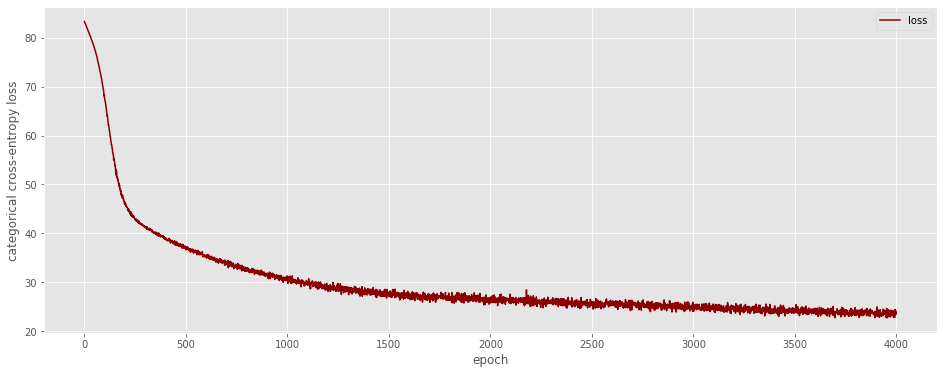

In [14]:
plt.figure(figsize=(16,6))
plt.plot(MODEL.model.history.history['loss'], color='darkred')
#plt.plot(MODEL.model.history.history['val_loss'], color='gray')
plt.legend(['loss'])#, 'val loss'])
plt.xlabel("epoch")
plt.ylabel("categorical cross-entropy loss")
plt.show()

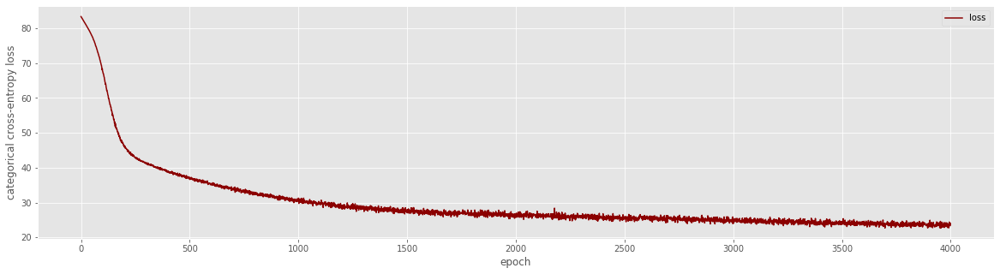

In [18]:
plt.figure(figsize=(20,5))
plt.plot(MODEL.model.history.history['loss'], color='darkred')
#plt.plot(MODEL.model.history.history['val_loss'], color='gray')
plt.legend(['loss'])#, 'val loss'])
plt.xlabel("epoch")
plt.ylabel("categorical cross-entropy loss")
plt.show()

In [224]:
areas=list(embs['areas']['alfa2index_from'].keys())
areas_emb=embs['areas']['embeddings']

In [19]:
areas

NameError: name 'areas' is not defined

In [225]:
mds = MDS(n_components=2)
mds_result = mds.fit_transform(areas_emb)

Text(144.75, 0.5, 'MDS-2')

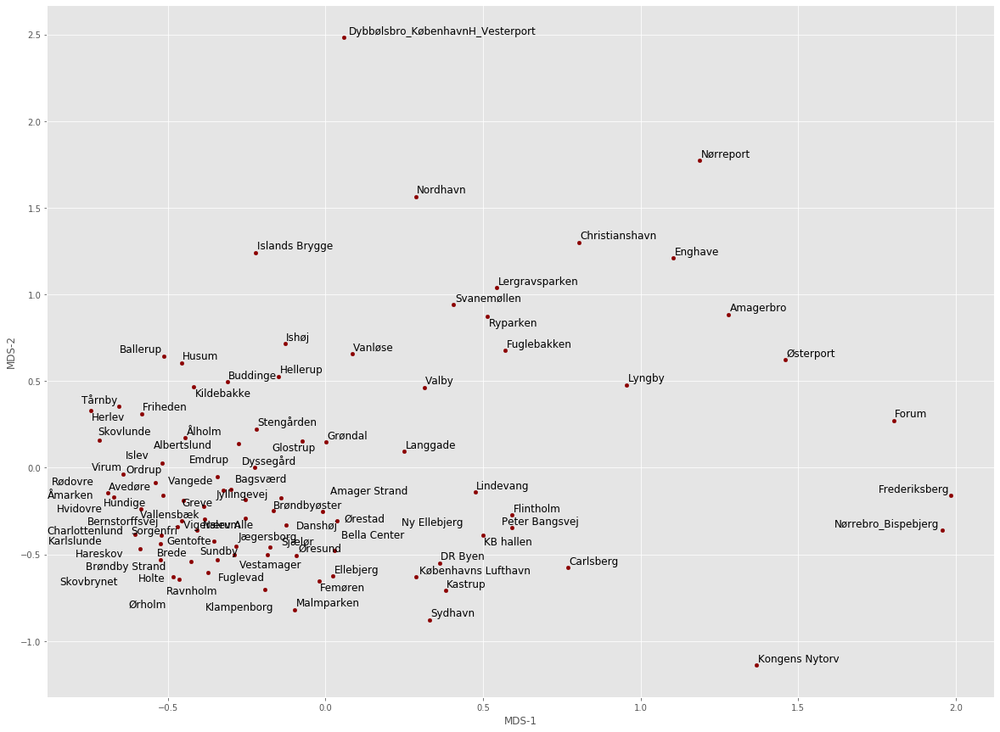

In [226]:
plt.figure(figsize=(20,15))

plt.scatter(mds_result[:,0], mds_result[:,1], s=20, c='darkred')

texts = [plt.text(mds_result[i,0], mds_result[i,1], 
                  areas[i],fontsize=12) for i in range(len(areas_emb))]
adjust_text(texts)
#plt.title('2-D projections of Copenhagen areas embeddings') 
plt.xlabel('MDS-1')
plt.ylabel('MDS-2')

In [182]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(areas_emb)

Text(138.375, 0.5, 'MDS-2')

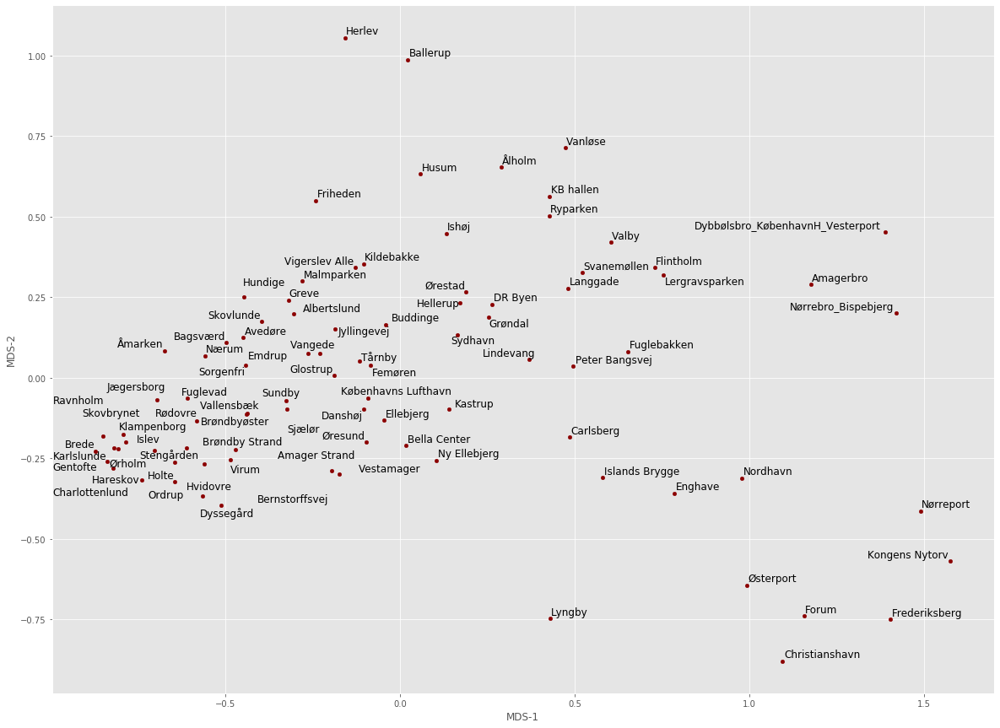

In [183]:
plt.figure(figsize=(20,15))

plt.scatter(pca_result[:,0], pca_result[:,1], s=20, c='darkred')

texts = [plt.text(pca_result[i,0], pca_result[i,1], 
                  areas[i],fontsize=12) for i in range(len(areas_emb))]
adjust_text(texts)
#plt.title('2-D projections of Copenhagen areas embeddings') 
plt.xlabel('MDS-1')
plt.ylabel('MDS-2')

In [156]:
len(col_use)

45

In [154]:
for i in col_use:
    print(i)

burglaries
income
total trips
business
educational
errand
leisure
home
landuse_construction
landuse_forest
landuse_grass
landuse_railway
landuse_residential
transport
highway
man_made
tunnel
service
place_square
building_industrial
building_office
building_garages
building_house
building_comercial
building_roof
amenity_police
amenity_toilets
amenity_leisure
amenity_child
natural
tourism
attraction
parking
church
art
university
restaurant
offices
school
shops
supermarket
transport_stations
other_transport
hotel
sports


In [205]:
len(data_discretized['business'].unique())

4

In [208]:
for i in col_use:
    if len(data_discretized[i].unique()) < 5:
        print(data_discretized[i].unique())
        print()

[business_min, business_max, business_low, business_med]
Categories (4, object): [business_min < business_low < business_med < business_max]

[educational_min, educational_low, educational_med, educational_max]
Categories (4, object): [educational_min < educational_low < educational_med < educational_max]

[leisure_min, leisure_max, leisure_low, leisure_med]
Categories (4, object): [leisure_min < leisure_low < leisure_med < leisure_max]

[landuse_railway_min, landuse_railway_low, landuse_railway_max, landuse_railway_high]
Categories (4, object): [landuse_railway_min < landuse_railway_low < landuse_railway_high < landuse_railway_max]

[tunnel_low, tunnel_min, tunnel_med, tunnel_max]
Categories (4, object): [tunnel_min < tunnel_low < tunnel_med < tunnel_max]

[place_square_min, place_square_low, place_square_med, place_square_max]
Categories (4, object): [place_square_min < place_square_low < place_square_med < place_square_max]

[building_industrial_min, building_industrial_high, buildi

In [149]:
from matplotlib import cm

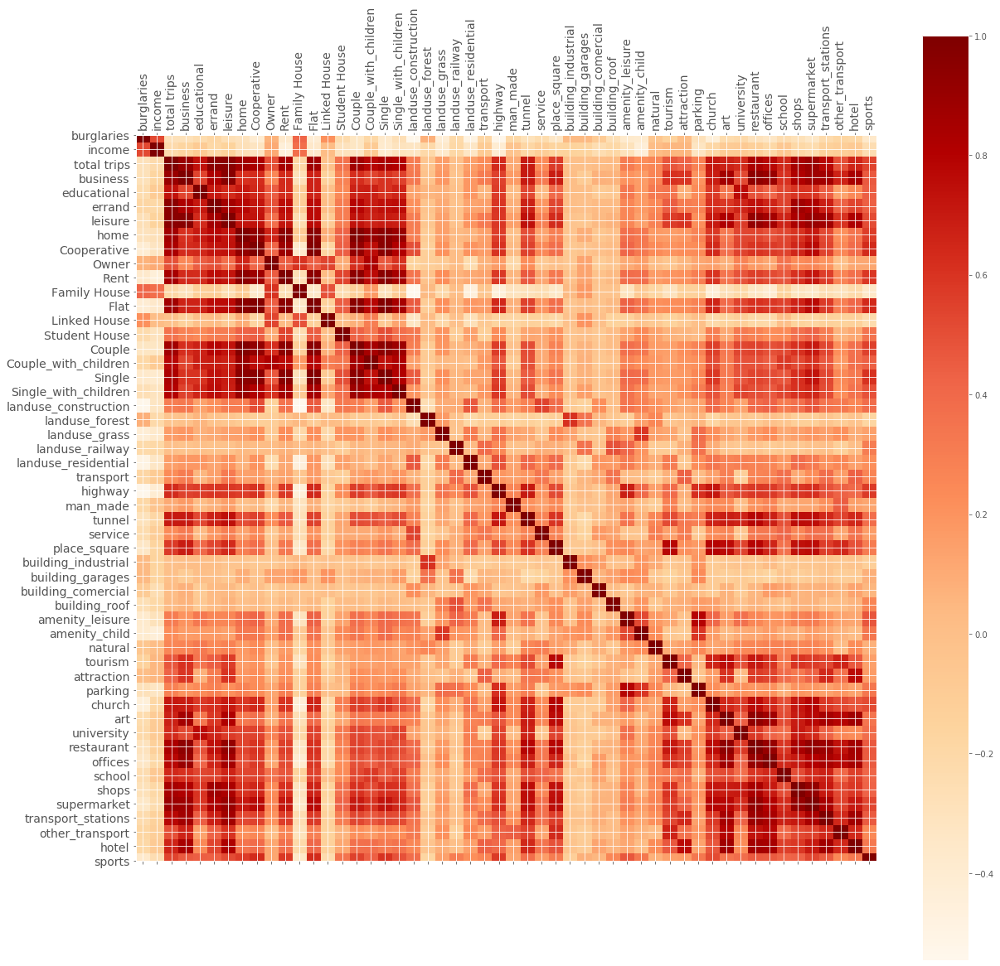

In [221]:
correlations = data[col_use].corr()
f = plt.figure(figsize=(20, 20))
plt.matshow(correlations, fignum=f.number, cmap=cm.OrRd)
plt.xticks(range(correlations.shape[1]), correlations.columns, fontsize=14, rotation = 90)
plt.yticks(range(correlations.shape[1]), correlations.columns, fontsize=14)
cb = plt.colorbar()

In [227]:
col_names = ['Burglaries', 'Income','TotalTrips','Business','Educational', 'Errand', 'Leisure', 'Home', #TU
         'Cooperative','Owner', 'Rent', 'FamilyHouse', 'Flat', 'LinkedHouse','StudentHouse', #TU 
           'Couple','CoupleChildren', 'Single', 'SingleChildren', #TU
           'ConstructionLanduse', 'ForestLanduse', 'GrassLanduse', 'RailwayLanduse','ResidentialLanduse',
       'Rails', 'Highway','ManMadeBuildings', 'Tunnel','Service',
        'Squares', 
       'IndustrialBuildings', 'GarageBuildings', 'ComercialBuildings', 
        'RoofBuildings','PublicLeisure', 'ChildFacilities',
           'Natural', 'Tourism', 'Attraction', 'Parking', 'Worship',
       'Art', 'University', 'Restaurant', 'Offices', 'School', 'Shops', 'Supermarket',
       'TransportStations', 'OtherTransport', 'Hotel', 'Sports']

In [235]:
data_new=pd.DataFrame(columns=col_names)
for i in range(len(col_names)):
    data_new[col_names[i]] = data[col_use[i]]

In [236]:
data_new['Areas']=data.areas

In [237]:
data_new

,Burglaries,Income,TotalTrips,Business,Educational,Errand,Leisure,Home,Cooperative,Owner,...,Restaurant,Offices,School,Shops,Supermarket,TransportStations,OtherTransport,Hotel,Sports,Areas
0,0.007346,517.154545,0.010280,0.011341,0.014248,0.010873,0.006946,0.009716,0.000953,0.006631,...,0.001493,0.006764,0.000000,0.000837,0.005446,0.006494,0.000000,0.000000,0.007954,Albertslund
1,0.005734,694.494382,0.004444,0.002668,0.007124,0.002612,0.004440,0.006119,0.005083,0.008961,...,0.003731,0.003382,0.024096,0.001256,0.008169,0.006494,0.000000,0.007286,0.008484,Amager Strand
2,0.005734,452.649083,0.022946,0.017345,0.008249,0.027152,0.019979,0.027516,0.047332,0.011290,...,0.036567,0.011274,0.012048,0.056928,0.047651,0.029221,0.000000,0.007286,0.027574,Amagerbro
3,0.018455,562.286822,0.007270,0.003336,0.008999,0.004556,0.006301,0.010643,0.002541,0.009498,...,0.000000,0.000000,0.006024,0.000837,0.001361,0.003247,0.000000,0.000000,0.009545,Avedøre
4,0.013259,683.828571,0.011132,0.018012,0.007874,0.014335,0.007877,0.007602,0.000635,0.012903,...,0.001493,0.019166,0.024096,0.001256,0.006807,0.006494,0.000000,0.000000,0.007954,Bagsværd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84,0.018455,648.912281,0.004842,0.004003,0.005999,0.002916,0.004010,0.007528,0.003812,0.015054,...,0.000746,0.000000,0.012048,0.000000,0.000681,0.006494,0.000000,0.000000,0.005303,Åmarken
85,0.005734,663.695652,0.007796,0.010007,0.009374,0.015550,0.004583,0.002855,0.000318,0.004839,...,0.000746,0.004510,0.000000,0.035580,0.006807,0.009740,0.000000,0.014572,0.006363,Ørestad
86,0.005734,844.186441,0.003209,0.002001,0.001500,0.001154,0.005872,0.003783,0.003177,0.006272,...,0.000746,0.004510,0.000000,0.000419,0.001361,0.000000,0.000000,0.000000,0.003712,Øresund
87,0.017560,832.714286,0.001534,0.000667,0.000375,0.000486,0.001074,0.002410,0.000318,0.005735,...,0.003731,0.000000,0.000000,0.001256,0.000000,0.003247,0.000000,0.000000,0.005833,Ørholm


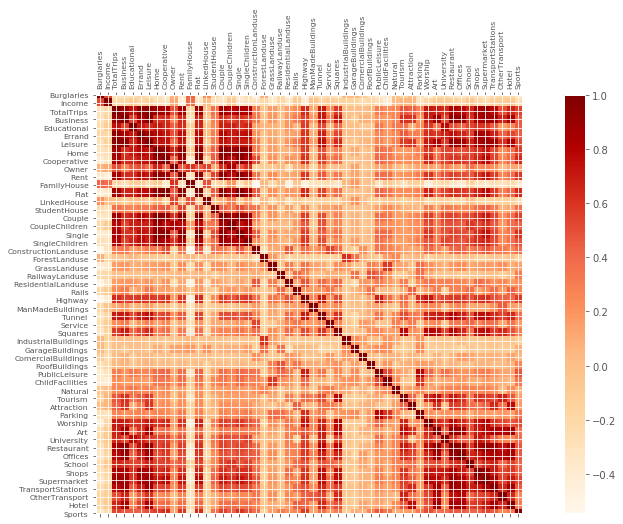

In [257]:
correlations = data_new.corr()
f = plt.figure(figsize=(15, 7.5))
plt.matshow(correlations, fignum=f.number, cmap=cm.OrRd)
plt.xticks(range(correlations.shape[1]), correlations.columns, fontsize=7.7, rotation = 90)
plt.yticks(range(correlations.shape[1]), correlations.columns, fontsize=7.7)
cb = plt.colorbar()

In [239]:
data_discretized_new = data_new.copy()  #Europe dataset with categorical values

for i,column in enumerate(data_discretized_new.columns[:-1]):    
    data_discretized_new[column] = pd.cut(data_discretized_new[column], bins=5, labels=[column+'_min', column+'_low', column+'_med', column+'_high', column+'_max'])

In [240]:
data_discretized_new

,Burglaries,Income,TotalTrips,Business,Educational,Errand,Leisure,Home,Cooperative,Owner,...,Restaurant,Offices,School,Shops,Supermarket,TransportStations,OtherTransport,Hotel,Sports,Areas
0,Burglaries_min,Income_low,TotalTrips_min,Business_min,Educational_min,Errand_min,Leisure_min,Home_min,Cooperative_min,Owner_low,...,Restaurant_min,Offices_min,School_min,Shops_min,Supermarket_min,TransportStations_min,OtherTransport_min,Hotel_min,Sports_low,Albertslund
1,Burglaries_min,Income_med,TotalTrips_min,Business_min,Educational_min,Errand_min,Leisure_min,Home_min,Cooperative_min,Owner_low,...,Restaurant_min,Offices_min,School_low,Shops_min,Supermarket_min,TransportStations_min,OtherTransport_min,Hotel_min,Sports_low,Amager Strand
2,Burglaries_min,Income_low,TotalTrips_low,Business_min,Educational_min,Errand_med,Leisure_min,Home_med,Cooperative_med,Owner_low,...,Restaurant_low,Offices_min,School_min,Shops_med,Supermarket_med,TransportStations_low,OtherTransport_min,Hotel_min,Sports_max,Amagerbro
3,Burglaries_med,Income_med,TotalTrips_min,Business_min,Educational_min,Errand_min,Leisure_min,Home_min,Cooperative_min,Owner_low,...,Restaurant_min,Offices_min,School_min,Shops_min,Supermarket_min,TransportStations_min,OtherTransport_min,Hotel_min,Sports_low,Avedøre
4,Burglaries_low,Income_med,TotalTrips_min,Business_min,Educational_min,Errand_low,Leisure_min,Home_min,Cooperative_min,Owner_med,...,Restaurant_min,Offices_min,School_low,Shops_min,Supermarket_min,TransportStations_min,OtherTransport_min,Hotel_min,Sports_low,Bagsværd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84,Burglaries_med,Income_med,TotalTrips_min,Business_min,Educational_min,Errand_min,Leisure_min,Home_min,Cooperative_min,Owner_med,...,Restaurant_min,Offices_min,School_min,Shops_min,Supermarket_min,TransportStations_min,OtherTransport_min,Hotel_min,Sports_min,Åmarken
85,Burglaries_min,Income_med,TotalTrips_min,Business_min,Educational_min,Errand_low,Leisure_min,Home_min,Cooperative_min,Owner_min,...,Restaurant_min,Offices_min,School_min,Shops_low,Supermarket_min,TransportStations_min,OtherTransport_min,Hotel_min,Sports_min,Ørestad
86,Burglaries_min,Income_high,TotalTrips_min,Business_min,Educational_min,Errand_min,Leisure_min,Home_min,Cooperative_min,Owner_low,...,Restaurant_min,Offices_min,School_min,Shops_min,Supermarket_min,TransportStations_min,OtherTransport_min,Hotel_min,Sports_min,Øresund
87,Burglaries_med,Income_high,TotalTrips_min,Business_min,Educational_min,Errand_min,Leisure_min,Home_min,Cooperative_min,Owner_min,...,Restaurant_min,Offices_min,School_min,Shops_min,Supermarket_min,TransportStations_min,OtherTransport_min,Hotel_min,Sports_min,Ørholm


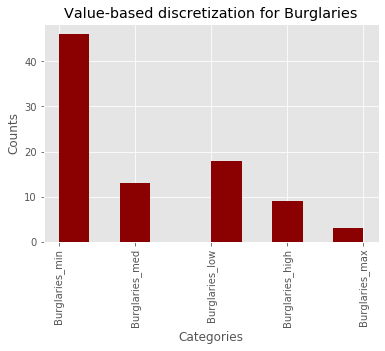

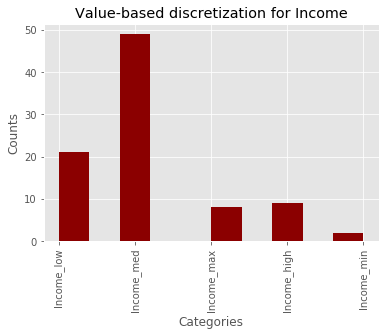

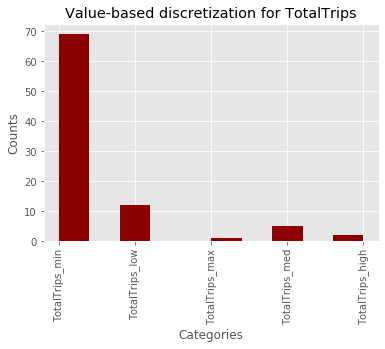

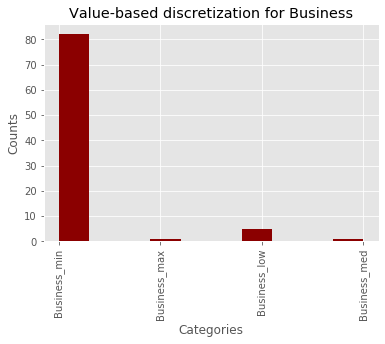

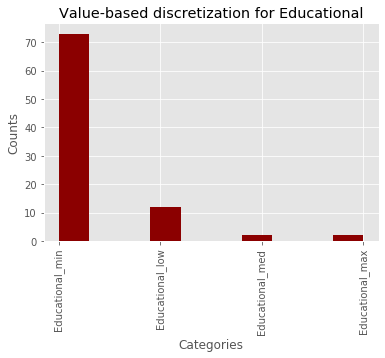

...

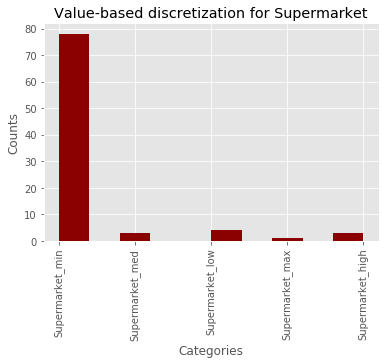

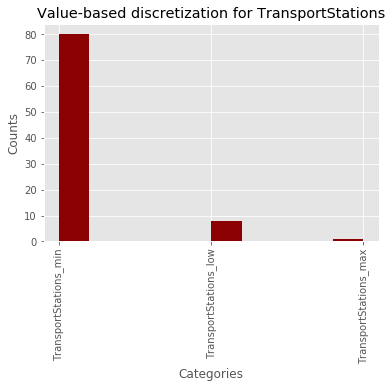

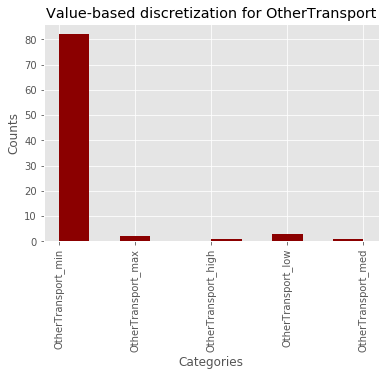

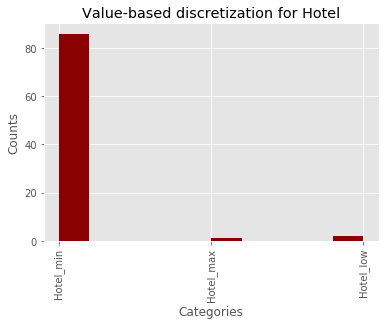

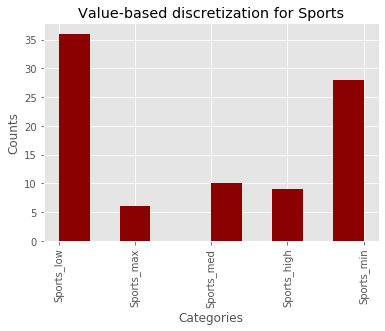

In [243]:
for i,feature in enumerate(data_discretized_new.columns[:-1]):
    # Boxplot
    plt.hist(data_discretized_new[feature], color='darkred')
    plt.xticks(rotation='vertical')
    plt.title('Value-based discretization for {}'.format(feature))
    plt.xlabel('Categories')
    plt.ylabel('Counts')
    
    # Display
    plt.show()

In [241]:
MODEL=PyTre_multioutput.EmbeddingsModel() 
                                       
m, embs= MODEL.fit(data_discretized[['areas']], # ----> X
                   data_discretized[[]], # ----> Ys continuous (we can add more columns...)
                   data_discretized[col_use], # -----> Ys categorical (we have none so far)
                   data_discretized[[]], # ----> no exogenous variables used here (but can be added)
                   xlabels=['areas'], CRC=False,
                   EPOCHS=800, VALIDATION_SPLIT=0.0, EMB_SIZE= [20], # you can change the embedding size 
                   verbose=1)  

Model: "model_13"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_25 (InputLayer)           (None, 1)            0                                            
__________________________________________________________________________________________________
embeddings_areas (Embedding)    (None, 1, 20)        1780        input_25[0][0]                   
__________________________________________________________________________________________________
flatten_13 (Flatten)            (None, 20)           0           embeddings_areas[0][0]           
__________________________________________________________________________________________________
dropout_13 (Dropout)            (None, 20)           0           flatten_13[0][0]                 
___________________________________________________________________________________________

Epoch 4/800
89/89 [==============================] - 0s 157us/step - loss: 83.1988 - output_layer_cat0_loss: 1.6109 - output_layer_cat1_loss: 1.6097 - output_layer_cat2_loss: 1.6075 - output_layer_cat3_loss: 1.3900 - output_layer_cat4_loss: 1.3846 - output_layer_cat5_loss: 1.6013 - output_layer_cat6_loss: 1.3811 - output_layer_cat7_loss: 1.6036 - output_layer_cat8_loss: 1.6047 - output_layer_cat9_loss: 1.6138 - output_layer_cat10_loss: 1.6070 - output_layer_cat11_loss: 1.6106 - output_layer_cat12_loss: 1.6063 - output_layer_cat13_loss: 1.3745 - output_layer_cat14_loss: 1.6034 - output_layer_cat15_loss: 1.6128 - output_layer_cat16_loss: 1.6040 - output_layer_cat17_loss: 1.3773 - output_layer_cat18_loss: 1.6044 - output_layer_cat19_loss: 1.6036 - output_layer_cat20_loss: 1.6104 - output_layer_cat21_loss: 1.6127 - output_layer_cat22_loss: 1.3841 - output_layer_cat23_loss: 1.6061 - output_layer_cat24_loss: 1.6045 - output_layer_cat25_loss: 1.6059 - output_layer_cat26_loss: 1.6065 - output_

Epoch 9/800
89/89 [==============================] - 0s 171us/step - loss: 82.6658 - output_layer_cat0_loss: 1.6042 - output_layer_cat1_loss: 1.5991 - output_layer_cat2_loss: 1.6014 - output_layer_cat3_loss: 1.3753 - output_layer_cat4_loss: 1.3773 - output_layer_cat5_loss: 1.6024 - output_layer_cat6_loss: 1.3724 - output_layer_cat7_loss: 1.5959 - output_layer_cat8_loss: 1.5956 - output_layer_cat9_loss: 1.6089 - output_layer_cat10_loss: 1.6019 - output_layer_cat11_loss: 1.6008 - output_layer_cat12_loss: 1.5940 - output_layer_cat13_loss: 1.3815 - output_layer_cat14_loss: 1.6003 - output_layer_cat15_loss: 1.5997 - output_layer_cat16_loss: 1.5958 - output_layer_cat17_loss: 1.3689 - output_layer_cat18_loss: 1.5959 - output_layer_cat19_loss: 1.5967 - output_layer_cat20_loss: 1.5999 - output_layer_cat21_loss: 1.6066 - output_layer_cat22_loss: 1.3741 - output_layer_cat23_loss: 1.5986 - output_layer_cat24_loss: 1.5954 - output_layer_cat25_loss: 1.5962 - output_layer_cat26_loss: 1.6011 - output_

Epoch 14/800
89/89 [==============================] - 0s 157us/step - loss: 82.1542 - output_layer_cat0_loss: 1.6016 - output_layer_cat1_loss: 1.5959 - output_layer_cat2_loss: 1.5952 - output_layer_cat3_loss: 1.3597 - output_layer_cat4_loss: 1.3667 - output_layer_cat5_loss: 1.5920 - output_layer_cat6_loss: 1.3635 - output_layer_cat7_loss: 1.5861 - output_layer_cat8_loss: 1.5861 - output_layer_cat9_loss: 1.6020 - output_layer_cat10_loss: 1.5963 - output_layer_cat11_loss: 1.5984 - output_layer_cat12_loss: 1.5765 - output_layer_cat13_loss: 1.3718 - output_layer_cat14_loss: 1.5913 - output_layer_cat15_loss: 1.5924 - output_layer_cat16_loss: 1.5897 - output_layer_cat17_loss: 1.3580 - output_layer_cat18_loss: 1.5841 - output_layer_cat19_loss: 1.5919 - output_layer_cat20_loss: 1.5948 - output_layer_cat21_loss: 1.5978 - output_layer_cat22_loss: 1.3629 - output_layer_cat23_loss: 1.5959 - output_layer_cat24_loss: 1.5867 - output_layer_cat25_loss: 1.5921 - output_layer_cat26_loss: 1.5916 - output

Epoch 19/800
89/89 [==============================] - 0s 169us/step - loss: 81.6420 - output_layer_cat0_loss: 1.5965 - output_layer_cat1_loss: 1.5908 - output_layer_cat2_loss: 1.5855 - output_layer_cat3_loss: 1.3486 - output_layer_cat4_loss: 1.3597 - output_layer_cat5_loss: 1.5914 - output_layer_cat6_loss: 1.3513 - output_layer_cat7_loss: 1.5807 - output_layer_cat8_loss: 1.5758 - output_layer_cat9_loss: 1.6012 - output_layer_cat10_loss: 1.5887 - output_layer_cat11_loss: 1.5925 - output_layer_cat12_loss: 1.5685 - output_layer_cat13_loss: 1.3669 - output_layer_cat14_loss: 1.5839 - output_layer_cat15_loss: 1.5857 - output_layer_cat16_loss: 1.5856 - output_layer_cat17_loss: 1.3501 - output_layer_cat18_loss: 1.5764 - output_layer_cat19_loss: 1.5858 - output_layer_cat20_loss: 1.5861 - output_layer_cat21_loss: 1.5901 - output_layer_cat22_loss: 1.3533 - output_layer_cat23_loss: 1.5868 - output_layer_cat24_loss: 1.5742 - output_layer_cat25_loss: 1.5847 - output_layer_cat26_loss: 1.5844 - output

Epoch 24/800
89/89 [==============================] - 0s 157us/step - loss: 81.0931 - output_layer_cat0_loss: 1.5884 - output_layer_cat1_loss: 1.5826 - output_layer_cat2_loss: 1.5826 - output_layer_cat3_loss: 1.3336 - output_layer_cat4_loss: 1.3469 - output_layer_cat5_loss: 1.5859 - output_layer_cat6_loss: 1.3387 - output_layer_cat7_loss: 1.5702 - output_layer_cat8_loss: 1.5634 - output_layer_cat9_loss: 1.5953 - output_layer_cat10_loss: 1.5863 - output_layer_cat11_loss: 1.5897 - output_layer_cat12_loss: 1.5516 - output_layer_cat13_loss: 1.3652 - output_layer_cat14_loss: 1.5794 - output_layer_cat15_loss: 1.5793 - output_layer_cat16_loss: 1.5791 - output_layer_cat17_loss: 1.3347 - output_layer_cat18_loss: 1.5705 - output_layer_cat19_loss: 1.5769 - output_layer_cat20_loss: 1.5762 - output_layer_cat21_loss: 1.5796 - output_layer_cat22_loss: 1.3419 - output_layer_cat23_loss: 1.5771 - output_layer_cat24_loss: 1.5646 - output_layer_cat25_loss: 1.5776 - output_layer_cat26_loss: 1.5759 - output

Epoch 29/800
89/89 [==============================] - 0s 179us/step - loss: 80.5676 - output_layer_cat0_loss: 1.5820 - output_layer_cat1_loss: 1.5781 - output_layer_cat2_loss: 1.5745 - output_layer_cat3_loss: 1.3198 - output_layer_cat4_loss: 1.3393 - output_layer_cat5_loss: 1.5822 - output_layer_cat6_loss: 1.3310 - output_layer_cat7_loss: 1.5601 - output_layer_cat8_loss: 1.5537 - output_layer_cat9_loss: 1.5890 - output_layer_cat10_loss: 1.5743 - output_layer_cat11_loss: 1.5785 - output_layer_cat12_loss: 1.5387 - output_layer_cat13_loss: 1.3589 - output_layer_cat14_loss: 1.5710 - output_layer_cat15_loss: 1.5675 - output_layer_cat16_loss: 1.5736 - output_layer_cat17_loss: 1.3266 - output_layer_cat18_loss: 1.5577 - output_layer_cat19_loss: 1.5742 - output_layer_cat20_loss: 1.5708 - output_layer_cat21_loss: 1.5730 - output_layer_cat22_loss: 1.3333 - output_layer_cat23_loss: 1.5766 - output_layer_cat24_loss: 1.5512 - output_layer_cat25_loss: 1.5717 - output_layer_cat26_loss: 1.5671 - output

Epoch 34/800
89/89 [==============================] - 0s 157us/step - loss: 80.0034 - output_layer_cat0_loss: 1.5741 - output_layer_cat1_loss: 1.5740 - output_layer_cat2_loss: 1.5681 - output_layer_cat3_loss: 1.3048 - output_layer_cat4_loss: 1.3315 - output_layer_cat5_loss: 1.5703 - output_layer_cat6_loss: 1.3192 - output_layer_cat7_loss: 1.5513 - output_layer_cat8_loss: 1.5355 - output_layer_cat9_loss: 1.5858 - output_layer_cat10_loss: 1.5692 - output_layer_cat11_loss: 1.5817 - output_layer_cat12_loss: 1.5230 - output_layer_cat13_loss: 1.3476 - output_layer_cat14_loss: 1.5610 - output_layer_cat15_loss: 1.5609 - output_layer_cat16_loss: 1.5637 - output_layer_cat17_loss: 1.3107 - output_layer_cat18_loss: 1.5493 - output_layer_cat19_loss: 1.5615 - output_layer_cat20_loss: 1.5610 - output_layer_cat21_loss: 1.5655 - output_layer_cat22_loss: 1.3219 - output_layer_cat23_loss: 1.5638 - output_layer_cat24_loss: 1.5414 - output_layer_cat25_loss: 1.5685 - output_layer_cat26_loss: 1.5553 - output

Epoch 39/800
89/89 [==============================] - 0s 143us/step - loss: 79.4794 - output_layer_cat0_loss: 1.5689 - output_layer_cat1_loss: 1.5645 - output_layer_cat2_loss: 1.5582 - output_layer_cat3_loss: 1.2913 - output_layer_cat4_loss: 1.3162 - output_layer_cat5_loss: 1.5661 - output_layer_cat6_loss: 1.3105 - output_layer_cat7_loss: 1.5416 - output_layer_cat8_loss: 1.5286 - output_layer_cat9_loss: 1.5849 - output_layer_cat10_loss: 1.5603 - output_layer_cat11_loss: 1.5706 - output_layer_cat12_loss: 1.5074 - output_layer_cat13_loss: 1.3445 - output_layer_cat14_loss: 1.5511 - output_layer_cat15_loss: 1.5490 - output_layer_cat16_loss: 1.5610 - output_layer_cat17_loss: 1.3014 - output_layer_cat18_loss: 1.5429 - output_layer_cat19_loss: 1.5574 - output_layer_cat20_loss: 1.5487 - output_layer_cat21_loss: 1.5598 - output_layer_cat22_loss: 1.3106 - output_layer_cat23_loss: 1.5566 - output_layer_cat24_loss: 1.5322 - output_layer_cat25_loss: 1.5624 - output_layer_cat26_loss: 1.5489 - output

Epoch 44/800
89/89 [==============================] - 0s 179us/step - loss: 78.8880 - output_layer_cat0_loss: 1.5630 - output_layer_cat1_loss: 1.5632 - output_layer_cat2_loss: 1.5504 - output_layer_cat3_loss: 1.2711 - output_layer_cat4_loss: 1.3054 - output_layer_cat5_loss: 1.5610 - output_layer_cat6_loss: 1.2893 - output_layer_cat7_loss: 1.5352 - output_layer_cat8_loss: 1.5139 - output_layer_cat9_loss: 1.5813 - output_layer_cat10_loss: 1.5460 - output_layer_cat11_loss: 1.5666 - output_layer_cat12_loss: 1.4915 - output_layer_cat13_loss: 1.3362 - output_layer_cat14_loss: 1.5394 - output_layer_cat15_loss: 1.5408 - output_layer_cat16_loss: 1.5520 - output_layer_cat17_loss: 1.2850 - output_layer_cat18_loss: 1.5270 - output_layer_cat19_loss: 1.5506 - output_layer_cat20_loss: 1.5379 - output_layer_cat21_loss: 1.5508 - output_layer_cat22_loss: 1.2961 - output_layer_cat23_loss: 1.5543 - output_layer_cat24_loss: 1.5215 - output_layer_cat25_loss: 1.5524 - output_layer_cat26_loss: 1.5363 - output

Epoch 49/800
89/89 [==============================] - 0s 146us/step - loss: 78.1685 - output_layer_cat0_loss: 1.5560 - output_layer_cat1_loss: 1.5553 - output_layer_cat2_loss: 1.5369 - output_layer_cat3_loss: 1.2466 - output_layer_cat4_loss: 1.2961 - output_layer_cat5_loss: 1.5488 - output_layer_cat6_loss: 1.2753 - output_layer_cat7_loss: 1.5191 - output_layer_cat8_loss: 1.4902 - output_layer_cat9_loss: 1.5808 - output_layer_cat10_loss: 1.5372 - output_layer_cat11_loss: 1.5603 - output_layer_cat12_loss: 1.4715 - output_layer_cat13_loss: 1.3278 - output_layer_cat14_loss: 1.5277 - output_layer_cat15_loss: 1.5302 - output_layer_cat16_loss: 1.5432 - output_layer_cat17_loss: 1.2668 - output_layer_cat18_loss: 1.5152 - output_layer_cat19_loss: 1.5344 - output_layer_cat20_loss: 1.5252 - output_layer_cat21_loss: 1.5388 - output_layer_cat22_loss: 1.2813 - output_layer_cat23_loss: 1.5457 - output_layer_cat24_loss: 1.5060 - output_layer_cat25_loss: 1.5446 - output_layer_cat26_loss: 1.5245 - output

Epoch 54/800
89/89 [==============================] - 0s 157us/step - loss: 77.4871 - output_layer_cat0_loss: 1.5485 - output_layer_cat1_loss: 1.5467 - output_layer_cat2_loss: 1.5266 - output_layer_cat3_loss: 1.2281 - output_layer_cat4_loss: 1.2826 - output_layer_cat5_loss: 1.5409 - output_layer_cat6_loss: 1.2622 - output_layer_cat7_loss: 1.5052 - output_layer_cat8_loss: 1.4790 - output_layer_cat9_loss: 1.5748 - output_layer_cat10_loss: 1.5321 - output_layer_cat11_loss: 1.5567 - output_layer_cat12_loss: 1.4511 - output_layer_cat13_loss: 1.3172 - output_layer_cat14_loss: 1.5121 - output_layer_cat15_loss: 1.5124 - output_layer_cat16_loss: 1.5358 - output_layer_cat17_loss: 1.2483 - output_layer_cat18_loss: 1.5038 - output_layer_cat19_loss: 1.5235 - output_layer_cat20_loss: 1.5123 - output_layer_cat21_loss: 1.5303 - output_layer_cat22_loss: 1.2660 - output_layer_cat23_loss: 1.5373 - output_layer_cat24_loss: 1.4882 - output_layer_cat25_loss: 1.5401 - output_layer_cat26_loss: 1.5076 - output

Epoch 59/800
89/89 [==============================] - 0s 168us/step - loss: 76.7025 - output_layer_cat0_loss: 1.5426 - output_layer_cat1_loss: 1.5375 - output_layer_cat2_loss: 1.5169 - output_layer_cat3_loss: 1.2018 - output_layer_cat4_loss: 1.2595 - output_layer_cat5_loss: 1.5345 - output_layer_cat6_loss: 1.2460 - output_layer_cat7_loss: 1.4919 - output_layer_cat8_loss: 1.4646 - output_layer_cat9_loss: 1.5685 - output_layer_cat10_loss: 1.5106 - output_layer_cat11_loss: 1.5526 - output_layer_cat12_loss: 1.4261 - output_layer_cat13_loss: 1.3080 - output_layer_cat14_loss: 1.5017 - output_layer_cat15_loss: 1.5007 - output_layer_cat16_loss: 1.5320 - output_layer_cat17_loss: 1.2269 - output_layer_cat18_loss: 1.4853 - output_layer_cat19_loss: 1.5044 - output_layer_cat20_loss: 1.4963 - output_layer_cat21_loss: 1.5173 - output_layer_cat22_loss: 1.2469 - output_layer_cat23_loss: 1.5321 - output_layer_cat24_loss: 1.4785 - output_layer_cat25_loss: 1.5311 - output_layer_cat26_loss: 1.4874 - output

Epoch 64/800
89/89 [==============================] - 0s 157us/step - loss: 75.8894 - output_layer_cat0_loss: 1.5315 - output_layer_cat1_loss: 1.5322 - output_layer_cat2_loss: 1.4984 - output_layer_cat3_loss: 1.1722 - output_layer_cat4_loss: 1.2398 - output_layer_cat5_loss: 1.5186 - output_layer_cat6_loss: 1.2140 - output_layer_cat7_loss: 1.4799 - output_layer_cat8_loss: 1.4443 - output_layer_cat9_loss: 1.5695 - output_layer_cat10_loss: 1.4954 - output_layer_cat11_loss: 1.5523 - output_layer_cat12_loss: 1.3934 - output_layer_cat13_loss: 1.2952 - output_layer_cat14_loss: 1.4852 - output_layer_cat15_loss: 1.4870 - output_layer_cat16_loss: 1.5203 - output_layer_cat17_loss: 1.2026 - output_layer_cat18_loss: 1.4678 - output_layer_cat19_loss: 1.4982 - output_layer_cat20_loss: 1.4843 - output_layer_cat21_loss: 1.5104 - output_layer_cat22_loss: 1.2255 - output_layer_cat23_loss: 1.5201 - output_layer_cat24_loss: 1.4540 - output_layer_cat25_loss: 1.5253 - output_layer_cat26_loss: 1.4774 - output

Epoch 69/800
89/89 [==============================] - 0s 142us/step - loss: 75.0302 - output_layer_cat0_loss: 1.5257 - output_layer_cat1_loss: 1.5260 - output_layer_cat2_loss: 1.4769 - output_layer_cat3_loss: 1.1434 - output_layer_cat4_loss: 1.2308 - output_layer_cat5_loss: 1.5128 - output_layer_cat6_loss: 1.1923 - output_layer_cat7_loss: 1.4561 - output_layer_cat8_loss: 1.4208 - output_layer_cat9_loss: 1.5564 - output_layer_cat10_loss: 1.4822 - output_layer_cat11_loss: 1.5451 - output_layer_cat12_loss: 1.3724 - output_layer_cat13_loss: 1.2821 - output_layer_cat14_loss: 1.4655 - output_layer_cat15_loss: 1.4748 - output_layer_cat16_loss: 1.5122 - output_layer_cat17_loss: 1.1798 - output_layer_cat18_loss: 1.4535 - output_layer_cat19_loss: 1.4850 - output_layer_cat20_loss: 1.4673 - output_layer_cat21_loss: 1.5011 - output_layer_cat22_loss: 1.2154 - output_layer_cat23_loss: 1.5053 - output_layer_cat24_loss: 1.4341 - output_layer_cat25_loss: 1.5160 - output_layer_cat26_loss: 1.4559 - output

Epoch 74/800
89/89 [==============================] - 0s 163us/step - loss: 74.0060 - output_layer_cat0_loss: 1.5146 - output_layer_cat1_loss: 1.5088 - output_layer_cat2_loss: 1.4565 - output_layer_cat3_loss: 1.1187 - output_layer_cat4_loss: 1.2098 - output_layer_cat5_loss: 1.4979 - output_layer_cat6_loss: 1.1733 - output_layer_cat7_loss: 1.4370 - output_layer_cat8_loss: 1.3894 - output_layer_cat9_loss: 1.5572 - output_layer_cat10_loss: 1.4618 - output_layer_cat11_loss: 1.5362 - output_layer_cat12_loss: 1.3504 - output_layer_cat13_loss: 1.2688 - output_layer_cat14_loss: 1.4392 - output_layer_cat15_loss: 1.4512 - output_layer_cat16_loss: 1.4966 - output_layer_cat17_loss: 1.1542 - output_layer_cat18_loss: 1.4383 - output_layer_cat19_loss: 1.4623 - output_layer_cat20_loss: 1.4460 - output_layer_cat21_loss: 1.4813 - output_layer_cat22_loss: 1.1877 - output_layer_cat23_loss: 1.5019 - output_layer_cat24_loss: 1.4161 - output_layer_cat25_loss: 1.5015 - output_layer_cat26_loss: 1.4294 - output

Epoch 79/800
89/89 [==============================] - 0s 146us/step - loss: 72.9976 - output_layer_cat0_loss: 1.5071 - output_layer_cat1_loss: 1.5090 - output_layer_cat2_loss: 1.4335 - output_layer_cat3_loss: 1.0844 - output_layer_cat4_loss: 1.1893 - output_layer_cat5_loss: 1.4692 - output_layer_cat6_loss: 1.1449 - output_layer_cat7_loss: 1.4139 - output_layer_cat8_loss: 1.3520 - output_layer_cat9_loss: 1.5628 - output_layer_cat10_loss: 1.4405 - output_layer_cat11_loss: 1.5296 - output_layer_cat12_loss: 1.3108 - output_layer_cat13_loss: 1.2384 - output_layer_cat14_loss: 1.4176 - output_layer_cat15_loss: 1.4391 - output_layer_cat16_loss: 1.4908 - output_layer_cat17_loss: 1.1286 - output_layer_cat18_loss: 1.4219 - output_layer_cat19_loss: 1.4535 - output_layer_cat20_loss: 1.4284 - output_layer_cat21_loss: 1.4779 - output_layer_cat22_loss: 1.1691 - output_layer_cat23_loss: 1.4839 - output_layer_cat24_loss: 1.3933 - output_layer_cat25_loss: 1.4995 - output_layer_cat26_loss: 1.4025 - output

Epoch 84/800
89/89 [==============================] - 0s 179us/step - loss: 71.7790 - output_layer_cat0_loss: 1.4981 - output_layer_cat1_loss: 1.4957 - output_layer_cat2_loss: 1.4095 - output_layer_cat3_loss: 1.0417 - output_layer_cat4_loss: 1.1651 - output_layer_cat5_loss: 1.4595 - output_layer_cat6_loss: 1.1108 - output_layer_cat7_loss: 1.3916 - output_layer_cat8_loss: 1.3325 - output_layer_cat9_loss: 1.5432 - output_layer_cat10_loss: 1.4082 - output_layer_cat11_loss: 1.5241 - output_layer_cat12_loss: 1.2729 - output_layer_cat13_loss: 1.2319 - output_layer_cat14_loss: 1.3920 - output_layer_cat15_loss: 1.4109 - output_layer_cat16_loss: 1.4779 - output_layer_cat17_loss: 1.0919 - output_layer_cat18_loss: 1.3856 - output_layer_cat19_loss: 1.4278 - output_layer_cat20_loss: 1.3988 - output_layer_cat21_loss: 1.4534 - output_layer_cat22_loss: 1.1399 - output_layer_cat23_loss: 1.4862 - output_layer_cat24_loss: 1.3683 - output_layer_cat25_loss: 1.4886 - output_layer_cat26_loss: 1.3800 - output

Epoch 89/800
89/89 [==============================] - 0s 168us/step - loss: 70.5938 - output_layer_cat0_loss: 1.4816 - output_layer_cat1_loss: 1.4847 - output_layer_cat2_loss: 1.3807 - output_layer_cat3_loss: 0.9980 - output_layer_cat4_loss: 1.1413 - output_layer_cat5_loss: 1.4507 - output_layer_cat6_loss: 1.0788 - output_layer_cat7_loss: 1.3713 - output_layer_cat8_loss: 1.3049 - output_layer_cat9_loss: 1.5362 - output_layer_cat10_loss: 1.3856 - output_layer_cat11_loss: 1.5180 - output_layer_cat12_loss: 1.2430 - output_layer_cat13_loss: 1.2116 - output_layer_cat14_loss: 1.3563 - output_layer_cat15_loss: 1.3948 - output_layer_cat16_loss: 1.4614 - output_layer_cat17_loss: 1.0614 - output_layer_cat18_loss: 1.3645 - output_layer_cat19_loss: 1.4063 - output_layer_cat20_loss: 1.3746 - output_layer_cat21_loss: 1.4367 - output_layer_cat22_loss: 1.1124 - output_layer_cat23_loss: 1.4687 - output_layer_cat24_loss: 1.3472 - output_layer_cat25_loss: 1.4702 - output_layer_cat26_loss: 1.3600 - output

Epoch 94/800
89/89 [==============================] - 0s 156us/step - loss: 69.4392 - output_layer_cat0_loss: 1.4776 - output_layer_cat1_loss: 1.4732 - output_layer_cat2_loss: 1.3654 - output_layer_cat3_loss: 0.9658 - output_layer_cat4_loss: 1.1142 - output_layer_cat5_loss: 1.4278 - output_layer_cat6_loss: 1.0547 - output_layer_cat7_loss: 1.3510 - output_layer_cat8_loss: 1.2706 - output_layer_cat9_loss: 1.5221 - output_layer_cat10_loss: 1.3581 - output_layer_cat11_loss: 1.5121 - output_layer_cat12_loss: 1.2079 - output_layer_cat13_loss: 1.1979 - output_layer_cat14_loss: 1.3360 - output_layer_cat15_loss: 1.3681 - output_layer_cat16_loss: 1.4465 - output_layer_cat17_loss: 1.0347 - output_layer_cat18_loss: 1.3472 - output_layer_cat19_loss: 1.3811 - output_layer_cat20_loss: 1.3426 - output_layer_cat21_loss: 1.4191 - output_layer_cat22_loss: 1.0921 - output_layer_cat23_loss: 1.4440 - output_layer_cat24_loss: 1.3299 - output_layer_cat25_loss: 1.4615 - output_layer_cat26_loss: 1.3267 - output

Epoch 99/800
89/89 [==============================] - 0s 168us/step - loss: 67.9499 - output_layer_cat0_loss: 1.4582 - output_layer_cat1_loss: 1.4530 - output_layer_cat2_loss: 1.3341 - output_layer_cat3_loss: 0.9143 - output_layer_cat4_loss: 1.0832 - output_layer_cat5_loss: 1.3937 - output_layer_cat6_loss: 1.0098 - output_layer_cat7_loss: 1.3167 - output_layer_cat8_loss: 1.2462 - output_layer_cat9_loss: 1.5236 - output_layer_cat10_loss: 1.3297 - output_layer_cat11_loss: 1.5008 - output_layer_cat12_loss: 1.1706 - output_layer_cat13_loss: 1.1695 - output_layer_cat14_loss: 1.3027 - output_layer_cat15_loss: 1.3339 - output_layer_cat16_loss: 1.4289 - output_layer_cat17_loss: 0.9956 - output_layer_cat18_loss: 1.3220 - output_layer_cat19_loss: 1.3554 - output_layer_cat20_loss: 1.3142 - output_layer_cat21_loss: 1.3958 - output_layer_cat22_loss: 1.0598 - output_layer_cat23_loss: 1.4391 - output_layer_cat24_loss: 1.2980 - output_layer_cat25_loss: 1.4490 - output_layer_cat26_loss: 1.2936 - output

Epoch 104/800
89/89 [==============================] - 0s 179us/step - loss: 66.7070 - output_layer_cat0_loss: 1.4513 - output_layer_cat1_loss: 1.4467 - output_layer_cat2_loss: 1.2925 - output_layer_cat3_loss: 0.8759 - output_layer_cat4_loss: 1.0580 - output_layer_cat5_loss: 1.3738 - output_layer_cat6_loss: 0.9765 - output_layer_cat7_loss: 1.2943 - output_layer_cat8_loss: 1.2031 - output_layer_cat9_loss: 1.5099 - output_layer_cat10_loss: 1.2908 - output_layer_cat11_loss: 1.5039 - output_layer_cat12_loss: 1.1258 - output_layer_cat13_loss: 1.1458 - output_layer_cat14_loss: 1.2638 - output_layer_cat15_loss: 1.3081 - output_layer_cat16_loss: 1.4079 - output_layer_cat17_loss: 0.9627 - output_layer_cat18_loss: 1.3007 - output_layer_cat19_loss: 1.3379 - output_layer_cat20_loss: 1.2792 - output_layer_cat21_loss: 1.3691 - output_layer_cat22_loss: 1.0430 - output_layer_cat23_loss: 1.4307 - output_layer_cat24_loss: 1.2692 - output_layer_cat25_loss: 1.4418 - output_layer_cat26_loss: 1.2738 - outpu

Epoch 109/800
89/89 [==============================] - 0s 157us/step - loss: 65.6159 - output_layer_cat0_loss: 1.4403 - output_layer_cat1_loss: 1.4295 - output_layer_cat2_loss: 1.2746 - output_layer_cat3_loss: 0.8495 - output_layer_cat4_loss: 1.0285 - output_layer_cat5_loss: 1.3529 - output_layer_cat6_loss: 0.9485 - output_layer_cat7_loss: 1.2714 - output_layer_cat8_loss: 1.1688 - output_layer_cat9_loss: 1.5036 - output_layer_cat10_loss: 1.2758 - output_layer_cat11_loss: 1.4941 - output_layer_cat12_loss: 1.1035 - output_layer_cat13_loss: 1.1399 - output_layer_cat14_loss: 1.2385 - output_layer_cat15_loss: 1.2814 - output_layer_cat16_loss: 1.4030 - output_layer_cat17_loss: 0.9425 - output_layer_cat18_loss: 1.2907 - output_layer_cat19_loss: 1.3199 - output_layer_cat20_loss: 1.2656 - output_layer_cat21_loss: 1.3550 - output_layer_cat22_loss: 1.0139 - output_layer_cat23_loss: 1.4098 - output_layer_cat24_loss: 1.2521 - output_layer_cat25_loss: 1.4358 - output_layer_cat26_loss: 1.2338 - outpu

Epoch 114/800
89/89 [==============================] - 0s 175us/step - loss: 63.8993 - output_layer_cat0_loss: 1.4321 - output_layer_cat1_loss: 1.4192 - output_layer_cat2_loss: 1.2322 - output_layer_cat3_loss: 0.7943 - output_layer_cat4_loss: 1.0037 - output_layer_cat5_loss: 1.3136 - output_layer_cat6_loss: 0.9048 - output_layer_cat7_loss: 1.2326 - output_layer_cat8_loss: 1.1160 - output_layer_cat9_loss: 1.4950 - output_layer_cat10_loss: 1.2356 - output_layer_cat11_loss: 1.4906 - output_layer_cat12_loss: 1.0591 - output_layer_cat13_loss: 1.0939 - output_layer_cat14_loss: 1.1785 - output_layer_cat15_loss: 1.2673 - output_layer_cat16_loss: 1.3926 - output_layer_cat17_loss: 0.9044 - output_layer_cat18_loss: 1.2598 - output_layer_cat19_loss: 1.2804 - output_layer_cat20_loss: 1.2350 - output_layer_cat21_loss: 1.3331 - output_layer_cat22_loss: 0.9737 - output_layer_cat23_loss: 1.3962 - output_layer_cat24_loss: 1.2161 - output_layer_cat25_loss: 1.4196 - output_layer_cat26_loss: 1.2053 - outpu

Epoch 119/800
89/89 [==============================] - 0s 158us/step - loss: 62.6190 - output_layer_cat0_loss: 1.4167 - output_layer_cat1_loss: 1.3961 - output_layer_cat2_loss: 1.2060 - output_layer_cat3_loss: 0.7511 - output_layer_cat4_loss: 0.9857 - output_layer_cat5_loss: 1.3052 - output_layer_cat6_loss: 0.8679 - output_layer_cat7_loss: 1.2091 - output_layer_cat8_loss: 1.0923 - output_layer_cat9_loss: 1.4742 - output_layer_cat10_loss: 1.1974 - output_layer_cat11_loss: 1.4735 - output_layer_cat12_loss: 1.0204 - output_layer_cat13_loss: 1.0945 - output_layer_cat14_loss: 1.1477 - output_layer_cat15_loss: 1.2314 - output_layer_cat16_loss: 1.3586 - output_layer_cat17_loss: 0.8642 - output_layer_cat18_loss: 1.2282 - output_layer_cat19_loss: 1.2596 - output_layer_cat20_loss: 1.1981 - output_layer_cat21_loss: 1.3175 - output_layer_cat22_loss: 0.9672 - output_layer_cat23_loss: 1.3805 - output_layer_cat24_loss: 1.2042 - output_layer_cat25_loss: 1.3950 - output_layer_cat26_loss: 1.1667 - outpu

Epoch 124/800
89/89 [==============================] - 0s 157us/step - loss: 60.9947 - output_layer_cat0_loss: 1.4049 - output_layer_cat1_loss: 1.3848 - output_layer_cat2_loss: 1.1720 - output_layer_cat3_loss: 0.7004 - output_layer_cat4_loss: 0.9440 - output_layer_cat5_loss: 1.2680 - output_layer_cat6_loss: 0.8243 - output_layer_cat7_loss: 1.1754 - output_layer_cat8_loss: 1.0536 - output_layer_cat9_loss: 1.4700 - output_layer_cat10_loss: 1.1622 - output_layer_cat11_loss: 1.4657 - output_layer_cat12_loss: 0.9745 - output_layer_cat13_loss: 1.0591 - output_layer_cat14_loss: 1.1112 - output_layer_cat15_loss: 1.1852 - output_layer_cat16_loss: 1.3445 - output_layer_cat17_loss: 0.8238 - output_layer_cat18_loss: 1.2023 - output_layer_cat19_loss: 1.2257 - output_layer_cat20_loss: 1.1649 - output_layer_cat21_loss: 1.2791 - output_layer_cat22_loss: 0.9305 - output_layer_cat23_loss: 1.3710 - output_layer_cat24_loss: 1.1715 - output_layer_cat25_loss: 1.4050 - output_layer_cat26_loss: 1.1362 - outpu

Epoch 129/800
89/89 [==============================] - 0s 146us/step - loss: 59.6496 - output_layer_cat0_loss: 1.3963 - output_layer_cat1_loss: 1.3703 - output_layer_cat2_loss: 1.1267 - output_layer_cat3_loss: 0.6653 - output_layer_cat4_loss: 0.9159 - output_layer_cat5_loss: 1.2267 - output_layer_cat6_loss: 0.7877 - output_layer_cat7_loss: 1.1542 - output_layer_cat8_loss: 1.0145 - output_layer_cat9_loss: 1.4587 - output_layer_cat10_loss: 1.1125 - output_layer_cat11_loss: 1.4687 - output_layer_cat12_loss: 0.9381 - output_layer_cat13_loss: 1.0442 - output_layer_cat14_loss: 1.0727 - output_layer_cat15_loss: 1.1669 - output_layer_cat16_loss: 1.3425 - output_layer_cat17_loss: 0.7960 - output_layer_cat18_loss: 1.1879 - output_layer_cat19_loss: 1.2069 - output_layer_cat20_loss: 1.1447 - output_layer_cat21_loss: 1.2656 - output_layer_cat22_loss: 0.8953 - output_layer_cat23_loss: 1.3602 - output_layer_cat24_loss: 1.1432 - output_layer_cat25_loss: 1.3899 - output_layer_cat26_loss: 1.1036 - outpu

Epoch 134/800
89/89 [==============================] - 0s 145us/step - loss: 58.1534 - output_layer_cat0_loss: 1.3933 - output_layer_cat1_loss: 1.3613 - output_layer_cat2_loss: 1.0874 - output_layer_cat3_loss: 0.6187 - output_layer_cat4_loss: 0.8816 - output_layer_cat5_loss: 1.1906 - output_layer_cat6_loss: 0.7427 - output_layer_cat7_loss: 1.1170 - output_layer_cat8_loss: 0.9683 - output_layer_cat9_loss: 1.4527 - output_layer_cat10_loss: 1.0867 - output_layer_cat11_loss: 1.4747 - output_layer_cat12_loss: 0.9037 - output_layer_cat13_loss: 1.0159 - output_layer_cat14_loss: 1.0236 - output_layer_cat15_loss: 1.1291 - output_layer_cat16_loss: 1.3121 - output_layer_cat17_loss: 0.7606 - output_layer_cat18_loss: 1.1553 - output_layer_cat19_loss: 1.1874 - output_layer_cat20_loss: 1.1063 - output_layer_cat21_loss: 1.2387 - output_layer_cat22_loss: 0.8721 - output_layer_cat23_loss: 1.3419 - output_layer_cat24_loss: 1.1073 - output_layer_cat25_loss: 1.3806 - output_layer_cat26_loss: 1.0718 - outpu

Epoch 139/800
89/89 [==============================] - 0s 146us/step - loss: 56.8297 - output_layer_cat0_loss: 1.3843 - output_layer_cat1_loss: 1.3374 - output_layer_cat2_loss: 1.0526 - output_layer_cat3_loss: 0.5786 - output_layer_cat4_loss: 0.8611 - output_layer_cat5_loss: 1.1855 - output_layer_cat6_loss: 0.7191 - output_layer_cat7_loss: 1.0994 - output_layer_cat8_loss: 0.9462 - output_layer_cat9_loss: 1.4422 - output_layer_cat10_loss: 1.0372 - output_layer_cat11_loss: 1.4579 - output_layer_cat12_loss: 0.8734 - output_layer_cat13_loss: 0.9971 - output_layer_cat14_loss: 0.9781 - output_layer_cat15_loss: 1.1051 - output_layer_cat16_loss: 1.3040 - output_layer_cat17_loss: 0.7383 - output_layer_cat18_loss: 1.1364 - output_layer_cat19_loss: 1.1470 - output_layer_cat20_loss: 1.0664 - output_layer_cat21_loss: 1.2258 - output_layer_cat22_loss: 0.8618 - output_layer_cat23_loss: 1.3439 - output_layer_cat24_loss: 1.0928 - output_layer_cat25_loss: 1.3622 - output_layer_cat26_loss: 1.0359 - outpu

Epoch 144/800
89/89 [==============================] - 0s 156us/step - loss: 55.7373 - output_layer_cat0_loss: 1.3799 - output_layer_cat1_loss: 1.3345 - output_layer_cat2_loss: 1.0366 - output_layer_cat3_loss: 0.5595 - output_layer_cat4_loss: 0.8235 - output_layer_cat5_loss: 1.1515 - output_layer_cat6_loss: 0.6845 - output_layer_cat7_loss: 1.0631 - output_layer_cat8_loss: 0.9081 - output_layer_cat9_loss: 1.4302 - output_layer_cat10_loss: 1.0244 - output_layer_cat11_loss: 1.4516 - output_layer_cat12_loss: 0.8475 - output_layer_cat13_loss: 0.9581 - output_layer_cat14_loss: 0.9568 - output_layer_cat15_loss: 1.0850 - output_layer_cat16_loss: 1.2789 - output_layer_cat17_loss: 0.7031 - output_layer_cat18_loss: 1.1216 - output_layer_cat19_loss: 1.1319 - output_layer_cat20_loss: 1.0537 - output_layer_cat21_loss: 1.1994 - output_layer_cat22_loss: 0.8242 - output_layer_cat23_loss: 1.3098 - output_layer_cat24_loss: 1.0642 - output_layer_cat25_loss: 1.3499 - output_layer_cat26_loss: 1.0147 - outpu

Epoch 149/800
89/89 [==============================] - 0s 134us/step - loss: 54.6408 - output_layer_cat0_loss: 1.3603 - output_layer_cat1_loss: 1.3157 - output_layer_cat2_loss: 0.9995 - output_layer_cat3_loss: 0.5264 - output_layer_cat4_loss: 0.7999 - output_layer_cat5_loss: 1.1287 - output_layer_cat6_loss: 0.6508 - output_layer_cat7_loss: 1.0495 - output_layer_cat8_loss: 0.8710 - output_layer_cat9_loss: 1.4224 - output_layer_cat10_loss: 0.9818 - output_layer_cat11_loss: 1.4517 - output_layer_cat12_loss: 0.8216 - output_layer_cat13_loss: 0.9552 - output_layer_cat14_loss: 0.9086 - output_layer_cat15_loss: 1.0738 - output_layer_cat16_loss: 1.2793 - output_layer_cat17_loss: 0.6683 - output_layer_cat18_loss: 1.0930 - output_layer_cat19_loss: 1.1112 - output_layer_cat20_loss: 1.0244 - output_layer_cat21_loss: 1.1820 - output_layer_cat22_loss: 0.8211 - output_layer_cat23_loss: 1.3200 - output_layer_cat24_loss: 1.0532 - output_layer_cat25_loss: 1.3481 - output_layer_cat26_loss: 0.9878 - outpu

Epoch 154/800
89/89 [==============================] - 0s 157us/step - loss: 53.5779 - output_layer_cat0_loss: 1.3559 - output_layer_cat1_loss: 1.3154 - output_layer_cat2_loss: 0.9772 - output_layer_cat3_loss: 0.5035 - output_layer_cat4_loss: 0.7899 - output_layer_cat5_loss: 1.1118 - output_layer_cat6_loss: 0.6295 - output_layer_cat7_loss: 1.0263 - output_layer_cat8_loss: 0.8418 - output_layer_cat9_loss: 1.4119 - output_layer_cat10_loss: 0.9684 - output_layer_cat11_loss: 1.4540 - output_layer_cat12_loss: 0.7811 - output_layer_cat13_loss: 0.9459 - output_layer_cat14_loss: 0.8735 - output_layer_cat15_loss: 1.0259 - output_layer_cat16_loss: 1.2645 - output_layer_cat17_loss: 0.6593 - output_layer_cat18_loss: 1.0910 - output_layer_cat19_loss: 1.0971 - output_layer_cat20_loss: 1.0066 - output_layer_cat21_loss: 1.1607 - output_layer_cat22_loss: 0.7938 - output_layer_cat23_loss: 1.3129 - output_layer_cat24_loss: 1.0262 - output_layer_cat25_loss: 1.3343 - output_layer_cat26_loss: 0.9706 - outpu

Epoch 159/800
89/89 [==============================] - 0s 159us/step - loss: 52.1694 - output_layer_cat0_loss: 1.3545 - output_layer_cat1_loss: 1.3040 - output_layer_cat2_loss: 0.9313 - output_layer_cat3_loss: 0.4513 - output_layer_cat4_loss: 0.7671 - output_layer_cat5_loss: 1.0713 - output_layer_cat6_loss: 0.5919 - output_layer_cat7_loss: 1.0052 - output_layer_cat8_loss: 0.7896 - output_layer_cat9_loss: 1.4111 - output_layer_cat10_loss: 0.9140 - output_layer_cat11_loss: 1.4505 - output_layer_cat12_loss: 0.7670 - output_layer_cat13_loss: 0.8950 - output_layer_cat14_loss: 0.8161 - output_layer_cat15_loss: 1.0098 - output_layer_cat16_loss: 1.2423 - output_layer_cat17_loss: 0.6255 - output_layer_cat18_loss: 1.0524 - output_layer_cat19_loss: 1.0679 - output_layer_cat20_loss: 0.9790 - output_layer_cat21_loss: 1.1476 - output_layer_cat22_loss: 0.7815 - output_layer_cat23_loss: 1.2923 - output_layer_cat24_loss: 1.0043 - output_layer_cat25_loss: 1.3470 - output_layer_cat26_loss: 0.9288 - outpu

Epoch 164/800
89/89 [==============================] - 0s 175us/step - loss: 51.6363 - output_layer_cat0_loss: 1.3498 - output_layer_cat1_loss: 1.3003 - output_layer_cat2_loss: 0.9235 - output_layer_cat3_loss: 0.4434 - output_layer_cat4_loss: 0.7371 - output_layer_cat5_loss: 1.0586 - output_layer_cat6_loss: 0.5709 - output_layer_cat7_loss: 0.9810 - output_layer_cat8_loss: 0.7903 - output_layer_cat9_loss: 1.3842 - output_layer_cat10_loss: 0.9059 - output_layer_cat11_loss: 1.4527 - output_layer_cat12_loss: 0.7461 - output_layer_cat13_loss: 0.8900 - output_layer_cat14_loss: 0.7989 - output_layer_cat15_loss: 0.9914 - output_layer_cat16_loss: 1.2434 - output_layer_cat17_loss: 0.6071 - output_layer_cat18_loss: 1.0524 - output_layer_cat19_loss: 1.0685 - output_layer_cat20_loss: 0.9620 - output_layer_cat21_loss: 1.1454 - output_layer_cat22_loss: 0.7744 - output_layer_cat23_loss: 1.2872 - output_layer_cat24_loss: 1.0021 - output_layer_cat25_loss: 1.3275 - output_layer_cat26_loss: 0.9376 - outpu

Epoch 169/800
89/89 [==============================] - 0s 157us/step - loss: 50.5978 - output_layer_cat0_loss: 1.3575 - output_layer_cat1_loss: 1.2939 - output_layer_cat2_loss: 0.8618 - output_layer_cat3_loss: 0.4051 - output_layer_cat4_loss: 0.7082 - output_layer_cat5_loss: 1.0467 - output_layer_cat6_loss: 0.5366 - output_layer_cat7_loss: 0.9602 - output_layer_cat8_loss: 0.7524 - output_layer_cat9_loss: 1.3985 - output_layer_cat10_loss: 0.8604 - output_layer_cat11_loss: 1.4414 - output_layer_cat12_loss: 0.7233 - output_layer_cat13_loss: 0.8943 - output_layer_cat14_loss: 0.7715 - output_layer_cat15_loss: 0.9802 - output_layer_cat16_loss: 1.2385 - output_layer_cat17_loss: 0.5994 - output_layer_cat18_loss: 1.0354 - output_layer_cat19_loss: 1.0359 - output_layer_cat20_loss: 0.9547 - output_layer_cat21_loss: 1.1178 - output_layer_cat22_loss: 0.7555 - output_layer_cat23_loss: 1.2579 - output_layer_cat24_loss: 0.9673 - output_layer_cat25_loss: 1.3115 - output_layer_cat26_loss: 0.8968 - outpu

Epoch 174/800
89/89 [==============================] - 0s 157us/step - loss: 49.4003 - output_layer_cat0_loss: 1.3605 - output_layer_cat1_loss: 1.2878 - output_layer_cat2_loss: 0.8434 - output_layer_cat3_loss: 0.3806 - output_layer_cat4_loss: 0.6760 - output_layer_cat5_loss: 1.0116 - output_layer_cat6_loss: 0.5089 - output_layer_cat7_loss: 0.9339 - output_layer_cat8_loss: 0.7154 - output_layer_cat9_loss: 1.3588 - output_layer_cat10_loss: 0.8178 - output_layer_cat11_loss: 1.4493 - output_layer_cat12_loss: 0.6817 - output_layer_cat13_loss: 0.8960 - output_layer_cat14_loss: 0.7259 - output_layer_cat15_loss: 0.9321 - output_layer_cat16_loss: 1.2052 - output_layer_cat17_loss: 0.5610 - output_layer_cat18_loss: 1.0153 - output_layer_cat19_loss: 1.0002 - output_layer_cat20_loss: 0.9379 - output_layer_cat21_loss: 1.1230 - output_layer_cat22_loss: 0.7386 - output_layer_cat23_loss: 1.2637 - output_layer_cat24_loss: 0.9614 - output_layer_cat25_loss: 1.3060 - output_layer_cat26_loss: 0.8612 - outpu

Epoch 179/800
89/89 [==============================] - 0s 146us/step - loss: 48.5844 - output_layer_cat0_loss: 1.3422 - output_layer_cat1_loss: 1.2588 - output_layer_cat2_loss: 0.8388 - output_layer_cat3_loss: 0.3577 - output_layer_cat4_loss: 0.6637 - output_layer_cat5_loss: 0.9730 - output_layer_cat6_loss: 0.4947 - output_layer_cat7_loss: 0.9194 - output_layer_cat8_loss: 0.7174 - output_layer_cat9_loss: 1.3757 - output_layer_cat10_loss: 0.8078 - output_layer_cat11_loss: 1.4390 - output_layer_cat12_loss: 0.6769 - output_layer_cat13_loss: 0.8660 - output_layer_cat14_loss: 0.6875 - output_layer_cat15_loss: 0.9099 - output_layer_cat16_loss: 1.1992 - output_layer_cat17_loss: 0.5501 - output_layer_cat18_loss: 0.9964 - output_layer_cat19_loss: 1.0013 - output_layer_cat20_loss: 0.8908 - output_layer_cat21_loss: 1.0959 - output_layer_cat22_loss: 0.7336 - output_layer_cat23_loss: 1.2590 - output_layer_cat24_loss: 0.9579 - output_layer_cat25_loss: 1.2792 - output_layer_cat26_loss: 0.8640 - outpu

Epoch 184/800
89/89 [==============================] - 0s 157us/step - loss: 48.0189 - output_layer_cat0_loss: 1.3391 - output_layer_cat1_loss: 1.2608 - output_layer_cat2_loss: 0.8076 - output_layer_cat3_loss: 0.3438 - output_layer_cat4_loss: 0.6516 - output_layer_cat5_loss: 0.9589 - output_layer_cat6_loss: 0.4873 - output_layer_cat7_loss: 0.8971 - output_layer_cat8_loss: 0.6718 - output_layer_cat9_loss: 1.3458 - output_layer_cat10_loss: 0.7726 - output_layer_cat11_loss: 1.4271 - output_layer_cat12_loss: 0.6596 - output_layer_cat13_loss: 0.8455 - output_layer_cat14_loss: 0.6538 - output_layer_cat15_loss: 0.9015 - output_layer_cat16_loss: 1.1979 - output_layer_cat17_loss: 0.5377 - output_layer_cat18_loss: 1.0016 - output_layer_cat19_loss: 0.9874 - output_layer_cat20_loss: 0.9046 - output_layer_cat21_loss: 1.0981 - output_layer_cat22_loss: 0.7333 - output_layer_cat23_loss: 1.2605 - output_layer_cat24_loss: 0.9472 - output_layer_cat25_loss: 1.3091 - output_layer_cat26_loss: 0.8404 - outpu

Epoch 189/800
89/89 [==============================] - 0s 157us/step - loss: 47.5435 - output_layer_cat0_loss: 1.3473 - output_layer_cat1_loss: 1.2623 - output_layer_cat2_loss: 0.8060 - output_layer_cat3_loss: 0.3383 - output_layer_cat4_loss: 0.6278 - output_layer_cat5_loss: 0.9570 - output_layer_cat6_loss: 0.4582 - output_layer_cat7_loss: 0.8920 - output_layer_cat8_loss: 0.6621 - output_layer_cat9_loss: 1.3595 - output_layer_cat10_loss: 0.7594 - output_layer_cat11_loss: 1.4399 - output_layer_cat12_loss: 0.6381 - output_layer_cat13_loss: 0.8626 - output_layer_cat14_loss: 0.6565 - output_layer_cat15_loss: 0.8858 - output_layer_cat16_loss: 1.1975 - output_layer_cat17_loss: 0.5348 - output_layer_cat18_loss: 0.9841 - output_layer_cat19_loss: 0.9776 - output_layer_cat20_loss: 0.8983 - output_layer_cat21_loss: 1.0816 - output_layer_cat22_loss: 0.7056 - output_layer_cat23_loss: 1.2385 - output_layer_cat24_loss: 0.9210 - output_layer_cat25_loss: 1.2977 - output_layer_cat26_loss: 0.8537 - outpu

Epoch 194/800
89/89 [==============================] - 0s 157us/step - loss: 46.9721 - output_layer_cat0_loss: 1.3254 - output_layer_cat1_loss: 1.2487 - output_layer_cat2_loss: 0.7783 - output_layer_cat3_loss: 0.3163 - output_layer_cat4_loss: 0.6361 - output_layer_cat5_loss: 0.9397 - output_layer_cat6_loss: 0.4478 - output_layer_cat7_loss: 0.8851 - output_layer_cat8_loss: 0.6703 - output_layer_cat9_loss: 1.3351 - output_layer_cat10_loss: 0.7481 - output_layer_cat11_loss: 1.4244 - output_layer_cat12_loss: 0.6304 - output_layer_cat13_loss: 0.8470 - output_layer_cat14_loss: 0.6110 - output_layer_cat15_loss: 0.8646 - output_layer_cat16_loss: 1.1839 - output_layer_cat17_loss: 0.5212 - output_layer_cat18_loss: 0.9991 - output_layer_cat19_loss: 0.9678 - output_layer_cat20_loss: 0.8802 - output_layer_cat21_loss: 1.0702 - output_layer_cat22_loss: 0.7213 - output_layer_cat23_loss: 1.2459 - output_layer_cat24_loss: 0.9276 - output_layer_cat25_loss: 1.2813 - output_layer_cat26_loss: 0.8361 - outpu

Epoch 199/800
89/89 [==============================] - 0s 150us/step - loss: 46.2275 - output_layer_cat0_loss: 1.3365 - output_layer_cat1_loss: 1.2596 - output_layer_cat2_loss: 0.7404 - output_layer_cat3_loss: 0.3100 - output_layer_cat4_loss: 0.6156 - output_layer_cat5_loss: 0.9099 - output_layer_cat6_loss: 0.4223 - output_layer_cat7_loss: 0.8700 - output_layer_cat8_loss: 0.6215 - output_layer_cat9_loss: 1.3505 - output_layer_cat10_loss: 0.7207 - output_layer_cat11_loss: 1.4458 - output_layer_cat12_loss: 0.6183 - output_layer_cat13_loss: 0.8385 - output_layer_cat14_loss: 0.6100 - output_layer_cat15_loss: 0.8567 - output_layer_cat16_loss: 1.1669 - output_layer_cat17_loss: 0.5051 - output_layer_cat18_loss: 0.9745 - output_layer_cat19_loss: 0.9525 - output_layer_cat20_loss: 0.8735 - output_layer_cat21_loss: 1.0673 - output_layer_cat22_loss: 0.6984 - output_layer_cat23_loss: 1.2313 - output_layer_cat24_loss: 0.9106 - output_layer_cat25_loss: 1.2816 - output_layer_cat26_loss: 0.8093 - outpu

Epoch 204/800
89/89 [==============================] - 0s 157us/step - loss: 46.1293 - output_layer_cat0_loss: 1.3341 - output_layer_cat1_loss: 1.2366 - output_layer_cat2_loss: 0.7513 - output_layer_cat3_loss: 0.3066 - output_layer_cat4_loss: 0.6003 - output_layer_cat5_loss: 0.9214 - output_layer_cat6_loss: 0.4335 - output_layer_cat7_loss: 0.8668 - output_layer_cat8_loss: 0.6255 - output_layer_cat9_loss: 1.3596 - output_layer_cat10_loss: 0.7099 - output_layer_cat11_loss: 1.4622 - output_layer_cat12_loss: 0.6092 - output_layer_cat13_loss: 0.8440 - output_layer_cat14_loss: 0.6033 - output_layer_cat15_loss: 0.8393 - output_layer_cat16_loss: 1.1681 - output_layer_cat17_loss: 0.4945 - output_layer_cat18_loss: 0.9749 - output_layer_cat19_loss: 0.9412 - output_layer_cat20_loss: 0.8762 - output_layer_cat21_loss: 1.0477 - output_layer_cat22_loss: 0.7031 - output_layer_cat23_loss: 1.2291 - output_layer_cat24_loss: 0.9003 - output_layer_cat25_loss: 1.2733 - output_layer_cat26_loss: 0.8083 - outpu

Epoch 209/800
89/89 [==============================] - 0s 157us/step - loss: 45.4588 - output_layer_cat0_loss: 1.3464 - output_layer_cat1_loss: 1.2474 - output_layer_cat2_loss: 0.7289 - output_layer_cat3_loss: 0.2946 - output_layer_cat4_loss: 0.5867 - output_layer_cat5_loss: 0.8876 - output_layer_cat6_loss: 0.4095 - output_layer_cat7_loss: 0.8433 - output_layer_cat8_loss: 0.6086 - output_layer_cat9_loss: 1.3257 - output_layer_cat10_loss: 0.7109 - output_layer_cat11_loss: 1.4202 - output_layer_cat12_loss: 0.5923 - output_layer_cat13_loss: 0.8384 - output_layer_cat14_loss: 0.5641 - output_layer_cat15_loss: 0.8349 - output_layer_cat16_loss: 1.1586 - output_layer_cat17_loss: 0.4840 - output_layer_cat18_loss: 0.9708 - output_layer_cat19_loss: 0.9426 - output_layer_cat20_loss: 0.8606 - output_layer_cat21_loss: 1.0441 - output_layer_cat22_loss: 0.6783 - output_layer_cat23_loss: 1.2367 - output_layer_cat24_loss: 0.8885 - output_layer_cat25_loss: 1.2757 - output_layer_cat26_loss: 0.8223 - outpu

Epoch 214/800
89/89 [==============================] - 0s 157us/step - loss: 45.2419 - output_layer_cat0_loss: 1.3439 - output_layer_cat1_loss: 1.2484 - output_layer_cat2_loss: 0.7257 - output_layer_cat3_loss: 0.2799 - output_layer_cat4_loss: 0.5851 - output_layer_cat5_loss: 0.8918 - output_layer_cat6_loss: 0.3991 - output_layer_cat7_loss: 0.8410 - output_layer_cat8_loss: 0.6069 - output_layer_cat9_loss: 1.3235 - output_layer_cat10_loss: 0.7000 - output_layer_cat11_loss: 1.4329 - output_layer_cat12_loss: 0.6030 - output_layer_cat13_loss: 0.8454 - output_layer_cat14_loss: 0.5565 - output_layer_cat15_loss: 0.8321 - output_layer_cat16_loss: 1.1543 - output_layer_cat17_loss: 0.4929 - output_layer_cat18_loss: 0.9669 - output_layer_cat19_loss: 0.9278 - output_layer_cat20_loss: 0.8421 - output_layer_cat21_loss: 1.0470 - output_layer_cat22_loss: 0.6887 - output_layer_cat23_loss: 1.2136 - output_layer_cat24_loss: 0.8862 - output_layer_cat25_loss: 1.2729 - output_layer_cat26_loss: 0.7960 - outpu

Epoch 219/800
89/89 [==============================] - 0s 157us/step - loss: 44.4980 - output_layer_cat0_loss: 1.3326 - output_layer_cat1_loss: 1.2423 - output_layer_cat2_loss: 0.6920 - output_layer_cat3_loss: 0.2605 - output_layer_cat4_loss: 0.5610 - output_layer_cat5_loss: 0.8549 - output_layer_cat6_loss: 0.3860 - output_layer_cat7_loss: 0.8243 - output_layer_cat8_loss: 0.5694 - output_layer_cat9_loss: 1.3162 - output_layer_cat10_loss: 0.6623 - output_layer_cat11_loss: 1.4455 - output_layer_cat12_loss: 0.5652 - output_layer_cat13_loss: 0.8222 - output_layer_cat14_loss: 0.5378 - output_layer_cat15_loss: 0.7929 - output_layer_cat16_loss: 1.1419 - output_layer_cat17_loss: 0.4549 - output_layer_cat18_loss: 0.9333 - output_layer_cat19_loss: 0.9241 - output_layer_cat20_loss: 0.8641 - output_layer_cat21_loss: 1.0401 - output_layer_cat22_loss: 0.6814 - output_layer_cat23_loss: 1.2210 - output_layer_cat24_loss: 0.8986 - output_layer_cat25_loss: 1.2650 - output_layer_cat26_loss: 0.7871 - outpu

Epoch 224/800
89/89 [==============================] - 0s 135us/step - loss: 44.7548 - output_layer_cat0_loss: 1.3406 - output_layer_cat1_loss: 1.2278 - output_layer_cat2_loss: 0.6944 - output_layer_cat3_loss: 0.2735 - output_layer_cat4_loss: 0.5685 - output_layer_cat5_loss: 0.8740 - output_layer_cat6_loss: 0.3941 - output_layer_cat7_loss: 0.8276 - output_layer_cat8_loss: 0.5815 - output_layer_cat9_loss: 1.3231 - output_layer_cat10_loss: 0.6716 - output_layer_cat11_loss: 1.4348 - output_layer_cat12_loss: 0.5799 - output_layer_cat13_loss: 0.8219 - output_layer_cat14_loss: 0.5322 - output_layer_cat15_loss: 0.8194 - output_layer_cat16_loss: 1.1642 - output_layer_cat17_loss: 0.4623 - output_layer_cat18_loss: 0.9442 - output_layer_cat19_loss: 0.9239 - output_layer_cat20_loss: 0.8460 - output_layer_cat21_loss: 1.0288 - output_layer_cat22_loss: 0.6786 - output_layer_cat23_loss: 1.2473 - output_layer_cat24_loss: 0.8955 - output_layer_cat25_loss: 1.2477 - output_layer_cat26_loss: 0.8007 - outpu

Epoch 229/800
89/89 [==============================] - 0s 146us/step - loss: 44.6639 - output_layer_cat0_loss: 1.3238 - output_layer_cat1_loss: 1.2430 - output_layer_cat2_loss: 0.6971 - output_layer_cat3_loss: 0.2692 - output_layer_cat4_loss: 0.5560 - output_layer_cat5_loss: 0.8784 - output_layer_cat6_loss: 0.3884 - output_layer_cat7_loss: 0.8317 - output_layer_cat8_loss: 0.5746 - output_layer_cat9_loss: 1.3265 - output_layer_cat10_loss: 0.6735 - output_layer_cat11_loss: 1.4298 - output_layer_cat12_loss: 0.5898 - output_layer_cat13_loss: 0.8327 - output_layer_cat14_loss: 0.5341 - output_layer_cat15_loss: 0.8169 - output_layer_cat16_loss: 1.1489 - output_layer_cat17_loss: 0.4792 - output_layer_cat18_loss: 0.9396 - output_layer_cat19_loss: 0.9297 - output_layer_cat20_loss: 0.8436 - output_layer_cat21_loss: 1.0308 - output_layer_cat22_loss: 0.6900 - output_layer_cat23_loss: 1.2259 - output_layer_cat24_loss: 0.9040 - output_layer_cat25_loss: 1.2704 - output_layer_cat26_loss: 0.7852 - outpu

Epoch 234/800
89/89 [==============================] - 0s 157us/step - loss: 43.8245 - output_layer_cat0_loss: 1.3222 - output_layer_cat1_loss: 1.2198 - output_layer_cat2_loss: 0.6556 - output_layer_cat3_loss: 0.2485 - output_layer_cat4_loss: 0.5602 - output_layer_cat5_loss: 0.8465 - output_layer_cat6_loss: 0.3547 - output_layer_cat7_loss: 0.8062 - output_layer_cat8_loss: 0.5457 - output_layer_cat9_loss: 1.3032 - output_layer_cat10_loss: 0.6496 - output_layer_cat11_loss: 1.4171 - output_layer_cat12_loss: 0.5507 - output_layer_cat13_loss: 0.8136 - output_layer_cat14_loss: 0.5031 - output_layer_cat15_loss: 0.7893 - output_layer_cat16_loss: 1.1480 - output_layer_cat17_loss: 0.4406 - output_layer_cat18_loss: 0.9370 - output_layer_cat19_loss: 0.9216 - output_layer_cat20_loss: 0.8443 - output_layer_cat21_loss: 1.0200 - output_layer_cat22_loss: 0.6747 - output_layer_cat23_loss: 1.2265 - output_layer_cat24_loss: 0.8711 - output_layer_cat25_loss: 1.2518 - output_layer_cat26_loss: 0.7898 - outpu

Epoch 239/800
89/89 [==============================] - 0s 146us/step - loss: 43.8114 - output_layer_cat0_loss: 1.3243 - output_layer_cat1_loss: 1.2458 - output_layer_cat2_loss: 0.6623 - output_layer_cat3_loss: 0.2456 - output_layer_cat4_loss: 0.5450 - output_layer_cat5_loss: 0.8571 - output_layer_cat6_loss: 0.3554 - output_layer_cat7_loss: 0.8142 - output_layer_cat8_loss: 0.5447 - output_layer_cat9_loss: 1.3186 - output_layer_cat10_loss: 0.6357 - output_layer_cat11_loss: 1.4263 - output_layer_cat12_loss: 0.5512 - output_layer_cat13_loss: 0.8149 - output_layer_cat14_loss: 0.5050 - output_layer_cat15_loss: 0.7802 - output_layer_cat16_loss: 1.1259 - output_layer_cat17_loss: 0.4253 - output_layer_cat18_loss: 0.9143 - output_layer_cat19_loss: 0.9013 - output_layer_cat20_loss: 0.8326 - output_layer_cat21_loss: 1.0339 - output_layer_cat22_loss: 0.6778 - output_layer_cat23_loss: 1.2216 - output_layer_cat24_loss: 0.8942 - output_layer_cat25_loss: 1.2420 - output_layer_cat26_loss: 0.7795 - outpu

Epoch 244/800
89/89 [==============================] - 0s 168us/step - loss: 43.5439 - output_layer_cat0_loss: 1.3272 - output_layer_cat1_loss: 1.2411 - output_layer_cat2_loss: 0.6498 - output_layer_cat3_loss: 0.2435 - output_layer_cat4_loss: 0.5400 - output_layer_cat5_loss: 0.8302 - output_layer_cat6_loss: 0.3588 - output_layer_cat7_loss: 0.7976 - output_layer_cat8_loss: 0.5460 - output_layer_cat9_loss: 1.3193 - output_layer_cat10_loss: 0.6484 - output_layer_cat11_loss: 1.4191 - output_layer_cat12_loss: 0.5564 - output_layer_cat13_loss: 0.8387 - output_layer_cat14_loss: 0.4987 - output_layer_cat15_loss: 0.7801 - output_layer_cat16_loss: 1.1628 - output_layer_cat17_loss: 0.4497 - output_layer_cat18_loss: 0.9242 - output_layer_cat19_loss: 0.8899 - output_layer_cat20_loss: 0.8377 - output_layer_cat21_loss: 1.0074 - output_layer_cat22_loss: 0.6494 - output_layer_cat23_loss: 1.2241 - output_layer_cat24_loss: 0.8647 - output_layer_cat25_loss: 1.2564 - output_layer_cat26_loss: 0.7783 - outpu

Epoch 249/800
89/89 [==============================] - 0s 157us/step - loss: 43.2738 - output_layer_cat0_loss: 1.3318 - output_layer_cat1_loss: 1.2316 - output_layer_cat2_loss: 0.6563 - output_layer_cat3_loss: 0.2367 - output_layer_cat4_loss: 0.5188 - output_layer_cat5_loss: 0.8330 - output_layer_cat6_loss: 0.3531 - output_layer_cat7_loss: 0.7901 - output_layer_cat8_loss: 0.5588 - output_layer_cat9_loss: 1.3076 - output_layer_cat10_loss: 0.6090 - output_layer_cat11_loss: 1.4287 - output_layer_cat12_loss: 0.5541 - output_layer_cat13_loss: 0.8180 - output_layer_cat14_loss: 0.4887 - output_layer_cat15_loss: 0.7729 - output_layer_cat16_loss: 1.1339 - output_layer_cat17_loss: 0.4445 - output_layer_cat18_loss: 0.9196 - output_layer_cat19_loss: 0.9024 - output_layer_cat20_loss: 0.8519 - output_layer_cat21_loss: 1.0104 - output_layer_cat22_loss: 0.6572 - output_layer_cat23_loss: 1.2003 - output_layer_cat24_loss: 0.8539 - output_layer_cat25_loss: 1.2466 - output_layer_cat26_loss: 0.7744 - outpu

Epoch 254/800
89/89 [==============================] - 0s 157us/step - loss: 43.1839 - output_layer_cat0_loss: 1.3177 - output_layer_cat1_loss: 1.2194 - output_layer_cat2_loss: 0.6339 - output_layer_cat3_loss: 0.2371 - output_layer_cat4_loss: 0.5252 - output_layer_cat5_loss: 0.8257 - output_layer_cat6_loss: 0.3443 - output_layer_cat7_loss: 0.7826 - output_layer_cat8_loss: 0.5167 - output_layer_cat9_loss: 1.3061 - output_layer_cat10_loss: 0.6229 - output_layer_cat11_loss: 1.4286 - output_layer_cat12_loss: 0.5308 - output_layer_cat13_loss: 0.8176 - output_layer_cat14_loss: 0.4672 - output_layer_cat15_loss: 0.7719 - output_layer_cat16_loss: 1.1226 - output_layer_cat17_loss: 0.4312 - output_layer_cat18_loss: 0.9425 - output_layer_cat19_loss: 0.9143 - output_layer_cat20_loss: 0.8477 - output_layer_cat21_loss: 1.0116 - output_layer_cat22_loss: 0.6885 - output_layer_cat23_loss: 1.2161 - output_layer_cat24_loss: 0.8896 - output_layer_cat25_loss: 1.2305 - output_layer_cat26_loss: 0.7665 - outpu

Epoch 259/800
89/89 [==============================] - 0s 146us/step - loss: 43.1548 - output_layer_cat0_loss: 1.3303 - output_layer_cat1_loss: 1.2123 - output_layer_cat2_loss: 0.6375 - output_layer_cat3_loss: 0.2287 - output_layer_cat4_loss: 0.5438 - output_layer_cat5_loss: 0.8088 - output_layer_cat6_loss: 0.3432 - output_layer_cat7_loss: 0.7951 - output_layer_cat8_loss: 0.5189 - output_layer_cat9_loss: 1.3219 - output_layer_cat10_loss: 0.6229 - output_layer_cat11_loss: 1.4044 - output_layer_cat12_loss: 0.5353 - output_layer_cat13_loss: 0.8119 - output_layer_cat14_loss: 0.4760 - output_layer_cat15_loss: 0.7689 - output_layer_cat16_loss: 1.1282 - output_layer_cat17_loss: 0.4209 - output_layer_cat18_loss: 0.9356 - output_layer_cat19_loss: 0.8980 - output_layer_cat20_loss: 0.8486 - output_layer_cat21_loss: 1.0175 - output_layer_cat22_loss: 0.6582 - output_layer_cat23_loss: 1.2100 - output_layer_cat24_loss: 0.8833 - output_layer_cat25_loss: 1.2398 - output_layer_cat26_loss: 0.7851 - outpu

Epoch 264/800
89/89 [==============================] - 0s 146us/step - loss: 43.1420 - output_layer_cat0_loss: 1.3395 - output_layer_cat1_loss: 1.2359 - output_layer_cat2_loss: 0.6362 - output_layer_cat3_loss: 0.2357 - output_layer_cat4_loss: 0.5366 - output_layer_cat5_loss: 0.8182 - output_layer_cat6_loss: 0.3502 - output_layer_cat7_loss: 0.7739 - output_layer_cat8_loss: 0.5194 - output_layer_cat9_loss: 1.3042 - output_layer_cat10_loss: 0.6172 - output_layer_cat11_loss: 1.4303 - output_layer_cat12_loss: 0.5154 - output_layer_cat13_loss: 0.8452 - output_layer_cat14_loss: 0.4721 - output_layer_cat15_loss: 0.7578 - output_layer_cat16_loss: 1.1180 - output_layer_cat17_loss: 0.4146 - output_layer_cat18_loss: 0.9523 - output_layer_cat19_loss: 0.8900 - output_layer_cat20_loss: 0.8620 - output_layer_cat21_loss: 0.9925 - output_layer_cat22_loss: 0.6661 - output_layer_cat23_loss: 1.2170 - output_layer_cat24_loss: 0.8790 - output_layer_cat25_loss: 1.2297 - output_layer_cat26_loss: 0.7816 - outpu

Epoch 269/800
89/89 [==============================] - 0s 138us/step - loss: 42.5191 - output_layer_cat0_loss: 1.3236 - output_layer_cat1_loss: 1.2128 - output_layer_cat2_loss: 0.6190 - output_layer_cat3_loss: 0.2223 - output_layer_cat4_loss: 0.5330 - output_layer_cat5_loss: 0.8027 - output_layer_cat6_loss: 0.3399 - output_layer_cat7_loss: 0.7822 - output_layer_cat8_loss: 0.5135 - output_layer_cat9_loss: 1.3018 - output_layer_cat10_loss: 0.5966 - output_layer_cat11_loss: 1.4225 - output_layer_cat12_loss: 0.5126 - output_layer_cat13_loss: 0.8276 - output_layer_cat14_loss: 0.4609 - output_layer_cat15_loss: 0.7574 - output_layer_cat16_loss: 1.1277 - output_layer_cat17_loss: 0.4215 - output_layer_cat18_loss: 0.9225 - output_layer_cat19_loss: 0.8908 - output_layer_cat20_loss: 0.8261 - output_layer_cat21_loss: 0.9940 - output_layer_cat22_loss: 0.6468 - output_layer_cat23_loss: 1.2115 - output_layer_cat24_loss: 0.8558 - output_layer_cat25_loss: 1.2256 - output_layer_cat26_loss: 0.7464 - outpu

Epoch 274/800
89/89 [==============================] - 0s 135us/step - loss: 42.4415 - output_layer_cat0_loss: 1.3211 - output_layer_cat1_loss: 1.2157 - output_layer_cat2_loss: 0.6101 - output_layer_cat3_loss: 0.2230 - output_layer_cat4_loss: 0.5272 - output_layer_cat5_loss: 0.8074 - output_layer_cat6_loss: 0.3309 - output_layer_cat7_loss: 0.7689 - output_layer_cat8_loss: 0.4953 - output_layer_cat9_loss: 1.2954 - output_layer_cat10_loss: 0.6014 - output_layer_cat11_loss: 1.4127 - output_layer_cat12_loss: 0.5024 - output_layer_cat13_loss: 0.8165 - output_layer_cat14_loss: 0.4564 - output_layer_cat15_loss: 0.7609 - output_layer_cat16_loss: 1.1376 - output_layer_cat17_loss: 0.4108 - output_layer_cat18_loss: 0.9048 - output_layer_cat19_loss: 0.8586 - output_layer_cat20_loss: 0.8344 - output_layer_cat21_loss: 0.9857 - output_layer_cat22_loss: 0.6684 - output_layer_cat23_loss: 1.2020 - output_layer_cat24_loss: 0.8738 - output_layer_cat25_loss: 1.2231 - output_layer_cat26_loss: 0.7509 - outpu

Epoch 279/800
89/89 [==============================] - 0s 156us/step - loss: 42.0076 - output_layer_cat0_loss: 1.3082 - output_layer_cat1_loss: 1.2059 - output_layer_cat2_loss: 0.6009 - output_layer_cat3_loss: 0.2109 - output_layer_cat4_loss: 0.5246 - output_layer_cat5_loss: 0.7844 - output_layer_cat6_loss: 0.3155 - output_layer_cat7_loss: 0.7756 - output_layer_cat8_loss: 0.4914 - output_layer_cat9_loss: 1.2852 - output_layer_cat10_loss: 0.5880 - output_layer_cat11_loss: 1.4194 - output_layer_cat12_loss: 0.5151 - output_layer_cat13_loss: 0.8023 - output_layer_cat14_loss: 0.4296 - output_layer_cat15_loss: 0.7484 - output_layer_cat16_loss: 1.1086 - output_layer_cat17_loss: 0.4191 - output_layer_cat18_loss: 0.9247 - output_layer_cat19_loss: 0.8746 - output_layer_cat20_loss: 0.8138 - output_layer_cat21_loss: 0.9903 - output_layer_cat22_loss: 0.6505 - output_layer_cat23_loss: 1.1910 - output_layer_cat24_loss: 0.8769 - output_layer_cat25_loss: 1.2149 - output_layer_cat26_loss: 0.7627 - outpu

Epoch 284/800
89/89 [==============================] - 0s 151us/step - loss: 42.1501 - output_layer_cat0_loss: 1.3374 - output_layer_cat1_loss: 1.2211 - output_layer_cat2_loss: 0.6073 - output_layer_cat3_loss: 0.2178 - output_layer_cat4_loss: 0.5178 - output_layer_cat5_loss: 0.8065 - output_layer_cat6_loss: 0.3300 - output_layer_cat7_loss: 0.7682 - output_layer_cat8_loss: 0.4941 - output_layer_cat9_loss: 1.3314 - output_layer_cat10_loss: 0.5796 - output_layer_cat11_loss: 1.4091 - output_layer_cat12_loss: 0.4995 - output_layer_cat13_loss: 0.8420 - output_layer_cat14_loss: 0.4639 - output_layer_cat15_loss: 0.7387 - output_layer_cat16_loss: 1.1282 - output_layer_cat17_loss: 0.4070 - output_layer_cat18_loss: 0.9110 - output_layer_cat19_loss: 0.8344 - output_layer_cat20_loss: 0.8273 - output_layer_cat21_loss: 0.9774 - output_layer_cat22_loss: 0.6525 - output_layer_cat23_loss: 1.1812 - output_layer_cat24_loss: 0.8780 - output_layer_cat25_loss: 1.2137 - output_layer_cat26_loss: 0.7731 - outpu

Epoch 289/800
89/89 [==============================] - 0s 157us/step - loss: 41.8790 - output_layer_cat0_loss: 1.3090 - output_layer_cat1_loss: 1.2124 - output_layer_cat2_loss: 0.6022 - output_layer_cat3_loss: 0.2068 - output_layer_cat4_loss: 0.5055 - output_layer_cat5_loss: 0.7933 - output_layer_cat6_loss: 0.3219 - output_layer_cat7_loss: 0.7414 - output_layer_cat8_loss: 0.4956 - output_layer_cat9_loss: 1.3232 - output_layer_cat10_loss: 0.5783 - output_layer_cat11_loss: 1.3861 - output_layer_cat12_loss: 0.4955 - output_layer_cat13_loss: 0.8224 - output_layer_cat14_loss: 0.4424 - output_layer_cat15_loss: 0.7281 - output_layer_cat16_loss: 1.1329 - output_layer_cat17_loss: 0.3895 - output_layer_cat18_loss: 0.8906 - output_layer_cat19_loss: 0.8471 - output_layer_cat20_loss: 0.8377 - output_layer_cat21_loss: 0.9808 - output_layer_cat22_loss: 0.6608 - output_layer_cat23_loss: 1.1952 - output_layer_cat24_loss: 0.8581 - output_layer_cat25_loss: 1.2079 - output_layer_cat26_loss: 0.7305 - outpu

Epoch 294/800
89/89 [==============================] - 0s 146us/step - loss: 41.7774 - output_layer_cat0_loss: 1.3463 - output_layer_cat1_loss: 1.1911 - output_layer_cat2_loss: 0.5942 - output_layer_cat3_loss: 0.2236 - output_layer_cat4_loss: 0.5094 - output_layer_cat5_loss: 0.7878 - output_layer_cat6_loss: 0.3206 - output_layer_cat7_loss: 0.7432 - output_layer_cat8_loss: 0.4792 - output_layer_cat9_loss: 1.3027 - output_layer_cat10_loss: 0.5724 - output_layer_cat11_loss: 1.4206 - output_layer_cat12_loss: 0.4910 - output_layer_cat13_loss: 0.8165 - output_layer_cat14_loss: 0.4447 - output_layer_cat15_loss: 0.7127 - output_layer_cat16_loss: 1.1114 - output_layer_cat17_loss: 0.3920 - output_layer_cat18_loss: 0.8826 - output_layer_cat19_loss: 0.8404 - output_layer_cat20_loss: 0.8190 - output_layer_cat21_loss: 0.9710 - output_layer_cat22_loss: 0.6570 - output_layer_cat23_loss: 1.1927 - output_layer_cat24_loss: 0.8623 - output_layer_cat25_loss: 1.1937 - output_layer_cat26_loss: 0.7652 - outpu

Epoch 299/800
89/89 [==============================] - 0s 145us/step - loss: 41.5629 - output_layer_cat0_loss: 1.3181 - output_layer_cat1_loss: 1.2140 - output_layer_cat2_loss: 0.5939 - output_layer_cat3_loss: 0.2003 - output_layer_cat4_loss: 0.5057 - output_layer_cat5_loss: 0.7999 - output_layer_cat6_loss: 0.3107 - output_layer_cat7_loss: 0.7385 - output_layer_cat8_loss: 0.4853 - output_layer_cat9_loss: 1.2885 - output_layer_cat10_loss: 0.5765 - output_layer_cat11_loss: 1.4039 - output_layer_cat12_loss: 0.4985 - output_layer_cat13_loss: 0.8197 - output_layer_cat14_loss: 0.4381 - output_layer_cat15_loss: 0.7315 - output_layer_cat16_loss: 1.1053 - output_layer_cat17_loss: 0.3956 - output_layer_cat18_loss: 0.8773 - output_layer_cat19_loss: 0.8438 - output_layer_cat20_loss: 0.8232 - output_layer_cat21_loss: 0.9691 - output_layer_cat22_loss: 0.6426 - output_layer_cat23_loss: 1.1967 - output_layer_cat24_loss: 0.8532 - output_layer_cat25_loss: 1.2187 - output_layer_cat26_loss: 0.7543 - outpu

Epoch 304/800
89/89 [==============================] - 0s 134us/step - loss: 41.6182 - output_layer_cat0_loss: 1.2948 - output_layer_cat1_loss: 1.2063 - output_layer_cat2_loss: 0.5872 - output_layer_cat3_loss: 0.2090 - output_layer_cat4_loss: 0.4967 - output_layer_cat5_loss: 0.7768 - output_layer_cat6_loss: 0.3131 - output_layer_cat7_loss: 0.7401 - output_layer_cat8_loss: 0.4836 - output_layer_cat9_loss: 1.2820 - output_layer_cat10_loss: 0.5602 - output_layer_cat11_loss: 1.3880 - output_layer_cat12_loss: 0.4886 - output_layer_cat13_loss: 0.7900 - output_layer_cat14_loss: 0.4242 - output_layer_cat15_loss: 0.7082 - output_layer_cat16_loss: 1.0948 - output_layer_cat17_loss: 0.3853 - output_layer_cat18_loss: 0.8791 - output_layer_cat19_loss: 0.8726 - output_layer_cat20_loss: 0.8286 - output_layer_cat21_loss: 0.9790 - output_layer_cat22_loss: 0.6686 - output_layer_cat23_loss: 1.2137 - output_layer_cat24_loss: 0.8561 - output_layer_cat25_loss: 1.2040 - output_layer_cat26_loss: 0.7521 - outpu

Epoch 309/800
89/89 [==============================] - 0s 179us/step - loss: 41.2401 - output_layer_cat0_loss: 1.2978 - output_layer_cat1_loss: 1.1824 - output_layer_cat2_loss: 0.5667 - output_layer_cat3_loss: 0.1987 - output_layer_cat4_loss: 0.4978 - output_layer_cat5_loss: 0.7767 - output_layer_cat6_loss: 0.3041 - output_layer_cat7_loss: 0.7467 - output_layer_cat8_loss: 0.4750 - output_layer_cat9_loss: 1.2955 - output_layer_cat10_loss: 0.5720 - output_layer_cat11_loss: 1.3951 - output_layer_cat12_loss: 0.4871 - output_layer_cat13_loss: 0.7973 - output_layer_cat14_loss: 0.4145 - output_layer_cat15_loss: 0.7413 - output_layer_cat16_loss: 1.1023 - output_layer_cat17_loss: 0.3846 - output_layer_cat18_loss: 0.8848 - output_layer_cat19_loss: 0.8429 - output_layer_cat20_loss: 0.8242 - output_layer_cat21_loss: 0.9883 - output_layer_cat22_loss: 0.6436 - output_layer_cat23_loss: 1.1899 - output_layer_cat24_loss: 0.8540 - output_layer_cat25_loss: 1.1753 - output_layer_cat26_loss: 0.7538 - outpu

Epoch 314/800
89/89 [==============================] - 0s 157us/step - loss: 41.5058 - output_layer_cat0_loss: 1.3202 - output_layer_cat1_loss: 1.1936 - output_layer_cat2_loss: 0.5643 - output_layer_cat3_loss: 0.2060 - output_layer_cat4_loss: 0.4826 - output_layer_cat5_loss: 0.7724 - output_layer_cat6_loss: 0.3047 - output_layer_cat7_loss: 0.7437 - output_layer_cat8_loss: 0.4670 - output_layer_cat9_loss: 1.2832 - output_layer_cat10_loss: 0.5588 - output_layer_cat11_loss: 1.3880 - output_layer_cat12_loss: 0.4723 - output_layer_cat13_loss: 0.8261 - output_layer_cat14_loss: 0.4337 - output_layer_cat15_loss: 0.7105 - output_layer_cat16_loss: 1.0999 - output_layer_cat17_loss: 0.3740 - output_layer_cat18_loss: 0.8589 - output_layer_cat19_loss: 0.8701 - output_layer_cat20_loss: 0.7934 - output_layer_cat21_loss: 0.9819 - output_layer_cat22_loss: 0.6817 - output_layer_cat23_loss: 1.2090 - output_layer_cat24_loss: 0.8687 - output_layer_cat25_loss: 1.2059 - output_layer_cat26_loss: 0.7518 - outpu

Epoch 319/800
89/89 [==============================] - 0s 145us/step - loss: 40.9078 - output_layer_cat0_loss: 1.3042 - output_layer_cat1_loss: 1.2013 - output_layer_cat2_loss: 0.5634 - output_layer_cat3_loss: 0.2018 - output_layer_cat4_loss: 0.4783 - output_layer_cat5_loss: 0.7751 - output_layer_cat6_loss: 0.3043 - output_layer_cat7_loss: 0.7261 - output_layer_cat8_loss: 0.4490 - output_layer_cat9_loss: 1.2758 - output_layer_cat10_loss: 0.5426 - output_layer_cat11_loss: 1.3706 - output_layer_cat12_loss: 0.4701 - output_layer_cat13_loss: 0.8142 - output_layer_cat14_loss: 0.4157 - output_layer_cat15_loss: 0.6858 - output_layer_cat16_loss: 1.0972 - output_layer_cat17_loss: 0.3782 - output_layer_cat18_loss: 0.8797 - output_layer_cat19_loss: 0.8361 - output_layer_cat20_loss: 0.8185 - output_layer_cat21_loss: 0.9598 - output_layer_cat22_loss: 0.6389 - output_layer_cat23_loss: 1.1988 - output_layer_cat24_loss: 0.8649 - output_layer_cat25_loss: 1.1847 - output_layer_cat26_loss: 0.7424 - outpu

Epoch 324/800
89/89 [==============================] - 0s 146us/step - loss: 41.0995 - output_layer_cat0_loss: 1.3020 - output_layer_cat1_loss: 1.1824 - output_layer_cat2_loss: 0.5763 - output_layer_cat3_loss: 0.2063 - output_layer_cat4_loss: 0.4943 - output_layer_cat5_loss: 0.7705 - output_layer_cat6_loss: 0.3172 - output_layer_cat7_loss: 0.7289 - output_layer_cat8_loss: 0.4723 - output_layer_cat9_loss: 1.2854 - output_layer_cat10_loss: 0.5508 - output_layer_cat11_loss: 1.3710 - output_layer_cat12_loss: 0.4729 - output_layer_cat13_loss: 0.7875 - output_layer_cat14_loss: 0.4006 - output_layer_cat15_loss: 0.7217 - output_layer_cat16_loss: 1.0911 - output_layer_cat17_loss: 0.3773 - output_layer_cat18_loss: 0.8992 - output_layer_cat19_loss: 0.8368 - output_layer_cat20_loss: 0.8197 - output_layer_cat21_loss: 0.9827 - output_layer_cat22_loss: 0.6394 - output_layer_cat23_loss: 1.1861 - output_layer_cat24_loss: 0.8596 - output_layer_cat25_loss: 1.1857 - output_layer_cat26_loss: 0.7569 - outpu

Epoch 329/800
89/89 [==============================] - 0s 157us/step - loss: 40.5691 - output_layer_cat0_loss: 1.2902 - output_layer_cat1_loss: 1.1803 - output_layer_cat2_loss: 0.5599 - output_layer_cat3_loss: 0.1936 - output_layer_cat4_loss: 0.4649 - output_layer_cat5_loss: 0.7566 - output_layer_cat6_loss: 0.2794 - output_layer_cat7_loss: 0.7161 - output_layer_cat8_loss: 0.4413 - output_layer_cat9_loss: 1.2833 - output_layer_cat10_loss: 0.5305 - output_layer_cat11_loss: 1.3577 - output_layer_cat12_loss: 0.4520 - output_layer_cat13_loss: 0.8263 - output_layer_cat14_loss: 0.4270 - output_layer_cat15_loss: 0.6886 - output_layer_cat16_loss: 1.0799 - output_layer_cat17_loss: 0.3665 - output_layer_cat18_loss: 0.8540 - output_layer_cat19_loss: 0.8230 - output_layer_cat20_loss: 0.8212 - output_layer_cat21_loss: 0.9645 - output_layer_cat22_loss: 0.6314 - output_layer_cat23_loss: 1.1756 - output_layer_cat24_loss: 0.8436 - output_layer_cat25_loss: 1.1733 - output_layer_cat26_loss: 0.7415 - outpu

Epoch 334/800
89/89 [==============================] - 0s 157us/step - loss: 40.7157 - output_layer_cat0_loss: 1.2836 - output_layer_cat1_loss: 1.1882 - output_layer_cat2_loss: 0.5539 - output_layer_cat3_loss: 0.1896 - output_layer_cat4_loss: 0.4672 - output_layer_cat5_loss: 0.7465 - output_layer_cat6_loss: 0.2873 - output_layer_cat7_loss: 0.7176 - output_layer_cat8_loss: 0.4467 - output_layer_cat9_loss: 1.2805 - output_layer_cat10_loss: 0.5300 - output_layer_cat11_loss: 1.3697 - output_layer_cat12_loss: 0.4579 - output_layer_cat13_loss: 0.8233 - output_layer_cat14_loss: 0.4381 - output_layer_cat15_loss: 0.6997 - output_layer_cat16_loss: 1.0862 - output_layer_cat17_loss: 0.3603 - output_layer_cat18_loss: 0.8676 - output_layer_cat19_loss: 0.8416 - output_layer_cat20_loss: 0.8440 - output_layer_cat21_loss: 0.9841 - output_layer_cat22_loss: 0.6476 - output_layer_cat23_loss: 1.1917 - output_layer_cat24_loss: 0.8423 - output_layer_cat25_loss: 1.1814 - output_layer_cat26_loss: 0.7517 - outpu

Epoch 339/800
89/89 [==============================] - 0s 146us/step - loss: 40.5882 - output_layer_cat0_loss: 1.2825 - output_layer_cat1_loss: 1.1871 - output_layer_cat2_loss: 0.5474 - output_layer_cat3_loss: 0.1810 - output_layer_cat4_loss: 0.4742 - output_layer_cat5_loss: 0.7627 - output_layer_cat6_loss: 0.2739 - output_layer_cat7_loss: 0.7255 - output_layer_cat8_loss: 0.4371 - output_layer_cat9_loss: 1.2640 - output_layer_cat10_loss: 0.5326 - output_layer_cat11_loss: 1.3673 - output_layer_cat12_loss: 0.4690 - output_layer_cat13_loss: 0.8057 - output_layer_cat14_loss: 0.4218 - output_layer_cat15_loss: 0.7080 - output_layer_cat16_loss: 1.0779 - output_layer_cat17_loss: 0.3657 - output_layer_cat18_loss: 0.8542 - output_layer_cat19_loss: 0.8541 - output_layer_cat20_loss: 0.8356 - output_layer_cat21_loss: 0.9686 - output_layer_cat22_loss: 0.6340 - output_layer_cat23_loss: 1.1798 - output_layer_cat24_loss: 0.8395 - output_layer_cat25_loss: 1.1842 - output_layer_cat26_loss: 0.7429 - outpu

Epoch 344/800
89/89 [==============================] - 0s 145us/step - loss: 40.5835 - output_layer_cat0_loss: 1.2733 - output_layer_cat1_loss: 1.1665 - output_layer_cat2_loss: 0.5550 - output_layer_cat3_loss: 0.1843 - output_layer_cat4_loss: 0.4734 - output_layer_cat5_loss: 0.7595 - output_layer_cat6_loss: 0.2852 - output_layer_cat7_loss: 0.7071 - output_layer_cat8_loss: 0.4456 - output_layer_cat9_loss: 1.2830 - output_layer_cat10_loss: 0.5381 - output_layer_cat11_loss: 1.3674 - output_layer_cat12_loss: 0.4540 - output_layer_cat13_loss: 0.8004 - output_layer_cat14_loss: 0.4228 - output_layer_cat15_loss: 0.7041 - output_layer_cat16_loss: 1.0949 - output_layer_cat17_loss: 0.3716 - output_layer_cat18_loss: 0.8636 - output_layer_cat19_loss: 0.8464 - output_layer_cat20_loss: 0.8069 - output_layer_cat21_loss: 0.9694 - output_layer_cat22_loss: 0.6336 - output_layer_cat23_loss: 1.1877 - output_layer_cat24_loss: 0.8486 - output_layer_cat25_loss: 1.1789 - output_layer_cat26_loss: 0.7659 - outpu

Epoch 349/800
89/89 [==============================] - 0s 146us/step - loss: 40.4553 - output_layer_cat0_loss: 1.2572 - output_layer_cat1_loss: 1.1491 - output_layer_cat2_loss: 0.5480 - output_layer_cat3_loss: 0.1891 - output_layer_cat4_loss: 0.4626 - output_layer_cat5_loss: 0.7588 - output_layer_cat6_loss: 0.2982 - output_layer_cat7_loss: 0.6930 - output_layer_cat8_loss: 0.4535 - output_layer_cat9_loss: 1.2653 - output_layer_cat10_loss: 0.5409 - output_layer_cat11_loss: 1.3436 - output_layer_cat12_loss: 0.4707 - output_layer_cat13_loss: 0.7914 - output_layer_cat14_loss: 0.3944 - output_layer_cat15_loss: 0.6818 - output_layer_cat16_loss: 1.0802 - output_layer_cat17_loss: 0.3691 - output_layer_cat18_loss: 0.8758 - output_layer_cat19_loss: 0.8239 - output_layer_cat20_loss: 0.8255 - output_layer_cat21_loss: 0.9720 - output_layer_cat22_loss: 0.6612 - output_layer_cat23_loss: 1.1704 - output_layer_cat24_loss: 0.8362 - output_layer_cat25_loss: 1.1658 - output_layer_cat26_loss: 0.7531 - outpu

Epoch 354/800
89/89 [==============================] - 0s 146us/step - loss: 40.2051 - output_layer_cat0_loss: 1.2680 - output_layer_cat1_loss: 1.1647 - output_layer_cat2_loss: 0.5489 - output_layer_cat3_loss: 0.1921 - output_layer_cat4_loss: 0.4717 - output_layer_cat5_loss: 0.7507 - output_layer_cat6_loss: 0.2947 - output_layer_cat7_loss: 0.7239 - output_layer_cat8_loss: 0.4524 - output_layer_cat9_loss: 1.2723 - output_layer_cat10_loss: 0.5366 - output_layer_cat11_loss: 1.3699 - output_layer_cat12_loss: 0.4566 - output_layer_cat13_loss: 0.7874 - output_layer_cat14_loss: 0.3938 - output_layer_cat15_loss: 0.7095 - output_layer_cat16_loss: 1.0763 - output_layer_cat17_loss: 0.3753 - output_layer_cat18_loss: 0.8797 - output_layer_cat19_loss: 0.8204 - output_layer_cat20_loss: 0.8139 - output_layer_cat21_loss: 0.9590 - output_layer_cat22_loss: 0.6330 - output_layer_cat23_loss: 1.1642 - output_layer_cat24_loss: 0.8387 - output_layer_cat25_loss: 1.1505 - output_layer_cat26_loss: 0.7386 - outpu

Epoch 359/800
89/89 [==============================] - 0s 168us/step - loss: 40.0474 - output_layer_cat0_loss: 1.2560 - output_layer_cat1_loss: 1.1764 - output_layer_cat2_loss: 0.5341 - output_layer_cat3_loss: 0.1830 - output_layer_cat4_loss: 0.4684 - output_layer_cat5_loss: 0.7257 - output_layer_cat6_loss: 0.2701 - output_layer_cat7_loss: 0.7129 - output_layer_cat8_loss: 0.4456 - output_layer_cat9_loss: 1.2658 - output_layer_cat10_loss: 0.5086 - output_layer_cat11_loss: 1.3596 - output_layer_cat12_loss: 0.4441 - output_layer_cat13_loss: 0.7984 - output_layer_cat14_loss: 0.4070 - output_layer_cat15_loss: 0.6808 - output_layer_cat16_loss: 1.0792 - output_layer_cat17_loss: 0.3639 - output_layer_cat18_loss: 0.8641 - output_layer_cat19_loss: 0.8353 - output_layer_cat20_loss: 0.7867 - output_layer_cat21_loss: 0.9741 - output_layer_cat22_loss: 0.6515 - output_layer_cat23_loss: 1.1876 - output_layer_cat24_loss: 0.8428 - output_layer_cat25_loss: 1.1739 - output_layer_cat26_loss: 0.7315 - outpu

Epoch 364/800
89/89 [==============================] - 0s 134us/step - loss: 39.8878 - output_layer_cat0_loss: 1.2810 - output_layer_cat1_loss: 1.1520 - output_layer_cat2_loss: 0.5285 - output_layer_cat3_loss: 0.1868 - output_layer_cat4_loss: 0.4673 - output_layer_cat5_loss: 0.7372 - output_layer_cat6_loss: 0.2877 - output_layer_cat7_loss: 0.7032 - output_layer_cat8_loss: 0.4334 - output_layer_cat9_loss: 1.2583 - output_layer_cat10_loss: 0.5343 - output_layer_cat11_loss: 1.3474 - output_layer_cat12_loss: 0.4475 - output_layer_cat13_loss: 0.7982 - output_layer_cat14_loss: 0.3900 - output_layer_cat15_loss: 0.6666 - output_layer_cat16_loss: 1.0772 - output_layer_cat17_loss: 0.3584 - output_layer_cat18_loss: 0.8402 - output_layer_cat19_loss: 0.8132 - output_layer_cat20_loss: 0.8058 - output_layer_cat21_loss: 0.9657 - output_layer_cat22_loss: 0.6609 - output_layer_cat23_loss: 1.1644 - output_layer_cat24_loss: 0.8616 - output_layer_cat25_loss: 1.1543 - output_layer_cat26_loss: 0.7259 - outpu

Epoch 369/800
89/89 [==============================] - 0s 134us/step - loss: 39.8750 - output_layer_cat0_loss: 1.2520 - output_layer_cat1_loss: 1.1799 - output_layer_cat2_loss: 0.5275 - output_layer_cat3_loss: 0.1813 - output_layer_cat4_loss: 0.4712 - output_layer_cat5_loss: 0.7575 - output_layer_cat6_loss: 0.2784 - output_layer_cat7_loss: 0.7049 - output_layer_cat8_loss: 0.4291 - output_layer_cat9_loss: 1.2618 - output_layer_cat10_loss: 0.5223 - output_layer_cat11_loss: 1.3396 - output_layer_cat12_loss: 0.4355 - output_layer_cat13_loss: 0.7973 - output_layer_cat14_loss: 0.3952 - output_layer_cat15_loss: 0.6671 - output_layer_cat16_loss: 1.0667 - output_layer_cat17_loss: 0.3474 - output_layer_cat18_loss: 0.8564 - output_layer_cat19_loss: 0.8281 - output_layer_cat20_loss: 0.7996 - output_layer_cat21_loss: 0.9637 - output_layer_cat22_loss: 0.6257 - output_layer_cat23_loss: 1.1770 - output_layer_cat24_loss: 0.8452 - output_layer_cat25_loss: 1.1615 - output_layer_cat26_loss: 0.7267 - outpu

Epoch 374/800
89/89 [==============================] - 0s 146us/step - loss: 40.0199 - output_layer_cat0_loss: 1.2721 - output_layer_cat1_loss: 1.1609 - output_layer_cat2_loss: 0.5374 - output_layer_cat3_loss: 0.1787 - output_layer_cat4_loss: 0.4560 - output_layer_cat5_loss: 0.7405 - output_layer_cat6_loss: 0.2801 - output_layer_cat7_loss: 0.7069 - output_layer_cat8_loss: 0.4438 - output_layer_cat9_loss: 1.2633 - output_layer_cat10_loss: 0.5199 - output_layer_cat11_loss: 1.3303 - output_layer_cat12_loss: 0.4476 - output_layer_cat13_loss: 0.8013 - output_layer_cat14_loss: 0.4147 - output_layer_cat15_loss: 0.6798 - output_layer_cat16_loss: 1.0812 - output_layer_cat17_loss: 0.3554 - output_layer_cat18_loss: 0.8514 - output_layer_cat19_loss: 0.8279 - output_layer_cat20_loss: 0.8144 - output_layer_cat21_loss: 0.9704 - output_layer_cat22_loss: 0.6343 - output_layer_cat23_loss: 1.1762 - output_layer_cat24_loss: 0.8512 - output_layer_cat25_loss: 1.1384 - output_layer_cat26_loss: 0.7547 - outpu

Epoch 379/800
89/89 [==============================] - 0s 145us/step - loss: 39.8264 - output_layer_cat0_loss: 1.2663 - output_layer_cat1_loss: 1.1586 - output_layer_cat2_loss: 0.5325 - output_layer_cat3_loss: 0.1823 - output_layer_cat4_loss: 0.4698 - output_layer_cat5_loss: 0.7486 - output_layer_cat6_loss: 0.2784 - output_layer_cat7_loss: 0.6921 - output_layer_cat8_loss: 0.4415 - output_layer_cat9_loss: 1.2595 - output_layer_cat10_loss: 0.5217 - output_layer_cat11_loss: 1.3261 - output_layer_cat12_loss: 0.4463 - output_layer_cat13_loss: 0.7897 - output_layer_cat14_loss: 0.4026 - output_layer_cat15_loss: 0.6751 - output_layer_cat16_loss: 1.0639 - output_layer_cat17_loss: 0.3715 - output_layer_cat18_loss: 0.8546 - output_layer_cat19_loss: 0.8184 - output_layer_cat20_loss: 0.8093 - output_layer_cat21_loss: 0.9427 - output_layer_cat22_loss: 0.6315 - output_layer_cat23_loss: 1.1680 - output_layer_cat24_loss: 0.8229 - output_layer_cat25_loss: 1.1583 - output_layer_cat26_loss: 0.7062 - outpu

Epoch 384/800
89/89 [==============================] - 0s 168us/step - loss: 39.4835 - output_layer_cat0_loss: 1.2182 - output_layer_cat1_loss: 1.1361 - output_layer_cat2_loss: 0.5254 - output_layer_cat3_loss: 0.1789 - output_layer_cat4_loss: 0.4598 - output_layer_cat5_loss: 0.7341 - output_layer_cat6_loss: 0.2796 - output_layer_cat7_loss: 0.6970 - output_layer_cat8_loss: 0.4343 - output_layer_cat9_loss: 1.2581 - output_layer_cat10_loss: 0.5160 - output_layer_cat11_loss: 1.3238 - output_layer_cat12_loss: 0.4312 - output_layer_cat13_loss: 0.7957 - output_layer_cat14_loss: 0.4018 - output_layer_cat15_loss: 0.6559 - output_layer_cat16_loss: 1.0777 - output_layer_cat17_loss: 0.3422 - output_layer_cat18_loss: 0.8240 - output_layer_cat19_loss: 0.7968 - output_layer_cat20_loss: 0.8283 - output_layer_cat21_loss: 0.9379 - output_layer_cat22_loss: 0.6178 - output_layer_cat23_loss: 1.1757 - output_layer_cat24_loss: 0.8372 - output_layer_cat25_loss: 1.1415 - output_layer_cat26_loss: 0.7259 - outpu

Epoch 389/800
89/89 [==============================] - 0s 134us/step - loss: 39.4874 - output_layer_cat0_loss: 1.2379 - output_layer_cat1_loss: 1.1481 - output_layer_cat2_loss: 0.5067 - output_layer_cat3_loss: 0.1784 - output_layer_cat4_loss: 0.4509 - output_layer_cat5_loss: 0.7352 - output_layer_cat6_loss: 0.2785 - output_layer_cat7_loss: 0.7034 - output_layer_cat8_loss: 0.4276 - output_layer_cat9_loss: 1.2658 - output_layer_cat10_loss: 0.5043 - output_layer_cat11_loss: 1.3237 - output_layer_cat12_loss: 0.4375 - output_layer_cat13_loss: 0.7884 - output_layer_cat14_loss: 0.3939 - output_layer_cat15_loss: 0.6670 - output_layer_cat16_loss: 1.0812 - output_layer_cat17_loss: 0.3479 - output_layer_cat18_loss: 0.8583 - output_layer_cat19_loss: 0.8149 - output_layer_cat20_loss: 0.8064 - output_layer_cat21_loss: 0.9817 - output_layer_cat22_loss: 0.6194 - output_layer_cat23_loss: 1.1527 - output_layer_cat24_loss: 0.8215 - output_layer_cat25_loss: 1.1251 - output_layer_cat26_loss: 0.7189 - outpu

Epoch 394/800
89/89 [==============================] - 0s 157us/step - loss: 39.5509 - output_layer_cat0_loss: 1.2388 - output_layer_cat1_loss: 1.1354 - output_layer_cat2_loss: 0.5226 - output_layer_cat3_loss: 0.1745 - output_layer_cat4_loss: 0.4527 - output_layer_cat5_loss: 0.7356 - output_layer_cat6_loss: 0.2757 - output_layer_cat7_loss: 0.6932 - output_layer_cat8_loss: 0.4294 - output_layer_cat9_loss: 1.2358 - output_layer_cat10_loss: 0.5130 - output_layer_cat11_loss: 1.3060 - output_layer_cat12_loss: 0.4407 - output_layer_cat13_loss: 0.7653 - output_layer_cat14_loss: 0.3697 - output_layer_cat15_loss: 0.6769 - output_layer_cat16_loss: 1.0559 - output_layer_cat17_loss: 0.3561 - output_layer_cat18_loss: 0.8438 - output_layer_cat19_loss: 0.8073 - output_layer_cat20_loss: 0.8126 - output_layer_cat21_loss: 0.9512 - output_layer_cat22_loss: 0.6306 - output_layer_cat23_loss: 1.1607 - output_layer_cat24_loss: 0.8316 - output_layer_cat25_loss: 1.1209 - output_layer_cat26_loss: 0.7349 - outpu

Epoch 399/800
89/89 [==============================] - 0s 135us/step - loss: 39.1363 - output_layer_cat0_loss: 1.2318 - output_layer_cat1_loss: 1.1595 - output_layer_cat2_loss: 0.5075 - output_layer_cat3_loss: 0.1677 - output_layer_cat4_loss: 0.4555 - output_layer_cat5_loss: 0.7026 - output_layer_cat6_loss: 0.2646 - output_layer_cat7_loss: 0.6956 - output_layer_cat8_loss: 0.4122 - output_layer_cat9_loss: 1.2366 - output_layer_cat10_loss: 0.5051 - output_layer_cat11_loss: 1.3033 - output_layer_cat12_loss: 0.4234 - output_layer_cat13_loss: 0.7876 - output_layer_cat14_loss: 0.3933 - output_layer_cat15_loss: 0.6650 - output_layer_cat16_loss: 1.0394 - output_layer_cat17_loss: 0.3416 - output_layer_cat18_loss: 0.8420 - output_layer_cat19_loss: 0.7836 - output_layer_cat20_loss: 0.8081 - output_layer_cat21_loss: 0.9616 - output_layer_cat22_loss: 0.6196 - output_layer_cat23_loss: 1.1390 - output_layer_cat24_loss: 0.8269 - output_layer_cat25_loss: 1.1107 - output_layer_cat26_loss: 0.7363 - outpu

Epoch 404/800
89/89 [==============================] - 0s 152us/step - loss: 39.0692 - output_layer_cat0_loss: 1.2115 - output_layer_cat1_loss: 1.1506 - output_layer_cat2_loss: 0.5048 - output_layer_cat3_loss: 0.1692 - output_layer_cat4_loss: 0.4535 - output_layer_cat5_loss: 0.7212 - output_layer_cat6_loss: 0.2826 - output_layer_cat7_loss: 0.6872 - output_layer_cat8_loss: 0.4189 - output_layer_cat9_loss: 1.2394 - output_layer_cat10_loss: 0.5023 - output_layer_cat11_loss: 1.2958 - output_layer_cat12_loss: 0.4264 - output_layer_cat13_loss: 0.7663 - output_layer_cat14_loss: 0.3726 - output_layer_cat15_loss: 0.6703 - output_layer_cat16_loss: 1.0524 - output_layer_cat17_loss: 0.3383 - output_layer_cat18_loss: 0.8359 - output_layer_cat19_loss: 0.8024 - output_layer_cat20_loss: 0.8007 - output_layer_cat21_loss: 0.9427 - output_layer_cat22_loss: 0.6437 - output_layer_cat23_loss: 1.1454 - output_layer_cat24_loss: 0.8144 - output_layer_cat25_loss: 1.1192 - output_layer_cat26_loss: 0.7190 - outpu

Epoch 409/800
89/89 [==============================] - 0s 157us/step - loss: 39.3173 - output_layer_cat0_loss: 1.2310 - output_layer_cat1_loss: 1.1440 - output_layer_cat2_loss: 0.4999 - output_layer_cat3_loss: 0.1771 - output_layer_cat4_loss: 0.4616 - output_layer_cat5_loss: 0.7372 - output_layer_cat6_loss: 0.2750 - output_layer_cat7_loss: 0.6927 - output_layer_cat8_loss: 0.4444 - output_layer_cat9_loss: 1.2410 - output_layer_cat10_loss: 0.4957 - output_layer_cat11_loss: 1.2975 - output_layer_cat12_loss: 0.4446 - output_layer_cat13_loss: 0.7932 - output_layer_cat14_loss: 0.3996 - output_layer_cat15_loss: 0.6591 - output_layer_cat16_loss: 1.0508 - output_layer_cat17_loss: 0.3594 - output_layer_cat18_loss: 0.8293 - output_layer_cat19_loss: 0.7926 - output_layer_cat20_loss: 0.8056 - output_layer_cat21_loss: 0.9505 - output_layer_cat22_loss: 0.6208 - output_layer_cat23_loss: 1.1464 - output_layer_cat24_loss: 0.8331 - output_layer_cat25_loss: 1.1254 - output_layer_cat26_loss: 0.7313 - outpu

Epoch 414/800
89/89 [==============================] - 0s 163us/step - loss: 38.8758 - output_layer_cat0_loss: 1.2330 - output_layer_cat1_loss: 1.1649 - output_layer_cat2_loss: 0.5014 - output_layer_cat3_loss: 0.1801 - output_layer_cat4_loss: 0.4392 - output_layer_cat5_loss: 0.7220 - output_layer_cat6_loss: 0.2760 - output_layer_cat7_loss: 0.6739 - output_layer_cat8_loss: 0.4169 - output_layer_cat9_loss: 1.2314 - output_layer_cat10_loss: 0.4967 - output_layer_cat11_loss: 1.2990 - output_layer_cat12_loss: 0.4196 - output_layer_cat13_loss: 0.7889 - output_layer_cat14_loss: 0.3790 - output_layer_cat15_loss: 0.6448 - output_layer_cat16_loss: 1.0540 - output_layer_cat17_loss: 0.3353 - output_layer_cat18_loss: 0.8264 - output_layer_cat19_loss: 0.7723 - output_layer_cat20_loss: 0.8024 - output_layer_cat21_loss: 0.9514 - output_layer_cat22_loss: 0.6183 - output_layer_cat23_loss: 1.1426 - output_layer_cat24_loss: 0.8126 - output_layer_cat25_loss: 1.0993 - output_layer_cat26_loss: 0.7136 - outpu

Epoch 419/800
89/89 [==============================] - 0s 156us/step - loss: 38.6606 - output_layer_cat0_loss: 1.2213 - output_layer_cat1_loss: 1.1355 - output_layer_cat2_loss: 0.4854 - output_layer_cat3_loss: 0.1530 - output_layer_cat4_loss: 0.4386 - output_layer_cat5_loss: 0.7081 - output_layer_cat6_loss: 0.2546 - output_layer_cat7_loss: 0.6783 - output_layer_cat8_loss: 0.4151 - output_layer_cat9_loss: 1.2122 - output_layer_cat10_loss: 0.5006 - output_layer_cat11_loss: 1.2940 - output_layer_cat12_loss: 0.4265 - output_layer_cat13_loss: 0.7708 - output_layer_cat14_loss: 0.3877 - output_layer_cat15_loss: 0.6509 - output_layer_cat16_loss: 1.0306 - output_layer_cat17_loss: 0.3376 - output_layer_cat18_loss: 0.8195 - output_layer_cat19_loss: 0.8086 - output_layer_cat20_loss: 0.7821 - output_layer_cat21_loss: 0.9198 - output_layer_cat22_loss: 0.6227 - output_layer_cat23_loss: 1.1480 - output_layer_cat24_loss: 0.8232 - output_layer_cat25_loss: 1.1171 - output_layer_cat26_loss: 0.7223 - outpu

Epoch 424/800
89/89 [==============================] - 0s 157us/step - loss: 39.0440 - output_layer_cat0_loss: 1.2328 - output_layer_cat1_loss: 1.1791 - output_layer_cat2_loss: 0.4981 - output_layer_cat3_loss: 0.1768 - output_layer_cat4_loss: 0.4348 - output_layer_cat5_loss: 0.7279 - output_layer_cat6_loss: 0.2792 - output_layer_cat7_loss: 0.6596 - output_layer_cat8_loss: 0.4275 - output_layer_cat9_loss: 1.2249 - output_layer_cat10_loss: 0.5177 - output_layer_cat11_loss: 1.3118 - output_layer_cat12_loss: 0.4181 - output_layer_cat13_loss: 0.7647 - output_layer_cat14_loss: 0.3777 - output_layer_cat15_loss: 0.6284 - output_layer_cat16_loss: 1.0580 - output_layer_cat17_loss: 0.3436 - output_layer_cat18_loss: 0.8253 - output_layer_cat19_loss: 0.7998 - output_layer_cat20_loss: 0.8085 - output_layer_cat21_loss: 0.9332 - output_layer_cat22_loss: 0.6000 - output_layer_cat23_loss: 1.1425 - output_layer_cat24_loss: 0.8017 - output_layer_cat25_loss: 1.1043 - output_layer_cat26_loss: 0.7288 - outpu

Epoch 429/800
89/89 [==============================] - 0s 146us/step - loss: 38.7476 - output_layer_cat0_loss: 1.2205 - output_layer_cat1_loss: 1.1497 - output_layer_cat2_loss: 0.4903 - output_layer_cat3_loss: 0.1563 - output_layer_cat4_loss: 0.4367 - output_layer_cat5_loss: 0.7065 - output_layer_cat6_loss: 0.2554 - output_layer_cat7_loss: 0.6591 - output_layer_cat8_loss: 0.4163 - output_layer_cat9_loss: 1.2247 - output_layer_cat10_loss: 0.5035 - output_layer_cat11_loss: 1.2788 - output_layer_cat12_loss: 0.4220 - output_layer_cat13_loss: 0.7607 - output_layer_cat14_loss: 0.3915 - output_layer_cat15_loss: 0.6400 - output_layer_cat16_loss: 1.0371 - output_layer_cat17_loss: 0.3419 - output_layer_cat18_loss: 0.8164 - output_layer_cat19_loss: 0.8049 - output_layer_cat20_loss: 0.7918 - output_layer_cat21_loss: 0.9214 - output_layer_cat22_loss: 0.6199 - output_layer_cat23_loss: 1.1609 - output_layer_cat24_loss: 0.8127 - output_layer_cat25_loss: 1.1446 - output_layer_cat26_loss: 0.7212 - outpu

Epoch 434/800
89/89 [==============================] - 0s 146us/step - loss: 38.6378 - output_layer_cat0_loss: 1.2146 - output_layer_cat1_loss: 1.1302 - output_layer_cat2_loss: 0.4880 - output_layer_cat3_loss: 0.1641 - output_layer_cat4_loss: 0.4311 - output_layer_cat5_loss: 0.7240 - output_layer_cat6_loss: 0.2538 - output_layer_cat7_loss: 0.6648 - output_layer_cat8_loss: 0.4099 - output_layer_cat9_loss: 1.2174 - output_layer_cat10_loss: 0.4827 - output_layer_cat11_loss: 1.2878 - output_layer_cat12_loss: 0.4133 - output_layer_cat13_loss: 0.7304 - output_layer_cat14_loss: 0.3870 - output_layer_cat15_loss: 0.6321 - output_layer_cat16_loss: 1.0362 - output_layer_cat17_loss: 0.3350 - output_layer_cat18_loss: 0.8254 - output_layer_cat19_loss: 0.7777 - output_layer_cat20_loss: 0.7828 - output_layer_cat21_loss: 0.9381 - output_layer_cat22_loss: 0.6298 - output_layer_cat23_loss: 1.1247 - output_layer_cat24_loss: 0.8162 - output_layer_cat25_loss: 1.0999 - output_layer_cat26_loss: 0.7178 - outpu

Epoch 439/800
89/89 [==============================] - 0s 156us/step - loss: 38.9384 - output_layer_cat0_loss: 1.1987 - output_layer_cat1_loss: 1.1314 - output_layer_cat2_loss: 0.4761 - output_layer_cat3_loss: 0.1690 - output_layer_cat4_loss: 0.4500 - output_layer_cat5_loss: 0.7193 - output_layer_cat6_loss: 0.2661 - output_layer_cat7_loss: 0.6771 - output_layer_cat8_loss: 0.4200 - output_layer_cat9_loss: 1.2209 - output_layer_cat10_loss: 0.4866 - output_layer_cat11_loss: 1.2666 - output_layer_cat12_loss: 0.4125 - output_layer_cat13_loss: 0.7799 - output_layer_cat14_loss: 0.3962 - output_layer_cat15_loss: 0.6413 - output_layer_cat16_loss: 1.0430 - output_layer_cat17_loss: 0.3353 - output_layer_cat18_loss: 0.8172 - output_layer_cat19_loss: 0.7980 - output_layer_cat20_loss: 0.7759 - output_layer_cat21_loss: 0.9326 - output_layer_cat22_loss: 0.6273 - output_layer_cat23_loss: 1.1397 - output_layer_cat24_loss: 0.8209 - output_layer_cat25_loss: 1.1044 - output_layer_cat26_loss: 0.7184 - outpu

Epoch 444/800
89/89 [==============================] - 0s 145us/step - loss: 38.2738 - output_layer_cat0_loss: 1.1861 - output_layer_cat1_loss: 1.1027 - output_layer_cat2_loss: 0.4616 - output_layer_cat3_loss: 0.1585 - output_layer_cat4_loss: 0.4338 - output_layer_cat5_loss: 0.6980 - output_layer_cat6_loss: 0.2555 - output_layer_cat7_loss: 0.6356 - output_layer_cat8_loss: 0.3929 - output_layer_cat9_loss: 1.2238 - output_layer_cat10_loss: 0.4674 - output_layer_cat11_loss: 1.2753 - output_layer_cat12_loss: 0.3882 - output_layer_cat13_loss: 0.7519 - output_layer_cat14_loss: 0.3723 - output_layer_cat15_loss: 0.6126 - output_layer_cat16_loss: 1.0399 - output_layer_cat17_loss: 0.3153 - output_layer_cat18_loss: 0.7960 - output_layer_cat19_loss: 0.7728 - output_layer_cat20_loss: 0.8092 - output_layer_cat21_loss: 0.9395 - output_layer_cat22_loss: 0.6074 - output_layer_cat23_loss: 1.1125 - output_layer_cat24_loss: 0.8397 - output_layer_cat25_loss: 1.0826 - output_layer_cat26_loss: 0.7295 - outpu

Epoch 449/800
89/89 [==============================] - 0s 157us/step - loss: 38.4973 - output_layer_cat0_loss: 1.1985 - output_layer_cat1_loss: 1.1037 - output_layer_cat2_loss: 0.4868 - output_layer_cat3_loss: 0.1661 - output_layer_cat4_loss: 0.4519 - output_layer_cat5_loss: 0.7012 - output_layer_cat6_loss: 0.2592 - output_layer_cat7_loss: 0.6672 - output_layer_cat8_loss: 0.4054 - output_layer_cat9_loss: 1.2143 - output_layer_cat10_loss: 0.4984 - output_layer_cat11_loss: 1.2754 - output_layer_cat12_loss: 0.4088 - output_layer_cat13_loss: 0.7740 - output_layer_cat14_loss: 0.3635 - output_layer_cat15_loss: 0.6160 - output_layer_cat16_loss: 1.0305 - output_layer_cat17_loss: 0.3237 - output_layer_cat18_loss: 0.8079 - output_layer_cat19_loss: 0.7648 - output_layer_cat20_loss: 0.7807 - output_layer_cat21_loss: 0.9287 - output_layer_cat22_loss: 0.6269 - output_layer_cat23_loss: 1.1660 - output_layer_cat24_loss: 0.8087 - output_layer_cat25_loss: 1.0831 - output_layer_cat26_loss: 0.7274 - outpu

Epoch 454/800
89/89 [==============================] - 0s 146us/step - loss: 38.1394 - output_layer_cat0_loss: 1.2068 - output_layer_cat1_loss: 1.1212 - output_layer_cat2_loss: 0.4524 - output_layer_cat3_loss: 0.1647 - output_layer_cat4_loss: 0.4430 - output_layer_cat5_loss: 0.6724 - output_layer_cat6_loss: 0.2600 - output_layer_cat7_loss: 0.6229 - output_layer_cat8_loss: 0.3880 - output_layer_cat9_loss: 1.2108 - output_layer_cat10_loss: 0.4730 - output_layer_cat11_loss: 1.2516 - output_layer_cat12_loss: 0.3902 - output_layer_cat13_loss: 0.7461 - output_layer_cat14_loss: 0.3734 - output_layer_cat15_loss: 0.6225 - output_layer_cat16_loss: 1.0274 - output_layer_cat17_loss: 0.3147 - output_layer_cat18_loss: 0.8065 - output_layer_cat19_loss: 0.7728 - output_layer_cat20_loss: 0.7968 - output_layer_cat21_loss: 0.9174 - output_layer_cat22_loss: 0.6148 - output_layer_cat23_loss: 1.1227 - output_layer_cat24_loss: 0.8339 - output_layer_cat25_loss: 1.0813 - output_layer_cat26_loss: 0.7318 - outpu

Epoch 459/800
89/89 [==============================] - 0s 146us/step - loss: 38.2158 - output_layer_cat0_loss: 1.1849 - output_layer_cat1_loss: 1.0725 - output_layer_cat2_loss: 0.4688 - output_layer_cat3_loss: 0.1579 - output_layer_cat4_loss: 0.4215 - output_layer_cat5_loss: 0.6892 - output_layer_cat6_loss: 0.2501 - output_layer_cat7_loss: 0.6585 - output_layer_cat8_loss: 0.3939 - output_layer_cat9_loss: 1.2239 - output_layer_cat10_loss: 0.4772 - output_layer_cat11_loss: 1.2527 - output_layer_cat12_loss: 0.3959 - output_layer_cat13_loss: 0.7878 - output_layer_cat14_loss: 0.3672 - output_layer_cat15_loss: 0.6260 - output_layer_cat16_loss: 1.0399 - output_layer_cat17_loss: 0.3169 - output_layer_cat18_loss: 0.7998 - output_layer_cat19_loss: 0.7515 - output_layer_cat20_loss: 0.7685 - output_layer_cat21_loss: 0.9260 - output_layer_cat22_loss: 0.6297 - output_layer_cat23_loss: 1.1196 - output_layer_cat24_loss: 0.8458 - output_layer_cat25_loss: 1.0853 - output_layer_cat26_loss: 0.7306 - outpu

Epoch 464/800
89/89 [==============================] - 0s 145us/step - loss: 38.0926 - output_layer_cat0_loss: 1.1877 - output_layer_cat1_loss: 1.1163 - output_layer_cat2_loss: 0.4487 - output_layer_cat3_loss: 0.1637 - output_layer_cat4_loss: 0.4370 - output_layer_cat5_loss: 0.6723 - output_layer_cat6_loss: 0.2488 - output_layer_cat7_loss: 0.6482 - output_layer_cat8_loss: 0.3924 - output_layer_cat9_loss: 1.2029 - output_layer_cat10_loss: 0.4922 - output_layer_cat11_loss: 1.2473 - output_layer_cat12_loss: 0.3864 - output_layer_cat13_loss: 0.7629 - output_layer_cat14_loss: 0.3587 - output_layer_cat15_loss: 0.6067 - output_layer_cat16_loss: 1.0135 - output_layer_cat17_loss: 0.3194 - output_layer_cat18_loss: 0.8069 - output_layer_cat19_loss: 0.7623 - output_layer_cat20_loss: 0.7632 - output_layer_cat21_loss: 0.9051 - output_layer_cat22_loss: 0.6175 - output_layer_cat23_loss: 1.1153 - output_layer_cat24_loss: 0.8339 - output_layer_cat25_loss: 1.0914 - output_layer_cat26_loss: 0.7041 - outpu

Epoch 469/800
89/89 [==============================] - 0s 157us/step - loss: 38.0846 - output_layer_cat0_loss: 1.1633 - output_layer_cat1_loss: 1.0729 - output_layer_cat2_loss: 0.4720 - output_layer_cat3_loss: 0.1690 - output_layer_cat4_loss: 0.4422 - output_layer_cat5_loss: 0.6855 - output_layer_cat6_loss: 0.2696 - output_layer_cat7_loss: 0.6462 - output_layer_cat8_loss: 0.3978 - output_layer_cat9_loss: 1.2163 - output_layer_cat10_loss: 0.4900 - output_layer_cat11_loss: 1.2494 - output_layer_cat12_loss: 0.3887 - output_layer_cat13_loss: 0.7560 - output_layer_cat14_loss: 0.3611 - output_layer_cat15_loss: 0.6120 - output_layer_cat16_loss: 1.0401 - output_layer_cat17_loss: 0.3205 - output_layer_cat18_loss: 0.7876 - output_layer_cat19_loss: 0.7678 - output_layer_cat20_loss: 0.7695 - output_layer_cat21_loss: 0.9133 - output_layer_cat22_loss: 0.6099 - output_layer_cat23_loss: 1.1245 - output_layer_cat24_loss: 0.8187 - output_layer_cat25_loss: 1.0715 - output_layer_cat26_loss: 0.7058 - outpu

Epoch 474/800
89/89 [==============================] - 0s 147us/step - loss: 37.7263 - output_layer_cat0_loss: 1.1831 - output_layer_cat1_loss: 1.0865 - output_layer_cat2_loss: 0.4624 - output_layer_cat3_loss: 0.1649 - output_layer_cat4_loss: 0.4232 - output_layer_cat5_loss: 0.7141 - output_layer_cat6_loss: 0.2524 - output_layer_cat7_loss: 0.6238 - output_layer_cat8_loss: 0.3707 - output_layer_cat9_loss: 1.1780 - output_layer_cat10_loss: 0.4774 - output_layer_cat11_loss: 1.2489 - output_layer_cat12_loss: 0.3712 - output_layer_cat13_loss: 0.7477 - output_layer_cat14_loss: 0.3631 - output_layer_cat15_loss: 0.6116 - output_layer_cat16_loss: 1.0070 - output_layer_cat17_loss: 0.3019 - output_layer_cat18_loss: 0.7827 - output_layer_cat19_loss: 0.7439 - output_layer_cat20_loss: 0.7789 - output_layer_cat21_loss: 0.8840 - output_layer_cat22_loss: 0.6068 - output_layer_cat23_loss: 1.1122 - output_layer_cat24_loss: 0.8024 - output_layer_cat25_loss: 1.0604 - output_layer_cat26_loss: 0.7093 - outpu

Epoch 479/800
89/89 [==============================] - 0s 157us/step - loss: 37.5972 - output_layer_cat0_loss: 1.1578 - output_layer_cat1_loss: 1.0572 - output_layer_cat2_loss: 0.4394 - output_layer_cat3_loss: 0.1485 - output_layer_cat4_loss: 0.4301 - output_layer_cat5_loss: 0.6910 - output_layer_cat6_loss: 0.2412 - output_layer_cat7_loss: 0.6321 - output_layer_cat8_loss: 0.3910 - output_layer_cat9_loss: 1.1895 - output_layer_cat10_loss: 0.4640 - output_layer_cat11_loss: 1.2477 - output_layer_cat12_loss: 0.3753 - output_layer_cat13_loss: 0.7416 - output_layer_cat14_loss: 0.3695 - output_layer_cat15_loss: 0.6181 - output_layer_cat16_loss: 1.0070 - output_layer_cat17_loss: 0.3212 - output_layer_cat18_loss: 0.7784 - output_layer_cat19_loss: 0.7572 - output_layer_cat20_loss: 0.7592 - output_layer_cat21_loss: 0.9137 - output_layer_cat22_loss: 0.6230 - output_layer_cat23_loss: 1.1242 - output_layer_cat24_loss: 0.7990 - output_layer_cat25_loss: 1.0344 - output_layer_cat26_loss: 0.6949 - outpu

Epoch 484/800
89/89 [==============================] - 0s 134us/step - loss: 37.3894 - output_layer_cat0_loss: 1.1369 - output_layer_cat1_loss: 1.0689 - output_layer_cat2_loss: 0.4472 - output_layer_cat3_loss: 0.1427 - output_layer_cat4_loss: 0.4223 - output_layer_cat5_loss: 0.6805 - output_layer_cat6_loss: 0.2429 - output_layer_cat7_loss: 0.6130 - output_layer_cat8_loss: 0.3781 - output_layer_cat9_loss: 1.1678 - output_layer_cat10_loss: 0.4571 - output_layer_cat11_loss: 1.2223 - output_layer_cat12_loss: 0.3737 - output_layer_cat13_loss: 0.7382 - output_layer_cat14_loss: 0.3728 - output_layer_cat15_loss: 0.6090 - output_layer_cat16_loss: 1.0125 - output_layer_cat17_loss: 0.2958 - output_layer_cat18_loss: 0.7630 - output_layer_cat19_loss: 0.7390 - output_layer_cat20_loss: 0.7635 - output_layer_cat21_loss: 0.8868 - output_layer_cat22_loss: 0.6002 - output_layer_cat23_loss: 1.1205 - output_layer_cat24_loss: 0.7982 - output_layer_cat25_loss: 1.0357 - output_layer_cat26_loss: 0.7105 - outpu

Epoch 489/800
89/89 [==============================] - 0s 146us/step - loss: 37.6698 - output_layer_cat0_loss: 1.1312 - output_layer_cat1_loss: 1.1003 - output_layer_cat2_loss: 0.4612 - output_layer_cat3_loss: 0.1663 - output_layer_cat4_loss: 0.4191 - output_layer_cat5_loss: 0.6995 - output_layer_cat6_loss: 0.2547 - output_layer_cat7_loss: 0.6416 - output_layer_cat8_loss: 0.3737 - output_layer_cat9_loss: 1.1831 - output_layer_cat10_loss: 0.4752 - output_layer_cat11_loss: 1.2350 - output_layer_cat12_loss: 0.3817 - output_layer_cat13_loss: 0.7306 - output_layer_cat14_loss: 0.3607 - output_layer_cat15_loss: 0.6025 - output_layer_cat16_loss: 1.0142 - output_layer_cat17_loss: 0.3139 - output_layer_cat18_loss: 0.7790 - output_layer_cat19_loss: 0.7606 - output_layer_cat20_loss: 0.7723 - output_layer_cat21_loss: 0.9000 - output_layer_cat22_loss: 0.5872 - output_layer_cat23_loss: 1.0912 - output_layer_cat24_loss: 0.8190 - output_layer_cat25_loss: 1.0528 - output_layer_cat26_loss: 0.7121 - outpu

Epoch 494/800
89/89 [==============================] - 0s 141us/step - loss: 37.3710 - output_layer_cat0_loss: 1.1595 - output_layer_cat1_loss: 1.0633 - output_layer_cat2_loss: 0.4461 - output_layer_cat3_loss: 0.1451 - output_layer_cat4_loss: 0.4261 - output_layer_cat5_loss: 0.6593 - output_layer_cat6_loss: 0.2442 - output_layer_cat7_loss: 0.6229 - output_layer_cat8_loss: 0.3817 - output_layer_cat9_loss: 1.1671 - output_layer_cat10_loss: 0.4556 - output_layer_cat11_loss: 1.1843 - output_layer_cat12_loss: 0.3704 - output_layer_cat13_loss: 0.7384 - output_layer_cat14_loss: 0.3654 - output_layer_cat15_loss: 0.6046 - output_layer_cat16_loss: 0.9929 - output_layer_cat17_loss: 0.3046 - output_layer_cat18_loss: 0.7835 - output_layer_cat19_loss: 0.7616 - output_layer_cat20_loss: 0.7631 - output_layer_cat21_loss: 0.8857 - output_layer_cat22_loss: 0.5800 - output_layer_cat23_loss: 1.1052 - output_layer_cat24_loss: 0.7868 - output_layer_cat25_loss: 1.0530 - output_layer_cat26_loss: 0.7005 - outpu

Epoch 499/800
89/89 [==============================] - 0s 135us/step - loss: 37.0801 - output_layer_cat0_loss: 1.1430 - output_layer_cat1_loss: 1.0933 - output_layer_cat2_loss: 0.4228 - output_layer_cat3_loss: 0.1439 - output_layer_cat4_loss: 0.4210 - output_layer_cat5_loss: 0.6394 - output_layer_cat6_loss: 0.2363 - output_layer_cat7_loss: 0.6128 - output_layer_cat8_loss: 0.3670 - output_layer_cat9_loss: 1.1694 - output_layer_cat10_loss: 0.4449 - output_layer_cat11_loss: 1.2004 - output_layer_cat12_loss: 0.3574 - output_layer_cat13_loss: 0.7293 - output_layer_cat14_loss: 0.3744 - output_layer_cat15_loss: 0.5762 - output_layer_cat16_loss: 0.9931 - output_layer_cat17_loss: 0.2868 - output_layer_cat18_loss: 0.7459 - output_layer_cat19_loss: 0.7461 - output_layer_cat20_loss: 0.7601 - output_layer_cat21_loss: 0.9010 - output_layer_cat22_loss: 0.6086 - output_layer_cat23_loss: 1.0973 - output_layer_cat24_loss: 0.8223 - output_layer_cat25_loss: 1.0426 - output_layer_cat26_loss: 0.6756 - outpu

Epoch 504/800
89/89 [==============================] - 0s 146us/step - loss: 37.4429 - output_layer_cat0_loss: 1.1338 - output_layer_cat1_loss: 1.0924 - output_layer_cat2_loss: 0.4471 - output_layer_cat3_loss: 0.1503 - output_layer_cat4_loss: 0.4198 - output_layer_cat5_loss: 0.6743 - output_layer_cat6_loss: 0.2428 - output_layer_cat7_loss: 0.6062 - output_layer_cat8_loss: 0.3829 - output_layer_cat9_loss: 1.2025 - output_layer_cat10_loss: 0.4648 - output_layer_cat11_loss: 1.2026 - output_layer_cat12_loss: 0.3680 - output_layer_cat13_loss: 0.7252 - output_layer_cat14_loss: 0.4003 - output_layer_cat15_loss: 0.5922 - output_layer_cat16_loss: 0.9893 - output_layer_cat17_loss: 0.3123 - output_layer_cat18_loss: 0.7698 - output_layer_cat19_loss: 0.7392 - output_layer_cat20_loss: 0.7782 - output_layer_cat21_loss: 0.9157 - output_layer_cat22_loss: 0.5782 - output_layer_cat23_loss: 1.1047 - output_layer_cat24_loss: 0.7858 - output_layer_cat25_loss: 1.0659 - output_layer_cat26_loss: 0.6894 - outpu

Epoch 509/800
89/89 [==============================] - 0s 157us/step - loss: 37.1615 - output_layer_cat0_loss: 1.1350 - output_layer_cat1_loss: 1.0808 - output_layer_cat2_loss: 0.4341 - output_layer_cat3_loss: 0.1335 - output_layer_cat4_loss: 0.4110 - output_layer_cat5_loss: 0.6578 - output_layer_cat6_loss: 0.2462 - output_layer_cat7_loss: 0.5829 - output_layer_cat8_loss: 0.3805 - output_layer_cat9_loss: 1.1595 - output_layer_cat10_loss: 0.4536 - output_layer_cat11_loss: 1.2020 - output_layer_cat12_loss: 0.3657 - output_layer_cat13_loss: 0.7272 - output_layer_cat14_loss: 0.3740 - output_layer_cat15_loss: 0.5743 - output_layer_cat16_loss: 0.9632 - output_layer_cat17_loss: 0.2956 - output_layer_cat18_loss: 0.7841 - output_layer_cat19_loss: 0.7441 - output_layer_cat20_loss: 0.7761 - output_layer_cat21_loss: 0.9251 - output_layer_cat22_loss: 0.6012 - output_layer_cat23_loss: 1.0956 - output_layer_cat24_loss: 0.7733 - output_layer_cat25_loss: 1.0301 - output_layer_cat26_loss: 0.7014 - outpu

Epoch 514/800
89/89 [==============================] - 0s 134us/step - loss: 36.9531 - output_layer_cat0_loss: 1.1269 - output_layer_cat1_loss: 1.0999 - output_layer_cat2_loss: 0.4310 - output_layer_cat3_loss: 0.1404 - output_layer_cat4_loss: 0.4119 - output_layer_cat5_loss: 0.6773 - output_layer_cat6_loss: 0.2292 - output_layer_cat7_loss: 0.6200 - output_layer_cat8_loss: 0.3704 - output_layer_cat9_loss: 1.1363 - output_layer_cat10_loss: 0.4670 - output_layer_cat11_loss: 1.1785 - output_layer_cat12_loss: 0.3638 - output_layer_cat13_loss: 0.7178 - output_layer_cat14_loss: 0.3676 - output_layer_cat15_loss: 0.5920 - output_layer_cat16_loss: 0.9710 - output_layer_cat17_loss: 0.2989 - output_layer_cat18_loss: 0.7628 - output_layer_cat19_loss: 0.7416 - output_layer_cat20_loss: 0.7586 - output_layer_cat21_loss: 0.8792 - output_layer_cat22_loss: 0.5799 - output_layer_cat23_loss: 1.1027 - output_layer_cat24_loss: 0.7805 - output_layer_cat25_loss: 1.0087 - output_layer_cat26_loss: 0.7142 - outpu

Epoch 519/800
89/89 [==============================] - 0s 145us/step - loss: 36.5917 - output_layer_cat0_loss: 1.1310 - output_layer_cat1_loss: 1.0547 - output_layer_cat2_loss: 0.4066 - output_layer_cat3_loss: 0.1358 - output_layer_cat4_loss: 0.4253 - output_layer_cat5_loss: 0.6460 - output_layer_cat6_loss: 0.2291 - output_layer_cat7_loss: 0.5890 - output_layer_cat8_loss: 0.3504 - output_layer_cat9_loss: 1.1485 - output_layer_cat10_loss: 0.4413 - output_layer_cat11_loss: 1.1902 - output_layer_cat12_loss: 0.3296 - output_layer_cat13_loss: 0.7096 - output_layer_cat14_loss: 0.3581 - output_layer_cat15_loss: 0.5601 - output_layer_cat16_loss: 0.9777 - output_layer_cat17_loss: 0.2783 - output_layer_cat18_loss: 0.7345 - output_layer_cat19_loss: 0.7405 - output_layer_cat20_loss: 0.7535 - output_layer_cat21_loss: 0.9044 - output_layer_cat22_loss: 0.5885 - output_layer_cat23_loss: 1.0697 - output_layer_cat24_loss: 0.8136 - output_layer_cat25_loss: 0.9805 - output_layer_cat26_loss: 0.7184 - outpu

Epoch 524/800
89/89 [==============================] - 0s 146us/step - loss: 36.7710 - output_layer_cat0_loss: 1.1015 - output_layer_cat1_loss: 1.0442 - output_layer_cat2_loss: 0.4203 - output_layer_cat3_loss: 0.1470 - output_layer_cat4_loss: 0.4061 - output_layer_cat5_loss: 0.6433 - output_layer_cat6_loss: 0.2322 - output_layer_cat7_loss: 0.5869 - output_layer_cat8_loss: 0.3592 - output_layer_cat9_loss: 1.1353 - output_layer_cat10_loss: 0.4406 - output_layer_cat11_loss: 1.2077 - output_layer_cat12_loss: 0.3378 - output_layer_cat13_loss: 0.7199 - output_layer_cat14_loss: 0.3513 - output_layer_cat15_loss: 0.5705 - output_layer_cat16_loss: 0.9582 - output_layer_cat17_loss: 0.2788 - output_layer_cat18_loss: 0.7391 - output_layer_cat19_loss: 0.7417 - output_layer_cat20_loss: 0.7605 - output_layer_cat21_loss: 0.9006 - output_layer_cat22_loss: 0.5970 - output_layer_cat23_loss: 1.1109 - output_layer_cat24_loss: 0.8009 - output_layer_cat25_loss: 1.0060 - output_layer_cat26_loss: 0.7051 - outpu

Epoch 529/800
89/89 [==============================] - 0s 146us/step - loss: 36.6782 - output_layer_cat0_loss: 1.1163 - output_layer_cat1_loss: 1.0648 - output_layer_cat2_loss: 0.4132 - output_layer_cat3_loss: 0.1446 - output_layer_cat4_loss: 0.4112 - output_layer_cat5_loss: 0.6638 - output_layer_cat6_loss: 0.2373 - output_layer_cat7_loss: 0.5785 - output_layer_cat8_loss: 0.3422 - output_layer_cat9_loss: 1.1739 - output_layer_cat10_loss: 0.4265 - output_layer_cat11_loss: 1.1909 - output_layer_cat12_loss: 0.3250 - output_layer_cat13_loss: 0.7011 - output_layer_cat14_loss: 0.3753 - output_layer_cat15_loss: 0.5586 - output_layer_cat16_loss: 0.9848 - output_layer_cat17_loss: 0.2791 - output_layer_cat18_loss: 0.7319 - output_layer_cat19_loss: 0.7207 - output_layer_cat20_loss: 0.7691 - output_layer_cat21_loss: 0.8984 - output_layer_cat22_loss: 0.5849 - output_layer_cat23_loss: 1.0629 - output_layer_cat24_loss: 0.8000 - output_layer_cat25_loss: 1.0035 - output_layer_cat26_loss: 0.6759 - outpu

Epoch 534/800
89/89 [==============================] - 0s 145us/step - loss: 36.5622 - output_layer_cat0_loss: 1.1169 - output_layer_cat1_loss: 1.0626 - output_layer_cat2_loss: 0.4247 - output_layer_cat3_loss: 0.1487 - output_layer_cat4_loss: 0.4035 - output_layer_cat5_loss: 0.6418 - output_layer_cat6_loss: 0.2385 - output_layer_cat7_loss: 0.5717 - output_layer_cat8_loss: 0.3615 - output_layer_cat9_loss: 1.1353 - output_layer_cat10_loss: 0.4229 - output_layer_cat11_loss: 1.1419 - output_layer_cat12_loss: 0.3407 - output_layer_cat13_loss: 0.6853 - output_layer_cat14_loss: 0.3618 - output_layer_cat15_loss: 0.5520 - output_layer_cat16_loss: 0.9255 - output_layer_cat17_loss: 0.2857 - output_layer_cat18_loss: 0.7262 - output_layer_cat19_loss: 0.7006 - output_layer_cat20_loss: 0.7406 - output_layer_cat21_loss: 0.9406 - output_layer_cat22_loss: 0.5911 - output_layer_cat23_loss: 1.0883 - output_layer_cat24_loss: 0.7723 - output_layer_cat25_loss: 0.9796 - output_layer_cat26_loss: 0.7011 - outpu

Epoch 539/800
89/89 [==============================] - 0s 157us/step - loss: 36.8041 - output_layer_cat0_loss: 1.1312 - output_layer_cat1_loss: 1.0727 - output_layer_cat2_loss: 0.4165 - output_layer_cat3_loss: 0.1482 - output_layer_cat4_loss: 0.4197 - output_layer_cat5_loss: 0.6727 - output_layer_cat6_loss: 0.2466 - output_layer_cat7_loss: 0.5789 - output_layer_cat8_loss: 0.3518 - output_layer_cat9_loss: 1.1510 - output_layer_cat10_loss: 0.4257 - output_layer_cat11_loss: 1.1609 - output_layer_cat12_loss: 0.3374 - output_layer_cat13_loss: 0.6891 - output_layer_cat14_loss: 0.3628 - output_layer_cat15_loss: 0.5715 - output_layer_cat16_loss: 0.9533 - output_layer_cat17_loss: 0.2867 - output_layer_cat18_loss: 0.7635 - output_layer_cat19_loss: 0.7269 - output_layer_cat20_loss: 0.7703 - output_layer_cat21_loss: 0.8972 - output_layer_cat22_loss: 0.6052 - output_layer_cat23_loss: 1.0641 - output_layer_cat24_loss: 0.7915 - output_layer_cat25_loss: 1.0192 - output_layer_cat26_loss: 0.6923 - outpu

Epoch 544/800
89/89 [==============================] - 0s 157us/step - loss: 36.1745 - output_layer_cat0_loss: 1.0732 - output_layer_cat1_loss: 1.0468 - output_layer_cat2_loss: 0.4084 - output_layer_cat3_loss: 0.1365 - output_layer_cat4_loss: 0.3892 - output_layer_cat5_loss: 0.6569 - output_layer_cat6_loss: 0.2384 - output_layer_cat7_loss: 0.5498 - output_layer_cat8_loss: 0.3450 - output_layer_cat9_loss: 1.1421 - output_layer_cat10_loss: 0.4277 - output_layer_cat11_loss: 1.1697 - output_layer_cat12_loss: 0.3325 - output_layer_cat13_loss: 0.6867 - output_layer_cat14_loss: 0.3359 - output_layer_cat15_loss: 0.5540 - output_layer_cat16_loss: 0.9600 - output_layer_cat17_loss: 0.2684 - output_layer_cat18_loss: 0.7178 - output_layer_cat19_loss: 0.7361 - output_layer_cat20_loss: 0.7269 - output_layer_cat21_loss: 0.8906 - output_layer_cat22_loss: 0.5655 - output_layer_cat23_loss: 1.0980 - output_layer_cat24_loss: 0.7820 - output_layer_cat25_loss: 1.0071 - output_layer_cat26_loss: 0.7120 - outpu

Epoch 549/800
89/89 [==============================] - 0s 146us/step - loss: 35.9997 - output_layer_cat0_loss: 1.1070 - output_layer_cat1_loss: 1.0564 - output_layer_cat2_loss: 0.4074 - output_layer_cat3_loss: 0.1258 - output_layer_cat4_loss: 0.3869 - output_layer_cat5_loss: 0.6417 - output_layer_cat6_loss: 0.2440 - output_layer_cat7_loss: 0.5621 - output_layer_cat8_loss: 0.3419 - output_layer_cat9_loss: 1.1115 - output_layer_cat10_loss: 0.4400 - output_layer_cat11_loss: 1.1311 - output_layer_cat12_loss: 0.3111 - output_layer_cat13_loss: 0.6943 - output_layer_cat14_loss: 0.3445 - output_layer_cat15_loss: 0.5397 - output_layer_cat16_loss: 0.9442 - output_layer_cat17_loss: 0.2632 - output_layer_cat18_loss: 0.7242 - output_layer_cat19_loss: 0.7261 - output_layer_cat20_loss: 0.7456 - output_layer_cat21_loss: 0.8790 - output_layer_cat22_loss: 0.5683 - output_layer_cat23_loss: 1.0754 - output_layer_cat24_loss: 0.7529 - output_layer_cat25_loss: 0.9797 - output_layer_cat26_loss: 0.6977 - outpu

Epoch 554/800
89/89 [==============================] - 0s 145us/step - loss: 35.9591 - output_layer_cat0_loss: 1.0930 - output_layer_cat1_loss: 1.0367 - output_layer_cat2_loss: 0.3800 - output_layer_cat3_loss: 0.1353 - output_layer_cat4_loss: 0.3938 - output_layer_cat5_loss: 0.6230 - output_layer_cat6_loss: 0.2252 - output_layer_cat7_loss: 0.5441 - output_layer_cat8_loss: 0.3546 - output_layer_cat9_loss: 1.1286 - output_layer_cat10_loss: 0.4139 - output_layer_cat11_loss: 1.1345 - output_layer_cat12_loss: 0.3276 - output_layer_cat13_loss: 0.6872 - output_layer_cat14_loss: 0.3465 - output_layer_cat15_loss: 0.5331 - output_layer_cat16_loss: 0.9259 - output_layer_cat17_loss: 0.2879 - output_layer_cat18_loss: 0.7298 - output_layer_cat19_loss: 0.6938 - output_layer_cat20_loss: 0.7601 - output_layer_cat21_loss: 0.8665 - output_layer_cat22_loss: 0.5958 - output_layer_cat23_loss: 1.0820 - output_layer_cat24_loss: 0.7956 - output_layer_cat25_loss: 0.9734 - output_layer_cat26_loss: 0.6940 - outpu

Epoch 559/800
89/89 [==============================] - 0s 146us/step - loss: 35.8447 - output_layer_cat0_loss: 1.1114 - output_layer_cat1_loss: 1.0571 - output_layer_cat2_loss: 0.3958 - output_layer_cat3_loss: 0.1220 - output_layer_cat4_loss: 0.3829 - output_layer_cat5_loss: 0.6380 - output_layer_cat6_loss: 0.2136 - output_layer_cat7_loss: 0.5586 - output_layer_cat8_loss: 0.3447 - output_layer_cat9_loss: 1.1086 - output_layer_cat10_loss: 0.4061 - output_layer_cat11_loss: 1.1587 - output_layer_cat12_loss: 0.3235 - output_layer_cat13_loss: 0.6796 - output_layer_cat14_loss: 0.3503 - output_layer_cat15_loss: 0.5253 - output_layer_cat16_loss: 0.9461 - output_layer_cat17_loss: 0.2758 - output_layer_cat18_loss: 0.7282 - output_layer_cat19_loss: 0.7000 - output_layer_cat20_loss: 0.7338 - output_layer_cat21_loss: 0.8549 - output_layer_cat22_loss: 0.5634 - output_layer_cat23_loss: 1.0853 - output_layer_cat24_loss: 0.7705 - output_layer_cat25_loss: 0.9511 - output_layer_cat26_loss: 0.6915 - outpu

Epoch 564/800
89/89 [==============================] - 0s 146us/step - loss: 36.1046 - output_layer_cat0_loss: 1.1106 - output_layer_cat1_loss: 1.0503 - output_layer_cat2_loss: 0.3833 - output_layer_cat3_loss: 0.1425 - output_layer_cat4_loss: 0.3943 - output_layer_cat5_loss: 0.6197 - output_layer_cat6_loss: 0.2312 - output_layer_cat7_loss: 0.5615 - output_layer_cat8_loss: 0.3299 - output_layer_cat9_loss: 1.1387 - output_layer_cat10_loss: 0.4292 - output_layer_cat11_loss: 1.1925 - output_layer_cat12_loss: 0.3182 - output_layer_cat13_loss: 0.6952 - output_layer_cat14_loss: 0.3381 - output_layer_cat15_loss: 0.5351 - output_layer_cat16_loss: 0.9246 - output_layer_cat17_loss: 0.2720 - output_layer_cat18_loss: 0.7326 - output_layer_cat19_loss: 0.7235 - output_layer_cat20_loss: 0.7570 - output_layer_cat21_loss: 0.8646 - output_layer_cat22_loss: 0.5683 - output_layer_cat23_loss: 1.0773 - output_layer_cat24_loss: 0.7883 - output_layer_cat25_loss: 0.9786 - output_layer_cat26_loss: 0.6906 - outpu

Epoch 569/800
89/89 [==============================] - 0s 152us/step - loss: 36.1568 - output_layer_cat0_loss: 1.0915 - output_layer_cat1_loss: 1.0525 - output_layer_cat2_loss: 0.3847 - output_layer_cat3_loss: 0.1330 - output_layer_cat4_loss: 0.4036 - output_layer_cat5_loss: 0.6250 - output_layer_cat6_loss: 0.2268 - output_layer_cat7_loss: 0.5688 - output_layer_cat8_loss: 0.3174 - output_layer_cat9_loss: 1.1155 - output_layer_cat10_loss: 0.4200 - output_layer_cat11_loss: 1.1433 - output_layer_cat12_loss: 0.3175 - output_layer_cat13_loss: 0.7077 - output_layer_cat14_loss: 0.3569 - output_layer_cat15_loss: 0.5455 - output_layer_cat16_loss: 0.9338 - output_layer_cat17_loss: 0.2552 - output_layer_cat18_loss: 0.7334 - output_layer_cat19_loss: 0.7044 - output_layer_cat20_loss: 0.7533 - output_layer_cat21_loss: 0.8821 - output_layer_cat22_loss: 0.5627 - output_layer_cat23_loss: 1.0572 - output_layer_cat24_loss: 0.7879 - output_layer_cat25_loss: 0.9834 - output_layer_cat26_loss: 0.6892 - outpu

Epoch 574/800
89/89 [==============================] - 0s 146us/step - loss: 35.7143 - output_layer_cat0_loss: 1.0660 - output_layer_cat1_loss: 1.0254 - output_layer_cat2_loss: 0.3695 - output_layer_cat3_loss: 0.1285 - output_layer_cat4_loss: 0.4102 - output_layer_cat5_loss: 0.6256 - output_layer_cat6_loss: 0.2137 - output_layer_cat7_loss: 0.5549 - output_layer_cat8_loss: 0.3392 - output_layer_cat9_loss: 1.1055 - output_layer_cat10_loss: 0.4110 - output_layer_cat11_loss: 1.1319 - output_layer_cat12_loss: 0.3232 - output_layer_cat13_loss: 0.6677 - output_layer_cat14_loss: 0.3518 - output_layer_cat15_loss: 0.5251 - output_layer_cat16_loss: 0.9364 - output_layer_cat17_loss: 0.2721 - output_layer_cat18_loss: 0.7214 - output_layer_cat19_loss: 0.6760 - output_layer_cat20_loss: 0.7613 - output_layer_cat21_loss: 0.8543 - output_layer_cat22_loss: 0.5775 - output_layer_cat23_loss: 1.0371 - output_layer_cat24_loss: 0.7817 - output_layer_cat25_loss: 0.9799 - output_layer_cat26_loss: 0.6923 - outpu

Epoch 579/800
89/89 [==============================] - 0s 146us/step - loss: 35.6479 - output_layer_cat0_loss: 1.0684 - output_layer_cat1_loss: 1.0126 - output_layer_cat2_loss: 0.3950 - output_layer_cat3_loss: 0.1383 - output_layer_cat4_loss: 0.3839 - output_layer_cat5_loss: 0.6273 - output_layer_cat6_loss: 0.2056 - output_layer_cat7_loss: 0.5554 - output_layer_cat8_loss: 0.3351 - output_layer_cat9_loss: 1.1113 - output_layer_cat10_loss: 0.4480 - output_layer_cat11_loss: 1.1269 - output_layer_cat12_loss: 0.3234 - output_layer_cat13_loss: 0.6762 - output_layer_cat14_loss: 0.3504 - output_layer_cat15_loss: 0.5304 - output_layer_cat16_loss: 0.9232 - output_layer_cat17_loss: 0.2825 - output_layer_cat18_loss: 0.7391 - output_layer_cat19_loss: 0.6591 - output_layer_cat20_loss: 0.7214 - output_layer_cat21_loss: 0.8547 - output_layer_cat22_loss: 0.5641 - output_layer_cat23_loss: 1.0463 - output_layer_cat24_loss: 0.7861 - output_layer_cat25_loss: 0.9216 - output_layer_cat26_loss: 0.6855 - outpu

Epoch 584/800
89/89 [==============================] - 0s 146us/step - loss: 35.5674 - output_layer_cat0_loss: 1.0189 - output_layer_cat1_loss: 1.0243 - output_layer_cat2_loss: 0.3978 - output_layer_cat3_loss: 0.1462 - output_layer_cat4_loss: 0.3979 - output_layer_cat5_loss: 0.6226 - output_layer_cat6_loss: 0.2360 - output_layer_cat7_loss: 0.5348 - output_layer_cat8_loss: 0.3304 - output_layer_cat9_loss: 1.0973 - output_layer_cat10_loss: 0.4064 - output_layer_cat11_loss: 1.1109 - output_layer_cat12_loss: 0.2942 - output_layer_cat13_loss: 0.6632 - output_layer_cat14_loss: 0.3490 - output_layer_cat15_loss: 0.5092 - output_layer_cat16_loss: 0.9039 - output_layer_cat17_loss: 0.2571 - output_layer_cat18_loss: 0.6900 - output_layer_cat19_loss: 0.6883 - output_layer_cat20_loss: 0.7536 - output_layer_cat21_loss: 0.8490 - output_layer_cat22_loss: 0.5854 - output_layer_cat23_loss: 1.0146 - output_layer_cat24_loss: 0.7842 - output_layer_cat25_loss: 0.9673 - output_layer_cat26_loss: 0.6447 - outpu

Epoch 589/800
89/89 [==============================] - 0s 168us/step - loss: 35.1793 - output_layer_cat0_loss: 1.0538 - output_layer_cat1_loss: 0.9771 - output_layer_cat2_loss: 0.3737 - output_layer_cat3_loss: 0.1281 - output_layer_cat4_loss: 0.3913 - output_layer_cat5_loss: 0.6258 - output_layer_cat6_loss: 0.2142 - output_layer_cat7_loss: 0.5317 - output_layer_cat8_loss: 0.3136 - output_layer_cat9_loss: 1.0808 - output_layer_cat10_loss: 0.4072 - output_layer_cat11_loss: 1.0970 - output_layer_cat12_loss: 0.3128 - output_layer_cat13_loss: 0.6524 - output_layer_cat14_loss: 0.3357 - output_layer_cat15_loss: 0.5078 - output_layer_cat16_loss: 0.9063 - output_layer_cat17_loss: 0.2625 - output_layer_cat18_loss: 0.7146 - output_layer_cat19_loss: 0.6749 - output_layer_cat20_loss: 0.7040 - output_layer_cat21_loss: 0.8449 - output_layer_cat22_loss: 0.5472 - output_layer_cat23_loss: 1.0409 - output_layer_cat24_loss: 0.7502 - output_layer_cat25_loss: 0.9598 - output_layer_cat26_loss: 0.6603 - outpu

Epoch 594/800
89/89 [==============================] - 0s 146us/step - loss: 35.3359 - output_layer_cat0_loss: 1.0511 - output_layer_cat1_loss: 1.0153 - output_layer_cat2_loss: 0.3846 - output_layer_cat3_loss: 0.1355 - output_layer_cat4_loss: 0.3783 - output_layer_cat5_loss: 0.5997 - output_layer_cat6_loss: 0.2301 - output_layer_cat7_loss: 0.5399 - output_layer_cat8_loss: 0.3144 - output_layer_cat9_loss: 1.0684 - output_layer_cat10_loss: 0.4131 - output_layer_cat11_loss: 1.1184 - output_layer_cat12_loss: 0.2933 - output_layer_cat13_loss: 0.6985 - output_layer_cat14_loss: 0.3334 - output_layer_cat15_loss: 0.5180 - output_layer_cat16_loss: 0.8980 - output_layer_cat17_loss: 0.2622 - output_layer_cat18_loss: 0.6881 - output_layer_cat19_loss: 0.6760 - output_layer_cat20_loss: 0.7283 - output_layer_cat21_loss: 0.8253 - output_layer_cat22_loss: 0.5689 - output_layer_cat23_loss: 1.0320 - output_layer_cat24_loss: 0.7700 - output_layer_cat25_loss: 0.9404 - output_layer_cat26_loss: 0.6800 - outpu

Epoch 599/800
89/89 [==============================] - 0s 145us/step - loss: 35.3292 - output_layer_cat0_loss: 1.0409 - output_layer_cat1_loss: 1.0302 - output_layer_cat2_loss: 0.3716 - output_layer_cat3_loss: 0.1254 - output_layer_cat4_loss: 0.3831 - output_layer_cat5_loss: 0.5896 - output_layer_cat6_loss: 0.2215 - output_layer_cat7_loss: 0.5233 - output_layer_cat8_loss: 0.3283 - output_layer_cat9_loss: 1.0834 - output_layer_cat10_loss: 0.3909 - output_layer_cat11_loss: 1.0978 - output_layer_cat12_loss: 0.2989 - output_layer_cat13_loss: 0.6617 - output_layer_cat14_loss: 0.3573 - output_layer_cat15_loss: 0.5152 - output_layer_cat16_loss: 0.8625 - output_layer_cat17_loss: 0.2616 - output_layer_cat18_loss: 0.7201 - output_layer_cat19_loss: 0.6680 - output_layer_cat20_loss: 0.7013 - output_layer_cat21_loss: 0.8906 - output_layer_cat22_loss: 0.5567 - output_layer_cat23_loss: 1.0564 - output_layer_cat24_loss: 0.7524 - output_layer_cat25_loss: 0.9443 - output_layer_cat26_loss: 0.7070 - outpu

Epoch 604/800
89/89 [==============================] - 0s 157us/step - loss: 35.1104 - output_layer_cat0_loss: 1.0271 - output_layer_cat1_loss: 1.0000 - output_layer_cat2_loss: 0.3790 - output_layer_cat3_loss: 0.1244 - output_layer_cat4_loss: 0.3989 - output_layer_cat5_loss: 0.5879 - output_layer_cat6_loss: 0.2216 - output_layer_cat7_loss: 0.5370 - output_layer_cat8_loss: 0.3055 - output_layer_cat9_loss: 1.0517 - output_layer_cat10_loss: 0.4279 - output_layer_cat11_loss: 1.1026 - output_layer_cat12_loss: 0.2910 - output_layer_cat13_loss: 0.6587 - output_layer_cat14_loss: 0.3339 - output_layer_cat15_loss: 0.5015 - output_layer_cat16_loss: 0.9002 - output_layer_cat17_loss: 0.2486 - output_layer_cat18_loss: 0.6847 - output_layer_cat19_loss: 0.6796 - output_layer_cat20_loss: 0.7126 - output_layer_cat21_loss: 0.8417 - output_layer_cat22_loss: 0.5498 - output_layer_cat23_loss: 1.0351 - output_layer_cat24_loss: 0.7643 - output_layer_cat25_loss: 0.9553 - output_layer_cat26_loss: 0.7014 - outpu

Epoch 609/800
89/89 [==============================] - 0s 146us/step - loss: 35.7968 - output_layer_cat0_loss: 1.0529 - output_layer_cat1_loss: 1.0356 - output_layer_cat2_loss: 0.3782 - output_layer_cat3_loss: 0.1325 - output_layer_cat4_loss: 0.3844 - output_layer_cat5_loss: 0.6186 - output_layer_cat6_loss: 0.2324 - output_layer_cat7_loss: 0.5263 - output_layer_cat8_loss: 0.3268 - output_layer_cat9_loss: 1.0894 - output_layer_cat10_loss: 0.4411 - output_layer_cat11_loss: 1.1453 - output_layer_cat12_loss: 0.3014 - output_layer_cat13_loss: 0.6898 - output_layer_cat14_loss: 0.3369 - output_layer_cat15_loss: 0.5336 - output_layer_cat16_loss: 0.8900 - output_layer_cat17_loss: 0.2686 - output_layer_cat18_loss: 0.7059 - output_layer_cat19_loss: 0.7073 - output_layer_cat20_loss: 0.7258 - output_layer_cat21_loss: 0.8550 - output_layer_cat22_loss: 0.5704 - output_layer_cat23_loss: 1.0415 - output_layer_cat24_loss: 0.7624 - output_layer_cat25_loss: 0.9552 - output_layer_cat26_loss: 0.6771 - outpu

Epoch 614/800
89/89 [==============================] - 0s 168us/step - loss: 35.1452 - output_layer_cat0_loss: 1.0535 - output_layer_cat1_loss: 1.0191 - output_layer_cat2_loss: 0.3729 - output_layer_cat3_loss: 0.1316 - output_layer_cat4_loss: 0.3721 - output_layer_cat5_loss: 0.6143 - output_layer_cat6_loss: 0.2224 - output_layer_cat7_loss: 0.5250 - output_layer_cat8_loss: 0.3111 - output_layer_cat9_loss: 1.0893 - output_layer_cat10_loss: 0.3863 - output_layer_cat11_loss: 1.0916 - output_layer_cat12_loss: 0.2820 - output_layer_cat13_loss: 0.6457 - output_layer_cat14_loss: 0.3294 - output_layer_cat15_loss: 0.5108 - output_layer_cat16_loss: 0.8938 - output_layer_cat17_loss: 0.2518 - output_layer_cat18_loss: 0.6904 - output_layer_cat19_loss: 0.6757 - output_layer_cat20_loss: 0.6954 - output_layer_cat21_loss: 0.8542 - output_layer_cat22_loss: 0.5446 - output_layer_cat23_loss: 1.0201 - output_layer_cat24_loss: 0.7653 - output_layer_cat25_loss: 0.9261 - output_layer_cat26_loss: 0.6721 - outpu

Epoch 619/800
89/89 [==============================] - 0s 134us/step - loss: 34.6786 - output_layer_cat0_loss: 1.0258 - output_layer_cat1_loss: 1.0096 - output_layer_cat2_loss: 0.3579 - output_layer_cat3_loss: 0.1298 - output_layer_cat4_loss: 0.3721 - output_layer_cat5_loss: 0.6214 - output_layer_cat6_loss: 0.2099 - output_layer_cat7_loss: 0.4885 - output_layer_cat8_loss: 0.3069 - output_layer_cat9_loss: 1.0386 - output_layer_cat10_loss: 0.3980 - output_layer_cat11_loss: 1.0817 - output_layer_cat12_loss: 0.2760 - output_layer_cat13_loss: 0.6363 - output_layer_cat14_loss: 0.3359 - output_layer_cat15_loss: 0.4936 - output_layer_cat16_loss: 0.8380 - output_layer_cat17_loss: 0.2273 - output_layer_cat18_loss: 0.6797 - output_layer_cat19_loss: 0.6805 - output_layer_cat20_loss: 0.7083 - output_layer_cat21_loss: 0.8364 - output_layer_cat22_loss: 0.5448 - output_layer_cat23_loss: 0.9882 - output_layer_cat24_loss: 0.7490 - output_layer_cat25_loss: 0.9222 - output_layer_cat26_loss: 0.6659 - outpu

Epoch 624/800
89/89 [==============================] - 0s 168us/step - loss: 34.9142 - output_layer_cat0_loss: 1.0357 - output_layer_cat1_loss: 1.0004 - output_layer_cat2_loss: 0.3568 - output_layer_cat3_loss: 0.1384 - output_layer_cat4_loss: 0.3753 - output_layer_cat5_loss: 0.5871 - output_layer_cat6_loss: 0.2138 - output_layer_cat7_loss: 0.4670 - output_layer_cat8_loss: 0.2974 - output_layer_cat9_loss: 1.0491 - output_layer_cat10_loss: 0.3866 - output_layer_cat11_loss: 1.0818 - output_layer_cat12_loss: 0.2816 - output_layer_cat13_loss: 0.6515 - output_layer_cat14_loss: 0.3487 - output_layer_cat15_loss: 0.4625 - output_layer_cat16_loss: 0.8597 - output_layer_cat17_loss: 0.2338 - output_layer_cat18_loss: 0.6950 - output_layer_cat19_loss: 0.6710 - output_layer_cat20_loss: 0.7441 - output_layer_cat21_loss: 0.8770 - output_layer_cat22_loss: 0.5297 - output_layer_cat23_loss: 1.0054 - output_layer_cat24_loss: 0.7907 - output_layer_cat25_loss: 0.9575 - output_layer_cat26_loss: 0.6933 - outpu

Epoch 629/800
89/89 [==============================] - 0s 146us/step - loss: 35.0284 - output_layer_cat0_loss: 1.0316 - output_layer_cat1_loss: 1.0002 - output_layer_cat2_loss: 0.3518 - output_layer_cat3_loss: 0.1210 - output_layer_cat4_loss: 0.3915 - output_layer_cat5_loss: 0.5972 - output_layer_cat6_loss: 0.2149 - output_layer_cat7_loss: 0.4938 - output_layer_cat8_loss: 0.3047 - output_layer_cat9_loss: 1.0716 - output_layer_cat10_loss: 0.3886 - output_layer_cat11_loss: 1.0844 - output_layer_cat12_loss: 0.2763 - output_layer_cat13_loss: 0.6748 - output_layer_cat14_loss: 0.3562 - output_layer_cat15_loss: 0.4741 - output_layer_cat16_loss: 0.8894 - output_layer_cat17_loss: 0.2447 - output_layer_cat18_loss: 0.7082 - output_layer_cat19_loss: 0.6602 - output_layer_cat20_loss: 0.7271 - output_layer_cat21_loss: 0.8782 - output_layer_cat22_loss: 0.5519 - output_layer_cat23_loss: 1.0102 - output_layer_cat24_loss: 0.7528 - output_layer_cat25_loss: 0.9389 - output_layer_cat26_loss: 0.6765 - outpu

Epoch 634/800
89/89 [==============================] - 0s 134us/step - loss: 34.7428 - output_layer_cat0_loss: 1.0428 - output_layer_cat1_loss: 0.9833 - output_layer_cat2_loss: 0.3604 - output_layer_cat3_loss: 0.1294 - output_layer_cat4_loss: 0.3567 - output_layer_cat5_loss: 0.5832 - output_layer_cat6_loss: 0.2111 - output_layer_cat7_loss: 0.4743 - output_layer_cat8_loss: 0.2996 - output_layer_cat9_loss: 1.0504 - output_layer_cat10_loss: 0.3819 - output_layer_cat11_loss: 1.0730 - output_layer_cat12_loss: 0.2727 - output_layer_cat13_loss: 0.6566 - output_layer_cat14_loss: 0.3104 - output_layer_cat15_loss: 0.4742 - output_layer_cat16_loss: 0.8612 - output_layer_cat17_loss: 0.2359 - output_layer_cat18_loss: 0.6592 - output_layer_cat19_loss: 0.6807 - output_layer_cat20_loss: 0.7020 - output_layer_cat21_loss: 0.8332 - output_layer_cat22_loss: 0.5706 - output_layer_cat23_loss: 1.0334 - output_layer_cat24_loss: 0.7935 - output_layer_cat25_loss: 0.9188 - output_layer_cat26_loss: 0.6706 - outpu

Epoch 639/800
89/89 [==============================] - 0s 146us/step - loss: 34.2291 - output_layer_cat0_loss: 1.0157 - output_layer_cat1_loss: 0.9884 - output_layer_cat2_loss: 0.3374 - output_layer_cat3_loss: 0.1141 - output_layer_cat4_loss: 0.3660 - output_layer_cat5_loss: 0.5671 - output_layer_cat6_loss: 0.1884 - output_layer_cat7_loss: 0.4748 - output_layer_cat8_loss: 0.2858 - output_layer_cat9_loss: 1.0379 - output_layer_cat10_loss: 0.3873 - output_layer_cat11_loss: 1.0745 - output_layer_cat12_loss: 0.2656 - output_layer_cat13_loss: 0.6476 - output_layer_cat14_loss: 0.3502 - output_layer_cat15_loss: 0.4554 - output_layer_cat16_loss: 0.8276 - output_layer_cat17_loss: 0.2491 - output_layer_cat18_loss: 0.6437 - output_layer_cat19_loss: 0.6223 - output_layer_cat20_loss: 0.7073 - output_layer_cat21_loss: 0.8420 - output_layer_cat22_loss: 0.5443 - output_layer_cat23_loss: 1.0097 - output_layer_cat24_loss: 0.7553 - output_layer_cat25_loss: 0.9196 - output_layer_cat26_loss: 0.6870 - outpu

Epoch 644/800
89/89 [==============================] - 0s 134us/step - loss: 34.6720 - output_layer_cat0_loss: 1.0177 - output_layer_cat1_loss: 1.0021 - output_layer_cat2_loss: 0.3646 - output_layer_cat3_loss: 0.1233 - output_layer_cat4_loss: 0.3914 - output_layer_cat5_loss: 0.5779 - output_layer_cat6_loss: 0.2117 - output_layer_cat7_loss: 0.4991 - output_layer_cat8_loss: 0.3110 - output_layer_cat9_loss: 1.0355 - output_layer_cat10_loss: 0.4016 - output_layer_cat11_loss: 1.0528 - output_layer_cat12_loss: 0.2911 - output_layer_cat13_loss: 0.6506 - output_layer_cat14_loss: 0.3367 - output_layer_cat15_loss: 0.5030 - output_layer_cat16_loss: 0.8435 - output_layer_cat17_loss: 0.2463 - output_layer_cat18_loss: 0.6637 - output_layer_cat19_loss: 0.6596 - output_layer_cat20_loss: 0.7109 - output_layer_cat21_loss: 0.8330 - output_layer_cat22_loss: 0.5525 - output_layer_cat23_loss: 1.0099 - output_layer_cat24_loss: 0.7304 - output_layer_cat25_loss: 0.9510 - output_layer_cat26_loss: 0.6516 - outpu

Epoch 649/800
89/89 [==============================] - 0s 157us/step - loss: 34.4974 - output_layer_cat0_loss: 1.0459 - output_layer_cat1_loss: 0.9733 - output_layer_cat2_loss: 0.3433 - output_layer_cat3_loss: 0.1132 - output_layer_cat4_loss: 0.3750 - output_layer_cat5_loss: 0.5770 - output_layer_cat6_loss: 0.2147 - output_layer_cat7_loss: 0.4829 - output_layer_cat8_loss: 0.3068 - output_layer_cat9_loss: 1.0334 - output_layer_cat10_loss: 0.3757 - output_layer_cat11_loss: 1.0631 - output_layer_cat12_loss: 0.2833 - output_layer_cat13_loss: 0.6284 - output_layer_cat14_loss: 0.3346 - output_layer_cat15_loss: 0.4801 - output_layer_cat16_loss: 0.8416 - output_layer_cat17_loss: 0.2329 - output_layer_cat18_loss: 0.6799 - output_layer_cat19_loss: 0.6343 - output_layer_cat20_loss: 0.7280 - output_layer_cat21_loss: 0.8500 - output_layer_cat22_loss: 0.5554 - output_layer_cat23_loss: 0.9882 - output_layer_cat24_loss: 0.7823 - output_layer_cat25_loss: 0.8938 - output_layer_cat26_loss: 0.6469 - outpu

Epoch 654/800
89/89 [==============================] - 0s 146us/step - loss: 34.3510 - output_layer_cat0_loss: 1.0193 - output_layer_cat1_loss: 0.9973 - output_layer_cat2_loss: 0.3392 - output_layer_cat3_loss: 0.1154 - output_layer_cat4_loss: 0.3652 - output_layer_cat5_loss: 0.5848 - output_layer_cat6_loss: 0.2126 - output_layer_cat7_loss: 0.4491 - output_layer_cat8_loss: 0.2799 - output_layer_cat9_loss: 1.0562 - output_layer_cat10_loss: 0.3700 - output_layer_cat11_loss: 1.0511 - output_layer_cat12_loss: 0.2619 - output_layer_cat13_loss: 0.6690 - output_layer_cat14_loss: 0.3181 - output_layer_cat15_loss: 0.4643 - output_layer_cat16_loss: 0.8328 - output_layer_cat17_loss: 0.2325 - output_layer_cat18_loss: 0.6756 - output_layer_cat19_loss: 0.6346 - output_layer_cat20_loss: 0.6973 - output_layer_cat21_loss: 0.8411 - output_layer_cat22_loss: 0.5370 - output_layer_cat23_loss: 0.9742 - output_layer_cat24_loss: 0.7584 - output_layer_cat25_loss: 0.9158 - output_layer_cat26_loss: 0.6886 - outpu

Epoch 659/800
89/89 [==============================] - 0s 146us/step - loss: 35.0509 - output_layer_cat0_loss: 1.0197 - output_layer_cat1_loss: 0.9912 - output_layer_cat2_loss: 0.3587 - output_layer_cat3_loss: 0.1342 - output_layer_cat4_loss: 0.3793 - output_layer_cat5_loss: 0.6018 - output_layer_cat6_loss: 0.2299 - output_layer_cat7_loss: 0.4789 - output_layer_cat8_loss: 0.3150 - output_layer_cat9_loss: 1.0660 - output_layer_cat10_loss: 0.3991 - output_layer_cat11_loss: 1.0926 - output_layer_cat12_loss: 0.2868 - output_layer_cat13_loss: 0.6708 - output_layer_cat14_loss: 0.3136 - output_layer_cat15_loss: 0.4761 - output_layer_cat16_loss: 0.8559 - output_layer_cat17_loss: 0.2381 - output_layer_cat18_loss: 0.6781 - output_layer_cat19_loss: 0.6590 - output_layer_cat20_loss: 0.6824 - output_layer_cat21_loss: 0.8379 - output_layer_cat22_loss: 0.5347 - output_layer_cat23_loss: 1.0375 - output_layer_cat24_loss: 0.7535 - output_layer_cat25_loss: 0.9190 - output_layer_cat26_loss: 0.6744 - outpu

Epoch 664/800
89/89 [==============================] - 0s 134us/step - loss: 34.1680 - output_layer_cat0_loss: 1.0117 - output_layer_cat1_loss: 1.0010 - output_layer_cat2_loss: 0.3150 - output_layer_cat3_loss: 0.1103 - output_layer_cat4_loss: 0.3749 - output_layer_cat5_loss: 0.5606 - output_layer_cat6_loss: 0.2087 - output_layer_cat7_loss: 0.4788 - output_layer_cat8_loss: 0.2816 - output_layer_cat9_loss: 1.0436 - output_layer_cat10_loss: 0.3660 - output_layer_cat11_loss: 1.0099 - output_layer_cat12_loss: 0.2619 - output_layer_cat13_loss: 0.6787 - output_layer_cat14_loss: 0.3265 - output_layer_cat15_loss: 0.4616 - output_layer_cat16_loss: 0.8338 - output_layer_cat17_loss: 0.2270 - output_layer_cat18_loss: 0.6350 - output_layer_cat19_loss: 0.6255 - output_layer_cat20_loss: 0.7039 - output_layer_cat21_loss: 0.8138 - output_layer_cat22_loss: 0.5517 - output_layer_cat23_loss: 1.0089 - output_layer_cat24_loss: 0.7503 - output_layer_cat25_loss: 0.8819 - output_layer_cat26_loss: 0.6892 - outpu

Epoch 669/800
89/89 [==============================] - 0s 156us/step - loss: 34.1909 - output_layer_cat0_loss: 1.0014 - output_layer_cat1_loss: 0.9965 - output_layer_cat2_loss: 0.3452 - output_layer_cat3_loss: 0.1356 - output_layer_cat4_loss: 0.3777 - output_layer_cat5_loss: 0.5907 - output_layer_cat6_loss: 0.2105 - output_layer_cat7_loss: 0.4726 - output_layer_cat8_loss: 0.2927 - output_layer_cat9_loss: 0.9934 - output_layer_cat10_loss: 0.3877 - output_layer_cat11_loss: 1.0372 - output_layer_cat12_loss: 0.2664 - output_layer_cat13_loss: 0.6411 - output_layer_cat14_loss: 0.3079 - output_layer_cat15_loss: 0.4631 - output_layer_cat16_loss: 0.8251 - output_layer_cat17_loss: 0.2506 - output_layer_cat18_loss: 0.6471 - output_layer_cat19_loss: 0.6503 - output_layer_cat20_loss: 0.6933 - output_layer_cat21_loss: 0.8251 - output_layer_cat22_loss: 0.5354 - output_layer_cat23_loss: 0.9542 - output_layer_cat24_loss: 0.7130 - output_layer_cat25_loss: 0.9213 - output_layer_cat26_loss: 0.6592 - outpu

Epoch 674/800
89/89 [==============================] - 0s 157us/step - loss: 33.9706 - output_layer_cat0_loss: 0.9743 - output_layer_cat1_loss: 1.0043 - output_layer_cat2_loss: 0.3171 - output_layer_cat3_loss: 0.1089 - output_layer_cat4_loss: 0.3606 - output_layer_cat5_loss: 0.5840 - output_layer_cat6_loss: 0.1982 - output_layer_cat7_loss: 0.4529 - output_layer_cat8_loss: 0.2994 - output_layer_cat9_loss: 1.0240 - output_layer_cat10_loss: 0.3450 - output_layer_cat11_loss: 1.0382 - output_layer_cat12_loss: 0.2550 - output_layer_cat13_loss: 0.6359 - output_layer_cat14_loss: 0.3427 - output_layer_cat15_loss: 0.4240 - output_layer_cat16_loss: 0.8343 - output_layer_cat17_loss: 0.2454 - output_layer_cat18_loss: 0.6442 - output_layer_cat19_loss: 0.6532 - output_layer_cat20_loss: 0.6936 - output_layer_cat21_loss: 0.7782 - output_layer_cat22_loss: 0.5199 - output_layer_cat23_loss: 0.9917 - output_layer_cat24_loss: 0.7538 - output_layer_cat25_loss: 0.8700 - output_layer_cat26_loss: 0.6421 - outpu

Epoch 679/800
89/89 [==============================] - 0s 153us/step - loss: 34.3182 - output_layer_cat0_loss: 1.0322 - output_layer_cat1_loss: 0.9900 - output_layer_cat2_loss: 0.3396 - output_layer_cat3_loss: 0.1217 - output_layer_cat4_loss: 0.3814 - output_layer_cat5_loss: 0.5716 - output_layer_cat6_loss: 0.2032 - output_layer_cat7_loss: 0.4899 - output_layer_cat8_loss: 0.2947 - output_layer_cat9_loss: 1.0296 - output_layer_cat10_loss: 0.3902 - output_layer_cat11_loss: 1.0636 - output_layer_cat12_loss: 0.2778 - output_layer_cat13_loss: 0.6588 - output_layer_cat14_loss: 0.3263 - output_layer_cat15_loss: 0.4685 - output_layer_cat16_loss: 0.8158 - output_layer_cat17_loss: 0.2394 - output_layer_cat18_loss: 0.6355 - output_layer_cat19_loss: 0.6378 - output_layer_cat20_loss: 0.6733 - output_layer_cat21_loss: 0.8188 - output_layer_cat22_loss: 0.5384 - output_layer_cat23_loss: 0.9566 - output_layer_cat24_loss: 0.7670 - output_layer_cat25_loss: 0.9135 - output_layer_cat26_loss: 0.6754 - outpu

Epoch 684/800
89/89 [==============================] - 0s 157us/step - loss: 34.0946 - output_layer_cat0_loss: 1.0172 - output_layer_cat1_loss: 0.9586 - output_layer_cat2_loss: 0.3328 - output_layer_cat3_loss: 0.1245 - output_layer_cat4_loss: 0.3778 - output_layer_cat5_loss: 0.5944 - output_layer_cat6_loss: 0.2049 - output_layer_cat7_loss: 0.4628 - output_layer_cat8_loss: 0.2975 - output_layer_cat9_loss: 1.0047 - output_layer_cat10_loss: 0.3794 - output_layer_cat11_loss: 1.0920 - output_layer_cat12_loss: 0.2517 - output_layer_cat13_loss: 0.6374 - output_layer_cat14_loss: 0.3374 - output_layer_cat15_loss: 0.4559 - output_layer_cat16_loss: 0.7815 - output_layer_cat17_loss: 0.2458 - output_layer_cat18_loss: 0.6136 - output_layer_cat19_loss: 0.6276 - output_layer_cat20_loss: 0.6807 - output_layer_cat21_loss: 0.8117 - output_layer_cat22_loss: 0.5269 - output_layer_cat23_loss: 0.9573 - output_layer_cat24_loss: 0.7407 - output_layer_cat25_loss: 0.8617 - output_layer_cat26_loss: 0.6627 - outpu

Epoch 689/800
89/89 [==============================] - 0s 157us/step - loss: 33.6811 - output_layer_cat0_loss: 1.0088 - output_layer_cat1_loss: 0.9669 - output_layer_cat2_loss: 0.3225 - output_layer_cat3_loss: 0.1092 - output_layer_cat4_loss: 0.3373 - output_layer_cat5_loss: 0.5529 - output_layer_cat6_loss: 0.1838 - output_layer_cat7_loss: 0.4466 - output_layer_cat8_loss: 0.2696 - output_layer_cat9_loss: 0.9349 - output_layer_cat10_loss: 0.3626 - output_layer_cat11_loss: 1.0412 - output_layer_cat12_loss: 0.2350 - output_layer_cat13_loss: 0.6080 - output_layer_cat14_loss: 0.3259 - output_layer_cat15_loss: 0.4402 - output_layer_cat16_loss: 0.7720 - output_layer_cat17_loss: 0.2240 - output_layer_cat18_loss: 0.6198 - output_layer_cat19_loss: 0.6589 - output_layer_cat20_loss: 0.6804 - output_layer_cat21_loss: 0.8106 - output_layer_cat22_loss: 0.5063 - output_layer_cat23_loss: 0.9493 - output_layer_cat24_loss: 0.7280 - output_layer_cat25_loss: 0.8915 - output_layer_cat26_loss: 0.6545 - outpu

Epoch 694/800
89/89 [==============================] - 0s 157us/step - loss: 34.0170 - output_layer_cat0_loss: 0.9692 - output_layer_cat1_loss: 0.9466 - output_layer_cat2_loss: 0.3333 - output_layer_cat3_loss: 0.1263 - output_layer_cat4_loss: 0.3402 - output_layer_cat5_loss: 0.5558 - output_layer_cat6_loss: 0.2059 - output_layer_cat7_loss: 0.4393 - output_layer_cat8_loss: 0.2907 - output_layer_cat9_loss: 0.9835 - output_layer_cat10_loss: 0.3956 - output_layer_cat11_loss: 1.0210 - output_layer_cat12_loss: 0.2613 - output_layer_cat13_loss: 0.6406 - output_layer_cat14_loss: 0.3177 - output_layer_cat15_loss: 0.4587 - output_layer_cat16_loss: 0.8015 - output_layer_cat17_loss: 0.2364 - output_layer_cat18_loss: 0.6576 - output_layer_cat19_loss: 0.6267 - output_layer_cat20_loss: 0.6832 - output_layer_cat21_loss: 0.8380 - output_layer_cat22_loss: 0.5344 - output_layer_cat23_loss: 0.9659 - output_layer_cat24_loss: 0.7481 - output_layer_cat25_loss: 0.8968 - output_layer_cat26_loss: 0.6766 - outpu

Epoch 699/800
89/89 [==============================] - 0s 157us/step - loss: 33.6924 - output_layer_cat0_loss: 0.9908 - output_layer_cat1_loss: 0.9665 - output_layer_cat2_loss: 0.3089 - output_layer_cat3_loss: 0.1147 - output_layer_cat4_loss: 0.3579 - output_layer_cat5_loss: 0.5641 - output_layer_cat6_loss: 0.2087 - output_layer_cat7_loss: 0.4442 - output_layer_cat8_loss: 0.2856 - output_layer_cat9_loss: 1.0056 - output_layer_cat10_loss: 0.3755 - output_layer_cat11_loss: 1.0210 - output_layer_cat12_loss: 0.2558 - output_layer_cat13_loss: 0.6392 - output_layer_cat14_loss: 0.3231 - output_layer_cat15_loss: 0.4421 - output_layer_cat16_loss: 0.8158 - output_layer_cat17_loss: 0.2368 - output_layer_cat18_loss: 0.6309 - output_layer_cat19_loss: 0.6006 - output_layer_cat20_loss: 0.6842 - output_layer_cat21_loss: 0.8037 - output_layer_cat22_loss: 0.5196 - output_layer_cat23_loss: 0.9516 - output_layer_cat24_loss: 0.7216 - output_layer_cat25_loss: 0.8780 - output_layer_cat26_loss: 0.6369 - outpu

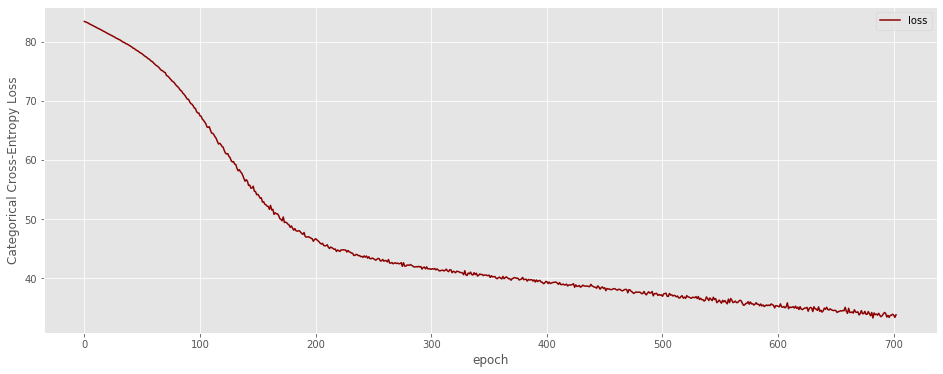

In [244]:
plt.figure(figsize=(16,6))
plt.plot(MODEL.model.history.history['loss'], color='darkred')
#plt.plot(MODEL.model.history.history['val_loss'], color='gray')
plt.legend(['loss'])#, 'val loss'])
plt.xlabel("epoch")
plt.ylabel("Categorical Cross-Entropy Loss")
plt.show()

In [245]:
areas=list(embs['areas']['alfa2index_from'].keys())
areas_emb=embs['areas']['embeddings']

In [246]:
mds = MDS(n_components=2)
mds_result = mds.fit_transform(areas_emb)

Text(127.25, 0.5, 'MDS-2')

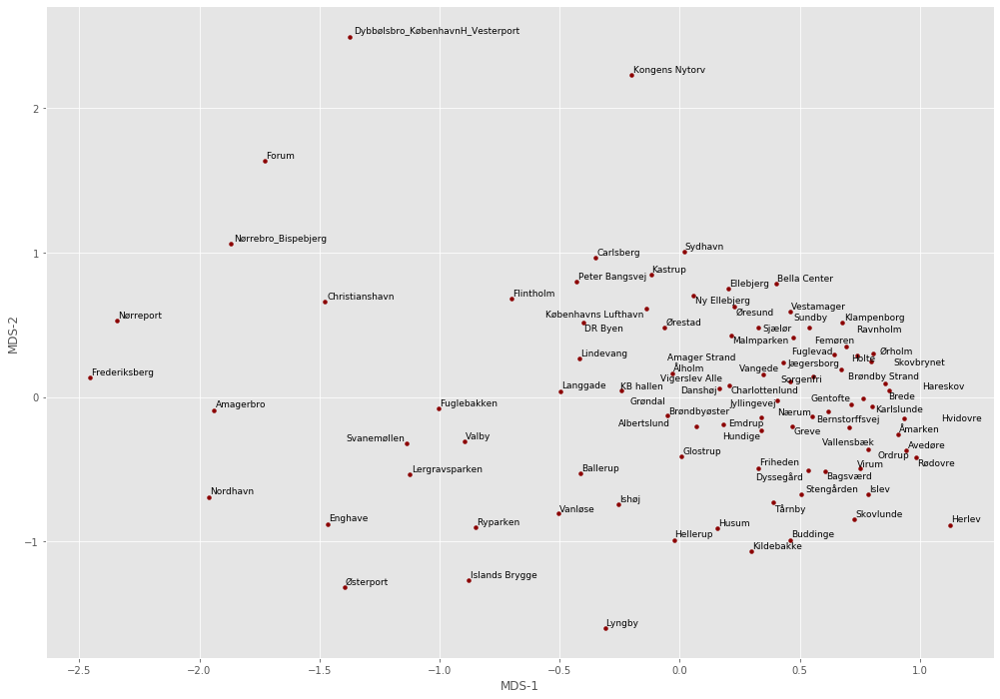

In [265]:
plt.figure(figsize=(17,12))

plt.scatter(mds_result[:,0], mds_result[:,1], s=15, c='darkred')

texts = [plt.text(mds_result[i,0], mds_result[i,1], 
                  areas[i],fontsize=9) for i in range(len(areas_emb))]
adjust_text(texts)
#plt.title('2-D projections of Copenhagen areas embeddings') 
plt.xlabel('MDS-1')
plt.ylabel('MDS-2')